# Supervised Clustering with Shap Values

--------------------------------------

## Importing and preparing data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from  matplotlib import style

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans

In [2]:
#Importing the data 
dataset= pd.read_csv("C:/Users/rodri/OneDrive/Desktop/tese/Data/Obfuscated-MalMem2022.csv")

#Separating the Category column into category and family
dataset[["Category", "Family1", "idk"]]=dataset["Category"].str.split("-", n=2, expand= True)
dataset.drop("idk",axis=1, inplace= True)


#Arranging the family column
classes=[]
for i in range(len(dataset)):
    if dataset["Class"][i]== "Benign":
        classes.append("Benign")
    else:
        classes.append(dataset["Family1"][i])
dataset["Family"]= classes

dataset.drop("Family1", axis=1,inplace= True)

#creating lists with all the features
Features=['Category', 'pslist.nproc', 'pslist.nppid', 'pslist.avg_threads',
       'pslist.nprocs64bit', 'pslist.avg_handlers', 'dlllist.ndlls',
       'dlllist.avg_dlls_per_proc', 'handles.nhandles',
       'handles.avg_handles_per_proc', 'handles.nport', 'handles.nfile',
       'handles.nevent', 'handles.ndesktop', 'handles.nkey', 'handles.nthread',
       'handles.ndirectory', 'handles.nsemaphore', 'handles.ntimer',
       'handles.nsection', 'handles.nmutant', 'ldrmodules.not_in_load',
       'ldrmodules.not_in_init', 'ldrmodules.not_in_mem',
       'ldrmodules.not_in_load_avg', 'ldrmodules.not_in_init_avg',
       'ldrmodules.not_in_mem_avg', 'malfind.ninjections',
       'malfind.commitCharge', 'malfind.protection',
       'malfind.uniqueInjections', 'psxview.not_in_pslist',
       'psxview.not_in_eprocess_pool', 'psxview.not_in_ethread_pool',
       'psxview.not_in_pspcid_list', 'psxview.not_in_csrss_handles',
       'psxview.not_in_session', 'psxview.not_in_deskthrd',
       'psxview.not_in_pslist_false_avg',
       'psxview.not_in_eprocess_pool_false_avg',
       'psxview.not_in_ethread_pool_false_avg',
       'psxview.not_in_pspcid_list_false_avg',
       'psxview.not_in_csrss_handles_false_avg',
       'psxview.not_in_session_false_avg', 'psxview.not_in_deskthrd_false_avg',
       'modules.nmodules', 'svcscan.nservices', 'svcscan.kernel_drivers',
       'svcscan.fs_drivers', 'svcscan.process_services',
       'svcscan.shared_process_services',
       'svcscan.interactive_process_services', 'svcscan.nactive',
       'callbacks.ncallbacks', 'callbacks.nanonymous', 'callbacks.ngeneric',
       'Class', 'Family']

Features1=['pslist.nproc', 'pslist.nppid', 'pslist.avg_threads',
       'pslist.nprocs64bit', 'pslist.avg_handlers', 'dlllist.ndlls',
       'dlllist.avg_dlls_per_proc', 'handles.nhandles',
       'handles.avg_handles_per_proc', 'handles.nport', 'handles.nfile',
       'handles.nevent', 'handles.ndesktop', 'handles.nkey', 'handles.nthread',
       'handles.ndirectory', 'handles.nsemaphore', 'handles.ntimer',
       'handles.nsection', 'handles.nmutant', 'ldrmodules.not_in_load',
       'ldrmodules.not_in_init', 'ldrmodules.not_in_mem',
       'ldrmodules.not_in_load_avg', 'ldrmodules.not_in_init_avg',
       'ldrmodules.not_in_mem_avg', 'malfind.ninjections',
       'malfind.commitCharge', 'malfind.protection',
       'malfind.uniqueInjections', 'psxview.not_in_pslist',
       'psxview.not_in_eprocess_pool', 'psxview.not_in_ethread_pool',
       'psxview.not_in_pspcid_list', 'psxview.not_in_csrss_handles',
       'psxview.not_in_session', 'psxview.not_in_deskthrd',
       'psxview.not_in_pslist_false_avg',
       'psxview.not_in_eprocess_pool_false_avg',
       'psxview.not_in_ethread_pool_false_avg',
       'psxview.not_in_pspcid_list_false_avg',
       'psxview.not_in_csrss_handles_false_avg',
       'psxview.not_in_session_false_avg', 'psxview.not_in_deskthrd_false_avg',
       'modules.nmodules', 'svcscan.nservices', 'svcscan.kernel_drivers',
       'svcscan.fs_drivers', 'svcscan.process_services',
       'svcscan.shared_process_services',
       'svcscan.interactive_process_services', 'svcscan.nactive',
       'callbacks.ncallbacks', 'callbacks.nanonymous', 'callbacks.ngeneric']

In [3]:
pd.set_option('display.max_columns', None)
dataset.describe()

,pslist.nproc,pslist.nppid,pslist.avg_threads,pslist.nprocs64bit,pslist.avg_handlers,dlllist.ndlls,dlllist.avg_dlls_per_proc,handles.nhandles,handles.avg_handles_per_proc,handles.nport,handles.nfile,handles.nevent,handles.ndesktop,handles.nkey,handles.nthread,handles.ndirectory,handles.nsemaphore,handles.ntimer,handles.nsection,handles.nmutant,ldrmodules.not_in_load,ldrmodules.not_in_init,ldrmodules.not_in_mem,ldrmodules.not_in_load_avg,ldrmodules.not_in_init_avg,ldrmodules.not_in_mem_avg,malfind.ninjections,malfind.commitCharge,malfind.protection,malfind.uniqueInjections,psxview.not_in_pslist,psxview.not_in_eprocess_pool,psxview.not_in_ethread_pool,psxview.not_in_pspcid_list,psxview.not_in_csrss_handles,psxview.not_in_session,psxview.not_in_deskthrd,psxview.not_in_pslist_false_avg,psxview.not_in_eprocess_pool_false_avg,psxview.not_in_ethread_pool_false_avg,psxview.not_in_pspcid_list_false_avg,psxview.not_in_csrss_handles_false_avg,psxview.not_in_session_false_avg,psxview.not_in_deskthrd_false_avg,modules.nmodules,svcscan.nservices,svcscan.kernel_drivers,svcscan.fs_drivers,svcscan.process_services,svcscan.shared_process_services,svcscan.interactive_process_services,svcscan.nactive,callbacks.ncallbacks,callbacks.nanonymous,callbacks.ngeneric
count,58596.000000,58596.000000,58596.000000,58596.0,58596.000000,58596.000000,58596.000000,5.859600e+04,58596.000000,58596.0,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.0,58596.000000,58596.000000,58596.000000,58596.000000
mean,41.394771,14.713837,11.341655,0.0,247.509819,1810.805447,43.707806,1.025858e+04,249.560958,0.0,899.119513,3572.409960,44.529166,774.280668,928.510086,102.398338,683.339324,130.327855,290.127466,312.588829,60.830347,99.946413,60.832599,0.033170,0.055223,0.033171,7.010274,969.199229,42.282408,1.733699,1.875845,0.002082,2.273500,1.879463,6.276572,3.875589,8.256605,0.040991,0.000080,0.047745,0.041078,0.141784,0.087964,0.187701,137.961465,391.347549,221.406581,25.996245,25.063417,116.879514,0.0,121.995546,86.905659,0.000853,7.999881
std,5.777249,2.656748,1.588231,0.0,111.857790,329.782639,5.742023,4.866864e+03,145.999866,0.0,3432.351200,805.460522,5.161254,150.407075,237.817566,9.782695,94.531078,14.965266,144.278832,73.173189,18.761422,21.438482,18.759947,0.009263,0.010112,0.009266,15.390647,6041.620916,92.337061,2.741343,2.995955,0.045582,4.621418,3.017659,4.622047,2.995970,4.736886,0.057563,0.001269,0.066907,0.058216,0.061438,0.055040,0.061534,0.198251,4.529704,1.991087,0.170790,1.529628,1.550401,0.0,2.822858,3.134117,0.029199,0.010929
min,21.000000,8.000000,1.650000,0.0,34.962500,670.000000,7.333333,3.514000e+03,71.139241,0.0,266.000000,966.000000,22.000000,284.000000,388.000000,57.000000,296.000000,69.000000,50.000000,118.000000,6.000000,16.000000,6.000000,0.016176,0.040526,0.016176,1.000000,1.000000,6.000000,1.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.025806,0.008333,0.043750,126.000000,94.000000,55.000000,6.000000,7.000000,26.000000,0.0,30.000000,50.000000,0.000000,7.000000
25%,40.000000,12.000000,9.972973,0.0,208.725000,1556.000000,38.833333,8.393000e+03,209.648228,0.0,646.000000,2923.000000,43.000000,675.000000,708.000000,99.000000,614.000000,120.000000,177.000000,258.000000,46.000000,85.000000,46.000000,0.028846,0.052397,0.028846,3.000000,3.000000,18.000000,1.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.048780,0.146341,138.000000,389.000000,221.000000,2

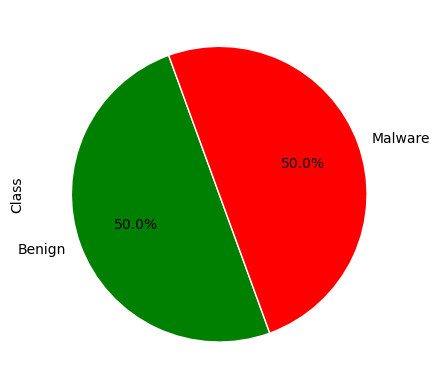

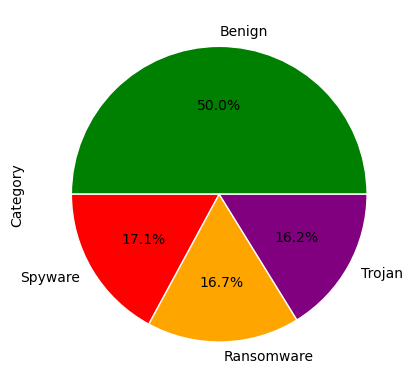

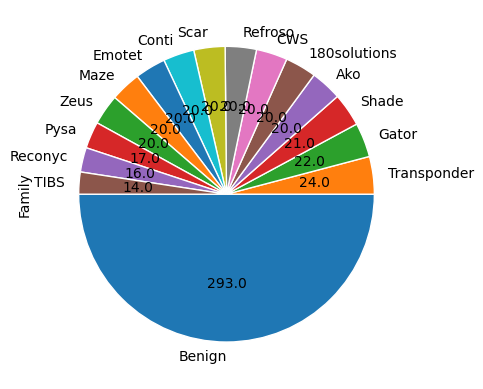

In [4]:
#Producing pie charts to vizualise the data

sizes=[]
for i in range(len(dataset.Family.value_counts())):
     sizes.append(dataset.Family.value_counts()[i])
        
sizes=np.array(sizes)
        
def absolute_value(val):
    a  = np.round(val/10000.*sizes.sum(), decimals=0)
    return a

dataset.Class.value_counts().plot.pie(wedgeprops={'edgecolor': 'white'}, autopct='%1.1f%%',startangle=110, colors=["Green", "Red"])
plt.show()

dataset.Category.value_counts().plot.pie(wedgeprops={'edgecolor': 'white'}, autopct='%1.1f%%', colors=["Green", "Red", "Orange", "Purple"])
plt.show()

dataset.Family.value_counts().plot.pie(wedgeprops={'edgecolor': 'white'}, autopct=absolute_value,  startangle=180)
plt.show()



In [5]:
dataset.Class.value_counts()

Benign     29298
Malware    29298
Name: Class, dtype: int64

In [6]:
dataset.shape[0]

58596

In [7]:
len(dataset.Family.value_counts())

16

In [8]:
len(dataset)

58596

## Unsupervised Clustering

### Scaling the data

In [9]:
datasetScaled= dataset.copy()
datasetScaled.drop(["Category","Class", "Family"], axis=1, inplace= True)

In [10]:
Scaler= StandardScaler()


datasetScaled= Scaler.fit_transform(datasetScaled)

datasetScaled= np.array(datasetScaled)

datasetScaled= pd.DataFrame(datasetScaled,columns=Features1)

datasetScaled

,pslist.nproc,pslist.nppid,pslist.avg_threads,pslist.nprocs64bit,pslist.avg_handlers,dlllist.ndlls,dlllist.avg_dlls_per_proc,handles.nhandles,handles.avg_handles_per_proc,handles.nport,handles.nfile,handles.nevent,handles.ndesktop,handles.nkey,handles.nthread,handles.ndirectory,handles.nsemaphore,handles.ntimer,handles.nsection,handles.nmutant,ldrmodules.not_in_load,ldrmodules.not_in_init,ldrmodules.not_in_mem,ldrmodules.not_in_load_avg,ldrmodules.not_in_init_avg,ldrmodules.not_in_mem_avg,malfind.ninjections,malfind.commitCharge,malfind.protection,malfind.uniqueInjections,psxview.not_in_pslist,psxview.not_in_eprocess_pool,psxview.not_in_ethread_pool,psxview.not_in_pspcid_list,psxview.not_in_csrss_handles,psxview.not_in_session,psxview.not_in_deskthrd,psxview.not_in_pslist_false_avg,psxview.not_in_eprocess_pool_false_avg,psxview.not_in_ethread_pool_false_avg,psxview.not_in_pspcid_list_false_avg,psxview.not_in_csrss_handles_false_avg,psxview.not_in_session_false_avg,psxview.not_in_deskthrd_false_avg,modules.nmodules,svcscan.nservices,svcscan.kernel_drivers,svcscan.fs_drivers,svcscan.process_services,svcscan.shared_process_services,svcscan.interactive_process_services,svcscan.nactive,callbacks.ncallbacks,callbacks.nanonymous,callbacks.ngeneric
0,0.624044,0.860519,-0.494957,0.0,-0.399308,-0.354192,-0.906971,-0.232099,-0.255199,0.0,-0.066754,-0.510780,0.284979,-0.387490,-0.174547,0.163725,-0.130533,-0.356018,-0.735578,-0.759695,-0.417368,-0.230728,-0.417521,-0.301971,-0.077286,-0.302057,-0.130618,-0.156946,-0.133018,-0.176448,0.041441,-0.045677,0.157204,0.039944,0.156518,0.041527,0.156939,0.027139,-0.062642,0.240406,0.025348,0.116412,-0.051913,0.061570,0.194377,-0.518261,-0.204202,0.021983,-0.695219,-0.567286,0.0,-0.352676,0.030102,-0.029224,0.010931
1,0.970233,1.613326,0.119794,0.0,-0.047165,0.798092,0.073120,0.231448,-0.050185,0.0,-0.017224,0.234141,1.253744,1.573871,0.426759,1.492614,0.874436,1.180888,0.324877,1.112591,0.861864,1.075346,0.861812,0.323590,0.252264,0.323325,0.324208,-0.147677,0.321841,-0.007082,-0.626131,-0.045677,-0.491953,-0.622827,-0.492550,-0.626043,-0.476394,-0.712118,-0.062642,-0.713615,-0.705618,-0.922532,-0.825052,-0.975753,0.194377,0.144039,0.298040,0.021983,-0.695219,0.722713,0.0,0.001578,0.030102,-0.029224,0.010931
2,-0.241427,-0.268691,2.130278,0.0,0.363994,0.367501,0.799759,0.261036,0.264825,0.0,0.043959,0.525902,0.091226,0.064621,1.314001,-0.245163,-0.405577,0.512668,0.546672,0.347277,-0.523970,-0.510601,-0.524132,-0.761726,-0.954511,-0.761680,-0.130618,-0.159429,-0.133018,-0.176448,-0.626131,-0.045677,-0.491953,-0.622827,-0.492550,-0.626043,-0.687505,-0.712118,-0.062642,-0.713615,-0.705618,-0.680112,-0.689753,-1.018975,-4.849775,0.806340,0.298040,0.021983,1.266059,0.722713,0.0,-0.706930,0.349173,-0.029224,0.010931
3,-1.626181,-0.645094,1.358973,0.0,0.149937,-1.109241,0.252255,-0.370177,0.100825,0.0,-0.078407,-0.759088,-1.652552,-0.799708,-0.574017,-1.982941,-1.230710,-0.222374,-0.721716,-0.964690,-1.589997,-1.770029,-1.590242,-1.261621,-1.212118,-1.261432,-0.325543,-0.160091,-0.327958,-0.267644,-0.626131,-0.045677,-0.491953,-0.622827,-0.492550,-0.626043,-0.476394,-0.712118,-0.062642,-0.713615,-0.705618,-0.273192,-0.462643,-0.003263,0.194377,0.806340,0.298040,0.021983,1.266059,0.722713,0.0,-0.706930,0.349173,-0.029224,0.010931
4,0.104762,0.484116,0.069717,0.0,0.302382,0.776865,0.958987,0.320007,0.217621,0.0,0.002587,0.324774,0.091226,3.176203,0.056724,0.061503,1.498575,0.312202,0.588259,1.590913,2.194397,2.008256,2.194449,1.581546,1.168827,1.580922,0.324208,-0.147677,0.321841,0.097143,0.709014,-0.045677,0.373590,0.702715,0.372874,0.709096,0.368050,0.798536,-0.062642,0.586066,0.788095,0.522956,0.771648,0.482513,0.194377,0.144039,0.298040,0.021983,-0.695219,0.722713,0.0,0.710086,0.030102,-0.029224,0.010931
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

### Reducing the data to 2 dimensions and rescalling

In [11]:
dataset2D= datasetScaled.copy()

In [12]:
pca =PCA(n_components=2)
dataset2D[["Principal Component 1", "Principal Component 2"]]= pca.fit_transform(dataset2D)
print(pca.explained_variance_ratio_*100)
dataset2D= dataset2D[["Principal Component 1", "Principal Component 2"]]

[29.95152567 20.50564692]


In [13]:
Scaler1=StandardScaler()

dataset2D= Scaler.fit_transform(dataset2D)

dataset2D= np.array(dataset2D)

dataset2D= pd.DataFrame(dataset2D,columns=["Principal Component 1", "Principal Component 2"])

dataset2D.describe()

,Principal Component 1,Principal Component 2
count,5.859600e+04,5.859600e+04
mean,4.017379e-15,-3.529327e-16
std,1.000009e+00,1.000009e+00
min,-1.277753e+01,-4.046202e+00
25%,-7.959473e-01,-5.372287e-01
50%,-2.900258e-01,-2.745776e-01
75%,9.419354e-01,3.100540e-01
max,2.642233e+01,1.342238e+01


### Clustering the data (Malware vs Benign)

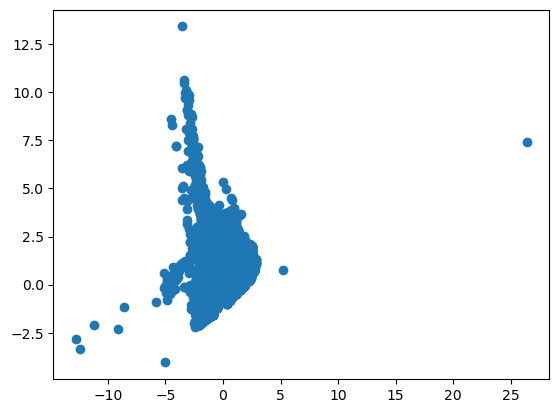

In [14]:
plt.scatter(dataset2D["Principal Component 1"],dataset2D["Principal Component 2"])

In [15]:
#copying the dataframe to improve organization
datasetCluster2= dataset2D.copy()

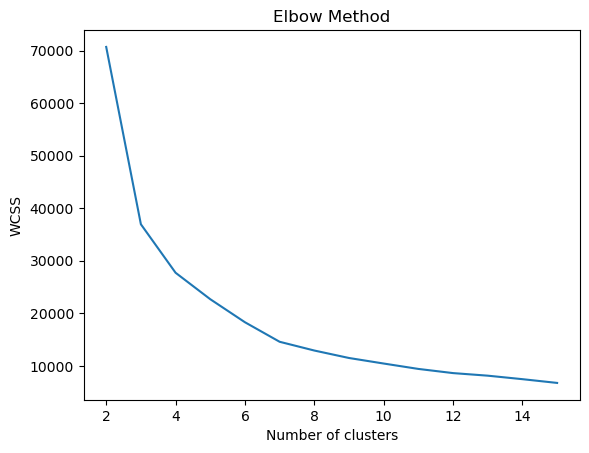

In [16]:
wcss = []

for i in range(2, 16):
    #model = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    model =KMeans(n_clusters=i)
    model.fit(dataset2D[["Principal Component 1", "Principal Component 2"]])
    wcss.append(model.inertia_)
plt.plot(range(2, 16), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()
#the elbow method shows that the optimum number of cluster should be between 6 and 8 clusters

In [17]:
#Initializing the kmeans model for 2 clusters(benign and malware)
kmeans2=KMeans(n_clusters=2, random_state=1)
y2_pred=kmeans2.fit_predict(dataset2D[["Principal Component 1", "Principal Component 2"]])

In [18]:
#organazing a dataframe to produce better visualizations
datasetCluster2["Cluster"]=y2_pred
datasetCluster2["Category"]= dataset["Category"]
datasetCluster2["Class"]= dataset["Class"]
datasetCluster2["Family"]= dataset["Family"]
datasetCluster2

,Principal Component 1,Principal Component 2,Cluster,Category,Class,Family
0,-0.454164,0.011136,1,Benign,Benign,Benign
1,0.871756,-0.149260,0,Benign,Benign,Benign
2,0.423269,-0.910884,0,Benign,Benign,Benign
3,-0.549543,-1.158069,1,Benign,Benign,Benign
4,0.839404,1.208529,0,Benign,Benign,Benign
...,...,...,...,...,...,...
58591,-0.889130,-0.636817,1,Ransomware,Malware,Shade
58592,-1.150324,-1.149242,1,Ransomware,Malware,Shade
58593,-1.021942,-0.185218,1,Ransomware,Malware,Shade
58594,-0.784899,-0.968064,1,Ransomware,Malware,Shade


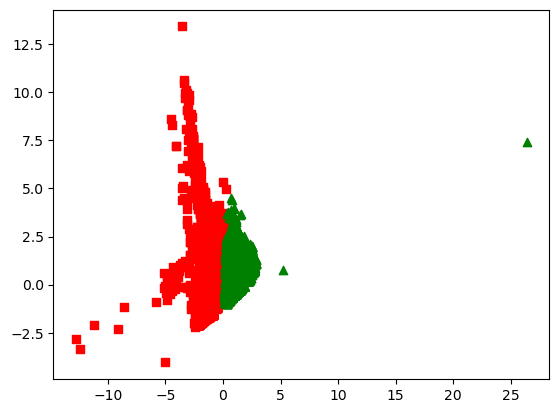

In [19]:
#0 for benign, 1 for malware
#green for benign, red for malware
Cluster1= datasetCluster2[datasetCluster2.Cluster==1]
Cluster0= datasetCluster2[datasetCluster2.Cluster==0]

plt.scatter(Cluster1["Principal Component 1"], Cluster1["Principal Component 2"], color="red", marker="s")
plt.scatter(Cluster0["Principal Component 1"], Cluster0["Principal Component 2"], color="green", marker="^")

In [20]:
datasetCluster2[datasetCluster2.Cluster==0].Class.value_counts()

Benign     25531
Malware      153
Name: Class, dtype: int64

In [21]:
datasetCluster2[datasetCluster2.Cluster==1].Class.value_counts()

Malware    29145
Benign      3767
Name: Class, dtype: int64

In [22]:
#overall kmeans accuracy
count= 0
for i in range(len(datasetCluster2)):
    if (datasetCluster2["Cluster"][i]== 1 and datasetCluster2["Class"][i]== "Malware") or (datasetCluster2["Cluster"][i]== 0 and datasetCluster2["Class"][i]== "Benign"):
        count += 1
        
print("Accuracy:", count/len(datasetCluster2)*100, "%")

#false positive rate
print("False Positive rate:", len(datasetCluster2[datasetCluster2.Cluster==0][datasetCluster2.Class== "Malware"])/(len(datasetCluster2[datasetCluster2.Cluster==0][datasetCluster2.Class== "Malware"])+len(datasetCluster2[datasetCluster2.Cluster==1][datasetCluster2.Class=="Malware"])) * 100, "%")


Accuracy: 93.31012355792204 %
False Positive rate: 0.5222199467540447 %


C:\Users\rodri\AppData\Local\Temp\ipykernel_10904\1955624738.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print("False Positive rate:", len(datasetCluster2[datasetCluster2.Cluster==0][datasetCluster2.Class== "Malware"])/(len(datasetCluster2[datasetCluster2.Cluster==0][datasetCluster2.Class== "Malware"])+len(datasetCluster2[datasetCluster2.Cluster==1][datasetCluster2.Class=="Malware"])) * 100, "%")


In [23]:
#Creating two datasets, one for the malware, other for the benign
Malware=datasetCluster2[datasetCluster2.Class== "Malware"]
Benign = datasetCluster2[datasetCluster2.Class== "Benign"]
#plt.scatter(Cluster1["Principal Component 1"], Cluster1["Principal Component 2"], color="green", marker="s")

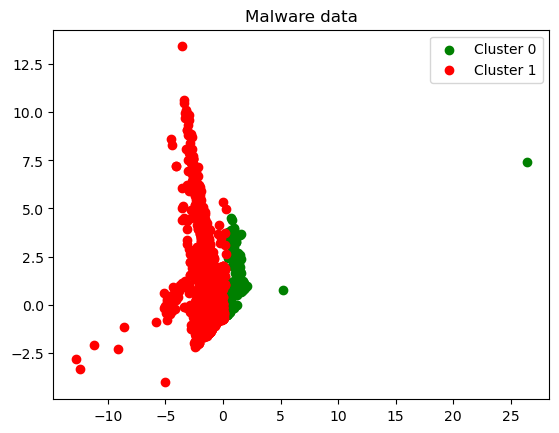

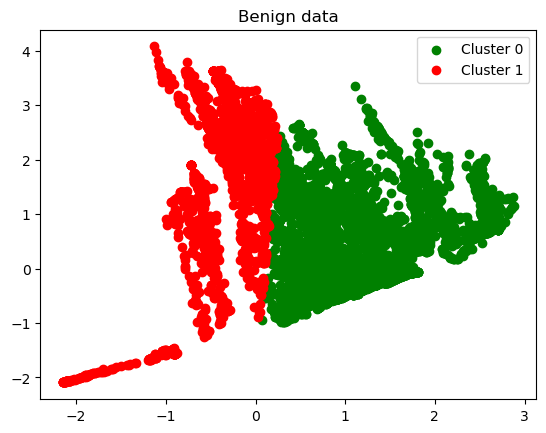

In [24]:
#Scatter plot to visualize the distribution of the malware data among the two clusters
plt.scatter(Malware[Malware.Cluster==0]["Principal Component 1"], Malware[Malware.Cluster==0]["Principal Component 2"], color="green")
plt.scatter(Malware[Malware.Cluster==1]["Principal Component 1"], Malware[Malware.Cluster==1]["Principal Component 2"], color="red")
plt.title("Malware data")
plt.legend(["Cluster 0", "Cluster 1"])
plt.show()

#Scatter plot to visualize the distribution of the benign data among the two clusters
plt.scatter(Benign[Benign.Cluster==0]["Principal Component 1"], Benign[Benign.Cluster==0]["Principal Component 2"], color="green")
plt.scatter(Benign[Benign.Cluster==1]["Principal Component 1"], Benign[Benign.Cluster==1]["Principal Component 2"], color="red")
plt.title("Benign data")
plt.legend(["Cluster 0", "Cluster 1"])
plt.show()

### Clustering the data (Malware types)

In [25]:
datasetCluster4= dataset2D.copy()

In [26]:
kmeans4=KMeans(n_clusters=4, random_state=1)
y4_pred=kmeans4.fit_predict(dataset2D[["Principal Component 1", "Principal Component 2"]])
datasetCluster4["Cluster"]=y4_pred
datasetCluster4["Category"]= dataset["Category"]
datasetCluster4["Class"]= dataset["Class"]
datasetCluster4["Family"]= dataset["Family"]
datasetCluster4

,Principal Component 1,Principal Component 2,Cluster,Category,Class,Family
0,-0.454164,0.011136,3,Benign,Benign,Benign
1,0.871756,-0.149260,2,Benign,Benign,Benign
2,0.423269,-0.910884,2,Benign,Benign,Benign
3,-0.549543,-1.158069,0,Benign,Benign,Benign
4,0.839404,1.208529,2,Benign,Benign,Benign
...,...,...,...,...,...,...
58591,-0.889130,-0.636817,0,Ransomware,Malware,Shade
58592,-1.150324,-1.149242,0,Ransomware,Malware,Shade
58593,-1.021942,-0.185218,0,Ransomware,Malware,Shade
58594,-0.784899,-0.968064,0,Ransomware,Malware,Shade


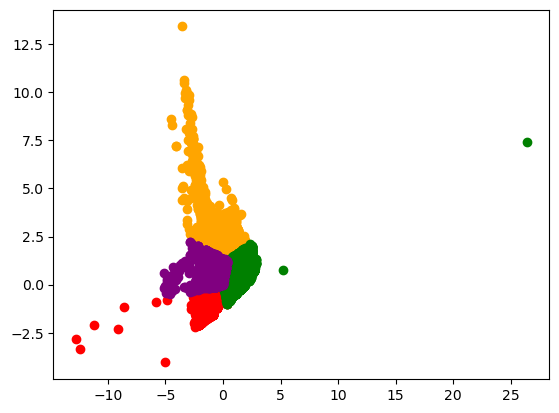

In [27]:
Cluster40= datasetCluster4[datasetCluster4.Cluster==0]
Cluster41= datasetCluster4[datasetCluster4.Cluster==1]
Cluster42= datasetCluster4[datasetCluster4.Cluster==2]
Cluster43= datasetCluster4[datasetCluster4.Cluster==3]

plt.scatter(Cluster40["Principal Component 1"], Cluster40["Principal Component 2"], color="red")
plt.scatter(Cluster41["Principal Component 1"], Cluster41["Principal Component 2"], color="orange")
plt.scatter(Cluster42["Principal Component 1"], Cluster42["Principal Component 2"], color="green")
plt.scatter(Cluster43["Principal Component 1"], Cluster43["Principal Component 2"], color="purple")

In [28]:
datasetCluster4[datasetCluster4.Cluster==1].Category.value_counts()

Benign        3772
Spyware        423
Ransomware     261
Trojan          49
Name: Category, dtype: int64

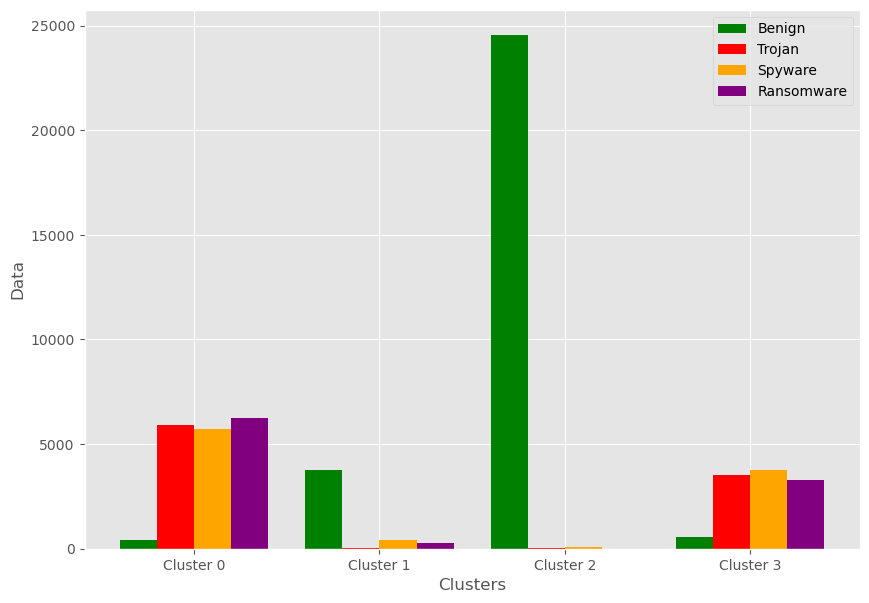

In [29]:
# cluster 0, cluster 1, cluster 2, cluster 3
benign=[427,3772,24529,570]
trojan=[5905,49,17, 3516]
spyware=[5729,423,83, 3785]
ransomware=[6260,261,9, 3261]
xpos=np.arange(len(benign))

style.use("ggplot")
plt.figure(figsize=(10,7))
barwidth=0.2
plt.bar(xpos,benign, color='green', width= barwidth, label="Benign")
plt.bar(xpos+0.2,trojan, color='red', width= barwidth, label="Trojan")
plt.bar(xpos+0.4,spyware, color='orange', width= barwidth, label="Spyware")
plt.bar(xpos+0.6,ransomware, color='purple', width= barwidth, label="Ransomware")
plt.xlabel("Clusters")
plt.xticks(xpos+0.3,("Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3"))
plt.ylabel("Data")
plt.legend()


In [30]:
"""
plt.figure(figsize=(10,7))
barwidth=0.2
plt.bar(xpos,benign, color='green', width= barwidth, label="Benign")
plt.bar(xpos,trojan, bottom=benign, color='red', width= barwidth, label="Trojan")
plt.bar(xpos,spyware, bottom=trojan, color='orange', width= barwidth, label="Spyware")
plt.bar(xpos,ransomware, bottom=spyware, color='purple', width= barwidth, label="Ransomware")
plt.xlabel("Clusters")
plt.xticks(xpos,("Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3"))
plt.ylabel("Data")
plt.legend()
"""

'\nplt.figure(figsize=(10,7))\nbarwidth=0.2\nplt.bar(xpos,benign, color=\'green\', width= barwidth, label="Benign")\nplt.bar(xpos,trojan, bottom=benign, color=\'red\', width= barwidth, label="Trojan")\nplt.bar(xpos,spyware, bottom=trojan, color=\'orange\', width= barwidth, label="Spyware")\nplt.bar(xpos,ransomware, bottom=spyware, color=\'purple\', width= barwidth, label="Ransomware")\nplt.xlabel("Clusters")\nplt.xticks(xpos,("Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3"))\nplt.ylabel("Data")\nplt.legend()\n'

In [31]:
datasetCluster4

,Principal Component 1,Principal Component 2,Cluster,Category,Class,Family
0,-0.454164,0.011136,3,Benign,Benign,Benign
1,0.871756,-0.149260,2,Benign,Benign,Benign
2,0.423269,-0.910884,2,Benign,Benign,Benign
3,-0.549543,-1.158069,0,Benign,Benign,Benign
4,0.839404,1.208529,2,Benign,Benign,Benign
...,...,...,...,...,...,...
58591,-0.889130,-0.636817,0,Ransomware,Malware,Shade
58592,-1.150324,-1.149242,0,Ransomware,Malware,Shade
58593,-1.021942,-0.185218,0,Ransomware,Malware,Shade
58594,-0.784899,-0.968064,0,Ransomware,Malware,Shade


### Clustering the data( all malware families)

In [32]:
Families=dataset.Family.unique()

In [33]:
len(Families)

16

In [34]:
datasetCluster16= dataset2D.copy()

In [35]:
kmeans16=KMeans(n_clusters=16, random_state=1)
y16_pred=kmeans16.fit_predict(dataset2D[["Principal Component 1", "Principal Component 2"]])

In [36]:
datasetCluster16["Cluster"]=y16_pred
datasetCluster16["Category"]= dataset["Category"]
datasetCluster16["Class"]= dataset["Class"]
datasetCluster16["Family"]= dataset["Family"]
datasetCluster16

,Principal Component 1,Principal Component 2,Cluster,Category,Class,Family
0,-0.454164,0.011136,11,Benign,Benign,Benign
1,0.871756,-0.149260,1,Benign,Benign,Benign
2,0.423269,-0.910884,8,Benign,Benign,Benign
3,-0.549543,-1.158069,0,Benign,Benign,Benign
4,0.839404,1.208529,7,Benign,Benign,Benign
...,...,...,...,...,...,...
58591,-0.889130,-0.636817,0,Ransomware,Malware,Shade
58592,-1.150324,-1.149242,0,Ransomware,Malware,Shade
58593,-1.021942,-0.185218,11,Ransomware,Malware,Shade
58594,-0.784899,-0.968064,0,Ransomware,Malware,Shade


In [37]:
datasetCluster16.Cluster.value_counts()

1     11636
8      7801
4      7234
11     6686
0      6250
3      5026
12     2898
10     2276
6      1969
9      1779
2      1724
7      1564
13     1385
15      267
5       100
14        1
Name: Cluster, dtype: int64

Text(0.5, 1.0, 'Clustering 16 families')

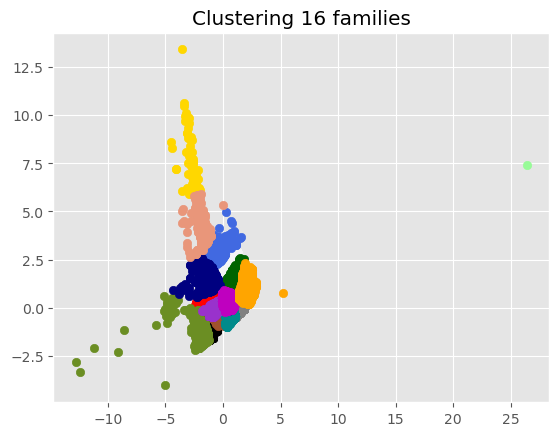

In [38]:
colors=["black","gray","whitesmoke","red","sienna","gold", "olivedrab", "darkgreen", "darkcyan","royalblue", "navy","darkorchid","m","orange","palegreen","darksalmon"]
for i in range(len(Families)):
    plt.scatter(datasetCluster16[datasetCluster16.Cluster== i]["Principal Component 1"],datasetCluster16[datasetCluster16.Cluster== i]["Principal Component 2"], color= colors[i])
    
plt.title("Clustering 16 families")    
    

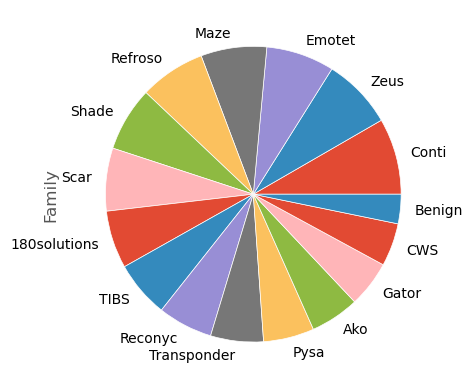

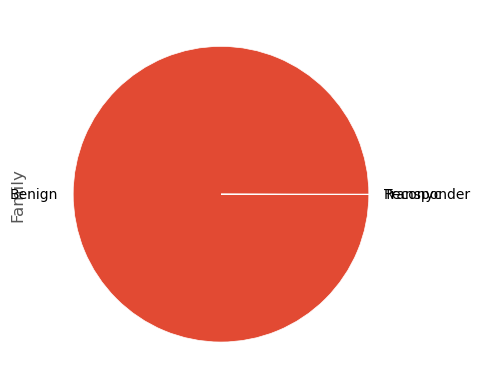

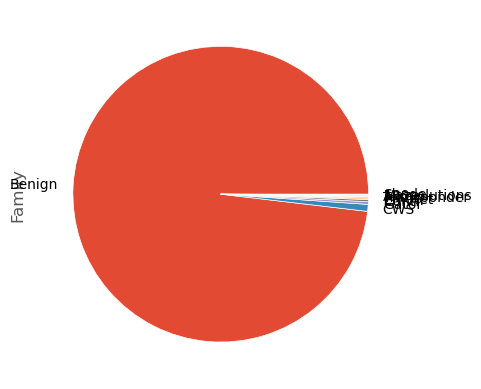

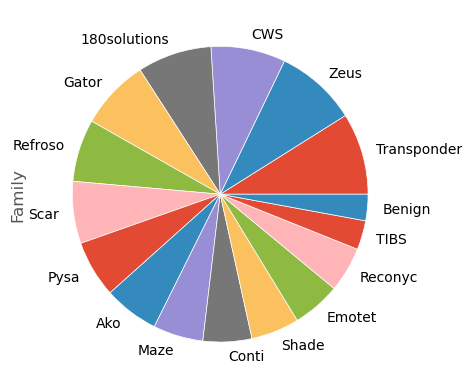

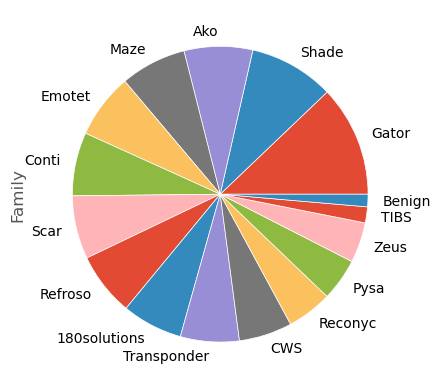

...

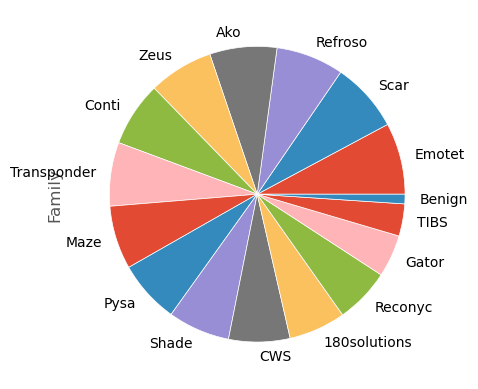

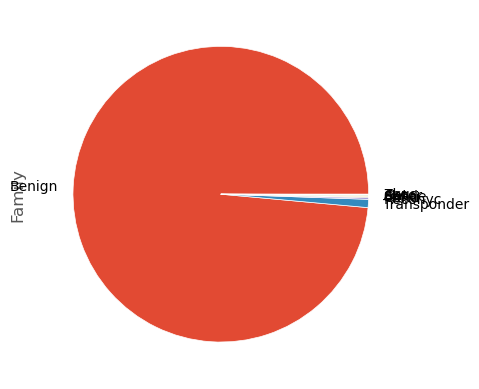

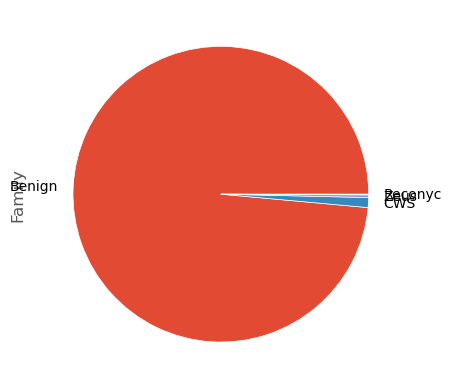

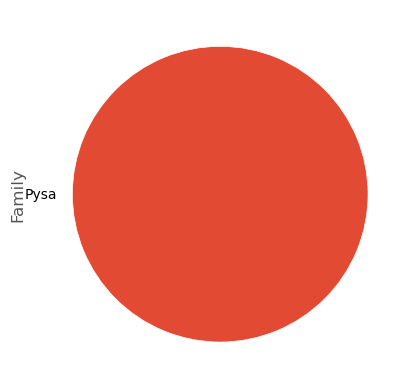

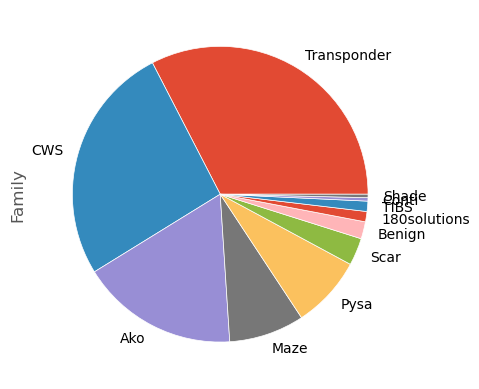

In [39]:
for i in range(len(Families)):
    datasetCluster16[datasetCluster16.Cluster==i].Family.value_counts().plot.pie(wedgeprops={'edgecolor': 'white'})
    plt.show()



In [40]:
len(Families)

16

In [41]:
datasetCluster16[datasetCluster16.Cluster==5].Family.value_counts()

Ako            27
Transponder    27
CWS            21
Pysa           13
Maze            8
Reconyc         2
Scar            2
Name: Family, dtype: int64

## Supervised Clustering

### Obtaining SHAP values

In [42]:
import xgboost as xgb
import shap
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_val_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from datetime import datetime


shap.initjs()

In [ ]:
#time function to track running time
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now()- start_time).total_seconds(), 3600)
        tmin, tsec= divmod(temp_sec, 60)
        print("\n Time taken: %i hours %i minutes and %i seconds." % (thour, tmin, round(tsec,2)))

In [45]:
#0 for benign, 1 for malware
#0 for benign, 1 for ransomware, 2 for spyware, 3 for Trojan
#enconding the target variables
dataset2 = dataset.copy()
Class = ["Benign", "Malware"]
Category=['Benign', 'Ransomware', 'Spyware', 'Trojan']
Family= ['Benign', 'Ako', 'Conti', 'Maze', 'Pysa', 'Shade', '180solutions',
       'CWS', 'Gator', 'TIBS', 'Transponder', 'Emotet', 'Reconyc',
       'Refroso', 'Scar', 'Zeus']

Code1=[0,1]
Code2=[0,1,2,3]
Code3=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]

dataset2.Class.replace(Class, Code1, inplace= True)
dataset2.Category.replace(Category, Code2, inplace= True)
dataset2.Family.replace(Family, Code3, inplace= True)
#dropping useless futures
dataset2.drop(["pslist.nprocs64bit","handles.nport","svcscan.interactive_process_services"], axis= 1, inplace= True)

In [83]:
dataset2.describe()

,Category,pslist.nproc,pslist.nppid,pslist.avg_threads,pslist.nprocs64bit,pslist.avg_handlers,dlllist.ndlls,dlllist.avg_dlls_per_proc,handles.nhandles,handles.avg_handles_per_proc,handles.nport,handles.nfile,handles.nevent,handles.ndesktop,handles.nkey,handles.nthread,handles.ndirectory,handles.nsemaphore,handles.ntimer,handles.nsection,handles.nmutant,ldrmodules.not_in_load,ldrmodules.not_in_init,ldrmodules.not_in_mem,ldrmodules.not_in_load_avg,ldrmodules.not_in_init_avg,ldrmodules.not_in_mem_avg,malfind.ninjections,malfind.commitCharge,malfind.protection,malfind.uniqueInjections,psxview.not_in_pslist,psxview.not_in_eprocess_pool,psxview.not_in_ethread_pool,psxview.not_in_pspcid_list,psxview.not_in_csrss_handles,psxview.not_in_session,psxview.not_in_deskthrd,psxview.not_in_pslist_false_avg,psxview.not_in_eprocess_pool_false_avg,psxview.not_in_ethread_pool_false_avg,psxview.not_in_pspcid_list_false_avg,psxview.not_in_csrss_handles_false_avg,psxview.not_in_session_false_avg,psxview.not_in_deskthrd_false_avg,modules.nmodules,svcscan.nservices,svcscan.kernel_drivers,svcscan.fs_drivers,svcscan.process_services,svcscan.shared_process_services,svcscan.interactive_process_services,svcscan.nactive,callbacks.ncallbacks,callbacks.nanonymous,callbacks.ngeneric,Class,Family
count,58596.000000,58596.000000,58596.000000,58596.000000,58596.0,58596.000000,58596.000000,58596.000000,5.859600e+04,58596.000000,58596.0,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.0,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000,58596.000000
mean,0.994812,41.394771,14.713837,11.341655,0.0,247.509819,1810.805447,43.707806,1.025858e+04,249.560958,0.0,899.119513,3572.409960,44.529166,774.280668,928.510086,102.398338,683.339324,130.327855,290.127466,312.588829,60.830347,99.946413,60.832599,0.033170,0.055223,0.033171,7.010274,969.199229,42.282408,1.733699,1.875845,0.002082,2.273500,1.879463,6.276572,3.875589,8.256605,0.040991,0.000080,0.047745,0.041078,0.141784,0.087964,0.187701,137.961465,391.347549,221.406581,25.996245,25.063417,116.879514,0.0,121.995546,86.905659,0.000853,7.999881,0.500000,3.984487
std,1.148311,5.777249,2.656748,1.588231,0.0,111.857790,329.782639,5.742023,4.866864e+03,145.999866,0.0,3432.351200,805.460522,5.161254,150.407075,237.817566,9.782695,94.531078,14.965266,144.278832,73.173189,18.761422,21.438482,18.759947,0.009263,0.010112,0.009266,15.390647,6041.620916,92.337061,2.741343,2.995955,0.045582,4.621418,3.017659,4.622047,2.995970,4.736886,0.057563,0.001269,0.066907,0.058216,0.061438,0.055040,0.061534,0.198251,4.529704,1.991087,0.170790,1.529628,1.550401,0.0,2.822858,3.134117,0.029199,0.010929,0.500004,5.020336
min,0.000000,21.000000,8.000000,1.650000,0.0,34.962500,670.000000,7.333333,3.514000e+03,71.139241,0.0,266.000000,966.000000,22.000000,284.000000,388.000000,57.000000,296.000000,69.000000,50.000000,118.000000,6.000000,16.000000,6.000000,0.016176,0.040526,0.016176,1.000000,1.000000,6.000000,1.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.025806,0.008333,0.043750,126.000000,94.000000,55.000000,6.000000,7.000000,26.000000,0.0,30.000000,50.000000,0.000000,7.000000,0.000000,0.000000
25%,0.000000,40.000000,12.000000,9.972973,0.0,208.725000,1556.000000,38.833333,8.393000e+03,209.648228,0.0,646.000000,2923.000000,43.000000,675.000000,708.000000,99.000000,614.000000,120.000000,177.000000,258.000000,46.000000,85.000000,46.000000,0.028846,0.052397,0.028846,3.000000,3.000000,18.000000,1.000000,0.000000,

In [85]:
#dropping useless futures
dataset2.drop(["pslist.nprocs64bit","handles.nport","svcscan.interactive_process_services"], axis= 1, inplace= True)

### Training a xgboost model

In [109]:
X = dataset2.drop(["Category","Class","Family"], axis=1)
Y = dataset2["Category"]

x_train,x_test, y_train,y_test= train_test_split(X, Y, test_size=0.2, random_state=0)

In [114]:
#param optimization for gridsearch
params = {
    "learning_rate": [0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
    "max_depth": [5,10,15,20],
    "min_child_weight": [1,3,5,7],
    "gamma": [0.0, 0.1, 0.2, 0.3, 0.4],
    "colsample_bytree": [0.3, 0.4, 0.5, 0.7],
    "early_stopping_rounds": [25,50,100],
    "n_estimators": [100,200,500]
}

In [117]:
Classifier= xgb.XGBClassifier()
random_search=RandomizedSearchCV(Classifier, param_distributions=params, n_iter=5, n_jobs=-1,cv=5)
gridsearch= GridSearchCV(Classifier, param_grid= params)

In [118]:
start_time=timer(None)
random_search.fit(x_train,y_train, eval_set=[(x_test, y_test)])
timer(start_time)

[0]	validation_0-mlogloss:1.11570
[1]	validation_0-mlogloss:0.93846
[2]	validation_0-mlogloss:0.80681
[3]	validation_0-mlogloss:0.70852
[4]	validation_0-mlogloss:0.63019
[5]	validation_0-mlogloss:0.56938
[6]	validation_0-mlogloss:0.52045
[7]	validation_0-mlogloss:0.47958
[8]	validation_0-mlogloss:0.44706
[9]	validation_0-mlogloss:0.42026
[10]	validation_0-mlogloss:0.39807
[11]	validation_0-mlogloss:0.37957
[12]	validation_0-mlogloss:0.36532
[13]	validation_0-mlogloss:0.35377
[14]	validation_0-mlogloss:0.34337
[15]	validation_0-mlogloss:0.33491
[16]	validation_0-mlogloss:0.32743
[17]	validation_0-mlogloss:0.32113
[18]	validation_0-mlogloss:0.31624
[19]	validation_0-mlogloss:0.31158
[20]	validation_0-mlogloss:0.30776
[21]	validation_0-mlogloss:0.30476
[22]	validation_0-mlogloss:0.30182
[23]	validation_0-mlogloss:0.29922
[24]	validation_0-mlogloss:0.29659
[25]	validation_0-mlogloss:0.29456
[26]	validation_0-mlogloss:0.29310
[27]	validation_0-mlogloss:0.29152
[28]	validation_0-mlogloss:0.2

In [119]:
random_search.best_params_

{'n_estimators': 100,
 'min_child_weight': 3,
 'max_depth': 15,
 'learning_rate': 0.2,
 'gamma': 0.3,
 'early_stopping_rounds': 50,
 'colsample_bytree': 0.7}

In [120]:
start_time=timer(None)
gridsearch.fit(x_train,y_train, eval_set=[(x_test, y_test)])
timer(start_time)

[0]	validation_0-mlogloss:1.32578
[1]	validation_0-mlogloss:1.27123
[2]	validation_0-mlogloss:1.22161
[3]	validation_0-mlogloss:1.17701
[4]	validation_0-mlogloss:1.13574
[5]	validation_0-mlogloss:1.09768
[6]	validation_0-mlogloss:1.06128
[7]	validation_0-mlogloss:1.02795
[8]	validation_0-mlogloss:0.99697
[9]	validation_0-mlogloss:0.96762
[10]	validation_0-mlogloss:0.94039
[11]	validation_0-mlogloss:0.91468
[12]	validation_0-mlogloss:0.89098
[13]	validation_0-mlogloss:0.86860
[14]	validation_0-mlogloss:0.84752
[15]	validation_0-mlogloss:0.82690
[16]	validation_0-mlogloss:0.80820
[17]	validation_0-mlogloss:0.79021
[18]	validation_0-mlogloss:0.77326
[19]	validation_0-mlogloss:0.75765
[20]	validation_0-mlogloss:0.74244
[21]	validation_0-mlogloss:0.72788
[22]	validation_0-mlogloss:0.71413
[23]	validation_0-mlogloss:0.70128
[24]	validation_0-mlogloss:0.68884
[25]	validation_0-mlogloss:0.67727
[26]	validation_0-mlogloss:0.66616
[27]	validation_0-mlogloss:0.65591
[28]	validation_0-mlogloss:0.6

[35]	validation_0-mlogloss:0.58750
[36]	validation_0-mlogloss:0.58044
[37]	validation_0-mlogloss:0.57378
[38]	validation_0-mlogloss:0.56728
[39]	validation_0-mlogloss:0.56140
[40]	validation_0-mlogloss:0.55537
[41]	validation_0-mlogloss:0.54980
[42]	validation_0-mlogloss:0.54465
[43]	validation_0-mlogloss:0.53964
[44]	validation_0-mlogloss:0.53478
[45]	validation_0-mlogloss:0.53016
[46]	validation_0-mlogloss:0.52566
[47]	validation_0-mlogloss:0.52135
[48]	validation_0-mlogloss:0.51730
[49]	validation_0-mlogloss:0.51319
[50]	validation_0-mlogloss:0.50944
[51]	validation_0-mlogloss:0.50592
[52]	validation_0-mlogloss:0.50209
[53]	validation_0-mlogloss:0.49887
[54]	validation_0-mlogloss:0.49581
[55]	validation_0-mlogloss:0.49277
[56]	validation_0-mlogloss:0.48972
[57]	validation_0-mlogloss:0.48690
[58]	validation_0-mlogloss:0.48410
[59]	validation_0-mlogloss:0.48146
[60]	validation_0-mlogloss:0.47906
[61]	validation_0-mlogloss:0.47664
[62]	validation_0-mlogloss:0.47420
[63]	validation_0-ml

[70]	validation_0-mlogloss:0.45631
[71]	validation_0-mlogloss:0.45448
[72]	validation_0-mlogloss:0.45254
[73]	validation_0-mlogloss:0.45086
[74]	validation_0-mlogloss:0.44925
[75]	validation_0-mlogloss:0.44785
[76]	validation_0-mlogloss:0.44633
[77]	validation_0-mlogloss:0.44485
[78]	validation_0-mlogloss:0.44351
[79]	validation_0-mlogloss:0.44219
[80]	validation_0-mlogloss:0.44085
[81]	validation_0-mlogloss:0.43958
[82]	validation_0-mlogloss:0.43822
[83]	validation_0-mlogloss:0.43705
[84]	validation_0-mlogloss:0.43592
[85]	validation_0-mlogloss:0.43475
[86]	validation_0-mlogloss:0.43372
[87]	validation_0-mlogloss:0.43258
[88]	validation_0-mlogloss:0.43157
[89]	validation_0-mlogloss:0.43050
[90]	validation_0-mlogloss:0.42943
[91]	validation_0-mlogloss:0.42863
[92]	validation_0-mlogloss:0.42774
[93]	validation_0-mlogloss:0.42686
[94]	validation_0-mlogloss:0.42607
[95]	validation_0-mlogloss:0.42497
[96]	validation_0-mlogloss:0.42403
[97]	validation_0-mlogloss:0.42302
[98]	validation_0-ml

[2]	validation_0-mlogloss:1.22188
[3]	validation_0-mlogloss:1.17717
[4]	validation_0-mlogloss:1.13579
[5]	validation_0-mlogloss:1.09765
[6]	validation_0-mlogloss:1.06122
[7]	validation_0-mlogloss:1.02790
[8]	validation_0-mlogloss:0.99701
[9]	validation_0-mlogloss:0.96770
[10]	validation_0-mlogloss:0.94047
[11]	validation_0-mlogloss:0.91466
[12]	validation_0-mlogloss:0.89104
[13]	validation_0-mlogloss:0.86870
[14]	validation_0-mlogloss:0.84788
[15]	validation_0-mlogloss:0.82731
[16]	validation_0-mlogloss:0.80836
[17]	validation_0-mlogloss:0.79034
[18]	validation_0-mlogloss:0.77345
[19]	validation_0-mlogloss:0.75798
[20]	validation_0-mlogloss:0.74269
[21]	validation_0-mlogloss:0.72814
[22]	validation_0-mlogloss:0.71439
[23]	validation_0-mlogloss:0.70138
[24]	validation_0-mlogloss:0.68899
[25]	validation_0-mlogloss:0.67744
[26]	validation_0-mlogloss:0.66636
[27]	validation_0-mlogloss:0.65615
[28]	validation_0-mlogloss:0.64599
[29]	validation_0-mlogloss:0.63623
[30]	validation_0-mlogloss:0

[34]	validation_0-mlogloss:0.59485
[35]	validation_0-mlogloss:0.58750
[36]	validation_0-mlogloss:0.58044
[37]	validation_0-mlogloss:0.57378
[38]	validation_0-mlogloss:0.56728
[39]	validation_0-mlogloss:0.56140
[40]	validation_0-mlogloss:0.55537
[41]	validation_0-mlogloss:0.54980
[42]	validation_0-mlogloss:0.54465
[43]	validation_0-mlogloss:0.53964
[44]	validation_0-mlogloss:0.53478
[45]	validation_0-mlogloss:0.53016
[46]	validation_0-mlogloss:0.52566
[47]	validation_0-mlogloss:0.52135
[48]	validation_0-mlogloss:0.51730
[49]	validation_0-mlogloss:0.51319
[50]	validation_0-mlogloss:0.50944
[51]	validation_0-mlogloss:0.50592
[52]	validation_0-mlogloss:0.50209
[53]	validation_0-mlogloss:0.49887
[54]	validation_0-mlogloss:0.49581
[55]	validation_0-mlogloss:0.49277
[56]	validation_0-mlogloss:0.48972
[57]	validation_0-mlogloss:0.48690
[58]	validation_0-mlogloss:0.48410
[59]	validation_0-mlogloss:0.48146
[60]	validation_0-mlogloss:0.47906
[61]	validation_0-mlogloss:0.47664
[62]	validation_0-ml

[66]	validation_0-mlogloss:0.46496
[67]	validation_0-mlogloss:0.46263
[68]	validation_0-mlogloss:0.46034
[69]	validation_0-mlogloss:0.45828
[70]	validation_0-mlogloss:0.45645
[71]	validation_0-mlogloss:0.45445
[72]	validation_0-mlogloss:0.45273
[73]	validation_0-mlogloss:0.45115
[74]	validation_0-mlogloss:0.44952
[75]	validation_0-mlogloss:0.44813
[76]	validation_0-mlogloss:0.44658
[77]	validation_0-mlogloss:0.44507
[78]	validation_0-mlogloss:0.44373
[79]	validation_0-mlogloss:0.44234
[80]	validation_0-mlogloss:0.44105
[81]	validation_0-mlogloss:0.43984
[82]	validation_0-mlogloss:0.43844
[83]	validation_0-mlogloss:0.43722
[84]	validation_0-mlogloss:0.43605
[85]	validation_0-mlogloss:0.43489
[86]	validation_0-mlogloss:0.43393
[87]	validation_0-mlogloss:0.43287
[88]	validation_0-mlogloss:0.43187
[89]	validation_0-mlogloss:0.43078
[90]	validation_0-mlogloss:0.42971
[91]	validation_0-mlogloss:0.42879
[92]	validation_0-mlogloss:0.42800
[93]	validation_0-mlogloss:0.42714
[94]	validation_0-ml

[98]	validation_0-mlogloss:0.42208
[99]	validation_0-mlogloss:0.42116
[100]	validation_0-mlogloss:0.42027
[101]	validation_0-mlogloss:0.41953
[102]	validation_0-mlogloss:0.41870
[103]	validation_0-mlogloss:0.41806
[104]	validation_0-mlogloss:0.41727
[105]	validation_0-mlogloss:0.41662
[106]	validation_0-mlogloss:0.41602
[107]	validation_0-mlogloss:0.41524
[108]	validation_0-mlogloss:0.41457
[109]	validation_0-mlogloss:0.41393
[110]	validation_0-mlogloss:0.41340
[111]	validation_0-mlogloss:0.41278
[112]	validation_0-mlogloss:0.41207
[113]	validation_0-mlogloss:0.41140
[114]	validation_0-mlogloss:0.41049
[115]	validation_0-mlogloss:0.40997
[116]	validation_0-mlogloss:0.40915
[117]	validation_0-mlogloss:0.40845
[118]	validation_0-mlogloss:0.40763
[119]	validation_0-mlogloss:0.40706
[120]	validation_0-mlogloss:0.40653
[121]	validation_0-mlogloss:0.40608
[122]	validation_0-mlogloss:0.40542
[123]	validation_0-mlogloss:0.40473
[124]	validation_0-mlogloss:0.40431
[125]	validation_0-mlogloss:0.

[129]	validation_0-mlogloss:0.40216
[130]	validation_0-mlogloss:0.40161
[131]	validation_0-mlogloss:0.40129
[132]	validation_0-mlogloss:0.40090
[133]	validation_0-mlogloss:0.40019
[134]	validation_0-mlogloss:0.39980
[135]	validation_0-mlogloss:0.39918
[136]	validation_0-mlogloss:0.39877
[137]	validation_0-mlogloss:0.39829
[138]	validation_0-mlogloss:0.39789
[139]	validation_0-mlogloss:0.39740
[140]	validation_0-mlogloss:0.39681
[141]	validation_0-mlogloss:0.39622
[142]	validation_0-mlogloss:0.39587
[143]	validation_0-mlogloss:0.39539
[144]	validation_0-mlogloss:0.39499
[145]	validation_0-mlogloss:0.39467
[146]	validation_0-mlogloss:0.39426
[147]	validation_0-mlogloss:0.39397
[148]	validation_0-mlogloss:0.39339
[149]	validation_0-mlogloss:0.39277
[150]	validation_0-mlogloss:0.39239
[151]	validation_0-mlogloss:0.39206
[152]	validation_0-mlogloss:0.39166
[153]	validation_0-mlogloss:0.39119
[154]	validation_0-mlogloss:0.39077
[155]	validation_0-mlogloss:0.39037
[156]	validation_0-mlogloss:

[357]	validation_0-mlogloss:0.34906
[358]	validation_0-mlogloss:0.34882
[359]	validation_0-mlogloss:0.34872
[360]	validation_0-mlogloss:0.34856
[361]	validation_0-mlogloss:0.34848
[362]	validation_0-mlogloss:0.34834
[363]	validation_0-mlogloss:0.34820
[364]	validation_0-mlogloss:0.34808
[365]	validation_0-mlogloss:0.34805
[366]	validation_0-mlogloss:0.34788
[367]	validation_0-mlogloss:0.34778
[368]	validation_0-mlogloss:0.34767
[369]	validation_0-mlogloss:0.34761
[370]	validation_0-mlogloss:0.34743
[371]	validation_0-mlogloss:0.34735
[372]	validation_0-mlogloss:0.34726
[373]	validation_0-mlogloss:0.34711
[374]	validation_0-mlogloss:0.34705
[375]	validation_0-mlogloss:0.34697
[376]	validation_0-mlogloss:0.34688
[377]	validation_0-mlogloss:0.34674
[378]	validation_0-mlogloss:0.34667
[379]	validation_0-mlogloss:0.34647
[380]	validation_0-mlogloss:0.34634
[381]	validation_0-mlogloss:0.34617
[382]	validation_0-mlogloss:0.34613
[383]	validation_0-mlogloss:0.34590
[384]	validation_0-mlogloss:

[88]	validation_0-mlogloss:0.43182
[89]	validation_0-mlogloss:0.43078
[90]	validation_0-mlogloss:0.42964
[91]	validation_0-mlogloss:0.42881
[92]	validation_0-mlogloss:0.42788
[93]	validation_0-mlogloss:0.42700
[94]	validation_0-mlogloss:0.42623
[95]	validation_0-mlogloss:0.42533
[96]	validation_0-mlogloss:0.42443
[97]	validation_0-mlogloss:0.42346
[98]	validation_0-mlogloss:0.42253
[99]	validation_0-mlogloss:0.42164
[100]	validation_0-mlogloss:0.42091
[101]	validation_0-mlogloss:0.42021
[102]	validation_0-mlogloss:0.41936
[103]	validation_0-mlogloss:0.41869
[104]	validation_0-mlogloss:0.41779
[105]	validation_0-mlogloss:0.41714
[106]	validation_0-mlogloss:0.41652
[107]	validation_0-mlogloss:0.41562
[108]	validation_0-mlogloss:0.41493
[109]	validation_0-mlogloss:0.41427
[110]	validation_0-mlogloss:0.41381
[111]	validation_0-mlogloss:0.41320
[112]	validation_0-mlogloss:0.41244
[113]	validation_0-mlogloss:0.41184
[114]	validation_0-mlogloss:0.41077
[115]	validation_0-mlogloss:0.41033
[116

[316]	validation_0-mlogloss:0.35343
[317]	validation_0-mlogloss:0.35329
[318]	validation_0-mlogloss:0.35314
[319]	validation_0-mlogloss:0.35298
[320]	validation_0-mlogloss:0.35284
[321]	validation_0-mlogloss:0.35273
[322]	validation_0-mlogloss:0.35268
[323]	validation_0-mlogloss:0.35248
[324]	validation_0-mlogloss:0.35241
[325]	validation_0-mlogloss:0.35235
[326]	validation_0-mlogloss:0.35216
[327]	validation_0-mlogloss:0.35211
[328]	validation_0-mlogloss:0.35206
[329]	validation_0-mlogloss:0.35190
[330]	validation_0-mlogloss:0.35174
[331]	validation_0-mlogloss:0.35168
[332]	validation_0-mlogloss:0.35154
[333]	validation_0-mlogloss:0.35146
[334]	validation_0-mlogloss:0.35140
[335]	validation_0-mlogloss:0.35128
[336]	validation_0-mlogloss:0.35110
[337]	validation_0-mlogloss:0.35087
[338]	validation_0-mlogloss:0.35070
[339]	validation_0-mlogloss:0.35061
[340]	validation_0-mlogloss:0.35042
[341]	validation_0-mlogloss:0.35038
[342]	validation_0-mlogloss:0.35025
[343]	validation_0-mlogloss:

[46]	validation_0-mlogloss:0.52566
[47]	validation_0-mlogloss:0.52135
[48]	validation_0-mlogloss:0.51730
[49]	validation_0-mlogloss:0.51319
[50]	validation_0-mlogloss:0.50944
[51]	validation_0-mlogloss:0.50592
[52]	validation_0-mlogloss:0.50209
[53]	validation_0-mlogloss:0.49887
[54]	validation_0-mlogloss:0.49581
[55]	validation_0-mlogloss:0.49277
[56]	validation_0-mlogloss:0.48972
[57]	validation_0-mlogloss:0.48690
[58]	validation_0-mlogloss:0.48410
[59]	validation_0-mlogloss:0.48146
[60]	validation_0-mlogloss:0.47906
[61]	validation_0-mlogloss:0.47664
[62]	validation_0-mlogloss:0.47420
[63]	validation_0-mlogloss:0.47168
[64]	validation_0-mlogloss:0.46940
[65]	validation_0-mlogloss:0.46746
[66]	validation_0-mlogloss:0.46528
[67]	validation_0-mlogloss:0.46291
[68]	validation_0-mlogloss:0.46080
[69]	validation_0-mlogloss:0.45868
[70]	validation_0-mlogloss:0.45692
[71]	validation_0-mlogloss:0.45509
[72]	validation_0-mlogloss:0.45336
[73]	validation_0-mlogloss:0.45175
[74]	validation_0-ml

[276]	validation_0-mlogloss:0.35950
[277]	validation_0-mlogloss:0.35930
[278]	validation_0-mlogloss:0.35922
[279]	validation_0-mlogloss:0.35906
[280]	validation_0-mlogloss:0.35882
[281]	validation_0-mlogloss:0.35866
[282]	validation_0-mlogloss:0.35833
[283]	validation_0-mlogloss:0.35819
[284]	validation_0-mlogloss:0.35798
[285]	validation_0-mlogloss:0.35779
[286]	validation_0-mlogloss:0.35773
[287]	validation_0-mlogloss:0.35761
[288]	validation_0-mlogloss:0.35745
[289]	validation_0-mlogloss:0.35734
[290]	validation_0-mlogloss:0.35728
[291]	validation_0-mlogloss:0.35705
[292]	validation_0-mlogloss:0.35684
[293]	validation_0-mlogloss:0.35672
[294]	validation_0-mlogloss:0.35665
[295]	validation_0-mlogloss:0.35651
[296]	validation_0-mlogloss:0.35637
[297]	validation_0-mlogloss:0.35617
[298]	validation_0-mlogloss:0.35598
[299]	validation_0-mlogloss:0.35586
[300]	validation_0-mlogloss:0.35569
[301]	validation_0-mlogloss:0.35550
[302]	validation_0-mlogloss:0.35535
[303]	validation_0-mlogloss:

[4]	validation_0-mlogloss:1.13554
[5]	validation_0-mlogloss:1.09747
[6]	validation_0-mlogloss:1.06116
[7]	validation_0-mlogloss:1.02780
[8]	validation_0-mlogloss:0.99685
[9]	validation_0-mlogloss:0.96727
[10]	validation_0-mlogloss:0.94000
[11]	validation_0-mlogloss:0.91423
[12]	validation_0-mlogloss:0.89069
[13]	validation_0-mlogloss:0.86841
[14]	validation_0-mlogloss:0.84765
[15]	validation_0-mlogloss:0.82715
[16]	validation_0-mlogloss:0.80849
[17]	validation_0-mlogloss:0.79049
[18]	validation_0-mlogloss:0.77352
[19]	validation_0-mlogloss:0.75783
[20]	validation_0-mlogloss:0.74255
[21]	validation_0-mlogloss:0.72799
[22]	validation_0-mlogloss:0.71420
[23]	validation_0-mlogloss:0.70123
[24]	validation_0-mlogloss:0.68885
[25]	validation_0-mlogloss:0.67727
[26]	validation_0-mlogloss:0.66618
[27]	validation_0-mlogloss:0.65595
[28]	validation_0-mlogloss:0.64585
[29]	validation_0-mlogloss:0.63605
[30]	validation_0-mlogloss:0.62670
[31]	validation_0-mlogloss:0.61814
[32]	validation_0-mlogloss

[235]	validation_0-mlogloss:0.36677
[236]	validation_0-mlogloss:0.36651
[237]	validation_0-mlogloss:0.36622
[238]	validation_0-mlogloss:0.36602
[239]	validation_0-mlogloss:0.36584
[240]	validation_0-mlogloss:0.36551
[241]	validation_0-mlogloss:0.36532
[242]	validation_0-mlogloss:0.36519
[243]	validation_0-mlogloss:0.36499
[244]	validation_0-mlogloss:0.36464
[245]	validation_0-mlogloss:0.36448
[246]	validation_0-mlogloss:0.36428
[247]	validation_0-mlogloss:0.36396
[248]	validation_0-mlogloss:0.36383
[249]	validation_0-mlogloss:0.36367
[250]	validation_0-mlogloss:0.36339
[251]	validation_0-mlogloss:0.36313
[252]	validation_0-mlogloss:0.36292
[253]	validation_0-mlogloss:0.36273
[254]	validation_0-mlogloss:0.36260
[255]	validation_0-mlogloss:0.36256
[256]	validation_0-mlogloss:0.36235
[257]	validation_0-mlogloss:0.36214
[258]	validation_0-mlogloss:0.36188
[259]	validation_0-mlogloss:0.36164
[260]	validation_0-mlogloss:0.36129
[261]	validation_0-mlogloss:0.36115
[262]	validation_0-mlogloss:

[463]	validation_0-mlogloss:0.33748
[464]	validation_0-mlogloss:0.33744
[465]	validation_0-mlogloss:0.33741
[466]	validation_0-mlogloss:0.33729
[467]	validation_0-mlogloss:0.33726
[468]	validation_0-mlogloss:0.33719
[469]	validation_0-mlogloss:0.33711
[470]	validation_0-mlogloss:0.33707
[471]	validation_0-mlogloss:0.33699
[472]	validation_0-mlogloss:0.33697
[473]	validation_0-mlogloss:0.33690
[474]	validation_0-mlogloss:0.33681
[475]	validation_0-mlogloss:0.33669
[476]	validation_0-mlogloss:0.33651
[477]	validation_0-mlogloss:0.33635
[478]	validation_0-mlogloss:0.33627
[479]	validation_0-mlogloss:0.33613
[480]	validation_0-mlogloss:0.33603
[481]	validation_0-mlogloss:0.33592
[482]	validation_0-mlogloss:0.33585
[483]	validation_0-mlogloss:0.33573
[484]	validation_0-mlogloss:0.33567
[485]	validation_0-mlogloss:0.33558
[486]	validation_0-mlogloss:0.33552
[487]	validation_0-mlogloss:0.33538
[488]	validation_0-mlogloss:0.33533
[489]	validation_0-mlogloss:0.33530
[490]	validation_0-mlogloss:

[194]	validation_0-mlogloss:0.37650
[195]	validation_0-mlogloss:0.37618
[196]	validation_0-mlogloss:0.37599
[197]	validation_0-mlogloss:0.37574
[198]	validation_0-mlogloss:0.37553
[199]	validation_0-mlogloss:0.37529
[200]	validation_0-mlogloss:0.37493
[201]	validation_0-mlogloss:0.37470
[202]	validation_0-mlogloss:0.37447
[203]	validation_0-mlogloss:0.37417
[204]	validation_0-mlogloss:0.37388
[205]	validation_0-mlogloss:0.37357
[206]	validation_0-mlogloss:0.37332
[207]	validation_0-mlogloss:0.37301
[208]	validation_0-mlogloss:0.37272
[209]	validation_0-mlogloss:0.37256
[210]	validation_0-mlogloss:0.37221
[211]	validation_0-mlogloss:0.37179
[212]	validation_0-mlogloss:0.37154
[213]	validation_0-mlogloss:0.37126
[214]	validation_0-mlogloss:0.37100
[215]	validation_0-mlogloss:0.37089
[216]	validation_0-mlogloss:0.37061
[217]	validation_0-mlogloss:0.37031
[218]	validation_0-mlogloss:0.37013
[219]	validation_0-mlogloss:0.36991
[220]	validation_0-mlogloss:0.36971
[221]	validation_0-mlogloss:

[422]	validation_0-mlogloss:0.34087
[423]	validation_0-mlogloss:0.34082
[424]	validation_0-mlogloss:0.34080
[425]	validation_0-mlogloss:0.34072
[426]	validation_0-mlogloss:0.34066
[427]	validation_0-mlogloss:0.34050
[428]	validation_0-mlogloss:0.34041
[429]	validation_0-mlogloss:0.34032
[430]	validation_0-mlogloss:0.34023
[431]	validation_0-mlogloss:0.34012
[432]	validation_0-mlogloss:0.34006
[433]	validation_0-mlogloss:0.33995
[434]	validation_0-mlogloss:0.33988
[435]	validation_0-mlogloss:0.33977
[436]	validation_0-mlogloss:0.33970
[437]	validation_0-mlogloss:0.33953
[438]	validation_0-mlogloss:0.33944
[439]	validation_0-mlogloss:0.33942
[440]	validation_0-mlogloss:0.33920
[441]	validation_0-mlogloss:0.33902
[442]	validation_0-mlogloss:0.33892
[443]	validation_0-mlogloss:0.33880
[444]	validation_0-mlogloss:0.33871
[445]	validation_0-mlogloss:0.33859
[446]	validation_0-mlogloss:0.33849
[447]	validation_0-mlogloss:0.33845
[448]	validation_0-mlogloss:0.33841
[449]	validation_0-mlogloss:

[55]	validation_0-mlogloss:0.49323
[56]	validation_0-mlogloss:0.49017
[57]	validation_0-mlogloss:0.48714
[58]	validation_0-mlogloss:0.48437
[59]	validation_0-mlogloss:0.48186
[60]	validation_0-mlogloss:0.47945
[61]	validation_0-mlogloss:0.47701
[62]	validation_0-mlogloss:0.47459
[63]	validation_0-mlogloss:0.47202
[64]	validation_0-mlogloss:0.46988
[65]	validation_0-mlogloss:0.46789
[66]	validation_0-mlogloss:0.46567
[67]	validation_0-mlogloss:0.46331
[68]	validation_0-mlogloss:0.46108
[69]	validation_0-mlogloss:0.45904
[70]	validation_0-mlogloss:0.45714
[71]	validation_0-mlogloss:0.45525
[72]	validation_0-mlogloss:0.45348
[73]	validation_0-mlogloss:0.45182
[74]	validation_0-mlogloss:0.45011
[75]	validation_0-mlogloss:0.44874
[76]	validation_0-mlogloss:0.44727
[77]	validation_0-mlogloss:0.44573
[78]	validation_0-mlogloss:0.44426
[79]	validation_0-mlogloss:0.44285
[80]	validation_0-mlogloss:0.44150
[81]	validation_0-mlogloss:0.44020
[82]	validation_0-mlogloss:0.43885
[83]	validation_0-ml

[90]	validation_0-mlogloss:0.43002
[91]	validation_0-mlogloss:0.42912
[92]	validation_0-mlogloss:0.42816
[93]	validation_0-mlogloss:0.42728
[94]	validation_0-mlogloss:0.42649
[95]	validation_0-mlogloss:0.42558
[96]	validation_0-mlogloss:0.42474
[97]	validation_0-mlogloss:0.42386
[98]	validation_0-mlogloss:0.42300
[99]	validation_0-mlogloss:0.42211
[0]	validation_0-mlogloss:1.32578
[1]	validation_0-mlogloss:1.27125
[2]	validation_0-mlogloss:1.22158
[3]	validation_0-mlogloss:1.17687
[4]	validation_0-mlogloss:1.13553
[5]	validation_0-mlogloss:1.09747
[6]	validation_0-mlogloss:1.06101
[7]	validation_0-mlogloss:1.02761
[8]	validation_0-mlogloss:0.99669
[9]	validation_0-mlogloss:0.96724
[10]	validation_0-mlogloss:0.93998
[11]	validation_0-mlogloss:0.91424
[12]	validation_0-mlogloss:0.89074
[13]	validation_0-mlogloss:0.86844
[14]	validation_0-mlogloss:0.84764
[15]	validation_0-mlogloss:0.82709
[16]	validation_0-mlogloss:0.80839
[17]	validation_0-mlogloss:0.79046
[18]	validation_0-mlogloss:0.7

[124]	validation_0-mlogloss:0.40560
[125]	validation_0-mlogloss:0.40494
[126]	validation_0-mlogloss:0.40442
[127]	validation_0-mlogloss:0.40400
[128]	validation_0-mlogloss:0.40355
[129]	validation_0-mlogloss:0.40297
[130]	validation_0-mlogloss:0.40249
[131]	validation_0-mlogloss:0.40213
[132]	validation_0-mlogloss:0.40174
[133]	validation_0-mlogloss:0.40115
[134]	validation_0-mlogloss:0.40074
[135]	validation_0-mlogloss:0.40004
[136]	validation_0-mlogloss:0.39959
[137]	validation_0-mlogloss:0.39912
[138]	validation_0-mlogloss:0.39869
[139]	validation_0-mlogloss:0.39817
[140]	validation_0-mlogloss:0.39757
[141]	validation_0-mlogloss:0.39700
[142]	validation_0-mlogloss:0.39661
[143]	validation_0-mlogloss:0.39629
[144]	validation_0-mlogloss:0.39598
[145]	validation_0-mlogloss:0.39556
[146]	validation_0-mlogloss:0.39512
[147]	validation_0-mlogloss:0.39474
[148]	validation_0-mlogloss:0.39413
[149]	validation_0-mlogloss:0.39348
[150]	validation_0-mlogloss:0.39311
[151]	validation_0-mlogloss:

[155]	validation_0-mlogloss:0.39120
[156]	validation_0-mlogloss:0.39095
[157]	validation_0-mlogloss:0.39056
[158]	validation_0-mlogloss:0.39022
[159]	validation_0-mlogloss:0.38985
[160]	validation_0-mlogloss:0.38955
[161]	validation_0-mlogloss:0.38914
[162]	validation_0-mlogloss:0.38884
[163]	validation_0-mlogloss:0.38850
[164]	validation_0-mlogloss:0.38812
[165]	validation_0-mlogloss:0.38754
[166]	validation_0-mlogloss:0.38723
[167]	validation_0-mlogloss:0.38666
[168]	validation_0-mlogloss:0.38638
[169]	validation_0-mlogloss:0.38612
[170]	validation_0-mlogloss:0.38572
[171]	validation_0-mlogloss:0.38543
[172]	validation_0-mlogloss:0.38498
[173]	validation_0-mlogloss:0.38470
[174]	validation_0-mlogloss:0.38450
[175]	validation_0-mlogloss:0.38399
[176]	validation_0-mlogloss:0.38340
[177]	validation_0-mlogloss:0.38301
[178]	validation_0-mlogloss:0.38279
[179]	validation_0-mlogloss:0.38239
[180]	validation_0-mlogloss:0.38211
[181]	validation_0-mlogloss:0.38165
[182]	validation_0-mlogloss:

[186]	validation_0-mlogloss:0.38113
[187]	validation_0-mlogloss:0.38096
[188]	validation_0-mlogloss:0.38031
[189]	validation_0-mlogloss:0.37982
[190]	validation_0-mlogloss:0.37960
[191]	validation_0-mlogloss:0.37937
[192]	validation_0-mlogloss:0.37909
[193]	validation_0-mlogloss:0.37882
[194]	validation_0-mlogloss:0.37853
[195]	validation_0-mlogloss:0.37813
[196]	validation_0-mlogloss:0.37791
[197]	validation_0-mlogloss:0.37761
[198]	validation_0-mlogloss:0.37749
[199]	validation_0-mlogloss:0.37724
[0]	validation_0-mlogloss:1.32567
[1]	validation_0-mlogloss:1.27130
[2]	validation_0-mlogloss:1.22162
[3]	validation_0-mlogloss:1.17689
[4]	validation_0-mlogloss:1.13562
[5]	validation_0-mlogloss:1.09761
[6]	validation_0-mlogloss:1.06131
[7]	validation_0-mlogloss:1.02799
[8]	validation_0-mlogloss:0.99702
[9]	validation_0-mlogloss:0.96746
[10]	validation_0-mlogloss:0.94023
[11]	validation_0-mlogloss:0.91448
[12]	validation_0-mlogloss:0.89094
[13]	validation_0-mlogloss:0.86863
[14]	validation_

[18]	validation_0-mlogloss:0.77345
[19]	validation_0-mlogloss:0.75785
[20]	validation_0-mlogloss:0.74262
[21]	validation_0-mlogloss:0.72808
[22]	validation_0-mlogloss:0.71434
[23]	validation_0-mlogloss:0.70136
[24]	validation_0-mlogloss:0.68895
[25]	validation_0-mlogloss:0.67742
[26]	validation_0-mlogloss:0.66634
[27]	validation_0-mlogloss:0.65611
[28]	validation_0-mlogloss:0.64607
[29]	validation_0-mlogloss:0.63618
[30]	validation_0-mlogloss:0.62669
[31]	validation_0-mlogloss:0.61809
[32]	validation_0-mlogloss:0.60989
[33]	validation_0-mlogloss:0.60205
[34]	validation_0-mlogloss:0.59447
[35]	validation_0-mlogloss:0.58709
[36]	validation_0-mlogloss:0.58006
[37]	validation_0-mlogloss:0.57339
[38]	validation_0-mlogloss:0.56686
[39]	validation_0-mlogloss:0.56098
[40]	validation_0-mlogloss:0.55500
[41]	validation_0-mlogloss:0.54961
[42]	validation_0-mlogloss:0.54444
[43]	validation_0-mlogloss:0.53937
[44]	validation_0-mlogloss:0.53450
[45]	validation_0-mlogloss:0.52975
[46]	validation_0-ml

[50]	validation_0-mlogloss:0.50978
[51]	validation_0-mlogloss:0.50626
[52]	validation_0-mlogloss:0.50268
[53]	validation_0-mlogloss:0.49945
[54]	validation_0-mlogloss:0.49641
[55]	validation_0-mlogloss:0.49325
[56]	validation_0-mlogloss:0.49022
[57]	validation_0-mlogloss:0.48735
[58]	validation_0-mlogloss:0.48456
[59]	validation_0-mlogloss:0.48205
[60]	validation_0-mlogloss:0.47968
[61]	validation_0-mlogloss:0.47719
[62]	validation_0-mlogloss:0.47483
[63]	validation_0-mlogloss:0.47231
[64]	validation_0-mlogloss:0.47004
[65]	validation_0-mlogloss:0.46811
[66]	validation_0-mlogloss:0.46579
[67]	validation_0-mlogloss:0.46351
[68]	validation_0-mlogloss:0.46135
[69]	validation_0-mlogloss:0.45923
[70]	validation_0-mlogloss:0.45737
[71]	validation_0-mlogloss:0.45543
[72]	validation_0-mlogloss:0.45371
[73]	validation_0-mlogloss:0.45206
[74]	validation_0-mlogloss:0.45031
[75]	validation_0-mlogloss:0.44900
[76]	validation_0-mlogloss:0.44748
[77]	validation_0-mlogloss:0.44593
[78]	validation_0-ml

[279]	validation_0-mlogloss:0.36013
[280]	validation_0-mlogloss:0.35989
[281]	validation_0-mlogloss:0.35981
[282]	validation_0-mlogloss:0.35956
[283]	validation_0-mlogloss:0.35945
[284]	validation_0-mlogloss:0.35922
[285]	validation_0-mlogloss:0.35897
[286]	validation_0-mlogloss:0.35889
[287]	validation_0-mlogloss:0.35880
[288]	validation_0-mlogloss:0.35858
[289]	validation_0-mlogloss:0.35845
[290]	validation_0-mlogloss:0.35838
[291]	validation_0-mlogloss:0.35827
[292]	validation_0-mlogloss:0.35811
[293]	validation_0-mlogloss:0.35790
[294]	validation_0-mlogloss:0.35780
[295]	validation_0-mlogloss:0.35764
[296]	validation_0-mlogloss:0.35756
[297]	validation_0-mlogloss:0.35740
[298]	validation_0-mlogloss:0.35727
[299]	validation_0-mlogloss:0.35704
[300]	validation_0-mlogloss:0.35690
[301]	validation_0-mlogloss:0.35678
[302]	validation_0-mlogloss:0.35667
[303]	validation_0-mlogloss:0.35652
[304]	validation_0-mlogloss:0.35641
[305]	validation_0-mlogloss:0.35634
[306]	validation_0-mlogloss:

[7]	validation_0-mlogloss:1.02801
[8]	validation_0-mlogloss:0.99712
[9]	validation_0-mlogloss:0.96788
[10]	validation_0-mlogloss:0.94060
[11]	validation_0-mlogloss:0.91483
[12]	validation_0-mlogloss:0.89135
[13]	validation_0-mlogloss:0.86900
[14]	validation_0-mlogloss:0.84822
[15]	validation_0-mlogloss:0.82769
[16]	validation_0-mlogloss:0.80875
[17]	validation_0-mlogloss:0.79072
[18]	validation_0-mlogloss:0.77380
[19]	validation_0-mlogloss:0.75830
[20]	validation_0-mlogloss:0.74302
[21]	validation_0-mlogloss:0.72841
[22]	validation_0-mlogloss:0.71462
[23]	validation_0-mlogloss:0.70162
[24]	validation_0-mlogloss:0.68924
[25]	validation_0-mlogloss:0.67770
[26]	validation_0-mlogloss:0.66663
[27]	validation_0-mlogloss:0.65645
[28]	validation_0-mlogloss:0.64631
[29]	validation_0-mlogloss:0.63644
[30]	validation_0-mlogloss:0.62696
[31]	validation_0-mlogloss:0.61835
[32]	validation_0-mlogloss:0.61011
[33]	validation_0-mlogloss:0.60224
[34]	validation_0-mlogloss:0.59469
[35]	validation_0-mlogl

[238]	validation_0-mlogloss:0.36718
[239]	validation_0-mlogloss:0.36703
[240]	validation_0-mlogloss:0.36668
[241]	validation_0-mlogloss:0.36641
[242]	validation_0-mlogloss:0.36621
[243]	validation_0-mlogloss:0.36600
[244]	validation_0-mlogloss:0.36569
[245]	validation_0-mlogloss:0.36550
[246]	validation_0-mlogloss:0.36539
[247]	validation_0-mlogloss:0.36508
[248]	validation_0-mlogloss:0.36496
[249]	validation_0-mlogloss:0.36485
[250]	validation_0-mlogloss:0.36456
[251]	validation_0-mlogloss:0.36439
[252]	validation_0-mlogloss:0.36425
[253]	validation_0-mlogloss:0.36410
[254]	validation_0-mlogloss:0.36390
[255]	validation_0-mlogloss:0.36378
[256]	validation_0-mlogloss:0.36365
[257]	validation_0-mlogloss:0.36334
[258]	validation_0-mlogloss:0.36313
[259]	validation_0-mlogloss:0.36291
[260]	validation_0-mlogloss:0.36266
[261]	validation_0-mlogloss:0.36241
[262]	validation_0-mlogloss:0.36227
[263]	validation_0-mlogloss:0.36209
[264]	validation_0-mlogloss:0.36195
[265]	validation_0-mlogloss:

[466]	validation_0-mlogloss:0.33856
[467]	validation_0-mlogloss:0.33849
[468]	validation_0-mlogloss:0.33842
[469]	validation_0-mlogloss:0.33823
[470]	validation_0-mlogloss:0.33818
[471]	validation_0-mlogloss:0.33814
[472]	validation_0-mlogloss:0.33808
[473]	validation_0-mlogloss:0.33797
[474]	validation_0-mlogloss:0.33789
[475]	validation_0-mlogloss:0.33778
[476]	validation_0-mlogloss:0.33765
[477]	validation_0-mlogloss:0.33747
[478]	validation_0-mlogloss:0.33738
[479]	validation_0-mlogloss:0.33720
[480]	validation_0-mlogloss:0.33713
[481]	validation_0-mlogloss:0.33703
[482]	validation_0-mlogloss:0.33697
[483]	validation_0-mlogloss:0.33687
[484]	validation_0-mlogloss:0.33671
[485]	validation_0-mlogloss:0.33666
[486]	validation_0-mlogloss:0.33658
[487]	validation_0-mlogloss:0.33642
[488]	validation_0-mlogloss:0.33637
[489]	validation_0-mlogloss:0.33625
[490]	validation_0-mlogloss:0.33617
[491]	validation_0-mlogloss:0.33610
[492]	validation_0-mlogloss:0.33604
[493]	validation_0-mlogloss:

[197]	validation_0-mlogloss:0.37761
[198]	validation_0-mlogloss:0.37749
[199]	validation_0-mlogloss:0.37724
[200]	validation_0-mlogloss:0.37693
[201]	validation_0-mlogloss:0.37673
[202]	validation_0-mlogloss:0.37645
[203]	validation_0-mlogloss:0.37611
[204]	validation_0-mlogloss:0.37585
[205]	validation_0-mlogloss:0.37559
[206]	validation_0-mlogloss:0.37539
[207]	validation_0-mlogloss:0.37513
[208]	validation_0-mlogloss:0.37483
[209]	validation_0-mlogloss:0.37461
[210]	validation_0-mlogloss:0.37436
[211]	validation_0-mlogloss:0.37398
[212]	validation_0-mlogloss:0.37389
[213]	validation_0-mlogloss:0.37369
[214]	validation_0-mlogloss:0.37336
[215]	validation_0-mlogloss:0.37329
[216]	validation_0-mlogloss:0.37288
[217]	validation_0-mlogloss:0.37251
[218]	validation_0-mlogloss:0.37235
[219]	validation_0-mlogloss:0.37211
[220]	validation_0-mlogloss:0.37191
[221]	validation_0-mlogloss:0.37175
[222]	validation_0-mlogloss:0.37142
[223]	validation_0-mlogloss:0.37127
[224]	validation_0-mlogloss:

[425]	validation_0-mlogloss:0.34168
[426]	validation_0-mlogloss:0.34165
[427]	validation_0-mlogloss:0.34147
[428]	validation_0-mlogloss:0.34142
[429]	validation_0-mlogloss:0.34127
[430]	validation_0-mlogloss:0.34117
[431]	validation_0-mlogloss:0.34106
[432]	validation_0-mlogloss:0.34095
[433]	validation_0-mlogloss:0.34083
[434]	validation_0-mlogloss:0.34073
[435]	validation_0-mlogloss:0.34057
[436]	validation_0-mlogloss:0.34048
[437]	validation_0-mlogloss:0.34037
[438]	validation_0-mlogloss:0.34022
[439]	validation_0-mlogloss:0.34019
[440]	validation_0-mlogloss:0.33999
[441]	validation_0-mlogloss:0.33987
[442]	validation_0-mlogloss:0.33976
[443]	validation_0-mlogloss:0.33968
[444]	validation_0-mlogloss:0.33962
[445]	validation_0-mlogloss:0.33947
[446]	validation_0-mlogloss:0.33932
[447]	validation_0-mlogloss:0.33925
[448]	validation_0-mlogloss:0.33918
[449]	validation_0-mlogloss:0.33907
[450]	validation_0-mlogloss:0.33895
[451]	validation_0-mlogloss:0.33889
[452]	validation_0-mlogloss:

[156]	validation_0-mlogloss:0.39084
[157]	validation_0-mlogloss:0.39048
[158]	validation_0-mlogloss:0.39012
[159]	validation_0-mlogloss:0.38979
[160]	validation_0-mlogloss:0.38952
[161]	validation_0-mlogloss:0.38922
[162]	validation_0-mlogloss:0.38896
[163]	validation_0-mlogloss:0.38862
[164]	validation_0-mlogloss:0.38840
[165]	validation_0-mlogloss:0.38781
[166]	validation_0-mlogloss:0.38749
[167]	validation_0-mlogloss:0.38706
[168]	validation_0-mlogloss:0.38682
[169]	validation_0-mlogloss:0.38660
[170]	validation_0-mlogloss:0.38613
[171]	validation_0-mlogloss:0.38588
[172]	validation_0-mlogloss:0.38549
[173]	validation_0-mlogloss:0.38533
[174]	validation_0-mlogloss:0.38516
[175]	validation_0-mlogloss:0.38474
[176]	validation_0-mlogloss:0.38430
[177]	validation_0-mlogloss:0.38389
[178]	validation_0-mlogloss:0.38374
[179]	validation_0-mlogloss:0.38341
[180]	validation_0-mlogloss:0.38304
[181]	validation_0-mlogloss:0.38260
[182]	validation_0-mlogloss:0.38226
[183]	validation_0-mlogloss:

[384]	validation_0-mlogloss:0.34703
[385]	validation_0-mlogloss:0.34691
[386]	validation_0-mlogloss:0.34684
[387]	validation_0-mlogloss:0.34664
[388]	validation_0-mlogloss:0.34651
[389]	validation_0-mlogloss:0.34639
[390]	validation_0-mlogloss:0.34632
[391]	validation_0-mlogloss:0.34630
[392]	validation_0-mlogloss:0.34627
[393]	validation_0-mlogloss:0.34615
[394]	validation_0-mlogloss:0.34605
[395]	validation_0-mlogloss:0.34598
[396]	validation_0-mlogloss:0.34594
[397]	validation_0-mlogloss:0.34574
[398]	validation_0-mlogloss:0.34566
[399]	validation_0-mlogloss:0.34554
[400]	validation_0-mlogloss:0.34539
[401]	validation_0-mlogloss:0.34527
[402]	validation_0-mlogloss:0.34511
[403]	validation_0-mlogloss:0.34505
[404]	validation_0-mlogloss:0.34493
[405]	validation_0-mlogloss:0.34483
[406]	validation_0-mlogloss:0.34469
[407]	validation_0-mlogloss:0.34458
[408]	validation_0-mlogloss:0.34451
[409]	validation_0-mlogloss:0.34446
[410]	validation_0-mlogloss:0.34437
[411]	validation_0-mlogloss:

[115]	validation_0-mlogloss:0.41112
[116]	validation_0-mlogloss:0.41034
[117]	validation_0-mlogloss:0.40939
[118]	validation_0-mlogloss:0.40878
[119]	validation_0-mlogloss:0.40818
[120]	validation_0-mlogloss:0.40770
[121]	validation_0-mlogloss:0.40725
[122]	validation_0-mlogloss:0.40657
[123]	validation_0-mlogloss:0.40581
[124]	validation_0-mlogloss:0.40537
[125]	validation_0-mlogloss:0.40453
[126]	validation_0-mlogloss:0.40397
[127]	validation_0-mlogloss:0.40359
[128]	validation_0-mlogloss:0.40321
[129]	validation_0-mlogloss:0.40276
[130]	validation_0-mlogloss:0.40224
[131]	validation_0-mlogloss:0.40181
[132]	validation_0-mlogloss:0.40143
[133]	validation_0-mlogloss:0.40089
[134]	validation_0-mlogloss:0.40061
[135]	validation_0-mlogloss:0.39996
[136]	validation_0-mlogloss:0.39964
[137]	validation_0-mlogloss:0.39913
[138]	validation_0-mlogloss:0.39873
[139]	validation_0-mlogloss:0.39815
[140]	validation_0-mlogloss:0.39757
[141]	validation_0-mlogloss:0.39694
[142]	validation_0-mlogloss:

[343]	validation_0-mlogloss:0.35154
[344]	validation_0-mlogloss:0.35144
[345]	validation_0-mlogloss:0.35127
[346]	validation_0-mlogloss:0.35118
[347]	validation_0-mlogloss:0.35110
[348]	validation_0-mlogloss:0.35101
[349]	validation_0-mlogloss:0.35089
[350]	validation_0-mlogloss:0.35076
[351]	validation_0-mlogloss:0.35059
[352]	validation_0-mlogloss:0.35044
[353]	validation_0-mlogloss:0.35024
[354]	validation_0-mlogloss:0.35014
[355]	validation_0-mlogloss:0.35003
[356]	validation_0-mlogloss:0.34988
[357]	validation_0-mlogloss:0.34980
[358]	validation_0-mlogloss:0.34966
[359]	validation_0-mlogloss:0.34956
[360]	validation_0-mlogloss:0.34941
[361]	validation_0-mlogloss:0.34926
[362]	validation_0-mlogloss:0.34916
[363]	validation_0-mlogloss:0.34903
[364]	validation_0-mlogloss:0.34888
[365]	validation_0-mlogloss:0.34876
[366]	validation_0-mlogloss:0.34865
[367]	validation_0-mlogloss:0.34854
[368]	validation_0-mlogloss:0.34844
[369]	validation_0-mlogloss:0.34833
[370]	validation_0-mlogloss:

[73]	validation_0-mlogloss:0.45283
[74]	validation_0-mlogloss:0.45107
[75]	validation_0-mlogloss:0.44977
[76]	validation_0-mlogloss:0.44823
[77]	validation_0-mlogloss:0.44667
[78]	validation_0-mlogloss:0.44526
[79]	validation_0-mlogloss:0.44382
[80]	validation_0-mlogloss:0.44244
[81]	validation_0-mlogloss:0.44118
[82]	validation_0-mlogloss:0.43961
[83]	validation_0-mlogloss:0.43850
[84]	validation_0-mlogloss:0.43733
[85]	validation_0-mlogloss:0.43622
[86]	validation_0-mlogloss:0.43530
[87]	validation_0-mlogloss:0.43424
[88]	validation_0-mlogloss:0.43326
[89]	validation_0-mlogloss:0.43216
[90]	validation_0-mlogloss:0.43109
[91]	validation_0-mlogloss:0.43020
[92]	validation_0-mlogloss:0.42948
[93]	validation_0-mlogloss:0.42860
[94]	validation_0-mlogloss:0.42781
[95]	validation_0-mlogloss:0.42683
[96]	validation_0-mlogloss:0.42592
[97]	validation_0-mlogloss:0.42507
[98]	validation_0-mlogloss:0.42419
[99]	validation_0-mlogloss:0.42337
[0]	validation_0-mlogloss:1.32583
[1]	validation_0-mlog

[8]	validation_0-mlogloss:0.99714
[9]	validation_0-mlogloss:0.96760
[10]	validation_0-mlogloss:0.94039
[11]	validation_0-mlogloss:0.91465
[12]	validation_0-mlogloss:0.89112
[13]	validation_0-mlogloss:0.86884
[14]	validation_0-mlogloss:0.84810
[15]	validation_0-mlogloss:0.82758
[16]	validation_0-mlogloss:0.80893
[17]	validation_0-mlogloss:0.79094
[18]	validation_0-mlogloss:0.77399
[19]	validation_0-mlogloss:0.75835
[20]	validation_0-mlogloss:0.74307
[21]	validation_0-mlogloss:0.72852
[22]	validation_0-mlogloss:0.71474
[23]	validation_0-mlogloss:0.70175
[24]	validation_0-mlogloss:0.68937
[25]	validation_0-mlogloss:0.67780
[26]	validation_0-mlogloss:0.66673
[27]	validation_0-mlogloss:0.65652
[28]	validation_0-mlogloss:0.64643
[29]	validation_0-mlogloss:0.63660
[30]	validation_0-mlogloss:0.62724
[31]	validation_0-mlogloss:0.61869
[32]	validation_0-mlogloss:0.61045
[33]	validation_0-mlogloss:0.60269
[34]	validation_0-mlogloss:0.59512
[35]	validation_0-mlogloss:0.58776
[36]	validation_0-mlog

[43]	validation_0-mlogloss:0.53999
[44]	validation_0-mlogloss:0.53520
[45]	validation_0-mlogloss:0.53061
[46]	validation_0-mlogloss:0.52608
[47]	validation_0-mlogloss:0.52173
[48]	validation_0-mlogloss:0.51778
[49]	validation_0-mlogloss:0.51369
[50]	validation_0-mlogloss:0.51004
[51]	validation_0-mlogloss:0.50654
[52]	validation_0-mlogloss:0.50283
[53]	validation_0-mlogloss:0.49966
[54]	validation_0-mlogloss:0.49662
[55]	validation_0-mlogloss:0.49346
[56]	validation_0-mlogloss:0.49044
[57]	validation_0-mlogloss:0.48760
[58]	validation_0-mlogloss:0.48493
[59]	validation_0-mlogloss:0.48242
[60]	validation_0-mlogloss:0.48007
[61]	validation_0-mlogloss:0.47760
[62]	validation_0-mlogloss:0.47522
[63]	validation_0-mlogloss:0.47270
[64]	validation_0-mlogloss:0.47054
[65]	validation_0-mlogloss:0.46866
[66]	validation_0-mlogloss:0.46648
[67]	validation_0-mlogloss:0.46418
[68]	validation_0-mlogloss:0.46202
[69]	validation_0-mlogloss:0.45990
[70]	validation_0-mlogloss:0.45808
[71]	validation_0-ml

[75]	validation_0-mlogloss:0.44934
[76]	validation_0-mlogloss:0.44785
[77]	validation_0-mlogloss:0.44631
[78]	validation_0-mlogloss:0.44491
[79]	validation_0-mlogloss:0.44357
[80]	validation_0-mlogloss:0.44223
[81]	validation_0-mlogloss:0.44097
[82]	validation_0-mlogloss:0.43962
[83]	validation_0-mlogloss:0.43843
[84]	validation_0-mlogloss:0.43721
[85]	validation_0-mlogloss:0.43611
[86]	validation_0-mlogloss:0.43513
[87]	validation_0-mlogloss:0.43410
[88]	validation_0-mlogloss:0.43308
[89]	validation_0-mlogloss:0.43204
[90]	validation_0-mlogloss:0.43090
[91]	validation_0-mlogloss:0.43011
[92]	validation_0-mlogloss:0.42917
[93]	validation_0-mlogloss:0.42832
[94]	validation_0-mlogloss:0.42753
[95]	validation_0-mlogloss:0.42657
[96]	validation_0-mlogloss:0.42561
[97]	validation_0-mlogloss:0.42473
[98]	validation_0-mlogloss:0.42378
[99]	validation_0-mlogloss:0.42288
[100]	validation_0-mlogloss:0.42214
[101]	validation_0-mlogloss:0.42138
[102]	validation_0-mlogloss:0.42047
[103]	validation_

[107]	validation_0-mlogloss:0.41750
[108]	validation_0-mlogloss:0.41686
[109]	validation_0-mlogloss:0.41626
[110]	validation_0-mlogloss:0.41576
[111]	validation_0-mlogloss:0.41514
[112]	validation_0-mlogloss:0.41444
[113]	validation_0-mlogloss:0.41370
[114]	validation_0-mlogloss:0.41296
[115]	validation_0-mlogloss:0.41253
[116]	validation_0-mlogloss:0.41180
[117]	validation_0-mlogloss:0.41093
[118]	validation_0-mlogloss:0.41023
[119]	validation_0-mlogloss:0.40976
[120]	validation_0-mlogloss:0.40913
[121]	validation_0-mlogloss:0.40868
[122]	validation_0-mlogloss:0.40797
[123]	validation_0-mlogloss:0.40737
[124]	validation_0-mlogloss:0.40695
[125]	validation_0-mlogloss:0.40631
[126]	validation_0-mlogloss:0.40578
[127]	validation_0-mlogloss:0.40524
[128]	validation_0-mlogloss:0.40489
[129]	validation_0-mlogloss:0.40437
[130]	validation_0-mlogloss:0.40384
[131]	validation_0-mlogloss:0.40354
[132]	validation_0-mlogloss:0.40312
[133]	validation_0-mlogloss:0.40253
[134]	validation_0-mlogloss:

[138]	validation_0-mlogloss:0.39910
[139]	validation_0-mlogloss:0.39866
[140]	validation_0-mlogloss:0.39801
[141]	validation_0-mlogloss:0.39733
[142]	validation_0-mlogloss:0.39690
[143]	validation_0-mlogloss:0.39652
[144]	validation_0-mlogloss:0.39623
[145]	validation_0-mlogloss:0.39588
[146]	validation_0-mlogloss:0.39544
[147]	validation_0-mlogloss:0.39516
[148]	validation_0-mlogloss:0.39463
[149]	validation_0-mlogloss:0.39399
[150]	validation_0-mlogloss:0.39348
[151]	validation_0-mlogloss:0.39316
[152]	validation_0-mlogloss:0.39270
[153]	validation_0-mlogloss:0.39230
[154]	validation_0-mlogloss:0.39184
[155]	validation_0-mlogloss:0.39142
[156]	validation_0-mlogloss:0.39123
[157]	validation_0-mlogloss:0.39091
[158]	validation_0-mlogloss:0.39063
[159]	validation_0-mlogloss:0.39038
[160]	validation_0-mlogloss:0.39007
[161]	validation_0-mlogloss:0.38978
[162]	validation_0-mlogloss:0.38950
[163]	validation_0-mlogloss:0.38918
[164]	validation_0-mlogloss:0.38893
[165]	validation_0-mlogloss:

[169]	validation_0-mlogloss:0.38622
[170]	validation_0-mlogloss:0.38582
[171]	validation_0-mlogloss:0.38554
[172]	validation_0-mlogloss:0.38516
[173]	validation_0-mlogloss:0.38495
[174]	validation_0-mlogloss:0.38472
[175]	validation_0-mlogloss:0.38430
[176]	validation_0-mlogloss:0.38389
[177]	validation_0-mlogloss:0.38346
[178]	validation_0-mlogloss:0.38325
[179]	validation_0-mlogloss:0.38294
[180]	validation_0-mlogloss:0.38275
[181]	validation_0-mlogloss:0.38231
[182]	validation_0-mlogloss:0.38199
[183]	validation_0-mlogloss:0.38174
[184]	validation_0-mlogloss:0.38157
[185]	validation_0-mlogloss:0.38119
[186]	validation_0-mlogloss:0.38090
[187]	validation_0-mlogloss:0.38064
[188]	validation_0-mlogloss:0.38019
[189]	validation_0-mlogloss:0.37989
[190]	validation_0-mlogloss:0.37967
[191]	validation_0-mlogloss:0.37945
[192]	validation_0-mlogloss:0.37912
[193]	validation_0-mlogloss:0.37890
[194]	validation_0-mlogloss:0.37865
[195]	validation_0-mlogloss:0.37829
[196]	validation_0-mlogloss:

[200]	validation_0-mlogloss:0.37791
[201]	validation_0-mlogloss:0.37768
[202]	validation_0-mlogloss:0.37739
[203]	validation_0-mlogloss:0.37709
[204]	validation_0-mlogloss:0.37690
[205]	validation_0-mlogloss:0.37665
[206]	validation_0-mlogloss:0.37642
[207]	validation_0-mlogloss:0.37614
[208]	validation_0-mlogloss:0.37586
[209]	validation_0-mlogloss:0.37566
[210]	validation_0-mlogloss:0.37539
[211]	validation_0-mlogloss:0.37499
[212]	validation_0-mlogloss:0.37474
[213]	validation_0-mlogloss:0.37441
[214]	validation_0-mlogloss:0.37413
[215]	validation_0-mlogloss:0.37402
[216]	validation_0-mlogloss:0.37376
[217]	validation_0-mlogloss:0.37351
[218]	validation_0-mlogloss:0.37332
[219]	validation_0-mlogloss:0.37308
[220]	validation_0-mlogloss:0.37287
[221]	validation_0-mlogloss:0.37267
[222]	validation_0-mlogloss:0.37235
[223]	validation_0-mlogloss:0.37220
[224]	validation_0-mlogloss:0.37198
[225]	validation_0-mlogloss:0.37169
[226]	validation_0-mlogloss:0.37136
[227]	validation_0-mlogloss:

[428]	validation_0-mlogloss:0.34229
[429]	validation_0-mlogloss:0.34219
[430]	validation_0-mlogloss:0.34211
[431]	validation_0-mlogloss:0.34198
[432]	validation_0-mlogloss:0.34188
[433]	validation_0-mlogloss:0.34181
[434]	validation_0-mlogloss:0.34176
[435]	validation_0-mlogloss:0.34159
[436]	validation_0-mlogloss:0.34153
[437]	validation_0-mlogloss:0.34147
[438]	validation_0-mlogloss:0.34135
[439]	validation_0-mlogloss:0.34128
[440]	validation_0-mlogloss:0.34114
[441]	validation_0-mlogloss:0.34105
[442]	validation_0-mlogloss:0.34095
[443]	validation_0-mlogloss:0.34089
[444]	validation_0-mlogloss:0.34082
[445]	validation_0-mlogloss:0.34072
[446]	validation_0-mlogloss:0.34061
[447]	validation_0-mlogloss:0.34056
[448]	validation_0-mlogloss:0.34047
[449]	validation_0-mlogloss:0.34040
[450]	validation_0-mlogloss:0.34037
[451]	validation_0-mlogloss:0.34028
[452]	validation_0-mlogloss:0.34016
[453]	validation_0-mlogloss:0.34006
[454]	validation_0-mlogloss:0.33991
[455]	validation_0-mlogloss:

[159]	validation_0-mlogloss:0.39035
[160]	validation_0-mlogloss:0.39003
[161]	validation_0-mlogloss:0.38972
[162]	validation_0-mlogloss:0.38937
[163]	validation_0-mlogloss:0.38904
[164]	validation_0-mlogloss:0.38876
[165]	validation_0-mlogloss:0.38817
[166]	validation_0-mlogloss:0.38788
[167]	validation_0-mlogloss:0.38736
[168]	validation_0-mlogloss:0.38714
[169]	validation_0-mlogloss:0.38685
[170]	validation_0-mlogloss:0.38635
[171]	validation_0-mlogloss:0.38601
[172]	validation_0-mlogloss:0.38552
[173]	validation_0-mlogloss:0.38528
[174]	validation_0-mlogloss:0.38505
[175]	validation_0-mlogloss:0.38454
[176]	validation_0-mlogloss:0.38408
[177]	validation_0-mlogloss:0.38361
[178]	validation_0-mlogloss:0.38342
[179]	validation_0-mlogloss:0.38306
[180]	validation_0-mlogloss:0.38283
[181]	validation_0-mlogloss:0.38249
[182]	validation_0-mlogloss:0.38211
[183]	validation_0-mlogloss:0.38172
[184]	validation_0-mlogloss:0.38152
[185]	validation_0-mlogloss:0.38115
[186]	validation_0-mlogloss:

[387]	validation_0-mlogloss:0.34603
[388]	validation_0-mlogloss:0.34588
[389]	validation_0-mlogloss:0.34569
[390]	validation_0-mlogloss:0.34562
[391]	validation_0-mlogloss:0.34559
[392]	validation_0-mlogloss:0.34554
[393]	validation_0-mlogloss:0.34544
[394]	validation_0-mlogloss:0.34537
[395]	validation_0-mlogloss:0.34524
[396]	validation_0-mlogloss:0.34517
[397]	validation_0-mlogloss:0.34504
[398]	validation_0-mlogloss:0.34492
[399]	validation_0-mlogloss:0.34478
[400]	validation_0-mlogloss:0.34467
[401]	validation_0-mlogloss:0.34456
[402]	validation_0-mlogloss:0.34446
[403]	validation_0-mlogloss:0.34439
[404]	validation_0-mlogloss:0.34430
[405]	validation_0-mlogloss:0.34416
[406]	validation_0-mlogloss:0.34404
[407]	validation_0-mlogloss:0.34396
[408]	validation_0-mlogloss:0.34390
[409]	validation_0-mlogloss:0.34383
[410]	validation_0-mlogloss:0.34369
[411]	validation_0-mlogloss:0.34365
[412]	validation_0-mlogloss:0.34353
[413]	validation_0-mlogloss:0.34337
[414]	validation_0-mlogloss:

[118]	validation_0-mlogloss:0.41023
[119]	validation_0-mlogloss:0.40976
[120]	validation_0-mlogloss:0.40913
[121]	validation_0-mlogloss:0.40868
[122]	validation_0-mlogloss:0.40797
[123]	validation_0-mlogloss:0.40737
[124]	validation_0-mlogloss:0.40695
[125]	validation_0-mlogloss:0.40631
[126]	validation_0-mlogloss:0.40578
[127]	validation_0-mlogloss:0.40524
[128]	validation_0-mlogloss:0.40489
[129]	validation_0-mlogloss:0.40437
[130]	validation_0-mlogloss:0.40384
[131]	validation_0-mlogloss:0.40354
[132]	validation_0-mlogloss:0.40312
[133]	validation_0-mlogloss:0.40253
[134]	validation_0-mlogloss:0.40221
[135]	validation_0-mlogloss:0.40159
[136]	validation_0-mlogloss:0.40123
[137]	validation_0-mlogloss:0.40067
[138]	validation_0-mlogloss:0.40027
[139]	validation_0-mlogloss:0.39987
[140]	validation_0-mlogloss:0.39933
[141]	validation_0-mlogloss:0.39874
[142]	validation_0-mlogloss:0.39832
[143]	validation_0-mlogloss:0.39789
[144]	validation_0-mlogloss:0.39766
[145]	validation_0-mlogloss:

[346]	validation_0-mlogloss:0.35183
[347]	validation_0-mlogloss:0.35168
[348]	validation_0-mlogloss:0.35155
[349]	validation_0-mlogloss:0.35145
[350]	validation_0-mlogloss:0.35136
[351]	validation_0-mlogloss:0.35112
[352]	validation_0-mlogloss:0.35099
[353]	validation_0-mlogloss:0.35078
[354]	validation_0-mlogloss:0.35066
[355]	validation_0-mlogloss:0.35050
[356]	validation_0-mlogloss:0.35033
[357]	validation_0-mlogloss:0.35023
[358]	validation_0-mlogloss:0.35007
[359]	validation_0-mlogloss:0.35003
[360]	validation_0-mlogloss:0.34989
[361]	validation_0-mlogloss:0.34979
[362]	validation_0-mlogloss:0.34969
[363]	validation_0-mlogloss:0.34957
[364]	validation_0-mlogloss:0.34944
[365]	validation_0-mlogloss:0.34940
[366]	validation_0-mlogloss:0.34923
[367]	validation_0-mlogloss:0.34911
[368]	validation_0-mlogloss:0.34900
[369]	validation_0-mlogloss:0.34890
[370]	validation_0-mlogloss:0.34870
[371]	validation_0-mlogloss:0.34865
[372]	validation_0-mlogloss:0.34854
[373]	validation_0-mlogloss:

[76]	validation_0-mlogloss:0.44739
[77]	validation_0-mlogloss:0.44590
[78]	validation_0-mlogloss:0.44457
[79]	validation_0-mlogloss:0.44320
[80]	validation_0-mlogloss:0.44196
[81]	validation_0-mlogloss:0.44073
[82]	validation_0-mlogloss:0.43933
[83]	validation_0-mlogloss:0.43814
[84]	validation_0-mlogloss:0.43701
[85]	validation_0-mlogloss:0.43579
[86]	validation_0-mlogloss:0.43482
[87]	validation_0-mlogloss:0.43372
[88]	validation_0-mlogloss:0.43272
[89]	validation_0-mlogloss:0.43168
[90]	validation_0-mlogloss:0.43061
[91]	validation_0-mlogloss:0.42970
[92]	validation_0-mlogloss:0.42873
[93]	validation_0-mlogloss:0.42788
[94]	validation_0-mlogloss:0.42708
[95]	validation_0-mlogloss:0.42604
[96]	validation_0-mlogloss:0.42521
[97]	validation_0-mlogloss:0.42433
[98]	validation_0-mlogloss:0.42342
[99]	validation_0-mlogloss:0.42263
[100]	validation_0-mlogloss:0.42194
[101]	validation_0-mlogloss:0.42125
[102]	validation_0-mlogloss:0.42044
[103]	validation_0-mlogloss:0.41978
[104]	validation

[305]	validation_0-mlogloss:0.35671
[306]	validation_0-mlogloss:0.35664
[307]	validation_0-mlogloss:0.35655
[308]	validation_0-mlogloss:0.35646
[309]	validation_0-mlogloss:0.35633
[310]	validation_0-mlogloss:0.35623
[311]	validation_0-mlogloss:0.35616
[312]	validation_0-mlogloss:0.35612
[313]	validation_0-mlogloss:0.35594
[314]	validation_0-mlogloss:0.35580
[315]	validation_0-mlogloss:0.35571
[316]	validation_0-mlogloss:0.35557
[317]	validation_0-mlogloss:0.35545
[318]	validation_0-mlogloss:0.35530
[319]	validation_0-mlogloss:0.35517
[320]	validation_0-mlogloss:0.35509
[321]	validation_0-mlogloss:0.35493
[322]	validation_0-mlogloss:0.35490
[323]	validation_0-mlogloss:0.35469
[324]	validation_0-mlogloss:0.35463
[325]	validation_0-mlogloss:0.35451
[326]	validation_0-mlogloss:0.35433
[327]	validation_0-mlogloss:0.35420
[328]	validation_0-mlogloss:0.35416
[329]	validation_0-mlogloss:0.35397
[330]	validation_0-mlogloss:0.35391
[331]	validation_0-mlogloss:0.35386
[332]	validation_0-mlogloss:

[34]	validation_0-mlogloss:0.59452
[35]	validation_0-mlogloss:0.58717
[36]	validation_0-mlogloss:0.58014
[37]	validation_0-mlogloss:0.57347
[38]	validation_0-mlogloss:0.56695
[39]	validation_0-mlogloss:0.56108
[40]	validation_0-mlogloss:0.55511
[41]	validation_0-mlogloss:0.54973
[42]	validation_0-mlogloss:0.54462
[43]	validation_0-mlogloss:0.53954
[44]	validation_0-mlogloss:0.53468
[45]	validation_0-mlogloss:0.52999
[46]	validation_0-mlogloss:0.52544
[47]	validation_0-mlogloss:0.52108
[48]	validation_0-mlogloss:0.51716
[49]	validation_0-mlogloss:0.51305
[50]	validation_0-mlogloss:0.50923
[51]	validation_0-mlogloss:0.50582
[52]	validation_0-mlogloss:0.50199
[53]	validation_0-mlogloss:0.49882
[54]	validation_0-mlogloss:0.49583
[55]	validation_0-mlogloss:0.49278
[56]	validation_0-mlogloss:0.48975
[57]	validation_0-mlogloss:0.48699
[58]	validation_0-mlogloss:0.48437
[59]	validation_0-mlogloss:0.48177
[60]	validation_0-mlogloss:0.47936
[61]	validation_0-mlogloss:0.47689
[62]	validation_0-ml

[264]	validation_0-mlogloss:0.36261
[265]	validation_0-mlogloss:0.36252
[266]	validation_0-mlogloss:0.36229
[267]	validation_0-mlogloss:0.36211
[268]	validation_0-mlogloss:0.36198
[269]	validation_0-mlogloss:0.36182
[270]	validation_0-mlogloss:0.36165
[271]	validation_0-mlogloss:0.36151
[272]	validation_0-mlogloss:0.36128
[273]	validation_0-mlogloss:0.36114
[274]	validation_0-mlogloss:0.36105
[275]	validation_0-mlogloss:0.36082
[276]	validation_0-mlogloss:0.36061
[277]	validation_0-mlogloss:0.36043
[278]	validation_0-mlogloss:0.36032
[279]	validation_0-mlogloss:0.36014
[280]	validation_0-mlogloss:0.35997
[281]	validation_0-mlogloss:0.35983
[282]	validation_0-mlogloss:0.35957
[283]	validation_0-mlogloss:0.35944
[284]	validation_0-mlogloss:0.35917
[285]	validation_0-mlogloss:0.35909
[286]	validation_0-mlogloss:0.35901
[287]	validation_0-mlogloss:0.35890
[288]	validation_0-mlogloss:0.35873
[289]	validation_0-mlogloss:0.35865
[290]	validation_0-mlogloss:0.35856
[291]	validation_0-mlogloss:

[492]	validation_0-mlogloss:0.33691
[493]	validation_0-mlogloss:0.33683
[494]	validation_0-mlogloss:0.33672
[495]	validation_0-mlogloss:0.33664
[496]	validation_0-mlogloss:0.33663
[497]	validation_0-mlogloss:0.33655
[498]	validation_0-mlogloss:0.33650
[499]	validation_0-mlogloss:0.33645
[0]	validation_0-mlogloss:1.32586
[1]	validation_0-mlogloss:1.27143
[2]	validation_0-mlogloss:1.22177
[3]	validation_0-mlogloss:1.17722
[4]	validation_0-mlogloss:1.13599
[5]	validation_0-mlogloss:1.09803
[6]	validation_0-mlogloss:1.06169
[7]	validation_0-mlogloss:1.02840
[8]	validation_0-mlogloss:0.99747
[9]	validation_0-mlogloss:0.96815
[10]	validation_0-mlogloss:0.94097
[11]	validation_0-mlogloss:0.91532
[12]	validation_0-mlogloss:0.89163
[13]	validation_0-mlogloss:0.86929
[14]	validation_0-mlogloss:0.84844
[15]	validation_0-mlogloss:0.82782
[16]	validation_0-mlogloss:0.80910
[17]	validation_0-mlogloss:0.79103
[18]	validation_0-mlogloss:0.77405
[19]	validation_0-mlogloss:0.75841
[20]	validation_0-mlog

[27]	validation_0-mlogloss:0.65704
[28]	validation_0-mlogloss:0.64692
[29]	validation_0-mlogloss:0.63711
[30]	validation_0-mlogloss:0.62769
[31]	validation_0-mlogloss:0.61913
[32]	validation_0-mlogloss:0.61091
[33]	validation_0-mlogloss:0.60307
[34]	validation_0-mlogloss:0.59548
[35]	validation_0-mlogloss:0.58815
[36]	validation_0-mlogloss:0.58108
[37]	validation_0-mlogloss:0.57439
[38]	validation_0-mlogloss:0.56794
[39]	validation_0-mlogloss:0.56206
[40]	validation_0-mlogloss:0.55610
[41]	validation_0-mlogloss:0.55058
[42]	validation_0-mlogloss:0.54546
[43]	validation_0-mlogloss:0.54047
[44]	validation_0-mlogloss:0.53565
[45]	validation_0-mlogloss:0.53103
[46]	validation_0-mlogloss:0.52658
[47]	validation_0-mlogloss:0.52227
[48]	validation_0-mlogloss:0.51830
[49]	validation_0-mlogloss:0.51416
[50]	validation_0-mlogloss:0.51053
[51]	validation_0-mlogloss:0.50705
[52]	validation_0-mlogloss:0.50336
[53]	validation_0-mlogloss:0.50015
[54]	validation_0-mlogloss:0.49708
[55]	validation_0-ml

[62]	validation_0-mlogloss:0.47497
[63]	validation_0-mlogloss:0.47252
[64]	validation_0-mlogloss:0.47037
[65]	validation_0-mlogloss:0.46845
[66]	validation_0-mlogloss:0.46612
[67]	validation_0-mlogloss:0.46390
[68]	validation_0-mlogloss:0.46170
[69]	validation_0-mlogloss:0.45961
[70]	validation_0-mlogloss:0.45772
[71]	validation_0-mlogloss:0.45587
[72]	validation_0-mlogloss:0.45411
[73]	validation_0-mlogloss:0.45245
[74]	validation_0-mlogloss:0.45072
[75]	validation_0-mlogloss:0.44937
[76]	validation_0-mlogloss:0.44785
[77]	validation_0-mlogloss:0.44637
[78]	validation_0-mlogloss:0.44504
[79]	validation_0-mlogloss:0.44374
[80]	validation_0-mlogloss:0.44241
[81]	validation_0-mlogloss:0.44117
[82]	validation_0-mlogloss:0.43981
[83]	validation_0-mlogloss:0.43866
[84]	validation_0-mlogloss:0.43754
[85]	validation_0-mlogloss:0.43645
[86]	validation_0-mlogloss:0.43548
[87]	validation_0-mlogloss:0.43433
[88]	validation_0-mlogloss:0.43339
[89]	validation_0-mlogloss:0.43241
[90]	validation_0-ml

[194]	validation_0-mlogloss:0.37956
[195]	validation_0-mlogloss:0.37925
[196]	validation_0-mlogloss:0.37904
[197]	validation_0-mlogloss:0.37879
[198]	validation_0-mlogloss:0.37861
[199]	validation_0-mlogloss:0.37841
[0]	validation_0-mlogloss:1.32585
[1]	validation_0-mlogloss:1.27159
[2]	validation_0-mlogloss:1.22201
[3]	validation_0-mlogloss:1.17733
[4]	validation_0-mlogloss:1.13597
[5]	validation_0-mlogloss:1.09789
[6]	validation_0-mlogloss:1.06149
[7]	validation_0-mlogloss:1.02818
[8]	validation_0-mlogloss:0.99737
[9]	validation_0-mlogloss:0.96807
[10]	validation_0-mlogloss:0.94087
[11]	validation_0-mlogloss:0.91516
[12]	validation_0-mlogloss:0.89156
[13]	validation_0-mlogloss:0.86926
[14]	validation_0-mlogloss:0.84845
[15]	validation_0-mlogloss:0.82789
[16]	validation_0-mlogloss:0.80894
[17]	validation_0-mlogloss:0.79091
[18]	validation_0-mlogloss:0.77399
[19]	validation_0-mlogloss:0.75849
[20]	validation_0-mlogloss:0.74321
[21]	validation_0-mlogloss:0.72868
[22]	validation_0-mloglo

[26]	validation_0-mlogloss:0.66723
[27]	validation_0-mlogloss:0.65704
[28]	validation_0-mlogloss:0.64692
[29]	validation_0-mlogloss:0.63711
[30]	validation_0-mlogloss:0.62769
[31]	validation_0-mlogloss:0.61913
[32]	validation_0-mlogloss:0.61091
[33]	validation_0-mlogloss:0.60307
[34]	validation_0-mlogloss:0.59548
[35]	validation_0-mlogloss:0.58815
[36]	validation_0-mlogloss:0.58108
[37]	validation_0-mlogloss:0.57439
[38]	validation_0-mlogloss:0.56794
[39]	validation_0-mlogloss:0.56206
[40]	validation_0-mlogloss:0.55610
[41]	validation_0-mlogloss:0.55058
[42]	validation_0-mlogloss:0.54546
[43]	validation_0-mlogloss:0.54047
[44]	validation_0-mlogloss:0.53565
[45]	validation_0-mlogloss:0.53103
[46]	validation_0-mlogloss:0.52658
[47]	validation_0-mlogloss:0.52227
[48]	validation_0-mlogloss:0.51830
[49]	validation_0-mlogloss:0.51416
[50]	validation_0-mlogloss:0.51053
[51]	validation_0-mlogloss:0.50705
[52]	validation_0-mlogloss:0.50336
[53]	validation_0-mlogloss:0.50015
[54]	validation_0-ml

[58]	validation_0-mlogloss:0.48527
[59]	validation_0-mlogloss:0.48258
[60]	validation_0-mlogloss:0.48015
[61]	validation_0-mlogloss:0.47776
[62]	validation_0-mlogloss:0.47531
[63]	validation_0-mlogloss:0.47272
[64]	validation_0-mlogloss:0.47055
[65]	validation_0-mlogloss:0.46861
[66]	validation_0-mlogloss:0.46628
[67]	validation_0-mlogloss:0.46394
[68]	validation_0-mlogloss:0.46179
[69]	validation_0-mlogloss:0.45969
[70]	validation_0-mlogloss:0.45777
[71]	validation_0-mlogloss:0.45579
[72]	validation_0-mlogloss:0.45401
[73]	validation_0-mlogloss:0.45247
[74]	validation_0-mlogloss:0.45090
[75]	validation_0-mlogloss:0.44949
[76]	validation_0-mlogloss:0.44790
[77]	validation_0-mlogloss:0.44629
[78]	validation_0-mlogloss:0.44499
[79]	validation_0-mlogloss:0.44358
[80]	validation_0-mlogloss:0.44235
[81]	validation_0-mlogloss:0.44110
[82]	validation_0-mlogloss:0.43952
[83]	validation_0-mlogloss:0.43841
[84]	validation_0-mlogloss:0.43725
[85]	validation_0-mlogloss:0.43603
[86]	validation_0-ml

[90]	validation_0-mlogloss:0.43138
[91]	validation_0-mlogloss:0.43060
[92]	validation_0-mlogloss:0.42972
[93]	validation_0-mlogloss:0.42889
[94]	validation_0-mlogloss:0.42811
[95]	validation_0-mlogloss:0.42711
[96]	validation_0-mlogloss:0.42633
[97]	validation_0-mlogloss:0.42528
[98]	validation_0-mlogloss:0.42440
[99]	validation_0-mlogloss:0.42347
[100]	validation_0-mlogloss:0.42272
[101]	validation_0-mlogloss:0.42200
[102]	validation_0-mlogloss:0.42122
[103]	validation_0-mlogloss:0.42059
[104]	validation_0-mlogloss:0.41983
[105]	validation_0-mlogloss:0.41916
[106]	validation_0-mlogloss:0.41846
[107]	validation_0-mlogloss:0.41766
[108]	validation_0-mlogloss:0.41699
[109]	validation_0-mlogloss:0.41640
[110]	validation_0-mlogloss:0.41587
[111]	validation_0-mlogloss:0.41521
[112]	validation_0-mlogloss:0.41448
[113]	validation_0-mlogloss:0.41376
[114]	validation_0-mlogloss:0.41289
[115]	validation_0-mlogloss:0.41243
[116]	validation_0-mlogloss:0.41163
[117]	validation_0-mlogloss:0.41079
[1

[121]	validation_0-mlogloss:0.40880
[122]	validation_0-mlogloss:0.40790
[123]	validation_0-mlogloss:0.40707
[124]	validation_0-mlogloss:0.40670
[125]	validation_0-mlogloss:0.40606
[126]	validation_0-mlogloss:0.40546
[127]	validation_0-mlogloss:0.40505
[128]	validation_0-mlogloss:0.40467
[129]	validation_0-mlogloss:0.40418
[130]	validation_0-mlogloss:0.40374
[131]	validation_0-mlogloss:0.40328
[132]	validation_0-mlogloss:0.40290
[133]	validation_0-mlogloss:0.40236
[134]	validation_0-mlogloss:0.40197
[135]	validation_0-mlogloss:0.40122
[136]	validation_0-mlogloss:0.40086
[137]	validation_0-mlogloss:0.40040
[138]	validation_0-mlogloss:0.39991
[139]	validation_0-mlogloss:0.39946
[140]	validation_0-mlogloss:0.39896
[141]	validation_0-mlogloss:0.39829
[142]	validation_0-mlogloss:0.39790
[143]	validation_0-mlogloss:0.39753
[144]	validation_0-mlogloss:0.39715
[145]	validation_0-mlogloss:0.39691
[146]	validation_0-mlogloss:0.39642
[147]	validation_0-mlogloss:0.39602
[148]	validation_0-mlogloss:

[349]	validation_0-mlogloss:0.35158
[350]	validation_0-mlogloss:0.35149
[351]	validation_0-mlogloss:0.35125
[352]	validation_0-mlogloss:0.35111
[353]	validation_0-mlogloss:0.35105
[354]	validation_0-mlogloss:0.35093
[355]	validation_0-mlogloss:0.35084
[356]	validation_0-mlogloss:0.35064
[357]	validation_0-mlogloss:0.35056
[358]	validation_0-mlogloss:0.35040
[359]	validation_0-mlogloss:0.35036
[360]	validation_0-mlogloss:0.35023
[361]	validation_0-mlogloss:0.35006
[362]	validation_0-mlogloss:0.34997
[363]	validation_0-mlogloss:0.34991
[364]	validation_0-mlogloss:0.34981
[365]	validation_0-mlogloss:0.34974
[366]	validation_0-mlogloss:0.34955
[367]	validation_0-mlogloss:0.34949
[368]	validation_0-mlogloss:0.34938
[369]	validation_0-mlogloss:0.34931
[370]	validation_0-mlogloss:0.34906
[371]	validation_0-mlogloss:0.34896
[372]	validation_0-mlogloss:0.34890
[373]	validation_0-mlogloss:0.34881
[374]	validation_0-mlogloss:0.34870
[375]	validation_0-mlogloss:0.34858
[376]	validation_0-mlogloss:

[80]	validation_0-mlogloss:0.44243
[81]	validation_0-mlogloss:0.44114
[82]	validation_0-mlogloss:0.43979
[83]	validation_0-mlogloss:0.43865
[84]	validation_0-mlogloss:0.43751
[85]	validation_0-mlogloss:0.43644
[86]	validation_0-mlogloss:0.43544
[87]	validation_0-mlogloss:0.43437
[88]	validation_0-mlogloss:0.43340
[89]	validation_0-mlogloss:0.43229
[90]	validation_0-mlogloss:0.43118
[91]	validation_0-mlogloss:0.43037
[92]	validation_0-mlogloss:0.42960
[93]	validation_0-mlogloss:0.42874
[94]	validation_0-mlogloss:0.42794
[95]	validation_0-mlogloss:0.42698
[96]	validation_0-mlogloss:0.42606
[97]	validation_0-mlogloss:0.42519
[98]	validation_0-mlogloss:0.42424
[99]	validation_0-mlogloss:0.42335
[100]	validation_0-mlogloss:0.42262
[101]	validation_0-mlogloss:0.42191
[102]	validation_0-mlogloss:0.42107
[103]	validation_0-mlogloss:0.42039
[104]	validation_0-mlogloss:0.41968
[105]	validation_0-mlogloss:0.41904
[106]	validation_0-mlogloss:0.41837
[107]	validation_0-mlogloss:0.41747
[108]	valida

[309]	validation_0-mlogloss:0.35659
[310]	validation_0-mlogloss:0.35654
[311]	validation_0-mlogloss:0.35641
[312]	validation_0-mlogloss:0.35628
[313]	validation_0-mlogloss:0.35612
[314]	validation_0-mlogloss:0.35599
[315]	validation_0-mlogloss:0.35584
[316]	validation_0-mlogloss:0.35573
[317]	validation_0-mlogloss:0.35556
[318]	validation_0-mlogloss:0.35547
[319]	validation_0-mlogloss:0.35528
[320]	validation_0-mlogloss:0.35517
[321]	validation_0-mlogloss:0.35508
[322]	validation_0-mlogloss:0.35496
[323]	validation_0-mlogloss:0.35480
[324]	validation_0-mlogloss:0.35469
[325]	validation_0-mlogloss:0.35458
[326]	validation_0-mlogloss:0.35442
[327]	validation_0-mlogloss:0.35435
[328]	validation_0-mlogloss:0.35430
[329]	validation_0-mlogloss:0.35417
[330]	validation_0-mlogloss:0.35413
[331]	validation_0-mlogloss:0.35406
[332]	validation_0-mlogloss:0.35390
[333]	validation_0-mlogloss:0.35382
[334]	validation_0-mlogloss:0.35374
[335]	validation_0-mlogloss:0.35366
[336]	validation_0-mlogloss:

[38]	validation_0-mlogloss:0.56794
[39]	validation_0-mlogloss:0.56206
[40]	validation_0-mlogloss:0.55610
[41]	validation_0-mlogloss:0.55058
[42]	validation_0-mlogloss:0.54546
[43]	validation_0-mlogloss:0.54047
[44]	validation_0-mlogloss:0.53565
[45]	validation_0-mlogloss:0.53103
[46]	validation_0-mlogloss:0.52658
[47]	validation_0-mlogloss:0.52227
[48]	validation_0-mlogloss:0.51830
[49]	validation_0-mlogloss:0.51416
[50]	validation_0-mlogloss:0.51053
[51]	validation_0-mlogloss:0.50705
[52]	validation_0-mlogloss:0.50336
[53]	validation_0-mlogloss:0.50015
[54]	validation_0-mlogloss:0.49708
[55]	validation_0-mlogloss:0.49413
[56]	validation_0-mlogloss:0.49110
[57]	validation_0-mlogloss:0.48829
[58]	validation_0-mlogloss:0.48545
[59]	validation_0-mlogloss:0.48283
[60]	validation_0-mlogloss:0.48047
[61]	validation_0-mlogloss:0.47805
[62]	validation_0-mlogloss:0.47551
[63]	validation_0-mlogloss:0.47303
[64]	validation_0-mlogloss:0.47086
[65]	validation_0-mlogloss:0.46893
[66]	validation_0-ml

[268]	validation_0-mlogloss:0.36298
[269]	validation_0-mlogloss:0.36280
[270]	validation_0-mlogloss:0.36259
[271]	validation_0-mlogloss:0.36245
[272]	validation_0-mlogloss:0.36229
[273]	validation_0-mlogloss:0.36200
[274]	validation_0-mlogloss:0.36189
[275]	validation_0-mlogloss:0.36167
[276]	validation_0-mlogloss:0.36144
[277]	validation_0-mlogloss:0.36113
[278]	validation_0-mlogloss:0.36104
[279]	validation_0-mlogloss:0.36095
[280]	validation_0-mlogloss:0.36069
[281]	validation_0-mlogloss:0.36051
[282]	validation_0-mlogloss:0.36025
[283]	validation_0-mlogloss:0.36015
[284]	validation_0-mlogloss:0.35987
[285]	validation_0-mlogloss:0.35973
[286]	validation_0-mlogloss:0.35954
[287]	validation_0-mlogloss:0.35947
[288]	validation_0-mlogloss:0.35928
[289]	validation_0-mlogloss:0.35913
[290]	validation_0-mlogloss:0.35902
[291]	validation_0-mlogloss:0.35880
[292]	validation_0-mlogloss:0.35869
[293]	validation_0-mlogloss:0.35857
[294]	validation_0-mlogloss:0.35847
[295]	validation_0-mlogloss:

[496]	validation_0-mlogloss:0.33764
[497]	validation_0-mlogloss:0.33754
[498]	validation_0-mlogloss:0.33742
[499]	validation_0-mlogloss:0.33736
[0]	validation_0-mlogloss:1.32573
[1]	validation_0-mlogloss:1.27141
[2]	validation_0-mlogloss:1.22173
[3]	validation_0-mlogloss:1.17702
[4]	validation_0-mlogloss:1.13578
[5]	validation_0-mlogloss:1.09783
[6]	validation_0-mlogloss:1.06155
[7]	validation_0-mlogloss:1.02825
[8]	validation_0-mlogloss:0.99735
[9]	validation_0-mlogloss:0.96797
[10]	validation_0-mlogloss:0.94075
[11]	validation_0-mlogloss:0.91500
[12]	validation_0-mlogloss:0.89142
[13]	validation_0-mlogloss:0.86917
[14]	validation_0-mlogloss:0.84844
[15]	validation_0-mlogloss:0.82794
[16]	validation_0-mlogloss:0.80929
[17]	validation_0-mlogloss:0.79130
[18]	validation_0-mlogloss:0.77430
[19]	validation_0-mlogloss:0.75866
[20]	validation_0-mlogloss:0.74343
[21]	validation_0-mlogloss:0.72895
[22]	validation_0-mlogloss:0.71516
[23]	validation_0-mlogloss:0.70218
[24]	validation_0-mlogloss

[227]	validation_0-mlogloss:0.37136
[228]	validation_0-mlogloss:0.37119
[229]	validation_0-mlogloss:0.37104
[230]	validation_0-mlogloss:0.37091
[231]	validation_0-mlogloss:0.37065
[232]	validation_0-mlogloss:0.37027
[233]	validation_0-mlogloss:0.37004
[234]	validation_0-mlogloss:0.36985
[235]	validation_0-mlogloss:0.36964
[236]	validation_0-mlogloss:0.36931
[237]	validation_0-mlogloss:0.36900
[238]	validation_0-mlogloss:0.36875
[239]	validation_0-mlogloss:0.36862
[240]	validation_0-mlogloss:0.36829
[241]	validation_0-mlogloss:0.36811
[242]	validation_0-mlogloss:0.36789
[243]	validation_0-mlogloss:0.36770
[244]	validation_0-mlogloss:0.36736
[245]	validation_0-mlogloss:0.36717
[246]	validation_0-mlogloss:0.36704
[247]	validation_0-mlogloss:0.36675
[248]	validation_0-mlogloss:0.36665
[249]	validation_0-mlogloss:0.36638
[250]	validation_0-mlogloss:0.36611
[251]	validation_0-mlogloss:0.36593
[252]	validation_0-mlogloss:0.36570
[253]	validation_0-mlogloss:0.36549
[254]	validation_0-mlogloss:

[455]	validation_0-mlogloss:0.34163
[456]	validation_0-mlogloss:0.34158
[457]	validation_0-mlogloss:0.34144
[458]	validation_0-mlogloss:0.34125
[459]	validation_0-mlogloss:0.34116
[460]	validation_0-mlogloss:0.34108
[461]	validation_0-mlogloss:0.34104
[462]	validation_0-mlogloss:0.34096
[463]	validation_0-mlogloss:0.34088
[464]	validation_0-mlogloss:0.34082
[465]	validation_0-mlogloss:0.34073
[466]	validation_0-mlogloss:0.34064
[467]	validation_0-mlogloss:0.34056
[468]	validation_0-mlogloss:0.34045
[469]	validation_0-mlogloss:0.34039
[470]	validation_0-mlogloss:0.34031
[471]	validation_0-mlogloss:0.34025
[472]	validation_0-mlogloss:0.34021
[473]	validation_0-mlogloss:0.34008
[474]	validation_0-mlogloss:0.34000
[475]	validation_0-mlogloss:0.33991
[476]	validation_0-mlogloss:0.33980
[477]	validation_0-mlogloss:0.33963
[478]	validation_0-mlogloss:0.33953
[479]	validation_0-mlogloss:0.33939
[480]	validation_0-mlogloss:0.33934
[481]	validation_0-mlogloss:0.33920
[482]	validation_0-mlogloss:

[186]	validation_0-mlogloss:0.38169
[187]	validation_0-mlogloss:0.38146
[188]	validation_0-mlogloss:0.38108
[189]	validation_0-mlogloss:0.38064
[190]	validation_0-mlogloss:0.38046
[191]	validation_0-mlogloss:0.38032
[192]	validation_0-mlogloss:0.38008
[193]	validation_0-mlogloss:0.37984
[194]	validation_0-mlogloss:0.37951
[195]	validation_0-mlogloss:0.37915
[196]	validation_0-mlogloss:0.37892
[197]	validation_0-mlogloss:0.37872
[198]	validation_0-mlogloss:0.37847
[199]	validation_0-mlogloss:0.37825
[200]	validation_0-mlogloss:0.37783
[201]	validation_0-mlogloss:0.37754
[202]	validation_0-mlogloss:0.37726
[203]	validation_0-mlogloss:0.37693
[204]	validation_0-mlogloss:0.37662
[205]	validation_0-mlogloss:0.37630
[206]	validation_0-mlogloss:0.37592
[207]	validation_0-mlogloss:0.37555
[208]	validation_0-mlogloss:0.37529
[209]	validation_0-mlogloss:0.37513
[210]	validation_0-mlogloss:0.37484
[211]	validation_0-mlogloss:0.37439
[212]	validation_0-mlogloss:0.37402
[213]	validation_0-mlogloss:

[414]	validation_0-mlogloss:0.34433
[415]	validation_0-mlogloss:0.34429
[416]	validation_0-mlogloss:0.34423
[417]	validation_0-mlogloss:0.34412
[418]	validation_0-mlogloss:0.34390
[419]	validation_0-mlogloss:0.34387
[420]	validation_0-mlogloss:0.34385
[421]	validation_0-mlogloss:0.34384
[422]	validation_0-mlogloss:0.34376
[423]	validation_0-mlogloss:0.34369
[424]	validation_0-mlogloss:0.34362
[425]	validation_0-mlogloss:0.34351
[426]	validation_0-mlogloss:0.34337
[427]	validation_0-mlogloss:0.34322
[428]	validation_0-mlogloss:0.34314
[429]	validation_0-mlogloss:0.34304
[430]	validation_0-mlogloss:0.34288
[431]	validation_0-mlogloss:0.34281
[432]	validation_0-mlogloss:0.34269
[433]	validation_0-mlogloss:0.34256
[434]	validation_0-mlogloss:0.34251
[435]	validation_0-mlogloss:0.34238
[436]	validation_0-mlogloss:0.34229
[437]	validation_0-mlogloss:0.34224
[438]	validation_0-mlogloss:0.34207
[439]	validation_0-mlogloss:0.34204
[440]	validation_0-mlogloss:0.34185
[441]	validation_0-mlogloss:

[47]	validation_0-mlogloss:0.44419
[48]	validation_0-mlogloss:0.43951
[49]	validation_0-mlogloss:0.43479
[50]	validation_0-mlogloss:0.43075
[51]	validation_0-mlogloss:0.42671
[52]	validation_0-mlogloss:0.42281
[53]	validation_0-mlogloss:0.41952
[54]	validation_0-mlogloss:0.41622
[55]	validation_0-mlogloss:0.41269
[56]	validation_0-mlogloss:0.40961
[57]	validation_0-mlogloss:0.40672
[58]	validation_0-mlogloss:0.40375
[59]	validation_0-mlogloss:0.40093
[60]	validation_0-mlogloss:0.39846
[61]	validation_0-mlogloss:0.39570
[62]	validation_0-mlogloss:0.39303
[63]	validation_0-mlogloss:0.39044
[64]	validation_0-mlogloss:0.38795
[65]	validation_0-mlogloss:0.38602
[66]	validation_0-mlogloss:0.38372
[67]	validation_0-mlogloss:0.38131
[68]	validation_0-mlogloss:0.37910
[69]	validation_0-mlogloss:0.37671
[70]	validation_0-mlogloss:0.37471
[71]	validation_0-mlogloss:0.37283
[72]	validation_0-mlogloss:0.37094
[73]	validation_0-mlogloss:0.36906
[74]	validation_0-mlogloss:0.36743
[75]	validation_0-ml

[82]	validation_0-mlogloss:0.35663
[83]	validation_0-mlogloss:0.35533
[84]	validation_0-mlogloss:0.35421
[85]	validation_0-mlogloss:0.35305
[86]	validation_0-mlogloss:0.35212
[87]	validation_0-mlogloss:0.35108
[88]	validation_0-mlogloss:0.35009
[89]	validation_0-mlogloss:0.34913
[90]	validation_0-mlogloss:0.34816
[91]	validation_0-mlogloss:0.34733
[92]	validation_0-mlogloss:0.34652
[93]	validation_0-mlogloss:0.34546
[94]	validation_0-mlogloss:0.34472
[95]	validation_0-mlogloss:0.34359
[96]	validation_0-mlogloss:0.34274
[97]	validation_0-mlogloss:0.34187
[98]	validation_0-mlogloss:0.34090
[99]	validation_0-mlogloss:0.34017
[0]	validation_0-mlogloss:1.32207
[1]	validation_0-mlogloss:1.26344
[2]	validation_0-mlogloss:1.20919
[3]	validation_0-mlogloss:1.16006
[4]	validation_0-mlogloss:1.11560
[5]	validation_0-mlogloss:1.07477
[6]	validation_0-mlogloss:1.03509
[7]	validation_0-mlogloss:0.99825
[8]	validation_0-mlogloss:0.96376
[9]	validation_0-mlogloss:0.93073
[10]	validation_0-mlogloss:0.9

[117]	validation_0-mlogloss:0.32889
[118]	validation_0-mlogloss:0.32837
[119]	validation_0-mlogloss:0.32803
[120]	validation_0-mlogloss:0.32751
[121]	validation_0-mlogloss:0.32704
[122]	validation_0-mlogloss:0.32653
[123]	validation_0-mlogloss:0.32601
[124]	validation_0-mlogloss:0.32560
[125]	validation_0-mlogloss:0.32506
[126]	validation_0-mlogloss:0.32472
[127]	validation_0-mlogloss:0.32440
[128]	validation_0-mlogloss:0.32403
[129]	validation_0-mlogloss:0.32375
[130]	validation_0-mlogloss:0.32339
[131]	validation_0-mlogloss:0.32307
[132]	validation_0-mlogloss:0.32263
[133]	validation_0-mlogloss:0.32225
[134]	validation_0-mlogloss:0.32197
[135]	validation_0-mlogloss:0.32149
[136]	validation_0-mlogloss:0.32103
[137]	validation_0-mlogloss:0.32062
[138]	validation_0-mlogloss:0.32020
[139]	validation_0-mlogloss:0.31984
[140]	validation_0-mlogloss:0.31949
[141]	validation_0-mlogloss:0.31905
[142]	validation_0-mlogloss:0.31878
[143]	validation_0-mlogloss:0.31850
[144]	validation_0-mlogloss:

[148]	validation_0-mlogloss:0.31522
[149]	validation_0-mlogloss:0.31495
[150]	validation_0-mlogloss:0.31469
[151]	validation_0-mlogloss:0.31445
[152]	validation_0-mlogloss:0.31420
[153]	validation_0-mlogloss:0.31398
[154]	validation_0-mlogloss:0.31375
[155]	validation_0-mlogloss:0.31357
[156]	validation_0-mlogloss:0.31338
[157]	validation_0-mlogloss:0.31303
[158]	validation_0-mlogloss:0.31283
[159]	validation_0-mlogloss:0.31252
[160]	validation_0-mlogloss:0.31222
[161]	validation_0-mlogloss:0.31194
[162]	validation_0-mlogloss:0.31162
[163]	validation_0-mlogloss:0.31133
[164]	validation_0-mlogloss:0.31113
[165]	validation_0-mlogloss:0.31075
[166]	validation_0-mlogloss:0.31052
[167]	validation_0-mlogloss:0.31035
[168]	validation_0-mlogloss:0.31016
[169]	validation_0-mlogloss:0.30994
[170]	validation_0-mlogloss:0.30979
[171]	validation_0-mlogloss:0.30954
[172]	validation_0-mlogloss:0.30909
[173]	validation_0-mlogloss:0.30891
[174]	validation_0-mlogloss:0.30878
[175]	validation_0-mlogloss:

[179]	validation_0-mlogloss:0.30997
[180]	validation_0-mlogloss:0.30981
[181]	validation_0-mlogloss:0.30954
[182]	validation_0-mlogloss:0.30930
[183]	validation_0-mlogloss:0.30925
[184]	validation_0-mlogloss:0.30911
[185]	validation_0-mlogloss:0.30883
[186]	validation_0-mlogloss:0.30870
[187]	validation_0-mlogloss:0.30857
[188]	validation_0-mlogloss:0.30827
[189]	validation_0-mlogloss:0.30803
[190]	validation_0-mlogloss:0.30788
[191]	validation_0-mlogloss:0.30774
[192]	validation_0-mlogloss:0.30760
[193]	validation_0-mlogloss:0.30743
[194]	validation_0-mlogloss:0.30733
[195]	validation_0-mlogloss:0.30719
[196]	validation_0-mlogloss:0.30708
[197]	validation_0-mlogloss:0.30698
[198]	validation_0-mlogloss:0.30681
[199]	validation_0-mlogloss:0.30666
[0]	validation_0-mlogloss:1.32183
[1]	validation_0-mlogloss:1.26330
[2]	validation_0-mlogloss:1.20924
[3]	validation_0-mlogloss:1.16010
[4]	validation_0-mlogloss:1.11574
[5]	validation_0-mlogloss:1.07526
[6]	validation_0-mlogloss:1.03572
[7]	va

[11]	validation_0-mlogloss:0.87272
[12]	validation_0-mlogloss:0.84769
[13]	validation_0-mlogloss:0.82372
[14]	validation_0-mlogloss:0.80045
[15]	validation_0-mlogloss:0.77810
[16]	validation_0-mlogloss:0.75696
[17]	validation_0-mlogloss:0.73757
[18]	validation_0-mlogloss:0.71889
[19]	validation_0-mlogloss:0.70214
[20]	validation_0-mlogloss:0.68533
[21]	validation_0-mlogloss:0.66963
[22]	validation_0-mlogloss:0.65440
[23]	validation_0-mlogloss:0.64020
[24]	validation_0-mlogloss:0.62667
[25]	validation_0-mlogloss:0.61436
[26]	validation_0-mlogloss:0.60253
[27]	validation_0-mlogloss:0.59154
[28]	validation_0-mlogloss:0.58065
[29]	validation_0-mlogloss:0.57015
[30]	validation_0-mlogloss:0.55943
[31]	validation_0-mlogloss:0.55028
[32]	validation_0-mlogloss:0.54151
[33]	validation_0-mlogloss:0.53330
[34]	validation_0-mlogloss:0.52468
[35]	validation_0-mlogloss:0.51653
[36]	validation_0-mlogloss:0.50880
[37]	validation_0-mlogloss:0.50133
[38]	validation_0-mlogloss:0.49444
[39]	validation_0-ml

[43]	validation_0-mlogloss:0.46452
[44]	validation_0-mlogloss:0.45927
[45]	validation_0-mlogloss:0.45448
[46]	validation_0-mlogloss:0.44971
[47]	validation_0-mlogloss:0.44508
[48]	validation_0-mlogloss:0.44050
[49]	validation_0-mlogloss:0.43578
[50]	validation_0-mlogloss:0.43170
[51]	validation_0-mlogloss:0.42788
[52]	validation_0-mlogloss:0.42389
[53]	validation_0-mlogloss:0.42064
[54]	validation_0-mlogloss:0.41704
[55]	validation_0-mlogloss:0.41362
[56]	validation_0-mlogloss:0.41051
[57]	validation_0-mlogloss:0.40761
[58]	validation_0-mlogloss:0.40455
[59]	validation_0-mlogloss:0.40168
[60]	validation_0-mlogloss:0.39929
[61]	validation_0-mlogloss:0.39662
[62]	validation_0-mlogloss:0.39410
[63]	validation_0-mlogloss:0.39132
[64]	validation_0-mlogloss:0.38887
[65]	validation_0-mlogloss:0.38683
[66]	validation_0-mlogloss:0.38430
[67]	validation_0-mlogloss:0.38184
[68]	validation_0-mlogloss:0.37963
[69]	validation_0-mlogloss:0.37732
[70]	validation_0-mlogloss:0.37541
[71]	validation_0-ml

[273]	validation_0-mlogloss:0.29658
[274]	validation_0-mlogloss:0.29654
[275]	validation_0-mlogloss:0.29641
[276]	validation_0-mlogloss:0.29632
[277]	validation_0-mlogloss:0.29620
[278]	validation_0-mlogloss:0.29619
[279]	validation_0-mlogloss:0.29614
[280]	validation_0-mlogloss:0.29601
[281]	validation_0-mlogloss:0.29594
[282]	validation_0-mlogloss:0.29570
[283]	validation_0-mlogloss:0.29565
[284]	validation_0-mlogloss:0.29557
[285]	validation_0-mlogloss:0.29548
[286]	validation_0-mlogloss:0.29547
[287]	validation_0-mlogloss:0.29542
[288]	validation_0-mlogloss:0.29527
[289]	validation_0-mlogloss:0.29524
[290]	validation_0-mlogloss:0.29522
[291]	validation_0-mlogloss:0.29520
[292]	validation_0-mlogloss:0.29520
[293]	validation_0-mlogloss:0.29511
[294]	validation_0-mlogloss:0.29504
[295]	validation_0-mlogloss:0.29501
[296]	validation_0-mlogloss:0.29503
[297]	validation_0-mlogloss:0.29491
[298]	validation_0-mlogloss:0.29480
[299]	validation_0-mlogloss:0.29476
[300]	validation_0-mlogloss:

[1]	validation_0-mlogloss:1.26365
[2]	validation_0-mlogloss:1.20956
[3]	validation_0-mlogloss:1.15989
[4]	validation_0-mlogloss:1.11539
[5]	validation_0-mlogloss:1.07462
[6]	validation_0-mlogloss:1.03505
[7]	validation_0-mlogloss:0.99822
[8]	validation_0-mlogloss:0.96368
[9]	validation_0-mlogloss:0.93045
[10]	validation_0-mlogloss:0.90098
[11]	validation_0-mlogloss:0.87272
[12]	validation_0-mlogloss:0.84745
[13]	validation_0-mlogloss:0.82329
[14]	validation_0-mlogloss:0.80022
[15]	validation_0-mlogloss:0.77819
[16]	validation_0-mlogloss:0.75722
[17]	validation_0-mlogloss:0.73793
[18]	validation_0-mlogloss:0.71903
[19]	validation_0-mlogloss:0.70229
[20]	validation_0-mlogloss:0.68556
[21]	validation_0-mlogloss:0.66967
[22]	validation_0-mlogloss:0.65425
[23]	validation_0-mlogloss:0.64012
[24]	validation_0-mlogloss:0.62663
[25]	validation_0-mlogloss:0.61421
[26]	validation_0-mlogloss:0.60232
[27]	validation_0-mlogloss:0.59122
[28]	validation_0-mlogloss:0.57986
[29]	validation_0-mlogloss:0.

[232]	validation_0-mlogloss:0.29956
[233]	validation_0-mlogloss:0.29950
[234]	validation_0-mlogloss:0.29938
[235]	validation_0-mlogloss:0.29931
[236]	validation_0-mlogloss:0.29920
[237]	validation_0-mlogloss:0.29902
[238]	validation_0-mlogloss:0.29899
[239]	validation_0-mlogloss:0.29895
[240]	validation_0-mlogloss:0.29868
[241]	validation_0-mlogloss:0.29862
[242]	validation_0-mlogloss:0.29852
[243]	validation_0-mlogloss:0.29834
[244]	validation_0-mlogloss:0.29821
[245]	validation_0-mlogloss:0.29809
[246]	validation_0-mlogloss:0.29804
[247]	validation_0-mlogloss:0.29791
[248]	validation_0-mlogloss:0.29781
[249]	validation_0-mlogloss:0.29771
[250]	validation_0-mlogloss:0.29762
[251]	validation_0-mlogloss:0.29755
[252]	validation_0-mlogloss:0.29751
[253]	validation_0-mlogloss:0.29742
[254]	validation_0-mlogloss:0.29724
[255]	validation_0-mlogloss:0.29708
[256]	validation_0-mlogloss:0.29708
[257]	validation_0-mlogloss:0.29698
[258]	validation_0-mlogloss:0.29686
[259]	validation_0-mlogloss:

[460]	validation_0-mlogloss:0.28673
[461]	validation_0-mlogloss:0.28670
[462]	validation_0-mlogloss:0.28667
[463]	validation_0-mlogloss:0.28669
[464]	validation_0-mlogloss:0.28663
[465]	validation_0-mlogloss:0.28659
[466]	validation_0-mlogloss:0.28662
[467]	validation_0-mlogloss:0.28661
[468]	validation_0-mlogloss:0.28658
[469]	validation_0-mlogloss:0.28659
[470]	validation_0-mlogloss:0.28659
[471]	validation_0-mlogloss:0.28656
[472]	validation_0-mlogloss:0.28655
[473]	validation_0-mlogloss:0.28654
[474]	validation_0-mlogloss:0.28652
[475]	validation_0-mlogloss:0.28650
[476]	validation_0-mlogloss:0.28649
[477]	validation_0-mlogloss:0.28649
[478]	validation_0-mlogloss:0.28647
[479]	validation_0-mlogloss:0.28647
[480]	validation_0-mlogloss:0.28649
[481]	validation_0-mlogloss:0.28649
[482]	validation_0-mlogloss:0.28645
[483]	validation_0-mlogloss:0.28645
[484]	validation_0-mlogloss:0.28641
[485]	validation_0-mlogloss:0.28640
[486]	validation_0-mlogloss:0.28638
[487]	validation_0-mlogloss:

[191]	validation_0-mlogloss:0.30774
[192]	validation_0-mlogloss:0.30760
[193]	validation_0-mlogloss:0.30743
[194]	validation_0-mlogloss:0.30733
[195]	validation_0-mlogloss:0.30719
[196]	validation_0-mlogloss:0.30708
[197]	validation_0-mlogloss:0.30698
[198]	validation_0-mlogloss:0.30681
[199]	validation_0-mlogloss:0.30666
[200]	validation_0-mlogloss:0.30644
[201]	validation_0-mlogloss:0.30629
[202]	validation_0-mlogloss:0.30600
[203]	validation_0-mlogloss:0.30591
[204]	validation_0-mlogloss:0.30582
[205]	validation_0-mlogloss:0.30566
[206]	validation_0-mlogloss:0.30557
[207]	validation_0-mlogloss:0.30536
[208]	validation_0-mlogloss:0.30517
[209]	validation_0-mlogloss:0.30502
[210]	validation_0-mlogloss:0.30475
[211]	validation_0-mlogloss:0.30456
[212]	validation_0-mlogloss:0.30452
[213]	validation_0-mlogloss:0.30440
[214]	validation_0-mlogloss:0.30424
[215]	validation_0-mlogloss:0.30417
[216]	validation_0-mlogloss:0.30403
[217]	validation_0-mlogloss:0.30369
[218]	validation_0-mlogloss:

[419]	validation_0-mlogloss:0.28969
[420]	validation_0-mlogloss:0.28960
[421]	validation_0-mlogloss:0.28960
[422]	validation_0-mlogloss:0.28957
[423]	validation_0-mlogloss:0.28958
[424]	validation_0-mlogloss:0.28955
[425]	validation_0-mlogloss:0.28949
[426]	validation_0-mlogloss:0.28947
[427]	validation_0-mlogloss:0.28947
[428]	validation_0-mlogloss:0.28942
[429]	validation_0-mlogloss:0.28941
[430]	validation_0-mlogloss:0.28938
[431]	validation_0-mlogloss:0.28934
[432]	validation_0-mlogloss:0.28935
[433]	validation_0-mlogloss:0.28932
[434]	validation_0-mlogloss:0.28930
[435]	validation_0-mlogloss:0.28922
[436]	validation_0-mlogloss:0.28924
[437]	validation_0-mlogloss:0.28920
[438]	validation_0-mlogloss:0.28916
[439]	validation_0-mlogloss:0.28911
[440]	validation_0-mlogloss:0.28905
[441]	validation_0-mlogloss:0.28903
[442]	validation_0-mlogloss:0.28900
[443]	validation_0-mlogloss:0.28900
[444]	validation_0-mlogloss:0.28897
[445]	validation_0-mlogloss:0.28894
[446]	validation_0-mlogloss:

[150]	validation_0-mlogloss:0.31570
[151]	validation_0-mlogloss:0.31548
[152]	validation_0-mlogloss:0.31525
[153]	validation_0-mlogloss:0.31503
[154]	validation_0-mlogloss:0.31476
[155]	validation_0-mlogloss:0.31456
[156]	validation_0-mlogloss:0.31445
[157]	validation_0-mlogloss:0.31410
[158]	validation_0-mlogloss:0.31395
[159]	validation_0-mlogloss:0.31367
[160]	validation_0-mlogloss:0.31341
[161]	validation_0-mlogloss:0.31310
[162]	validation_0-mlogloss:0.31283
[163]	validation_0-mlogloss:0.31253
[164]	validation_0-mlogloss:0.31231
[165]	validation_0-mlogloss:0.31185
[166]	validation_0-mlogloss:0.31163
[167]	validation_0-mlogloss:0.31138
[168]	validation_0-mlogloss:0.31115
[169]	validation_0-mlogloss:0.31092
[170]	validation_0-mlogloss:0.31078
[171]	validation_0-mlogloss:0.31050
[172]	validation_0-mlogloss:0.31009
[173]	validation_0-mlogloss:0.30985
[174]	validation_0-mlogloss:0.30964
[175]	validation_0-mlogloss:0.30926
[176]	validation_0-mlogloss:0.30885
[177]	validation_0-mlogloss:

[378]	validation_0-mlogloss:0.28962
[379]	validation_0-mlogloss:0.28957
[380]	validation_0-mlogloss:0.28948
[381]	validation_0-mlogloss:0.28945
[382]	validation_0-mlogloss:0.28943
[383]	validation_0-mlogloss:0.28937
[384]	validation_0-mlogloss:0.28932
[385]	validation_0-mlogloss:0.28931
[386]	validation_0-mlogloss:0.28933
[387]	validation_0-mlogloss:0.28928
[388]	validation_0-mlogloss:0.28919
[389]	validation_0-mlogloss:0.28915
[390]	validation_0-mlogloss:0.28911
[391]	validation_0-mlogloss:0.28910
[392]	validation_0-mlogloss:0.28911
[393]	validation_0-mlogloss:0.28911
[394]	validation_0-mlogloss:0.28909
[395]	validation_0-mlogloss:0.28905
[396]	validation_0-mlogloss:0.28903
[397]	validation_0-mlogloss:0.28903
[398]	validation_0-mlogloss:0.28901
[399]	validation_0-mlogloss:0.28899
[400]	validation_0-mlogloss:0.28898
[401]	validation_0-mlogloss:0.28896
[402]	validation_0-mlogloss:0.28885
[403]	validation_0-mlogloss:0.28881
[404]	validation_0-mlogloss:0.28876
[405]	validation_0-mlogloss:

[109]	validation_0-mlogloss:0.33295
[110]	validation_0-mlogloss:0.33247
[111]	validation_0-mlogloss:0.33197
[112]	validation_0-mlogloss:0.33128
[113]	validation_0-mlogloss:0.33064
[114]	validation_0-mlogloss:0.32992
[115]	validation_0-mlogloss:0.32947
[116]	validation_0-mlogloss:0.32888
[117]	validation_0-mlogloss:0.32842
[118]	validation_0-mlogloss:0.32788
[119]	validation_0-mlogloss:0.32751
[120]	validation_0-mlogloss:0.32697
[121]	validation_0-mlogloss:0.32652
[122]	validation_0-mlogloss:0.32597
[123]	validation_0-mlogloss:0.32550
[124]	validation_0-mlogloss:0.32509
[125]	validation_0-mlogloss:0.32445
[126]	validation_0-mlogloss:0.32420
[127]	validation_0-mlogloss:0.32384
[128]	validation_0-mlogloss:0.32353
[129]	validation_0-mlogloss:0.32320
[130]	validation_0-mlogloss:0.32279
[131]	validation_0-mlogloss:0.32253
[132]	validation_0-mlogloss:0.32211
[133]	validation_0-mlogloss:0.32175
[134]	validation_0-mlogloss:0.32145
[135]	validation_0-mlogloss:0.32090
[136]	validation_0-mlogloss:

[337]	validation_0-mlogloss:0.29303
[338]	validation_0-mlogloss:0.29293
[339]	validation_0-mlogloss:0.29290
[340]	validation_0-mlogloss:0.29283
[341]	validation_0-mlogloss:0.29273
[342]	validation_0-mlogloss:0.29265
[343]	validation_0-mlogloss:0.29262
[344]	validation_0-mlogloss:0.29262
[345]	validation_0-mlogloss:0.29260
[346]	validation_0-mlogloss:0.29259
[347]	validation_0-mlogloss:0.29246
[348]	validation_0-mlogloss:0.29238
[349]	validation_0-mlogloss:0.29240
[350]	validation_0-mlogloss:0.29239
[351]	validation_0-mlogloss:0.29228
[352]	validation_0-mlogloss:0.29226
[353]	validation_0-mlogloss:0.29222
[354]	validation_0-mlogloss:0.29218
[355]	validation_0-mlogloss:0.29213
[356]	validation_0-mlogloss:0.29199
[357]	validation_0-mlogloss:0.29191
[358]	validation_0-mlogloss:0.29188
[359]	validation_0-mlogloss:0.29184
[360]	validation_0-mlogloss:0.29175
[361]	validation_0-mlogloss:0.29173
[362]	validation_0-mlogloss:0.29171
[363]	validation_0-mlogloss:0.29166
[364]	validation_0-mlogloss:

[67]	validation_0-mlogloss:0.38531
[68]	validation_0-mlogloss:0.38302
[69]	validation_0-mlogloss:0.38071
[70]	validation_0-mlogloss:0.37877
[71]	validation_0-mlogloss:0.37694
[72]	validation_0-mlogloss:0.37499
[73]	validation_0-mlogloss:0.37322
[74]	validation_0-mlogloss:0.37154
[75]	validation_0-mlogloss:0.36999
[76]	validation_0-mlogloss:0.36850
[77]	validation_0-mlogloss:0.36682
[78]	validation_0-mlogloss:0.36534
[79]	validation_0-mlogloss:0.36385
[80]	validation_0-mlogloss:0.36254
[81]	validation_0-mlogloss:0.36135
[82]	validation_0-mlogloss:0.36008
[83]	validation_0-mlogloss:0.35897
[84]	validation_0-mlogloss:0.35784
[85]	validation_0-mlogloss:0.35677
[86]	validation_0-mlogloss:0.35581
[87]	validation_0-mlogloss:0.35483
[88]	validation_0-mlogloss:0.35386
[89]	validation_0-mlogloss:0.35297
[90]	validation_0-mlogloss:0.35191
[91]	validation_0-mlogloss:0.35108
[92]	validation_0-mlogloss:0.35041
[93]	validation_0-mlogloss:0.34950
[94]	validation_0-mlogloss:0.34866
[95]	validation_0-ml

[2]	validation_0-mlogloss:1.20965
[3]	validation_0-mlogloss:1.16057
[4]	validation_0-mlogloss:1.11630
[5]	validation_0-mlogloss:1.07601
[6]	validation_0-mlogloss:1.03657
[7]	validation_0-mlogloss:0.99990
[8]	validation_0-mlogloss:0.96528
[9]	validation_0-mlogloss:0.93284
[10]	validation_0-mlogloss:0.90325
[11]	validation_0-mlogloss:0.87491
[12]	validation_0-mlogloss:0.84963
[13]	validation_0-mlogloss:0.82596
[14]	validation_0-mlogloss:0.80280
[15]	validation_0-mlogloss:0.78057
[16]	validation_0-mlogloss:0.75928
[17]	validation_0-mlogloss:0.74013
[18]	validation_0-mlogloss:0.72153
[19]	validation_0-mlogloss:0.70485
[20]	validation_0-mlogloss:0.68801
[21]	validation_0-mlogloss:0.67218
[22]	validation_0-mlogloss:0.65697
[23]	validation_0-mlogloss:0.64287
[24]	validation_0-mlogloss:0.62921
[25]	validation_0-mlogloss:0.61679
[26]	validation_0-mlogloss:0.60493
[27]	validation_0-mlogloss:0.59395
[28]	validation_0-mlogloss:0.58287
[29]	validation_0-mlogloss:0.57221
[30]	validation_0-mlogloss:0

[37]	validation_0-mlogloss:0.50363
[38]	validation_0-mlogloss:0.49668
[39]	validation_0-mlogloss:0.49025
[40]	validation_0-mlogloss:0.48365
[41]	validation_0-mlogloss:0.47778
[42]	validation_0-mlogloss:0.47254
[43]	validation_0-mlogloss:0.46735
[44]	validation_0-mlogloss:0.46205
[45]	validation_0-mlogloss:0.45739
[46]	validation_0-mlogloss:0.45263
[47]	validation_0-mlogloss:0.44805
[48]	validation_0-mlogloss:0.44342
[49]	validation_0-mlogloss:0.43869
[50]	validation_0-mlogloss:0.43465
[51]	validation_0-mlogloss:0.43078
[52]	validation_0-mlogloss:0.42692
[53]	validation_0-mlogloss:0.42368
[54]	validation_0-mlogloss:0.42013
[55]	validation_0-mlogloss:0.41674
[56]	validation_0-mlogloss:0.41378
[57]	validation_0-mlogloss:0.41089
[58]	validation_0-mlogloss:0.40783
[59]	validation_0-mlogloss:0.40508
[60]	validation_0-mlogloss:0.40267
[61]	validation_0-mlogloss:0.40007
[62]	validation_0-mlogloss:0.39757
[63]	validation_0-mlogloss:0.39477
[64]	validation_0-mlogloss:0.39234
[65]	validation_0-ml

[69]	validation_0-mlogloss:0.37899
[70]	validation_0-mlogloss:0.37699
[71]	validation_0-mlogloss:0.37506
[72]	validation_0-mlogloss:0.37323
[73]	validation_0-mlogloss:0.37147
[74]	validation_0-mlogloss:0.36983
[75]	validation_0-mlogloss:0.36832
[76]	validation_0-mlogloss:0.36677
[77]	validation_0-mlogloss:0.36516
[78]	validation_0-mlogloss:0.36375
[79]	validation_0-mlogloss:0.36216
[80]	validation_0-mlogloss:0.36094
[81]	validation_0-mlogloss:0.35977
[82]	validation_0-mlogloss:0.35841
[83]	validation_0-mlogloss:0.35713
[84]	validation_0-mlogloss:0.35594
[85]	validation_0-mlogloss:0.35487
[86]	validation_0-mlogloss:0.35391
[87]	validation_0-mlogloss:0.35299
[88]	validation_0-mlogloss:0.35187
[89]	validation_0-mlogloss:0.35087
[90]	validation_0-mlogloss:0.34977
[91]	validation_0-mlogloss:0.34897
[92]	validation_0-mlogloss:0.34821
[93]	validation_0-mlogloss:0.34712
[94]	validation_0-mlogloss:0.34640
[95]	validation_0-mlogloss:0.34545
[96]	validation_0-mlogloss:0.34454
[97]	validation_0-ml

[101]	validation_0-mlogloss:0.34308
[102]	validation_0-mlogloss:0.34221
[103]	validation_0-mlogloss:0.34150
[104]	validation_0-mlogloss:0.34080
[105]	validation_0-mlogloss:0.34008
[106]	validation_0-mlogloss:0.33944
[107]	validation_0-mlogloss:0.33871
[108]	validation_0-mlogloss:0.33799
[109]	validation_0-mlogloss:0.33749
[110]	validation_0-mlogloss:0.33699
[111]	validation_0-mlogloss:0.33649
[112]	validation_0-mlogloss:0.33582
[113]	validation_0-mlogloss:0.33513
[114]	validation_0-mlogloss:0.33444
[115]	validation_0-mlogloss:0.33403
[116]	validation_0-mlogloss:0.33349
[117]	validation_0-mlogloss:0.33298
[118]	validation_0-mlogloss:0.33236
[119]	validation_0-mlogloss:0.33202
[120]	validation_0-mlogloss:0.33155
[121]	validation_0-mlogloss:0.33111
[122]	validation_0-mlogloss:0.33046
[123]	validation_0-mlogloss:0.32986
[124]	validation_0-mlogloss:0.32946
[125]	validation_0-mlogloss:0.32896
[126]	validation_0-mlogloss:0.32868
[127]	validation_0-mlogloss:0.32837
[128]	validation_0-mlogloss:

[132]	validation_0-mlogloss:0.32681
[133]	validation_0-mlogloss:0.32645
[134]	validation_0-mlogloss:0.32615
[135]	validation_0-mlogloss:0.32565
[136]	validation_0-mlogloss:0.32524
[137]	validation_0-mlogloss:0.32490
[138]	validation_0-mlogloss:0.32454
[139]	validation_0-mlogloss:0.32419
[140]	validation_0-mlogloss:0.32378
[141]	validation_0-mlogloss:0.32335
[142]	validation_0-mlogloss:0.32309
[143]	validation_0-mlogloss:0.32280
[144]	validation_0-mlogloss:0.32248
[145]	validation_0-mlogloss:0.32230
[146]	validation_0-mlogloss:0.32200
[147]	validation_0-mlogloss:0.32175
[148]	validation_0-mlogloss:0.32143
[149]	validation_0-mlogloss:0.32102
[150]	validation_0-mlogloss:0.32083
[151]	validation_0-mlogloss:0.32069
[152]	validation_0-mlogloss:0.32040
[153]	validation_0-mlogloss:0.32015
[154]	validation_0-mlogloss:0.31995
[155]	validation_0-mlogloss:0.31974
[156]	validation_0-mlogloss:0.31960
[157]	validation_0-mlogloss:0.31931
[158]	validation_0-mlogloss:0.31908
[159]	validation_0-mlogloss:

[163]	validation_0-mlogloss:0.31628
[164]	validation_0-mlogloss:0.31611
[165]	validation_0-mlogloss:0.31576
[166]	validation_0-mlogloss:0.31539
[167]	validation_0-mlogloss:0.31506
[168]	validation_0-mlogloss:0.31476
[169]	validation_0-mlogloss:0.31468
[170]	validation_0-mlogloss:0.31448
[171]	validation_0-mlogloss:0.31428
[172]	validation_0-mlogloss:0.31389
[173]	validation_0-mlogloss:0.31361
[174]	validation_0-mlogloss:0.31348
[175]	validation_0-mlogloss:0.31320
[176]	validation_0-mlogloss:0.31293
[177]	validation_0-mlogloss:0.31279
[178]	validation_0-mlogloss:0.31258
[179]	validation_0-mlogloss:0.31237
[180]	validation_0-mlogloss:0.31221
[181]	validation_0-mlogloss:0.31197
[182]	validation_0-mlogloss:0.31172
[183]	validation_0-mlogloss:0.31158
[184]	validation_0-mlogloss:0.31142
[185]	validation_0-mlogloss:0.31116
[186]	validation_0-mlogloss:0.31111
[187]	validation_0-mlogloss:0.31098
[188]	validation_0-mlogloss:0.31075
[189]	validation_0-mlogloss:0.31056
[190]	validation_0-mlogloss:

[194]	validation_0-mlogloss:0.31016
[195]	validation_0-mlogloss:0.30999
[196]	validation_0-mlogloss:0.30989
[197]	validation_0-mlogloss:0.30972
[198]	validation_0-mlogloss:0.30954
[199]	validation_0-mlogloss:0.30939
[200]	validation_0-mlogloss:0.30918
[201]	validation_0-mlogloss:0.30904
[202]	validation_0-mlogloss:0.30876
[203]	validation_0-mlogloss:0.30852
[204]	validation_0-mlogloss:0.30840
[205]	validation_0-mlogloss:0.30817
[206]	validation_0-mlogloss:0.30809
[207]	validation_0-mlogloss:0.30778
[208]	validation_0-mlogloss:0.30757
[209]	validation_0-mlogloss:0.30747
[210]	validation_0-mlogloss:0.30727
[211]	validation_0-mlogloss:0.30714
[212]	validation_0-mlogloss:0.30705
[213]	validation_0-mlogloss:0.30695
[214]	validation_0-mlogloss:0.30686
[215]	validation_0-mlogloss:0.30675
[216]	validation_0-mlogloss:0.30656
[217]	validation_0-mlogloss:0.30638
[218]	validation_0-mlogloss:0.30618
[219]	validation_0-mlogloss:0.30597
[220]	validation_0-mlogloss:0.30591
[221]	validation_0-mlogloss:

[422]	validation_0-mlogloss:0.29284
[423]	validation_0-mlogloss:0.29282
[424]	validation_0-mlogloss:0.29276
[425]	validation_0-mlogloss:0.29272
[426]	validation_0-mlogloss:0.29269
[427]	validation_0-mlogloss:0.29265
[428]	validation_0-mlogloss:0.29264
[429]	validation_0-mlogloss:0.29261
[430]	validation_0-mlogloss:0.29254
[431]	validation_0-mlogloss:0.29250
[432]	validation_0-mlogloss:0.29251
[433]	validation_0-mlogloss:0.29244
[434]	validation_0-mlogloss:0.29235
[435]	validation_0-mlogloss:0.29225
[436]	validation_0-mlogloss:0.29223
[437]	validation_0-mlogloss:0.29223
[438]	validation_0-mlogloss:0.29223
[439]	validation_0-mlogloss:0.29223
[440]	validation_0-mlogloss:0.29215
[441]	validation_0-mlogloss:0.29208
[442]	validation_0-mlogloss:0.29204
[443]	validation_0-mlogloss:0.29200
[444]	validation_0-mlogloss:0.29196
[445]	validation_0-mlogloss:0.29195
[446]	validation_0-mlogloss:0.29197
[447]	validation_0-mlogloss:0.29198
[448]	validation_0-mlogloss:0.29196
[449]	validation_0-mlogloss:

[153]	validation_0-mlogloss:0.31702
[154]	validation_0-mlogloss:0.31680
[155]	validation_0-mlogloss:0.31661
[156]	validation_0-mlogloss:0.31640
[157]	validation_0-mlogloss:0.31607
[158]	validation_0-mlogloss:0.31586
[159]	validation_0-mlogloss:0.31549
[160]	validation_0-mlogloss:0.31517
[161]	validation_0-mlogloss:0.31490
[162]	validation_0-mlogloss:0.31460
[163]	validation_0-mlogloss:0.31429
[164]	validation_0-mlogloss:0.31407
[165]	validation_0-mlogloss:0.31359
[166]	validation_0-mlogloss:0.31326
[167]	validation_0-mlogloss:0.31304
[168]	validation_0-mlogloss:0.31282
[169]	validation_0-mlogloss:0.31265
[170]	validation_0-mlogloss:0.31250
[171]	validation_0-mlogloss:0.31231
[172]	validation_0-mlogloss:0.31196
[173]	validation_0-mlogloss:0.31174
[174]	validation_0-mlogloss:0.31160
[175]	validation_0-mlogloss:0.31134
[176]	validation_0-mlogloss:0.31101
[177]	validation_0-mlogloss:0.31082
[178]	validation_0-mlogloss:0.31067
[179]	validation_0-mlogloss:0.31042
[180]	validation_0-mlogloss:

[381]	validation_0-mlogloss:0.29115
[382]	validation_0-mlogloss:0.29115
[383]	validation_0-mlogloss:0.29111
[384]	validation_0-mlogloss:0.29105
[385]	validation_0-mlogloss:0.29105
[386]	validation_0-mlogloss:0.29101
[387]	validation_0-mlogloss:0.29095
[388]	validation_0-mlogloss:0.29090
[389]	validation_0-mlogloss:0.29088
[390]	validation_0-mlogloss:0.29087
[391]	validation_0-mlogloss:0.29088
[392]	validation_0-mlogloss:0.29086
[393]	validation_0-mlogloss:0.29082
[394]	validation_0-mlogloss:0.29080
[395]	validation_0-mlogloss:0.29077
[396]	validation_0-mlogloss:0.29079
[397]	validation_0-mlogloss:0.29068
[398]	validation_0-mlogloss:0.29065
[399]	validation_0-mlogloss:0.29056
[400]	validation_0-mlogloss:0.29052
[401]	validation_0-mlogloss:0.29045
[402]	validation_0-mlogloss:0.29044
[403]	validation_0-mlogloss:0.29041
[404]	validation_0-mlogloss:0.29038
[405]	validation_0-mlogloss:0.29035
[406]	validation_0-mlogloss:0.29034
[407]	validation_0-mlogloss:0.29029
[408]	validation_0-mlogloss:

[112]	validation_0-mlogloss:0.33582
[113]	validation_0-mlogloss:0.33513
[114]	validation_0-mlogloss:0.33444
[115]	validation_0-mlogloss:0.33403
[116]	validation_0-mlogloss:0.33349
[117]	validation_0-mlogloss:0.33298
[118]	validation_0-mlogloss:0.33236
[119]	validation_0-mlogloss:0.33202
[120]	validation_0-mlogloss:0.33155
[121]	validation_0-mlogloss:0.33111
[122]	validation_0-mlogloss:0.33046
[123]	validation_0-mlogloss:0.32986
[124]	validation_0-mlogloss:0.32946
[125]	validation_0-mlogloss:0.32896
[126]	validation_0-mlogloss:0.32868
[127]	validation_0-mlogloss:0.32837
[128]	validation_0-mlogloss:0.32798
[129]	validation_0-mlogloss:0.32762
[130]	validation_0-mlogloss:0.32725
[131]	validation_0-mlogloss:0.32693
[132]	validation_0-mlogloss:0.32654
[133]	validation_0-mlogloss:0.32617
[134]	validation_0-mlogloss:0.32590
[135]	validation_0-mlogloss:0.32534
[136]	validation_0-mlogloss:0.32490
[137]	validation_0-mlogloss:0.32443
[138]	validation_0-mlogloss:0.32399
[139]	validation_0-mlogloss:

[340]	validation_0-mlogloss:0.29525
[341]	validation_0-mlogloss:0.29518
[342]	validation_0-mlogloss:0.29511
[343]	validation_0-mlogloss:0.29509
[344]	validation_0-mlogloss:0.29504
[345]	validation_0-mlogloss:0.29500
[346]	validation_0-mlogloss:0.29493
[347]	validation_0-mlogloss:0.29486
[348]	validation_0-mlogloss:0.29486
[349]	validation_0-mlogloss:0.29484
[350]	validation_0-mlogloss:0.29481
[351]	validation_0-mlogloss:0.29475
[352]	validation_0-mlogloss:0.29469
[353]	validation_0-mlogloss:0.29464
[354]	validation_0-mlogloss:0.29459
[355]	validation_0-mlogloss:0.29449
[356]	validation_0-mlogloss:0.29446
[357]	validation_0-mlogloss:0.29442
[358]	validation_0-mlogloss:0.29438
[359]	validation_0-mlogloss:0.29439
[360]	validation_0-mlogloss:0.29427
[361]	validation_0-mlogloss:0.29421
[362]	validation_0-mlogloss:0.29417
[363]	validation_0-mlogloss:0.29418
[364]	validation_0-mlogloss:0.29408
[365]	validation_0-mlogloss:0.29408
[366]	validation_0-mlogloss:0.29405
[367]	validation_0-mlogloss:

[70]	validation_0-mlogloss:0.37886
[71]	validation_0-mlogloss:0.37683
[72]	validation_0-mlogloss:0.37487
[73]	validation_0-mlogloss:0.37332
[74]	validation_0-mlogloss:0.37162
[75]	validation_0-mlogloss:0.37011
[76]	validation_0-mlogloss:0.36858
[77]	validation_0-mlogloss:0.36707
[78]	validation_0-mlogloss:0.36574
[79]	validation_0-mlogloss:0.36416
[80]	validation_0-mlogloss:0.36291
[81]	validation_0-mlogloss:0.36172
[82]	validation_0-mlogloss:0.36039
[83]	validation_0-mlogloss:0.35923
[84]	validation_0-mlogloss:0.35805
[85]	validation_0-mlogloss:0.35698
[86]	validation_0-mlogloss:0.35601
[87]	validation_0-mlogloss:0.35501
[88]	validation_0-mlogloss:0.35395
[89]	validation_0-mlogloss:0.35308
[90]	validation_0-mlogloss:0.35208
[91]	validation_0-mlogloss:0.35139
[92]	validation_0-mlogloss:0.35068
[93]	validation_0-mlogloss:0.34979
[94]	validation_0-mlogloss:0.34905
[95]	validation_0-mlogloss:0.34787
[96]	validation_0-mlogloss:0.34710
[97]	validation_0-mlogloss:0.34627
[98]	validation_0-ml

[299]	validation_0-mlogloss:0.29810
[300]	validation_0-mlogloss:0.29812
[301]	validation_0-mlogloss:0.29799
[302]	validation_0-mlogloss:0.29789
[303]	validation_0-mlogloss:0.29784
[304]	validation_0-mlogloss:0.29784
[305]	validation_0-mlogloss:0.29781
[306]	validation_0-mlogloss:0.29778
[307]	validation_0-mlogloss:0.29772
[308]	validation_0-mlogloss:0.29757
[309]	validation_0-mlogloss:0.29747
[310]	validation_0-mlogloss:0.29741
[311]	validation_0-mlogloss:0.29734
[312]	validation_0-mlogloss:0.29730
[313]	validation_0-mlogloss:0.29726
[314]	validation_0-mlogloss:0.29723
[315]	validation_0-mlogloss:0.29715
[316]	validation_0-mlogloss:0.29711
[317]	validation_0-mlogloss:0.29705
[318]	validation_0-mlogloss:0.29699
[319]	validation_0-mlogloss:0.29694
[320]	validation_0-mlogloss:0.29693
[321]	validation_0-mlogloss:0.29683
[322]	validation_0-mlogloss:0.29677
[323]	validation_0-mlogloss:0.29663
[324]	validation_0-mlogloss:0.29663
[325]	validation_0-mlogloss:0.29656
[326]	validation_0-mlogloss:

[28]	validation_0-mlogloss:0.58296
[29]	validation_0-mlogloss:0.57237
[30]	validation_0-mlogloss:0.56155
[31]	validation_0-mlogloss:0.55241
[32]	validation_0-mlogloss:0.54368
[33]	validation_0-mlogloss:0.53533
[34]	validation_0-mlogloss:0.52680
[35]	validation_0-mlogloss:0.51871
[36]	validation_0-mlogloss:0.51110
[37]	validation_0-mlogloss:0.50363
[38]	validation_0-mlogloss:0.49670
[39]	validation_0-mlogloss:0.49023
[40]	validation_0-mlogloss:0.48379
[41]	validation_0-mlogloss:0.47779
[42]	validation_0-mlogloss:0.47245
[43]	validation_0-mlogloss:0.46732
[44]	validation_0-mlogloss:0.46202
[45]	validation_0-mlogloss:0.45711
[46]	validation_0-mlogloss:0.45252
[47]	validation_0-mlogloss:0.44781
[48]	validation_0-mlogloss:0.44318
[49]	validation_0-mlogloss:0.43850
[50]	validation_0-mlogloss:0.43449
[51]	validation_0-mlogloss:0.43076
[52]	validation_0-mlogloss:0.42681
[53]	validation_0-mlogloss:0.42347
[54]	validation_0-mlogloss:0.41996
[55]	validation_0-mlogloss:0.41671
[56]	validation_0-ml

[258]	validation_0-mlogloss:0.30136
[259]	validation_0-mlogloss:0.30125
[260]	validation_0-mlogloss:0.30106
[261]	validation_0-mlogloss:0.30095
[262]	validation_0-mlogloss:0.30080
[263]	validation_0-mlogloss:0.30063
[264]	validation_0-mlogloss:0.30052
[265]	validation_0-mlogloss:0.30039
[266]	validation_0-mlogloss:0.30020
[267]	validation_0-mlogloss:0.30016
[268]	validation_0-mlogloss:0.30006
[269]	validation_0-mlogloss:0.29992
[270]	validation_0-mlogloss:0.29986
[271]	validation_0-mlogloss:0.29975
[272]	validation_0-mlogloss:0.29970
[273]	validation_0-mlogloss:0.29958
[274]	validation_0-mlogloss:0.29954
[275]	validation_0-mlogloss:0.29946
[276]	validation_0-mlogloss:0.29941
[277]	validation_0-mlogloss:0.29930
[278]	validation_0-mlogloss:0.29926
[279]	validation_0-mlogloss:0.29917
[280]	validation_0-mlogloss:0.29906
[281]	validation_0-mlogloss:0.29903
[282]	validation_0-mlogloss:0.29885
[283]	validation_0-mlogloss:0.29884
[284]	validation_0-mlogloss:0.29875
[285]	validation_0-mlogloss:

[486]	validation_0-mlogloss:0.29043
[487]	validation_0-mlogloss:0.29042
[488]	validation_0-mlogloss:0.29040
[489]	validation_0-mlogloss:0.29036
[490]	validation_0-mlogloss:0.29030
[491]	validation_0-mlogloss:0.29028
[492]	validation_0-mlogloss:0.29028
[493]	validation_0-mlogloss:0.29029
[494]	validation_0-mlogloss:0.29028
[495]	validation_0-mlogloss:0.29026
[496]	validation_0-mlogloss:0.29020
[497]	validation_0-mlogloss:0.29019
[498]	validation_0-mlogloss:0.29021
[499]	validation_0-mlogloss:0.29016
[0]	validation_0-mlogloss:1.32237
[1]	validation_0-mlogloss:1.26426
[2]	validation_0-mlogloss:1.21085
[3]	validation_0-mlogloss:1.16152
[4]	validation_0-mlogloss:1.11723
[5]	validation_0-mlogloss:1.07690
[6]	validation_0-mlogloss:1.03735
[7]	validation_0-mlogloss:1.00063
[8]	validation_0-mlogloss:0.96627
[9]	validation_0-mlogloss:0.93356
[10]	validation_0-mlogloss:0.90413
[11]	validation_0-mlogloss:0.87587
[12]	validation_0-mlogloss:0.85062
[13]	validation_0-mlogloss:0.82691
[14]	validation_

[21]	validation_0-mlogloss:0.67386
[22]	validation_0-mlogloss:0.65870
[23]	validation_0-mlogloss:0.64483
[24]	validation_0-mlogloss:0.63128
[25]	validation_0-mlogloss:0.61886
[26]	validation_0-mlogloss:0.60714
[27]	validation_0-mlogloss:0.59608
[28]	validation_0-mlogloss:0.58496
[29]	validation_0-mlogloss:0.57437
[30]	validation_0-mlogloss:0.56402
[31]	validation_0-mlogloss:0.55475
[32]	validation_0-mlogloss:0.54605
[33]	validation_0-mlogloss:0.53783
[34]	validation_0-mlogloss:0.52934
[35]	validation_0-mlogloss:0.52120
[36]	validation_0-mlogloss:0.51341
[37]	validation_0-mlogloss:0.50613
[38]	validation_0-mlogloss:0.49914
[39]	validation_0-mlogloss:0.49276
[40]	validation_0-mlogloss:0.48638
[41]	validation_0-mlogloss:0.48043
[42]	validation_0-mlogloss:0.47509
[43]	validation_0-mlogloss:0.46987
[44]	validation_0-mlogloss:0.46459
[45]	validation_0-mlogloss:0.45978
[46]	validation_0-mlogloss:0.45497
[47]	validation_0-mlogloss:0.45042
[48]	validation_0-mlogloss:0.44582
[49]	validation_0-ml

[56]	validation_0-mlogloss:0.41560
[57]	validation_0-mlogloss:0.41267
[58]	validation_0-mlogloss:0.40977
[59]	validation_0-mlogloss:0.40703
[60]	validation_0-mlogloss:0.40460
[61]	validation_0-mlogloss:0.40198
[62]	validation_0-mlogloss:0.39943
[63]	validation_0-mlogloss:0.39679
[64]	validation_0-mlogloss:0.39445
[65]	validation_0-mlogloss:0.39242
[66]	validation_0-mlogloss:0.38995
[67]	validation_0-mlogloss:0.38739
[68]	validation_0-mlogloss:0.38520
[69]	validation_0-mlogloss:0.38306
[70]	validation_0-mlogloss:0.38106
[71]	validation_0-mlogloss:0.37910
[72]	validation_0-mlogloss:0.37723
[73]	validation_0-mlogloss:0.37557
[74]	validation_0-mlogloss:0.37402
[75]	validation_0-mlogloss:0.37262
[76]	validation_0-mlogloss:0.37113
[77]	validation_0-mlogloss:0.36955
[78]	validation_0-mlogloss:0.36822
[79]	validation_0-mlogloss:0.36677
[80]	validation_0-mlogloss:0.36548
[81]	validation_0-mlogloss:0.36436
[82]	validation_0-mlogloss:0.36305
[83]	validation_0-mlogloss:0.36183
[84]	validation_0-ml

[188]	validation_0-mlogloss:0.31445
[189]	validation_0-mlogloss:0.31423
[190]	validation_0-mlogloss:0.31407
[191]	validation_0-mlogloss:0.31395
[192]	validation_0-mlogloss:0.31377
[193]	validation_0-mlogloss:0.31357
[194]	validation_0-mlogloss:0.31347
[195]	validation_0-mlogloss:0.31328
[196]	validation_0-mlogloss:0.31317
[197]	validation_0-mlogloss:0.31295
[198]	validation_0-mlogloss:0.31271
[199]	validation_0-mlogloss:0.31257
[0]	validation_0-mlogloss:1.32238
[1]	validation_0-mlogloss:1.26416
[2]	validation_0-mlogloss:1.21039
[3]	validation_0-mlogloss:1.16083
[4]	validation_0-mlogloss:1.11648
[5]	validation_0-mlogloss:1.07598
[6]	validation_0-mlogloss:1.03659
[7]	validation_0-mlogloss:0.99994
[8]	validation_0-mlogloss:0.96561
[9]	validation_0-mlogloss:0.93264
[10]	validation_0-mlogloss:0.90313
[11]	validation_0-mlogloss:0.87499
[12]	validation_0-mlogloss:0.84983
[13]	validation_0-mlogloss:0.82577
[14]	validation_0-mlogloss:0.80280
[15]	validation_0-mlogloss:0.78079
[16]	validation_0-

[20]	validation_0-mlogloss:0.68964
[21]	validation_0-mlogloss:0.67386
[22]	validation_0-mlogloss:0.65870
[23]	validation_0-mlogloss:0.64483
[24]	validation_0-mlogloss:0.63128
[25]	validation_0-mlogloss:0.61886
[26]	validation_0-mlogloss:0.60714
[27]	validation_0-mlogloss:0.59608
[28]	validation_0-mlogloss:0.58496
[29]	validation_0-mlogloss:0.57437
[30]	validation_0-mlogloss:0.56402
[31]	validation_0-mlogloss:0.55475
[32]	validation_0-mlogloss:0.54605
[33]	validation_0-mlogloss:0.53783
[34]	validation_0-mlogloss:0.52934
[35]	validation_0-mlogloss:0.52120
[36]	validation_0-mlogloss:0.51341
[37]	validation_0-mlogloss:0.50613
[38]	validation_0-mlogloss:0.49914
[39]	validation_0-mlogloss:0.49276
[40]	validation_0-mlogloss:0.48638
[41]	validation_0-mlogloss:0.48043
[42]	validation_0-mlogloss:0.47509
[43]	validation_0-mlogloss:0.46987
[44]	validation_0-mlogloss:0.46459
[45]	validation_0-mlogloss:0.45978
[46]	validation_0-mlogloss:0.45497
[47]	validation_0-mlogloss:0.45042
[48]	validation_0-ml

[52]	validation_0-mlogloss:0.42892
[53]	validation_0-mlogloss:0.42548
[54]	validation_0-mlogloss:0.42213
[55]	validation_0-mlogloss:0.41877
[56]	validation_0-mlogloss:0.41574
[57]	validation_0-mlogloss:0.41287
[58]	validation_0-mlogloss:0.40988
[59]	validation_0-mlogloss:0.40717
[60]	validation_0-mlogloss:0.40472
[61]	validation_0-mlogloss:0.40219
[62]	validation_0-mlogloss:0.39945
[63]	validation_0-mlogloss:0.39665
[64]	validation_0-mlogloss:0.39416
[65]	validation_0-mlogloss:0.39216
[66]	validation_0-mlogloss:0.38955
[67]	validation_0-mlogloss:0.38702
[68]	validation_0-mlogloss:0.38496
[69]	validation_0-mlogloss:0.38256
[70]	validation_0-mlogloss:0.38069
[71]	validation_0-mlogloss:0.37878
[72]	validation_0-mlogloss:0.37697
[73]	validation_0-mlogloss:0.37546
[74]	validation_0-mlogloss:0.37379
[75]	validation_0-mlogloss:0.37236
[76]	validation_0-mlogloss:0.37097
[77]	validation_0-mlogloss:0.36948
[78]	validation_0-mlogloss:0.36807
[79]	validation_0-mlogloss:0.36644
[80]	validation_0-ml

[84]	validation_0-mlogloss:0.36076
[85]	validation_0-mlogloss:0.35969
[86]	validation_0-mlogloss:0.35875
[87]	validation_0-mlogloss:0.35777
[88]	validation_0-mlogloss:0.35686
[89]	validation_0-mlogloss:0.35597
[90]	validation_0-mlogloss:0.35492
[91]	validation_0-mlogloss:0.35414
[92]	validation_0-mlogloss:0.35347
[93]	validation_0-mlogloss:0.35252
[94]	validation_0-mlogloss:0.35179
[95]	validation_0-mlogloss:0.35069
[96]	validation_0-mlogloss:0.34986
[97]	validation_0-mlogloss:0.34894
[98]	validation_0-mlogloss:0.34808
[99]	validation_0-mlogloss:0.34729
[100]	validation_0-mlogloss:0.34658
[101]	validation_0-mlogloss:0.34593
[102]	validation_0-mlogloss:0.34504
[103]	validation_0-mlogloss:0.34436
[104]	validation_0-mlogloss:0.34355
[105]	validation_0-mlogloss:0.34292
[106]	validation_0-mlogloss:0.34229
[107]	validation_0-mlogloss:0.34162
[108]	validation_0-mlogloss:0.34090
[109]	validation_0-mlogloss:0.34037
[110]	validation_0-mlogloss:0.33989
[111]	validation_0-mlogloss:0.33943
[112]	va

[116]	validation_0-mlogloss:0.33635
[117]	validation_0-mlogloss:0.33596
[118]	validation_0-mlogloss:0.33539
[119]	validation_0-mlogloss:0.33500
[120]	validation_0-mlogloss:0.33463
[121]	validation_0-mlogloss:0.33423
[122]	validation_0-mlogloss:0.33368
[123]	validation_0-mlogloss:0.33305
[124]	validation_0-mlogloss:0.33264
[125]	validation_0-mlogloss:0.33213
[126]	validation_0-mlogloss:0.33180
[127]	validation_0-mlogloss:0.33149
[128]	validation_0-mlogloss:0.33105
[129]	validation_0-mlogloss:0.33074
[130]	validation_0-mlogloss:0.33035
[131]	validation_0-mlogloss:0.33001
[132]	validation_0-mlogloss:0.32961
[133]	validation_0-mlogloss:0.32925
[134]	validation_0-mlogloss:0.32899
[135]	validation_0-mlogloss:0.32856
[136]	validation_0-mlogloss:0.32806
[137]	validation_0-mlogloss:0.32766
[138]	validation_0-mlogloss:0.32726
[139]	validation_0-mlogloss:0.32691
[140]	validation_0-mlogloss:0.32654
[141]	validation_0-mlogloss:0.32617
[142]	validation_0-mlogloss:0.32595
[143]	validation_0-mlogloss:

[344]	validation_0-mlogloss:0.29927
[345]	validation_0-mlogloss:0.29912
[346]	validation_0-mlogloss:0.29898
[347]	validation_0-mlogloss:0.29891
[348]	validation_0-mlogloss:0.29883
[349]	validation_0-mlogloss:0.29882
[350]	validation_0-mlogloss:0.29879
[351]	validation_0-mlogloss:0.29867
[352]	validation_0-mlogloss:0.29860
[353]	validation_0-mlogloss:0.29855
[354]	validation_0-mlogloss:0.29843
[355]	validation_0-mlogloss:0.29837
[356]	validation_0-mlogloss:0.29829
[357]	validation_0-mlogloss:0.29822
[358]	validation_0-mlogloss:0.29814
[359]	validation_0-mlogloss:0.29814
[360]	validation_0-mlogloss:0.29798
[361]	validation_0-mlogloss:0.29793
[362]	validation_0-mlogloss:0.29788
[363]	validation_0-mlogloss:0.29787
[364]	validation_0-mlogloss:0.29787
[365]	validation_0-mlogloss:0.29786
[366]	validation_0-mlogloss:0.29784
[367]	validation_0-mlogloss:0.29781
[368]	validation_0-mlogloss:0.29780
[369]	validation_0-mlogloss:0.29777
[370]	validation_0-mlogloss:0.29771
[371]	validation_0-mlogloss:

[74]	validation_0-mlogloss:0.37231
[75]	validation_0-mlogloss:0.37086
[76]	validation_0-mlogloss:0.36936
[77]	validation_0-mlogloss:0.36799
[78]	validation_0-mlogloss:0.36661
[79]	validation_0-mlogloss:0.36510
[80]	validation_0-mlogloss:0.36383
[81]	validation_0-mlogloss:0.36271
[82]	validation_0-mlogloss:0.36134
[83]	validation_0-mlogloss:0.36006
[84]	validation_0-mlogloss:0.35883
[85]	validation_0-mlogloss:0.35772
[86]	validation_0-mlogloss:0.35676
[87]	validation_0-mlogloss:0.35588
[88]	validation_0-mlogloss:0.35495
[89]	validation_0-mlogloss:0.35399
[90]	validation_0-mlogloss:0.35291
[91]	validation_0-mlogloss:0.35211
[92]	validation_0-mlogloss:0.35137
[93]	validation_0-mlogloss:0.35042
[94]	validation_0-mlogloss:0.34969
[95]	validation_0-mlogloss:0.34866
[96]	validation_0-mlogloss:0.34778
[97]	validation_0-mlogloss:0.34694
[98]	validation_0-mlogloss:0.34614
[99]	validation_0-mlogloss:0.34530
[100]	validation_0-mlogloss:0.34441
[101]	validation_0-mlogloss:0.34360
[102]	validation_0

[303]	validation_0-mlogloss:0.29946
[304]	validation_0-mlogloss:0.29941
[305]	validation_0-mlogloss:0.29933
[306]	validation_0-mlogloss:0.29929
[307]	validation_0-mlogloss:0.29926
[308]	validation_0-mlogloss:0.29920
[309]	validation_0-mlogloss:0.29911
[310]	validation_0-mlogloss:0.29905
[311]	validation_0-mlogloss:0.29899
[312]	validation_0-mlogloss:0.29895
[313]	validation_0-mlogloss:0.29895
[314]	validation_0-mlogloss:0.29893
[315]	validation_0-mlogloss:0.29885
[316]	validation_0-mlogloss:0.29881
[317]	validation_0-mlogloss:0.29875
[318]	validation_0-mlogloss:0.29863
[319]	validation_0-mlogloss:0.29862
[320]	validation_0-mlogloss:0.29859
[321]	validation_0-mlogloss:0.29845
[322]	validation_0-mlogloss:0.29844
[323]	validation_0-mlogloss:0.29835
[324]	validation_0-mlogloss:0.29829
[325]	validation_0-mlogloss:0.29826
[326]	validation_0-mlogloss:0.29820
[327]	validation_0-mlogloss:0.29814
[328]	validation_0-mlogloss:0.29805
[329]	validation_0-mlogloss:0.29794
[330]	validation_0-mlogloss:

[32]	validation_0-mlogloss:0.54605
[33]	validation_0-mlogloss:0.53783
[34]	validation_0-mlogloss:0.52934
[35]	validation_0-mlogloss:0.52120
[36]	validation_0-mlogloss:0.51341
[37]	validation_0-mlogloss:0.50613
[38]	validation_0-mlogloss:0.49914
[39]	validation_0-mlogloss:0.49276
[40]	validation_0-mlogloss:0.48638
[41]	validation_0-mlogloss:0.48043
[42]	validation_0-mlogloss:0.47509
[43]	validation_0-mlogloss:0.46987
[44]	validation_0-mlogloss:0.46459
[45]	validation_0-mlogloss:0.45978
[46]	validation_0-mlogloss:0.45497
[47]	validation_0-mlogloss:0.45042
[48]	validation_0-mlogloss:0.44582
[49]	validation_0-mlogloss:0.44117
[50]	validation_0-mlogloss:0.43731
[51]	validation_0-mlogloss:0.43360
[52]	validation_0-mlogloss:0.42968
[53]	validation_0-mlogloss:0.42644
[54]	validation_0-mlogloss:0.42298
[55]	validation_0-mlogloss:0.41946
[56]	validation_0-mlogloss:0.41642
[57]	validation_0-mlogloss:0.41352
[58]	validation_0-mlogloss:0.41072
[59]	validation_0-mlogloss:0.40795
[60]	validation_0-ml

[262]	validation_0-mlogloss:0.30348
[263]	validation_0-mlogloss:0.30336
[264]	validation_0-mlogloss:0.30328
[265]	validation_0-mlogloss:0.30321
[266]	validation_0-mlogloss:0.30311
[267]	validation_0-mlogloss:0.30299
[268]	validation_0-mlogloss:0.30294
[269]	validation_0-mlogloss:0.30285
[270]	validation_0-mlogloss:0.30275
[271]	validation_0-mlogloss:0.30267
[272]	validation_0-mlogloss:0.30265
[273]	validation_0-mlogloss:0.30240
[274]	validation_0-mlogloss:0.30232
[275]	validation_0-mlogloss:0.30226
[276]	validation_0-mlogloss:0.30211
[277]	validation_0-mlogloss:0.30206
[278]	validation_0-mlogloss:0.30204
[279]	validation_0-mlogloss:0.30198
[280]	validation_0-mlogloss:0.30187
[281]	validation_0-mlogloss:0.30180
[282]	validation_0-mlogloss:0.30159
[283]	validation_0-mlogloss:0.30153
[284]	validation_0-mlogloss:0.30146
[285]	validation_0-mlogloss:0.30133
[286]	validation_0-mlogloss:0.30133
[287]	validation_0-mlogloss:0.30123
[288]	validation_0-mlogloss:0.30113
[289]	validation_0-mlogloss:

[490]	validation_0-mlogloss:0.29202
[491]	validation_0-mlogloss:0.29199
[492]	validation_0-mlogloss:0.29197
[493]	validation_0-mlogloss:0.29197
[494]	validation_0-mlogloss:0.29194
[495]	validation_0-mlogloss:0.29194
[496]	validation_0-mlogloss:0.29188
[497]	validation_0-mlogloss:0.29184
[498]	validation_0-mlogloss:0.29180
[499]	validation_0-mlogloss:0.29174
[0]	validation_0-mlogloss:1.32209
[1]	validation_0-mlogloss:1.26385
[2]	validation_0-mlogloss:1.21003
[3]	validation_0-mlogloss:1.16105
[4]	validation_0-mlogloss:1.11684
[5]	validation_0-mlogloss:1.07663
[6]	validation_0-mlogloss:1.03728
[7]	validation_0-mlogloss:1.00064
[8]	validation_0-mlogloss:0.96625
[9]	validation_0-mlogloss:0.93382
[10]	validation_0-mlogloss:0.90427
[11]	validation_0-mlogloss:0.87614
[12]	validation_0-mlogloss:0.85092
[13]	validation_0-mlogloss:0.82731
[14]	validation_0-mlogloss:0.80416
[15]	validation_0-mlogloss:0.78196
[16]	validation_0-mlogloss:0.76073
[17]	validation_0-mlogloss:0.74160
[18]	validation_0-ml

[221]	validation_0-mlogloss:0.30855
[222]	validation_0-mlogloss:0.30827
[223]	validation_0-mlogloss:0.30817
[224]	validation_0-mlogloss:0.30801
[225]	validation_0-mlogloss:0.30785
[226]	validation_0-mlogloss:0.30777
[227]	validation_0-mlogloss:0.30768
[228]	validation_0-mlogloss:0.30763
[229]	validation_0-mlogloss:0.30756
[230]	validation_0-mlogloss:0.30747
[231]	validation_0-mlogloss:0.30737
[232]	validation_0-mlogloss:0.30710
[233]	validation_0-mlogloss:0.30703
[234]	validation_0-mlogloss:0.30694
[235]	validation_0-mlogloss:0.30681
[236]	validation_0-mlogloss:0.30663
[237]	validation_0-mlogloss:0.30647
[238]	validation_0-mlogloss:0.30642
[239]	validation_0-mlogloss:0.30636
[240]	validation_0-mlogloss:0.30615
[241]	validation_0-mlogloss:0.30603
[242]	validation_0-mlogloss:0.30602
[243]	validation_0-mlogloss:0.30590
[244]	validation_0-mlogloss:0.30569
[245]	validation_0-mlogloss:0.30565
[246]	validation_0-mlogloss:0.30561
[247]	validation_0-mlogloss:0.30553
[248]	validation_0-mlogloss:

[449]	validation_0-mlogloss:0.29441
[450]	validation_0-mlogloss:0.29439
[451]	validation_0-mlogloss:0.29439
[452]	validation_0-mlogloss:0.29437
[453]	validation_0-mlogloss:0.29429
[454]	validation_0-mlogloss:0.29427
[455]	validation_0-mlogloss:0.29425
[456]	validation_0-mlogloss:0.29424
[457]	validation_0-mlogloss:0.29414
[458]	validation_0-mlogloss:0.29411
[459]	validation_0-mlogloss:0.29408
[460]	validation_0-mlogloss:0.29408
[461]	validation_0-mlogloss:0.29404
[462]	validation_0-mlogloss:0.29404
[463]	validation_0-mlogloss:0.29402
[464]	validation_0-mlogloss:0.29402
[465]	validation_0-mlogloss:0.29400
[466]	validation_0-mlogloss:0.29397
[467]	validation_0-mlogloss:0.29394
[468]	validation_0-mlogloss:0.29389
[469]	validation_0-mlogloss:0.29384
[470]	validation_0-mlogloss:0.29385
[471]	validation_0-mlogloss:0.29377
[472]	validation_0-mlogloss:0.29374
[473]	validation_0-mlogloss:0.29374
[474]	validation_0-mlogloss:0.29369
[475]	validation_0-mlogloss:0.29361
[476]	validation_0-mlogloss:

[180]	validation_0-mlogloss:0.31611
[181]	validation_0-mlogloss:0.31581
[182]	validation_0-mlogloss:0.31559
[183]	validation_0-mlogloss:0.31546
[184]	validation_0-mlogloss:0.31522
[185]	validation_0-mlogloss:0.31487
[186]	validation_0-mlogloss:0.31473
[187]	validation_0-mlogloss:0.31455
[188]	validation_0-mlogloss:0.31428
[189]	validation_0-mlogloss:0.31404
[190]	validation_0-mlogloss:0.31384
[191]	validation_0-mlogloss:0.31362
[192]	validation_0-mlogloss:0.31343
[193]	validation_0-mlogloss:0.31331
[194]	validation_0-mlogloss:0.31320
[195]	validation_0-mlogloss:0.31301
[196]	validation_0-mlogloss:0.31287
[197]	validation_0-mlogloss:0.31273
[198]	validation_0-mlogloss:0.31264
[199]	validation_0-mlogloss:0.31248
[200]	validation_0-mlogloss:0.31227
[201]	validation_0-mlogloss:0.31217
[202]	validation_0-mlogloss:0.31193
[203]	validation_0-mlogloss:0.31171
[204]	validation_0-mlogloss:0.31159
[205]	validation_0-mlogloss:0.31143
[206]	validation_0-mlogloss:0.31126
[207]	validation_0-mlogloss:

[408]	validation_0-mlogloss:0.29586
[409]	validation_0-mlogloss:0.29586
[410]	validation_0-mlogloss:0.29584
[411]	validation_0-mlogloss:0.29585
[412]	validation_0-mlogloss:0.29580
[413]	validation_0-mlogloss:0.29575
[414]	validation_0-mlogloss:0.29563
[415]	validation_0-mlogloss:0.29560
[416]	validation_0-mlogloss:0.29558
[417]	validation_0-mlogloss:0.29554
[418]	validation_0-mlogloss:0.29550
[419]	validation_0-mlogloss:0.29548
[420]	validation_0-mlogloss:0.29547
[421]	validation_0-mlogloss:0.29548
[422]	validation_0-mlogloss:0.29540
[423]	validation_0-mlogloss:0.29536
[424]	validation_0-mlogloss:0.29534
[425]	validation_0-mlogloss:0.29527
[426]	validation_0-mlogloss:0.29526
[427]	validation_0-mlogloss:0.29523
[428]	validation_0-mlogloss:0.29522
[429]	validation_0-mlogloss:0.29516
[430]	validation_0-mlogloss:0.29510
[431]	validation_0-mlogloss:0.29506
[432]	validation_0-mlogloss:0.29506
[433]	validation_0-mlogloss:0.29499
[434]	validation_0-mlogloss:0.29500
[435]	validation_0-mlogloss:

[41]	validation_0-mlogloss:0.48079
[42]	validation_0-mlogloss:0.47546
[43]	validation_0-mlogloss:0.47035
[44]	validation_0-mlogloss:0.46499
[45]	validation_0-mlogloss:0.46020
[46]	validation_0-mlogloss:0.45530
[47]	validation_0-mlogloss:0.45072
[48]	validation_0-mlogloss:0.44608
[49]	validation_0-mlogloss:0.44143
[50]	validation_0-mlogloss:0.43741
[51]	validation_0-mlogloss:0.43349
[52]	validation_0-mlogloss:0.42961
[53]	validation_0-mlogloss:0.42621
[54]	validation_0-mlogloss:0.42288
[55]	validation_0-mlogloss:0.41938
[56]	validation_0-mlogloss:0.41645
[57]	validation_0-mlogloss:0.41355
[58]	validation_0-mlogloss:0.41068
[59]	validation_0-mlogloss:0.40792
[60]	validation_0-mlogloss:0.40556
[61]	validation_0-mlogloss:0.40289
[62]	validation_0-mlogloss:0.40038
[63]	validation_0-mlogloss:0.39782
[64]	validation_0-mlogloss:0.39549
[65]	validation_0-mlogloss:0.39357
[66]	validation_0-mlogloss:0.39084
[67]	validation_0-mlogloss:0.38843
[68]	validation_0-mlogloss:0.38615
[69]	validation_0-ml

[76]	validation_0-mlogloss:0.37409
[77]	validation_0-mlogloss:0.37267
[78]	validation_0-mlogloss:0.37127
[79]	validation_0-mlogloss:0.36973
[80]	validation_0-mlogloss:0.36851
[81]	validation_0-mlogloss:0.36739
[82]	validation_0-mlogloss:0.36609
[83]	validation_0-mlogloss:0.36485
[84]	validation_0-mlogloss:0.36360
[85]	validation_0-mlogloss:0.36248
[86]	validation_0-mlogloss:0.36155
[87]	validation_0-mlogloss:0.36065
[88]	validation_0-mlogloss:0.35959
[89]	validation_0-mlogloss:0.35870
[90]	validation_0-mlogloss:0.35763
[91]	validation_0-mlogloss:0.35695
[92]	validation_0-mlogloss:0.35624
[93]	validation_0-mlogloss:0.35543
[94]	validation_0-mlogloss:0.35471
[95]	validation_0-mlogloss:0.35358
[96]	validation_0-mlogloss:0.35275
[97]	validation_0-mlogloss:0.35189
[98]	validation_0-mlogloss:0.35100
[99]	validation_0-mlogloss:0.35023
[0]	validation_0-mlogloss:1.32243
[1]	validation_0-mlogloss:1.26415
[2]	validation_0-mlogloss:1.21018
[3]	validation_0-mlogloss:1.16126
[4]	validation_0-mloglos

[111]	validation_0-mlogloss:0.34187
[112]	validation_0-mlogloss:0.34113
[113]	validation_0-mlogloss:0.34051
[114]	validation_0-mlogloss:0.33982
[115]	validation_0-mlogloss:0.33939
[116]	validation_0-mlogloss:0.33883
[117]	validation_0-mlogloss:0.33840
[118]	validation_0-mlogloss:0.33786
[119]	validation_0-mlogloss:0.33743
[120]	validation_0-mlogloss:0.33690
[121]	validation_0-mlogloss:0.33645
[122]	validation_0-mlogloss:0.33589
[123]	validation_0-mlogloss:0.33529
[124]	validation_0-mlogloss:0.33482
[125]	validation_0-mlogloss:0.33434
[126]	validation_0-mlogloss:0.33398
[127]	validation_0-mlogloss:0.33364
[128]	validation_0-mlogloss:0.33331
[129]	validation_0-mlogloss:0.33300
[130]	validation_0-mlogloss:0.33258
[131]	validation_0-mlogloss:0.33219
[132]	validation_0-mlogloss:0.33177
[133]	validation_0-mlogloss:0.33140
[134]	validation_0-mlogloss:0.33106
[135]	validation_0-mlogloss:0.33061
[136]	validation_0-mlogloss:0.33029
[137]	validation_0-mlogloss:0.32984
[138]	validation_0-mlogloss:

[142]	validation_0-mlogloss:0.32582
[143]	validation_0-mlogloss:0.32561
[144]	validation_0-mlogloss:0.32531
[145]	validation_0-mlogloss:0.32498
[146]	validation_0-mlogloss:0.32473
[147]	validation_0-mlogloss:0.32442
[148]	validation_0-mlogloss:0.32407
[149]	validation_0-mlogloss:0.32373
[150]	validation_0-mlogloss:0.32349
[151]	validation_0-mlogloss:0.32336
[152]	validation_0-mlogloss:0.32303
[153]	validation_0-mlogloss:0.32281
[154]	validation_0-mlogloss:0.32258
[155]	validation_0-mlogloss:0.32238
[156]	validation_0-mlogloss:0.32226
[157]	validation_0-mlogloss:0.32205
[158]	validation_0-mlogloss:0.32186
[159]	validation_0-mlogloss:0.32157
[160]	validation_0-mlogloss:0.32137
[161]	validation_0-mlogloss:0.32110
[162]	validation_0-mlogloss:0.32090
[163]	validation_0-mlogloss:0.32062
[164]	validation_0-mlogloss:0.32047
[165]	validation_0-mlogloss:0.32005
[166]	validation_0-mlogloss:0.31980
[167]	validation_0-mlogloss:0.31967
[168]	validation_0-mlogloss:0.31947
[169]	validation_0-mlogloss:

[173]	validation_0-mlogloss:0.31990
[174]	validation_0-mlogloss:0.31966
[175]	validation_0-mlogloss:0.31936
[176]	validation_0-mlogloss:0.31898
[177]	validation_0-mlogloss:0.31867
[178]	validation_0-mlogloss:0.31848
[179]	validation_0-mlogloss:0.31819
[180]	validation_0-mlogloss:0.31807
[181]	validation_0-mlogloss:0.31778
[182]	validation_0-mlogloss:0.31753
[183]	validation_0-mlogloss:0.31743
[184]	validation_0-mlogloss:0.31730
[185]	validation_0-mlogloss:0.31702
[186]	validation_0-mlogloss:0.31693
[187]	validation_0-mlogloss:0.31675
[188]	validation_0-mlogloss:0.31656
[189]	validation_0-mlogloss:0.31632
[190]	validation_0-mlogloss:0.31621
[191]	validation_0-mlogloss:0.31606
[192]	validation_0-mlogloss:0.31590
[193]	validation_0-mlogloss:0.31575
[194]	validation_0-mlogloss:0.31566
[195]	validation_0-mlogloss:0.31538
[196]	validation_0-mlogloss:0.31530
[197]	validation_0-mlogloss:0.31514
[198]	validation_0-mlogloss:0.31492
[199]	validation_0-mlogloss:0.31475
[0]	validation_0-mlogloss:1.

[4]	validation_0-mlogloss:1.11705
[5]	validation_0-mlogloss:1.07652
[6]	validation_0-mlogloss:1.03712
[7]	validation_0-mlogloss:1.00047
[8]	validation_0-mlogloss:0.96623
[9]	validation_0-mlogloss:0.93348
[10]	validation_0-mlogloss:0.90404
[11]	validation_0-mlogloss:0.87594
[12]	validation_0-mlogloss:0.85101
[13]	validation_0-mlogloss:0.82714
[14]	validation_0-mlogloss:0.80407
[15]	validation_0-mlogloss:0.78199
[16]	validation_0-mlogloss:0.76099
[17]	validation_0-mlogloss:0.74183
[18]	validation_0-mlogloss:0.72334
[19]	validation_0-mlogloss:0.70676
[20]	validation_0-mlogloss:0.69013
[21]	validation_0-mlogloss:0.67442
[22]	validation_0-mlogloss:0.65932
[23]	validation_0-mlogloss:0.64532
[24]	validation_0-mlogloss:0.63184
[25]	validation_0-mlogloss:0.61954
[26]	validation_0-mlogloss:0.60779
[27]	validation_0-mlogloss:0.59694
[28]	validation_0-mlogloss:0.58610
[29]	validation_0-mlogloss:0.57552
[30]	validation_0-mlogloss:0.56496
[31]	validation_0-mlogloss:0.55580
[32]	validation_0-mlogloss

[36]	validation_0-mlogloss:0.51424
[37]	validation_0-mlogloss:0.50700
[38]	validation_0-mlogloss:0.49995
[39]	validation_0-mlogloss:0.49361
[40]	validation_0-mlogloss:0.48716
[41]	validation_0-mlogloss:0.48129
[42]	validation_0-mlogloss:0.47605
[43]	validation_0-mlogloss:0.47092
[44]	validation_0-mlogloss:0.46563
[45]	validation_0-mlogloss:0.46082
[46]	validation_0-mlogloss:0.45609
[47]	validation_0-mlogloss:0.45154
[48]	validation_0-mlogloss:0.44715
[49]	validation_0-mlogloss:0.44250
[50]	validation_0-mlogloss:0.43867
[51]	validation_0-mlogloss:0.43486
[52]	validation_0-mlogloss:0.43113
[53]	validation_0-mlogloss:0.42786
[54]	validation_0-mlogloss:0.42441
[55]	validation_0-mlogloss:0.42095
[56]	validation_0-mlogloss:0.41797
[57]	validation_0-mlogloss:0.41513
[58]	validation_0-mlogloss:0.41226
[59]	validation_0-mlogloss:0.40956
[60]	validation_0-mlogloss:0.40723
[61]	validation_0-mlogloss:0.40464
[62]	validation_0-mlogloss:0.40207
[63]	validation_0-mlogloss:0.39951
[64]	validation_0-ml

[266]	validation_0-mlogloss:0.30629
[267]	validation_0-mlogloss:0.30617
[268]	validation_0-mlogloss:0.30611
[269]	validation_0-mlogloss:0.30596
[270]	validation_0-mlogloss:0.30591
[271]	validation_0-mlogloss:0.30585
[272]	validation_0-mlogloss:0.30580
[273]	validation_0-mlogloss:0.30564
[274]	validation_0-mlogloss:0.30562
[275]	validation_0-mlogloss:0.30555
[276]	validation_0-mlogloss:0.30537
[277]	validation_0-mlogloss:0.30537
[278]	validation_0-mlogloss:0.30535
[279]	validation_0-mlogloss:0.30527
[280]	validation_0-mlogloss:0.30514
[281]	validation_0-mlogloss:0.30510
[282]	validation_0-mlogloss:0.30489
[283]	validation_0-mlogloss:0.30484
[284]	validation_0-mlogloss:0.30473
[285]	validation_0-mlogloss:0.30459
[286]	validation_0-mlogloss:0.30453
[287]	validation_0-mlogloss:0.30446
[288]	validation_0-mlogloss:0.30433
[289]	validation_0-mlogloss:0.30429
[290]	validation_0-mlogloss:0.30424
[291]	validation_0-mlogloss:0.30417
[292]	validation_0-mlogloss:0.30411
[293]	validation_0-mlogloss:

[494]	validation_0-mlogloss:0.29592
[495]	validation_0-mlogloss:0.29591
[496]	validation_0-mlogloss:0.29591
[497]	validation_0-mlogloss:0.29590
[498]	validation_0-mlogloss:0.29587
[499]	validation_0-mlogloss:0.29585
[0]	validation_0-mlogloss:1.32249
[1]	validation_0-mlogloss:1.26443
[2]	validation_0-mlogloss:1.21075
[3]	validation_0-mlogloss:1.16137
[4]	validation_0-mlogloss:1.11716
[5]	validation_0-mlogloss:1.07657
[6]	validation_0-mlogloss:1.03737
[7]	validation_0-mlogloss:1.00089
[8]	validation_0-mlogloss:0.96661
[9]	validation_0-mlogloss:0.93377
[10]	validation_0-mlogloss:0.90435
[11]	validation_0-mlogloss:0.87636
[12]	validation_0-mlogloss:0.85120
[13]	validation_0-mlogloss:0.82713
[14]	validation_0-mlogloss:0.80420
[15]	validation_0-mlogloss:0.78224
[16]	validation_0-mlogloss:0.76120
[17]	validation_0-mlogloss:0.74192
[18]	validation_0-mlogloss:0.72318
[19]	validation_0-mlogloss:0.70658
[20]	validation_0-mlogloss:0.69007
[21]	validation_0-mlogloss:0.67445
[22]	validation_0-mloglo

[225]	validation_0-mlogloss:0.31011
[226]	validation_0-mlogloss:0.30996
[227]	validation_0-mlogloss:0.30983
[228]	validation_0-mlogloss:0.30973
[229]	validation_0-mlogloss:0.30965
[230]	validation_0-mlogloss:0.30955
[231]	validation_0-mlogloss:0.30934
[232]	validation_0-mlogloss:0.30914
[233]	validation_0-mlogloss:0.30903
[234]	validation_0-mlogloss:0.30890
[235]	validation_0-mlogloss:0.30885
[236]	validation_0-mlogloss:0.30866
[237]	validation_0-mlogloss:0.30845
[238]	validation_0-mlogloss:0.30838
[239]	validation_0-mlogloss:0.30828
[240]	validation_0-mlogloss:0.30799
[241]	validation_0-mlogloss:0.30793
[242]	validation_0-mlogloss:0.30784
[243]	validation_0-mlogloss:0.30773
[244]	validation_0-mlogloss:0.30760
[245]	validation_0-mlogloss:0.30753
[246]	validation_0-mlogloss:0.30746
[247]	validation_0-mlogloss:0.30737
[248]	validation_0-mlogloss:0.30730
[249]	validation_0-mlogloss:0.30721
[250]	validation_0-mlogloss:0.30711
[251]	validation_0-mlogloss:0.30707
[252]	validation_0-mlogloss:

[453]	validation_0-mlogloss:0.29496
[454]	validation_0-mlogloss:0.29486
[455]	validation_0-mlogloss:0.29478
[456]	validation_0-mlogloss:0.29475
[457]	validation_0-mlogloss:0.29470
[458]	validation_0-mlogloss:0.29468
[459]	validation_0-mlogloss:0.29465
[460]	validation_0-mlogloss:0.29468
[461]	validation_0-mlogloss:0.29466
[462]	validation_0-mlogloss:0.29466
[463]	validation_0-mlogloss:0.29465
[464]	validation_0-mlogloss:0.29463
[465]	validation_0-mlogloss:0.29459
[466]	validation_0-mlogloss:0.29453
[467]	validation_0-mlogloss:0.29453
[468]	validation_0-mlogloss:0.29454
[469]	validation_0-mlogloss:0.29452
[470]	validation_0-mlogloss:0.29452
[471]	validation_0-mlogloss:0.29451
[472]	validation_0-mlogloss:0.29448
[473]	validation_0-mlogloss:0.29446
[474]	validation_0-mlogloss:0.29444
[475]	validation_0-mlogloss:0.29443
[476]	validation_0-mlogloss:0.29442
[477]	validation_0-mlogloss:0.29435
[478]	validation_0-mlogloss:0.29423
[479]	validation_0-mlogloss:0.29420
[480]	validation_0-mlogloss:

[184]	validation_0-mlogloss:0.31730
[185]	validation_0-mlogloss:0.31702
[186]	validation_0-mlogloss:0.31693
[187]	validation_0-mlogloss:0.31675
[188]	validation_0-mlogloss:0.31656
[189]	validation_0-mlogloss:0.31632
[190]	validation_0-mlogloss:0.31621
[191]	validation_0-mlogloss:0.31606
[192]	validation_0-mlogloss:0.31590
[193]	validation_0-mlogloss:0.31575
[194]	validation_0-mlogloss:0.31566
[195]	validation_0-mlogloss:0.31538
[196]	validation_0-mlogloss:0.31530
[197]	validation_0-mlogloss:0.31514
[198]	validation_0-mlogloss:0.31492
[199]	validation_0-mlogloss:0.31475
[200]	validation_0-mlogloss:0.31452
[201]	validation_0-mlogloss:0.31438
[202]	validation_0-mlogloss:0.31412
[203]	validation_0-mlogloss:0.31391
[204]	validation_0-mlogloss:0.31383
[205]	validation_0-mlogloss:0.31356
[206]	validation_0-mlogloss:0.31343
[207]	validation_0-mlogloss:0.31327
[208]	validation_0-mlogloss:0.31309
[209]	validation_0-mlogloss:0.31300
[210]	validation_0-mlogloss:0.31278
[211]	validation_0-mlogloss:

[412]	validation_0-mlogloss:0.29703
[413]	validation_0-mlogloss:0.29699
[414]	validation_0-mlogloss:0.29697
[415]	validation_0-mlogloss:0.29697
[416]	validation_0-mlogloss:0.29693
[417]	validation_0-mlogloss:0.29693
[418]	validation_0-mlogloss:0.29688
[419]	validation_0-mlogloss:0.29686
[420]	validation_0-mlogloss:0.29683
[421]	validation_0-mlogloss:0.29683
[422]	validation_0-mlogloss:0.29676
[423]	validation_0-mlogloss:0.29671
[424]	validation_0-mlogloss:0.29667
[425]	validation_0-mlogloss:0.29662
[426]	validation_0-mlogloss:0.29662
[427]	validation_0-mlogloss:0.29657
[428]	validation_0-mlogloss:0.29655
[429]	validation_0-mlogloss:0.29650
[430]	validation_0-mlogloss:0.29646
[431]	validation_0-mlogloss:0.29642
[432]	validation_0-mlogloss:0.29639
[433]	validation_0-mlogloss:0.29625
[434]	validation_0-mlogloss:0.29622
[435]	validation_0-mlogloss:0.29612
[436]	validation_0-mlogloss:0.29610
[437]	validation_0-mlogloss:0.29607
[438]	validation_0-mlogloss:0.29604
[439]	validation_0-mlogloss:

[143]	validation_0-mlogloss:0.32822
[144]	validation_0-mlogloss:0.32795
[145]	validation_0-mlogloss:0.32767
[146]	validation_0-mlogloss:0.32743
[147]	validation_0-mlogloss:0.32711
[148]	validation_0-mlogloss:0.32667
[149]	validation_0-mlogloss:0.32634
[150]	validation_0-mlogloss:0.32612
[151]	validation_0-mlogloss:0.32595
[152]	validation_0-mlogloss:0.32571
[153]	validation_0-mlogloss:0.32550
[154]	validation_0-mlogloss:0.32524
[155]	validation_0-mlogloss:0.32503
[156]	validation_0-mlogloss:0.32481
[157]	validation_0-mlogloss:0.32448
[158]	validation_0-mlogloss:0.32428
[159]	validation_0-mlogloss:0.32402
[160]	validation_0-mlogloss:0.32371
[161]	validation_0-mlogloss:0.32339
[162]	validation_0-mlogloss:0.32320
[163]	validation_0-mlogloss:0.32292
[164]	validation_0-mlogloss:0.32259
[165]	validation_0-mlogloss:0.32228
[166]	validation_0-mlogloss:0.32208
[167]	validation_0-mlogloss:0.32186
[168]	validation_0-mlogloss:0.32157
[169]	validation_0-mlogloss:0.32145
[170]	validation_0-mlogloss:

[371]	validation_0-mlogloss:0.29986
[372]	validation_0-mlogloss:0.29982
[373]	validation_0-mlogloss:0.29980
[374]	validation_0-mlogloss:0.29979
[375]	validation_0-mlogloss:0.29978
[376]	validation_0-mlogloss:0.29974
[377]	validation_0-mlogloss:0.29963
[378]	validation_0-mlogloss:0.29957
[379]	validation_0-mlogloss:0.29956
[380]	validation_0-mlogloss:0.29953
[381]	validation_0-mlogloss:0.29946
[382]	validation_0-mlogloss:0.29946
[383]	validation_0-mlogloss:0.29936
[384]	validation_0-mlogloss:0.29931
[385]	validation_0-mlogloss:0.29922
[386]	validation_0-mlogloss:0.29917
[387]	validation_0-mlogloss:0.29911
[388]	validation_0-mlogloss:0.29907
[389]	validation_0-mlogloss:0.29904
[390]	validation_0-mlogloss:0.29901
[391]	validation_0-mlogloss:0.29899
[392]	validation_0-mlogloss:0.29899
[393]	validation_0-mlogloss:0.29898
[394]	validation_0-mlogloss:0.29895
[395]	validation_0-mlogloss:0.29891
[396]	validation_0-mlogloss:0.29890
[397]	validation_0-mlogloss:0.29886
[398]	validation_0-mlogloss:

[102]	validation_0-mlogloss:0.34713
[103]	validation_0-mlogloss:0.34641
[104]	validation_0-mlogloss:0.34557
[105]	validation_0-mlogloss:0.34493
[106]	validation_0-mlogloss:0.34418
[107]	validation_0-mlogloss:0.34348
[108]	validation_0-mlogloss:0.34278
[109]	validation_0-mlogloss:0.34222
[110]	validation_0-mlogloss:0.34175
[111]	validation_0-mlogloss:0.34117
[112]	validation_0-mlogloss:0.34051
[113]	validation_0-mlogloss:0.33986
[114]	validation_0-mlogloss:0.33923
[115]	validation_0-mlogloss:0.33882
[116]	validation_0-mlogloss:0.33832
[117]	validation_0-mlogloss:0.33792
[118]	validation_0-mlogloss:0.33741
[119]	validation_0-mlogloss:0.33701
[120]	validation_0-mlogloss:0.33636
[121]	validation_0-mlogloss:0.33590
[122]	validation_0-mlogloss:0.33543
[123]	validation_0-mlogloss:0.33484
[124]	validation_0-mlogloss:0.33445
[125]	validation_0-mlogloss:0.33393
[126]	validation_0-mlogloss:0.33366
[127]	validation_0-mlogloss:0.33326
[128]	validation_0-mlogloss:0.33303
[129]	validation_0-mlogloss:

[330]	validation_0-mlogloss:0.30268
[331]	validation_0-mlogloss:0.30262
[332]	validation_0-mlogloss:0.30253
[333]	validation_0-mlogloss:0.30248
[334]	validation_0-mlogloss:0.30245
[335]	validation_0-mlogloss:0.30241
[336]	validation_0-mlogloss:0.30232
[337]	validation_0-mlogloss:0.30226
[338]	validation_0-mlogloss:0.30220
[339]	validation_0-mlogloss:0.30215
[340]	validation_0-mlogloss:0.30210
[341]	validation_0-mlogloss:0.30209
[342]	validation_0-mlogloss:0.30202
[343]	validation_0-mlogloss:0.30196
[344]	validation_0-mlogloss:0.30187
[345]	validation_0-mlogloss:0.30176
[346]	validation_0-mlogloss:0.30174
[347]	validation_0-mlogloss:0.30157
[348]	validation_0-mlogloss:0.30150
[349]	validation_0-mlogloss:0.30150
[350]	validation_0-mlogloss:0.30147
[351]	validation_0-mlogloss:0.30138
[352]	validation_0-mlogloss:0.30130
[353]	validation_0-mlogloss:0.30128
[354]	validation_0-mlogloss:0.30121
[355]	validation_0-mlogloss:0.30115
[356]	validation_0-mlogloss:0.30113
[357]	validation_0-mlogloss:

[60]	validation_0-mlogloss:0.36232
[61]	validation_0-mlogloss:0.35993
[62]	validation_0-mlogloss:0.35754
[63]	validation_0-mlogloss:0.35531
[64]	validation_0-mlogloss:0.35284
[65]	validation_0-mlogloss:0.35112
[66]	validation_0-mlogloss:0.34880
[67]	validation_0-mlogloss:0.34679
[68]	validation_0-mlogloss:0.34476
[69]	validation_0-mlogloss:0.34279
[70]	validation_0-mlogloss:0.34101
[71]	validation_0-mlogloss:0.33921
[72]	validation_0-mlogloss:0.33747
[73]	validation_0-mlogloss:0.33610
[74]	validation_0-mlogloss:0.33453
[75]	validation_0-mlogloss:0.33310
[76]	validation_0-mlogloss:0.33185
[77]	validation_0-mlogloss:0.33046
[78]	validation_0-mlogloss:0.32941
[79]	validation_0-mlogloss:0.32820
[80]	validation_0-mlogloss:0.32715
[81]	validation_0-mlogloss:0.32609
[82]	validation_0-mlogloss:0.32485
[83]	validation_0-mlogloss:0.32375
[84]	validation_0-mlogloss:0.32279
[85]	validation_0-mlogloss:0.32183
[86]	validation_0-mlogloss:0.32099
[87]	validation_0-mlogloss:0.32027
[88]	validation_0-ml

[95]	validation_0-mlogloss:0.31355
[96]	validation_0-mlogloss:0.31279
[97]	validation_0-mlogloss:0.31217
[98]	validation_0-mlogloss:0.31157
[99]	validation_0-mlogloss:0.31092
[0]	validation_0-mlogloss:1.31937
[1]	validation_0-mlogloss:1.25776
[2]	validation_0-mlogloss:1.20138
[3]	validation_0-mlogloss:1.14902
[4]	validation_0-mlogloss:1.10201
[5]	validation_0-mlogloss:1.06004
[6]	validation_0-mlogloss:1.01862
[7]	validation_0-mlogloss:0.97961
[8]	validation_0-mlogloss:0.94287
[9]	validation_0-mlogloss:0.90809
[10]	validation_0-mlogloss:0.87702
[11]	validation_0-mlogloss:0.84746
[12]	validation_0-mlogloss:0.82115
[13]	validation_0-mlogloss:0.79617
[14]	validation_0-mlogloss:0.77164
[15]	validation_0-mlogloss:0.74862
[16]	validation_0-mlogloss:0.72647
[17]	validation_0-mlogloss:0.70631
[18]	validation_0-mlogloss:0.68647
[19]	validation_0-mlogloss:0.66884
[20]	validation_0-mlogloss:0.65104
[21]	validation_0-mlogloss:0.63468
[22]	validation_0-mlogloss:0.61856
[23]	validation_0-mlogloss:0.6

[30]	validation_0-mlogloss:0.52100
[31]	validation_0-mlogloss:0.51151
[32]	validation_0-mlogloss:0.50248
[33]	validation_0-mlogloss:0.49404
[34]	validation_0-mlogloss:0.48528
[35]	validation_0-mlogloss:0.47720
[36]	validation_0-mlogloss:0.46938
[37]	validation_0-mlogloss:0.46197
[38]	validation_0-mlogloss:0.45502
[39]	validation_0-mlogloss:0.44855
[40]	validation_0-mlogloss:0.44203
[41]	validation_0-mlogloss:0.43615
[42]	validation_0-mlogloss:0.43074
[43]	validation_0-mlogloss:0.42528
[44]	validation_0-mlogloss:0.42005
[45]	validation_0-mlogloss:0.41537
[46]	validation_0-mlogloss:0.41060
[47]	validation_0-mlogloss:0.40607
[48]	validation_0-mlogloss:0.40167
[49]	validation_0-mlogloss:0.39691
[50]	validation_0-mlogloss:0.39307
[51]	validation_0-mlogloss:0.38914
[52]	validation_0-mlogloss:0.38547
[53]	validation_0-mlogloss:0.38219
[54]	validation_0-mlogloss:0.37890
[55]	validation_0-mlogloss:0.37569
[56]	validation_0-mlogloss:0.37292
[57]	validation_0-mlogloss:0.36995
[58]	validation_0-ml

[62]	validation_0-mlogloss:0.35588
[63]	validation_0-mlogloss:0.35354
[64]	validation_0-mlogloss:0.35115
[65]	validation_0-mlogloss:0.34930
[66]	validation_0-mlogloss:0.34712
[67]	validation_0-mlogloss:0.34513
[68]	validation_0-mlogloss:0.34311
[69]	validation_0-mlogloss:0.34119
[70]	validation_0-mlogloss:0.33936
[71]	validation_0-mlogloss:0.33766
[72]	validation_0-mlogloss:0.33583
[73]	validation_0-mlogloss:0.33440
[74]	validation_0-mlogloss:0.33280
[75]	validation_0-mlogloss:0.33140
[76]	validation_0-mlogloss:0.33021
[77]	validation_0-mlogloss:0.32883
[78]	validation_0-mlogloss:0.32770
[79]	validation_0-mlogloss:0.32644
[80]	validation_0-mlogloss:0.32539
[81]	validation_0-mlogloss:0.32438
[82]	validation_0-mlogloss:0.32310
[83]	validation_0-mlogloss:0.32210
[84]	validation_0-mlogloss:0.32104
[85]	validation_0-mlogloss:0.32010
[86]	validation_0-mlogloss:0.31929
[87]	validation_0-mlogloss:0.31852
[88]	validation_0-mlogloss:0.31763
[89]	validation_0-mlogloss:0.31685
[90]	validation_0-ml

[94]	validation_0-mlogloss:0.31442
[95]	validation_0-mlogloss:0.31355
[96]	validation_0-mlogloss:0.31279
[97]	validation_0-mlogloss:0.31217
[98]	validation_0-mlogloss:0.31157
[99]	validation_0-mlogloss:0.31092
[100]	validation_0-mlogloss:0.31042
[101]	validation_0-mlogloss:0.30987
[102]	validation_0-mlogloss:0.30929
[103]	validation_0-mlogloss:0.30865
[104]	validation_0-mlogloss:0.30808
[105]	validation_0-mlogloss:0.30750
[106]	validation_0-mlogloss:0.30695
[107]	validation_0-mlogloss:0.30628
[108]	validation_0-mlogloss:0.30586
[109]	validation_0-mlogloss:0.30543
[110]	validation_0-mlogloss:0.30502
[111]	validation_0-mlogloss:0.30452
[112]	validation_0-mlogloss:0.30398
[113]	validation_0-mlogloss:0.30357
[114]	validation_0-mlogloss:0.30315
[115]	validation_0-mlogloss:0.30286
[116]	validation_0-mlogloss:0.30250
[117]	validation_0-mlogloss:0.30215
[118]	validation_0-mlogloss:0.30182
[119]	validation_0-mlogloss:0.30159
[120]	validation_0-mlogloss:0.30129
[121]	validation_0-mlogloss:0.3009

[125]	validation_0-mlogloss:0.29828
[126]	validation_0-mlogloss:0.29810
[127]	validation_0-mlogloss:0.29785
[128]	validation_0-mlogloss:0.29758
[129]	validation_0-mlogloss:0.29735
[130]	validation_0-mlogloss:0.29715
[131]	validation_0-mlogloss:0.29693
[132]	validation_0-mlogloss:0.29669
[133]	validation_0-mlogloss:0.29647
[134]	validation_0-mlogloss:0.29628
[135]	validation_0-mlogloss:0.29598
[136]	validation_0-mlogloss:0.29573
[137]	validation_0-mlogloss:0.29549
[138]	validation_0-mlogloss:0.29526
[139]	validation_0-mlogloss:0.29507
[140]	validation_0-mlogloss:0.29489
[141]	validation_0-mlogloss:0.29477
[142]	validation_0-mlogloss:0.29467
[143]	validation_0-mlogloss:0.29445
[144]	validation_0-mlogloss:0.29430
[145]	validation_0-mlogloss:0.29422
[146]	validation_0-mlogloss:0.29403
[147]	validation_0-mlogloss:0.29392
[148]	validation_0-mlogloss:0.29379
[149]	validation_0-mlogloss:0.29364
[150]	validation_0-mlogloss:0.29355
[151]	validation_0-mlogloss:0.29343
[152]	validation_0-mlogloss:

[156]	validation_0-mlogloss:0.29419
[157]	validation_0-mlogloss:0.29407
[158]	validation_0-mlogloss:0.29404
[159]	validation_0-mlogloss:0.29388
[160]	validation_0-mlogloss:0.29381
[161]	validation_0-mlogloss:0.29370
[162]	validation_0-mlogloss:0.29363
[163]	validation_0-mlogloss:0.29345
[164]	validation_0-mlogloss:0.29333
[165]	validation_0-mlogloss:0.29322
[166]	validation_0-mlogloss:0.29315
[167]	validation_0-mlogloss:0.29311
[168]	validation_0-mlogloss:0.29300
[169]	validation_0-mlogloss:0.29294
[170]	validation_0-mlogloss:0.29285
[171]	validation_0-mlogloss:0.29276
[172]	validation_0-mlogloss:0.29260
[173]	validation_0-mlogloss:0.29256
[174]	validation_0-mlogloss:0.29247
[175]	validation_0-mlogloss:0.29240
[176]	validation_0-mlogloss:0.29238
[177]	validation_0-mlogloss:0.29229
[178]	validation_0-mlogloss:0.29217
[179]	validation_0-mlogloss:0.29213
[180]	validation_0-mlogloss:0.29213
[181]	validation_0-mlogloss:0.29209
[182]	validation_0-mlogloss:0.29200
[183]	validation_0-mlogloss:

[187]	validation_0-mlogloss:0.29338
[188]	validation_0-mlogloss:0.29340
[189]	validation_0-mlogloss:0.29334
[190]	validation_0-mlogloss:0.29337
[191]	validation_0-mlogloss:0.29335
[192]	validation_0-mlogloss:0.29332
[193]	validation_0-mlogloss:0.29331
[194]	validation_0-mlogloss:0.29333
[195]	validation_0-mlogloss:0.29336
[196]	validation_0-mlogloss:0.29329
[197]	validation_0-mlogloss:0.29327
[198]	validation_0-mlogloss:0.29321
[199]	validation_0-mlogloss:0.29319
[200]	validation_0-mlogloss:0.29315
[201]	validation_0-mlogloss:0.29312
[202]	validation_0-mlogloss:0.29310
[203]	validation_0-mlogloss:0.29304
[204]	validation_0-mlogloss:0.29307
[205]	validation_0-mlogloss:0.29301
[206]	validation_0-mlogloss:0.29297
[207]	validation_0-mlogloss:0.29296
[208]	validation_0-mlogloss:0.29288
[209]	validation_0-mlogloss:0.29286
[210]	validation_0-mlogloss:0.29286
[211]	validation_0-mlogloss:0.29274
[212]	validation_0-mlogloss:0.29275
[213]	validation_0-mlogloss:0.29273
[214]	validation_0-mlogloss:

[156]	validation_0-mlogloss:0.29304
[157]	validation_0-mlogloss:0.29291
[158]	validation_0-mlogloss:0.29287
[159]	validation_0-mlogloss:0.29274
[160]	validation_0-mlogloss:0.29258
[161]	validation_0-mlogloss:0.29245
[162]	validation_0-mlogloss:0.29228
[163]	validation_0-mlogloss:0.29218
[164]	validation_0-mlogloss:0.29206
[165]	validation_0-mlogloss:0.29198
[166]	validation_0-mlogloss:0.29174
[167]	validation_0-mlogloss:0.29165
[168]	validation_0-mlogloss:0.29154
[169]	validation_0-mlogloss:0.29156
[170]	validation_0-mlogloss:0.29148
[171]	validation_0-mlogloss:0.29135
[172]	validation_0-mlogloss:0.29115
[173]	validation_0-mlogloss:0.29116
[174]	validation_0-mlogloss:0.29106
[175]	validation_0-mlogloss:0.29099
[176]	validation_0-mlogloss:0.29084
[177]	validation_0-mlogloss:0.29074
[178]	validation_0-mlogloss:0.29067
[179]	validation_0-mlogloss:0.29056
[180]	validation_0-mlogloss:0.29053
[181]	validation_0-mlogloss:0.29045
[182]	validation_0-mlogloss:0.29039
[183]	validation_0-mlogloss:

[109]	validation_0-mlogloss:0.30543
[110]	validation_0-mlogloss:0.30502
[111]	validation_0-mlogloss:0.30452
[112]	validation_0-mlogloss:0.30398
[113]	validation_0-mlogloss:0.30357
[114]	validation_0-mlogloss:0.30315
[115]	validation_0-mlogloss:0.30286
[116]	validation_0-mlogloss:0.30250
[117]	validation_0-mlogloss:0.30215
[118]	validation_0-mlogloss:0.30182
[119]	validation_0-mlogloss:0.30159
[120]	validation_0-mlogloss:0.30129
[121]	validation_0-mlogloss:0.30093
[122]	validation_0-mlogloss:0.30067
[123]	validation_0-mlogloss:0.30047
[124]	validation_0-mlogloss:0.30019
[125]	validation_0-mlogloss:0.29983
[126]	validation_0-mlogloss:0.29964
[127]	validation_0-mlogloss:0.29938
[128]	validation_0-mlogloss:0.29914
[129]	validation_0-mlogloss:0.29892
[130]	validation_0-mlogloss:0.29868
[131]	validation_0-mlogloss:0.29848
[132]	validation_0-mlogloss:0.29823
[133]	validation_0-mlogloss:0.29801
[134]	validation_0-mlogloss:0.29784
[135]	validation_0-mlogloss:0.29753
[136]	validation_0-mlogloss:

[48]	validation_0-mlogloss:0.39979
[49]	validation_0-mlogloss:0.39506
[50]	validation_0-mlogloss:0.39123
[51]	validation_0-mlogloss:0.38739
[52]	validation_0-mlogloss:0.38356
[53]	validation_0-mlogloss:0.38034
[54]	validation_0-mlogloss:0.37715
[55]	validation_0-mlogloss:0.37391
[56]	validation_0-mlogloss:0.37122
[57]	validation_0-mlogloss:0.36815
[58]	validation_0-mlogloss:0.36544
[59]	validation_0-mlogloss:0.36286
[60]	validation_0-mlogloss:0.36047
[61]	validation_0-mlogloss:0.35815
[62]	validation_0-mlogloss:0.35575
[63]	validation_0-mlogloss:0.35352
[64]	validation_0-mlogloss:0.35116
[65]	validation_0-mlogloss:0.34933
[66]	validation_0-mlogloss:0.34706
[67]	validation_0-mlogloss:0.34503
[68]	validation_0-mlogloss:0.34292
[69]	validation_0-mlogloss:0.34101
[70]	validation_0-mlogloss:0.33919
[71]	validation_0-mlogloss:0.33744
[72]	validation_0-mlogloss:0.33562
[73]	validation_0-mlogloss:0.33421
[74]	validation_0-mlogloss:0.33257
[75]	validation_0-mlogloss:0.33106
[76]	validation_0-ml

[278]	validation_0-mlogloss:0.28890
[279]	validation_0-mlogloss:0.28890
[280]	validation_0-mlogloss:0.28894
[281]	validation_0-mlogloss:0.28895
[0]	validation_0-mlogloss:1.31935
[1]	validation_0-mlogloss:1.25753
[2]	validation_0-mlogloss:1.20107
[3]	validation_0-mlogloss:1.14840
[4]	validation_0-mlogloss:1.10123
[5]	validation_0-mlogloss:1.05890
[6]	validation_0-mlogloss:1.01716
[7]	validation_0-mlogloss:0.97823
[8]	validation_0-mlogloss:0.94159
[9]	validation_0-mlogloss:0.90676
[10]	validation_0-mlogloss:0.87574
[11]	validation_0-mlogloss:0.84588
[12]	validation_0-mlogloss:0.81964
[13]	validation_0-mlogloss:0.79437
[14]	validation_0-mlogloss:0.77003
[15]	validation_0-mlogloss:0.74714
[16]	validation_0-mlogloss:0.72511
[17]	validation_0-mlogloss:0.70500
[18]	validation_0-mlogloss:0.68537
[19]	validation_0-mlogloss:0.66808
[20]	validation_0-mlogloss:0.65053
[21]	validation_0-mlogloss:0.63422
[22]	validation_0-mlogloss:0.61835
[23]	validation_0-mlogloss:0.60395
[24]	validation_0-mlogloss

[227]	validation_0-mlogloss:0.29096
[228]	validation_0-mlogloss:0.29105
[229]	validation_0-mlogloss:0.29101
[230]	validation_0-mlogloss:0.29103
[231]	validation_0-mlogloss:0.29095
[232]	validation_0-mlogloss:0.29093
[233]	validation_0-mlogloss:0.29092
[234]	validation_0-mlogloss:0.29096
[235]	validation_0-mlogloss:0.29098
[236]	validation_0-mlogloss:0.29096
[237]	validation_0-mlogloss:0.29091
[238]	validation_0-mlogloss:0.29094
[239]	validation_0-mlogloss:0.29093
[240]	validation_0-mlogloss:0.29092
[241]	validation_0-mlogloss:0.29088
[242]	validation_0-mlogloss:0.29084
[243]	validation_0-mlogloss:0.29087
[244]	validation_0-mlogloss:0.29089
[245]	validation_0-mlogloss:0.29090
[246]	validation_0-mlogloss:0.29090
[247]	validation_0-mlogloss:0.29095
[248]	validation_0-mlogloss:0.29098
[249]	validation_0-mlogloss:0.29093
[250]	validation_0-mlogloss:0.29095
[251]	validation_0-mlogloss:0.29091
[252]	validation_0-mlogloss:0.29091
[253]	validation_0-mlogloss:0.29086
[254]	validation_0-mlogloss:

[78]	validation_0-mlogloss:0.33249
[79]	validation_0-mlogloss:0.33118
[80]	validation_0-mlogloss:0.33016
[81]	validation_0-mlogloss:0.32911
[82]	validation_0-mlogloss:0.32776
[83]	validation_0-mlogloss:0.32661
[84]	validation_0-mlogloss:0.32548
[85]	validation_0-mlogloss:0.32448
[86]	validation_0-mlogloss:0.32364
[87]	validation_0-mlogloss:0.32283
[88]	validation_0-mlogloss:0.32186
[89]	validation_0-mlogloss:0.32102
[90]	validation_0-mlogloss:0.32010
[91]	validation_0-mlogloss:0.31943
[92]	validation_0-mlogloss:0.31885
[93]	validation_0-mlogloss:0.31798
[94]	validation_0-mlogloss:0.31726
[95]	validation_0-mlogloss:0.31635
[96]	validation_0-mlogloss:0.31558
[97]	validation_0-mlogloss:0.31484
[98]	validation_0-mlogloss:0.31410
[99]	validation_0-mlogloss:0.31348
[0]	validation_0-mlogloss:1.31970
[1]	validation_0-mlogloss:1.25835
[2]	validation_0-mlogloss:1.20255
[3]	validation_0-mlogloss:1.15053
[4]	validation_0-mlogloss:1.10376
[5]	validation_0-mlogloss:1.06156
[6]	validation_0-mlogloss:

[13]	validation_0-mlogloss:0.79862
[14]	validation_0-mlogloss:0.77430
[15]	validation_0-mlogloss:0.75137
[16]	validation_0-mlogloss:0.72953
[17]	validation_0-mlogloss:0.70937
[18]	validation_0-mlogloss:0.68982
[19]	validation_0-mlogloss:0.67278
[20]	validation_0-mlogloss:0.65540
[21]	validation_0-mlogloss:0.63918
[22]	validation_0-mlogloss:0.62339
[23]	validation_0-mlogloss:0.60912
[24]	validation_0-mlogloss:0.59513
[25]	validation_0-mlogloss:0.58237
[26]	validation_0-mlogloss:0.57010
[27]	validation_0-mlogloss:0.55863
[28]	validation_0-mlogloss:0.54681
[29]	validation_0-mlogloss:0.53613
[30]	validation_0-mlogloss:0.52550
[31]	validation_0-mlogloss:0.51607
[32]	validation_0-mlogloss:0.50699
[33]	validation_0-mlogloss:0.49857
[34]	validation_0-mlogloss:0.48998
[35]	validation_0-mlogloss:0.48156
[36]	validation_0-mlogloss:0.47375
[37]	validation_0-mlogloss:0.46622
[38]	validation_0-mlogloss:0.45934
[39]	validation_0-mlogloss:0.45294
[40]	validation_0-mlogloss:0.44645
[41]	validation_0-ml

[147]	validation_0-mlogloss:0.29858
[148]	validation_0-mlogloss:0.29842
[149]	validation_0-mlogloss:0.29821
[150]	validation_0-mlogloss:0.29814
[151]	validation_0-mlogloss:0.29807
[152]	validation_0-mlogloss:0.29794
[153]	validation_0-mlogloss:0.29779
[154]	validation_0-mlogloss:0.29769
[155]	validation_0-mlogloss:0.29756
[156]	validation_0-mlogloss:0.29749
[157]	validation_0-mlogloss:0.29733
[158]	validation_0-mlogloss:0.29727
[159]	validation_0-mlogloss:0.29707
[160]	validation_0-mlogloss:0.29693
[161]	validation_0-mlogloss:0.29680
[162]	validation_0-mlogloss:0.29669
[163]	validation_0-mlogloss:0.29660
[164]	validation_0-mlogloss:0.29642
[165]	validation_0-mlogloss:0.29617
[166]	validation_0-mlogloss:0.29599
[167]	validation_0-mlogloss:0.29588
[168]	validation_0-mlogloss:0.29570
[169]	validation_0-mlogloss:0.29569
[170]	validation_0-mlogloss:0.29557
[171]	validation_0-mlogloss:0.29548
[172]	validation_0-mlogloss:0.29527
[173]	validation_0-mlogloss:0.29518
[174]	validation_0-mlogloss:

[178]	validation_0-mlogloss:0.29231
[179]	validation_0-mlogloss:0.29218
[180]	validation_0-mlogloss:0.29216
[181]	validation_0-mlogloss:0.29202
[182]	validation_0-mlogloss:0.29187
[183]	validation_0-mlogloss:0.29181
[184]	validation_0-mlogloss:0.29172
[185]	validation_0-mlogloss:0.29166
[186]	validation_0-mlogloss:0.29165
[187]	validation_0-mlogloss:0.29163
[188]	validation_0-mlogloss:0.29143
[189]	validation_0-mlogloss:0.29133
[190]	validation_0-mlogloss:0.29127
[191]	validation_0-mlogloss:0.29115
[192]	validation_0-mlogloss:0.29106
[193]	validation_0-mlogloss:0.29104
[194]	validation_0-mlogloss:0.29102
[195]	validation_0-mlogloss:0.29096
[196]	validation_0-mlogloss:0.29088
[197]	validation_0-mlogloss:0.29083
[198]	validation_0-mlogloss:0.29070
[199]	validation_0-mlogloss:0.29058
[0]	validation_0-mlogloss:1.31970
[1]	validation_0-mlogloss:1.25835
[2]	validation_0-mlogloss:1.20255
[3]	validation_0-mlogloss:1.15053
[4]	validation_0-mlogloss:1.10376
[5]	validation_0-mlogloss:1.06156
[6]	

[10]	validation_0-mlogloss:0.88022
[11]	validation_0-mlogloss:0.85089
[12]	validation_0-mlogloss:0.82480
[13]	validation_0-mlogloss:0.79974
[14]	validation_0-mlogloss:0.77550
[15]	validation_0-mlogloss:0.75261
[16]	validation_0-mlogloss:0.73056
[17]	validation_0-mlogloss:0.71059
[18]	validation_0-mlogloss:0.69099
[19]	validation_0-mlogloss:0.67354
[20]	validation_0-mlogloss:0.65596
[21]	validation_0-mlogloss:0.63971
[22]	validation_0-mlogloss:0.62377
[23]	validation_0-mlogloss:0.60944
[24]	validation_0-mlogloss:0.59551
[25]	validation_0-mlogloss:0.58286
[26]	validation_0-mlogloss:0.57062
[27]	validation_0-mlogloss:0.55935
[28]	validation_0-mlogloss:0.54751
[29]	validation_0-mlogloss:0.53684
[30]	validation_0-mlogloss:0.52623
[31]	validation_0-mlogloss:0.51658
[32]	validation_0-mlogloss:0.50754
[33]	validation_0-mlogloss:0.49904
[34]	validation_0-mlogloss:0.49040
[35]	validation_0-mlogloss:0.48217
[36]	validation_0-mlogloss:0.47438
[37]	validation_0-mlogloss:0.46676
[38]	validation_0-ml

[42]	validation_0-mlogloss:0.43510
[43]	validation_0-mlogloss:0.42972
[44]	validation_0-mlogloss:0.42441
[45]	validation_0-mlogloss:0.41966
[46]	validation_0-mlogloss:0.41496
[47]	validation_0-mlogloss:0.41038
[48]	validation_0-mlogloss:0.40580
[49]	validation_0-mlogloss:0.40113
[50]	validation_0-mlogloss:0.39725
[51]	validation_0-mlogloss:0.39316
[52]	validation_0-mlogloss:0.38943
[53]	validation_0-mlogloss:0.38611
[54]	validation_0-mlogloss:0.38286
[55]	validation_0-mlogloss:0.37946
[56]	validation_0-mlogloss:0.37654
[57]	validation_0-mlogloss:0.37356
[58]	validation_0-mlogloss:0.37091
[59]	validation_0-mlogloss:0.36814
[60]	validation_0-mlogloss:0.36578
[61]	validation_0-mlogloss:0.36322
[62]	validation_0-mlogloss:0.36075
[63]	validation_0-mlogloss:0.35849
[64]	validation_0-mlogloss:0.35609
[65]	validation_0-mlogloss:0.35420
[66]	validation_0-mlogloss:0.35191
[67]	validation_0-mlogloss:0.34993
[68]	validation_0-mlogloss:0.34788
[69]	validation_0-mlogloss:0.34580
[70]	validation_0-ml

[74]	validation_0-mlogloss:0.33902
[75]	validation_0-mlogloss:0.33760
[76]	validation_0-mlogloss:0.33641
[77]	validation_0-mlogloss:0.33499
[78]	validation_0-mlogloss:0.33387
[79]	validation_0-mlogloss:0.33261
[80]	validation_0-mlogloss:0.33161
[81]	validation_0-mlogloss:0.33057
[82]	validation_0-mlogloss:0.32927
[83]	validation_0-mlogloss:0.32809
[84]	validation_0-mlogloss:0.32701
[85]	validation_0-mlogloss:0.32604
[86]	validation_0-mlogloss:0.32521
[87]	validation_0-mlogloss:0.32440
[88]	validation_0-mlogloss:0.32348
[89]	validation_0-mlogloss:0.32275
[90]	validation_0-mlogloss:0.32185
[91]	validation_0-mlogloss:0.32119
[92]	validation_0-mlogloss:0.32065
[93]	validation_0-mlogloss:0.31974
[94]	validation_0-mlogloss:0.31912
[95]	validation_0-mlogloss:0.31826
[96]	validation_0-mlogloss:0.31753
[97]	validation_0-mlogloss:0.31695
[98]	validation_0-mlogloss:0.31632
[99]	validation_0-mlogloss:0.31565
[100]	validation_0-mlogloss:0.31500
[101]	validation_0-mlogloss:0.31434
[102]	validation_0

[303]	validation_0-mlogloss:0.29002
[304]	validation_0-mlogloss:0.29005
[305]	validation_0-mlogloss:0.29005
[306]	validation_0-mlogloss:0.29005
[307]	validation_0-mlogloss:0.29001
[308]	validation_0-mlogloss:0.29001
[309]	validation_0-mlogloss:0.29006
[310]	validation_0-mlogloss:0.29005
[311]	validation_0-mlogloss:0.29005
[0]	validation_0-mlogloss:1.31970
[1]	validation_0-mlogloss:1.25842
[2]	validation_0-mlogloss:1.20239
[3]	validation_0-mlogloss:1.15041
[4]	validation_0-mlogloss:1.10375
[5]	validation_0-mlogloss:1.06173
[6]	validation_0-mlogloss:1.02039
[7]	validation_0-mlogloss:0.98189
[8]	validation_0-mlogloss:0.94585
[9]	validation_0-mlogloss:0.91148
[10]	validation_0-mlogloss:0.88080
[11]	validation_0-mlogloss:0.85108
[12]	validation_0-mlogloss:0.82477
[13]	validation_0-mlogloss:0.79959
[14]	validation_0-mlogloss:0.77549
[15]	validation_0-mlogloss:0.75241
[16]	validation_0-mlogloss:0.73025
[17]	validation_0-mlogloss:0.71013
[18]	validation_0-mlogloss:0.69069
[19]	validation_0-mlo

[222]	validation_0-mlogloss:0.28924
[223]	validation_0-mlogloss:0.28915
[224]	validation_0-mlogloss:0.28907
[225]	validation_0-mlogloss:0.28902
[226]	validation_0-mlogloss:0.28904
[227]	validation_0-mlogloss:0.28899
[228]	validation_0-mlogloss:0.28894
[229]	validation_0-mlogloss:0.28889
[230]	validation_0-mlogloss:0.28885
[231]	validation_0-mlogloss:0.28880
[232]	validation_0-mlogloss:0.28869
[233]	validation_0-mlogloss:0.28862
[234]	validation_0-mlogloss:0.28858
[235]	validation_0-mlogloss:0.28853
[236]	validation_0-mlogloss:0.28849
[237]	validation_0-mlogloss:0.28838
[238]	validation_0-mlogloss:0.28835
[239]	validation_0-mlogloss:0.28833
[240]	validation_0-mlogloss:0.28825
[241]	validation_0-mlogloss:0.28821
[242]	validation_0-mlogloss:0.28815
[243]	validation_0-mlogloss:0.28815
[244]	validation_0-mlogloss:0.28815
[245]	validation_0-mlogloss:0.28811
[246]	validation_0-mlogloss:0.28807
[247]	validation_0-mlogloss:0.28805
[248]	validation_0-mlogloss:0.28806
[249]	validation_0-mlogloss:

[55]	validation_0-mlogloss:0.37976
[56]	validation_0-mlogloss:0.37696
[57]	validation_0-mlogloss:0.37401
[58]	validation_0-mlogloss:0.37137
[59]	validation_0-mlogloss:0.36862
[60]	validation_0-mlogloss:0.36626
[61]	validation_0-mlogloss:0.36392
[62]	validation_0-mlogloss:0.36160
[63]	validation_0-mlogloss:0.35937
[64]	validation_0-mlogloss:0.35697
[65]	validation_0-mlogloss:0.35525
[66]	validation_0-mlogloss:0.35302
[67]	validation_0-mlogloss:0.35097
[68]	validation_0-mlogloss:0.34890
[69]	validation_0-mlogloss:0.34692
[70]	validation_0-mlogloss:0.34503
[71]	validation_0-mlogloss:0.34318
[72]	validation_0-mlogloss:0.34134
[73]	validation_0-mlogloss:0.33993
[74]	validation_0-mlogloss:0.33831
[75]	validation_0-mlogloss:0.33685
[76]	validation_0-mlogloss:0.33561
[77]	validation_0-mlogloss:0.33430
[78]	validation_0-mlogloss:0.33315
[79]	validation_0-mlogloss:0.33198
[80]	validation_0-mlogloss:0.33090
[81]	validation_0-mlogloss:0.32998
[82]	validation_0-mlogloss:0.32870
[83]	validation_0-ml

[284]	validation_0-mlogloss:0.28824
[285]	validation_0-mlogloss:0.28815
[286]	validation_0-mlogloss:0.28815
[287]	validation_0-mlogloss:0.28815
[288]	validation_0-mlogloss:0.28811
[289]	validation_0-mlogloss:0.28810
[290]	validation_0-mlogloss:0.28808
[291]	validation_0-mlogloss:0.28807
[292]	validation_0-mlogloss:0.28806
[293]	validation_0-mlogloss:0.28806
[294]	validation_0-mlogloss:0.28805
[295]	validation_0-mlogloss:0.28808
[296]	validation_0-mlogloss:0.28814
[297]	validation_0-mlogloss:0.28815
[298]	validation_0-mlogloss:0.28817
[299]	validation_0-mlogloss:0.28818
[300]	validation_0-mlogloss:0.28816
[301]	validation_0-mlogloss:0.28818
[302]	validation_0-mlogloss:0.28817
[303]	validation_0-mlogloss:0.28825
[304]	validation_0-mlogloss:0.28828
[305]	validation_0-mlogloss:0.28825
[306]	validation_0-mlogloss:0.28827
[307]	validation_0-mlogloss:0.28829
[308]	validation_0-mlogloss:0.28825
[309]	validation_0-mlogloss:0.28827
[310]	validation_0-mlogloss:0.28828
[311]	validation_0-mlogloss:

[195]	validation_0-mlogloss:0.29127
[196]	validation_0-mlogloss:0.29120
[197]	validation_0-mlogloss:0.29117
[198]	validation_0-mlogloss:0.29100
[199]	validation_0-mlogloss:0.29088
[200]	validation_0-mlogloss:0.29083
[201]	validation_0-mlogloss:0.29076
[202]	validation_0-mlogloss:0.29064
[203]	validation_0-mlogloss:0.29061
[204]	validation_0-mlogloss:0.29062
[205]	validation_0-mlogloss:0.29065
[206]	validation_0-mlogloss:0.29061
[207]	validation_0-mlogloss:0.29055
[208]	validation_0-mlogloss:0.29046
[209]	validation_0-mlogloss:0.29039
[210]	validation_0-mlogloss:0.29035
[211]	validation_0-mlogloss:0.29018
[212]	validation_0-mlogloss:0.29019
[213]	validation_0-mlogloss:0.29011
[214]	validation_0-mlogloss:0.29010
[215]	validation_0-mlogloss:0.29004
[216]	validation_0-mlogloss:0.29001
[217]	validation_0-mlogloss:0.28988
[218]	validation_0-mlogloss:0.28980
[219]	validation_0-mlogloss:0.28978
[220]	validation_0-mlogloss:0.28977
[221]	validation_0-mlogloss:0.28971
[222]	validation_0-mlogloss:

[43]	validation_0-mlogloss:0.42972
[44]	validation_0-mlogloss:0.42441
[45]	validation_0-mlogloss:0.41966
[46]	validation_0-mlogloss:0.41496
[47]	validation_0-mlogloss:0.41038
[48]	validation_0-mlogloss:0.40580
[49]	validation_0-mlogloss:0.40113
[50]	validation_0-mlogloss:0.39725
[51]	validation_0-mlogloss:0.39316
[52]	validation_0-mlogloss:0.38943
[53]	validation_0-mlogloss:0.38611
[54]	validation_0-mlogloss:0.38286
[55]	validation_0-mlogloss:0.37946
[56]	validation_0-mlogloss:0.37654
[57]	validation_0-mlogloss:0.37356
[58]	validation_0-mlogloss:0.37091
[59]	validation_0-mlogloss:0.36814
[60]	validation_0-mlogloss:0.36578
[61]	validation_0-mlogloss:0.36322
[62]	validation_0-mlogloss:0.36075
[63]	validation_0-mlogloss:0.35849
[64]	validation_0-mlogloss:0.35609
[65]	validation_0-mlogloss:0.35420
[66]	validation_0-mlogloss:0.35191
[67]	validation_0-mlogloss:0.34993
[68]	validation_0-mlogloss:0.34788
[69]	validation_0-mlogloss:0.34580
[70]	validation_0-mlogloss:0.34397
[71]	validation_0-ml

[273]	validation_0-mlogloss:0.28925
[274]	validation_0-mlogloss:0.28925
[275]	validation_0-mlogloss:0.28922
[276]	validation_0-mlogloss:0.28927
[277]	validation_0-mlogloss:0.28930
[278]	validation_0-mlogloss:0.28929
[279]	validation_0-mlogloss:0.28926
[280]	validation_0-mlogloss:0.28924
[281]	validation_0-mlogloss:0.28925
[282]	validation_0-mlogloss:0.28917
[283]	validation_0-mlogloss:0.28915
[284]	validation_0-mlogloss:0.28914
[285]	validation_0-mlogloss:0.28911
[286]	validation_0-mlogloss:0.28912
[287]	validation_0-mlogloss:0.28910
[288]	validation_0-mlogloss:0.28907
[289]	validation_0-mlogloss:0.28909
[290]	validation_0-mlogloss:0.28908
[291]	validation_0-mlogloss:0.28904
[292]	validation_0-mlogloss:0.28907
[293]	validation_0-mlogloss:0.28901
[294]	validation_0-mlogloss:0.28901
[295]	validation_0-mlogloss:0.28901
[296]	validation_0-mlogloss:0.28903
[297]	validation_0-mlogloss:0.28906
[298]	validation_0-mlogloss:0.28904
[299]	validation_0-mlogloss:0.28904
[300]	validation_0-mlogloss:

[70]	validation_0-mlogloss:0.34863
[71]	validation_0-mlogloss:0.34687
[72]	validation_0-mlogloss:0.34507
[73]	validation_0-mlogloss:0.34357
[74]	validation_0-mlogloss:0.34206
[75]	validation_0-mlogloss:0.34069
[76]	validation_0-mlogloss:0.33944
[77]	validation_0-mlogloss:0.33806
[78]	validation_0-mlogloss:0.33683
[79]	validation_0-mlogloss:0.33553
[80]	validation_0-mlogloss:0.33444
[81]	validation_0-mlogloss:0.33326
[82]	validation_0-mlogloss:0.33197
[83]	validation_0-mlogloss:0.33087
[84]	validation_0-mlogloss:0.32959
[85]	validation_0-mlogloss:0.32856
[86]	validation_0-mlogloss:0.32768
[87]	validation_0-mlogloss:0.32688
[88]	validation_0-mlogloss:0.32592
[89]	validation_0-mlogloss:0.32512
[90]	validation_0-mlogloss:0.32415
[91]	validation_0-mlogloss:0.32349
[92]	validation_0-mlogloss:0.32276
[93]	validation_0-mlogloss:0.32183
[94]	validation_0-mlogloss:0.32121
[95]	validation_0-mlogloss:0.32039
[96]	validation_0-mlogloss:0.31966
[97]	validation_0-mlogloss:0.31895
[98]	validation_0-ml

[5]	validation_0-mlogloss:1.06283
[6]	validation_0-mlogloss:1.02161
[7]	validation_0-mlogloss:0.98313
[8]	validation_0-mlogloss:0.94705
[9]	validation_0-mlogloss:0.91256
[10]	validation_0-mlogloss:0.88179
[11]	validation_0-mlogloss:0.85224
[12]	validation_0-mlogloss:0.82629
[13]	validation_0-mlogloss:0.80130
[14]	validation_0-mlogloss:0.77714
[15]	validation_0-mlogloss:0.75429
[16]	validation_0-mlogloss:0.73249
[17]	validation_0-mlogloss:0.71264
[18]	validation_0-mlogloss:0.69324
[19]	validation_0-mlogloss:0.67614
[20]	validation_0-mlogloss:0.65887
[21]	validation_0-mlogloss:0.64278
[22]	validation_0-mlogloss:0.62715
[23]	validation_0-mlogloss:0.61294
[24]	validation_0-mlogloss:0.59898
[25]	validation_0-mlogloss:0.58630
[26]	validation_0-mlogloss:0.57408
[27]	validation_0-mlogloss:0.56267
[28]	validation_0-mlogloss:0.55095
[29]	validation_0-mlogloss:0.54032
[30]	validation_0-mlogloss:0.52967
[31]	validation_0-mlogloss:0.52029
[32]	validation_0-mlogloss:0.51124
[33]	validation_0-mloglos

[139]	validation_0-mlogloss:0.30340
[140]	validation_0-mlogloss:0.30316
[141]	validation_0-mlogloss:0.30294
[142]	validation_0-mlogloss:0.30279
[143]	validation_0-mlogloss:0.30261
[144]	validation_0-mlogloss:0.30244
[145]	validation_0-mlogloss:0.30229
[146]	validation_0-mlogloss:0.30209
[147]	validation_0-mlogloss:0.30193
[148]	validation_0-mlogloss:0.30168
[149]	validation_0-mlogloss:0.30147
[150]	validation_0-mlogloss:0.30136
[151]	validation_0-mlogloss:0.30128
[152]	validation_0-mlogloss:0.30114
[153]	validation_0-mlogloss:0.30097
[154]	validation_0-mlogloss:0.30085
[155]	validation_0-mlogloss:0.30068
[156]	validation_0-mlogloss:0.30061
[157]	validation_0-mlogloss:0.30045
[158]	validation_0-mlogloss:0.30038
[159]	validation_0-mlogloss:0.30017
[160]	validation_0-mlogloss:0.30009
[161]	validation_0-mlogloss:0.29989
[162]	validation_0-mlogloss:0.29972
[163]	validation_0-mlogloss:0.29956
[164]	validation_0-mlogloss:0.29940
[165]	validation_0-mlogloss:0.29922
[166]	validation_0-mlogloss:

[170]	validation_0-mlogloss:0.29665
[171]	validation_0-mlogloss:0.29653
[172]	validation_0-mlogloss:0.29636
[173]	validation_0-mlogloss:0.29627
[174]	validation_0-mlogloss:0.29606
[175]	validation_0-mlogloss:0.29596
[176]	validation_0-mlogloss:0.29578
[177]	validation_0-mlogloss:0.29560
[178]	validation_0-mlogloss:0.29547
[179]	validation_0-mlogloss:0.29538
[180]	validation_0-mlogloss:0.29532
[181]	validation_0-mlogloss:0.29513
[182]	validation_0-mlogloss:0.29500
[183]	validation_0-mlogloss:0.29495
[184]	validation_0-mlogloss:0.29489
[185]	validation_0-mlogloss:0.29474
[186]	validation_0-mlogloss:0.29471
[187]	validation_0-mlogloss:0.29470
[188]	validation_0-mlogloss:0.29454
[189]	validation_0-mlogloss:0.29447
[190]	validation_0-mlogloss:0.29437
[191]	validation_0-mlogloss:0.29430
[192]	validation_0-mlogloss:0.29413
[193]	validation_0-mlogloss:0.29407
[194]	validation_0-mlogloss:0.29404
[195]	validation_0-mlogloss:0.29398
[196]	validation_0-mlogloss:0.29387
[197]	validation_0-mlogloss:

[1]	validation_0-mlogloss:1.25918
[2]	validation_0-mlogloss:1.20356
[3]	validation_0-mlogloss:1.15197
[4]	validation_0-mlogloss:1.10539
[5]	validation_0-mlogloss:1.06377
[6]	validation_0-mlogloss:1.02259
[7]	validation_0-mlogloss:0.98414
[8]	validation_0-mlogloss:0.94808
[9]	validation_0-mlogloss:0.91371
[10]	validation_0-mlogloss:0.88307
[11]	validation_0-mlogloss:0.85382
[12]	validation_0-mlogloss:0.82785
[13]	validation_0-mlogloss:0.80297
[14]	validation_0-mlogloss:0.77878
[15]	validation_0-mlogloss:0.75595
[16]	validation_0-mlogloss:0.73404
[17]	validation_0-mlogloss:0.71411
[18]	validation_0-mlogloss:0.69453
[19]	validation_0-mlogloss:0.67718
[20]	validation_0-mlogloss:0.65969
[21]	validation_0-mlogloss:0.64352
[22]	validation_0-mlogloss:0.62779
[23]	validation_0-mlogloss:0.61364
[24]	validation_0-mlogloss:0.59969
[25]	validation_0-mlogloss:0.58703
[26]	validation_0-mlogloss:0.57482
[27]	validation_0-mlogloss:0.56349
[28]	validation_0-mlogloss:0.55171
[29]	validation_0-mlogloss:0.

[33]	validation_0-mlogloss:0.50282
[34]	validation_0-mlogloss:0.49423
[35]	validation_0-mlogloss:0.48594
[36]	validation_0-mlogloss:0.47816
[37]	validation_0-mlogloss:0.47074
[38]	validation_0-mlogloss:0.46393
[39]	validation_0-mlogloss:0.45755
[40]	validation_0-mlogloss:0.45111
[41]	validation_0-mlogloss:0.44525
[42]	validation_0-mlogloss:0.43983
[43]	validation_0-mlogloss:0.43445
[44]	validation_0-mlogloss:0.42917
[45]	validation_0-mlogloss:0.42446
[46]	validation_0-mlogloss:0.41967
[47]	validation_0-mlogloss:0.41509
[48]	validation_0-mlogloss:0.41063
[49]	validation_0-mlogloss:0.40596
[50]	validation_0-mlogloss:0.40213
[51]	validation_0-mlogloss:0.39815
[52]	validation_0-mlogloss:0.39436
[53]	validation_0-mlogloss:0.39103
[54]	validation_0-mlogloss:0.38768
[55]	validation_0-mlogloss:0.38421
[56]	validation_0-mlogloss:0.38128
[57]	validation_0-mlogloss:0.37824
[58]	validation_0-mlogloss:0.37555
[59]	validation_0-mlogloss:0.37277
[60]	validation_0-mlogloss:0.37043
[61]	validation_0-ml

[65]	validation_0-mlogloss:0.36067
[66]	validation_0-mlogloss:0.35837
[67]	validation_0-mlogloss:0.35638
[68]	validation_0-mlogloss:0.35418
[69]	validation_0-mlogloss:0.35211
[70]	validation_0-mlogloss:0.35024
[71]	validation_0-mlogloss:0.34840
[72]	validation_0-mlogloss:0.34658
[73]	validation_0-mlogloss:0.34511
[74]	validation_0-mlogloss:0.34365
[75]	validation_0-mlogloss:0.34219
[76]	validation_0-mlogloss:0.34088
[77]	validation_0-mlogloss:0.33937
[78]	validation_0-mlogloss:0.33824
[79]	validation_0-mlogloss:0.33697
[80]	validation_0-mlogloss:0.33583
[81]	validation_0-mlogloss:0.33474
[82]	validation_0-mlogloss:0.33337
[83]	validation_0-mlogloss:0.33223
[84]	validation_0-mlogloss:0.33102
[85]	validation_0-mlogloss:0.33007
[86]	validation_0-mlogloss:0.32918
[87]	validation_0-mlogloss:0.32830
[88]	validation_0-mlogloss:0.32730
[89]	validation_0-mlogloss:0.32647
[90]	validation_0-mlogloss:0.32556
[91]	validation_0-mlogloss:0.32493
[92]	validation_0-mlogloss:0.32430
[93]	validation_0-ml

[294]	validation_0-mlogloss:0.29125
[295]	validation_0-mlogloss:0.29124
[296]	validation_0-mlogloss:0.29126
[297]	validation_0-mlogloss:0.29121
[298]	validation_0-mlogloss:0.29123
[299]	validation_0-mlogloss:0.29123
[300]	validation_0-mlogloss:0.29121
[301]	validation_0-mlogloss:0.29122
[302]	validation_0-mlogloss:0.29121
[303]	validation_0-mlogloss:0.29122
[304]	validation_0-mlogloss:0.29121
[305]	validation_0-mlogloss:0.29124
[306]	validation_0-mlogloss:0.29123
[307]	validation_0-mlogloss:0.29123
[308]	validation_0-mlogloss:0.29122
[309]	validation_0-mlogloss:0.29118
[310]	validation_0-mlogloss:0.29119
[311]	validation_0-mlogloss:0.29118
[312]	validation_0-mlogloss:0.29115
[313]	validation_0-mlogloss:0.29116
[314]	validation_0-mlogloss:0.29112
[315]	validation_0-mlogloss:0.29107
[316]	validation_0-mlogloss:0.29101
[317]	validation_0-mlogloss:0.29097
[318]	validation_0-mlogloss:0.29095
[319]	validation_0-mlogloss:0.29096
[320]	validation_0-mlogloss:0.29097
[321]	validation_0-mlogloss:

[139]	validation_0-mlogloss:0.30176
[140]	validation_0-mlogloss:0.30145
[141]	validation_0-mlogloss:0.30128
[142]	validation_0-mlogloss:0.30111
[143]	validation_0-mlogloss:0.30090
[144]	validation_0-mlogloss:0.30071
[145]	validation_0-mlogloss:0.30060
[146]	validation_0-mlogloss:0.30033
[147]	validation_0-mlogloss:0.30017
[148]	validation_0-mlogloss:0.29997
[149]	validation_0-mlogloss:0.29978
[150]	validation_0-mlogloss:0.29965
[151]	validation_0-mlogloss:0.29951
[152]	validation_0-mlogloss:0.29935
[153]	validation_0-mlogloss:0.29919
[154]	validation_0-mlogloss:0.29908
[155]	validation_0-mlogloss:0.29892
[156]	validation_0-mlogloss:0.29885
[157]	validation_0-mlogloss:0.29872
[158]	validation_0-mlogloss:0.29860
[159]	validation_0-mlogloss:0.29848
[160]	validation_0-mlogloss:0.29839
[161]	validation_0-mlogloss:0.29816
[162]	validation_0-mlogloss:0.29793
[163]	validation_0-mlogloss:0.29769
[164]	validation_0-mlogloss:0.29755
[165]	validation_0-mlogloss:0.29736
[166]	validation_0-mlogloss:

[367]	validation_0-mlogloss:0.28702
[368]	validation_0-mlogloss:0.28698
[369]	validation_0-mlogloss:0.28697
[370]	validation_0-mlogloss:0.28690
[371]	validation_0-mlogloss:0.28692
[372]	validation_0-mlogloss:0.28691
[373]	validation_0-mlogloss:0.28688
[374]	validation_0-mlogloss:0.28688
[375]	validation_0-mlogloss:0.28691
[376]	validation_0-mlogloss:0.28686
[377]	validation_0-mlogloss:0.28688
[378]	validation_0-mlogloss:0.28687
[379]	validation_0-mlogloss:0.28679
[380]	validation_0-mlogloss:0.28680
[381]	validation_0-mlogloss:0.28679
[382]	validation_0-mlogloss:0.28680
[383]	validation_0-mlogloss:0.28676
[384]	validation_0-mlogloss:0.28674
[385]	validation_0-mlogloss:0.28674
[386]	validation_0-mlogloss:0.28672
[387]	validation_0-mlogloss:0.28669
[388]	validation_0-mlogloss:0.28666
[389]	validation_0-mlogloss:0.28663
[390]	validation_0-mlogloss:0.28662
[391]	validation_0-mlogloss:0.28660
[392]	validation_0-mlogloss:0.28662
[393]	validation_0-mlogloss:0.28663
[394]	validation_0-mlogloss:

[181]	validation_0-mlogloss:0.29528
[182]	validation_0-mlogloss:0.29516
[183]	validation_0-mlogloss:0.29516
[184]	validation_0-mlogloss:0.29513
[185]	validation_0-mlogloss:0.29495
[186]	validation_0-mlogloss:0.29488
[187]	validation_0-mlogloss:0.29484
[188]	validation_0-mlogloss:0.29471
[189]	validation_0-mlogloss:0.29465
[190]	validation_0-mlogloss:0.29457
[191]	validation_0-mlogloss:0.29448
[192]	validation_0-mlogloss:0.29442
[193]	validation_0-mlogloss:0.29436
[194]	validation_0-mlogloss:0.29431
[195]	validation_0-mlogloss:0.29422
[196]	validation_0-mlogloss:0.29415
[197]	validation_0-mlogloss:0.29406
[198]	validation_0-mlogloss:0.29393
[199]	validation_0-mlogloss:0.29386
[200]	validation_0-mlogloss:0.29374
[201]	validation_0-mlogloss:0.29370
[202]	validation_0-mlogloss:0.29357
[203]	validation_0-mlogloss:0.29348
[204]	validation_0-mlogloss:0.29349
[205]	validation_0-mlogloss:0.29338
[206]	validation_0-mlogloss:0.29331
[207]	validation_0-mlogloss:0.29323
[208]	validation_0-mlogloss:

[409]	validation_0-mlogloss:0.28814
[410]	validation_0-mlogloss:0.28815
[411]	validation_0-mlogloss:0.28818
[412]	validation_0-mlogloss:0.28818
[413]	validation_0-mlogloss:0.28817
[0]	validation_0-mlogloss:1.32020
[1]	validation_0-mlogloss:1.25918
[2]	validation_0-mlogloss:1.20356
[3]	validation_0-mlogloss:1.15197
[4]	validation_0-mlogloss:1.10539
[5]	validation_0-mlogloss:1.06377
[6]	validation_0-mlogloss:1.02259
[7]	validation_0-mlogloss:0.98414
[8]	validation_0-mlogloss:0.94808
[9]	validation_0-mlogloss:0.91371
[10]	validation_0-mlogloss:0.88307
[11]	validation_0-mlogloss:0.85382
[12]	validation_0-mlogloss:0.82785
[13]	validation_0-mlogloss:0.80297
[14]	validation_0-mlogloss:0.77878
[15]	validation_0-mlogloss:0.75595
[16]	validation_0-mlogloss:0.73404
[17]	validation_0-mlogloss:0.71411
[18]	validation_0-mlogloss:0.69453
[19]	validation_0-mlogloss:0.67718
[20]	validation_0-mlogloss:0.65969
[21]	validation_0-mlogloss:0.64352
[22]	validation_0-mlogloss:0.62779
[23]	validation_0-mloglos

[226]	validation_0-mlogloss:0.29215
[227]	validation_0-mlogloss:0.29209
[228]	validation_0-mlogloss:0.29210
[229]	validation_0-mlogloss:0.29198
[230]	validation_0-mlogloss:0.29195
[231]	validation_0-mlogloss:0.29184
[232]	validation_0-mlogloss:0.29178
[233]	validation_0-mlogloss:0.29170
[234]	validation_0-mlogloss:0.29168
[235]	validation_0-mlogloss:0.29164
[236]	validation_0-mlogloss:0.29160
[237]	validation_0-mlogloss:0.29150
[238]	validation_0-mlogloss:0.29150
[239]	validation_0-mlogloss:0.29146
[240]	validation_0-mlogloss:0.29138
[241]	validation_0-mlogloss:0.29132
[242]	validation_0-mlogloss:0.29129
[243]	validation_0-mlogloss:0.29128
[244]	validation_0-mlogloss:0.29124
[245]	validation_0-mlogloss:0.29121
[246]	validation_0-mlogloss:0.29119
[247]	validation_0-mlogloss:0.29117
[248]	validation_0-mlogloss:0.29116
[249]	validation_0-mlogloss:0.29108
[250]	validation_0-mlogloss:0.29102
[251]	validation_0-mlogloss:0.29092
[252]	validation_0-mlogloss:0.29088
[253]	validation_0-mlogloss:

[70]	validation_0-mlogloss:0.34832
[71]	validation_0-mlogloss:0.34658
[72]	validation_0-mlogloss:0.34488
[73]	validation_0-mlogloss:0.34342
[74]	validation_0-mlogloss:0.34195
[75]	validation_0-mlogloss:0.34056
[76]	validation_0-mlogloss:0.33930
[77]	validation_0-mlogloss:0.33800
[78]	validation_0-mlogloss:0.33683
[79]	validation_0-mlogloss:0.33556
[80]	validation_0-mlogloss:0.33441
[81]	validation_0-mlogloss:0.33334
[82]	validation_0-mlogloss:0.33204
[83]	validation_0-mlogloss:0.33093
[84]	validation_0-mlogloss:0.32970
[85]	validation_0-mlogloss:0.32880
[86]	validation_0-mlogloss:0.32791
[87]	validation_0-mlogloss:0.32713
[88]	validation_0-mlogloss:0.32625
[89]	validation_0-mlogloss:0.32546
[90]	validation_0-mlogloss:0.32453
[91]	validation_0-mlogloss:0.32392
[92]	validation_0-mlogloss:0.32329
[93]	validation_0-mlogloss:0.32241
[94]	validation_0-mlogloss:0.32168
[95]	validation_0-mlogloss:0.32090
[96]	validation_0-mlogloss:0.32021
[97]	validation_0-mlogloss:0.31948
[98]	validation_0-ml

[299]	validation_0-mlogloss:0.28951
[300]	validation_0-mlogloss:0.28950
[301]	validation_0-mlogloss:0.28947
[302]	validation_0-mlogloss:0.28946
[303]	validation_0-mlogloss:0.28942
[304]	validation_0-mlogloss:0.28945
[305]	validation_0-mlogloss:0.28941
[306]	validation_0-mlogloss:0.28939
[307]	validation_0-mlogloss:0.28939
[308]	validation_0-mlogloss:0.28938
[309]	validation_0-mlogloss:0.28933
[310]	validation_0-mlogloss:0.28929
[311]	validation_0-mlogloss:0.28927
[312]	validation_0-mlogloss:0.28925
[313]	validation_0-mlogloss:0.28925
[314]	validation_0-mlogloss:0.28924
[315]	validation_0-mlogloss:0.28922
[316]	validation_0-mlogloss:0.28922
[317]	validation_0-mlogloss:0.28922
[318]	validation_0-mlogloss:0.28918
[319]	validation_0-mlogloss:0.28918
[320]	validation_0-mlogloss:0.28917
[321]	validation_0-mlogloss:0.28917
[322]	validation_0-mlogloss:0.28916
[323]	validation_0-mlogloss:0.28915
[324]	validation_0-mlogloss:0.28914
[325]	validation_0-mlogloss:0.28914
[326]	validation_0-mlogloss:

[67]	validation_0-mlogloss:0.36003
[68]	validation_0-mlogloss:0.35788
[69]	validation_0-mlogloss:0.35570
[70]	validation_0-mlogloss:0.35385
[71]	validation_0-mlogloss:0.35202
[72]	validation_0-mlogloss:0.35018
[73]	validation_0-mlogloss:0.34869
[74]	validation_0-mlogloss:0.34718
[75]	validation_0-mlogloss:0.34582
[76]	validation_0-mlogloss:0.34450
[77]	validation_0-mlogloss:0.34302
[78]	validation_0-mlogloss:0.34189
[79]	validation_0-mlogloss:0.34064
[80]	validation_0-mlogloss:0.33954
[81]	validation_0-mlogloss:0.33845
[82]	validation_0-mlogloss:0.33716
[83]	validation_0-mlogloss:0.33597
[84]	validation_0-mlogloss:0.33479
[85]	validation_0-mlogloss:0.33380
[86]	validation_0-mlogloss:0.33296
[87]	validation_0-mlogloss:0.33217
[88]	validation_0-mlogloss:0.33125
[89]	validation_0-mlogloss:0.33041
[90]	validation_0-mlogloss:0.32948
[91]	validation_0-mlogloss:0.32877
[92]	validation_0-mlogloss:0.32822
[93]	validation_0-mlogloss:0.32736
[94]	validation_0-mlogloss:0.32669
[95]	validation_0-ml

[2]	validation_0-mlogloss:1.20438
[3]	validation_0-mlogloss:1.15320
[4]	validation_0-mlogloss:1.10688
[5]	validation_0-mlogloss:1.06543
[6]	validation_0-mlogloss:1.02450
[7]	validation_0-mlogloss:0.98625
[8]	validation_0-mlogloss:0.95033
[9]	validation_0-mlogloss:0.91610
[10]	validation_0-mlogloss:0.88565
[11]	validation_0-mlogloss:0.85646
[12]	validation_0-mlogloss:0.83054
[13]	validation_0-mlogloss:0.80584
[14]	validation_0-mlogloss:0.78186
[15]	validation_0-mlogloss:0.75915
[16]	validation_0-mlogloss:0.73741
[17]	validation_0-mlogloss:0.71748
[18]	validation_0-mlogloss:0.69814
[19]	validation_0-mlogloss:0.68083
[20]	validation_0-mlogloss:0.66337
[21]	validation_0-mlogloss:0.64730
[22]	validation_0-mlogloss:0.63147
[23]	validation_0-mlogloss:0.61724
[24]	validation_0-mlogloss:0.60338
[25]	validation_0-mlogloss:0.59068
[26]	validation_0-mlogloss:0.57842
[27]	validation_0-mlogloss:0.56715
[28]	validation_0-mlogloss:0.55543
[29]	validation_0-mlogloss:0.54474
[30]	validation_0-mlogloss:0

[37]	validation_0-mlogloss:0.47554
[38]	validation_0-mlogloss:0.46865
[39]	validation_0-mlogloss:0.46232
[40]	validation_0-mlogloss:0.45584
[41]	validation_0-mlogloss:0.44995
[42]	validation_0-mlogloss:0.44464
[43]	validation_0-mlogloss:0.43934
[44]	validation_0-mlogloss:0.43406
[45]	validation_0-mlogloss:0.42939
[46]	validation_0-mlogloss:0.42452
[47]	validation_0-mlogloss:0.41998
[48]	validation_0-mlogloss:0.41566
[49]	validation_0-mlogloss:0.41104
[50]	validation_0-mlogloss:0.40732
[51]	validation_0-mlogloss:0.40335
[52]	validation_0-mlogloss:0.39957
[53]	validation_0-mlogloss:0.39628
[54]	validation_0-mlogloss:0.39313
[55]	validation_0-mlogloss:0.38971
[56]	validation_0-mlogloss:0.38684
[57]	validation_0-mlogloss:0.38381
[58]	validation_0-mlogloss:0.38107
[59]	validation_0-mlogloss:0.37842
[60]	validation_0-mlogloss:0.37595
[61]	validation_0-mlogloss:0.37345
[62]	validation_0-mlogloss:0.37104
[63]	validation_0-mlogloss:0.36864
[64]	validation_0-mlogloss:0.36617
[65]	validation_0-ml

[69]	validation_0-mlogloss:0.35487
[70]	validation_0-mlogloss:0.35300
[71]	validation_0-mlogloss:0.35117
[72]	validation_0-mlogloss:0.34934
[73]	validation_0-mlogloss:0.34787
[74]	validation_0-mlogloss:0.34635
[75]	validation_0-mlogloss:0.34492
[76]	validation_0-mlogloss:0.34363
[77]	validation_0-mlogloss:0.34218
[78]	validation_0-mlogloss:0.34091
[79]	validation_0-mlogloss:0.33961
[80]	validation_0-mlogloss:0.33847
[81]	validation_0-mlogloss:0.33741
[82]	validation_0-mlogloss:0.33607
[83]	validation_0-mlogloss:0.33490
[84]	validation_0-mlogloss:0.33362
[85]	validation_0-mlogloss:0.33249
[86]	validation_0-mlogloss:0.33159
[87]	validation_0-mlogloss:0.33080
[88]	validation_0-mlogloss:0.32988
[89]	validation_0-mlogloss:0.32899
[90]	validation_0-mlogloss:0.32803
[91]	validation_0-mlogloss:0.32737
[92]	validation_0-mlogloss:0.32675
[93]	validation_0-mlogloss:0.32589
[94]	validation_0-mlogloss:0.32525
[95]	validation_0-mlogloss:0.32432
[96]	validation_0-mlogloss:0.32359
[97]	validation_0-ml

[101]	validation_0-mlogloss:0.32141
[102]	validation_0-mlogloss:0.32075
[103]	validation_0-mlogloss:0.32015
[104]	validation_0-mlogloss:0.31958
[105]	validation_0-mlogloss:0.31900
[106]	validation_0-mlogloss:0.31836
[107]	validation_0-mlogloss:0.31765
[108]	validation_0-mlogloss:0.31716
[109]	validation_0-mlogloss:0.31670
[110]	validation_0-mlogloss:0.31624
[111]	validation_0-mlogloss:0.31568
[112]	validation_0-mlogloss:0.31518
[113]	validation_0-mlogloss:0.31468
[114]	validation_0-mlogloss:0.31417
[115]	validation_0-mlogloss:0.31383
[116]	validation_0-mlogloss:0.31346
[117]	validation_0-mlogloss:0.31307
[118]	validation_0-mlogloss:0.31271
[119]	validation_0-mlogloss:0.31240
[120]	validation_0-mlogloss:0.31193
[121]	validation_0-mlogloss:0.31145
[122]	validation_0-mlogloss:0.31105
[123]	validation_0-mlogloss:0.31073
[124]	validation_0-mlogloss:0.31039
[125]	validation_0-mlogloss:0.30996
[126]	validation_0-mlogloss:0.30976
[127]	validation_0-mlogloss:0.30954
[128]	validation_0-mlogloss:

[132]	validation_0-mlogloss:0.30734
[133]	validation_0-mlogloss:0.30704
[134]	validation_0-mlogloss:0.30683
[135]	validation_0-mlogloss:0.30640
[136]	validation_0-mlogloss:0.30605
[137]	validation_0-mlogloss:0.30573
[138]	validation_0-mlogloss:0.30544
[139]	validation_0-mlogloss:0.30518
[140]	validation_0-mlogloss:0.30495
[141]	validation_0-mlogloss:0.30473
[142]	validation_0-mlogloss:0.30459
[143]	validation_0-mlogloss:0.30437
[144]	validation_0-mlogloss:0.30419
[145]	validation_0-mlogloss:0.30406
[146]	validation_0-mlogloss:0.30387
[147]	validation_0-mlogloss:0.30371
[148]	validation_0-mlogloss:0.30347
[149]	validation_0-mlogloss:0.30326
[150]	validation_0-mlogloss:0.30312
[151]	validation_0-mlogloss:0.30295
[152]	validation_0-mlogloss:0.30283
[153]	validation_0-mlogloss:0.30258
[154]	validation_0-mlogloss:0.30244
[155]	validation_0-mlogloss:0.30230
[156]	validation_0-mlogloss:0.30222
[157]	validation_0-mlogloss:0.30199
[158]	validation_0-mlogloss:0.30186
[159]	validation_0-mlogloss:

[163]	validation_0-mlogloss:0.30139
[164]	validation_0-mlogloss:0.30124
[165]	validation_0-mlogloss:0.30102
[166]	validation_0-mlogloss:0.30086
[167]	validation_0-mlogloss:0.30073
[168]	validation_0-mlogloss:0.30054
[169]	validation_0-mlogloss:0.30049
[170]	validation_0-mlogloss:0.30041
[171]	validation_0-mlogloss:0.30029
[172]	validation_0-mlogloss:0.30008
[173]	validation_0-mlogloss:0.29999
[174]	validation_0-mlogloss:0.29988
[175]	validation_0-mlogloss:0.29977
[176]	validation_0-mlogloss:0.29958
[177]	validation_0-mlogloss:0.29950
[178]	validation_0-mlogloss:0.29940
[179]	validation_0-mlogloss:0.29929
[180]	validation_0-mlogloss:0.29926
[181]	validation_0-mlogloss:0.29914
[182]	validation_0-mlogloss:0.29897
[183]	validation_0-mlogloss:0.29892
[184]	validation_0-mlogloss:0.29887
[185]	validation_0-mlogloss:0.29871
[186]	validation_0-mlogloss:0.29865
[187]	validation_0-mlogloss:0.29864
[188]	validation_0-mlogloss:0.29849
[189]	validation_0-mlogloss:0.29836
[190]	validation_0-mlogloss:

[194]	validation_0-mlogloss:0.29861
[195]	validation_0-mlogloss:0.29850
[196]	validation_0-mlogloss:0.29841
[197]	validation_0-mlogloss:0.29833
[198]	validation_0-mlogloss:0.29823
[199]	validation_0-mlogloss:0.29817
[200]	validation_0-mlogloss:0.29806
[201]	validation_0-mlogloss:0.29799
[202]	validation_0-mlogloss:0.29785
[203]	validation_0-mlogloss:0.29771
[204]	validation_0-mlogloss:0.29763
[205]	validation_0-mlogloss:0.29753
[206]	validation_0-mlogloss:0.29745
[207]	validation_0-mlogloss:0.29733
[208]	validation_0-mlogloss:0.29720
[209]	validation_0-mlogloss:0.29712
[210]	validation_0-mlogloss:0.29702
[211]	validation_0-mlogloss:0.29686
[212]	validation_0-mlogloss:0.29686
[213]	validation_0-mlogloss:0.29680
[214]	validation_0-mlogloss:0.29677
[215]	validation_0-mlogloss:0.29671
[216]	validation_0-mlogloss:0.29665
[217]	validation_0-mlogloss:0.29656
[218]	validation_0-mlogloss:0.29648
[219]	validation_0-mlogloss:0.29642
[220]	validation_0-mlogloss:0.29639
[221]	validation_0-mlogloss:

[422]	validation_0-mlogloss:0.29151
[423]	validation_0-mlogloss:0.29152
[424]	validation_0-mlogloss:0.29151
[425]	validation_0-mlogloss:0.29151
[426]	validation_0-mlogloss:0.29153
[427]	validation_0-mlogloss:0.29154
[0]	validation_0-mlogloss:1.32026
[1]	validation_0-mlogloss:1.25957
[2]	validation_0-mlogloss:1.20393
[3]	validation_0-mlogloss:1.15241
[4]	validation_0-mlogloss:1.10623
[5]	validation_0-mlogloss:1.06471
[6]	validation_0-mlogloss:1.02386
[7]	validation_0-mlogloss:0.98617
[8]	validation_0-mlogloss:0.95058
[9]	validation_0-mlogloss:0.91646
[10]	validation_0-mlogloss:0.88590
[11]	validation_0-mlogloss:0.85653
[12]	validation_0-mlogloss:0.83048
[13]	validation_0-mlogloss:0.80551
[14]	validation_0-mlogloss:0.78177
[15]	validation_0-mlogloss:0.75889
[16]	validation_0-mlogloss:0.73697
[17]	validation_0-mlogloss:0.71714
[18]	validation_0-mlogloss:0.69767
[19]	validation_0-mlogloss:0.68059
[20]	validation_0-mlogloss:0.66334
[21]	validation_0-mlogloss:0.64714
[22]	validation_0-mloglo

[225]	validation_0-mlogloss:0.29463
[226]	validation_0-mlogloss:0.29456
[227]	validation_0-mlogloss:0.29446
[228]	validation_0-mlogloss:0.29446
[229]	validation_0-mlogloss:0.29438
[230]	validation_0-mlogloss:0.29433
[231]	validation_0-mlogloss:0.29416
[232]	validation_0-mlogloss:0.29406
[233]	validation_0-mlogloss:0.29398
[234]	validation_0-mlogloss:0.29396
[235]	validation_0-mlogloss:0.29389
[236]	validation_0-mlogloss:0.29388
[237]	validation_0-mlogloss:0.29376
[238]	validation_0-mlogloss:0.29373
[239]	validation_0-mlogloss:0.29368
[240]	validation_0-mlogloss:0.29361
[241]	validation_0-mlogloss:0.29352
[242]	validation_0-mlogloss:0.29345
[243]	validation_0-mlogloss:0.29343
[244]	validation_0-mlogloss:0.29331
[245]	validation_0-mlogloss:0.29327
[246]	validation_0-mlogloss:0.29323
[247]	validation_0-mlogloss:0.29322
[248]	validation_0-mlogloss:0.29323
[249]	validation_0-mlogloss:0.29319
[250]	validation_0-mlogloss:0.29312
[251]	validation_0-mlogloss:0.29306
[252]	validation_0-mlogloss:

[453]	validation_0-mlogloss:0.28806
[454]	validation_0-mlogloss:0.28808
[455]	validation_0-mlogloss:0.28804
[456]	validation_0-mlogloss:0.28800
[457]	validation_0-mlogloss:0.28797
[458]	validation_0-mlogloss:0.28799
[459]	validation_0-mlogloss:0.28800
[460]	validation_0-mlogloss:0.28802
[461]	validation_0-mlogloss:0.28799
[462]	validation_0-mlogloss:0.28803
[463]	validation_0-mlogloss:0.28805
[464]	validation_0-mlogloss:0.28802
[465]	validation_0-mlogloss:0.28799
[466]	validation_0-mlogloss:0.28800
[467]	validation_0-mlogloss:0.28800
[468]	validation_0-mlogloss:0.28799
[469]	validation_0-mlogloss:0.28805
[470]	validation_0-mlogloss:0.28805
[471]	validation_0-mlogloss:0.28802
[472]	validation_0-mlogloss:0.28800
[473]	validation_0-mlogloss:0.28803
[474]	validation_0-mlogloss:0.28800
[475]	validation_0-mlogloss:0.28798
[476]	validation_0-mlogloss:0.28799
[477]	validation_0-mlogloss:0.28796
[478]	validation_0-mlogloss:0.28799
[479]	validation_0-mlogloss:0.28801
[480]	validation_0-mlogloss:

[184]	validation_0-mlogloss:0.29906
[185]	validation_0-mlogloss:0.29886
[186]	validation_0-mlogloss:0.29884
[187]	validation_0-mlogloss:0.29880
[188]	validation_0-mlogloss:0.29866
[189]	validation_0-mlogloss:0.29856
[190]	validation_0-mlogloss:0.29847
[191]	validation_0-mlogloss:0.29841
[192]	validation_0-mlogloss:0.29834
[193]	validation_0-mlogloss:0.29828
[194]	validation_0-mlogloss:0.29823
[195]	validation_0-mlogloss:0.29808
[196]	validation_0-mlogloss:0.29799
[197]	validation_0-mlogloss:0.29790
[198]	validation_0-mlogloss:0.29777
[199]	validation_0-mlogloss:0.29772
[200]	validation_0-mlogloss:0.29762
[201]	validation_0-mlogloss:0.29751
[202]	validation_0-mlogloss:0.29739
[203]	validation_0-mlogloss:0.29726
[204]	validation_0-mlogloss:0.29720
[205]	validation_0-mlogloss:0.29702
[206]	validation_0-mlogloss:0.29693
[207]	validation_0-mlogloss:0.29681
[208]	validation_0-mlogloss:0.29669
[209]	validation_0-mlogloss:0.29665
[210]	validation_0-mlogloss:0.29653
[211]	validation_0-mlogloss:

[412]	validation_0-mlogloss:0.29043
[413]	validation_0-mlogloss:0.29043
[414]	validation_0-mlogloss:0.29043
[415]	validation_0-mlogloss:0.29043
[416]	validation_0-mlogloss:0.29041
[417]	validation_0-mlogloss:0.29042
[418]	validation_0-mlogloss:0.29042
[419]	validation_0-mlogloss:0.29041
[420]	validation_0-mlogloss:0.29044
[421]	validation_0-mlogloss:0.29045
[422]	validation_0-mlogloss:0.29042
[423]	validation_0-mlogloss:0.29039
[424]	validation_0-mlogloss:0.29037
[425]	validation_0-mlogloss:0.29034
[426]	validation_0-mlogloss:0.29036
[427]	validation_0-mlogloss:0.29033
[428]	validation_0-mlogloss:0.29036
[429]	validation_0-mlogloss:0.29035
[430]	validation_0-mlogloss:0.29032
[431]	validation_0-mlogloss:0.29030
[432]	validation_0-mlogloss:0.29029
[433]	validation_0-mlogloss:0.29027
[434]	validation_0-mlogloss:0.29029
[435]	validation_0-mlogloss:0.29027
[436]	validation_0-mlogloss:0.29025
[437]	validation_0-mlogloss:0.29022
[438]	validation_0-mlogloss:0.29021
[439]	validation_0-mlogloss:

[170]	validation_0-mlogloss:0.30006
[171]	validation_0-mlogloss:0.29993
[172]	validation_0-mlogloss:0.29973
[173]	validation_0-mlogloss:0.29963
[174]	validation_0-mlogloss:0.29949
[175]	validation_0-mlogloss:0.29930
[176]	validation_0-mlogloss:0.29909
[177]	validation_0-mlogloss:0.29895
[178]	validation_0-mlogloss:0.29883
[179]	validation_0-mlogloss:0.29873
[180]	validation_0-mlogloss:0.29868
[181]	validation_0-mlogloss:0.29855
[182]	validation_0-mlogloss:0.29836
[183]	validation_0-mlogloss:0.29832
[184]	validation_0-mlogloss:0.29823
[185]	validation_0-mlogloss:0.29801
[186]	validation_0-mlogloss:0.29791
[187]	validation_0-mlogloss:0.29784
[188]	validation_0-mlogloss:0.29775
[189]	validation_0-mlogloss:0.29762
[190]	validation_0-mlogloss:0.29752
[191]	validation_0-mlogloss:0.29743
[192]	validation_0-mlogloss:0.29730
[193]	validation_0-mlogloss:0.29722
[194]	validation_0-mlogloss:0.29722
[195]	validation_0-mlogloss:0.29711
[196]	validation_0-mlogloss:0.29703
[197]	validation_0-mlogloss:

[398]	validation_0-mlogloss:0.29015
[399]	validation_0-mlogloss:0.29017
[400]	validation_0-mlogloss:0.29017
[401]	validation_0-mlogloss:0.29017
[402]	validation_0-mlogloss:0.29011
[403]	validation_0-mlogloss:0.29010
[404]	validation_0-mlogloss:0.29012
[405]	validation_0-mlogloss:0.29016
[406]	validation_0-mlogloss:0.29015
[407]	validation_0-mlogloss:0.29015
[408]	validation_0-mlogloss:0.29014
[409]	validation_0-mlogloss:0.29012
[410]	validation_0-mlogloss:0.29008
[411]	validation_0-mlogloss:0.29015
[412]	validation_0-mlogloss:0.29017
[413]	validation_0-mlogloss:0.29015
[414]	validation_0-mlogloss:0.29012
[415]	validation_0-mlogloss:0.29013
[416]	validation_0-mlogloss:0.29017
[417]	validation_0-mlogloss:0.29017
[418]	validation_0-mlogloss:0.29016
[419]	validation_0-mlogloss:0.29018
[420]	validation_0-mlogloss:0.29016
[421]	validation_0-mlogloss:0.29018
[422]	validation_0-mlogloss:0.29016
[423]	validation_0-mlogloss:0.29017
[424]	validation_0-mlogloss:0.29018
[425]	validation_0-mlogloss:

[194]	validation_0-mlogloss:0.29805
[195]	validation_0-mlogloss:0.29791
[196]	validation_0-mlogloss:0.29783
[197]	validation_0-mlogloss:0.29777
[198]	validation_0-mlogloss:0.29768
[199]	validation_0-mlogloss:0.29764
[200]	validation_0-mlogloss:0.29752
[201]	validation_0-mlogloss:0.29743
[202]	validation_0-mlogloss:0.29735
[203]	validation_0-mlogloss:0.29724
[204]	validation_0-mlogloss:0.29720
[205]	validation_0-mlogloss:0.29710
[206]	validation_0-mlogloss:0.29698
[207]	validation_0-mlogloss:0.29684
[208]	validation_0-mlogloss:0.29679
[209]	validation_0-mlogloss:0.29676
[210]	validation_0-mlogloss:0.29668
[211]	validation_0-mlogloss:0.29657
[212]	validation_0-mlogloss:0.29655
[213]	validation_0-mlogloss:0.29651
[214]	validation_0-mlogloss:0.29644
[215]	validation_0-mlogloss:0.29639
[216]	validation_0-mlogloss:0.29630
[217]	validation_0-mlogloss:0.29621
[218]	validation_0-mlogloss:0.29607
[219]	validation_0-mlogloss:0.29607
[220]	validation_0-mlogloss:0.29601
[221]	validation_0-mlogloss:

[422]	validation_0-mlogloss:0.29084
[423]	validation_0-mlogloss:0.29083
[424]	validation_0-mlogloss:0.29081
[425]	validation_0-mlogloss:0.29078
[426]	validation_0-mlogloss:0.29079
[427]	validation_0-mlogloss:0.29078
[428]	validation_0-mlogloss:0.29079
[429]	validation_0-mlogloss:0.29079
[430]	validation_0-mlogloss:0.29076
[431]	validation_0-mlogloss:0.29072
[432]	validation_0-mlogloss:0.29071
[433]	validation_0-mlogloss:0.29068
[434]	validation_0-mlogloss:0.29069
[435]	validation_0-mlogloss:0.29059
[436]	validation_0-mlogloss:0.29054
[437]	validation_0-mlogloss:0.29053
[438]	validation_0-mlogloss:0.29051
[439]	validation_0-mlogloss:0.29052
[440]	validation_0-mlogloss:0.29052
[441]	validation_0-mlogloss:0.29049
[442]	validation_0-mlogloss:0.29047
[443]	validation_0-mlogloss:0.29046
[444]	validation_0-mlogloss:0.29046
[445]	validation_0-mlogloss:0.29046
[446]	validation_0-mlogloss:0.29047
[447]	validation_0-mlogloss:0.29046
[448]	validation_0-mlogloss:0.29047
[449]	validation_0-mlogloss:

[55]	validation_0-mlogloss:0.36710
[56]	validation_0-mlogloss:0.36441
[57]	validation_0-mlogloss:0.36160
[58]	validation_0-mlogloss:0.35908
[59]	validation_0-mlogloss:0.35653
[60]	validation_0-mlogloss:0.35420
[61]	validation_0-mlogloss:0.35183
[62]	validation_0-mlogloss:0.34956
[63]	validation_0-mlogloss:0.34743
[64]	validation_0-mlogloss:0.34528
[65]	validation_0-mlogloss:0.34357
[66]	validation_0-mlogloss:0.34147
[67]	validation_0-mlogloss:0.33953
[68]	validation_0-mlogloss:0.33778
[69]	validation_0-mlogloss:0.33607
[70]	validation_0-mlogloss:0.33453
[71]	validation_0-mlogloss:0.33295
[72]	validation_0-mlogloss:0.33143
[73]	validation_0-mlogloss:0.33022
[74]	validation_0-mlogloss:0.32870
[75]	validation_0-mlogloss:0.32734
[76]	validation_0-mlogloss:0.32617
[77]	validation_0-mlogloss:0.32496
[78]	validation_0-mlogloss:0.32400
[79]	validation_0-mlogloss:0.32300
[80]	validation_0-mlogloss:0.32212
[81]	validation_0-mlogloss:0.32122
[82]	validation_0-mlogloss:0.32004
[83]	validation_0-ml

[90]	validation_0-mlogloss:0.31247
[91]	validation_0-mlogloss:0.31191
[92]	validation_0-mlogloss:0.31142
[93]	validation_0-mlogloss:0.31078
[94]	validation_0-mlogloss:0.31023
[95]	validation_0-mlogloss:0.30959
[96]	validation_0-mlogloss:0.30908
[97]	validation_0-mlogloss:0.30858
[98]	validation_0-mlogloss:0.30801
[99]	validation_0-mlogloss:0.30748
[0]	validation_0-mlogloss:1.31826
[1]	validation_0-mlogloss:1.25548
[2]	validation_0-mlogloss:1.19806
[3]	validation_0-mlogloss:1.14477
[4]	validation_0-mlogloss:1.09689
[5]	validation_0-mlogloss:1.05414
[6]	validation_0-mlogloss:1.01181
[7]	validation_0-mlogloss:0.97225
[8]	validation_0-mlogloss:0.93516
[9]	validation_0-mlogloss:0.90004
[10]	validation_0-mlogloss:0.86847
[11]	validation_0-mlogloss:0.83832
[12]	validation_0-mlogloss:0.81151
[13]	validation_0-mlogloss:0.78590
[14]	validation_0-mlogloss:0.76121
[15]	validation_0-mlogloss:0.73773
[16]	validation_0-mlogloss:0.71560
[17]	validation_0-mlogloss:0.69509
[18]	validation_0-mlogloss:0.6

[124]	validation_0-mlogloss:0.30386
[125]	validation_0-mlogloss:0.30367
[126]	validation_0-mlogloss:0.30360
[127]	validation_0-mlogloss:0.30344
[128]	validation_0-mlogloss:0.30328
[129]	validation_0-mlogloss:0.30321
[130]	validation_0-mlogloss:0.30316
[131]	validation_0-mlogloss:0.30306
[132]	validation_0-mlogloss:0.30294
[133]	validation_0-mlogloss:0.30286
[134]	validation_0-mlogloss:0.30276
[135]	validation_0-mlogloss:0.30260
[136]	validation_0-mlogloss:0.30258
[137]	validation_0-mlogloss:0.30253
[138]	validation_0-mlogloss:0.30234
[139]	validation_0-mlogloss:0.30228
[140]	validation_0-mlogloss:0.30219
[141]	validation_0-mlogloss:0.30222
[142]	validation_0-mlogloss:0.30223
[143]	validation_0-mlogloss:0.30210
[144]	validation_0-mlogloss:0.30202
[145]	validation_0-mlogloss:0.30192
[146]	validation_0-mlogloss:0.30183
[147]	validation_0-mlogloss:0.30179
[148]	validation_0-mlogloss:0.30178
[149]	validation_0-mlogloss:0.30169
[150]	validation_0-mlogloss:0.30175
[151]	validation_0-mlogloss:

[155]	validation_0-mlogloss:0.29865
[156]	validation_0-mlogloss:0.29862
[157]	validation_0-mlogloss:0.29858
[158]	validation_0-mlogloss:0.29860
[159]	validation_0-mlogloss:0.29855
[160]	validation_0-mlogloss:0.29855
[161]	validation_0-mlogloss:0.29849
[162]	validation_0-mlogloss:0.29842
[163]	validation_0-mlogloss:0.29841
[164]	validation_0-mlogloss:0.29835
[165]	validation_0-mlogloss:0.29841
[166]	validation_0-mlogloss:0.29830
[167]	validation_0-mlogloss:0.29830
[168]	validation_0-mlogloss:0.29829
[169]	validation_0-mlogloss:0.29839
[170]	validation_0-mlogloss:0.29841
[171]	validation_0-mlogloss:0.29838
[172]	validation_0-mlogloss:0.29838
[173]	validation_0-mlogloss:0.29839
[174]	validation_0-mlogloss:0.29839
[175]	validation_0-mlogloss:0.29845
[176]	validation_0-mlogloss:0.29840
[177]	validation_0-mlogloss:0.29841
[178]	validation_0-mlogloss:0.29830
[179]	validation_0-mlogloss:0.29829
[180]	validation_0-mlogloss:0.29836
[181]	validation_0-mlogloss:0.29835
[182]	validation_0-mlogloss:

[192]	validation_0-mlogloss:0.30115
[193]	validation_0-mlogloss:0.30118
[194]	validation_0-mlogloss:0.30128
[195]	validation_0-mlogloss:0.30133
[196]	validation_0-mlogloss:0.30138
[197]	validation_0-mlogloss:0.30149
[198]	validation_0-mlogloss:0.30145
[199]	validation_0-mlogloss:0.30149
[0]	validation_0-mlogloss:1.31844
[1]	validation_0-mlogloss:1.25579
[2]	validation_0-mlogloss:1.19849
[3]	validation_0-mlogloss:1.14524
[4]	validation_0-mlogloss:1.09765
[5]	validation_0-mlogloss:1.05463
[6]	validation_0-mlogloss:1.01232
[7]	validation_0-mlogloss:0.97287
[8]	validation_0-mlogloss:0.93589
[9]	validation_0-mlogloss:0.90088
[10]	validation_0-mlogloss:0.86933
[11]	validation_0-mlogloss:0.83921
[12]	validation_0-mlogloss:0.81258
[13]	validation_0-mlogloss:0.78704
[14]	validation_0-mlogloss:0.76232
[15]	validation_0-mlogloss:0.73883
[16]	validation_0-mlogloss:0.71659
[17]	validation_0-mlogloss:0.69624
[18]	validation_0-mlogloss:0.67637
[19]	validation_0-mlogloss:0.65857
[20]	validation_0-mlog

[24]	validation_0-mlogloss:0.57910
[25]	validation_0-mlogloss:0.56624
[26]	validation_0-mlogloss:0.55396
[27]	validation_0-mlogloss:0.54248
[28]	validation_0-mlogloss:0.53061
[29]	validation_0-mlogloss:0.51992
[30]	validation_0-mlogloss:0.50931
[31]	validation_0-mlogloss:0.49964
[32]	validation_0-mlogloss:0.49068
[33]	validation_0-mlogloss:0.48212
[34]	validation_0-mlogloss:0.47360
[35]	validation_0-mlogloss:0.46548
[36]	validation_0-mlogloss:0.45785
[37]	validation_0-mlogloss:0.45043
[38]	validation_0-mlogloss:0.44389
[39]	validation_0-mlogloss:0.43765
[40]	validation_0-mlogloss:0.43139
[41]	validation_0-mlogloss:0.42553
[42]	validation_0-mlogloss:0.42000
[43]	validation_0-mlogloss:0.41475
[44]	validation_0-mlogloss:0.40941
[45]	validation_0-mlogloss:0.40491
[46]	validation_0-mlogloss:0.40030
[47]	validation_0-mlogloss:0.39567
[48]	validation_0-mlogloss:0.39140
[49]	validation_0-mlogloss:0.38689
[50]	validation_0-mlogloss:0.38316
[51]	validation_0-mlogloss:0.37934
[52]	validation_0-ml

[56]	validation_0-mlogloss:0.36550
[57]	validation_0-mlogloss:0.36282
[58]	validation_0-mlogloss:0.36024
[59]	validation_0-mlogloss:0.35778
[60]	validation_0-mlogloss:0.35533
[61]	validation_0-mlogloss:0.35302
[62]	validation_0-mlogloss:0.35082
[63]	validation_0-mlogloss:0.34870
[64]	validation_0-mlogloss:0.34647
[65]	validation_0-mlogloss:0.34483
[66]	validation_0-mlogloss:0.34279
[67]	validation_0-mlogloss:0.34099
[68]	validation_0-mlogloss:0.33928
[69]	validation_0-mlogloss:0.33754
[70]	validation_0-mlogloss:0.33594
[71]	validation_0-mlogloss:0.33441
[72]	validation_0-mlogloss:0.33289
[73]	validation_0-mlogloss:0.33163
[74]	validation_0-mlogloss:0.33025
[75]	validation_0-mlogloss:0.32896
[76]	validation_0-mlogloss:0.32788
[77]	validation_0-mlogloss:0.32672
[78]	validation_0-mlogloss:0.32569
[79]	validation_0-mlogloss:0.32469
[80]	validation_0-mlogloss:0.32377
[81]	validation_0-mlogloss:0.32292
[82]	validation_0-mlogloss:0.32190
[83]	validation_0-mlogloss:0.32099
[84]	validation_0-ml

[85]	validation_0-mlogloss:0.31745
[86]	validation_0-mlogloss:0.31676
[87]	validation_0-mlogloss:0.31621
[88]	validation_0-mlogloss:0.31545
[89]	validation_0-mlogloss:0.31468
[90]	validation_0-mlogloss:0.31394
[91]	validation_0-mlogloss:0.31341
[92]	validation_0-mlogloss:0.31289
[93]	validation_0-mlogloss:0.31222
[94]	validation_0-mlogloss:0.31172
[95]	validation_0-mlogloss:0.31112
[96]	validation_0-mlogloss:0.31050
[97]	validation_0-mlogloss:0.30994
[98]	validation_0-mlogloss:0.30942
[99]	validation_0-mlogloss:0.30892
[100]	validation_0-mlogloss:0.30849
[101]	validation_0-mlogloss:0.30805
[102]	validation_0-mlogloss:0.30759
[103]	validation_0-mlogloss:0.30705
[104]	validation_0-mlogloss:0.30671
[105]	validation_0-mlogloss:0.30625
[106]	validation_0-mlogloss:0.30585
[107]	validation_0-mlogloss:0.30538
[108]	validation_0-mlogloss:0.30515
[109]	validation_0-mlogloss:0.30483
[110]	validation_0-mlogloss:0.30441
[111]	validation_0-mlogloss:0.30408
[112]	validation_0-mlogloss:0.30384
[113]	v

[123]	validation_0-mlogloss:0.30395
[124]	validation_0-mlogloss:0.30374
[125]	validation_0-mlogloss:0.30351
[126]	validation_0-mlogloss:0.30341
[127]	validation_0-mlogloss:0.30325
[128]	validation_0-mlogloss:0.30312
[129]	validation_0-mlogloss:0.30300
[130]	validation_0-mlogloss:0.30286
[131]	validation_0-mlogloss:0.30272
[132]	validation_0-mlogloss:0.30257
[133]	validation_0-mlogloss:0.30257
[134]	validation_0-mlogloss:0.30247
[135]	validation_0-mlogloss:0.30229
[136]	validation_0-mlogloss:0.30219
[137]	validation_0-mlogloss:0.30213
[138]	validation_0-mlogloss:0.30191
[139]	validation_0-mlogloss:0.30187
[140]	validation_0-mlogloss:0.30182
[141]	validation_0-mlogloss:0.30179
[142]	validation_0-mlogloss:0.30181
[143]	validation_0-mlogloss:0.30171
[144]	validation_0-mlogloss:0.30169
[145]	validation_0-mlogloss:0.30162
[146]	validation_0-mlogloss:0.30154
[147]	validation_0-mlogloss:0.30149
[148]	validation_0-mlogloss:0.30146
[149]	validation_0-mlogloss:0.30130
[150]	validation_0-mlogloss:

[150]	validation_0-mlogloss:0.29789
[151]	validation_0-mlogloss:0.29785
[152]	validation_0-mlogloss:0.29779
[153]	validation_0-mlogloss:0.29774
[154]	validation_0-mlogloss:0.29776
[155]	validation_0-mlogloss:0.29765
[156]	validation_0-mlogloss:0.29765
[157]	validation_0-mlogloss:0.29758
[158]	validation_0-mlogloss:0.29756
[159]	validation_0-mlogloss:0.29746
[160]	validation_0-mlogloss:0.29743
[161]	validation_0-mlogloss:0.29742
[162]	validation_0-mlogloss:0.29736
[163]	validation_0-mlogloss:0.29737
[164]	validation_0-mlogloss:0.29733
[165]	validation_0-mlogloss:0.29741
[166]	validation_0-mlogloss:0.29732
[167]	validation_0-mlogloss:0.29731
[168]	validation_0-mlogloss:0.29719
[169]	validation_0-mlogloss:0.29728
[170]	validation_0-mlogloss:0.29725
[171]	validation_0-mlogloss:0.29724
[172]	validation_0-mlogloss:0.29722
[173]	validation_0-mlogloss:0.29725
[174]	validation_0-mlogloss:0.29720
[175]	validation_0-mlogloss:0.29722
[176]	validation_0-mlogloss:0.29718
[177]	validation_0-mlogloss:

[177]	validation_0-mlogloss:0.29832
[178]	validation_0-mlogloss:0.29829
[179]	validation_0-mlogloss:0.29824
[180]	validation_0-mlogloss:0.29827
[181]	validation_0-mlogloss:0.29824
[182]	validation_0-mlogloss:0.29827
[183]	validation_0-mlogloss:0.29837
[184]	validation_0-mlogloss:0.29840
[185]	validation_0-mlogloss:0.29841
[186]	validation_0-mlogloss:0.29846
[187]	validation_0-mlogloss:0.29850
[188]	validation_0-mlogloss:0.29852
[189]	validation_0-mlogloss:0.29857
[190]	validation_0-mlogloss:0.29853
[191]	validation_0-mlogloss:0.29852
[192]	validation_0-mlogloss:0.29855
[193]	validation_0-mlogloss:0.29857
[194]	validation_0-mlogloss:0.29865
[195]	validation_0-mlogloss:0.29870
[196]	validation_0-mlogloss:0.29868
[197]	validation_0-mlogloss:0.29874
[198]	validation_0-mlogloss:0.29871
[199]	validation_0-mlogloss:0.29874
[200]	validation_0-mlogloss:0.29872
[201]	validation_0-mlogloss:0.29876
[202]	validation_0-mlogloss:0.29878
[203]	validation_0-mlogloss:0.29876
[0]	validation_0-mlogloss:1.

[8]	validation_0-mlogloss:0.93950
[9]	validation_0-mlogloss:0.90496
[10]	validation_0-mlogloss:0.87372
[11]	validation_0-mlogloss:0.84372
[12]	validation_0-mlogloss:0.81705
[13]	validation_0-mlogloss:0.79149
[14]	validation_0-mlogloss:0.76713
[15]	validation_0-mlogloss:0.74388
[16]	validation_0-mlogloss:0.72185
[17]	validation_0-mlogloss:0.70145
[18]	validation_0-mlogloss:0.68190
[19]	validation_0-mlogloss:0.66437
[20]	validation_0-mlogloss:0.64664
[21]	validation_0-mlogloss:0.63005
[22]	validation_0-mlogloss:0.61434
[23]	validation_0-mlogloss:0.59997
[24]	validation_0-mlogloss:0.58587
[25]	validation_0-mlogloss:0.57299
[26]	validation_0-mlogloss:0.56075
[27]	validation_0-mlogloss:0.54919
[28]	validation_0-mlogloss:0.53745
[29]	validation_0-mlogloss:0.52669
[30]	validation_0-mlogloss:0.51592
[31]	validation_0-mlogloss:0.50643
[32]	validation_0-mlogloss:0.49754
[33]	validation_0-mlogloss:0.48910
[34]	validation_0-mlogloss:0.48056
[35]	validation_0-mlogloss:0.47228
[36]	validation_0-mlog

[43]	validation_0-mlogloss:0.42128
[44]	validation_0-mlogloss:0.41594
[45]	validation_0-mlogloss:0.41124
[46]	validation_0-mlogloss:0.40654
[47]	validation_0-mlogloss:0.40182
[48]	validation_0-mlogloss:0.39738
[49]	validation_0-mlogloss:0.39272
[50]	validation_0-mlogloss:0.38896
[51]	validation_0-mlogloss:0.38507
[52]	validation_0-mlogloss:0.38133
[53]	validation_0-mlogloss:0.37796
[54]	validation_0-mlogloss:0.37489
[55]	validation_0-mlogloss:0.37161
[56]	validation_0-mlogloss:0.36880
[57]	validation_0-mlogloss:0.36592
[58]	validation_0-mlogloss:0.36339
[59]	validation_0-mlogloss:0.36085
[60]	validation_0-mlogloss:0.35851
[61]	validation_0-mlogloss:0.35617
[62]	validation_0-mlogloss:0.35374
[63]	validation_0-mlogloss:0.35148
[64]	validation_0-mlogloss:0.34913
[65]	validation_0-mlogloss:0.34741
[66]	validation_0-mlogloss:0.34527
[67]	validation_0-mlogloss:0.34340
[68]	validation_0-mlogloss:0.34144
[69]	validation_0-mlogloss:0.33951
[70]	validation_0-mlogloss:0.33788
[71]	validation_0-ml

[176]	validation_0-mlogloss:0.29512
[177]	validation_0-mlogloss:0.29501
[178]	validation_0-mlogloss:0.29492
[179]	validation_0-mlogloss:0.29488
[180]	validation_0-mlogloss:0.29491
[181]	validation_0-mlogloss:0.29483
[182]	validation_0-mlogloss:0.29481
[183]	validation_0-mlogloss:0.29486
[184]	validation_0-mlogloss:0.29485
[185]	validation_0-mlogloss:0.29481
[186]	validation_0-mlogloss:0.29484
[187]	validation_0-mlogloss:0.29485
[188]	validation_0-mlogloss:0.29483
[189]	validation_0-mlogloss:0.29480
[190]	validation_0-mlogloss:0.29477
[191]	validation_0-mlogloss:0.29471
[192]	validation_0-mlogloss:0.29466
[193]	validation_0-mlogloss:0.29465
[194]	validation_0-mlogloss:0.29464
[195]	validation_0-mlogloss:0.29470
[196]	validation_0-mlogloss:0.29467
[197]	validation_0-mlogloss:0.29464
[198]	validation_0-mlogloss:0.29459
[199]	validation_0-mlogloss:0.29453
[0]	validation_0-mlogloss:1.31879
[1]	validation_0-mlogloss:1.25655
[2]	validation_0-mlogloss:1.19970
[3]	validation_0-mlogloss:1.14692


[8]	validation_0-mlogloss:0.93950
[9]	validation_0-mlogloss:0.90496
[10]	validation_0-mlogloss:0.87372
[11]	validation_0-mlogloss:0.84372
[12]	validation_0-mlogloss:0.81705
[13]	validation_0-mlogloss:0.79149
[14]	validation_0-mlogloss:0.76713
[15]	validation_0-mlogloss:0.74388
[16]	validation_0-mlogloss:0.72185
[17]	validation_0-mlogloss:0.70145
[18]	validation_0-mlogloss:0.68190
[19]	validation_0-mlogloss:0.66437
[20]	validation_0-mlogloss:0.64664
[21]	validation_0-mlogloss:0.63005
[22]	validation_0-mlogloss:0.61434
[23]	validation_0-mlogloss:0.59997
[24]	validation_0-mlogloss:0.58587
[25]	validation_0-mlogloss:0.57299
[26]	validation_0-mlogloss:0.56075
[27]	validation_0-mlogloss:0.54919
[28]	validation_0-mlogloss:0.53745
[29]	validation_0-mlogloss:0.52669
[30]	validation_0-mlogloss:0.51592
[31]	validation_0-mlogloss:0.50643
[32]	validation_0-mlogloss:0.49754
[33]	validation_0-mlogloss:0.48910
[34]	validation_0-mlogloss:0.48056
[35]	validation_0-mlogloss:0.47228
[36]	validation_0-mlog

[40]	validation_0-mlogloss:0.43774
[41]	validation_0-mlogloss:0.43177
[42]	validation_0-mlogloss:0.42616
[43]	validation_0-mlogloss:0.42072
[44]	validation_0-mlogloss:0.41530
[45]	validation_0-mlogloss:0.41060
[46]	validation_0-mlogloss:0.40589
[47]	validation_0-mlogloss:0.40129
[48]	validation_0-mlogloss:0.39699
[49]	validation_0-mlogloss:0.39231
[50]	validation_0-mlogloss:0.38852
[51]	validation_0-mlogloss:0.38453
[52]	validation_0-mlogloss:0.38087
[53]	validation_0-mlogloss:0.37759
[54]	validation_0-mlogloss:0.37434
[55]	validation_0-mlogloss:0.37111
[56]	validation_0-mlogloss:0.36837
[57]	validation_0-mlogloss:0.36561
[58]	validation_0-mlogloss:0.36304
[59]	validation_0-mlogloss:0.36043
[60]	validation_0-mlogloss:0.35793
[61]	validation_0-mlogloss:0.35561
[62]	validation_0-mlogloss:0.35329
[63]	validation_0-mlogloss:0.35112
[64]	validation_0-mlogloss:0.34888
[65]	validation_0-mlogloss:0.34717
[66]	validation_0-mlogloss:0.34506
[67]	validation_0-mlogloss:0.34309
[68]	validation_0-ml

[72]	validation_0-mlogloss:0.33465
[73]	validation_0-mlogloss:0.33327
[74]	validation_0-mlogloss:0.33182
[75]	validation_0-mlogloss:0.33044
[76]	validation_0-mlogloss:0.32921
[77]	validation_0-mlogloss:0.32786
[78]	validation_0-mlogloss:0.32677
[79]	validation_0-mlogloss:0.32570
[80]	validation_0-mlogloss:0.32467
[81]	validation_0-mlogloss:0.32368
[82]	validation_0-mlogloss:0.32247
[83]	validation_0-mlogloss:0.32153
[84]	validation_0-mlogloss:0.32038
[85]	validation_0-mlogloss:0.31945
[86]	validation_0-mlogloss:0.31867
[87]	validation_0-mlogloss:0.31799
[88]	validation_0-mlogloss:0.31716
[89]	validation_0-mlogloss:0.31639
[90]	validation_0-mlogloss:0.31561
[91]	validation_0-mlogloss:0.31492
[92]	validation_0-mlogloss:0.31439
[93]	validation_0-mlogloss:0.31371
[94]	validation_0-mlogloss:0.31307
[95]	validation_0-mlogloss:0.31238
[96]	validation_0-mlogloss:0.31176
[97]	validation_0-mlogloss:0.31119
[98]	validation_0-mlogloss:0.31065
[99]	validation_0-mlogloss:0.31001
[100]	validation_0-m

[104]	validation_0-mlogloss:0.30789
[105]	validation_0-mlogloss:0.30738
[106]	validation_0-mlogloss:0.30688
[107]	validation_0-mlogloss:0.30636
[108]	validation_0-mlogloss:0.30608
[109]	validation_0-mlogloss:0.30574
[110]	validation_0-mlogloss:0.30535
[111]	validation_0-mlogloss:0.30492
[112]	validation_0-mlogloss:0.30456
[113]	validation_0-mlogloss:0.30419
[114]	validation_0-mlogloss:0.30379
[115]	validation_0-mlogloss:0.30353
[116]	validation_0-mlogloss:0.30320
[117]	validation_0-mlogloss:0.30293
[118]	validation_0-mlogloss:0.30264
[119]	validation_0-mlogloss:0.30246
[120]	validation_0-mlogloss:0.30226
[121]	validation_0-mlogloss:0.30186
[122]	validation_0-mlogloss:0.30163
[123]	validation_0-mlogloss:0.30138
[124]	validation_0-mlogloss:0.30110
[125]	validation_0-mlogloss:0.30074
[126]	validation_0-mlogloss:0.30058
[127]	validation_0-mlogloss:0.30040
[128]	validation_0-mlogloss:0.30021
[129]	validation_0-mlogloss:0.30002
[130]	validation_0-mlogloss:0.29990
[131]	validation_0-mlogloss:

[79]	validation_0-mlogloss:0.32473
[80]	validation_0-mlogloss:0.32386
[81]	validation_0-mlogloss:0.32278
[82]	validation_0-mlogloss:0.32160
[83]	validation_0-mlogloss:0.32056
[84]	validation_0-mlogloss:0.31944
[85]	validation_0-mlogloss:0.31848
[86]	validation_0-mlogloss:0.31765
[87]	validation_0-mlogloss:0.31695
[88]	validation_0-mlogloss:0.31607
[89]	validation_0-mlogloss:0.31524
[90]	validation_0-mlogloss:0.31441
[91]	validation_0-mlogloss:0.31376
[92]	validation_0-mlogloss:0.31315
[93]	validation_0-mlogloss:0.31238
[94]	validation_0-mlogloss:0.31174
[95]	validation_0-mlogloss:0.31102
[96]	validation_0-mlogloss:0.31031
[97]	validation_0-mlogloss:0.30969
[98]	validation_0-mlogloss:0.30906
[99]	validation_0-mlogloss:0.30842
[100]	validation_0-mlogloss:0.30791
[101]	validation_0-mlogloss:0.30739
[102]	validation_0-mlogloss:0.30688
[103]	validation_0-mlogloss:0.30625
[104]	validation_0-mlogloss:0.30578
[105]	validation_0-mlogloss:0.30532
[106]	validation_0-mlogloss:0.30484
[107]	validat

[308]	validation_0-mlogloss:0.29021
[309]	validation_0-mlogloss:0.29022
[310]	validation_0-mlogloss:0.29023
[311]	validation_0-mlogloss:0.29024
[0]	validation_0-mlogloss:1.31909
[1]	validation_0-mlogloss:1.25665
[2]	validation_0-mlogloss:1.20010
[3]	validation_0-mlogloss:1.14723
[4]	validation_0-mlogloss:1.09976
[5]	validation_0-mlogloss:1.05706
[6]	validation_0-mlogloss:1.01516
[7]	validation_0-mlogloss:0.97607
[8]	validation_0-mlogloss:0.93950
[9]	validation_0-mlogloss:0.90496
[10]	validation_0-mlogloss:0.87372
[11]	validation_0-mlogloss:0.84372
[12]	validation_0-mlogloss:0.81705
[13]	validation_0-mlogloss:0.79149
[14]	validation_0-mlogloss:0.76713
[15]	validation_0-mlogloss:0.74388
[16]	validation_0-mlogloss:0.72185
[17]	validation_0-mlogloss:0.70145
[18]	validation_0-mlogloss:0.68190
[19]	validation_0-mlogloss:0.66437
[20]	validation_0-mlogloss:0.64664
[21]	validation_0-mlogloss:0.63005
[22]	validation_0-mlogloss:0.61434
[23]	validation_0-mlogloss:0.59997
[24]	validation_0-mlogloss

[227]	validation_0-mlogloss:0.29248
[228]	validation_0-mlogloss:0.29251
[229]	validation_0-mlogloss:0.29245
[230]	validation_0-mlogloss:0.29246
[231]	validation_0-mlogloss:0.29245
[232]	validation_0-mlogloss:0.29243
[233]	validation_0-mlogloss:0.29241
[234]	validation_0-mlogloss:0.29242
[235]	validation_0-mlogloss:0.29248
[236]	validation_0-mlogloss:0.29250
[237]	validation_0-mlogloss:0.29248
[238]	validation_0-mlogloss:0.29250
[239]	validation_0-mlogloss:0.29250
[240]	validation_0-mlogloss:0.29257
[241]	validation_0-mlogloss:0.29255
[242]	validation_0-mlogloss:0.29256
[243]	validation_0-mlogloss:0.29259
[244]	validation_0-mlogloss:0.29262
[245]	validation_0-mlogloss:0.29262
[246]	validation_0-mlogloss:0.29263
[0]	validation_0-mlogloss:1.31891
[1]	validation_0-mlogloss:1.25680
[2]	validation_0-mlogloss:1.20012
[3]	validation_0-mlogloss:1.14745
[4]	validation_0-mlogloss:1.10025
[5]	validation_0-mlogloss:1.05790
[6]	validation_0-mlogloss:1.01590
[7]	validation_0-mlogloss:0.97711
[8]	vali

[211]	validation_0-mlogloss:0.29144
[212]	validation_0-mlogloss:0.29147
[213]	validation_0-mlogloss:0.29147
[214]	validation_0-mlogloss:0.29149
[215]	validation_0-mlogloss:0.29147
[216]	validation_0-mlogloss:0.29146
[217]	validation_0-mlogloss:0.29141
[218]	validation_0-mlogloss:0.29142
[219]	validation_0-mlogloss:0.29143
[220]	validation_0-mlogloss:0.29142
[221]	validation_0-mlogloss:0.29144
[222]	validation_0-mlogloss:0.29133
[223]	validation_0-mlogloss:0.29129
[224]	validation_0-mlogloss:0.29136
[225]	validation_0-mlogloss:0.29134
[226]	validation_0-mlogloss:0.29131
[227]	validation_0-mlogloss:0.29133
[228]	validation_0-mlogloss:0.29135
[229]	validation_0-mlogloss:0.29131
[230]	validation_0-mlogloss:0.29130
[231]	validation_0-mlogloss:0.29126
[232]	validation_0-mlogloss:0.29126
[233]	validation_0-mlogloss:0.29127
[234]	validation_0-mlogloss:0.29126
[235]	validation_0-mlogloss:0.29129
[236]	validation_0-mlogloss:0.29127
[237]	validation_0-mlogloss:0.29126
[238]	validation_0-mlogloss:

[177]	validation_0-mlogloss:0.29397
[178]	validation_0-mlogloss:0.29388
[179]	validation_0-mlogloss:0.29383
[180]	validation_0-mlogloss:0.29384
[181]	validation_0-mlogloss:0.29380
[182]	validation_0-mlogloss:0.29372
[183]	validation_0-mlogloss:0.29375
[184]	validation_0-mlogloss:0.29373
[185]	validation_0-mlogloss:0.29367
[186]	validation_0-mlogloss:0.29366
[187]	validation_0-mlogloss:0.29368
[188]	validation_0-mlogloss:0.29361
[189]	validation_0-mlogloss:0.29363
[190]	validation_0-mlogloss:0.29359
[191]	validation_0-mlogloss:0.29353
[192]	validation_0-mlogloss:0.29347
[193]	validation_0-mlogloss:0.29343
[194]	validation_0-mlogloss:0.29344
[195]	validation_0-mlogloss:0.29346
[196]	validation_0-mlogloss:0.29343
[197]	validation_0-mlogloss:0.29342
[198]	validation_0-mlogloss:0.29336
[199]	validation_0-mlogloss:0.29331
[200]	validation_0-mlogloss:0.29327
[201]	validation_0-mlogloss:0.29326
[202]	validation_0-mlogloss:0.29326
[203]	validation_0-mlogloss:0.29330
[204]	validation_0-mlogloss:

[47]	validation_0-mlogloss:0.40654
[48]	validation_0-mlogloss:0.40217
[49]	validation_0-mlogloss:0.39753
[50]	validation_0-mlogloss:0.39381
[51]	validation_0-mlogloss:0.38983
[52]	validation_0-mlogloss:0.38592
[53]	validation_0-mlogloss:0.38253
[54]	validation_0-mlogloss:0.37927
[55]	validation_0-mlogloss:0.37584
[56]	validation_0-mlogloss:0.37301
[57]	validation_0-mlogloss:0.36995
[58]	validation_0-mlogloss:0.36736
[59]	validation_0-mlogloss:0.36465
[60]	validation_0-mlogloss:0.36208
[61]	validation_0-mlogloss:0.35963
[62]	validation_0-mlogloss:0.35724
[63]	validation_0-mlogloss:0.35509
[64]	validation_0-mlogloss:0.35272
[65]	validation_0-mlogloss:0.35094
[66]	validation_0-mlogloss:0.34867
[67]	validation_0-mlogloss:0.34668
[68]	validation_0-mlogloss:0.34476
[69]	validation_0-mlogloss:0.34276
[70]	validation_0-mlogloss:0.34099
[71]	validation_0-mlogloss:0.33930
[72]	validation_0-mlogloss:0.33761
[73]	validation_0-mlogloss:0.33623
[74]	validation_0-mlogloss:0.33478
[75]	validation_0-ml

[82]	validation_0-mlogloss:0.32534
[83]	validation_0-mlogloss:0.32424
[84]	validation_0-mlogloss:0.32302
[85]	validation_0-mlogloss:0.32207
[86]	validation_0-mlogloss:0.32127
[87]	validation_0-mlogloss:0.32050
[88]	validation_0-mlogloss:0.31960
[89]	validation_0-mlogloss:0.31880
[90]	validation_0-mlogloss:0.31794
[91]	validation_0-mlogloss:0.31726
[92]	validation_0-mlogloss:0.31667
[93]	validation_0-mlogloss:0.31584
[94]	validation_0-mlogloss:0.31522
[95]	validation_0-mlogloss:0.31441
[96]	validation_0-mlogloss:0.31369
[97]	validation_0-mlogloss:0.31300
[98]	validation_0-mlogloss:0.31227
[99]	validation_0-mlogloss:0.31170
[0]	validation_0-mlogloss:1.31931
[1]	validation_0-mlogloss:1.25759
[2]	validation_0-mlogloss:1.20116
[3]	validation_0-mlogloss:1.14878
[4]	validation_0-mlogloss:1.10182
[5]	validation_0-mlogloss:1.05952
[6]	validation_0-mlogloss:1.01795
[7]	validation_0-mlogloss:0.97898
[8]	validation_0-mlogloss:0.94254
[9]	validation_0-mlogloss:0.90809
[10]	validation_0-mlogloss:0.8

[117]	validation_0-mlogloss:0.30586
[118]	validation_0-mlogloss:0.30549
[119]	validation_0-mlogloss:0.30522
[120]	validation_0-mlogloss:0.30497
[121]	validation_0-mlogloss:0.30460
[122]	validation_0-mlogloss:0.30423
[123]	validation_0-mlogloss:0.30396
[124]	validation_0-mlogloss:0.30360
[125]	validation_0-mlogloss:0.30322
[126]	validation_0-mlogloss:0.30304
[127]	validation_0-mlogloss:0.30283
[128]	validation_0-mlogloss:0.30261
[129]	validation_0-mlogloss:0.30241
[130]	validation_0-mlogloss:0.30225
[131]	validation_0-mlogloss:0.30208
[132]	validation_0-mlogloss:0.30180
[133]	validation_0-mlogloss:0.30160
[134]	validation_0-mlogloss:0.30147
[135]	validation_0-mlogloss:0.30119
[136]	validation_0-mlogloss:0.30101
[137]	validation_0-mlogloss:0.30083
[138]	validation_0-mlogloss:0.30055
[139]	validation_0-mlogloss:0.30036
[140]	validation_0-mlogloss:0.30017
[141]	validation_0-mlogloss:0.30006
[142]	validation_0-mlogloss:0.29999
[143]	validation_0-mlogloss:0.29982
[144]	validation_0-mlogloss:

[148]	validation_0-mlogloss:0.29530
[149]	validation_0-mlogloss:0.29511
[150]	validation_0-mlogloss:0.29502
[151]	validation_0-mlogloss:0.29493
[152]	validation_0-mlogloss:0.29477
[153]	validation_0-mlogloss:0.29463
[154]	validation_0-mlogloss:0.29455
[155]	validation_0-mlogloss:0.29444
[156]	validation_0-mlogloss:0.29438
[157]	validation_0-mlogloss:0.29424
[158]	validation_0-mlogloss:0.29417
[159]	validation_0-mlogloss:0.29396
[160]	validation_0-mlogloss:0.29383
[161]	validation_0-mlogloss:0.29371
[162]	validation_0-mlogloss:0.29357
[163]	validation_0-mlogloss:0.29347
[164]	validation_0-mlogloss:0.29337
[165]	validation_0-mlogloss:0.29327
[166]	validation_0-mlogloss:0.29314
[167]	validation_0-mlogloss:0.29305
[168]	validation_0-mlogloss:0.29294
[169]	validation_0-mlogloss:0.29287
[170]	validation_0-mlogloss:0.29278
[171]	validation_0-mlogloss:0.29265
[172]	validation_0-mlogloss:0.29256
[173]	validation_0-mlogloss:0.29250
[174]	validation_0-mlogloss:0.29237
[175]	validation_0-mlogloss:

[179]	validation_0-mlogloss:0.29348
[180]	validation_0-mlogloss:0.29345
[181]	validation_0-mlogloss:0.29331
[182]	validation_0-mlogloss:0.29321
[183]	validation_0-mlogloss:0.29318
[184]	validation_0-mlogloss:0.29315
[185]	validation_0-mlogloss:0.29301
[186]	validation_0-mlogloss:0.29300
[187]	validation_0-mlogloss:0.29298
[188]	validation_0-mlogloss:0.29292
[189]	validation_0-mlogloss:0.29284
[190]	validation_0-mlogloss:0.29280
[191]	validation_0-mlogloss:0.29266
[192]	validation_0-mlogloss:0.29260
[193]	validation_0-mlogloss:0.29254
[194]	validation_0-mlogloss:0.29252
[195]	validation_0-mlogloss:0.29248
[196]	validation_0-mlogloss:0.29244
[197]	validation_0-mlogloss:0.29241
[198]	validation_0-mlogloss:0.29230
[199]	validation_0-mlogloss:0.29222
[0]	validation_0-mlogloss:1.31956
[1]	validation_0-mlogloss:1.25781
[2]	validation_0-mlogloss:1.20155
[3]	validation_0-mlogloss:1.14930
[4]	validation_0-mlogloss:1.10243
[5]	validation_0-mlogloss:1.06023
[6]	validation_0-mlogloss:1.01845
[7]	va

[11]	validation_0-mlogloss:0.84738
[12]	validation_0-mlogloss:0.82082
[13]	validation_0-mlogloss:0.79568
[14]	validation_0-mlogloss:0.77138
[15]	validation_0-mlogloss:0.74821
[16]	validation_0-mlogloss:0.72624
[17]	validation_0-mlogloss:0.70612
[18]	validation_0-mlogloss:0.68656
[19]	validation_0-mlogloss:0.66925
[20]	validation_0-mlogloss:0.65180
[21]	validation_0-mlogloss:0.63542
[22]	validation_0-mlogloss:0.61976
[23]	validation_0-mlogloss:0.60551
[24]	validation_0-mlogloss:0.59156
[25]	validation_0-mlogloss:0.57877
[26]	validation_0-mlogloss:0.56635
[27]	validation_0-mlogloss:0.55497
[28]	validation_0-mlogloss:0.54315
[29]	validation_0-mlogloss:0.53242
[30]	validation_0-mlogloss:0.52170
[31]	validation_0-mlogloss:0.51208
[32]	validation_0-mlogloss:0.50307
[33]	validation_0-mlogloss:0.49451
[34]	validation_0-mlogloss:0.48597
[35]	validation_0-mlogloss:0.47775
[36]	validation_0-mlogloss:0.47024
[37]	validation_0-mlogloss:0.46272
[38]	validation_0-mlogloss:0.45596
[39]	validation_0-ml

[43]	validation_0-mlogloss:0.42774
[44]	validation_0-mlogloss:0.42238
[45]	validation_0-mlogloss:0.41781
[46]	validation_0-mlogloss:0.41311
[47]	validation_0-mlogloss:0.40849
[48]	validation_0-mlogloss:0.40405
[49]	validation_0-mlogloss:0.39943
[50]	validation_0-mlogloss:0.39562
[51]	validation_0-mlogloss:0.39167
[52]	validation_0-mlogloss:0.38789
[53]	validation_0-mlogloss:0.38452
[54]	validation_0-mlogloss:0.38130
[55]	validation_0-mlogloss:0.37800
[56]	validation_0-mlogloss:0.37510
[57]	validation_0-mlogloss:0.37224
[58]	validation_0-mlogloss:0.36959
[59]	validation_0-mlogloss:0.36696
[60]	validation_0-mlogloss:0.36460
[61]	validation_0-mlogloss:0.36209
[62]	validation_0-mlogloss:0.35973
[63]	validation_0-mlogloss:0.35745
[64]	validation_0-mlogloss:0.35502
[65]	validation_0-mlogloss:0.35328
[66]	validation_0-mlogloss:0.35109
[67]	validation_0-mlogloss:0.34915
[68]	validation_0-mlogloss:0.34722
[69]	validation_0-mlogloss:0.34516
[70]	validation_0-mlogloss:0.34341
[71]	validation_0-ml

[273]	validation_0-mlogloss:0.29286
[274]	validation_0-mlogloss:0.29288
[275]	validation_0-mlogloss:0.29291
[276]	validation_0-mlogloss:0.29294
[277]	validation_0-mlogloss:0.29299
[278]	validation_0-mlogloss:0.29297
[279]	validation_0-mlogloss:0.29296
[280]	validation_0-mlogloss:0.29296
[281]	validation_0-mlogloss:0.29297
[282]	validation_0-mlogloss:0.29296
[283]	validation_0-mlogloss:0.29297
[284]	validation_0-mlogloss:0.29302
[285]	validation_0-mlogloss:0.29300
[286]	validation_0-mlogloss:0.29301
[287]	validation_0-mlogloss:0.29299
[288]	validation_0-mlogloss:0.29294
[289]	validation_0-mlogloss:0.29297
[0]	validation_0-mlogloss:1.31933
[1]	validation_0-mlogloss:1.25769
[2]	validation_0-mlogloss:1.20122
[3]	validation_0-mlogloss:1.14891
[4]	validation_0-mlogloss:1.10187
[5]	validation_0-mlogloss:1.05950
[6]	validation_0-mlogloss:1.01807
[7]	validation_0-mlogloss:0.97942
[8]	validation_0-mlogloss:0.94316
[9]	validation_0-mlogloss:0.90873
[10]	validation_0-mlogloss:0.87770
[11]	validati

[214]	validation_0-mlogloss:0.28984
[215]	validation_0-mlogloss:0.28978
[216]	validation_0-mlogloss:0.28971
[217]	validation_0-mlogloss:0.28961
[218]	validation_0-mlogloss:0.28956
[219]	validation_0-mlogloss:0.28956
[220]	validation_0-mlogloss:0.28954
[221]	validation_0-mlogloss:0.28948
[222]	validation_0-mlogloss:0.28940
[223]	validation_0-mlogloss:0.28934
[224]	validation_0-mlogloss:0.28923
[225]	validation_0-mlogloss:0.28920
[226]	validation_0-mlogloss:0.28919
[227]	validation_0-mlogloss:0.28918
[228]	validation_0-mlogloss:0.28920
[229]	validation_0-mlogloss:0.28916
[230]	validation_0-mlogloss:0.28914
[231]	validation_0-mlogloss:0.28907
[232]	validation_0-mlogloss:0.28898
[233]	validation_0-mlogloss:0.28895
[234]	validation_0-mlogloss:0.28894
[235]	validation_0-mlogloss:0.28888
[236]	validation_0-mlogloss:0.28886
[237]	validation_0-mlogloss:0.28880
[238]	validation_0-mlogloss:0.28879
[239]	validation_0-mlogloss:0.28879
[240]	validation_0-mlogloss:0.28880
[241]	validation_0-mlogloss:

[124]	validation_0-mlogloss:0.30174
[125]	validation_0-mlogloss:0.30137
[126]	validation_0-mlogloss:0.30118
[127]	validation_0-mlogloss:0.30092
[128]	validation_0-mlogloss:0.30067
[129]	validation_0-mlogloss:0.30045
[130]	validation_0-mlogloss:0.30028
[131]	validation_0-mlogloss:0.30015
[132]	validation_0-mlogloss:0.29988
[133]	validation_0-mlogloss:0.29965
[134]	validation_0-mlogloss:0.29951
[135]	validation_0-mlogloss:0.29915
[136]	validation_0-mlogloss:0.29891
[137]	validation_0-mlogloss:0.29868
[138]	validation_0-mlogloss:0.29842
[139]	validation_0-mlogloss:0.29825
[140]	validation_0-mlogloss:0.29797
[141]	validation_0-mlogloss:0.29779
[142]	validation_0-mlogloss:0.29766
[143]	validation_0-mlogloss:0.29743
[144]	validation_0-mlogloss:0.29727
[145]	validation_0-mlogloss:0.29719
[146]	validation_0-mlogloss:0.29704
[147]	validation_0-mlogloss:0.29690
[148]	validation_0-mlogloss:0.29676
[149]	validation_0-mlogloss:0.29656
[150]	validation_0-mlogloss:0.29646
[151]	validation_0-mlogloss:

[25]	validation_0-mlogloss:0.57871
[26]	validation_0-mlogloss:0.56651
[27]	validation_0-mlogloss:0.55506
[28]	validation_0-mlogloss:0.54321
[29]	validation_0-mlogloss:0.53243
[30]	validation_0-mlogloss:0.52175
[31]	validation_0-mlogloss:0.51217
[32]	validation_0-mlogloss:0.50312
[33]	validation_0-mlogloss:0.49452
[34]	validation_0-mlogloss:0.48603
[35]	validation_0-mlogloss:0.47777
[36]	validation_0-mlogloss:0.47004
[37]	validation_0-mlogloss:0.46261
[38]	validation_0-mlogloss:0.45576
[39]	validation_0-mlogloss:0.44933
[40]	validation_0-mlogloss:0.44297
[41]	validation_0-mlogloss:0.43704
[42]	validation_0-mlogloss:0.43142
[43]	validation_0-mlogloss:0.42615
[44]	validation_0-mlogloss:0.42078
[45]	validation_0-mlogloss:0.41607
[46]	validation_0-mlogloss:0.41125
[47]	validation_0-mlogloss:0.40653
[48]	validation_0-mlogloss:0.40219
[49]	validation_0-mlogloss:0.39746
[50]	validation_0-mlogloss:0.39365
[51]	validation_0-mlogloss:0.38968
[52]	validation_0-mlogloss:0.38586
[53]	validation_0-ml

[255]	validation_0-mlogloss:0.29019
[256]	validation_0-mlogloss:0.29019
[257]	validation_0-mlogloss:0.29014
[258]	validation_0-mlogloss:0.29014
[259]	validation_0-mlogloss:0.29013
[260]	validation_0-mlogloss:0.29009
[261]	validation_0-mlogloss:0.29010
[262]	validation_0-mlogloss:0.29008
[263]	validation_0-mlogloss:0.29008
[264]	validation_0-mlogloss:0.29009
[265]	validation_0-mlogloss:0.29005
[266]	validation_0-mlogloss:0.29001
[267]	validation_0-mlogloss:0.29003
[268]	validation_0-mlogloss:0.29005
[269]	validation_0-mlogloss:0.29002
[270]	validation_0-mlogloss:0.28999
[271]	validation_0-mlogloss:0.29002
[272]	validation_0-mlogloss:0.29003
[273]	validation_0-mlogloss:0.28999
[274]	validation_0-mlogloss:0.29004
[275]	validation_0-mlogloss:0.29003
[276]	validation_0-mlogloss:0.29003
[277]	validation_0-mlogloss:0.29004
[278]	validation_0-mlogloss:0.29007
[279]	validation_0-mlogloss:0.29006
[280]	validation_0-mlogloss:0.29006
[281]	validation_0-mlogloss:0.29005
[282]	validation_0-mlogloss:

[191]	validation_0-mlogloss:0.29257
[192]	validation_0-mlogloss:0.29250
[193]	validation_0-mlogloss:0.29245
[194]	validation_0-mlogloss:0.29242
[195]	validation_0-mlogloss:0.29241
[196]	validation_0-mlogloss:0.29236
[197]	validation_0-mlogloss:0.29234
[198]	validation_0-mlogloss:0.29222
[199]	validation_0-mlogloss:0.29220
[200]	validation_0-mlogloss:0.29216
[201]	validation_0-mlogloss:0.29208
[202]	validation_0-mlogloss:0.29202
[203]	validation_0-mlogloss:0.29196
[204]	validation_0-mlogloss:0.29196
[205]	validation_0-mlogloss:0.29190
[206]	validation_0-mlogloss:0.29187
[207]	validation_0-mlogloss:0.29174
[208]	validation_0-mlogloss:0.29164
[209]	validation_0-mlogloss:0.29158
[210]	validation_0-mlogloss:0.29152
[211]	validation_0-mlogloss:0.29146
[212]	validation_0-mlogloss:0.29148
[213]	validation_0-mlogloss:0.29145
[214]	validation_0-mlogloss:0.29141
[215]	validation_0-mlogloss:0.29138
[216]	validation_0-mlogloss:0.29129
[217]	validation_0-mlogloss:0.29123
[218]	validation_0-mlogloss:

[29]	validation_0-mlogloss:0.53766
[30]	validation_0-mlogloss:0.52697
[31]	validation_0-mlogloss:0.51739
[32]	validation_0-mlogloss:0.50836
[33]	validation_0-mlogloss:0.50004
[34]	validation_0-mlogloss:0.49164
[35]	validation_0-mlogloss:0.48342
[36]	validation_0-mlogloss:0.47579
[37]	validation_0-mlogloss:0.46822
[38]	validation_0-mlogloss:0.46135
[39]	validation_0-mlogloss:0.45491
[40]	validation_0-mlogloss:0.44838
[41]	validation_0-mlogloss:0.44252
[42]	validation_0-mlogloss:0.43685
[43]	validation_0-mlogloss:0.43142
[44]	validation_0-mlogloss:0.42616
[45]	validation_0-mlogloss:0.42154
[46]	validation_0-mlogloss:0.41683
[47]	validation_0-mlogloss:0.41206
[48]	validation_0-mlogloss:0.40761
[49]	validation_0-mlogloss:0.40295
[50]	validation_0-mlogloss:0.39912
[51]	validation_0-mlogloss:0.39502
[52]	validation_0-mlogloss:0.39113
[53]	validation_0-mlogloss:0.38769
[54]	validation_0-mlogloss:0.38434
[55]	validation_0-mlogloss:0.38097
[56]	validation_0-mlogloss:0.37813
[57]	validation_0-ml

[64]	validation_0-mlogloss:0.35709
[65]	validation_0-mlogloss:0.35528
[66]	validation_0-mlogloss:0.35309
[67]	validation_0-mlogloss:0.35112
[68]	validation_0-mlogloss:0.34906
[69]	validation_0-mlogloss:0.34705
[70]	validation_0-mlogloss:0.34533
[71]	validation_0-mlogloss:0.34358
[72]	validation_0-mlogloss:0.34189
[73]	validation_0-mlogloss:0.34044
[74]	validation_0-mlogloss:0.33880
[75]	validation_0-mlogloss:0.33725
[76]	validation_0-mlogloss:0.33590
[77]	validation_0-mlogloss:0.33451
[78]	validation_0-mlogloss:0.33339
[79]	validation_0-mlogloss:0.33221
[80]	validation_0-mlogloss:0.33106
[81]	validation_0-mlogloss:0.32999
[82]	validation_0-mlogloss:0.32874
[83]	validation_0-mlogloss:0.32763
[84]	validation_0-mlogloss:0.32647
[85]	validation_0-mlogloss:0.32550
[86]	validation_0-mlogloss:0.32464
[87]	validation_0-mlogloss:0.32382
[88]	validation_0-mlogloss:0.32294
[89]	validation_0-mlogloss:0.32216
[90]	validation_0-mlogloss:0.32138
[91]	validation_0-mlogloss:0.32063
[92]	validation_0-ml

[99]	validation_0-mlogloss:0.31687
[100]	validation_0-mlogloss:0.31633
[101]	validation_0-mlogloss:0.31578
[102]	validation_0-mlogloss:0.31521
[103]	validation_0-mlogloss:0.31462
[104]	validation_0-mlogloss:0.31405
[105]	validation_0-mlogloss:0.31348
[106]	validation_0-mlogloss:0.31293
[107]	validation_0-mlogloss:0.31226
[108]	validation_0-mlogloss:0.31181
[109]	validation_0-mlogloss:0.31140
[110]	validation_0-mlogloss:0.31096
[111]	validation_0-mlogloss:0.31051
[112]	validation_0-mlogloss:0.31005
[113]	validation_0-mlogloss:0.30967
[114]	validation_0-mlogloss:0.30919
[115]	validation_0-mlogloss:0.30880
[116]	validation_0-mlogloss:0.30840
[117]	validation_0-mlogloss:0.30803
[118]	validation_0-mlogloss:0.30770
[119]	validation_0-mlogloss:0.30741
[120]	validation_0-mlogloss:0.30712
[121]	validation_0-mlogloss:0.30674
[122]	validation_0-mlogloss:0.30632
[123]	validation_0-mlogloss:0.30597
[124]	validation_0-mlogloss:0.30570
[125]	validation_0-mlogloss:0.30529
[126]	validation_0-mlogloss:0

[130]	validation_0-mlogloss:0.30264
[131]	validation_0-mlogloss:0.30243
[132]	validation_0-mlogloss:0.30223
[133]	validation_0-mlogloss:0.30200
[134]	validation_0-mlogloss:0.30181
[135]	validation_0-mlogloss:0.30145
[136]	validation_0-mlogloss:0.30119
[137]	validation_0-mlogloss:0.30093
[138]	validation_0-mlogloss:0.30063
[139]	validation_0-mlogloss:0.30040
[140]	validation_0-mlogloss:0.30014
[141]	validation_0-mlogloss:0.29994
[142]	validation_0-mlogloss:0.29981
[143]	validation_0-mlogloss:0.29957
[144]	validation_0-mlogloss:0.29937
[145]	validation_0-mlogloss:0.29926
[146]	validation_0-mlogloss:0.29903
[147]	validation_0-mlogloss:0.29890
[148]	validation_0-mlogloss:0.29868
[149]	validation_0-mlogloss:0.29847
[150]	validation_0-mlogloss:0.29839
[151]	validation_0-mlogloss:0.29829
[152]	validation_0-mlogloss:0.29809
[153]	validation_0-mlogloss:0.29793
[154]	validation_0-mlogloss:0.29779
[155]	validation_0-mlogloss:0.29765
[156]	validation_0-mlogloss:0.29754
[157]	validation_0-mlogloss:

[161]	validation_0-mlogloss:0.29699
[162]	validation_0-mlogloss:0.29686
[163]	validation_0-mlogloss:0.29668
[164]	validation_0-mlogloss:0.29657
[165]	validation_0-mlogloss:0.29647
[166]	validation_0-mlogloss:0.29632
[167]	validation_0-mlogloss:0.29626
[168]	validation_0-mlogloss:0.29610
[169]	validation_0-mlogloss:0.29604
[170]	validation_0-mlogloss:0.29595
[171]	validation_0-mlogloss:0.29581
[172]	validation_0-mlogloss:0.29570
[173]	validation_0-mlogloss:0.29560
[174]	validation_0-mlogloss:0.29545
[175]	validation_0-mlogloss:0.29533
[176]	validation_0-mlogloss:0.29519
[177]	validation_0-mlogloss:0.29504
[178]	validation_0-mlogloss:0.29491
[179]	validation_0-mlogloss:0.29480
[180]	validation_0-mlogloss:0.29479
[181]	validation_0-mlogloss:0.29467
[182]	validation_0-mlogloss:0.29460
[183]	validation_0-mlogloss:0.29456
[184]	validation_0-mlogloss:0.29454
[185]	validation_0-mlogloss:0.29438
[186]	validation_0-mlogloss:0.29435
[187]	validation_0-mlogloss:0.29431
[188]	validation_0-mlogloss:

[192]	validation_0-mlogloss:0.29427
[193]	validation_0-mlogloss:0.29424
[194]	validation_0-mlogloss:0.29423
[195]	validation_0-mlogloss:0.29414
[196]	validation_0-mlogloss:0.29408
[197]	validation_0-mlogloss:0.29401
[198]	validation_0-mlogloss:0.29392
[199]	validation_0-mlogloss:0.29383
[0]	validation_0-mlogloss:1.31970
[1]	validation_0-mlogloss:1.25830
[2]	validation_0-mlogloss:1.20214
[3]	validation_0-mlogloss:1.15010
[4]	validation_0-mlogloss:1.10340
[5]	validation_0-mlogloss:1.06132
[6]	validation_0-mlogloss:1.01997
[7]	validation_0-mlogloss:0.98144
[8]	validation_0-mlogloss:0.94530
[9]	validation_0-mlogloss:0.91097
[10]	validation_0-mlogloss:0.88014
[11]	validation_0-mlogloss:0.85074
[12]	validation_0-mlogloss:0.82438
[13]	validation_0-mlogloss:0.79925
[14]	validation_0-mlogloss:0.77508
[15]	validation_0-mlogloss:0.75202
[16]	validation_0-mlogloss:0.73004
[17]	validation_0-mlogloss:0.70991
[18]	validation_0-mlogloss:0.69040
[19]	validation_0-mlogloss:0.67306
[20]	validation_0-mlog

[24]	validation_0-mlogloss:0.59652
[25]	validation_0-mlogloss:0.58388
[26]	validation_0-mlogloss:0.57156
[27]	validation_0-mlogloss:0.56016
[28]	validation_0-mlogloss:0.54834
[29]	validation_0-mlogloss:0.53759
[30]	validation_0-mlogloss:0.52692
[31]	validation_0-mlogloss:0.51740
[32]	validation_0-mlogloss:0.50839
[33]	validation_0-mlogloss:0.49989
[34]	validation_0-mlogloss:0.49148
[35]	validation_0-mlogloss:0.48325
[36]	validation_0-mlogloss:0.47574
[37]	validation_0-mlogloss:0.46834
[38]	validation_0-mlogloss:0.46141
[39]	validation_0-mlogloss:0.45506
[40]	validation_0-mlogloss:0.44859
[41]	validation_0-mlogloss:0.44265
[42]	validation_0-mlogloss:0.43723
[43]	validation_0-mlogloss:0.43182
[44]	validation_0-mlogloss:0.42653
[45]	validation_0-mlogloss:0.42202
[46]	validation_0-mlogloss:0.41734
[47]	validation_0-mlogloss:0.41264
[48]	validation_0-mlogloss:0.40816
[49]	validation_0-mlogloss:0.40351
[50]	validation_0-mlogloss:0.39972
[51]	validation_0-mlogloss:0.39580
[52]	validation_0-ml

[254]	validation_0-mlogloss:0.29338
[255]	validation_0-mlogloss:0.29335
[256]	validation_0-mlogloss:0.29334
[257]	validation_0-mlogloss:0.29334
[258]	validation_0-mlogloss:0.29335
[259]	validation_0-mlogloss:0.29336
[260]	validation_0-mlogloss:0.29331
[261]	validation_0-mlogloss:0.29332
[262]	validation_0-mlogloss:0.29322
[263]	validation_0-mlogloss:0.29321
[264]	validation_0-mlogloss:0.29320
[265]	validation_0-mlogloss:0.29317
[266]	validation_0-mlogloss:0.29314
[267]	validation_0-mlogloss:0.29309
[268]	validation_0-mlogloss:0.29311
[269]	validation_0-mlogloss:0.29309
[270]	validation_0-mlogloss:0.29311
[271]	validation_0-mlogloss:0.29312
[272]	validation_0-mlogloss:0.29313
[273]	validation_0-mlogloss:0.29308
[274]	validation_0-mlogloss:0.29308
[275]	validation_0-mlogloss:0.29310
[276]	validation_0-mlogloss:0.29310
[277]	validation_0-mlogloss:0.29308
[278]	validation_0-mlogloss:0.29311
[279]	validation_0-mlogloss:0.29307
[280]	validation_0-mlogloss:0.29310
[281]	validation_0-mlogloss:

[171]	validation_0-mlogloss:0.29568
[172]	validation_0-mlogloss:0.29555
[173]	validation_0-mlogloss:0.29546
[174]	validation_0-mlogloss:0.29530
[175]	validation_0-mlogloss:0.29517
[176]	validation_0-mlogloss:0.29501
[177]	validation_0-mlogloss:0.29489
[178]	validation_0-mlogloss:0.29476
[179]	validation_0-mlogloss:0.29463
[180]	validation_0-mlogloss:0.29458
[181]	validation_0-mlogloss:0.29443
[182]	validation_0-mlogloss:0.29428
[183]	validation_0-mlogloss:0.29420
[184]	validation_0-mlogloss:0.29414
[185]	validation_0-mlogloss:0.29408
[186]	validation_0-mlogloss:0.29406
[187]	validation_0-mlogloss:0.29405
[188]	validation_0-mlogloss:0.29393
[189]	validation_0-mlogloss:0.29384
[190]	validation_0-mlogloss:0.29372
[191]	validation_0-mlogloss:0.29364
[192]	validation_0-mlogloss:0.29354
[193]	validation_0-mlogloss:0.29346
[194]	validation_0-mlogloss:0.29340
[195]	validation_0-mlogloss:0.29334
[196]	validation_0-mlogloss:0.29328
[197]	validation_0-mlogloss:0.29323
[198]	validation_0-mlogloss:

[14]	validation_0-mlogloss:0.77618
[15]	validation_0-mlogloss:0.75316
[16]	validation_0-mlogloss:0.73119
[17]	validation_0-mlogloss:0.71082
[18]	validation_0-mlogloss:0.69136
[19]	validation_0-mlogloss:0.67400
[20]	validation_0-mlogloss:0.65645
[21]	validation_0-mlogloss:0.64010
[22]	validation_0-mlogloss:0.62444
[23]	validation_0-mlogloss:0.61025
[24]	validation_0-mlogloss:0.59619
[25]	validation_0-mlogloss:0.58350
[26]	validation_0-mlogloss:0.57140
[27]	validation_0-mlogloss:0.55999
[28]	validation_0-mlogloss:0.54814
[29]	validation_0-mlogloss:0.53744
[30]	validation_0-mlogloss:0.52680
[31]	validation_0-mlogloss:0.51723
[32]	validation_0-mlogloss:0.50827
[33]	validation_0-mlogloss:0.49991
[34]	validation_0-mlogloss:0.49143
[35]	validation_0-mlogloss:0.48314
[36]	validation_0-mlogloss:0.47553
[37]	validation_0-mlogloss:0.46803
[38]	validation_0-mlogloss:0.46112
[39]	validation_0-mlogloss:0.45484
[40]	validation_0-mlogloss:0.44828
[41]	validation_0-mlogloss:0.44231
[42]	validation_0-ml

[244]	validation_0-mlogloss:0.29122
[245]	validation_0-mlogloss:0.29122
[246]	validation_0-mlogloss:0.29121
[247]	validation_0-mlogloss:0.29122
[248]	validation_0-mlogloss:0.29124
[249]	validation_0-mlogloss:0.29120
[250]	validation_0-mlogloss:0.29118
[251]	validation_0-mlogloss:0.29112
[252]	validation_0-mlogloss:0.29107
[253]	validation_0-mlogloss:0.29107
[254]	validation_0-mlogloss:0.29103
[255]	validation_0-mlogloss:0.29099
[256]	validation_0-mlogloss:0.29095
[257]	validation_0-mlogloss:0.29094
[258]	validation_0-mlogloss:0.29091
[259]	validation_0-mlogloss:0.29087
[260]	validation_0-mlogloss:0.29078
[261]	validation_0-mlogloss:0.29078
[262]	validation_0-mlogloss:0.29069
[263]	validation_0-mlogloss:0.29070
[264]	validation_0-mlogloss:0.29069
[265]	validation_0-mlogloss:0.29069
[266]	validation_0-mlogloss:0.29063
[267]	validation_0-mlogloss:0.29064
[268]	validation_0-mlogloss:0.29065
[269]	validation_0-mlogloss:0.29057
[270]	validation_0-mlogloss:0.29054
[271]	validation_0-mlogloss:

[94]	validation_0-mlogloss:0.31859
[95]	validation_0-mlogloss:0.31782
[96]	validation_0-mlogloss:0.31704
[97]	validation_0-mlogloss:0.31635
[98]	validation_0-mlogloss:0.31564
[99]	validation_0-mlogloss:0.31508
[100]	validation_0-mlogloss:0.31453
[101]	validation_0-mlogloss:0.31399
[102]	validation_0-mlogloss:0.31347
[103]	validation_0-mlogloss:0.31285
[104]	validation_0-mlogloss:0.31230
[105]	validation_0-mlogloss:0.31179
[106]	validation_0-mlogloss:0.31123
[107]	validation_0-mlogloss:0.31058
[108]	validation_0-mlogloss:0.31014
[109]	validation_0-mlogloss:0.30969
[110]	validation_0-mlogloss:0.30926
[111]	validation_0-mlogloss:0.30881
[112]	validation_0-mlogloss:0.30833
[113]	validation_0-mlogloss:0.30788
[114]	validation_0-mlogloss:0.30735
[115]	validation_0-mlogloss:0.30697
[116]	validation_0-mlogloss:0.30659
[117]	validation_0-mlogloss:0.30626
[118]	validation_0-mlogloss:0.30594
[119]	validation_0-mlogloss:0.30570
[120]	validation_0-mlogloss:0.30544
[121]	validation_0-mlogloss:0.3050

[322]	validation_0-mlogloss:0.29098
[323]	validation_0-mlogloss:0.29095
[324]	validation_0-mlogloss:0.29099
[325]	validation_0-mlogloss:0.29097
[0]	validation_0-mlogloss:1.31970
[1]	validation_0-mlogloss:1.25830
[2]	validation_0-mlogloss:1.20214
[3]	validation_0-mlogloss:1.15010
[4]	validation_0-mlogloss:1.10340
[5]	validation_0-mlogloss:1.06132
[6]	validation_0-mlogloss:1.01997
[7]	validation_0-mlogloss:0.98144
[8]	validation_0-mlogloss:0.94530
[9]	validation_0-mlogloss:0.91097
[10]	validation_0-mlogloss:0.88014
[11]	validation_0-mlogloss:0.85074
[12]	validation_0-mlogloss:0.82438
[13]	validation_0-mlogloss:0.79925
[14]	validation_0-mlogloss:0.77508
[15]	validation_0-mlogloss:0.75202
[16]	validation_0-mlogloss:0.73004
[17]	validation_0-mlogloss:0.70991
[18]	validation_0-mlogloss:0.69040
[19]	validation_0-mlogloss:0.67306
[20]	validation_0-mlogloss:0.65563
[21]	validation_0-mlogloss:0.63930
[22]	validation_0-mlogloss:0.62369
[23]	validation_0-mlogloss:0.60957
[24]	validation_0-mlogloss

[227]	validation_0-mlogloss:0.29286
[228]	validation_0-mlogloss:0.29290
[229]	validation_0-mlogloss:0.29282
[230]	validation_0-mlogloss:0.29281
[231]	validation_0-mlogloss:0.29272
[232]	validation_0-mlogloss:0.29262
[233]	validation_0-mlogloss:0.29260
[234]	validation_0-mlogloss:0.29260
[235]	validation_0-mlogloss:0.29258
[236]	validation_0-mlogloss:0.29259
[237]	validation_0-mlogloss:0.29250
[238]	validation_0-mlogloss:0.29249
[239]	validation_0-mlogloss:0.29246
[240]	validation_0-mlogloss:0.29242
[241]	validation_0-mlogloss:0.29238
[242]	validation_0-mlogloss:0.29233
[243]	validation_0-mlogloss:0.29233
[244]	validation_0-mlogloss:0.29230
[245]	validation_0-mlogloss:0.29227
[246]	validation_0-mlogloss:0.29227
[247]	validation_0-mlogloss:0.29231
[248]	validation_0-mlogloss:0.29235
[249]	validation_0-mlogloss:0.29230
[250]	validation_0-mlogloss:0.29230
[251]	validation_0-mlogloss:0.29225
[252]	validation_0-mlogloss:0.29223
[253]	validation_0-mlogloss:0.29217
[254]	validation_0-mlogloss:

[39]	validation_0-mlogloss:0.44104
[40]	validation_0-mlogloss:0.43795
[41]	validation_0-mlogloss:0.43576
[42]	validation_0-mlogloss:0.43354
[43]	validation_0-mlogloss:0.43170
[44]	validation_0-mlogloss:0.42957
[45]	validation_0-mlogloss:0.42753
[46]	validation_0-mlogloss:0.42593
[47]	validation_0-mlogloss:0.42414
[48]	validation_0-mlogloss:0.42261
[49]	validation_0-mlogloss:0.42083
[50]	validation_0-mlogloss:0.41959
[51]	validation_0-mlogloss:0.41822
[52]	validation_0-mlogloss:0.41664
[53]	validation_0-mlogloss:0.41536
[54]	validation_0-mlogloss:0.41408
[55]	validation_0-mlogloss:0.41273
[56]	validation_0-mlogloss:0.41179
[57]	validation_0-mlogloss:0.41025
[58]	validation_0-mlogloss:0.40924
[59]	validation_0-mlogloss:0.40835
[60]	validation_0-mlogloss:0.40756
[61]	validation_0-mlogloss:0.40618
[62]	validation_0-mlogloss:0.40539
[63]	validation_0-mlogloss:0.40433
[64]	validation_0-mlogloss:0.40352
[65]	validation_0-mlogloss:0.40288
[66]	validation_0-mlogloss:0.40168
[67]	validation_0-ml

[74]	validation_0-mlogloss:0.39313
[75]	validation_0-mlogloss:0.39186
[76]	validation_0-mlogloss:0.39127
[77]	validation_0-mlogloss:0.39054
[78]	validation_0-mlogloss:0.38969
[79]	validation_0-mlogloss:0.38909
[80]	validation_0-mlogloss:0.38856
[81]	validation_0-mlogloss:0.38782
[82]	validation_0-mlogloss:0.38706
[83]	validation_0-mlogloss:0.38650
[84]	validation_0-mlogloss:0.38549
[85]	validation_0-mlogloss:0.38492
[86]	validation_0-mlogloss:0.38410
[87]	validation_0-mlogloss:0.38361
[88]	validation_0-mlogloss:0.38305
[89]	validation_0-mlogloss:0.38249
[90]	validation_0-mlogloss:0.38201
[91]	validation_0-mlogloss:0.38174
[92]	validation_0-mlogloss:0.38132
[93]	validation_0-mlogloss:0.38055
[94]	validation_0-mlogloss:0.38002
[95]	validation_0-mlogloss:0.37906
[96]	validation_0-mlogloss:0.37847
[97]	validation_0-mlogloss:0.37771
[98]	validation_0-mlogloss:0.37714
[99]	validation_0-mlogloss:0.37673
[0]	validation_0-mlogloss:1.26721
[1]	validation_0-mlogloss:1.17061
[2]	validation_0-mlogl

[9]	validation_0-mlogloss:0.75158
[10]	validation_0-mlogloss:0.72243
[11]	validation_0-mlogloss:0.69605
[12]	validation_0-mlogloss:0.67273
[13]	validation_0-mlogloss:0.65186
[14]	validation_0-mlogloss:0.63276
[15]	validation_0-mlogloss:0.61442
[16]	validation_0-mlogloss:0.59833
[17]	validation_0-mlogloss:0.58378
[18]	validation_0-mlogloss:0.57061
[19]	validation_0-mlogloss:0.55881
[20]	validation_0-mlogloss:0.54727
[21]	validation_0-mlogloss:0.53670
[22]	validation_0-mlogloss:0.52718
[23]	validation_0-mlogloss:0.51843
[24]	validation_0-mlogloss:0.51047
[25]	validation_0-mlogloss:0.50342
[26]	validation_0-mlogloss:0.49675
[27]	validation_0-mlogloss:0.49090
[28]	validation_0-mlogloss:0.48487
[29]	validation_0-mlogloss:0.47925
[30]	validation_0-mlogloss:0.47370
[31]	validation_0-mlogloss:0.46922
[32]	validation_0-mlogloss:0.46467
[33]	validation_0-mlogloss:0.46073
[34]	validation_0-mlogloss:0.45676
[35]	validation_0-mlogloss:0.45319
[36]	validation_0-mlogloss:0.44970
[37]	validation_0-mlo

[41]	validation_0-mlogloss:0.43638
[42]	validation_0-mlogloss:0.43428
[43]	validation_0-mlogloss:0.43235
[44]	validation_0-mlogloss:0.43000
[45]	validation_0-mlogloss:0.42799
[46]	validation_0-mlogloss:0.42650
[47]	validation_0-mlogloss:0.42457
[48]	validation_0-mlogloss:0.42291
[49]	validation_0-mlogloss:0.42118
[50]	validation_0-mlogloss:0.41986
[51]	validation_0-mlogloss:0.41852
[52]	validation_0-mlogloss:0.41715
[53]	validation_0-mlogloss:0.41589
[54]	validation_0-mlogloss:0.41456
[55]	validation_0-mlogloss:0.41304
[56]	validation_0-mlogloss:0.41198
[57]	validation_0-mlogloss:0.41045
[58]	validation_0-mlogloss:0.40922
[59]	validation_0-mlogloss:0.40824
[60]	validation_0-mlogloss:0.40750
[61]	validation_0-mlogloss:0.40632
[62]	validation_0-mlogloss:0.40516
[63]	validation_0-mlogloss:0.40408
[64]	validation_0-mlogloss:0.40321
[65]	validation_0-mlogloss:0.40231
[66]	validation_0-mlogloss:0.40054
[67]	validation_0-mlogloss:0.39874
[68]	validation_0-mlogloss:0.39746
[69]	validation_0-ml

[73]	validation_0-mlogloss:0.39409
[74]	validation_0-mlogloss:0.39313
[75]	validation_0-mlogloss:0.39186
[76]	validation_0-mlogloss:0.39127
[77]	validation_0-mlogloss:0.39054
[78]	validation_0-mlogloss:0.38969
[79]	validation_0-mlogloss:0.38909
[80]	validation_0-mlogloss:0.38856
[81]	validation_0-mlogloss:0.38782
[82]	validation_0-mlogloss:0.38706
[83]	validation_0-mlogloss:0.38650
[84]	validation_0-mlogloss:0.38549
[85]	validation_0-mlogloss:0.38492
[86]	validation_0-mlogloss:0.38410
[87]	validation_0-mlogloss:0.38361
[88]	validation_0-mlogloss:0.38305
[89]	validation_0-mlogloss:0.38249
[90]	validation_0-mlogloss:0.38201
[91]	validation_0-mlogloss:0.38174
[92]	validation_0-mlogloss:0.38132
[93]	validation_0-mlogloss:0.38055
[94]	validation_0-mlogloss:0.38002
[95]	validation_0-mlogloss:0.37906
[96]	validation_0-mlogloss:0.37847
[97]	validation_0-mlogloss:0.37771
[98]	validation_0-mlogloss:0.37714
[99]	validation_0-mlogloss:0.37673
[100]	validation_0-mlogloss:0.37622
[101]	validation_0-

[105]	validation_0-mlogloss:0.37243
[106]	validation_0-mlogloss:0.37166
[107]	validation_0-mlogloss:0.37102
[108]	validation_0-mlogloss:0.37046
[109]	validation_0-mlogloss:0.37014
[110]	validation_0-mlogloss:0.36952
[111]	validation_0-mlogloss:0.36915
[112]	validation_0-mlogloss:0.36864
[113]	validation_0-mlogloss:0.36820
[114]	validation_0-mlogloss:0.36770
[115]	validation_0-mlogloss:0.36733
[116]	validation_0-mlogloss:0.36684
[117]	validation_0-mlogloss:0.36644
[118]	validation_0-mlogloss:0.36594
[119]	validation_0-mlogloss:0.36563
[120]	validation_0-mlogloss:0.36503
[121]	validation_0-mlogloss:0.36466
[122]	validation_0-mlogloss:0.36406
[123]	validation_0-mlogloss:0.36381
[124]	validation_0-mlogloss:0.36335
[125]	validation_0-mlogloss:0.36280
[126]	validation_0-mlogloss:0.36250
[127]	validation_0-mlogloss:0.36214
[128]	validation_0-mlogloss:0.36182
[129]	validation_0-mlogloss:0.36164
[130]	validation_0-mlogloss:0.36140
[131]	validation_0-mlogloss:0.36099
[132]	validation_0-mlogloss:

[136]	validation_0-mlogloss:0.35979
[137]	validation_0-mlogloss:0.35927
[138]	validation_0-mlogloss:0.35911
[139]	validation_0-mlogloss:0.35877
[140]	validation_0-mlogloss:0.35842
[141]	validation_0-mlogloss:0.35799
[142]	validation_0-mlogloss:0.35787
[143]	validation_0-mlogloss:0.35756
[144]	validation_0-mlogloss:0.35743
[145]	validation_0-mlogloss:0.35721
[146]	validation_0-mlogloss:0.35697
[147]	validation_0-mlogloss:0.35669
[148]	validation_0-mlogloss:0.35621
[149]	validation_0-mlogloss:0.35557
[150]	validation_0-mlogloss:0.35521
[151]	validation_0-mlogloss:0.35503
[152]	validation_0-mlogloss:0.35470
[153]	validation_0-mlogloss:0.35441
[154]	validation_0-mlogloss:0.35395
[155]	validation_0-mlogloss:0.35360
[156]	validation_0-mlogloss:0.35323
[157]	validation_0-mlogloss:0.35310
[158]	validation_0-mlogloss:0.35290
[159]	validation_0-mlogloss:0.35266
[160]	validation_0-mlogloss:0.35252
[161]	validation_0-mlogloss:0.35232
[162]	validation_0-mlogloss:0.35216
[163]	validation_0-mlogloss:

[167]	validation_0-mlogloss:0.35218
[168]	validation_0-mlogloss:0.35195
[169]	validation_0-mlogloss:0.35173
[170]	validation_0-mlogloss:0.35160
[171]	validation_0-mlogloss:0.35139
[172]	validation_0-mlogloss:0.35105
[173]	validation_0-mlogloss:0.35099
[174]	validation_0-mlogloss:0.35094
[175]	validation_0-mlogloss:0.35064
[176]	validation_0-mlogloss:0.35029
[177]	validation_0-mlogloss:0.35012
[178]	validation_0-mlogloss:0.34987
[179]	validation_0-mlogloss:0.34955
[180]	validation_0-mlogloss:0.34929
[181]	validation_0-mlogloss:0.34889
[182]	validation_0-mlogloss:0.34870
[183]	validation_0-mlogloss:0.34855
[184]	validation_0-mlogloss:0.34832
[185]	validation_0-mlogloss:0.34789
[186]	validation_0-mlogloss:0.34772
[187]	validation_0-mlogloss:0.34744
[188]	validation_0-mlogloss:0.34699
[189]	validation_0-mlogloss:0.34668
[190]	validation_0-mlogloss:0.34657
[191]	validation_0-mlogloss:0.34644
[192]	validation_0-mlogloss:0.34618
[193]	validation_0-mlogloss:0.34589
[194]	validation_0-mlogloss:

[395]	validation_0-mlogloss:0.31964
[396]	validation_0-mlogloss:0.31958
[397]	validation_0-mlogloss:0.31954
[398]	validation_0-mlogloss:0.31951
[399]	validation_0-mlogloss:0.31940
[400]	validation_0-mlogloss:0.31933
[401]	validation_0-mlogloss:0.31923
[402]	validation_0-mlogloss:0.31913
[403]	validation_0-mlogloss:0.31903
[404]	validation_0-mlogloss:0.31893
[405]	validation_0-mlogloss:0.31881
[406]	validation_0-mlogloss:0.31869
[407]	validation_0-mlogloss:0.31870
[408]	validation_0-mlogloss:0.31860
[409]	validation_0-mlogloss:0.31855
[410]	validation_0-mlogloss:0.31853
[411]	validation_0-mlogloss:0.31851
[412]	validation_0-mlogloss:0.31841
[413]	validation_0-mlogloss:0.31835
[414]	validation_0-mlogloss:0.31829
[415]	validation_0-mlogloss:0.31825
[416]	validation_0-mlogloss:0.31818
[417]	validation_0-mlogloss:0.31802
[418]	validation_0-mlogloss:0.31797
[419]	validation_0-mlogloss:0.31792
[420]	validation_0-mlogloss:0.31789
[421]	validation_0-mlogloss:0.31790
[422]	validation_0-mlogloss:

[126]	validation_0-mlogloss:0.36398
[127]	validation_0-mlogloss:0.36382
[128]	validation_0-mlogloss:0.36360
[129]	validation_0-mlogloss:0.36323
[130]	validation_0-mlogloss:0.36266
[131]	validation_0-mlogloss:0.36232
[132]	validation_0-mlogloss:0.36186
[133]	validation_0-mlogloss:0.36131
[134]	validation_0-mlogloss:0.36107
[135]	validation_0-mlogloss:0.36063
[136]	validation_0-mlogloss:0.36023
[137]	validation_0-mlogloss:0.35982
[138]	validation_0-mlogloss:0.35946
[139]	validation_0-mlogloss:0.35931
[140]	validation_0-mlogloss:0.35889
[141]	validation_0-mlogloss:0.35845
[142]	validation_0-mlogloss:0.35834
[143]	validation_0-mlogloss:0.35825
[144]	validation_0-mlogloss:0.35794
[145]	validation_0-mlogloss:0.35756
[146]	validation_0-mlogloss:0.35738
[147]	validation_0-mlogloss:0.35714
[148]	validation_0-mlogloss:0.35661
[149]	validation_0-mlogloss:0.35611
[150]	validation_0-mlogloss:0.35579
[151]	validation_0-mlogloss:0.35561
[152]	validation_0-mlogloss:0.35551
[153]	validation_0-mlogloss:

[354]	validation_0-mlogloss:0.32280
[355]	validation_0-mlogloss:0.32266
[356]	validation_0-mlogloss:0.32259
[357]	validation_0-mlogloss:0.32252
[358]	validation_0-mlogloss:0.32247
[359]	validation_0-mlogloss:0.32244
[360]	validation_0-mlogloss:0.32241
[361]	validation_0-mlogloss:0.32229
[362]	validation_0-mlogloss:0.32222
[363]	validation_0-mlogloss:0.32219
[364]	validation_0-mlogloss:0.32219
[365]	validation_0-mlogloss:0.32221
[366]	validation_0-mlogloss:0.32217
[367]	validation_0-mlogloss:0.32219
[368]	validation_0-mlogloss:0.32212
[369]	validation_0-mlogloss:0.32211
[370]	validation_0-mlogloss:0.32205
[371]	validation_0-mlogloss:0.32197
[372]	validation_0-mlogloss:0.32192
[373]	validation_0-mlogloss:0.32187
[374]	validation_0-mlogloss:0.32178
[375]	validation_0-mlogloss:0.32169
[376]	validation_0-mlogloss:0.32159
[377]	validation_0-mlogloss:0.32158
[378]	validation_0-mlogloss:0.32156
[379]	validation_0-mlogloss:0.32150
[380]	validation_0-mlogloss:0.32142
[381]	validation_0-mlogloss:

[85]	validation_0-mlogloss:0.38492
[86]	validation_0-mlogloss:0.38410
[87]	validation_0-mlogloss:0.38361
[88]	validation_0-mlogloss:0.38305
[89]	validation_0-mlogloss:0.38249
[90]	validation_0-mlogloss:0.38201
[91]	validation_0-mlogloss:0.38174
[92]	validation_0-mlogloss:0.38132
[93]	validation_0-mlogloss:0.38055
[94]	validation_0-mlogloss:0.38002
[95]	validation_0-mlogloss:0.37906
[96]	validation_0-mlogloss:0.37847
[97]	validation_0-mlogloss:0.37771
[98]	validation_0-mlogloss:0.37714
[99]	validation_0-mlogloss:0.37673
[100]	validation_0-mlogloss:0.37622
[101]	validation_0-mlogloss:0.37563
[102]	validation_0-mlogloss:0.37499
[103]	validation_0-mlogloss:0.37449
[104]	validation_0-mlogloss:0.37394
[105]	validation_0-mlogloss:0.37350
[106]	validation_0-mlogloss:0.37275
[107]	validation_0-mlogloss:0.37230
[108]	validation_0-mlogloss:0.37167
[109]	validation_0-mlogloss:0.37126
[110]	validation_0-mlogloss:0.37092
[111]	validation_0-mlogloss:0.37067
[112]	validation_0-mlogloss:0.37026
[113]	v

[313]	validation_0-mlogloss:0.32701
[314]	validation_0-mlogloss:0.32694
[315]	validation_0-mlogloss:0.32683
[316]	validation_0-mlogloss:0.32677
[317]	validation_0-mlogloss:0.32671
[318]	validation_0-mlogloss:0.32668
[319]	validation_0-mlogloss:0.32644
[320]	validation_0-mlogloss:0.32638
[321]	validation_0-mlogloss:0.32615
[322]	validation_0-mlogloss:0.32606
[323]	validation_0-mlogloss:0.32594
[324]	validation_0-mlogloss:0.32587
[325]	validation_0-mlogloss:0.32570
[326]	validation_0-mlogloss:0.32558
[327]	validation_0-mlogloss:0.32544
[328]	validation_0-mlogloss:0.32531
[329]	validation_0-mlogloss:0.32518
[330]	validation_0-mlogloss:0.32496
[331]	validation_0-mlogloss:0.32491
[332]	validation_0-mlogloss:0.32474
[333]	validation_0-mlogloss:0.32466
[334]	validation_0-mlogloss:0.32462
[335]	validation_0-mlogloss:0.32457
[336]	validation_0-mlogloss:0.32437
[337]	validation_0-mlogloss:0.32422
[338]	validation_0-mlogloss:0.32408
[339]	validation_0-mlogloss:0.32398
[340]	validation_0-mlogloss:

[43]	validation_0-mlogloss:0.43122
[44]	validation_0-mlogloss:0.42899
[45]	validation_0-mlogloss:0.42713
[46]	validation_0-mlogloss:0.42562
[47]	validation_0-mlogloss:0.42373
[48]	validation_0-mlogloss:0.42212
[49]	validation_0-mlogloss:0.42038
[50]	validation_0-mlogloss:0.41914
[51]	validation_0-mlogloss:0.41762
[52]	validation_0-mlogloss:0.41620
[53]	validation_0-mlogloss:0.41503
[54]	validation_0-mlogloss:0.41374
[55]	validation_0-mlogloss:0.41217
[56]	validation_0-mlogloss:0.41107
[57]	validation_0-mlogloss:0.40967
[58]	validation_0-mlogloss:0.40842
[59]	validation_0-mlogloss:0.40740
[60]	validation_0-mlogloss:0.40651
[61]	validation_0-mlogloss:0.40523
[62]	validation_0-mlogloss:0.40398
[63]	validation_0-mlogloss:0.40239
[64]	validation_0-mlogloss:0.40167
[65]	validation_0-mlogloss:0.40102
[66]	validation_0-mlogloss:0.39940
[67]	validation_0-mlogloss:0.39806
[68]	validation_0-mlogloss:0.39680
[69]	validation_0-mlogloss:0.39587
[70]	validation_0-mlogloss:0.39501
[71]	validation_0-ml

[273]	validation_0-mlogloss:0.33164
[274]	validation_0-mlogloss:0.33157
[275]	validation_0-mlogloss:0.33150
[276]	validation_0-mlogloss:0.33131
[277]	validation_0-mlogloss:0.33110
[278]	validation_0-mlogloss:0.33106
[279]	validation_0-mlogloss:0.33089
[280]	validation_0-mlogloss:0.33072
[281]	validation_0-mlogloss:0.33062
[282]	validation_0-mlogloss:0.33041
[283]	validation_0-mlogloss:0.33024
[284]	validation_0-mlogloss:0.33008
[285]	validation_0-mlogloss:0.33000
[286]	validation_0-mlogloss:0.32995
[287]	validation_0-mlogloss:0.32982
[288]	validation_0-mlogloss:0.32969
[289]	validation_0-mlogloss:0.32957
[290]	validation_0-mlogloss:0.32955
[291]	validation_0-mlogloss:0.32945
[292]	validation_0-mlogloss:0.32930
[293]	validation_0-mlogloss:0.32921
[294]	validation_0-mlogloss:0.32911
[295]	validation_0-mlogloss:0.32911
[296]	validation_0-mlogloss:0.32905
[297]	validation_0-mlogloss:0.32885
[298]	validation_0-mlogloss:0.32860
[299]	validation_0-mlogloss:0.32854
[300]	validation_0-mlogloss:

[1]	validation_0-mlogloss:1.17044
[2]	validation_0-mlogloss:1.08924
[3]	validation_0-mlogloss:1.02114
[4]	validation_0-mlogloss:0.96184
[5]	validation_0-mlogloss:0.90987
[6]	validation_0-mlogloss:0.86275
[7]	validation_0-mlogloss:0.82138
[8]	validation_0-mlogloss:0.78523
[9]	validation_0-mlogloss:0.75158
[10]	validation_0-mlogloss:0.72240
[11]	validation_0-mlogloss:0.69594
[12]	validation_0-mlogloss:0.67275
[13]	validation_0-mlogloss:0.65202
[14]	validation_0-mlogloss:0.63264
[15]	validation_0-mlogloss:0.61454
[16]	validation_0-mlogloss:0.59818
[17]	validation_0-mlogloss:0.58360
[18]	validation_0-mlogloss:0.57008
[19]	validation_0-mlogloss:0.55844
[20]	validation_0-mlogloss:0.54695
[21]	validation_0-mlogloss:0.53651
[22]	validation_0-mlogloss:0.52692
[23]	validation_0-mlogloss:0.51822
[24]	validation_0-mlogloss:0.50987
[25]	validation_0-mlogloss:0.50268
[26]	validation_0-mlogloss:0.49609
[27]	validation_0-mlogloss:0.49025
[28]	validation_0-mlogloss:0.48427
[29]	validation_0-mlogloss:0.

[232]	validation_0-mlogloss:0.33834
[233]	validation_0-mlogloss:0.33816
[234]	validation_0-mlogloss:0.33796
[235]	validation_0-mlogloss:0.33755
[236]	validation_0-mlogloss:0.33719
[237]	validation_0-mlogloss:0.33700
[238]	validation_0-mlogloss:0.33692
[239]	validation_0-mlogloss:0.33668
[240]	validation_0-mlogloss:0.33649
[241]	validation_0-mlogloss:0.33636
[242]	validation_0-mlogloss:0.33622
[243]	validation_0-mlogloss:0.33618
[244]	validation_0-mlogloss:0.33602
[245]	validation_0-mlogloss:0.33585
[246]	validation_0-mlogloss:0.33572
[247]	validation_0-mlogloss:0.33556
[248]	validation_0-mlogloss:0.33549
[249]	validation_0-mlogloss:0.33535
[250]	validation_0-mlogloss:0.33507
[251]	validation_0-mlogloss:0.33498
[252]	validation_0-mlogloss:0.33487
[253]	validation_0-mlogloss:0.33477
[254]	validation_0-mlogloss:0.33472
[255]	validation_0-mlogloss:0.33449
[256]	validation_0-mlogloss:0.33427
[257]	validation_0-mlogloss:0.33412
[258]	validation_0-mlogloss:0.33404
[259]	validation_0-mlogloss:

[460]	validation_0-mlogloss:0.31356
[461]	validation_0-mlogloss:0.31351
[462]	validation_0-mlogloss:0.31346
[463]	validation_0-mlogloss:0.31341
[464]	validation_0-mlogloss:0.31335
[465]	validation_0-mlogloss:0.31327
[466]	validation_0-mlogloss:0.31320
[467]	validation_0-mlogloss:0.31315
[468]	validation_0-mlogloss:0.31313
[469]	validation_0-mlogloss:0.31311
[470]	validation_0-mlogloss:0.31299
[471]	validation_0-mlogloss:0.31299
[472]	validation_0-mlogloss:0.31299
[473]	validation_0-mlogloss:0.31294
[474]	validation_0-mlogloss:0.31292
[475]	validation_0-mlogloss:0.31283
[476]	validation_0-mlogloss:0.31279
[477]	validation_0-mlogloss:0.31275
[478]	validation_0-mlogloss:0.31274
[479]	validation_0-mlogloss:0.31265
[480]	validation_0-mlogloss:0.31264
[481]	validation_0-mlogloss:0.31255
[482]	validation_0-mlogloss:0.31248
[483]	validation_0-mlogloss:0.31249
[484]	validation_0-mlogloss:0.31241
[485]	validation_0-mlogloss:0.31239
[486]	validation_0-mlogloss:0.31235
[487]	validation_0-mlogloss:

[94]	validation_0-mlogloss:0.38095
[95]	validation_0-mlogloss:0.38036
[96]	validation_0-mlogloss:0.37987
[97]	validation_0-mlogloss:0.37909
[98]	validation_0-mlogloss:0.37836
[99]	validation_0-mlogloss:0.37786
[0]	validation_0-mlogloss:1.26749
[1]	validation_0-mlogloss:1.17099
[2]	validation_0-mlogloss:1.08997
[3]	validation_0-mlogloss:1.02196
[4]	validation_0-mlogloss:0.96281
[5]	validation_0-mlogloss:0.91088
[6]	validation_0-mlogloss:0.86378
[7]	validation_0-mlogloss:0.82266
[8]	validation_0-mlogloss:0.78638
[9]	validation_0-mlogloss:0.75315
[10]	validation_0-mlogloss:0.72388
[11]	validation_0-mlogloss:0.69750
[12]	validation_0-mlogloss:0.67411
[13]	validation_0-mlogloss:0.65338
[14]	validation_0-mlogloss:0.63379
[15]	validation_0-mlogloss:0.61544
[16]	validation_0-mlogloss:0.59920
[17]	validation_0-mlogloss:0.58468
[18]	validation_0-mlogloss:0.57134
[19]	validation_0-mlogloss:0.55968
[20]	validation_0-mlogloss:0.54813
[21]	validation_0-mlogloss:0.53748
[22]	validation_0-mlogloss:0.5

[29]	validation_0-mlogloss:0.47939
[30]	validation_0-mlogloss:0.47413
[31]	validation_0-mlogloss:0.46956
[32]	validation_0-mlogloss:0.46528
[33]	validation_0-mlogloss:0.46141
[34]	validation_0-mlogloss:0.45757
[35]	validation_0-mlogloss:0.45422
[36]	validation_0-mlogloss:0.45067
[37]	validation_0-mlogloss:0.44746
[38]	validation_0-mlogloss:0.44465
[39]	validation_0-mlogloss:0.44214
[40]	validation_0-mlogloss:0.43914
[41]	validation_0-mlogloss:0.43683
[42]	validation_0-mlogloss:0.43460
[43]	validation_0-mlogloss:0.43251
[44]	validation_0-mlogloss:0.43031
[45]	validation_0-mlogloss:0.42830
[46]	validation_0-mlogloss:0.42677
[47]	validation_0-mlogloss:0.42492
[48]	validation_0-mlogloss:0.42326
[49]	validation_0-mlogloss:0.42133
[50]	validation_0-mlogloss:0.42006
[51]	validation_0-mlogloss:0.41864
[52]	validation_0-mlogloss:0.41694
[53]	validation_0-mlogloss:0.41554
[54]	validation_0-mlogloss:0.41426
[55]	validation_0-mlogloss:0.41283
[56]	validation_0-mlogloss:0.41190
[57]	validation_0-ml

[162]	validation_0-mlogloss:0.35396
[163]	validation_0-mlogloss:0.35375
[164]	validation_0-mlogloss:0.35361
[165]	validation_0-mlogloss:0.35322
[166]	validation_0-mlogloss:0.35303
[167]	validation_0-mlogloss:0.35266
[168]	validation_0-mlogloss:0.35232
[169]	validation_0-mlogloss:0.35226
[170]	validation_0-mlogloss:0.35202
[171]	validation_0-mlogloss:0.35180
[172]	validation_0-mlogloss:0.35139
[173]	validation_0-mlogloss:0.35131
[174]	validation_0-mlogloss:0.35124
[175]	validation_0-mlogloss:0.35099
[176]	validation_0-mlogloss:0.35069
[177]	validation_0-mlogloss:0.35041
[178]	validation_0-mlogloss:0.35018
[179]	validation_0-mlogloss:0.34979
[180]	validation_0-mlogloss:0.34962
[181]	validation_0-mlogloss:0.34925
[182]	validation_0-mlogloss:0.34900
[183]	validation_0-mlogloss:0.34886
[184]	validation_0-mlogloss:0.34872
[185]	validation_0-mlogloss:0.34835
[186]	validation_0-mlogloss:0.34818
[187]	validation_0-mlogloss:0.34794
[188]	validation_0-mlogloss:0.34763
[189]	validation_0-mlogloss:

[193]	validation_0-mlogloss:0.34719
[194]	validation_0-mlogloss:0.34704
[195]	validation_0-mlogloss:0.34681
[196]	validation_0-mlogloss:0.34668
[197]	validation_0-mlogloss:0.34656
[198]	validation_0-mlogloss:0.34644
[199]	validation_0-mlogloss:0.34633
[0]	validation_0-mlogloss:1.26749
[1]	validation_0-mlogloss:1.17099
[2]	validation_0-mlogloss:1.08997
[3]	validation_0-mlogloss:1.02196
[4]	validation_0-mlogloss:0.96281
[5]	validation_0-mlogloss:0.91088
[6]	validation_0-mlogloss:0.86378
[7]	validation_0-mlogloss:0.82266
[8]	validation_0-mlogloss:0.78638
[9]	validation_0-mlogloss:0.75315
[10]	validation_0-mlogloss:0.72388
[11]	validation_0-mlogloss:0.69750
[12]	validation_0-mlogloss:0.67411
[13]	validation_0-mlogloss:0.65338
[14]	validation_0-mlogloss:0.63379
[15]	validation_0-mlogloss:0.61544
[16]	validation_0-mlogloss:0.59920
[17]	validation_0-mlogloss:0.58468
[18]	validation_0-mlogloss:0.57134
[19]	validation_0-mlogloss:0.55968
[20]	validation_0-mlogloss:0.54813
[21]	validation_0-mlogl

[25]	validation_0-mlogloss:0.50340
[26]	validation_0-mlogloss:0.49698
[27]	validation_0-mlogloss:0.49094
[28]	validation_0-mlogloss:0.48481
[29]	validation_0-mlogloss:0.47925
[30]	validation_0-mlogloss:0.47379
[31]	validation_0-mlogloss:0.46922
[32]	validation_0-mlogloss:0.46469
[33]	validation_0-mlogloss:0.46065
[34]	validation_0-mlogloss:0.45698
[35]	validation_0-mlogloss:0.45318
[36]	validation_0-mlogloss:0.44973
[37]	validation_0-mlogloss:0.44631
[38]	validation_0-mlogloss:0.44341
[39]	validation_0-mlogloss:0.44099
[40]	validation_0-mlogloss:0.43796
[41]	validation_0-mlogloss:0.43577
[42]	validation_0-mlogloss:0.43367
[43]	validation_0-mlogloss:0.43181
[44]	validation_0-mlogloss:0.42960
[45]	validation_0-mlogloss:0.42791
[46]	validation_0-mlogloss:0.42630
[47]	validation_0-mlogloss:0.42454
[48]	validation_0-mlogloss:0.42292
[49]	validation_0-mlogloss:0.42111
[50]	validation_0-mlogloss:0.41979
[51]	validation_0-mlogloss:0.41834
[52]	validation_0-mlogloss:0.41704
[53]	validation_0-ml

[57]	validation_0-mlogloss:0.41037
[58]	validation_0-mlogloss:0.40917
[59]	validation_0-mlogloss:0.40822
[60]	validation_0-mlogloss:0.40734
[61]	validation_0-mlogloss:0.40608
[62]	validation_0-mlogloss:0.40514
[63]	validation_0-mlogloss:0.40365
[64]	validation_0-mlogloss:0.40267
[65]	validation_0-mlogloss:0.40196
[66]	validation_0-mlogloss:0.40042
[67]	validation_0-mlogloss:0.39915
[68]	validation_0-mlogloss:0.39797
[69]	validation_0-mlogloss:0.39684
[70]	validation_0-mlogloss:0.39579
[71]	validation_0-mlogloss:0.39499
[72]	validation_0-mlogloss:0.39389
[73]	validation_0-mlogloss:0.39329
[74]	validation_0-mlogloss:0.39235
[75]	validation_0-mlogloss:0.39159
[76]	validation_0-mlogloss:0.39099
[77]	validation_0-mlogloss:0.39035
[78]	validation_0-mlogloss:0.38984
[79]	validation_0-mlogloss:0.38921
[80]	validation_0-mlogloss:0.38841
[81]	validation_0-mlogloss:0.38764
[82]	validation_0-mlogloss:0.38687
[83]	validation_0-mlogloss:0.38644
[84]	validation_0-mlogloss:0.38563
[85]	validation_0-ml

[89]	validation_0-mlogloss:0.38355
[90]	validation_0-mlogloss:0.38295
[91]	validation_0-mlogloss:0.38265
[92]	validation_0-mlogloss:0.38224
[93]	validation_0-mlogloss:0.38177
[94]	validation_0-mlogloss:0.38131
[95]	validation_0-mlogloss:0.38043
[96]	validation_0-mlogloss:0.37996
[97]	validation_0-mlogloss:0.37929
[98]	validation_0-mlogloss:0.37851
[99]	validation_0-mlogloss:0.37815
[100]	validation_0-mlogloss:0.37776
[101]	validation_0-mlogloss:0.37716
[102]	validation_0-mlogloss:0.37666
[103]	validation_0-mlogloss:0.37631
[104]	validation_0-mlogloss:0.37550
[105]	validation_0-mlogloss:0.37520
[106]	validation_0-mlogloss:0.37457
[107]	validation_0-mlogloss:0.37417
[108]	validation_0-mlogloss:0.37370
[109]	validation_0-mlogloss:0.37333
[110]	validation_0-mlogloss:0.37283
[111]	validation_0-mlogloss:0.37255
[112]	validation_0-mlogloss:0.37208
[113]	validation_0-mlogloss:0.37167
[114]	validation_0-mlogloss:0.37117
[115]	validation_0-mlogloss:0.37079
[116]	validation_0-mlogloss:0.37036
[11

[317]	validation_0-mlogloss:0.32740
[318]	validation_0-mlogloss:0.32727
[319]	validation_0-mlogloss:0.32712
[320]	validation_0-mlogloss:0.32703
[321]	validation_0-mlogloss:0.32694
[322]	validation_0-mlogloss:0.32690
[323]	validation_0-mlogloss:0.32674
[324]	validation_0-mlogloss:0.32662
[325]	validation_0-mlogloss:0.32660
[326]	validation_0-mlogloss:0.32656
[327]	validation_0-mlogloss:0.32647
[328]	validation_0-mlogloss:0.32627
[329]	validation_0-mlogloss:0.32614
[330]	validation_0-mlogloss:0.32611
[331]	validation_0-mlogloss:0.32601
[332]	validation_0-mlogloss:0.32580
[333]	validation_0-mlogloss:0.32558
[334]	validation_0-mlogloss:0.32557
[335]	validation_0-mlogloss:0.32549
[336]	validation_0-mlogloss:0.32537
[337]	validation_0-mlogloss:0.32526
[338]	validation_0-mlogloss:0.32509
[339]	validation_0-mlogloss:0.32494
[340]	validation_0-mlogloss:0.32482
[341]	validation_0-mlogloss:0.32478
[342]	validation_0-mlogloss:0.32466
[343]	validation_0-mlogloss:0.32464
[344]	validation_0-mlogloss:

[47]	validation_0-mlogloss:0.42493
[48]	validation_0-mlogloss:0.42330
[49]	validation_0-mlogloss:0.42155
[50]	validation_0-mlogloss:0.42039
[51]	validation_0-mlogloss:0.41898
[52]	validation_0-mlogloss:0.41750
[53]	validation_0-mlogloss:0.41621
[54]	validation_0-mlogloss:0.41488
[55]	validation_0-mlogloss:0.41340
[56]	validation_0-mlogloss:0.41238
[57]	validation_0-mlogloss:0.41078
[58]	validation_0-mlogloss:0.40963
[59]	validation_0-mlogloss:0.40870
[60]	validation_0-mlogloss:0.40788
[61]	validation_0-mlogloss:0.40661
[62]	validation_0-mlogloss:0.40555
[63]	validation_0-mlogloss:0.40444
[64]	validation_0-mlogloss:0.40359
[65]	validation_0-mlogloss:0.40286
[66]	validation_0-mlogloss:0.40106
[67]	validation_0-mlogloss:0.39974
[68]	validation_0-mlogloss:0.39829
[69]	validation_0-mlogloss:0.39735
[70]	validation_0-mlogloss:0.39644
[71]	validation_0-mlogloss:0.39568
[72]	validation_0-mlogloss:0.39471
[73]	validation_0-mlogloss:0.39385
[74]	validation_0-mlogloss:0.39304
[75]	validation_0-ml

[277]	validation_0-mlogloss:0.33203
[278]	validation_0-mlogloss:0.33197
[279]	validation_0-mlogloss:0.33189
[280]	validation_0-mlogloss:0.33165
[281]	validation_0-mlogloss:0.33155
[282]	validation_0-mlogloss:0.33138
[283]	validation_0-mlogloss:0.33118
[284]	validation_0-mlogloss:0.33109
[285]	validation_0-mlogloss:0.33100
[286]	validation_0-mlogloss:0.33097
[287]	validation_0-mlogloss:0.33085
[288]	validation_0-mlogloss:0.33072
[289]	validation_0-mlogloss:0.33057
[290]	validation_0-mlogloss:0.33048
[291]	validation_0-mlogloss:0.33045
[292]	validation_0-mlogloss:0.33038
[293]	validation_0-mlogloss:0.33033
[294]	validation_0-mlogloss:0.33019
[295]	validation_0-mlogloss:0.33010
[296]	validation_0-mlogloss:0.32998
[297]	validation_0-mlogloss:0.32979
[298]	validation_0-mlogloss:0.32973
[299]	validation_0-mlogloss:0.32958
[300]	validation_0-mlogloss:0.32934
[301]	validation_0-mlogloss:0.32923
[302]	validation_0-mlogloss:0.32907
[303]	validation_0-mlogloss:0.32898
[304]	validation_0-mlogloss:

[5]	validation_0-mlogloss:0.91088
[6]	validation_0-mlogloss:0.86378
[7]	validation_0-mlogloss:0.82266
[8]	validation_0-mlogloss:0.78638
[9]	validation_0-mlogloss:0.75315
[10]	validation_0-mlogloss:0.72388
[11]	validation_0-mlogloss:0.69750
[12]	validation_0-mlogloss:0.67411
[13]	validation_0-mlogloss:0.65338
[14]	validation_0-mlogloss:0.63379
[15]	validation_0-mlogloss:0.61544
[16]	validation_0-mlogloss:0.59920
[17]	validation_0-mlogloss:0.58468
[18]	validation_0-mlogloss:0.57134
[19]	validation_0-mlogloss:0.55968
[20]	validation_0-mlogloss:0.54813
[21]	validation_0-mlogloss:0.53748
[22]	validation_0-mlogloss:0.52789
[23]	validation_0-mlogloss:0.51918
[24]	validation_0-mlogloss:0.51089
[25]	validation_0-mlogloss:0.50376
[26]	validation_0-mlogloss:0.49716
[27]	validation_0-mlogloss:0.49130
[28]	validation_0-mlogloss:0.48525
[29]	validation_0-mlogloss:0.47981
[30]	validation_0-mlogloss:0.47439
[31]	validation_0-mlogloss:0.46985
[32]	validation_0-mlogloss:0.46547
[33]	validation_0-mloglos

[236]	validation_0-mlogloss:0.33821
[237]	validation_0-mlogloss:0.33800
[238]	validation_0-mlogloss:0.33783
[239]	validation_0-mlogloss:0.33769
[240]	validation_0-mlogloss:0.33733
[241]	validation_0-mlogloss:0.33707
[242]	validation_0-mlogloss:0.33677
[243]	validation_0-mlogloss:0.33654
[244]	validation_0-mlogloss:0.33626
[245]	validation_0-mlogloss:0.33608
[246]	validation_0-mlogloss:0.33597
[247]	validation_0-mlogloss:0.33587
[248]	validation_0-mlogloss:0.33569
[249]	validation_0-mlogloss:0.33544
[250]	validation_0-mlogloss:0.33538
[251]	validation_0-mlogloss:0.33527
[252]	validation_0-mlogloss:0.33514
[253]	validation_0-mlogloss:0.33496
[254]	validation_0-mlogloss:0.33477
[255]	validation_0-mlogloss:0.33457
[256]	validation_0-mlogloss:0.33448
[257]	validation_0-mlogloss:0.33434
[258]	validation_0-mlogloss:0.33414
[259]	validation_0-mlogloss:0.33390
[260]	validation_0-mlogloss:0.33371
[261]	validation_0-mlogloss:0.33357
[262]	validation_0-mlogloss:0.33346
[263]	validation_0-mlogloss:

[464]	validation_0-mlogloss:0.31329
[465]	validation_0-mlogloss:0.31332
[466]	validation_0-mlogloss:0.31322
[467]	validation_0-mlogloss:0.31319
[468]	validation_0-mlogloss:0.31310
[469]	validation_0-mlogloss:0.31307
[470]	validation_0-mlogloss:0.31302
[471]	validation_0-mlogloss:0.31294
[472]	validation_0-mlogloss:0.31292
[473]	validation_0-mlogloss:0.31287
[474]	validation_0-mlogloss:0.31280
[475]	validation_0-mlogloss:0.31265
[476]	validation_0-mlogloss:0.31257
[477]	validation_0-mlogloss:0.31247
[478]	validation_0-mlogloss:0.31242
[479]	validation_0-mlogloss:0.31226
[480]	validation_0-mlogloss:0.31219
[481]	validation_0-mlogloss:0.31211
[482]	validation_0-mlogloss:0.31211
[483]	validation_0-mlogloss:0.31199
[484]	validation_0-mlogloss:0.31184
[485]	validation_0-mlogloss:0.31179
[486]	validation_0-mlogloss:0.31166
[487]	validation_0-mlogloss:0.31162
[488]	validation_0-mlogloss:0.31158
[489]	validation_0-mlogloss:0.31155
[490]	validation_0-mlogloss:0.31148
[491]	validation_0-mlogloss:

[195]	validation_0-mlogloss:0.34657
[196]	validation_0-mlogloss:0.34635
[197]	validation_0-mlogloss:0.34621
[198]	validation_0-mlogloss:0.34602
[199]	validation_0-mlogloss:0.34600
[200]	validation_0-mlogloss:0.34579
[201]	validation_0-mlogloss:0.34564
[202]	validation_0-mlogloss:0.34550
[203]	validation_0-mlogloss:0.34532
[204]	validation_0-mlogloss:0.34513
[205]	validation_0-mlogloss:0.34498
[206]	validation_0-mlogloss:0.34470
[207]	validation_0-mlogloss:0.34459
[208]	validation_0-mlogloss:0.34430
[209]	validation_0-mlogloss:0.34414
[210]	validation_0-mlogloss:0.34371
[211]	validation_0-mlogloss:0.34345
[212]	validation_0-mlogloss:0.34335
[213]	validation_0-mlogloss:0.34316
[214]	validation_0-mlogloss:0.34297
[215]	validation_0-mlogloss:0.34295
[216]	validation_0-mlogloss:0.34263
[217]	validation_0-mlogloss:0.34234
[218]	validation_0-mlogloss:0.34194
[219]	validation_0-mlogloss:0.34168
[220]	validation_0-mlogloss:0.34159
[221]	validation_0-mlogloss:0.34115
[222]	validation_0-mlogloss:

[423]	validation_0-mlogloss:0.31753
[424]	validation_0-mlogloss:0.31752
[425]	validation_0-mlogloss:0.31742
[426]	validation_0-mlogloss:0.31728
[427]	validation_0-mlogloss:0.31713
[428]	validation_0-mlogloss:0.31716
[429]	validation_0-mlogloss:0.31708
[430]	validation_0-mlogloss:0.31701
[431]	validation_0-mlogloss:0.31692
[432]	validation_0-mlogloss:0.31689
[433]	validation_0-mlogloss:0.31685
[434]	validation_0-mlogloss:0.31683
[435]	validation_0-mlogloss:0.31671
[436]	validation_0-mlogloss:0.31667
[437]	validation_0-mlogloss:0.31657
[438]	validation_0-mlogloss:0.31648
[439]	validation_0-mlogloss:0.31638
[440]	validation_0-mlogloss:0.31614
[441]	validation_0-mlogloss:0.31608
[442]	validation_0-mlogloss:0.31599
[443]	validation_0-mlogloss:0.31592
[444]	validation_0-mlogloss:0.31590
[445]	validation_0-mlogloss:0.31585
[446]	validation_0-mlogloss:0.31575
[447]	validation_0-mlogloss:0.31569
[448]	validation_0-mlogloss:0.31557
[449]	validation_0-mlogloss:0.31548
[450]	validation_0-mlogloss:

[154]	validation_0-mlogloss:0.35528
[155]	validation_0-mlogloss:0.35497
[156]	validation_0-mlogloss:0.35465
[157]	validation_0-mlogloss:0.35439
[158]	validation_0-mlogloss:0.35400
[159]	validation_0-mlogloss:0.35371
[160]	validation_0-mlogloss:0.35357
[161]	validation_0-mlogloss:0.35341
[162]	validation_0-mlogloss:0.35291
[163]	validation_0-mlogloss:0.35261
[164]	validation_0-mlogloss:0.35236
[165]	validation_0-mlogloss:0.35206
[166]	validation_0-mlogloss:0.35184
[167]	validation_0-mlogloss:0.35150
[168]	validation_0-mlogloss:0.35129
[169]	validation_0-mlogloss:0.35119
[170]	validation_0-mlogloss:0.35102
[171]	validation_0-mlogloss:0.35079
[172]	validation_0-mlogloss:0.35039
[173]	validation_0-mlogloss:0.35012
[174]	validation_0-mlogloss:0.35000
[175]	validation_0-mlogloss:0.34944
[176]	validation_0-mlogloss:0.34910
[177]	validation_0-mlogloss:0.34884
[178]	validation_0-mlogloss:0.34849
[179]	validation_0-mlogloss:0.34809
[180]	validation_0-mlogloss:0.34774
[181]	validation_0-mlogloss:

[382]	validation_0-mlogloss:0.32098
[383]	validation_0-mlogloss:0.32084
[384]	validation_0-mlogloss:0.32076
[385]	validation_0-mlogloss:0.32060
[386]	validation_0-mlogloss:0.32048
[387]	validation_0-mlogloss:0.32043
[388]	validation_0-mlogloss:0.32038
[389]	validation_0-mlogloss:0.32023
[390]	validation_0-mlogloss:0.32019
[391]	validation_0-mlogloss:0.32015
[392]	validation_0-mlogloss:0.32002
[393]	validation_0-mlogloss:0.31998
[394]	validation_0-mlogloss:0.31984
[395]	validation_0-mlogloss:0.31978
[396]	validation_0-mlogloss:0.31973
[397]	validation_0-mlogloss:0.31961
[398]	validation_0-mlogloss:0.31947
[399]	validation_0-mlogloss:0.31939
[400]	validation_0-mlogloss:0.31931
[401]	validation_0-mlogloss:0.31915
[402]	validation_0-mlogloss:0.31906
[403]	validation_0-mlogloss:0.31900
[404]	validation_0-mlogloss:0.31890
[405]	validation_0-mlogloss:0.31881
[406]	validation_0-mlogloss:0.31874
[407]	validation_0-mlogloss:0.31860
[408]	validation_0-mlogloss:0.31854
[409]	validation_0-mlogloss:

[14]	validation_0-mlogloss:0.63353
[15]	validation_0-mlogloss:0.61539
[16]	validation_0-mlogloss:0.59905
[17]	validation_0-mlogloss:0.58447
[18]	validation_0-mlogloss:0.57114
[19]	validation_0-mlogloss:0.55946
[20]	validation_0-mlogloss:0.54800
[21]	validation_0-mlogloss:0.53755
[22]	validation_0-mlogloss:0.52790
[23]	validation_0-mlogloss:0.51935
[24]	validation_0-mlogloss:0.51100
[25]	validation_0-mlogloss:0.50369
[26]	validation_0-mlogloss:0.49706
[27]	validation_0-mlogloss:0.49117
[28]	validation_0-mlogloss:0.48526
[29]	validation_0-mlogloss:0.47977
[30]	validation_0-mlogloss:0.47447
[31]	validation_0-mlogloss:0.46983
[32]	validation_0-mlogloss:0.46542
[33]	validation_0-mlogloss:0.46134
[34]	validation_0-mlogloss:0.45759
[35]	validation_0-mlogloss:0.45409
[36]	validation_0-mlogloss:0.45068
[37]	validation_0-mlogloss:0.44736
[38]	validation_0-mlogloss:0.44460
[39]	validation_0-mlogloss:0.44218
[40]	validation_0-mlogloss:0.43918
[41]	validation_0-mlogloss:0.43696
[42]	validation_0-ml

[49]	validation_0-mlogloss:0.42178
[50]	validation_0-mlogloss:0.42050
[51]	validation_0-mlogloss:0.41912
[52]	validation_0-mlogloss:0.41752
[53]	validation_0-mlogloss:0.41632
[54]	validation_0-mlogloss:0.41504
[55]	validation_0-mlogloss:0.41368
[56]	validation_0-mlogloss:0.41259
[57]	validation_0-mlogloss:0.41109
[58]	validation_0-mlogloss:0.40983
[59]	validation_0-mlogloss:0.40887
[60]	validation_0-mlogloss:0.40787
[61]	validation_0-mlogloss:0.40661
[62]	validation_0-mlogloss:0.40552
[63]	validation_0-mlogloss:0.40434
[64]	validation_0-mlogloss:0.40345
[65]	validation_0-mlogloss:0.40270
[66]	validation_0-mlogloss:0.40139
[67]	validation_0-mlogloss:0.39984
[68]	validation_0-mlogloss:0.39872
[69]	validation_0-mlogloss:0.39739
[70]	validation_0-mlogloss:0.39627
[71]	validation_0-mlogloss:0.39535
[72]	validation_0-mlogloss:0.39431
[73]	validation_0-mlogloss:0.39375
[74]	validation_0-mlogloss:0.39303
[75]	validation_0-mlogloss:0.39199
[76]	validation_0-mlogloss:0.39141
[77]	validation_0-ml

[84]	validation_0-mlogloss:0.38839
[85]	validation_0-mlogloss:0.38790
[86]	validation_0-mlogloss:0.38709
[87]	validation_0-mlogloss:0.38642
[88]	validation_0-mlogloss:0.38589
[89]	validation_0-mlogloss:0.38533
[90]	validation_0-mlogloss:0.38446
[91]	validation_0-mlogloss:0.38399
[92]	validation_0-mlogloss:0.38360
[93]	validation_0-mlogloss:0.38311
[94]	validation_0-mlogloss:0.38266
[95]	validation_0-mlogloss:0.38221
[96]	validation_0-mlogloss:0.38176
[97]	validation_0-mlogloss:0.38101
[98]	validation_0-mlogloss:0.38028
[99]	validation_0-mlogloss:0.37991
[100]	validation_0-mlogloss:0.37940
[101]	validation_0-mlogloss:0.37876
[102]	validation_0-mlogloss:0.37813
[103]	validation_0-mlogloss:0.37761
[104]	validation_0-mlogloss:0.37699
[105]	validation_0-mlogloss:0.37663
[106]	validation_0-mlogloss:0.37591
[107]	validation_0-mlogloss:0.37551
[108]	validation_0-mlogloss:0.37486
[109]	validation_0-mlogloss:0.37442
[110]	validation_0-mlogloss:0.37407
[111]	validation_0-mlogloss:0.37378
[112]	va

[116]	validation_0-mlogloss:0.36892
[117]	validation_0-mlogloss:0.36859
[118]	validation_0-mlogloss:0.36785
[119]	validation_0-mlogloss:0.36749
[120]	validation_0-mlogloss:0.36699
[121]	validation_0-mlogloss:0.36663
[122]	validation_0-mlogloss:0.36609
[123]	validation_0-mlogloss:0.36579
[124]	validation_0-mlogloss:0.36552
[125]	validation_0-mlogloss:0.36500
[126]	validation_0-mlogloss:0.36471
[127]	validation_0-mlogloss:0.36449
[128]	validation_0-mlogloss:0.36411
[129]	validation_0-mlogloss:0.36390
[130]	validation_0-mlogloss:0.36351
[131]	validation_0-mlogloss:0.36320
[132]	validation_0-mlogloss:0.36291
[133]	validation_0-mlogloss:0.36251
[134]	validation_0-mlogloss:0.36228
[135]	validation_0-mlogloss:0.36182
[136]	validation_0-mlogloss:0.36138
[137]	validation_0-mlogloss:0.36117
[138]	validation_0-mlogloss:0.36104
[139]	validation_0-mlogloss:0.36094
[140]	validation_0-mlogloss:0.36057
[141]	validation_0-mlogloss:0.36020
[142]	validation_0-mlogloss:0.35995
[143]	validation_0-mlogloss:

[147]	validation_0-mlogloss:0.35860
[148]	validation_0-mlogloss:0.35824
[149]	validation_0-mlogloss:0.35776
[150]	validation_0-mlogloss:0.35750
[151]	validation_0-mlogloss:0.35735
[152]	validation_0-mlogloss:0.35704
[153]	validation_0-mlogloss:0.35681
[154]	validation_0-mlogloss:0.35630
[155]	validation_0-mlogloss:0.35613
[156]	validation_0-mlogloss:0.35595
[157]	validation_0-mlogloss:0.35573
[158]	validation_0-mlogloss:0.35540
[159]	validation_0-mlogloss:0.35479
[160]	validation_0-mlogloss:0.35442
[161]	validation_0-mlogloss:0.35427
[162]	validation_0-mlogloss:0.35399
[163]	validation_0-mlogloss:0.35360
[164]	validation_0-mlogloss:0.35334
[165]	validation_0-mlogloss:0.35291
[166]	validation_0-mlogloss:0.35264
[167]	validation_0-mlogloss:0.35239
[168]	validation_0-mlogloss:0.35207
[169]	validation_0-mlogloss:0.35191
[170]	validation_0-mlogloss:0.35178
[171]	validation_0-mlogloss:0.35156
[172]	validation_0-mlogloss:0.35122
[173]	validation_0-mlogloss:0.35109
[174]	validation_0-mlogloss:

[178]	validation_0-mlogloss:0.35021
[179]	validation_0-mlogloss:0.34996
[180]	validation_0-mlogloss:0.34980
[181]	validation_0-mlogloss:0.34949
[182]	validation_0-mlogloss:0.34905
[183]	validation_0-mlogloss:0.34877
[184]	validation_0-mlogloss:0.34866
[185]	validation_0-mlogloss:0.34837
[186]	validation_0-mlogloss:0.34814
[187]	validation_0-mlogloss:0.34806
[188]	validation_0-mlogloss:0.34775
[189]	validation_0-mlogloss:0.34742
[190]	validation_0-mlogloss:0.34732
[191]	validation_0-mlogloss:0.34710
[192]	validation_0-mlogloss:0.34679
[193]	validation_0-mlogloss:0.34651
[194]	validation_0-mlogloss:0.34633
[195]	validation_0-mlogloss:0.34618
[196]	validation_0-mlogloss:0.34606
[197]	validation_0-mlogloss:0.34577
[198]	validation_0-mlogloss:0.34557
[199]	validation_0-mlogloss:0.34540
[0]	validation_0-mlogloss:1.26742
[1]	validation_0-mlogloss:1.17063
[2]	validation_0-mlogloss:1.08937
[3]	validation_0-mlogloss:1.02127
[4]	validation_0-mlogloss:0.96205
[5]	validation_0-mlogloss:0.91029
[6]	

[10]	validation_0-mlogloss:0.72315
[11]	validation_0-mlogloss:0.69680
[12]	validation_0-mlogloss:0.67345
[13]	validation_0-mlogloss:0.65268
[14]	validation_0-mlogloss:0.63360
[15]	validation_0-mlogloss:0.61525
[16]	validation_0-mlogloss:0.59914
[17]	validation_0-mlogloss:0.58440
[18]	validation_0-mlogloss:0.57116
[19]	validation_0-mlogloss:0.55943
[20]	validation_0-mlogloss:0.54792
[21]	validation_0-mlogloss:0.53737
[22]	validation_0-mlogloss:0.52778
[23]	validation_0-mlogloss:0.51901
[24]	validation_0-mlogloss:0.51073
[25]	validation_0-mlogloss:0.50376
[26]	validation_0-mlogloss:0.49732
[27]	validation_0-mlogloss:0.49140
[28]	validation_0-mlogloss:0.48578
[29]	validation_0-mlogloss:0.48030
[30]	validation_0-mlogloss:0.47514
[31]	validation_0-mlogloss:0.47067
[32]	validation_0-mlogloss:0.46629
[33]	validation_0-mlogloss:0.46246
[34]	validation_0-mlogloss:0.45875
[35]	validation_0-mlogloss:0.45523
[36]	validation_0-mlogloss:0.45184
[37]	validation_0-mlogloss:0.44838
[38]	validation_0-ml

[241]	validation_0-mlogloss:0.33871
[242]	validation_0-mlogloss:0.33860
[243]	validation_0-mlogloss:0.33848
[244]	validation_0-mlogloss:0.33824
[245]	validation_0-mlogloss:0.33813
[246]	validation_0-mlogloss:0.33805
[247]	validation_0-mlogloss:0.33771
[248]	validation_0-mlogloss:0.33764
[249]	validation_0-mlogloss:0.33752
[250]	validation_0-mlogloss:0.33732
[251]	validation_0-mlogloss:0.33715
[252]	validation_0-mlogloss:0.33704
[253]	validation_0-mlogloss:0.33687
[254]	validation_0-mlogloss:0.33673
[255]	validation_0-mlogloss:0.33654
[256]	validation_0-mlogloss:0.33637
[257]	validation_0-mlogloss:0.33630
[258]	validation_0-mlogloss:0.33605
[259]	validation_0-mlogloss:0.33588
[260]	validation_0-mlogloss:0.33566
[261]	validation_0-mlogloss:0.33552
[262]	validation_0-mlogloss:0.33528
[263]	validation_0-mlogloss:0.33519
[264]	validation_0-mlogloss:0.33501
[265]	validation_0-mlogloss:0.33484
[266]	validation_0-mlogloss:0.33466
[267]	validation_0-mlogloss:0.33432
[268]	validation_0-mlogloss:

[469]	validation_0-mlogloss:0.31603
[470]	validation_0-mlogloss:0.31602
[471]	validation_0-mlogloss:0.31594
[472]	validation_0-mlogloss:0.31589
[473]	validation_0-mlogloss:0.31584
[474]	validation_0-mlogloss:0.31580
[475]	validation_0-mlogloss:0.31570
[476]	validation_0-mlogloss:0.31555
[477]	validation_0-mlogloss:0.31552
[478]	validation_0-mlogloss:0.31545
[479]	validation_0-mlogloss:0.31543
[480]	validation_0-mlogloss:0.31536
[481]	validation_0-mlogloss:0.31535
[482]	validation_0-mlogloss:0.31530
[483]	validation_0-mlogloss:0.31528
[484]	validation_0-mlogloss:0.31522
[485]	validation_0-mlogloss:0.31516
[486]	validation_0-mlogloss:0.31511
[487]	validation_0-mlogloss:0.31503
[488]	validation_0-mlogloss:0.31490
[489]	validation_0-mlogloss:0.31486
[490]	validation_0-mlogloss:0.31475
[491]	validation_0-mlogloss:0.31466
[492]	validation_0-mlogloss:0.31464
[493]	validation_0-mlogloss:0.31465
[494]	validation_0-mlogloss:0.31458
[495]	validation_0-mlogloss:0.31451
[496]	validation_0-mlogloss:

[200]	validation_0-mlogloss:0.34590
[201]	validation_0-mlogloss:0.34580
[202]	validation_0-mlogloss:0.34561
[203]	validation_0-mlogloss:0.34552
[204]	validation_0-mlogloss:0.34536
[205]	validation_0-mlogloss:0.34525
[206]	validation_0-mlogloss:0.34507
[207]	validation_0-mlogloss:0.34488
[208]	validation_0-mlogloss:0.34464
[209]	validation_0-mlogloss:0.34453
[210]	validation_0-mlogloss:0.34411
[211]	validation_0-mlogloss:0.34383
[212]	validation_0-mlogloss:0.34366
[213]	validation_0-mlogloss:0.34338
[214]	validation_0-mlogloss:0.34320
[215]	validation_0-mlogloss:0.34311
[216]	validation_0-mlogloss:0.34283
[217]	validation_0-mlogloss:0.34263
[218]	validation_0-mlogloss:0.34248
[219]	validation_0-mlogloss:0.34239
[220]	validation_0-mlogloss:0.34225
[221]	validation_0-mlogloss:0.34191
[222]	validation_0-mlogloss:0.34159
[223]	validation_0-mlogloss:0.34134
[224]	validation_0-mlogloss:0.34110
[225]	validation_0-mlogloss:0.34105
[226]	validation_0-mlogloss:0.34088
[227]	validation_0-mlogloss:

[428]	validation_0-mlogloss:0.31882
[429]	validation_0-mlogloss:0.31875
[430]	validation_0-mlogloss:0.31868
[431]	validation_0-mlogloss:0.31860
[432]	validation_0-mlogloss:0.31853
[433]	validation_0-mlogloss:0.31846
[434]	validation_0-mlogloss:0.31840
[435]	validation_0-mlogloss:0.31834
[436]	validation_0-mlogloss:0.31829
[437]	validation_0-mlogloss:0.31825
[438]	validation_0-mlogloss:0.31817
[439]	validation_0-mlogloss:0.31813
[440]	validation_0-mlogloss:0.31804
[441]	validation_0-mlogloss:0.31788
[442]	validation_0-mlogloss:0.31784
[443]	validation_0-mlogloss:0.31781
[444]	validation_0-mlogloss:0.31780
[445]	validation_0-mlogloss:0.31768
[446]	validation_0-mlogloss:0.31760
[447]	validation_0-mlogloss:0.31760
[448]	validation_0-mlogloss:0.31756
[449]	validation_0-mlogloss:0.31752
[450]	validation_0-mlogloss:0.31748
[451]	validation_0-mlogloss:0.31743
[452]	validation_0-mlogloss:0.31738
[453]	validation_0-mlogloss:0.31730
[454]	validation_0-mlogloss:0.31725
[455]	validation_0-mlogloss:

[159]	validation_0-mlogloss:0.35479
[160]	validation_0-mlogloss:0.35442
[161]	validation_0-mlogloss:0.35427
[162]	validation_0-mlogloss:0.35399
[163]	validation_0-mlogloss:0.35360
[164]	validation_0-mlogloss:0.35334
[165]	validation_0-mlogloss:0.35291
[166]	validation_0-mlogloss:0.35264
[167]	validation_0-mlogloss:0.35239
[168]	validation_0-mlogloss:0.35207
[169]	validation_0-mlogloss:0.35191
[170]	validation_0-mlogloss:0.35178
[171]	validation_0-mlogloss:0.35156
[172]	validation_0-mlogloss:0.35122
[173]	validation_0-mlogloss:0.35109
[174]	validation_0-mlogloss:0.35099
[175]	validation_0-mlogloss:0.35068
[176]	validation_0-mlogloss:0.35027
[177]	validation_0-mlogloss:0.35014
[178]	validation_0-mlogloss:0.35006
[179]	validation_0-mlogloss:0.34981
[180]	validation_0-mlogloss:0.34965
[181]	validation_0-mlogloss:0.34925
[182]	validation_0-mlogloss:0.34889
[183]	validation_0-mlogloss:0.34880
[184]	validation_0-mlogloss:0.34866
[185]	validation_0-mlogloss:0.34835
[186]	validation_0-mlogloss:

[387]	validation_0-mlogloss:0.31957
[388]	validation_0-mlogloss:0.31952
[389]	validation_0-mlogloss:0.31947
[390]	validation_0-mlogloss:0.31947
[391]	validation_0-mlogloss:0.31945
[392]	validation_0-mlogloss:0.31935
[393]	validation_0-mlogloss:0.31930
[394]	validation_0-mlogloss:0.31920
[395]	validation_0-mlogloss:0.31914
[396]	validation_0-mlogloss:0.31911
[397]	validation_0-mlogloss:0.31897
[398]	validation_0-mlogloss:0.31891
[399]	validation_0-mlogloss:0.31882
[400]	validation_0-mlogloss:0.31876
[401]	validation_0-mlogloss:0.31858
[402]	validation_0-mlogloss:0.31846
[403]	validation_0-mlogloss:0.31839
[404]	validation_0-mlogloss:0.31837
[405]	validation_0-mlogloss:0.31828
[406]	validation_0-mlogloss:0.31821
[407]	validation_0-mlogloss:0.31817
[408]	validation_0-mlogloss:0.31815
[409]	validation_0-mlogloss:0.31810
[410]	validation_0-mlogloss:0.31809
[411]	validation_0-mlogloss:0.31810
[412]	validation_0-mlogloss:0.31793
[413]	validation_0-mlogloss:0.31779
[414]	validation_0-mlogloss:

[118]	validation_0-mlogloss:0.36800
[119]	validation_0-mlogloss:0.36770
[120]	validation_0-mlogloss:0.36721
[121]	validation_0-mlogloss:0.36687
[122]	validation_0-mlogloss:0.36630
[123]	validation_0-mlogloss:0.36596
[124]	validation_0-mlogloss:0.36539
[125]	validation_0-mlogloss:0.36479
[126]	validation_0-mlogloss:0.36441
[127]	validation_0-mlogloss:0.36409
[128]	validation_0-mlogloss:0.36390
[129]	validation_0-mlogloss:0.36373
[130]	validation_0-mlogloss:0.36331
[131]	validation_0-mlogloss:0.36301
[132]	validation_0-mlogloss:0.36268
[133]	validation_0-mlogloss:0.36220
[134]	validation_0-mlogloss:0.36202
[135]	validation_0-mlogloss:0.36155
[136]	validation_0-mlogloss:0.36121
[137]	validation_0-mlogloss:0.36106
[138]	validation_0-mlogloss:0.36089
[139]	validation_0-mlogloss:0.36080
[140]	validation_0-mlogloss:0.36047
[141]	validation_0-mlogloss:0.36003
[142]	validation_0-mlogloss:0.35969
[143]	validation_0-mlogloss:0.35930
[144]	validation_0-mlogloss:0.35902
[145]	validation_0-mlogloss:

[346]	validation_0-mlogloss:0.32490
[347]	validation_0-mlogloss:0.32473
[348]	validation_0-mlogloss:0.32466
[349]	validation_0-mlogloss:0.32459
[350]	validation_0-mlogloss:0.32444
[351]	validation_0-mlogloss:0.32434
[352]	validation_0-mlogloss:0.32425
[353]	validation_0-mlogloss:0.32411
[354]	validation_0-mlogloss:0.32400
[355]	validation_0-mlogloss:0.32387
[356]	validation_0-mlogloss:0.32379
[357]	validation_0-mlogloss:0.32370
[358]	validation_0-mlogloss:0.32364
[359]	validation_0-mlogloss:0.32348
[360]	validation_0-mlogloss:0.32339
[361]	validation_0-mlogloss:0.32334
[362]	validation_0-mlogloss:0.32321
[363]	validation_0-mlogloss:0.32314
[364]	validation_0-mlogloss:0.32311
[365]	validation_0-mlogloss:0.32308
[366]	validation_0-mlogloss:0.32297
[367]	validation_0-mlogloss:0.32295
[368]	validation_0-mlogloss:0.32290
[369]	validation_0-mlogloss:0.32280
[370]	validation_0-mlogloss:0.32266
[371]	validation_0-mlogloss:0.32266
[372]	validation_0-mlogloss:0.32257
[373]	validation_0-mlogloss:

[76]	validation_0-mlogloss:0.39226
[77]	validation_0-mlogloss:0.39141
[78]	validation_0-mlogloss:0.39092
[79]	validation_0-mlogloss:0.39026
[80]	validation_0-mlogloss:0.38974
[81]	validation_0-mlogloss:0.38908
[82]	validation_0-mlogloss:0.38826
[83]	validation_0-mlogloss:0.38783
[84]	validation_0-mlogloss:0.38710
[85]	validation_0-mlogloss:0.38665
[86]	validation_0-mlogloss:0.38576
[87]	validation_0-mlogloss:0.38517
[88]	validation_0-mlogloss:0.38462
[89]	validation_0-mlogloss:0.38407
[90]	validation_0-mlogloss:0.38340
[91]	validation_0-mlogloss:0.38312
[92]	validation_0-mlogloss:0.38266
[93]	validation_0-mlogloss:0.38217
[94]	validation_0-mlogloss:0.38167
[95]	validation_0-mlogloss:0.38102
[96]	validation_0-mlogloss:0.38048
[97]	validation_0-mlogloss:0.37983
[98]	validation_0-mlogloss:0.37917
[99]	validation_0-mlogloss:0.37861
[100]	validation_0-mlogloss:0.37818
[101]	validation_0-mlogloss:0.37773
[102]	validation_0-mlogloss:0.37692
[103]	validation_0-mlogloss:0.37654
[104]	validation

[305]	validation_0-mlogloss:0.32914
[306]	validation_0-mlogloss:0.32910
[307]	validation_0-mlogloss:0.32899
[308]	validation_0-mlogloss:0.32885
[309]	validation_0-mlogloss:0.32875
[310]	validation_0-mlogloss:0.32857
[311]	validation_0-mlogloss:0.32838
[312]	validation_0-mlogloss:0.32837
[313]	validation_0-mlogloss:0.32825
[314]	validation_0-mlogloss:0.32815
[315]	validation_0-mlogloss:0.32800
[316]	validation_0-mlogloss:0.32788
[317]	validation_0-mlogloss:0.32777
[318]	validation_0-mlogloss:0.32762
[319]	validation_0-mlogloss:0.32762
[320]	validation_0-mlogloss:0.32755
[321]	validation_0-mlogloss:0.32735
[322]	validation_0-mlogloss:0.32726
[323]	validation_0-mlogloss:0.32714
[324]	validation_0-mlogloss:0.32700
[325]	validation_0-mlogloss:0.32693
[326]	validation_0-mlogloss:0.32677
[327]	validation_0-mlogloss:0.32663
[328]	validation_0-mlogloss:0.32660
[329]	validation_0-mlogloss:0.32643
[330]	validation_0-mlogloss:0.32636
[331]	validation_0-mlogloss:0.32615
[332]	validation_0-mlogloss:

[34]	validation_0-mlogloss:0.45873
[35]	validation_0-mlogloss:0.45525
[36]	validation_0-mlogloss:0.45184
[37]	validation_0-mlogloss:0.44840
[38]	validation_0-mlogloss:0.44558
[39]	validation_0-mlogloss:0.44303
[40]	validation_0-mlogloss:0.43994
[41]	validation_0-mlogloss:0.43773
[42]	validation_0-mlogloss:0.43547
[43]	validation_0-mlogloss:0.43378
[44]	validation_0-mlogloss:0.43160
[45]	validation_0-mlogloss:0.42958
[46]	validation_0-mlogloss:0.42791
[47]	validation_0-mlogloss:0.42611
[48]	validation_0-mlogloss:0.42460
[49]	validation_0-mlogloss:0.42276
[50]	validation_0-mlogloss:0.42140
[51]	validation_0-mlogloss:0.42003
[52]	validation_0-mlogloss:0.41823
[53]	validation_0-mlogloss:0.41708
[54]	validation_0-mlogloss:0.41584
[55]	validation_0-mlogloss:0.41452
[56]	validation_0-mlogloss:0.41350
[57]	validation_0-mlogloss:0.41184
[58]	validation_0-mlogloss:0.41098
[59]	validation_0-mlogloss:0.41014
[60]	validation_0-mlogloss:0.40927
[61]	validation_0-mlogloss:0.40798
[62]	validation_0-ml

[69]	validation_0-mlogloss:0.39988
[70]	validation_0-mlogloss:0.39861
[71]	validation_0-mlogloss:0.39789
[72]	validation_0-mlogloss:0.39673
[73]	validation_0-mlogloss:0.39612
[74]	validation_0-mlogloss:0.39537
[75]	validation_0-mlogloss:0.39438
[76]	validation_0-mlogloss:0.39372
[77]	validation_0-mlogloss:0.39301
[78]	validation_0-mlogloss:0.39217
[79]	validation_0-mlogloss:0.39135
[80]	validation_0-mlogloss:0.39074
[81]	validation_0-mlogloss:0.39021
[82]	validation_0-mlogloss:0.38939
[83]	validation_0-mlogloss:0.38877
[84]	validation_0-mlogloss:0.38790
[85]	validation_0-mlogloss:0.38735
[86]	validation_0-mlogloss:0.38624
[87]	validation_0-mlogloss:0.38567
[88]	validation_0-mlogloss:0.38512
[89]	validation_0-mlogloss:0.38454
[90]	validation_0-mlogloss:0.38404
[91]	validation_0-mlogloss:0.38364
[92]	validation_0-mlogloss:0.38297
[93]	validation_0-mlogloss:0.38236
[94]	validation_0-mlogloss:0.38181
[95]	validation_0-mlogloss:0.38125
[96]	validation_0-mlogloss:0.38068
[97]	validation_0-ml

[4]	validation_0-mlogloss:0.96267
[5]	validation_0-mlogloss:0.91101
[6]	validation_0-mlogloss:0.86402
[7]	validation_0-mlogloss:0.82277
[8]	validation_0-mlogloss:0.78596
[9]	validation_0-mlogloss:0.75257
[10]	validation_0-mlogloss:0.72341
[11]	validation_0-mlogloss:0.69707
[12]	validation_0-mlogloss:0.67375
[13]	validation_0-mlogloss:0.65299
[14]	validation_0-mlogloss:0.63391
[15]	validation_0-mlogloss:0.61562
[16]	validation_0-mlogloss:0.59952
[17]	validation_0-mlogloss:0.58503
[18]	validation_0-mlogloss:0.57182
[19]	validation_0-mlogloss:0.56011
[20]	validation_0-mlogloss:0.54856
[21]	validation_0-mlogloss:0.53797
[22]	validation_0-mlogloss:0.52845
[23]	validation_0-mlogloss:0.51967
[24]	validation_0-mlogloss:0.51142
[25]	validation_0-mlogloss:0.50442
[26]	validation_0-mlogloss:0.49772
[27]	validation_0-mlogloss:0.49193
[28]	validation_0-mlogloss:0.48629
[29]	validation_0-mlogloss:0.48074
[30]	validation_0-mlogloss:0.47547
[31]	validation_0-mlogloss:0.47103
[32]	validation_0-mlogloss

[36]	validation_0-mlogloss:0.45119
[37]	validation_0-mlogloss:0.44776
[38]	validation_0-mlogloss:0.44461
[39]	validation_0-mlogloss:0.44224
[40]	validation_0-mlogloss:0.43926
[41]	validation_0-mlogloss:0.43708
[42]	validation_0-mlogloss:0.43491
[43]	validation_0-mlogloss:0.43314
[44]	validation_0-mlogloss:0.43100
[45]	validation_0-mlogloss:0.42909
[46]	validation_0-mlogloss:0.42752
[47]	validation_0-mlogloss:0.42571
[48]	validation_0-mlogloss:0.42417
[49]	validation_0-mlogloss:0.42236
[50]	validation_0-mlogloss:0.42109
[51]	validation_0-mlogloss:0.41962
[52]	validation_0-mlogloss:0.41826
[53]	validation_0-mlogloss:0.41701
[54]	validation_0-mlogloss:0.41573
[55]	validation_0-mlogloss:0.41437
[56]	validation_0-mlogloss:0.41332
[57]	validation_0-mlogloss:0.41177
[58]	validation_0-mlogloss:0.41074
[59]	validation_0-mlogloss:0.40982
[60]	validation_0-mlogloss:0.40897
[61]	validation_0-mlogloss:0.40766
[62]	validation_0-mlogloss:0.40667
[63]	validation_0-mlogloss:0.40540
[64]	validation_0-ml

[68]	validation_0-mlogloss:0.40081
[69]	validation_0-mlogloss:0.39988
[70]	validation_0-mlogloss:0.39861
[71]	validation_0-mlogloss:0.39789
[72]	validation_0-mlogloss:0.39673
[73]	validation_0-mlogloss:0.39612
[74]	validation_0-mlogloss:0.39537
[75]	validation_0-mlogloss:0.39438
[76]	validation_0-mlogloss:0.39372
[77]	validation_0-mlogloss:0.39301
[78]	validation_0-mlogloss:0.39217
[79]	validation_0-mlogloss:0.39135
[80]	validation_0-mlogloss:0.39074
[81]	validation_0-mlogloss:0.39021
[82]	validation_0-mlogloss:0.38939
[83]	validation_0-mlogloss:0.38877
[84]	validation_0-mlogloss:0.38790
[85]	validation_0-mlogloss:0.38735
[86]	validation_0-mlogloss:0.38624
[87]	validation_0-mlogloss:0.38567
[88]	validation_0-mlogloss:0.38512
[89]	validation_0-mlogloss:0.38454
[90]	validation_0-mlogloss:0.38404
[91]	validation_0-mlogloss:0.38364
[92]	validation_0-mlogloss:0.38297
[93]	validation_0-mlogloss:0.38236
[94]	validation_0-mlogloss:0.38181
[95]	validation_0-mlogloss:0.38125
[96]	validation_0-ml

[100]	validation_0-mlogloss:0.37773
[101]	validation_0-mlogloss:0.37714
[102]	validation_0-mlogloss:0.37657
[103]	validation_0-mlogloss:0.37635
[104]	validation_0-mlogloss:0.37565
[105]	validation_0-mlogloss:0.37524
[106]	validation_0-mlogloss:0.37449
[107]	validation_0-mlogloss:0.37387
[108]	validation_0-mlogloss:0.37339
[109]	validation_0-mlogloss:0.37304
[110]	validation_0-mlogloss:0.37267
[111]	validation_0-mlogloss:0.37234
[112]	validation_0-mlogloss:0.37168
[113]	validation_0-mlogloss:0.37120
[114]	validation_0-mlogloss:0.37077
[115]	validation_0-mlogloss:0.37033
[116]	validation_0-mlogloss:0.36981
[117]	validation_0-mlogloss:0.36949
[118]	validation_0-mlogloss:0.36885
[119]	validation_0-mlogloss:0.36868
[120]	validation_0-mlogloss:0.36810
[121]	validation_0-mlogloss:0.36766
[122]	validation_0-mlogloss:0.36702
[123]	validation_0-mlogloss:0.36669
[124]	validation_0-mlogloss:0.36607
[125]	validation_0-mlogloss:0.36542
[126]	validation_0-mlogloss:0.36509
[127]	validation_0-mlogloss:

[131]	validation_0-mlogloss:0.36211
[132]	validation_0-mlogloss:0.36179
[133]	validation_0-mlogloss:0.36129
[134]	validation_0-mlogloss:0.36102
[135]	validation_0-mlogloss:0.36051
[136]	validation_0-mlogloss:0.36038
[137]	validation_0-mlogloss:0.36005
[138]	validation_0-mlogloss:0.35992
[139]	validation_0-mlogloss:0.35976
[140]	validation_0-mlogloss:0.35944
[141]	validation_0-mlogloss:0.35916
[142]	validation_0-mlogloss:0.35902
[143]	validation_0-mlogloss:0.35885
[144]	validation_0-mlogloss:0.35857
[145]	validation_0-mlogloss:0.35839
[146]	validation_0-mlogloss:0.35827
[147]	validation_0-mlogloss:0.35804
[148]	validation_0-mlogloss:0.35773
[149]	validation_0-mlogloss:0.35733
[150]	validation_0-mlogloss:0.35683
[151]	validation_0-mlogloss:0.35671
[152]	validation_0-mlogloss:0.35632
[153]	validation_0-mlogloss:0.35615
[154]	validation_0-mlogloss:0.35585
[155]	validation_0-mlogloss:0.35562
[156]	validation_0-mlogloss:0.35539
[157]	validation_0-mlogloss:0.35508
[158]	validation_0-mlogloss:

[162]	validation_0-mlogloss:0.35468
[163]	validation_0-mlogloss:0.35444
[164]	validation_0-mlogloss:0.35429
[165]	validation_0-mlogloss:0.35389
[166]	validation_0-mlogloss:0.35360
[167]	validation_0-mlogloss:0.35327
[168]	validation_0-mlogloss:0.35290
[169]	validation_0-mlogloss:0.35274
[170]	validation_0-mlogloss:0.35258
[171]	validation_0-mlogloss:0.35241
[172]	validation_0-mlogloss:0.35206
[173]	validation_0-mlogloss:0.35190
[174]	validation_0-mlogloss:0.35169
[175]	validation_0-mlogloss:0.35141
[176]	validation_0-mlogloss:0.35107
[177]	validation_0-mlogloss:0.35088
[178]	validation_0-mlogloss:0.35078
[179]	validation_0-mlogloss:0.35048
[180]	validation_0-mlogloss:0.35025
[181]	validation_0-mlogloss:0.34999
[182]	validation_0-mlogloss:0.34973
[183]	validation_0-mlogloss:0.34959
[184]	validation_0-mlogloss:0.34947
[185]	validation_0-mlogloss:0.34908
[186]	validation_0-mlogloss:0.34899
[187]	validation_0-mlogloss:0.34876
[188]	validation_0-mlogloss:0.34840
[189]	validation_0-mlogloss:

[390]	validation_0-mlogloss:0.32269
[391]	validation_0-mlogloss:0.32263
[392]	validation_0-mlogloss:0.32251
[393]	validation_0-mlogloss:0.32243
[394]	validation_0-mlogloss:0.32239
[395]	validation_0-mlogloss:0.32225
[396]	validation_0-mlogloss:0.32222
[397]	validation_0-mlogloss:0.32207
[398]	validation_0-mlogloss:0.32191
[399]	validation_0-mlogloss:0.32185
[400]	validation_0-mlogloss:0.32177
[401]	validation_0-mlogloss:0.32177
[402]	validation_0-mlogloss:0.32172
[403]	validation_0-mlogloss:0.32168
[404]	validation_0-mlogloss:0.32158
[405]	validation_0-mlogloss:0.32150
[406]	validation_0-mlogloss:0.32151
[407]	validation_0-mlogloss:0.32147
[408]	validation_0-mlogloss:0.32141
[409]	validation_0-mlogloss:0.32138
[410]	validation_0-mlogloss:0.32125
[411]	validation_0-mlogloss:0.32127
[412]	validation_0-mlogloss:0.32123
[413]	validation_0-mlogloss:0.32118
[414]	validation_0-mlogloss:0.32099
[415]	validation_0-mlogloss:0.32084
[416]	validation_0-mlogloss:0.32079
[417]	validation_0-mlogloss:

[121]	validation_0-mlogloss:0.36773
[122]	validation_0-mlogloss:0.36730
[123]	validation_0-mlogloss:0.36695
[124]	validation_0-mlogloss:0.36648
[125]	validation_0-mlogloss:0.36588
[126]	validation_0-mlogloss:0.36541
[127]	validation_0-mlogloss:0.36525
[128]	validation_0-mlogloss:0.36486
[129]	validation_0-mlogloss:0.36471
[130]	validation_0-mlogloss:0.36432
[131]	validation_0-mlogloss:0.36375
[132]	validation_0-mlogloss:0.36338
[133]	validation_0-mlogloss:0.36302
[134]	validation_0-mlogloss:0.36256
[135]	validation_0-mlogloss:0.36218
[136]	validation_0-mlogloss:0.36176
[137]	validation_0-mlogloss:0.36152
[138]	validation_0-mlogloss:0.36115
[139]	validation_0-mlogloss:0.36103
[140]	validation_0-mlogloss:0.36082
[141]	validation_0-mlogloss:0.36049
[142]	validation_0-mlogloss:0.36024
[143]	validation_0-mlogloss:0.36002
[144]	validation_0-mlogloss:0.35984
[145]	validation_0-mlogloss:0.35941
[146]	validation_0-mlogloss:0.35928
[147]	validation_0-mlogloss:0.35893
[148]	validation_0-mlogloss:

[349]	validation_0-mlogloss:0.32601
[350]	validation_0-mlogloss:0.32585
[351]	validation_0-mlogloss:0.32573
[352]	validation_0-mlogloss:0.32565
[353]	validation_0-mlogloss:0.32551
[354]	validation_0-mlogloss:0.32541
[355]	validation_0-mlogloss:0.32530
[356]	validation_0-mlogloss:0.32516
[357]	validation_0-mlogloss:0.32503
[358]	validation_0-mlogloss:0.32491
[359]	validation_0-mlogloss:0.32481
[360]	validation_0-mlogloss:0.32469
[361]	validation_0-mlogloss:0.32464
[362]	validation_0-mlogloss:0.32456
[363]	validation_0-mlogloss:0.32451
[364]	validation_0-mlogloss:0.32437
[365]	validation_0-mlogloss:0.32437
[366]	validation_0-mlogloss:0.32425
[367]	validation_0-mlogloss:0.32418
[368]	validation_0-mlogloss:0.32407
[369]	validation_0-mlogloss:0.32389
[370]	validation_0-mlogloss:0.32378
[371]	validation_0-mlogloss:0.32368
[372]	validation_0-mlogloss:0.32362
[373]	validation_0-mlogloss:0.32358
[374]	validation_0-mlogloss:0.32350
[375]	validation_0-mlogloss:0.32338
[376]	validation_0-mlogloss:

[80]	validation_0-mlogloss:0.39074
[81]	validation_0-mlogloss:0.39021
[82]	validation_0-mlogloss:0.38939
[83]	validation_0-mlogloss:0.38877
[84]	validation_0-mlogloss:0.38790
[85]	validation_0-mlogloss:0.38735
[86]	validation_0-mlogloss:0.38624
[87]	validation_0-mlogloss:0.38567
[88]	validation_0-mlogloss:0.38512
[89]	validation_0-mlogloss:0.38454
[90]	validation_0-mlogloss:0.38404
[91]	validation_0-mlogloss:0.38364
[92]	validation_0-mlogloss:0.38297
[93]	validation_0-mlogloss:0.38236
[94]	validation_0-mlogloss:0.38181
[95]	validation_0-mlogloss:0.38125
[96]	validation_0-mlogloss:0.38068
[97]	validation_0-mlogloss:0.37979
[98]	validation_0-mlogloss:0.37915
[99]	validation_0-mlogloss:0.37863
[100]	validation_0-mlogloss:0.37821
[101]	validation_0-mlogloss:0.37760
[102]	validation_0-mlogloss:0.37704
[103]	validation_0-mlogloss:0.37670
[104]	validation_0-mlogloss:0.37611
[105]	validation_0-mlogloss:0.37570
[106]	validation_0-mlogloss:0.37518
[107]	validation_0-mlogloss:0.37458
[108]	valida

[309]	validation_0-mlogloss:0.32921
[310]	validation_0-mlogloss:0.32919
[311]	validation_0-mlogloss:0.32916
[312]	validation_0-mlogloss:0.32913
[313]	validation_0-mlogloss:0.32912
[314]	validation_0-mlogloss:0.32903
[315]	validation_0-mlogloss:0.32892
[316]	validation_0-mlogloss:0.32884
[317]	validation_0-mlogloss:0.32881
[318]	validation_0-mlogloss:0.32867
[319]	validation_0-mlogloss:0.32847
[320]	validation_0-mlogloss:0.32837
[321]	validation_0-mlogloss:0.32824
[322]	validation_0-mlogloss:0.32814
[323]	validation_0-mlogloss:0.32810
[324]	validation_0-mlogloss:0.32801
[325]	validation_0-mlogloss:0.32788
[326]	validation_0-mlogloss:0.32780
[327]	validation_0-mlogloss:0.32776
[328]	validation_0-mlogloss:0.32774
[329]	validation_0-mlogloss:0.32764
[330]	validation_0-mlogloss:0.32753
[331]	validation_0-mlogloss:0.32738
[332]	validation_0-mlogloss:0.32723
[333]	validation_0-mlogloss:0.32715
[334]	validation_0-mlogloss:0.32707
[335]	validation_0-mlogloss:0.32699
[336]	validation_0-mlogloss:

[38]	validation_0-mlogloss:0.44537
[39]	validation_0-mlogloss:0.44292
[40]	validation_0-mlogloss:0.43990
[41]	validation_0-mlogloss:0.43772
[42]	validation_0-mlogloss:0.43568
[43]	validation_0-mlogloss:0.43385
[44]	validation_0-mlogloss:0.43169
[45]	validation_0-mlogloss:0.43007
[46]	validation_0-mlogloss:0.42831
[47]	validation_0-mlogloss:0.42635
[48]	validation_0-mlogloss:0.42474
[49]	validation_0-mlogloss:0.42285
[50]	validation_0-mlogloss:0.42154
[51]	validation_0-mlogloss:0.42016
[52]	validation_0-mlogloss:0.41862
[53]	validation_0-mlogloss:0.41745
[54]	validation_0-mlogloss:0.41623
[55]	validation_0-mlogloss:0.41479
[56]	validation_0-mlogloss:0.41367
[57]	validation_0-mlogloss:0.41202
[58]	validation_0-mlogloss:0.41092
[59]	validation_0-mlogloss:0.40994
[60]	validation_0-mlogloss:0.40896
[61]	validation_0-mlogloss:0.40770
[62]	validation_0-mlogloss:0.40670
[63]	validation_0-mlogloss:0.40522
[64]	validation_0-mlogloss:0.40426
[65]	validation_0-mlogloss:0.40356
[66]	validation_0-ml

[268]	validation_0-mlogloss:0.33493
[269]	validation_0-mlogloss:0.33475
[270]	validation_0-mlogloss:0.33460
[271]	validation_0-mlogloss:0.33447
[272]	validation_0-mlogloss:0.33424
[273]	validation_0-mlogloss:0.33408
[274]	validation_0-mlogloss:0.33398
[275]	validation_0-mlogloss:0.33378
[276]	validation_0-mlogloss:0.33363
[277]	validation_0-mlogloss:0.33351
[278]	validation_0-mlogloss:0.33350
[279]	validation_0-mlogloss:0.33329
[280]	validation_0-mlogloss:0.33310
[281]	validation_0-mlogloss:0.33302
[282]	validation_0-mlogloss:0.33280
[283]	validation_0-mlogloss:0.33262
[284]	validation_0-mlogloss:0.33243
[285]	validation_0-mlogloss:0.33230
[286]	validation_0-mlogloss:0.33221
[287]	validation_0-mlogloss:0.33204
[288]	validation_0-mlogloss:0.33187
[289]	validation_0-mlogloss:0.33176
[290]	validation_0-mlogloss:0.33171
[291]	validation_0-mlogloss:0.33157
[292]	validation_0-mlogloss:0.33146
[293]	validation_0-mlogloss:0.33140
[294]	validation_0-mlogloss:0.33123
[295]	validation_0-mlogloss:

[496]	validation_0-mlogloss:0.31472
[497]	validation_0-mlogloss:0.31460
[498]	validation_0-mlogloss:0.31457
[499]	validation_0-mlogloss:0.31453
[0]	validation_0-mlogloss:1.26742
[1]	validation_0-mlogloss:1.17070
[2]	validation_0-mlogloss:1.08944
[3]	validation_0-mlogloss:1.02140
[4]	validation_0-mlogloss:0.96221
[5]	validation_0-mlogloss:0.91053
[6]	validation_0-mlogloss:0.86343
[7]	validation_0-mlogloss:0.82206
[8]	validation_0-mlogloss:0.78579
[9]	validation_0-mlogloss:0.75208
[10]	validation_0-mlogloss:0.72295
[11]	validation_0-mlogloss:0.69654
[12]	validation_0-mlogloss:0.67341
[13]	validation_0-mlogloss:0.65269
[14]	validation_0-mlogloss:0.63331
[15]	validation_0-mlogloss:0.61524
[16]	validation_0-mlogloss:0.59885
[17]	validation_0-mlogloss:0.58428
[18]	validation_0-mlogloss:0.57094
[19]	validation_0-mlogloss:0.55923
[20]	validation_0-mlogloss:0.54777
[21]	validation_0-mlogloss:0.53735
[22]	validation_0-mlogloss:0.52775
[23]	validation_0-mlogloss:0.51900
[24]	validation_0-mlogloss

[227]	validation_0-mlogloss:0.34021
[228]	validation_0-mlogloss:0.34010
[229]	validation_0-mlogloss:0.33993
[230]	validation_0-mlogloss:0.33974
[231]	validation_0-mlogloss:0.33956
[232]	validation_0-mlogloss:0.33935
[233]	validation_0-mlogloss:0.33917
[234]	validation_0-mlogloss:0.33895
[235]	validation_0-mlogloss:0.33877
[236]	validation_0-mlogloss:0.33852
[237]	validation_0-mlogloss:0.33825
[238]	validation_0-mlogloss:0.33817
[239]	validation_0-mlogloss:0.33799
[240]	validation_0-mlogloss:0.33775
[241]	validation_0-mlogloss:0.33771
[242]	validation_0-mlogloss:0.33744
[243]	validation_0-mlogloss:0.33735
[244]	validation_0-mlogloss:0.33719
[245]	validation_0-mlogloss:0.33694
[246]	validation_0-mlogloss:0.33685
[247]	validation_0-mlogloss:0.33669
[248]	validation_0-mlogloss:0.33663
[249]	validation_0-mlogloss:0.33649
[250]	validation_0-mlogloss:0.33637
[251]	validation_0-mlogloss:0.33624
[252]	validation_0-mlogloss:0.33605
[253]	validation_0-mlogloss:0.33583
[254]	validation_0-mlogloss:

[455]	validation_0-mlogloss:0.31645
[456]	validation_0-mlogloss:0.31634
[457]	validation_0-mlogloss:0.31628
[458]	validation_0-mlogloss:0.31623
[459]	validation_0-mlogloss:0.31616
[460]	validation_0-mlogloss:0.31613
[461]	validation_0-mlogloss:0.31599
[462]	validation_0-mlogloss:0.31593
[463]	validation_0-mlogloss:0.31588
[464]	validation_0-mlogloss:0.31589
[465]	validation_0-mlogloss:0.31584
[466]	validation_0-mlogloss:0.31576
[467]	validation_0-mlogloss:0.31569
[468]	validation_0-mlogloss:0.31565
[469]	validation_0-mlogloss:0.31553
[470]	validation_0-mlogloss:0.31545
[471]	validation_0-mlogloss:0.31537
[472]	validation_0-mlogloss:0.31536
[473]	validation_0-mlogloss:0.31536
[474]	validation_0-mlogloss:0.31526
[475]	validation_0-mlogloss:0.31518
[476]	validation_0-mlogloss:0.31511
[477]	validation_0-mlogloss:0.31500
[478]	validation_0-mlogloss:0.31492
[479]	validation_0-mlogloss:0.31486
[480]	validation_0-mlogloss:0.31478
[481]	validation_0-mlogloss:0.31475
[482]	validation_0-mlogloss:

[89]	validation_0-mlogloss:0.30817
[90]	validation_0-mlogloss:0.30767
[91]	validation_0-mlogloss:0.30735
[92]	validation_0-mlogloss:0.30715
[93]	validation_0-mlogloss:0.30658
[94]	validation_0-mlogloss:0.30624
[95]	validation_0-mlogloss:0.30590
[96]	validation_0-mlogloss:0.30544
[97]	validation_0-mlogloss:0.30503
[98]	validation_0-mlogloss:0.30447
[99]	validation_0-mlogloss:0.30415
[0]	validation_0-mlogloss:1.25997
[1]	validation_0-mlogloss:1.15615
[2]	validation_0-mlogloss:1.06768
[3]	validation_0-mlogloss:0.99192
[4]	validation_0-mlogloss:0.92808
[5]	validation_0-mlogloss:0.87312
[6]	validation_0-mlogloss:0.82167
[7]	validation_0-mlogloss:0.77663
[8]	validation_0-mlogloss:0.73628
[9]	validation_0-mlogloss:0.69944
[10]	validation_0-mlogloss:0.66775
[11]	validation_0-mlogloss:0.63835
[12]	validation_0-mlogloss:0.61390
[13]	validation_0-mlogloss:0.59143
[14]	validation_0-mlogloss:0.57065
[15]	validation_0-mlogloss:0.55092
[16]	validation_0-mlogloss:0.53311
[17]	validation_0-mlogloss:0.5

[24]	validation_0-mlogloss:0.43441
[25]	validation_0-mlogloss:0.42688
[26]	validation_0-mlogloss:0.41986
[27]	validation_0-mlogloss:0.41373
[28]	validation_0-mlogloss:0.40714
[29]	validation_0-mlogloss:0.40103
[30]	validation_0-mlogloss:0.39444
[31]	validation_0-mlogloss:0.38959
[32]	validation_0-mlogloss:0.38502
[33]	validation_0-mlogloss:0.38091
[34]	validation_0-mlogloss:0.37679
[35]	validation_0-mlogloss:0.37286
[36]	validation_0-mlogloss:0.36924
[37]	validation_0-mlogloss:0.36565
[38]	validation_0-mlogloss:0.36246
[39]	validation_0-mlogloss:0.35965
[40]	validation_0-mlogloss:0.35678
[41]	validation_0-mlogloss:0.35467
[42]	validation_0-mlogloss:0.35258
[43]	validation_0-mlogloss:0.35066
[44]	validation_0-mlogloss:0.34841
[45]	validation_0-mlogloss:0.34688
[46]	validation_0-mlogloss:0.34530
[47]	validation_0-mlogloss:0.34325
[48]	validation_0-mlogloss:0.34145
[49]	validation_0-mlogloss:0.33950
[50]	validation_0-mlogloss:0.33830
[51]	validation_0-mlogloss:0.33713
[52]	validation_0-ml

[157]	validation_0-mlogloss:0.29539
[158]	validation_0-mlogloss:0.29537
[159]	validation_0-mlogloss:0.29521
[160]	validation_0-mlogloss:0.29511
[161]	validation_0-mlogloss:0.29496
[162]	validation_0-mlogloss:0.29497
[163]	validation_0-mlogloss:0.29490
[164]	validation_0-mlogloss:0.29478
[165]	validation_0-mlogloss:0.29460
[166]	validation_0-mlogloss:0.29447
[167]	validation_0-mlogloss:0.29422
[168]	validation_0-mlogloss:0.29417
[169]	validation_0-mlogloss:0.29420
[170]	validation_0-mlogloss:0.29408
[171]	validation_0-mlogloss:0.29398
[172]	validation_0-mlogloss:0.29385
[173]	validation_0-mlogloss:0.29381
[174]	validation_0-mlogloss:0.29375
[175]	validation_0-mlogloss:0.29370
[176]	validation_0-mlogloss:0.29368
[177]	validation_0-mlogloss:0.29363
[178]	validation_0-mlogloss:0.29358
[179]	validation_0-mlogloss:0.29353
[180]	validation_0-mlogloss:0.29353
[181]	validation_0-mlogloss:0.29339
[182]	validation_0-mlogloss:0.29335
[183]	validation_0-mlogloss:0.29334
[184]	validation_0-mlogloss:

[188]	validation_0-mlogloss:0.28936
[189]	validation_0-mlogloss:0.28940
[190]	validation_0-mlogloss:0.28929
[191]	validation_0-mlogloss:0.28925
[192]	validation_0-mlogloss:0.28911
[193]	validation_0-mlogloss:0.28905
[194]	validation_0-mlogloss:0.28905
[195]	validation_0-mlogloss:0.28895
[196]	validation_0-mlogloss:0.28902
[197]	validation_0-mlogloss:0.28896
[198]	validation_0-mlogloss:0.28884
[199]	validation_0-mlogloss:0.28870
[0]	validation_0-mlogloss:1.25997
[1]	validation_0-mlogloss:1.15615
[2]	validation_0-mlogloss:1.06768
[3]	validation_0-mlogloss:0.99192
[4]	validation_0-mlogloss:0.92808
[5]	validation_0-mlogloss:0.87312
[6]	validation_0-mlogloss:0.82167
[7]	validation_0-mlogloss:0.77663
[8]	validation_0-mlogloss:0.73628
[9]	validation_0-mlogloss:0.69944
[10]	validation_0-mlogloss:0.66775
[11]	validation_0-mlogloss:0.63835
[12]	validation_0-mlogloss:0.61390
[13]	validation_0-mlogloss:0.59143
[14]	validation_0-mlogloss:0.57065
[15]	validation_0-mlogloss:0.55092
[16]	validation_0-

[20]	validation_0-mlogloss:0.47448
[21]	validation_0-mlogloss:0.46361
[22]	validation_0-mlogloss:0.45234
[23]	validation_0-mlogloss:0.44292
[24]	validation_0-mlogloss:0.43382
[25]	validation_0-mlogloss:0.42643
[26]	validation_0-mlogloss:0.41955
[27]	validation_0-mlogloss:0.41342
[28]	validation_0-mlogloss:0.40618
[29]	validation_0-mlogloss:0.40021
[30]	validation_0-mlogloss:0.39419
[31]	validation_0-mlogloss:0.38947
[32]	validation_0-mlogloss:0.38503
[33]	validation_0-mlogloss:0.38095
[34]	validation_0-mlogloss:0.37693
[35]	validation_0-mlogloss:0.37269
[36]	validation_0-mlogloss:0.36912
[37]	validation_0-mlogloss:0.36553
[38]	validation_0-mlogloss:0.36230
[39]	validation_0-mlogloss:0.35965
[40]	validation_0-mlogloss:0.35641
[41]	validation_0-mlogloss:0.35410
[42]	validation_0-mlogloss:0.35206
[43]	validation_0-mlogloss:0.34990
[44]	validation_0-mlogloss:0.34765
[45]	validation_0-mlogloss:0.34605
[46]	validation_0-mlogloss:0.34451
[47]	validation_0-mlogloss:0.34267
[48]	validation_0-ml

[52]	validation_0-mlogloss:0.33538
[53]	validation_0-mlogloss:0.33447
[54]	validation_0-mlogloss:0.33306
[55]	validation_0-mlogloss:0.33167
[56]	validation_0-mlogloss:0.33087
[57]	validation_0-mlogloss:0.32967
[58]	validation_0-mlogloss:0.32873
[59]	validation_0-mlogloss:0.32787
[60]	validation_0-mlogloss:0.32735
[61]	validation_0-mlogloss:0.32663
[62]	validation_0-mlogloss:0.32582
[63]	validation_0-mlogloss:0.32483
[64]	validation_0-mlogloss:0.32379
[65]	validation_0-mlogloss:0.32315
[66]	validation_0-mlogloss:0.32226
[67]	validation_0-mlogloss:0.32137
[68]	validation_0-mlogloss:0.32053
[69]	validation_0-mlogloss:0.31960
[70]	validation_0-mlogloss:0.31889
[71]	validation_0-mlogloss:0.31833
[72]	validation_0-mlogloss:0.31759
[73]	validation_0-mlogloss:0.31708
[74]	validation_0-mlogloss:0.31659
[75]	validation_0-mlogloss:0.31601
[76]	validation_0-mlogloss:0.31551
[77]	validation_0-mlogloss:0.31514
[78]	validation_0-mlogloss:0.31471
[79]	validation_0-mlogloss:0.31424
[80]	validation_0-ml

[84]	validation_0-mlogloss:0.31299
[85]	validation_0-mlogloss:0.31251
[86]	validation_0-mlogloss:0.31221
[87]	validation_0-mlogloss:0.31195
[88]	validation_0-mlogloss:0.31163
[89]	validation_0-mlogloss:0.31127
[90]	validation_0-mlogloss:0.31091
[91]	validation_0-mlogloss:0.31065
[92]	validation_0-mlogloss:0.31035
[93]	validation_0-mlogloss:0.31011
[94]	validation_0-mlogloss:0.30984
[95]	validation_0-mlogloss:0.30952
[96]	validation_0-mlogloss:0.30912
[97]	validation_0-mlogloss:0.30873
[98]	validation_0-mlogloss:0.30827
[99]	validation_0-mlogloss:0.30785
[100]	validation_0-mlogloss:0.30745
[101]	validation_0-mlogloss:0.30701
[102]	validation_0-mlogloss:0.30663
[103]	validation_0-mlogloss:0.30627
[104]	validation_0-mlogloss:0.30596
[105]	validation_0-mlogloss:0.30556
[106]	validation_0-mlogloss:0.30507
[107]	validation_0-mlogloss:0.30476
[108]	validation_0-mlogloss:0.30462
[109]	validation_0-mlogloss:0.30446
[110]	validation_0-mlogloss:0.30422
[111]	validation_0-mlogloss:0.30396
[112]	va

[27]	validation_0-mlogloss:0.41309
[28]	validation_0-mlogloss:0.40602
[29]	validation_0-mlogloss:0.40005
[30]	validation_0-mlogloss:0.39386
[31]	validation_0-mlogloss:0.38918
[32]	validation_0-mlogloss:0.38471
[33]	validation_0-mlogloss:0.38064
[34]	validation_0-mlogloss:0.37646
[35]	validation_0-mlogloss:0.37220
[36]	validation_0-mlogloss:0.36858
[37]	validation_0-mlogloss:0.36510
[38]	validation_0-mlogloss:0.36177
[39]	validation_0-mlogloss:0.35921
[40]	validation_0-mlogloss:0.35622
[41]	validation_0-mlogloss:0.35416
[42]	validation_0-mlogloss:0.35206
[43]	validation_0-mlogloss:0.34986
[44]	validation_0-mlogloss:0.34746
[45]	validation_0-mlogloss:0.34567
[46]	validation_0-mlogloss:0.34389
[47]	validation_0-mlogloss:0.34205
[48]	validation_0-mlogloss:0.34010
[49]	validation_0-mlogloss:0.33806
[50]	validation_0-mlogloss:0.33695
[51]	validation_0-mlogloss:0.33566
[52]	validation_0-mlogloss:0.33412
[53]	validation_0-mlogloss:0.33321
[54]	validation_0-mlogloss:0.33213
[55]	validation_0-ml

[257]	validation_0-mlogloss:0.28645
[258]	validation_0-mlogloss:0.28645
[259]	validation_0-mlogloss:0.28639
[260]	validation_0-mlogloss:0.28621
[261]	validation_0-mlogloss:0.28625
[262]	validation_0-mlogloss:0.28620
[263]	validation_0-mlogloss:0.28622
[264]	validation_0-mlogloss:0.28623
[265]	validation_0-mlogloss:0.28622
[266]	validation_0-mlogloss:0.28620
[267]	validation_0-mlogloss:0.28615
[268]	validation_0-mlogloss:0.28615
[269]	validation_0-mlogloss:0.28605
[270]	validation_0-mlogloss:0.28609
[271]	validation_0-mlogloss:0.28596
[272]	validation_0-mlogloss:0.28595
[273]	validation_0-mlogloss:0.28580
[274]	validation_0-mlogloss:0.28581
[275]	validation_0-mlogloss:0.28575
[276]	validation_0-mlogloss:0.28577
[277]	validation_0-mlogloss:0.28583
[278]	validation_0-mlogloss:0.28583
[279]	validation_0-mlogloss:0.28577
[280]	validation_0-mlogloss:0.28569
[281]	validation_0-mlogloss:0.28574
[282]	validation_0-mlogloss:0.28571
[283]	validation_0-mlogloss:0.28574
[284]	validation_0-mlogloss:

[170]	validation_0-mlogloss:0.29493
[171]	validation_0-mlogloss:0.29486
[172]	validation_0-mlogloss:0.29441
[173]	validation_0-mlogloss:0.29433
[174]	validation_0-mlogloss:0.29431
[175]	validation_0-mlogloss:0.29409
[176]	validation_0-mlogloss:0.29383
[177]	validation_0-mlogloss:0.29364
[178]	validation_0-mlogloss:0.29357
[179]	validation_0-mlogloss:0.29336
[180]	validation_0-mlogloss:0.29341
[181]	validation_0-mlogloss:0.29330
[182]	validation_0-mlogloss:0.29311
[183]	validation_0-mlogloss:0.29314
[184]	validation_0-mlogloss:0.29313
[185]	validation_0-mlogloss:0.29305
[186]	validation_0-mlogloss:0.29305
[187]	validation_0-mlogloss:0.29307
[188]	validation_0-mlogloss:0.29290
[189]	validation_0-mlogloss:0.29285
[190]	validation_0-mlogloss:0.29272
[191]	validation_0-mlogloss:0.29265
[192]	validation_0-mlogloss:0.29259
[193]	validation_0-mlogloss:0.29243
[194]	validation_0-mlogloss:0.29240
[195]	validation_0-mlogloss:0.29239
[196]	validation_0-mlogloss:0.29236
[197]	validation_0-mlogloss:

[81]	validation_0-mlogloss:0.31270
[82]	validation_0-mlogloss:0.31185
[83]	validation_0-mlogloss:0.31124
[84]	validation_0-mlogloss:0.31065
[85]	validation_0-mlogloss:0.31025
[86]	validation_0-mlogloss:0.30995
[87]	validation_0-mlogloss:0.30953
[88]	validation_0-mlogloss:0.30922
[89]	validation_0-mlogloss:0.30885
[90]	validation_0-mlogloss:0.30850
[91]	validation_0-mlogloss:0.30818
[92]	validation_0-mlogloss:0.30807
[93]	validation_0-mlogloss:0.30766
[94]	validation_0-mlogloss:0.30731
[95]	validation_0-mlogloss:0.30678
[96]	validation_0-mlogloss:0.30623
[97]	validation_0-mlogloss:0.30595
[98]	validation_0-mlogloss:0.30561
[99]	validation_0-mlogloss:0.30527
[100]	validation_0-mlogloss:0.30502
[101]	validation_0-mlogloss:0.30464
[102]	validation_0-mlogloss:0.30413
[103]	validation_0-mlogloss:0.30374
[104]	validation_0-mlogloss:0.30325
[105]	validation_0-mlogloss:0.30295
[106]	validation_0-mlogloss:0.30264
[107]	validation_0-mlogloss:0.30245
[108]	validation_0-mlogloss:0.30227
[109]	valid

[310]	validation_0-mlogloss:0.28719
[311]	validation_0-mlogloss:0.28721
[312]	validation_0-mlogloss:0.28718
[313]	validation_0-mlogloss:0.28720
[314]	validation_0-mlogloss:0.28720
[315]	validation_0-mlogloss:0.28714
[316]	validation_0-mlogloss:0.28714
[317]	validation_0-mlogloss:0.28717
[0]	validation_0-mlogloss:1.26012
[1]	validation_0-mlogloss:1.15581
[2]	validation_0-mlogloss:1.06681
[3]	validation_0-mlogloss:0.99064
[4]	validation_0-mlogloss:0.92671
[5]	validation_0-mlogloss:0.87179
[6]	validation_0-mlogloss:0.82057
[7]	validation_0-mlogloss:0.77489
[8]	validation_0-mlogloss:0.73437
[9]	validation_0-mlogloss:0.69724
[10]	validation_0-mlogloss:0.66562
[11]	validation_0-mlogloss:0.63622
[12]	validation_0-mlogloss:0.61110
[13]	validation_0-mlogloss:0.58815
[14]	validation_0-mlogloss:0.56709
[15]	validation_0-mlogloss:0.54682
[16]	validation_0-mlogloss:0.52901
[17]	validation_0-mlogloss:0.51352
[18]	validation_0-mlogloss:0.49892
[19]	validation_0-mlogloss:0.48662
[20]	validation_0-mlog

[223]	validation_0-mlogloss:0.28902
[224]	validation_0-mlogloss:0.28899
[225]	validation_0-mlogloss:0.28901
[226]	validation_0-mlogloss:0.28895
[227]	validation_0-mlogloss:0.28900
[228]	validation_0-mlogloss:0.28908
[229]	validation_0-mlogloss:0.28902
[230]	validation_0-mlogloss:0.28905
[231]	validation_0-mlogloss:0.28903
[232]	validation_0-mlogloss:0.28882
[233]	validation_0-mlogloss:0.28859
[234]	validation_0-mlogloss:0.28860
[235]	validation_0-mlogloss:0.28854
[236]	validation_0-mlogloss:0.28856
[237]	validation_0-mlogloss:0.28855
[238]	validation_0-mlogloss:0.28855
[239]	validation_0-mlogloss:0.28853
[240]	validation_0-mlogloss:0.28842
[241]	validation_0-mlogloss:0.28829
[242]	validation_0-mlogloss:0.28831
[243]	validation_0-mlogloss:0.28826
[244]	validation_0-mlogloss:0.28824
[245]	validation_0-mlogloss:0.28825
[246]	validation_0-mlogloss:0.28822
[247]	validation_0-mlogloss:0.28835
[248]	validation_0-mlogloss:0.28835
[249]	validation_0-mlogloss:0.28830
[250]	validation_0-mlogloss:

[71]	validation_0-mlogloss:0.31981
[72]	validation_0-mlogloss:0.31913
[73]	validation_0-mlogloss:0.31877
[74]	validation_0-mlogloss:0.31820
[75]	validation_0-mlogloss:0.31758
[76]	validation_0-mlogloss:0.31711
[77]	validation_0-mlogloss:0.31656
[78]	validation_0-mlogloss:0.31611
[79]	validation_0-mlogloss:0.31572
[80]	validation_0-mlogloss:0.31559
[81]	validation_0-mlogloss:0.31516
[82]	validation_0-mlogloss:0.31443
[83]	validation_0-mlogloss:0.31380
[84]	validation_0-mlogloss:0.31310
[85]	validation_0-mlogloss:0.31274
[86]	validation_0-mlogloss:0.31250
[87]	validation_0-mlogloss:0.31208
[88]	validation_0-mlogloss:0.31171
[89]	validation_0-mlogloss:0.31155
[90]	validation_0-mlogloss:0.31103
[91]	validation_0-mlogloss:0.31082
[92]	validation_0-mlogloss:0.31067
[93]	validation_0-mlogloss:0.31033
[94]	validation_0-mlogloss:0.31003
[95]	validation_0-mlogloss:0.30953
[96]	validation_0-mlogloss:0.30906
[97]	validation_0-mlogloss:0.30862
[98]	validation_0-mlogloss:0.30809
[99]	validation_0-ml

[6]	validation_0-mlogloss:0.82147
[7]	validation_0-mlogloss:0.77582
[8]	validation_0-mlogloss:0.73548
[9]	validation_0-mlogloss:0.69837
[10]	validation_0-mlogloss:0.66688
[11]	validation_0-mlogloss:0.63751
[12]	validation_0-mlogloss:0.61235
[13]	validation_0-mlogloss:0.58944
[14]	validation_0-mlogloss:0.56860
[15]	validation_0-mlogloss:0.54868
[16]	validation_0-mlogloss:0.53088
[17]	validation_0-mlogloss:0.51513
[18]	validation_0-mlogloss:0.50084
[19]	validation_0-mlogloss:0.48873
[20]	validation_0-mlogloss:0.47593
[21]	validation_0-mlogloss:0.46536
[22]	validation_0-mlogloss:0.45442
[23]	validation_0-mlogloss:0.44482
[24]	validation_0-mlogloss:0.43651
[25]	validation_0-mlogloss:0.42896
[26]	validation_0-mlogloss:0.42217
[27]	validation_0-mlogloss:0.41611
[28]	validation_0-mlogloss:0.40964
[29]	validation_0-mlogloss:0.40357
[30]	validation_0-mlogloss:0.39705
[31]	validation_0-mlogloss:0.39233
[32]	validation_0-mlogloss:0.38776
[33]	validation_0-mlogloss:0.38384
[34]	validation_0-mloglo

[140]	validation_0-mlogloss:0.30098
[141]	validation_0-mlogloss:0.30091
[142]	validation_0-mlogloss:0.30077
[143]	validation_0-mlogloss:0.30064
[144]	validation_0-mlogloss:0.30055
[145]	validation_0-mlogloss:0.30049
[146]	validation_0-mlogloss:0.30046
[147]	validation_0-mlogloss:0.30038
[148]	validation_0-mlogloss:0.30026
[149]	validation_0-mlogloss:0.30003
[150]	validation_0-mlogloss:0.29997
[151]	validation_0-mlogloss:0.29998
[152]	validation_0-mlogloss:0.29993
[153]	validation_0-mlogloss:0.29971
[154]	validation_0-mlogloss:0.29969
[155]	validation_0-mlogloss:0.29967
[156]	validation_0-mlogloss:0.29960
[157]	validation_0-mlogloss:0.29936
[158]	validation_0-mlogloss:0.29937
[159]	validation_0-mlogloss:0.29918
[160]	validation_0-mlogloss:0.29905
[161]	validation_0-mlogloss:0.29881
[162]	validation_0-mlogloss:0.29880
[163]	validation_0-mlogloss:0.29872
[164]	validation_0-mlogloss:0.29869
[165]	validation_0-mlogloss:0.29858
[166]	validation_0-mlogloss:0.29855
[167]	validation_0-mlogloss:

[171]	validation_0-mlogloss:0.29449
[172]	validation_0-mlogloss:0.29423
[173]	validation_0-mlogloss:0.29415
[174]	validation_0-mlogloss:0.29406
[175]	validation_0-mlogloss:0.29400
[176]	validation_0-mlogloss:0.29395
[177]	validation_0-mlogloss:0.29371
[178]	validation_0-mlogloss:0.29355
[179]	validation_0-mlogloss:0.29349
[180]	validation_0-mlogloss:0.29349
[181]	validation_0-mlogloss:0.29331
[182]	validation_0-mlogloss:0.29327
[183]	validation_0-mlogloss:0.29319
[184]	validation_0-mlogloss:0.29314
[185]	validation_0-mlogloss:0.29298
[186]	validation_0-mlogloss:0.29288
[187]	validation_0-mlogloss:0.29285
[188]	validation_0-mlogloss:0.29277
[189]	validation_0-mlogloss:0.29279
[190]	validation_0-mlogloss:0.29272
[191]	validation_0-mlogloss:0.29260
[192]	validation_0-mlogloss:0.29258
[193]	validation_0-mlogloss:0.29251
[194]	validation_0-mlogloss:0.29250
[195]	validation_0-mlogloss:0.29234
[196]	validation_0-mlogloss:0.29219
[197]	validation_0-mlogloss:0.29204
[198]	validation_0-mlogloss:

[2]	validation_0-mlogloss:1.06749
[3]	validation_0-mlogloss:0.99146
[4]	validation_0-mlogloss:0.92755
[5]	validation_0-mlogloss:0.87321
[6]	validation_0-mlogloss:0.82199
[7]	validation_0-mlogloss:0.77689
[8]	validation_0-mlogloss:0.73605
[9]	validation_0-mlogloss:0.69833
[10]	validation_0-mlogloss:0.66685
[11]	validation_0-mlogloss:0.63800
[12]	validation_0-mlogloss:0.61288
[13]	validation_0-mlogloss:0.59029
[14]	validation_0-mlogloss:0.56932
[15]	validation_0-mlogloss:0.54939
[16]	validation_0-mlogloss:0.53161
[17]	validation_0-mlogloss:0.51579
[18]	validation_0-mlogloss:0.50094
[19]	validation_0-mlogloss:0.48875
[20]	validation_0-mlogloss:0.47615
[21]	validation_0-mlogloss:0.46513
[22]	validation_0-mlogloss:0.45402
[23]	validation_0-mlogloss:0.44459
[24]	validation_0-mlogloss:0.43619
[25]	validation_0-mlogloss:0.42867
[26]	validation_0-mlogloss:0.42176
[27]	validation_0-mlogloss:0.41561
[28]	validation_0-mlogloss:0.40856
[29]	validation_0-mlogloss:0.40250
[30]	validation_0-mlogloss:0

[34]	validation_0-mlogloss:0.37996
[35]	validation_0-mlogloss:0.37596
[36]	validation_0-mlogloss:0.37244
[37]	validation_0-mlogloss:0.36911
[38]	validation_0-mlogloss:0.36591
[39]	validation_0-mlogloss:0.36319
[40]	validation_0-mlogloss:0.36021
[41]	validation_0-mlogloss:0.35800
[42]	validation_0-mlogloss:0.35593
[43]	validation_0-mlogloss:0.35415
[44]	validation_0-mlogloss:0.35187
[45]	validation_0-mlogloss:0.35027
[46]	validation_0-mlogloss:0.34869
[47]	validation_0-mlogloss:0.34691
[48]	validation_0-mlogloss:0.34509
[49]	validation_0-mlogloss:0.34314
[50]	validation_0-mlogloss:0.34191
[51]	validation_0-mlogloss:0.34067
[52]	validation_0-mlogloss:0.33881
[53]	validation_0-mlogloss:0.33791
[54]	validation_0-mlogloss:0.33652
[55]	validation_0-mlogloss:0.33517
[56]	validation_0-mlogloss:0.33428
[57]	validation_0-mlogloss:0.33310
[58]	validation_0-mlogloss:0.33220
[59]	validation_0-mlogloss:0.33135
[60]	validation_0-mlogloss:0.33074
[61]	validation_0-mlogloss:0.32975
[62]	validation_0-ml

[66]	validation_0-mlogloss:0.32823
[67]	validation_0-mlogloss:0.32726
[68]	validation_0-mlogloss:0.32640
[69]	validation_0-mlogloss:0.32545
[70]	validation_0-mlogloss:0.32478
[71]	validation_0-mlogloss:0.32414
[72]	validation_0-mlogloss:0.32346
[73]	validation_0-mlogloss:0.32312
[74]	validation_0-mlogloss:0.32263
[75]	validation_0-mlogloss:0.32200
[76]	validation_0-mlogloss:0.32137
[77]	validation_0-mlogloss:0.32083
[78]	validation_0-mlogloss:0.32042
[79]	validation_0-mlogloss:0.31990
[80]	validation_0-mlogloss:0.31956
[81]	validation_0-mlogloss:0.31905
[82]	validation_0-mlogloss:0.31847
[83]	validation_0-mlogloss:0.31789
[84]	validation_0-mlogloss:0.31707
[85]	validation_0-mlogloss:0.31661
[86]	validation_0-mlogloss:0.31633
[87]	validation_0-mlogloss:0.31604
[88]	validation_0-mlogloss:0.31565
[89]	validation_0-mlogloss:0.31527
[90]	validation_0-mlogloss:0.31476
[91]	validation_0-mlogloss:0.31455
[92]	validation_0-mlogloss:0.31437
[93]	validation_0-mlogloss:0.31397
[94]	validation_0-ml

[295]	validation_0-mlogloss:0.29266
[296]	validation_0-mlogloss:0.29273
[297]	validation_0-mlogloss:0.29277
[298]	validation_0-mlogloss:0.29278
[299]	validation_0-mlogloss:0.29280
[300]	validation_0-mlogloss:0.29283
[301]	validation_0-mlogloss:0.29282
[302]	validation_0-mlogloss:0.29281
[303]	validation_0-mlogloss:0.29287
[304]	validation_0-mlogloss:0.29288
[305]	validation_0-mlogloss:0.29289
[306]	validation_0-mlogloss:0.29288
[307]	validation_0-mlogloss:0.29288
[308]	validation_0-mlogloss:0.29282
[309]	validation_0-mlogloss:0.29279
[310]	validation_0-mlogloss:0.29279
[311]	validation_0-mlogloss:0.29281
[312]	validation_0-mlogloss:0.29279
[313]	validation_0-mlogloss:0.29276
[0]	validation_0-mlogloss:1.26030
[1]	validation_0-mlogloss:1.15698
[2]	validation_0-mlogloss:1.06825
[3]	validation_0-mlogloss:0.99210
[4]	validation_0-mlogloss:0.92852
[5]	validation_0-mlogloss:0.87316
[6]	validation_0-mlogloss:0.82181
[7]	validation_0-mlogloss:0.77643
[8]	validation_0-mlogloss:0.73597
[9]	valida

[212]	validation_0-mlogloss:0.29080
[213]	validation_0-mlogloss:0.29077
[214]	validation_0-mlogloss:0.29065
[215]	validation_0-mlogloss:0.29066
[216]	validation_0-mlogloss:0.29060
[217]	validation_0-mlogloss:0.29049
[218]	validation_0-mlogloss:0.29046
[219]	validation_0-mlogloss:0.29034
[220]	validation_0-mlogloss:0.29033
[221]	validation_0-mlogloss:0.29029
[222]	validation_0-mlogloss:0.28995
[223]	validation_0-mlogloss:0.28991
[224]	validation_0-mlogloss:0.28990
[225]	validation_0-mlogloss:0.28988
[226]	validation_0-mlogloss:0.28978
[227]	validation_0-mlogloss:0.28967
[228]	validation_0-mlogloss:0.28971
[229]	validation_0-mlogloss:0.28954
[230]	validation_0-mlogloss:0.28957
[231]	validation_0-mlogloss:0.28939
[232]	validation_0-mlogloss:0.28922
[233]	validation_0-mlogloss:0.28925
[234]	validation_0-mlogloss:0.28920
[235]	validation_0-mlogloss:0.28911
[236]	validation_0-mlogloss:0.28901
[237]	validation_0-mlogloss:0.28883
[238]	validation_0-mlogloss:0.28885
[239]	validation_0-mlogloss:

[125]	validation_0-mlogloss:0.30485
[126]	validation_0-mlogloss:0.30475
[127]	validation_0-mlogloss:0.30454
[128]	validation_0-mlogloss:0.30438
[129]	validation_0-mlogloss:0.30429
[130]	validation_0-mlogloss:0.30407
[131]	validation_0-mlogloss:0.30379
[132]	validation_0-mlogloss:0.30352
[133]	validation_0-mlogloss:0.30341
[134]	validation_0-mlogloss:0.30314
[135]	validation_0-mlogloss:0.30277
[136]	validation_0-mlogloss:0.30273
[137]	validation_0-mlogloss:0.30257
[138]	validation_0-mlogloss:0.30244
[139]	validation_0-mlogloss:0.30235
[140]	validation_0-mlogloss:0.30224
[141]	validation_0-mlogloss:0.30205
[142]	validation_0-mlogloss:0.30197
[143]	validation_0-mlogloss:0.30174
[144]	validation_0-mlogloss:0.30161
[145]	validation_0-mlogloss:0.30154
[146]	validation_0-mlogloss:0.30147
[147]	validation_0-mlogloss:0.30144
[148]	validation_0-mlogloss:0.30125
[149]	validation_0-mlogloss:0.30104
[150]	validation_0-mlogloss:0.30088
[151]	validation_0-mlogloss:0.30082
[152]	validation_0-mlogloss:

[353]	validation_0-mlogloss:0.29064
[354]	validation_0-mlogloss:0.29056
[355]	validation_0-mlogloss:0.29055
[356]	validation_0-mlogloss:0.29042
[357]	validation_0-mlogloss:0.29039
[358]	validation_0-mlogloss:0.29040
[359]	validation_0-mlogloss:0.29042
[360]	validation_0-mlogloss:0.29038
[361]	validation_0-mlogloss:0.29037
[362]	validation_0-mlogloss:0.29032
[363]	validation_0-mlogloss:0.29036
[364]	validation_0-mlogloss:0.29033
[365]	validation_0-mlogloss:0.29033
[366]	validation_0-mlogloss:0.29037
[367]	validation_0-mlogloss:0.29041
[368]	validation_0-mlogloss:0.29041
[369]	validation_0-mlogloss:0.29039
[370]	validation_0-mlogloss:0.29039
[371]	validation_0-mlogloss:0.29039
[372]	validation_0-mlogloss:0.29046
[373]	validation_0-mlogloss:0.29044
[374]	validation_0-mlogloss:0.29047
[375]	validation_0-mlogloss:0.29048
[376]	validation_0-mlogloss:0.29047
[377]	validation_0-mlogloss:0.29043
[378]	validation_0-mlogloss:0.29049
[379]	validation_0-mlogloss:0.29050
[380]	validation_0-mlogloss:

[196]	validation_0-mlogloss:0.29344
[197]	validation_0-mlogloss:0.29339
[198]	validation_0-mlogloss:0.29334
[199]	validation_0-mlogloss:0.29333
[200]	validation_0-mlogloss:0.29327
[201]	validation_0-mlogloss:0.29313
[202]	validation_0-mlogloss:0.29298
[203]	validation_0-mlogloss:0.29302
[204]	validation_0-mlogloss:0.29301
[205]	validation_0-mlogloss:0.29292
[206]	validation_0-mlogloss:0.29292
[207]	validation_0-mlogloss:0.29281
[208]	validation_0-mlogloss:0.29260
[209]	validation_0-mlogloss:0.29251
[210]	validation_0-mlogloss:0.29243
[211]	validation_0-mlogloss:0.29235
[212]	validation_0-mlogloss:0.29240
[213]	validation_0-mlogloss:0.29229
[214]	validation_0-mlogloss:0.29230
[215]	validation_0-mlogloss:0.29232
[216]	validation_0-mlogloss:0.29227
[217]	validation_0-mlogloss:0.29228
[218]	validation_0-mlogloss:0.29219
[219]	validation_0-mlogloss:0.29219
[220]	validation_0-mlogloss:0.29212
[221]	validation_0-mlogloss:0.29201
[222]	validation_0-mlogloss:0.29182
[223]	validation_0-mlogloss:

[44]	validation_0-mlogloss:0.35187
[45]	validation_0-mlogloss:0.35027
[46]	validation_0-mlogloss:0.34869
[47]	validation_0-mlogloss:0.34691
[48]	validation_0-mlogloss:0.34509
[49]	validation_0-mlogloss:0.34314
[50]	validation_0-mlogloss:0.34191
[51]	validation_0-mlogloss:0.34067
[52]	validation_0-mlogloss:0.33881
[53]	validation_0-mlogloss:0.33791
[54]	validation_0-mlogloss:0.33652
[55]	validation_0-mlogloss:0.33517
[56]	validation_0-mlogloss:0.33428
[57]	validation_0-mlogloss:0.33310
[58]	validation_0-mlogloss:0.33220
[59]	validation_0-mlogloss:0.33135
[60]	validation_0-mlogloss:0.33074
[61]	validation_0-mlogloss:0.32975
[62]	validation_0-mlogloss:0.32894
[63]	validation_0-mlogloss:0.32816
[64]	validation_0-mlogloss:0.32677
[65]	validation_0-mlogloss:0.32616
[66]	validation_0-mlogloss:0.32533
[67]	validation_0-mlogloss:0.32453
[68]	validation_0-mlogloss:0.32369
[69]	validation_0-mlogloss:0.32278
[70]	validation_0-mlogloss:0.32207
[71]	validation_0-mlogloss:0.32152
[72]	validation_0-ml

[274]	validation_0-mlogloss:0.29059
[275]	validation_0-mlogloss:0.29057
[276]	validation_0-mlogloss:0.29052
[277]	validation_0-mlogloss:0.29055
[278]	validation_0-mlogloss:0.29047
[279]	validation_0-mlogloss:0.29049
[280]	validation_0-mlogloss:0.29047
[281]	validation_0-mlogloss:0.29043
[282]	validation_0-mlogloss:0.29037
[283]	validation_0-mlogloss:0.29041
[284]	validation_0-mlogloss:0.29042
[285]	validation_0-mlogloss:0.29041
[286]	validation_0-mlogloss:0.29041
[287]	validation_0-mlogloss:0.29044
[288]	validation_0-mlogloss:0.29038
[289]	validation_0-mlogloss:0.29037
[290]	validation_0-mlogloss:0.29037
[291]	validation_0-mlogloss:0.29029
[292]	validation_0-mlogloss:0.29025
[293]	validation_0-mlogloss:0.29021
[294]	validation_0-mlogloss:0.29018
[295]	validation_0-mlogloss:0.29012
[296]	validation_0-mlogloss:0.29015
[297]	validation_0-mlogloss:0.29013
[298]	validation_0-mlogloss:0.29015
[299]	validation_0-mlogloss:0.29011
[300]	validation_0-mlogloss:0.29010
[301]	validation_0-mlogloss:

[81]	validation_0-mlogloss:0.31833
[82]	validation_0-mlogloss:0.31761
[83]	validation_0-mlogloss:0.31698
[84]	validation_0-mlogloss:0.31617
[85]	validation_0-mlogloss:0.31574
[86]	validation_0-mlogloss:0.31545
[87]	validation_0-mlogloss:0.31498
[88]	validation_0-mlogloss:0.31455
[89]	validation_0-mlogloss:0.31429
[90]	validation_0-mlogloss:0.31375
[91]	validation_0-mlogloss:0.31362
[92]	validation_0-mlogloss:0.31343
[93]	validation_0-mlogloss:0.31305
[94]	validation_0-mlogloss:0.31276
[95]	validation_0-mlogloss:0.31235
[96]	validation_0-mlogloss:0.31198
[97]	validation_0-mlogloss:0.31166
[98]	validation_0-mlogloss:0.31143
[99]	validation_0-mlogloss:0.31106
[0]	validation_0-mlogloss:1.26057
[1]	validation_0-mlogloss:1.15703
[2]	validation_0-mlogloss:1.06913
[3]	validation_0-mlogloss:0.99361
[4]	validation_0-mlogloss:0.92990
[5]	validation_0-mlogloss:0.87519
[6]	validation_0-mlogloss:0.82402
[7]	validation_0-mlogloss:0.77865
[8]	validation_0-mlogloss:0.73855
[9]	validation_0-mlogloss:0.7

[16]	validation_0-mlogloss:0.53296
[17]	validation_0-mlogloss:0.51729
[18]	validation_0-mlogloss:0.50293
[19]	validation_0-mlogloss:0.49063
[20]	validation_0-mlogloss:0.47807
[21]	validation_0-mlogloss:0.46751
[22]	validation_0-mlogloss:0.45643
[23]	validation_0-mlogloss:0.44717
[24]	validation_0-mlogloss:0.43871
[25]	validation_0-mlogloss:0.43132
[26]	validation_0-mlogloss:0.42436
[27]	validation_0-mlogloss:0.41830
[28]	validation_0-mlogloss:0.41194
[29]	validation_0-mlogloss:0.40614
[30]	validation_0-mlogloss:0.39975
[31]	validation_0-mlogloss:0.39508
[32]	validation_0-mlogloss:0.39043
[33]	validation_0-mlogloss:0.38654
[34]	validation_0-mlogloss:0.38270
[35]	validation_0-mlogloss:0.37879
[36]	validation_0-mlogloss:0.37527
[37]	validation_0-mlogloss:0.37196
[38]	validation_0-mlogloss:0.36874
[39]	validation_0-mlogloss:0.36604
[40]	validation_0-mlogloss:0.36310
[41]	validation_0-mlogloss:0.36104
[42]	validation_0-mlogloss:0.35904
[43]	validation_0-mlogloss:0.35714
[44]	validation_0-ml

[149]	validation_0-mlogloss:0.30354
[150]	validation_0-mlogloss:0.30351
[151]	validation_0-mlogloss:0.30350
[152]	validation_0-mlogloss:0.30339
[153]	validation_0-mlogloss:0.30324
[154]	validation_0-mlogloss:0.30322
[155]	validation_0-mlogloss:0.30308
[156]	validation_0-mlogloss:0.30304
[157]	validation_0-mlogloss:0.30286
[158]	validation_0-mlogloss:0.30278
[159]	validation_0-mlogloss:0.30269
[160]	validation_0-mlogloss:0.30260
[161]	validation_0-mlogloss:0.30249
[162]	validation_0-mlogloss:0.30244
[163]	validation_0-mlogloss:0.30237
[164]	validation_0-mlogloss:0.30223
[165]	validation_0-mlogloss:0.30217
[166]	validation_0-mlogloss:0.30214
[167]	validation_0-mlogloss:0.30207
[168]	validation_0-mlogloss:0.30196
[169]	validation_0-mlogloss:0.30192
[170]	validation_0-mlogloss:0.30181
[171]	validation_0-mlogloss:0.30171
[172]	validation_0-mlogloss:0.30140
[173]	validation_0-mlogloss:0.30130
[174]	validation_0-mlogloss:0.30132
[175]	validation_0-mlogloss:0.30121
[176]	validation_0-mlogloss:

[180]	validation_0-mlogloss:0.29677
[181]	validation_0-mlogloss:0.29667
[182]	validation_0-mlogloss:0.29653
[183]	validation_0-mlogloss:0.29651
[184]	validation_0-mlogloss:0.29638
[185]	validation_0-mlogloss:0.29623
[186]	validation_0-mlogloss:0.29619
[187]	validation_0-mlogloss:0.29618
[188]	validation_0-mlogloss:0.29610
[189]	validation_0-mlogloss:0.29609
[190]	validation_0-mlogloss:0.29606
[191]	validation_0-mlogloss:0.29605
[192]	validation_0-mlogloss:0.29603
[193]	validation_0-mlogloss:0.29600
[194]	validation_0-mlogloss:0.29596
[195]	validation_0-mlogloss:0.29581
[196]	validation_0-mlogloss:0.29575
[197]	validation_0-mlogloss:0.29577
[198]	validation_0-mlogloss:0.29553
[199]	validation_0-mlogloss:0.29550
[0]	validation_0-mlogloss:1.26057
[1]	validation_0-mlogloss:1.15703
[2]	validation_0-mlogloss:1.06913
[3]	validation_0-mlogloss:0.99361
[4]	validation_0-mlogloss:0.92990
[5]	validation_0-mlogloss:0.87519
[6]	validation_0-mlogloss:0.82402
[7]	validation_0-mlogloss:0.77865
[8]	vali

[12]	validation_0-mlogloss:0.61436
[13]	validation_0-mlogloss:0.59174
[14]	validation_0-mlogloss:0.57087
[15]	validation_0-mlogloss:0.55114
[16]	validation_0-mlogloss:0.53343
[17]	validation_0-mlogloss:0.51762
[18]	validation_0-mlogloss:0.50276
[19]	validation_0-mlogloss:0.49061
[20]	validation_0-mlogloss:0.47824
[21]	validation_0-mlogloss:0.46760
[22]	validation_0-mlogloss:0.45647
[23]	validation_0-mlogloss:0.44730
[24]	validation_0-mlogloss:0.43882
[25]	validation_0-mlogloss:0.43140
[26]	validation_0-mlogloss:0.42460
[27]	validation_0-mlogloss:0.41863
[28]	validation_0-mlogloss:0.41167
[29]	validation_0-mlogloss:0.40554
[30]	validation_0-mlogloss:0.40004
[31]	validation_0-mlogloss:0.39534
[32]	validation_0-mlogloss:0.39092
[33]	validation_0-mlogloss:0.38676
[34]	validation_0-mlogloss:0.38289
[35]	validation_0-mlogloss:0.37873
[36]	validation_0-mlogloss:0.37534
[37]	validation_0-mlogloss:0.37190
[38]	validation_0-mlogloss:0.36855
[39]	validation_0-mlogloss:0.36608
[40]	validation_0-ml

[44]	validation_0-mlogloss:0.35483
[45]	validation_0-mlogloss:0.35310
[46]	validation_0-mlogloss:0.35161
[47]	validation_0-mlogloss:0.34985
[48]	validation_0-mlogloss:0.34841
[49]	validation_0-mlogloss:0.34628
[50]	validation_0-mlogloss:0.34484
[51]	validation_0-mlogloss:0.34378
[52]	validation_0-mlogloss:0.34206
[53]	validation_0-mlogloss:0.34104
[54]	validation_0-mlogloss:0.33969
[55]	validation_0-mlogloss:0.33836
[56]	validation_0-mlogloss:0.33764
[57]	validation_0-mlogloss:0.33640
[58]	validation_0-mlogloss:0.33539
[59]	validation_0-mlogloss:0.33445
[60]	validation_0-mlogloss:0.33397
[61]	validation_0-mlogloss:0.33310
[62]	validation_0-mlogloss:0.33230
[63]	validation_0-mlogloss:0.33128
[64]	validation_0-mlogloss:0.33019
[65]	validation_0-mlogloss:0.32952
[66]	validation_0-mlogloss:0.32839
[67]	validation_0-mlogloss:0.32750
[68]	validation_0-mlogloss:0.32652
[69]	validation_0-mlogloss:0.32560
[70]	validation_0-mlogloss:0.32496
[71]	validation_0-mlogloss:0.32435
[72]	validation_0-ml

[76]	validation_0-mlogloss:0.32449
[77]	validation_0-mlogloss:0.32378
[78]	validation_0-mlogloss:0.32334
[79]	validation_0-mlogloss:0.32281
[80]	validation_0-mlogloss:0.32243
[81]	validation_0-mlogloss:0.32189
[82]	validation_0-mlogloss:0.32118
[83]	validation_0-mlogloss:0.32071
[84]	validation_0-mlogloss:0.31994
[85]	validation_0-mlogloss:0.31959
[86]	validation_0-mlogloss:0.31920
[87]	validation_0-mlogloss:0.31901
[88]	validation_0-mlogloss:0.31864
[89]	validation_0-mlogloss:0.31814
[90]	validation_0-mlogloss:0.31763
[91]	validation_0-mlogloss:0.31741
[92]	validation_0-mlogloss:0.31727
[93]	validation_0-mlogloss:0.31696
[94]	validation_0-mlogloss:0.31660
[95]	validation_0-mlogloss:0.31629
[96]	validation_0-mlogloss:0.31585
[97]	validation_0-mlogloss:0.31536
[98]	validation_0-mlogloss:0.31485
[99]	validation_0-mlogloss:0.31439
[100]	validation_0-mlogloss:0.31422
[101]	validation_0-mlogloss:0.31376
[102]	validation_0-mlogloss:0.31347
[103]	validation_0-mlogloss:0.31326
[104]	validation

[304]	validation_0-mlogloss:0.29428
[305]	validation_0-mlogloss:0.29424
[306]	validation_0-mlogloss:0.29419
[307]	validation_0-mlogloss:0.29419
[308]	validation_0-mlogloss:0.29411
[309]	validation_0-mlogloss:0.29404
[310]	validation_0-mlogloss:0.29403
[311]	validation_0-mlogloss:0.29406
[312]	validation_0-mlogloss:0.29401
[313]	validation_0-mlogloss:0.29396
[314]	validation_0-mlogloss:0.29401
[315]	validation_0-mlogloss:0.29397
[316]	validation_0-mlogloss:0.29402
[317]	validation_0-mlogloss:0.29401
[318]	validation_0-mlogloss:0.29391
[319]	validation_0-mlogloss:0.29386
[320]	validation_0-mlogloss:0.29379
[321]	validation_0-mlogloss:0.29375
[322]	validation_0-mlogloss:0.29372
[323]	validation_0-mlogloss:0.29363
[324]	validation_0-mlogloss:0.29354
[325]	validation_0-mlogloss:0.29350
[326]	validation_0-mlogloss:0.29345
[327]	validation_0-mlogloss:0.29345
[328]	validation_0-mlogloss:0.29351
[329]	validation_0-mlogloss:0.29339
[330]	validation_0-mlogloss:0.29340
[331]	validation_0-mlogloss:

[154]	validation_0-mlogloss:0.29977
[155]	validation_0-mlogloss:0.29973
[156]	validation_0-mlogloss:0.29968
[157]	validation_0-mlogloss:0.29957
[158]	validation_0-mlogloss:0.29956
[159]	validation_0-mlogloss:0.29938
[160]	validation_0-mlogloss:0.29937
[161]	validation_0-mlogloss:0.29918
[162]	validation_0-mlogloss:0.29917
[163]	validation_0-mlogloss:0.29905
[164]	validation_0-mlogloss:0.29887
[165]	validation_0-mlogloss:0.29839
[166]	validation_0-mlogloss:0.29832
[167]	validation_0-mlogloss:0.29811
[168]	validation_0-mlogloss:0.29801
[169]	validation_0-mlogloss:0.29782
[170]	validation_0-mlogloss:0.29776
[171]	validation_0-mlogloss:0.29765
[172]	validation_0-mlogloss:0.29739
[173]	validation_0-mlogloss:0.29728
[174]	validation_0-mlogloss:0.29727
[175]	validation_0-mlogloss:0.29719
[176]	validation_0-mlogloss:0.29709
[177]	validation_0-mlogloss:0.29703
[178]	validation_0-mlogloss:0.29692
[179]	validation_0-mlogloss:0.29683
[180]	validation_0-mlogloss:0.29677
[181]	validation_0-mlogloss:

[382]	validation_0-mlogloss:0.28785
[383]	validation_0-mlogloss:0.28782
[384]	validation_0-mlogloss:0.28783
[385]	validation_0-mlogloss:0.28788
[386]	validation_0-mlogloss:0.28785
[387]	validation_0-mlogloss:0.28787
[388]	validation_0-mlogloss:0.28781
[389]	validation_0-mlogloss:0.28774
[390]	validation_0-mlogloss:0.28775
[391]	validation_0-mlogloss:0.28780
[392]	validation_0-mlogloss:0.28779
[393]	validation_0-mlogloss:0.28779
[394]	validation_0-mlogloss:0.28776
[395]	validation_0-mlogloss:0.28777
[396]	validation_0-mlogloss:0.28776
[397]	validation_0-mlogloss:0.28772
[398]	validation_0-mlogloss:0.28770
[399]	validation_0-mlogloss:0.28767
[400]	validation_0-mlogloss:0.28769
[401]	validation_0-mlogloss:0.28767
[402]	validation_0-mlogloss:0.28772
[403]	validation_0-mlogloss:0.28773
[404]	validation_0-mlogloss:0.28774
[405]	validation_0-mlogloss:0.28773
[406]	validation_0-mlogloss:0.28782
[407]	validation_0-mlogloss:0.28779
[408]	validation_0-mlogloss:0.28776
[409]	validation_0-mlogloss:

[189]	validation_0-mlogloss:0.29842
[190]	validation_0-mlogloss:0.29828
[191]	validation_0-mlogloss:0.29814
[192]	validation_0-mlogloss:0.29803
[193]	validation_0-mlogloss:0.29797
[194]	validation_0-mlogloss:0.29793
[195]	validation_0-mlogloss:0.29785
[196]	validation_0-mlogloss:0.29785
[197]	validation_0-mlogloss:0.29774
[198]	validation_0-mlogloss:0.29760
[199]	validation_0-mlogloss:0.29742
[200]	validation_0-mlogloss:0.29727
[201]	validation_0-mlogloss:0.29723
[202]	validation_0-mlogloss:0.29710
[203]	validation_0-mlogloss:0.29705
[204]	validation_0-mlogloss:0.29703
[205]	validation_0-mlogloss:0.29698
[206]	validation_0-mlogloss:0.29696
[207]	validation_0-mlogloss:0.29693
[208]	validation_0-mlogloss:0.29682
[209]	validation_0-mlogloss:0.29673
[210]	validation_0-mlogloss:0.29665
[211]	validation_0-mlogloss:0.29640
[212]	validation_0-mlogloss:0.29643
[213]	validation_0-mlogloss:0.29646
[214]	validation_0-mlogloss:0.29635
[215]	validation_0-mlogloss:0.29635
[216]	validation_0-mlogloss:

[417]	validation_0-mlogloss:0.29163
[418]	validation_0-mlogloss:0.29163
[419]	validation_0-mlogloss:0.29164
[420]	validation_0-mlogloss:0.29168
[421]	validation_0-mlogloss:0.29170
[422]	validation_0-mlogloss:0.29168
[423]	validation_0-mlogloss:0.29171
[424]	validation_0-mlogloss:0.29168
[425]	validation_0-mlogloss:0.29170
[426]	validation_0-mlogloss:0.29171
[427]	validation_0-mlogloss:0.29173
[428]	validation_0-mlogloss:0.29172
[429]	validation_0-mlogloss:0.29171
[430]	validation_0-mlogloss:0.29171
[431]	validation_0-mlogloss:0.29171
[432]	validation_0-mlogloss:0.29173
[433]	validation_0-mlogloss:0.29168
[434]	validation_0-mlogloss:0.29169
[435]	validation_0-mlogloss:0.29165
[436]	validation_0-mlogloss:0.29171
[437]	validation_0-mlogloss:0.29168
[438]	validation_0-mlogloss:0.29167
[439]	validation_0-mlogloss:0.29174
[440]	validation_0-mlogloss:0.29173
[441]	validation_0-mlogloss:0.29176
[442]	validation_0-mlogloss:0.29174
[443]	validation_0-mlogloss:0.29167
[0]	validation_0-mlogloss:1.

[204]	validation_0-mlogloss:0.29696
[205]	validation_0-mlogloss:0.29696
[206]	validation_0-mlogloss:0.29692
[207]	validation_0-mlogloss:0.29690
[208]	validation_0-mlogloss:0.29688
[209]	validation_0-mlogloss:0.29676
[210]	validation_0-mlogloss:0.29663
[211]	validation_0-mlogloss:0.29649
[212]	validation_0-mlogloss:0.29642
[213]	validation_0-mlogloss:0.29629
[214]	validation_0-mlogloss:0.29615
[215]	validation_0-mlogloss:0.29610
[216]	validation_0-mlogloss:0.29607
[217]	validation_0-mlogloss:0.29596
[218]	validation_0-mlogloss:0.29586
[219]	validation_0-mlogloss:0.29588
[220]	validation_0-mlogloss:0.29570
[221]	validation_0-mlogloss:0.29562
[222]	validation_0-mlogloss:0.29537
[223]	validation_0-mlogloss:0.29531
[224]	validation_0-mlogloss:0.29523
[225]	validation_0-mlogloss:0.29513
[226]	validation_0-mlogloss:0.29496
[227]	validation_0-mlogloss:0.29488
[228]	validation_0-mlogloss:0.29482
[229]	validation_0-mlogloss:0.29472
[230]	validation_0-mlogloss:0.29465
[231]	validation_0-mlogloss:

[27]	validation_0-mlogloss:0.41830
[28]	validation_0-mlogloss:0.41194
[29]	validation_0-mlogloss:0.40614
[30]	validation_0-mlogloss:0.39975
[31]	validation_0-mlogloss:0.39508
[32]	validation_0-mlogloss:0.39043
[33]	validation_0-mlogloss:0.38654
[34]	validation_0-mlogloss:0.38270
[35]	validation_0-mlogloss:0.37879
[36]	validation_0-mlogloss:0.37527
[37]	validation_0-mlogloss:0.37196
[38]	validation_0-mlogloss:0.36874
[39]	validation_0-mlogloss:0.36604
[40]	validation_0-mlogloss:0.36310
[41]	validation_0-mlogloss:0.36104
[42]	validation_0-mlogloss:0.35904
[43]	validation_0-mlogloss:0.35714
[44]	validation_0-mlogloss:0.35483
[45]	validation_0-mlogloss:0.35310
[46]	validation_0-mlogloss:0.35161
[47]	validation_0-mlogloss:0.34985
[48]	validation_0-mlogloss:0.34841
[49]	validation_0-mlogloss:0.34628
[50]	validation_0-mlogloss:0.34484
[51]	validation_0-mlogloss:0.34378
[52]	validation_0-mlogloss:0.34206
[53]	validation_0-mlogloss:0.34104
[54]	validation_0-mlogloss:0.33969
[55]	validation_0-ml

[257]	validation_0-mlogloss:0.29336
[258]	validation_0-mlogloss:0.29330
[259]	validation_0-mlogloss:0.29330
[260]	validation_0-mlogloss:0.29312
[261]	validation_0-mlogloss:0.29307
[262]	validation_0-mlogloss:0.29299
[263]	validation_0-mlogloss:0.29288
[264]	validation_0-mlogloss:0.29290
[265]	validation_0-mlogloss:0.29284
[266]	validation_0-mlogloss:0.29269
[267]	validation_0-mlogloss:0.29262
[268]	validation_0-mlogloss:0.29266
[269]	validation_0-mlogloss:0.29254
[270]	validation_0-mlogloss:0.29253
[271]	validation_0-mlogloss:0.29252
[272]	validation_0-mlogloss:0.29251
[273]	validation_0-mlogloss:0.29249
[274]	validation_0-mlogloss:0.29248
[275]	validation_0-mlogloss:0.29254
[276]	validation_0-mlogloss:0.29255
[277]	validation_0-mlogloss:0.29257
[278]	validation_0-mlogloss:0.29252
[279]	validation_0-mlogloss:0.29250
[280]	validation_0-mlogloss:0.29239
[281]	validation_0-mlogloss:0.29238
[282]	validation_0-mlogloss:0.29227
[283]	validation_0-mlogloss:0.29219
[284]	validation_0-mlogloss:

[53]	validation_0-mlogloss:0.34537
[54]	validation_0-mlogloss:0.34414
[55]	validation_0-mlogloss:0.34290
[56]	validation_0-mlogloss:0.34221
[57]	validation_0-mlogloss:0.34119
[58]	validation_0-mlogloss:0.34042
[59]	validation_0-mlogloss:0.33931
[60]	validation_0-mlogloss:0.33854
[61]	validation_0-mlogloss:0.33754
[62]	validation_0-mlogloss:0.33675
[63]	validation_0-mlogloss:0.33568
[64]	validation_0-mlogloss:0.33478
[65]	validation_0-mlogloss:0.33425
[66]	validation_0-mlogloss:0.33328
[67]	validation_0-mlogloss:0.33209
[68]	validation_0-mlogloss:0.33131
[69]	validation_0-mlogloss:0.33041
[70]	validation_0-mlogloss:0.32967
[71]	validation_0-mlogloss:0.32902
[72]	validation_0-mlogloss:0.32830
[73]	validation_0-mlogloss:0.32784
[74]	validation_0-mlogloss:0.32722
[75]	validation_0-mlogloss:0.32671
[76]	validation_0-mlogloss:0.32620
[77]	validation_0-mlogloss:0.32572
[78]	validation_0-mlogloss:0.32541
[79]	validation_0-mlogloss:0.32487
[80]	validation_0-mlogloss:0.32457
[81]	validation_0-ml

[88]	validation_0-mlogloss:0.32105
[89]	validation_0-mlogloss:0.32079
[90]	validation_0-mlogloss:0.32037
[91]	validation_0-mlogloss:0.32017
[92]	validation_0-mlogloss:0.32005
[93]	validation_0-mlogloss:0.31968
[94]	validation_0-mlogloss:0.31937
[95]	validation_0-mlogloss:0.31876
[96]	validation_0-mlogloss:0.31827
[97]	validation_0-mlogloss:0.31785
[98]	validation_0-mlogloss:0.31707
[99]	validation_0-mlogloss:0.31666
[0]	validation_0-mlogloss:1.26049
[1]	validation_0-mlogloss:1.15710
[2]	validation_0-mlogloss:1.06888
[3]	validation_0-mlogloss:0.99356
[4]	validation_0-mlogloss:0.93003
[5]	validation_0-mlogloss:0.87523
[6]	validation_0-mlogloss:0.82426
[7]	validation_0-mlogloss:0.77944
[8]	validation_0-mlogloss:0.73893
[9]	validation_0-mlogloss:0.70146
[10]	validation_0-mlogloss:0.66996
[11]	validation_0-mlogloss:0.64106
[12]	validation_0-mlogloss:0.61613
[13]	validation_0-mlogloss:0.59396
[14]	validation_0-mlogloss:0.57299
[15]	validation_0-mlogloss:0.55346
[16]	validation_0-mlogloss:0.5

[23]	validation_0-mlogloss:0.45051
[24]	validation_0-mlogloss:0.44228
[25]	validation_0-mlogloss:0.43482
[26]	validation_0-mlogloss:0.42821
[27]	validation_0-mlogloss:0.42218
[28]	validation_0-mlogloss:0.41555
[29]	validation_0-mlogloss:0.40985
[30]	validation_0-mlogloss:0.40340
[31]	validation_0-mlogloss:0.39881
[32]	validation_0-mlogloss:0.39458
[33]	validation_0-mlogloss:0.39027
[34]	validation_0-mlogloss:0.38608
[35]	validation_0-mlogloss:0.38228
[36]	validation_0-mlogloss:0.37886
[37]	validation_0-mlogloss:0.37558
[38]	validation_0-mlogloss:0.37268
[39]	validation_0-mlogloss:0.37016
[40]	validation_0-mlogloss:0.36742
[41]	validation_0-mlogloss:0.36533
[42]	validation_0-mlogloss:0.36331
[43]	validation_0-mlogloss:0.36151
[44]	validation_0-mlogloss:0.35916
[45]	validation_0-mlogloss:0.35733
[46]	validation_0-mlogloss:0.35584
[47]	validation_0-mlogloss:0.35414
[48]	validation_0-mlogloss:0.35212
[49]	validation_0-mlogloss:0.35022
[50]	validation_0-mlogloss:0.34898
[51]	validation_0-ml

[55]	validation_0-mlogloss:0.34058
[56]	validation_0-mlogloss:0.33995
[57]	validation_0-mlogloss:0.33877
[58]	validation_0-mlogloss:0.33775
[59]	validation_0-mlogloss:0.33666
[60]	validation_0-mlogloss:0.33574
[61]	validation_0-mlogloss:0.33481
[62]	validation_0-mlogloss:0.33396
[63]	validation_0-mlogloss:0.33311
[64]	validation_0-mlogloss:0.33219
[65]	validation_0-mlogloss:0.33153
[66]	validation_0-mlogloss:0.33040
[67]	validation_0-mlogloss:0.32948
[68]	validation_0-mlogloss:0.32855
[69]	validation_0-mlogloss:0.32770
[70]	validation_0-mlogloss:0.32693
[71]	validation_0-mlogloss:0.32627
[72]	validation_0-mlogloss:0.32571
[73]	validation_0-mlogloss:0.32524
[74]	validation_0-mlogloss:0.32477
[75]	validation_0-mlogloss:0.32419
[76]	validation_0-mlogloss:0.32347
[77]	validation_0-mlogloss:0.32298
[78]	validation_0-mlogloss:0.32252
[79]	validation_0-mlogloss:0.32208
[80]	validation_0-mlogloss:0.32184
[81]	validation_0-mlogloss:0.32152
[82]	validation_0-mlogloss:0.32078
[83]	validation_0-ml

[87]	validation_0-mlogloss:0.32148
[88]	validation_0-mlogloss:0.32105
[89]	validation_0-mlogloss:0.32079
[90]	validation_0-mlogloss:0.32037
[91]	validation_0-mlogloss:0.32017
[92]	validation_0-mlogloss:0.32005
[93]	validation_0-mlogloss:0.31968
[94]	validation_0-mlogloss:0.31937
[95]	validation_0-mlogloss:0.31876
[96]	validation_0-mlogloss:0.31827
[97]	validation_0-mlogloss:0.31785
[98]	validation_0-mlogloss:0.31707
[99]	validation_0-mlogloss:0.31666
[100]	validation_0-mlogloss:0.31650
[101]	validation_0-mlogloss:0.31606
[102]	validation_0-mlogloss:0.31545
[103]	validation_0-mlogloss:0.31507
[104]	validation_0-mlogloss:0.31472
[105]	validation_0-mlogloss:0.31434
[106]	validation_0-mlogloss:0.31386
[107]	validation_0-mlogloss:0.31357
[108]	validation_0-mlogloss:0.31325
[109]	validation_0-mlogloss:0.31305
[110]	validation_0-mlogloss:0.31285
[111]	validation_0-mlogloss:0.31259
[112]	validation_0-mlogloss:0.31223
[113]	validation_0-mlogloss:0.31195
[114]	validation_0-mlogloss:0.31149
[115]

[118]	validation_0-mlogloss:0.31080
[119]	validation_0-mlogloss:0.31076
[120]	validation_0-mlogloss:0.31067
[121]	validation_0-mlogloss:0.31037
[122]	validation_0-mlogloss:0.31003
[123]	validation_0-mlogloss:0.30993
[124]	validation_0-mlogloss:0.30964
[125]	validation_0-mlogloss:0.30925
[126]	validation_0-mlogloss:0.30901
[127]	validation_0-mlogloss:0.30884
[128]	validation_0-mlogloss:0.30867
[129]	validation_0-mlogloss:0.30863
[130]	validation_0-mlogloss:0.30835
[131]	validation_0-mlogloss:0.30815
[132]	validation_0-mlogloss:0.30802
[133]	validation_0-mlogloss:0.30800
[134]	validation_0-mlogloss:0.30788
[135]	validation_0-mlogloss:0.30776
[136]	validation_0-mlogloss:0.30767
[137]	validation_0-mlogloss:0.30752
[138]	validation_0-mlogloss:0.30749
[139]	validation_0-mlogloss:0.30733
[140]	validation_0-mlogloss:0.30718
[141]	validation_0-mlogloss:0.30688
[142]	validation_0-mlogloss:0.30679
[143]	validation_0-mlogloss:0.30672
[144]	validation_0-mlogloss:0.30657
[145]	validation_0-mlogloss:

[149]	validation_0-mlogloss:0.30509
[150]	validation_0-mlogloss:0.30502
[151]	validation_0-mlogloss:0.30495
[152]	validation_0-mlogloss:0.30491
[153]	validation_0-mlogloss:0.30473
[154]	validation_0-mlogloss:0.30468
[155]	validation_0-mlogloss:0.30448
[156]	validation_0-mlogloss:0.30442
[157]	validation_0-mlogloss:0.30422
[158]	validation_0-mlogloss:0.30423
[159]	validation_0-mlogloss:0.30413
[160]	validation_0-mlogloss:0.30397
[161]	validation_0-mlogloss:0.30381
[162]	validation_0-mlogloss:0.30377
[163]	validation_0-mlogloss:0.30361
[164]	validation_0-mlogloss:0.30357
[165]	validation_0-mlogloss:0.30339
[166]	validation_0-mlogloss:0.30328
[167]	validation_0-mlogloss:0.30320
[168]	validation_0-mlogloss:0.30288
[169]	validation_0-mlogloss:0.30287
[170]	validation_0-mlogloss:0.30280
[171]	validation_0-mlogloss:0.30267
[172]	validation_0-mlogloss:0.30222
[173]	validation_0-mlogloss:0.30215
[174]	validation_0-mlogloss:0.30207
[175]	validation_0-mlogloss:0.30202
[176]	validation_0-mlogloss:

[180]	validation_0-mlogloss:0.30281
[181]	validation_0-mlogloss:0.30273
[182]	validation_0-mlogloss:0.30259
[183]	validation_0-mlogloss:0.30264
[184]	validation_0-mlogloss:0.30258
[185]	validation_0-mlogloss:0.30238
[186]	validation_0-mlogloss:0.30222
[187]	validation_0-mlogloss:0.30219
[188]	validation_0-mlogloss:0.30207
[189]	validation_0-mlogloss:0.30207
[190]	validation_0-mlogloss:0.30195
[191]	validation_0-mlogloss:0.30187
[192]	validation_0-mlogloss:0.30186
[193]	validation_0-mlogloss:0.30175
[194]	validation_0-mlogloss:0.30171
[195]	validation_0-mlogloss:0.30174
[196]	validation_0-mlogloss:0.30160
[197]	validation_0-mlogloss:0.30150
[198]	validation_0-mlogloss:0.30151
[199]	validation_0-mlogloss:0.30142
[200]	validation_0-mlogloss:0.30136
[201]	validation_0-mlogloss:0.30124
[202]	validation_0-mlogloss:0.30120
[203]	validation_0-mlogloss:0.30116
[204]	validation_0-mlogloss:0.30115
[205]	validation_0-mlogloss:0.30111
[206]	validation_0-mlogloss:0.30111
[207]	validation_0-mlogloss:

[408]	validation_0-mlogloss:0.29512
[409]	validation_0-mlogloss:0.29513
[410]	validation_0-mlogloss:0.29509
[411]	validation_0-mlogloss:0.29513
[412]	validation_0-mlogloss:0.29517
[413]	validation_0-mlogloss:0.29518
[414]	validation_0-mlogloss:0.29518
[415]	validation_0-mlogloss:0.29516
[416]	validation_0-mlogloss:0.29522
[417]	validation_0-mlogloss:0.29521
[418]	validation_0-mlogloss:0.29524
[419]	validation_0-mlogloss:0.29524
[420]	validation_0-mlogloss:0.29531
[421]	validation_0-mlogloss:0.29537
[422]	validation_0-mlogloss:0.29530
[423]	validation_0-mlogloss:0.29526
[424]	validation_0-mlogloss:0.29529
[425]	validation_0-mlogloss:0.29529
[426]	validation_0-mlogloss:0.29529
[427]	validation_0-mlogloss:0.29523
[428]	validation_0-mlogloss:0.29523
[429]	validation_0-mlogloss:0.29524
[0]	validation_0-mlogloss:1.26094
[1]	validation_0-mlogloss:1.15810
[2]	validation_0-mlogloss:1.06983
[3]	validation_0-mlogloss:0.99399
[4]	validation_0-mlogloss:0.93055
[5]	validation_0-mlogloss:0.87558
[6]	

[209]	validation_0-mlogloss:0.29628
[210]	validation_0-mlogloss:0.29609
[211]	validation_0-mlogloss:0.29600
[212]	validation_0-mlogloss:0.29603
[213]	validation_0-mlogloss:0.29593
[214]	validation_0-mlogloss:0.29571
[215]	validation_0-mlogloss:0.29568
[216]	validation_0-mlogloss:0.29565
[217]	validation_0-mlogloss:0.29565
[218]	validation_0-mlogloss:0.29562
[219]	validation_0-mlogloss:0.29547
[220]	validation_0-mlogloss:0.29541
[221]	validation_0-mlogloss:0.29534
[222]	validation_0-mlogloss:0.29527
[223]	validation_0-mlogloss:0.29526
[224]	validation_0-mlogloss:0.29526
[225]	validation_0-mlogloss:0.29515
[226]	validation_0-mlogloss:0.29510
[227]	validation_0-mlogloss:0.29514
[228]	validation_0-mlogloss:0.29511
[229]	validation_0-mlogloss:0.29509
[230]	validation_0-mlogloss:0.29511
[231]	validation_0-mlogloss:0.29501
[232]	validation_0-mlogloss:0.29486
[233]	validation_0-mlogloss:0.29480
[234]	validation_0-mlogloss:0.29480
[235]	validation_0-mlogloss:0.29475
[236]	validation_0-mlogloss:

[437]	validation_0-mlogloss:0.28876
[438]	validation_0-mlogloss:0.28881
[439]	validation_0-mlogloss:0.28887
[440]	validation_0-mlogloss:0.28889
[441]	validation_0-mlogloss:0.28888
[442]	validation_0-mlogloss:0.28891
[443]	validation_0-mlogloss:0.28891
[444]	validation_0-mlogloss:0.28887
[445]	validation_0-mlogloss:0.28885
[446]	validation_0-mlogloss:0.28889
[447]	validation_0-mlogloss:0.28890
[448]	validation_0-mlogloss:0.28894
[449]	validation_0-mlogloss:0.28887
[450]	validation_0-mlogloss:0.28886
[451]	validation_0-mlogloss:0.28884
[452]	validation_0-mlogloss:0.28884
[453]	validation_0-mlogloss:0.28878
[454]	validation_0-mlogloss:0.28878
[455]	validation_0-mlogloss:0.28871
[456]	validation_0-mlogloss:0.28868
[457]	validation_0-mlogloss:0.28864
[458]	validation_0-mlogloss:0.28866
[459]	validation_0-mlogloss:0.28865
[460]	validation_0-mlogloss:0.28867
[461]	validation_0-mlogloss:0.28868
[462]	validation_0-mlogloss:0.28863
[463]	validation_0-mlogloss:0.28864
[464]	validation_0-mlogloss:

[171]	validation_0-mlogloss:0.30197
[172]	validation_0-mlogloss:0.30168
[173]	validation_0-mlogloss:0.30159
[174]	validation_0-mlogloss:0.30153
[175]	validation_0-mlogloss:0.30144
[176]	validation_0-mlogloss:0.30114
[177]	validation_0-mlogloss:0.30096
[178]	validation_0-mlogloss:0.30086
[179]	validation_0-mlogloss:0.30079
[180]	validation_0-mlogloss:0.30073
[181]	validation_0-mlogloss:0.30057
[182]	validation_0-mlogloss:0.30038
[183]	validation_0-mlogloss:0.30025
[184]	validation_0-mlogloss:0.30020
[185]	validation_0-mlogloss:0.30008
[186]	validation_0-mlogloss:0.30006
[187]	validation_0-mlogloss:0.30002
[188]	validation_0-mlogloss:0.29996
[189]	validation_0-mlogloss:0.29991
[190]	validation_0-mlogloss:0.29987
[191]	validation_0-mlogloss:0.29990
[192]	validation_0-mlogloss:0.29974
[193]	validation_0-mlogloss:0.29967
[194]	validation_0-mlogloss:0.29967
[195]	validation_0-mlogloss:0.29959
[196]	validation_0-mlogloss:0.29953
[197]	validation_0-mlogloss:0.29944
[198]	validation_0-mlogloss:

[399]	validation_0-mlogloss:0.29207
[400]	validation_0-mlogloss:0.29205
[401]	validation_0-mlogloss:0.29209
[402]	validation_0-mlogloss:0.29212
[403]	validation_0-mlogloss:0.29207
[404]	validation_0-mlogloss:0.29206
[405]	validation_0-mlogloss:0.29207
[406]	validation_0-mlogloss:0.29207
[407]	validation_0-mlogloss:0.29206
[408]	validation_0-mlogloss:0.29205
[409]	validation_0-mlogloss:0.29200
[0]	validation_0-mlogloss:1.26049
[1]	validation_0-mlogloss:1.15710
[2]	validation_0-mlogloss:1.06888
[3]	validation_0-mlogloss:0.99356
[4]	validation_0-mlogloss:0.93003
[5]	validation_0-mlogloss:0.87523
[6]	validation_0-mlogloss:0.82426
[7]	validation_0-mlogloss:0.77944
[8]	validation_0-mlogloss:0.73893
[9]	validation_0-mlogloss:0.70146
[10]	validation_0-mlogloss:0.66996
[11]	validation_0-mlogloss:0.64106
[12]	validation_0-mlogloss:0.61613
[13]	validation_0-mlogloss:0.59396
[14]	validation_0-mlogloss:0.57299
[15]	validation_0-mlogloss:0.55346
[16]	validation_0-mlogloss:0.53531
[17]	validation_0-m

[220]	validation_0-mlogloss:0.29942
[221]	validation_0-mlogloss:0.29938
[222]	validation_0-mlogloss:0.29915
[223]	validation_0-mlogloss:0.29908
[224]	validation_0-mlogloss:0.29902
[225]	validation_0-mlogloss:0.29902
[226]	validation_0-mlogloss:0.29902
[227]	validation_0-mlogloss:0.29901
[228]	validation_0-mlogloss:0.29902
[229]	validation_0-mlogloss:0.29893
[230]	validation_0-mlogloss:0.29885
[231]	validation_0-mlogloss:0.29877
[232]	validation_0-mlogloss:0.29863
[233]	validation_0-mlogloss:0.29855
[234]	validation_0-mlogloss:0.29851
[235]	validation_0-mlogloss:0.29852
[236]	validation_0-mlogloss:0.29842
[237]	validation_0-mlogloss:0.29835
[238]	validation_0-mlogloss:0.29838
[239]	validation_0-mlogloss:0.29833
[240]	validation_0-mlogloss:0.29823
[241]	validation_0-mlogloss:0.29813
[242]	validation_0-mlogloss:0.29810
[243]	validation_0-mlogloss:0.29806
[244]	validation_0-mlogloss:0.29800
[245]	validation_0-mlogloss:0.29800
[246]	validation_0-mlogloss:0.29792
[247]	validation_0-mlogloss:

[448]	validation_0-mlogloss:0.29212
[449]	validation_0-mlogloss:0.29212
[450]	validation_0-mlogloss:0.29196
[451]	validation_0-mlogloss:0.29200
[452]	validation_0-mlogloss:0.29197
[453]	validation_0-mlogloss:0.29201
[454]	validation_0-mlogloss:0.29206
[455]	validation_0-mlogloss:0.29206
[456]	validation_0-mlogloss:0.29206
[457]	validation_0-mlogloss:0.29208
[458]	validation_0-mlogloss:0.29209
[459]	validation_0-mlogloss:0.29208
[460]	validation_0-mlogloss:0.29207
[461]	validation_0-mlogloss:0.29206
[462]	validation_0-mlogloss:0.29200
[463]	validation_0-mlogloss:0.29199
[464]	validation_0-mlogloss:0.29200
[465]	validation_0-mlogloss:0.29199
[466]	validation_0-mlogloss:0.29197
[467]	validation_0-mlogloss:0.29192
[468]	validation_0-mlogloss:0.29194
[469]	validation_0-mlogloss:0.29196
[470]	validation_0-mlogloss:0.29195
[471]	validation_0-mlogloss:0.29192
[472]	validation_0-mlogloss:0.29192
[473]	validation_0-mlogloss:0.29189
[474]	validation_0-mlogloss:0.29191
[475]	validation_0-mlogloss:

[179]	validation_0-mlogloss:0.30165
[180]	validation_0-mlogloss:0.30151
[181]	validation_0-mlogloss:0.30126
[182]	validation_0-mlogloss:0.30128
[183]	validation_0-mlogloss:0.30126
[184]	validation_0-mlogloss:0.30123
[185]	validation_0-mlogloss:0.30104
[186]	validation_0-mlogloss:0.30099
[187]	validation_0-mlogloss:0.30098
[188]	validation_0-mlogloss:0.30091
[189]	validation_0-mlogloss:0.30075
[190]	validation_0-mlogloss:0.30063
[191]	validation_0-mlogloss:0.30057
[192]	validation_0-mlogloss:0.30045
[193]	validation_0-mlogloss:0.30044
[194]	validation_0-mlogloss:0.30043
[195]	validation_0-mlogloss:0.30041
[196]	validation_0-mlogloss:0.30039
[197]	validation_0-mlogloss:0.30034
[198]	validation_0-mlogloss:0.30020
[199]	validation_0-mlogloss:0.30015
[200]	validation_0-mlogloss:0.30006
[201]	validation_0-mlogloss:0.29998
[202]	validation_0-mlogloss:0.29998
[203]	validation_0-mlogloss:0.29999
[204]	validation_0-mlogloss:0.29990
[205]	validation_0-mlogloss:0.29969
[206]	validation_0-mlogloss:

[407]	validation_0-mlogloss:0.29237
[408]	validation_0-mlogloss:0.29235
[409]	validation_0-mlogloss:0.29235
[410]	validation_0-mlogloss:0.29234
[411]	validation_0-mlogloss:0.29236
[412]	validation_0-mlogloss:0.29237
[413]	validation_0-mlogloss:0.29236
[414]	validation_0-mlogloss:0.29235
[415]	validation_0-mlogloss:0.29235
[416]	validation_0-mlogloss:0.29235
[0]	validation_0-mlogloss:1.25538
[1]	validation_0-mlogloss:1.14633
[2]	validation_0-mlogloss:1.05390
[3]	validation_0-mlogloss:0.97325
[4]	validation_0-mlogloss:0.90559
[5]	validation_0-mlogloss:0.84858
[6]	validation_0-mlogloss:0.79443
[7]	validation_0-mlogloss:0.74720
[8]	validation_0-mlogloss:0.70431
[9]	validation_0-mlogloss:0.66510
[10]	validation_0-mlogloss:0.63248
[11]	validation_0-mlogloss:0.60179
[12]	validation_0-mlogloss:0.57646
[13]	validation_0-mlogloss:0.55318
[14]	validation_0-mlogloss:0.53102
[15]	validation_0-mlogloss:0.51115
[16]	validation_0-mlogloss:0.49247
[17]	validation_0-mlogloss:0.47667
[18]	validation_0-ml

[25]	validation_0-mlogloss:0.38857
[26]	validation_0-mlogloss:0.38201
[27]	validation_0-mlogloss:0.37597
[28]	validation_0-mlogloss:0.36948
[29]	validation_0-mlogloss:0.36423
[30]	validation_0-mlogloss:0.35847
[31]	validation_0-mlogloss:0.35408
[32]	validation_0-mlogloss:0.35007
[33]	validation_0-mlogloss:0.34635
[34]	validation_0-mlogloss:0.34260
[35]	validation_0-mlogloss:0.33905
[36]	validation_0-mlogloss:0.33610
[37]	validation_0-mlogloss:0.33304
[38]	validation_0-mlogloss:0.33063
[39]	validation_0-mlogloss:0.32848
[40]	validation_0-mlogloss:0.32620
[41]	validation_0-mlogloss:0.32428
[42]	validation_0-mlogloss:0.32239
[43]	validation_0-mlogloss:0.32065
[44]	validation_0-mlogloss:0.31874
[45]	validation_0-mlogloss:0.31732
[46]	validation_0-mlogloss:0.31597
[47]	validation_0-mlogloss:0.31442
[48]	validation_0-mlogloss:0.31318
[49]	validation_0-mlogloss:0.31148
[50]	validation_0-mlogloss:0.31066
[51]	validation_0-mlogloss:0.30987
[52]	validation_0-mlogloss:0.30883
[53]	validation_0-ml

[60]	validation_0-mlogloss:0.30203
[61]	validation_0-mlogloss:0.30142
[62]	validation_0-mlogloss:0.30084
[63]	validation_0-mlogloss:0.30036
[64]	validation_0-mlogloss:0.29970
[65]	validation_0-mlogloss:0.29944
[66]	validation_0-mlogloss:0.29892
[67]	validation_0-mlogloss:0.29848
[68]	validation_0-mlogloss:0.29808
[69]	validation_0-mlogloss:0.29766
[70]	validation_0-mlogloss:0.29715
[71]	validation_0-mlogloss:0.29680
[72]	validation_0-mlogloss:0.29649
[73]	validation_0-mlogloss:0.29620
[74]	validation_0-mlogloss:0.29591
[75]	validation_0-mlogloss:0.29567
[76]	validation_0-mlogloss:0.29561
[77]	validation_0-mlogloss:0.29531
[78]	validation_0-mlogloss:0.29512
[79]	validation_0-mlogloss:0.29500
[80]	validation_0-mlogloss:0.29490
[81]	validation_0-mlogloss:0.29471
[82]	validation_0-mlogloss:0.29433
[83]	validation_0-mlogloss:0.29422
[84]	validation_0-mlogloss:0.29408
[85]	validation_0-mlogloss:0.29389
[86]	validation_0-mlogloss:0.29379
[87]	validation_0-mlogloss:0.29378
[88]	validation_0-ml

[57]	validation_0-mlogloss:0.30480
[58]	validation_0-mlogloss:0.30425
[59]	validation_0-mlogloss:0.30361
[60]	validation_0-mlogloss:0.30301
[61]	validation_0-mlogloss:0.30263
[62]	validation_0-mlogloss:0.30212
[63]	validation_0-mlogloss:0.30159
[64]	validation_0-mlogloss:0.30104
[65]	validation_0-mlogloss:0.30088
[66]	validation_0-mlogloss:0.30020
[67]	validation_0-mlogloss:0.29970
[68]	validation_0-mlogloss:0.29935
[69]	validation_0-mlogloss:0.29885
[70]	validation_0-mlogloss:0.29840
[71]	validation_0-mlogloss:0.29806
[72]	validation_0-mlogloss:0.29769
[73]	validation_0-mlogloss:0.29744
[74]	validation_0-mlogloss:0.29704
[75]	validation_0-mlogloss:0.29676
[76]	validation_0-mlogloss:0.29657
[77]	validation_0-mlogloss:0.29622
[78]	validation_0-mlogloss:0.29611
[79]	validation_0-mlogloss:0.29600
[80]	validation_0-mlogloss:0.29589
[81]	validation_0-mlogloss:0.29580
[82]	validation_0-mlogloss:0.29543
[83]	validation_0-mlogloss:0.29523
[84]	validation_0-mlogloss:0.29486
[85]	validation_0-ml

[3]	validation_0-mlogloss:0.97240
[4]	validation_0-mlogloss:0.90487
[5]	validation_0-mlogloss:0.84817
[6]	validation_0-mlogloss:0.79424
[7]	validation_0-mlogloss:0.74623
[8]	validation_0-mlogloss:0.70268
[9]	validation_0-mlogloss:0.66402
[10]	validation_0-mlogloss:0.63105
[11]	validation_0-mlogloss:0.60081
[12]	validation_0-mlogloss:0.57528
[13]	validation_0-mlogloss:0.55203
[14]	validation_0-mlogloss:0.52971
[15]	validation_0-mlogloss:0.50966
[16]	validation_0-mlogloss:0.49129
[17]	validation_0-mlogloss:0.47556
[18]	validation_0-mlogloss:0.46030
[19]	validation_0-mlogloss:0.44762
[20]	validation_0-mlogloss:0.43466
[21]	validation_0-mlogloss:0.42353
[22]	validation_0-mlogloss:0.41296
[23]	validation_0-mlogloss:0.40381
[24]	validation_0-mlogloss:0.39531
[25]	validation_0-mlogloss:0.38814
[26]	validation_0-mlogloss:0.38132
[27]	validation_0-mlogloss:0.37537
[28]	validation_0-mlogloss:0.36885
[29]	validation_0-mlogloss:0.36358
[30]	validation_0-mlogloss:0.35807
[31]	validation_0-mlogloss:

[99]	validation_0-mlogloss:0.29246
[100]	validation_0-mlogloss:0.29233
[101]	validation_0-mlogloss:0.29220
[102]	validation_0-mlogloss:0.29226
[103]	validation_0-mlogloss:0.29203
[104]	validation_0-mlogloss:0.29203
[105]	validation_0-mlogloss:0.29194
[106]	validation_0-mlogloss:0.29182
[107]	validation_0-mlogloss:0.29182
[108]	validation_0-mlogloss:0.29192
[109]	validation_0-mlogloss:0.29191
[110]	validation_0-mlogloss:0.29176
[111]	validation_0-mlogloss:0.29167
[112]	validation_0-mlogloss:0.29166
[113]	validation_0-mlogloss:0.29172
[114]	validation_0-mlogloss:0.29175
[115]	validation_0-mlogloss:0.29174
[116]	validation_0-mlogloss:0.29189
[117]	validation_0-mlogloss:0.29184
[118]	validation_0-mlogloss:0.29191
[119]	validation_0-mlogloss:0.29194
[120]	validation_0-mlogloss:0.29196
[121]	validation_0-mlogloss:0.29185
[122]	validation_0-mlogloss:0.29182
[123]	validation_0-mlogloss:0.29191
[124]	validation_0-mlogloss:0.29185
[125]	validation_0-mlogloss:0.29178
[126]	validation_0-mlogloss:0

[58]	validation_0-mlogloss:0.30425
[59]	validation_0-mlogloss:0.30361
[60]	validation_0-mlogloss:0.30301
[61]	validation_0-mlogloss:0.30263
[62]	validation_0-mlogloss:0.30212
[63]	validation_0-mlogloss:0.30159
[64]	validation_0-mlogloss:0.30104
[65]	validation_0-mlogloss:0.30088
[66]	validation_0-mlogloss:0.30020
[67]	validation_0-mlogloss:0.29970
[68]	validation_0-mlogloss:0.29935
[69]	validation_0-mlogloss:0.29885
[70]	validation_0-mlogloss:0.29840
[71]	validation_0-mlogloss:0.29806
[72]	validation_0-mlogloss:0.29769
[73]	validation_0-mlogloss:0.29744
[74]	validation_0-mlogloss:0.29704
[75]	validation_0-mlogloss:0.29676
[76]	validation_0-mlogloss:0.29657
[77]	validation_0-mlogloss:0.29622
[78]	validation_0-mlogloss:0.29611
[79]	validation_0-mlogloss:0.29600
[80]	validation_0-mlogloss:0.29589
[81]	validation_0-mlogloss:0.29580
[82]	validation_0-mlogloss:0.29543
[83]	validation_0-mlogloss:0.29523
[84]	validation_0-mlogloss:0.29486
[85]	validation_0-mlogloss:0.29474
[86]	validation_0-ml

[2]	validation_0-mlogloss:1.05260
[3]	validation_0-mlogloss:0.97240
[4]	validation_0-mlogloss:0.90487
[5]	validation_0-mlogloss:0.84817
[6]	validation_0-mlogloss:0.79424
[7]	validation_0-mlogloss:0.74623
[8]	validation_0-mlogloss:0.70268
[9]	validation_0-mlogloss:0.66402
[10]	validation_0-mlogloss:0.63105
[11]	validation_0-mlogloss:0.60081
[12]	validation_0-mlogloss:0.57528
[13]	validation_0-mlogloss:0.55203
[14]	validation_0-mlogloss:0.52971
[15]	validation_0-mlogloss:0.50966
[16]	validation_0-mlogloss:0.49129
[17]	validation_0-mlogloss:0.47556
[18]	validation_0-mlogloss:0.46030
[19]	validation_0-mlogloss:0.44762
[20]	validation_0-mlogloss:0.43466
[21]	validation_0-mlogloss:0.42353
[22]	validation_0-mlogloss:0.41296
[23]	validation_0-mlogloss:0.40381
[24]	validation_0-mlogloss:0.39531
[25]	validation_0-mlogloss:0.38814
[26]	validation_0-mlogloss:0.38132
[27]	validation_0-mlogloss:0.37537
[28]	validation_0-mlogloss:0.36885
[29]	validation_0-mlogloss:0.36358
[30]	validation_0-mlogloss:0

[98]	validation_0-mlogloss:0.29260
[99]	validation_0-mlogloss:0.29246
[100]	validation_0-mlogloss:0.29233
[101]	validation_0-mlogloss:0.29220
[102]	validation_0-mlogloss:0.29226
[103]	validation_0-mlogloss:0.29203
[104]	validation_0-mlogloss:0.29203
[105]	validation_0-mlogloss:0.29194
[106]	validation_0-mlogloss:0.29182
[107]	validation_0-mlogloss:0.29182
[108]	validation_0-mlogloss:0.29192
[109]	validation_0-mlogloss:0.29191
[110]	validation_0-mlogloss:0.29176
[111]	validation_0-mlogloss:0.29167
[112]	validation_0-mlogloss:0.29166
[113]	validation_0-mlogloss:0.29172
[114]	validation_0-mlogloss:0.29175
[115]	validation_0-mlogloss:0.29174
[116]	validation_0-mlogloss:0.29189
[117]	validation_0-mlogloss:0.29184
[118]	validation_0-mlogloss:0.29191
[119]	validation_0-mlogloss:0.29194
[120]	validation_0-mlogloss:0.29196
[121]	validation_0-mlogloss:0.29185
[122]	validation_0-mlogloss:0.29182
[123]	validation_0-mlogloss:0.29191
[124]	validation_0-mlogloss:0.29185
[125]	validation_0-mlogloss:0.

[95]	validation_0-mlogloss:0.29424
[96]	validation_0-mlogloss:0.29407
[97]	validation_0-mlogloss:0.29400
[98]	validation_0-mlogloss:0.29384
[99]	validation_0-mlogloss:0.29370
[0]	validation_0-mlogloss:1.25550
[1]	validation_0-mlogloss:1.14640
[2]	validation_0-mlogloss:1.05490
[3]	validation_0-mlogloss:0.97486
[4]	validation_0-mlogloss:0.90782
[5]	validation_0-mlogloss:0.85122
[6]	validation_0-mlogloss:0.79746
[7]	validation_0-mlogloss:0.74974
[8]	validation_0-mlogloss:0.70677
[9]	validation_0-mlogloss:0.66780
[10]	validation_0-mlogloss:0.63520
[11]	validation_0-mlogloss:0.60486
[12]	validation_0-mlogloss:0.57973
[13]	validation_0-mlogloss:0.55637
[14]	validation_0-mlogloss:0.53443
[15]	validation_0-mlogloss:0.51447
[16]	validation_0-mlogloss:0.49617
[17]	validation_0-mlogloss:0.48014
[18]	validation_0-mlogloss:0.46503
[19]	validation_0-mlogloss:0.45261
[20]	validation_0-mlogloss:0.43985
[21]	validation_0-mlogloss:0.42875
[22]	validation_0-mlogloss:0.41828
[23]	validation_0-mlogloss:0.4

[30]	validation_0-mlogloss:0.36217
[31]	validation_0-mlogloss:0.35754
[32]	validation_0-mlogloss:0.35334
[33]	validation_0-mlogloss:0.34954
[34]	validation_0-mlogloss:0.34579
[35]	validation_0-mlogloss:0.34223
[36]	validation_0-mlogloss:0.33937
[37]	validation_0-mlogloss:0.33621
[38]	validation_0-mlogloss:0.33356
[39]	validation_0-mlogloss:0.33141
[40]	validation_0-mlogloss:0.32916
[41]	validation_0-mlogloss:0.32720
[42]	validation_0-mlogloss:0.32535
[43]	validation_0-mlogloss:0.32378
[44]	validation_0-mlogloss:0.32209
[45]	validation_0-mlogloss:0.32055
[46]	validation_0-mlogloss:0.31911
[47]	validation_0-mlogloss:0.31751
[48]	validation_0-mlogloss:0.31623
[49]	validation_0-mlogloss:0.31453
[50]	validation_0-mlogloss:0.31353
[51]	validation_0-mlogloss:0.31272
[52]	validation_0-mlogloss:0.31134
[53]	validation_0-mlogloss:0.31046
[54]	validation_0-mlogloss:0.30951
[55]	validation_0-mlogloss:0.30863
[56]	validation_0-mlogloss:0.30795
[57]	validation_0-mlogloss:0.30715
[58]	validation_0-ml

[163]	validation_0-mlogloss:0.29415
[164]	validation_0-mlogloss:0.29413
[165]	validation_0-mlogloss:0.29418
[166]	validation_0-mlogloss:0.29417
[167]	validation_0-mlogloss:0.29415
[0]	validation_0-mlogloss:1.25550
[1]	validation_0-mlogloss:1.14656
[2]	validation_0-mlogloss:1.05458
[3]	validation_0-mlogloss:0.97428
[4]	validation_0-mlogloss:0.90720
[5]	validation_0-mlogloss:0.85032
[6]	validation_0-mlogloss:0.79675
[7]	validation_0-mlogloss:0.74911
[8]	validation_0-mlogloss:0.70695
[9]	validation_0-mlogloss:0.66829
[10]	validation_0-mlogloss:0.63557
[11]	validation_0-mlogloss:0.60524
[12]	validation_0-mlogloss:0.57963
[13]	validation_0-mlogloss:0.55656
[14]	validation_0-mlogloss:0.53486
[15]	validation_0-mlogloss:0.51466
[16]	validation_0-mlogloss:0.49612
[17]	validation_0-mlogloss:0.48031
[18]	validation_0-mlogloss:0.46513
[19]	validation_0-mlogloss:0.45265
[20]	validation_0-mlogloss:0.43987
[21]	validation_0-mlogloss:0.42882
[22]	validation_0-mlogloss:0.41851
[23]	validation_0-mloglos

[27]	validation_0-mlogloss:0.38108
[28]	validation_0-mlogloss:0.37446
[29]	validation_0-mlogloss:0.36907
[30]	validation_0-mlogloss:0.36341
[31]	validation_0-mlogloss:0.35888
[32]	validation_0-mlogloss:0.35483
[33]	validation_0-mlogloss:0.35108
[34]	validation_0-mlogloss:0.34721
[35]	validation_0-mlogloss:0.34359
[36]	validation_0-mlogloss:0.34039
[37]	validation_0-mlogloss:0.33715
[38]	validation_0-mlogloss:0.33458
[39]	validation_0-mlogloss:0.33219
[40]	validation_0-mlogloss:0.32988
[41]	validation_0-mlogloss:0.32802
[42]	validation_0-mlogloss:0.32615
[43]	validation_0-mlogloss:0.32440
[44]	validation_0-mlogloss:0.32253
[45]	validation_0-mlogloss:0.32123
[46]	validation_0-mlogloss:0.31991
[47]	validation_0-mlogloss:0.31822
[48]	validation_0-mlogloss:0.31661
[49]	validation_0-mlogloss:0.31489
[50]	validation_0-mlogloss:0.31398
[51]	validation_0-mlogloss:0.31312
[52]	validation_0-mlogloss:0.31202
[53]	validation_0-mlogloss:0.31123
[54]	validation_0-mlogloss:0.31023
[55]	validation_0-ml

[62]	validation_0-mlogloss:0.30502
[63]	validation_0-mlogloss:0.30427
[64]	validation_0-mlogloss:0.30362
[65]	validation_0-mlogloss:0.30330
[66]	validation_0-mlogloss:0.30256
[67]	validation_0-mlogloss:0.30207
[68]	validation_0-mlogloss:0.30153
[69]	validation_0-mlogloss:0.30087
[70]	validation_0-mlogloss:0.30038
[71]	validation_0-mlogloss:0.29996
[72]	validation_0-mlogloss:0.29956
[73]	validation_0-mlogloss:0.29944
[74]	validation_0-mlogloss:0.29909
[75]	validation_0-mlogloss:0.29863
[76]	validation_0-mlogloss:0.29851
[77]	validation_0-mlogloss:0.29816
[78]	validation_0-mlogloss:0.29800
[79]	validation_0-mlogloss:0.29770
[80]	validation_0-mlogloss:0.29759
[81]	validation_0-mlogloss:0.29738
[82]	validation_0-mlogloss:0.29700
[83]	validation_0-mlogloss:0.29673
[84]	validation_0-mlogloss:0.29655
[85]	validation_0-mlogloss:0.29635
[86]	validation_0-mlogloss:0.29627
[87]	validation_0-mlogloss:0.29623
[88]	validation_0-mlogloss:0.29600
[89]	validation_0-mlogloss:0.29590
[90]	validation_0-ml

[94]	validation_0-mlogloss:0.29362
[95]	validation_0-mlogloss:0.29341
[96]	validation_0-mlogloss:0.29321
[97]	validation_0-mlogloss:0.29302
[98]	validation_0-mlogloss:0.29285
[99]	validation_0-mlogloss:0.29264
[100]	validation_0-mlogloss:0.29259
[101]	validation_0-mlogloss:0.29236
[102]	validation_0-mlogloss:0.29229
[103]	validation_0-mlogloss:0.29210
[104]	validation_0-mlogloss:0.29191
[105]	validation_0-mlogloss:0.29181
[106]	validation_0-mlogloss:0.29159
[107]	validation_0-mlogloss:0.29146
[108]	validation_0-mlogloss:0.29158
[109]	validation_0-mlogloss:0.29154
[110]	validation_0-mlogloss:0.29142
[111]	validation_0-mlogloss:0.29131
[112]	validation_0-mlogloss:0.29117
[113]	validation_0-mlogloss:0.29108
[114]	validation_0-mlogloss:0.29096
[115]	validation_0-mlogloss:0.29083
[116]	validation_0-mlogloss:0.29079
[117]	validation_0-mlogloss:0.29074
[118]	validation_0-mlogloss:0.29074
[119]	validation_0-mlogloss:0.29071
[120]	validation_0-mlogloss:0.29071
[121]	validation_0-mlogloss:0.2905

[136]	validation_0-mlogloss:0.29430
[137]	validation_0-mlogloss:0.29424
[138]	validation_0-mlogloss:0.29411
[139]	validation_0-mlogloss:0.29413
[140]	validation_0-mlogloss:0.29412
[141]	validation_0-mlogloss:0.29416
[142]	validation_0-mlogloss:0.29414
[143]	validation_0-mlogloss:0.29408
[144]	validation_0-mlogloss:0.29421
[145]	validation_0-mlogloss:0.29421
[146]	validation_0-mlogloss:0.29423
[147]	validation_0-mlogloss:0.29428
[148]	validation_0-mlogloss:0.29430
[149]	validation_0-mlogloss:0.29432
[150]	validation_0-mlogloss:0.29436
[151]	validation_0-mlogloss:0.29438
[152]	validation_0-mlogloss:0.29437
[153]	validation_0-mlogloss:0.29429
[154]	validation_0-mlogloss:0.29428
[155]	validation_0-mlogloss:0.29435
[156]	validation_0-mlogloss:0.29442
[157]	validation_0-mlogloss:0.29431
[158]	validation_0-mlogloss:0.29437
[159]	validation_0-mlogloss:0.29417
[160]	validation_0-mlogloss:0.29421
[161]	validation_0-mlogloss:0.29415
[162]	validation_0-mlogloss:0.29423
[163]	validation_0-mlogloss:

[199]	validation_0-mlogloss:0.28993
[200]	validation_0-mlogloss:0.28990
[201]	validation_0-mlogloss:0.28991
[0]	validation_0-mlogloss:1.25550
[1]	validation_0-mlogloss:1.14640
[2]	validation_0-mlogloss:1.05490
[3]	validation_0-mlogloss:0.97486
[4]	validation_0-mlogloss:0.90782
[5]	validation_0-mlogloss:0.85122
[6]	validation_0-mlogloss:0.79746
[7]	validation_0-mlogloss:0.74974
[8]	validation_0-mlogloss:0.70677
[9]	validation_0-mlogloss:0.66780
[10]	validation_0-mlogloss:0.63520
[11]	validation_0-mlogloss:0.60486
[12]	validation_0-mlogloss:0.57973
[13]	validation_0-mlogloss:0.55637
[14]	validation_0-mlogloss:0.53443
[15]	validation_0-mlogloss:0.51447
[16]	validation_0-mlogloss:0.49617
[17]	validation_0-mlogloss:0.48014
[18]	validation_0-mlogloss:0.46503
[19]	validation_0-mlogloss:0.45261
[20]	validation_0-mlogloss:0.43985
[21]	validation_0-mlogloss:0.42875
[22]	validation_0-mlogloss:0.41828
[23]	validation_0-mlogloss:0.40925
[24]	validation_0-mlogloss:0.40106
[25]	validation_0-mlogloss:

[31]	validation_0-mlogloss:0.35922
[32]	validation_0-mlogloss:0.35503
[33]	validation_0-mlogloss:0.35116
[34]	validation_0-mlogloss:0.34719
[35]	validation_0-mlogloss:0.34349
[36]	validation_0-mlogloss:0.34035
[37]	validation_0-mlogloss:0.33729
[38]	validation_0-mlogloss:0.33473
[39]	validation_0-mlogloss:0.33236
[40]	validation_0-mlogloss:0.32989
[41]	validation_0-mlogloss:0.32793
[42]	validation_0-mlogloss:0.32606
[43]	validation_0-mlogloss:0.32438
[44]	validation_0-mlogloss:0.32244
[45]	validation_0-mlogloss:0.32105
[46]	validation_0-mlogloss:0.31981
[47]	validation_0-mlogloss:0.31838
[48]	validation_0-mlogloss:0.31710
[49]	validation_0-mlogloss:0.31527
[50]	validation_0-mlogloss:0.31429
[51]	validation_0-mlogloss:0.31344
[52]	validation_0-mlogloss:0.31221
[53]	validation_0-mlogloss:0.31138
[54]	validation_0-mlogloss:0.31051
[55]	validation_0-mlogloss:0.30965
[56]	validation_0-mlogloss:0.30906
[57]	validation_0-mlogloss:0.30819
[58]	validation_0-mlogloss:0.30760
[59]	validation_0-ml

[59]	validation_0-mlogloss:0.30594
[60]	validation_0-mlogloss:0.30521
[61]	validation_0-mlogloss:0.30445
[62]	validation_0-mlogloss:0.30368
[63]	validation_0-mlogloss:0.30302
[64]	validation_0-mlogloss:0.30231
[65]	validation_0-mlogloss:0.30195
[66]	validation_0-mlogloss:0.30129
[67]	validation_0-mlogloss:0.30072
[68]	validation_0-mlogloss:0.30015
[69]	validation_0-mlogloss:0.29961
[70]	validation_0-mlogloss:0.29903
[71]	validation_0-mlogloss:0.29851
[72]	validation_0-mlogloss:0.29808
[73]	validation_0-mlogloss:0.29775
[74]	validation_0-mlogloss:0.29737
[75]	validation_0-mlogloss:0.29705
[76]	validation_0-mlogloss:0.29679
[77]	validation_0-mlogloss:0.29647
[78]	validation_0-mlogloss:0.29628
[79]	validation_0-mlogloss:0.29611
[80]	validation_0-mlogloss:0.29591
[81]	validation_0-mlogloss:0.29577
[82]	validation_0-mlogloss:0.29543
[83]	validation_0-mlogloss:0.29512
[84]	validation_0-mlogloss:0.29481
[85]	validation_0-mlogloss:0.29464
[86]	validation_0-mlogloss:0.29446
[87]	validation_0-ml

[2]	validation_0-mlogloss:1.05582
[3]	validation_0-mlogloss:0.97598
[4]	validation_0-mlogloss:0.90908
[5]	validation_0-mlogloss:0.85258
[6]	validation_0-mlogloss:0.79951
[7]	validation_0-mlogloss:0.75216
[8]	validation_0-mlogloss:0.71003
[9]	validation_0-mlogloss:0.67144
[10]	validation_0-mlogloss:0.63881
[11]	validation_0-mlogloss:0.60882
[12]	validation_0-mlogloss:0.58295
[13]	validation_0-mlogloss:0.56008
[14]	validation_0-mlogloss:0.53835
[15]	validation_0-mlogloss:0.51824
[16]	validation_0-mlogloss:0.49957
[17]	validation_0-mlogloss:0.48382
[18]	validation_0-mlogloss:0.46873
[19]	validation_0-mlogloss:0.45634
[20]	validation_0-mlogloss:0.44329
[21]	validation_0-mlogloss:0.43262
[22]	validation_0-mlogloss:0.42202
[23]	validation_0-mlogloss:0.41301
[24]	validation_0-mlogloss:0.40473
[25]	validation_0-mlogloss:0.39706
[26]	validation_0-mlogloss:0.39025
[27]	validation_0-mlogloss:0.38415
[28]	validation_0-mlogloss:0.37750
[29]	validation_0-mlogloss:0.37196
[30]	validation_0-mlogloss:0

[37]	validation_0-mlogloss:0.34122
[38]	validation_0-mlogloss:0.33861
[39]	validation_0-mlogloss:0.33633
[40]	validation_0-mlogloss:0.33390
[41]	validation_0-mlogloss:0.33196
[42]	validation_0-mlogloss:0.33016
[43]	validation_0-mlogloss:0.32846
[44]	validation_0-mlogloss:0.32642
[45]	validation_0-mlogloss:0.32500
[46]	validation_0-mlogloss:0.32348
[47]	validation_0-mlogloss:0.32204
[48]	validation_0-mlogloss:0.32074
[49]	validation_0-mlogloss:0.31902
[50]	validation_0-mlogloss:0.31807
[51]	validation_0-mlogloss:0.31706
[52]	validation_0-mlogloss:0.31576
[53]	validation_0-mlogloss:0.31502
[54]	validation_0-mlogloss:0.31408
[55]	validation_0-mlogloss:0.31305
[56]	validation_0-mlogloss:0.31255
[57]	validation_0-mlogloss:0.31167
[58]	validation_0-mlogloss:0.31101
[59]	validation_0-mlogloss:0.31036
[60]	validation_0-mlogloss:0.30961
[61]	validation_0-mlogloss:0.30881
[62]	validation_0-mlogloss:0.30807
[63]	validation_0-mlogloss:0.30738
[64]	validation_0-mlogloss:0.30681
[65]	validation_0-ml

[72]	validation_0-mlogloss:0.30330
[73]	validation_0-mlogloss:0.30288
[74]	validation_0-mlogloss:0.30247
[75]	validation_0-mlogloss:0.30207
[76]	validation_0-mlogloss:0.30181
[77]	validation_0-mlogloss:0.30141
[78]	validation_0-mlogloss:0.30120
[79]	validation_0-mlogloss:0.30092
[80]	validation_0-mlogloss:0.30078
[81]	validation_0-mlogloss:0.30058
[82]	validation_0-mlogloss:0.30016
[83]	validation_0-mlogloss:0.29999
[84]	validation_0-mlogloss:0.29960
[85]	validation_0-mlogloss:0.29945
[86]	validation_0-mlogloss:0.29918
[87]	validation_0-mlogloss:0.29896
[88]	validation_0-mlogloss:0.29871
[89]	validation_0-mlogloss:0.29857
[90]	validation_0-mlogloss:0.29837
[91]	validation_0-mlogloss:0.29833
[92]	validation_0-mlogloss:0.29824
[93]	validation_0-mlogloss:0.29799
[94]	validation_0-mlogloss:0.29784
[95]	validation_0-mlogloss:0.29754
[96]	validation_0-mlogloss:0.29730
[97]	validation_0-mlogloss:0.29720
[98]	validation_0-mlogloss:0.29697
[99]	validation_0-mlogloss:0.29667
[100]	validation_0-m

[104]	validation_0-mlogloss:0.29240
[105]	validation_0-mlogloss:0.29221
[106]	validation_0-mlogloss:0.29200
[107]	validation_0-mlogloss:0.29183
[108]	validation_0-mlogloss:0.29171
[109]	validation_0-mlogloss:0.29146
[110]	validation_0-mlogloss:0.29132
[111]	validation_0-mlogloss:0.29114
[112]	validation_0-mlogloss:0.29102
[113]	validation_0-mlogloss:0.29090
[114]	validation_0-mlogloss:0.29074
[115]	validation_0-mlogloss:0.29068
[116]	validation_0-mlogloss:0.29059
[117]	validation_0-mlogloss:0.29050
[118]	validation_0-mlogloss:0.29040
[119]	validation_0-mlogloss:0.29044
[120]	validation_0-mlogloss:0.29036
[121]	validation_0-mlogloss:0.29027
[122]	validation_0-mlogloss:0.29014
[123]	validation_0-mlogloss:0.29006
[124]	validation_0-mlogloss:0.29002
[125]	validation_0-mlogloss:0.28974
[126]	validation_0-mlogloss:0.28973
[127]	validation_0-mlogloss:0.28974
[128]	validation_0-mlogloss:0.28969
[129]	validation_0-mlogloss:0.28963
[130]	validation_0-mlogloss:0.28963
[131]	validation_0-mlogloss:

[135]	validation_0-mlogloss:0.29218
[136]	validation_0-mlogloss:0.29204
[137]	validation_0-mlogloss:0.29195
[138]	validation_0-mlogloss:0.29190
[139]	validation_0-mlogloss:0.29193
[140]	validation_0-mlogloss:0.29189
[141]	validation_0-mlogloss:0.29172
[142]	validation_0-mlogloss:0.29171
[143]	validation_0-mlogloss:0.29161
[144]	validation_0-mlogloss:0.29162
[145]	validation_0-mlogloss:0.29153
[146]	validation_0-mlogloss:0.29141
[147]	validation_0-mlogloss:0.29141
[148]	validation_0-mlogloss:0.29131
[149]	validation_0-mlogloss:0.29121
[150]	validation_0-mlogloss:0.29114
[151]	validation_0-mlogloss:0.29113
[152]	validation_0-mlogloss:0.29119
[153]	validation_0-mlogloss:0.29113
[154]	validation_0-mlogloss:0.29113
[155]	validation_0-mlogloss:0.29106
[156]	validation_0-mlogloss:0.29104
[157]	validation_0-mlogloss:0.29098
[158]	validation_0-mlogloss:0.29101
[159]	validation_0-mlogloss:0.29088
[160]	validation_0-mlogloss:0.29089
[161]	validation_0-mlogloss:0.29084
[162]	validation_0-mlogloss:

[166]	validation_0-mlogloss:0.29100
[167]	validation_0-mlogloss:0.29097
[168]	validation_0-mlogloss:0.29081
[169]	validation_0-mlogloss:0.29080
[170]	validation_0-mlogloss:0.29076
[171]	validation_0-mlogloss:0.29063
[172]	validation_0-mlogloss:0.29050
[173]	validation_0-mlogloss:0.29047
[174]	validation_0-mlogloss:0.29045
[175]	validation_0-mlogloss:0.29049
[176]	validation_0-mlogloss:0.29046
[177]	validation_0-mlogloss:0.29038
[178]	validation_0-mlogloss:0.29036
[179]	validation_0-mlogloss:0.29036
[180]	validation_0-mlogloss:0.29043
[181]	validation_0-mlogloss:0.29037
[182]	validation_0-mlogloss:0.29030
[183]	validation_0-mlogloss:0.29031
[184]	validation_0-mlogloss:0.29030
[185]	validation_0-mlogloss:0.29036
[186]	validation_0-mlogloss:0.29032
[187]	validation_0-mlogloss:0.29034
[188]	validation_0-mlogloss:0.29036
[189]	validation_0-mlogloss:0.29027
[190]	validation_0-mlogloss:0.29026
[191]	validation_0-mlogloss:0.29022
[192]	validation_0-mlogloss:0.29016
[193]	validation_0-mlogloss:

[197]	validation_0-mlogloss:0.29060
[198]	validation_0-mlogloss:0.29061
[199]	validation_0-mlogloss:0.29060
[0]	validation_0-mlogloss:1.25674
[1]	validation_0-mlogloss:1.14874
[2]	validation_0-mlogloss:1.05738
[3]	validation_0-mlogloss:0.97773
[4]	validation_0-mlogloss:0.91117
[5]	validation_0-mlogloss:0.85486
[6]	validation_0-mlogloss:0.80120
[7]	validation_0-mlogloss:0.75393
[8]	validation_0-mlogloss:0.71144
[9]	validation_0-mlogloss:0.67323
[10]	validation_0-mlogloss:0.64084
[11]	validation_0-mlogloss:0.61031
[12]	validation_0-mlogloss:0.58502
[13]	validation_0-mlogloss:0.56222
[14]	validation_0-mlogloss:0.54036
[15]	validation_0-mlogloss:0.52047
[16]	validation_0-mlogloss:0.50187
[17]	validation_0-mlogloss:0.48580
[18]	validation_0-mlogloss:0.47068
[19]	validation_0-mlogloss:0.45810
[20]	validation_0-mlogloss:0.44532
[21]	validation_0-mlogloss:0.43419
[22]	validation_0-mlogloss:0.42384
[23]	validation_0-mlogloss:0.41489
[24]	validation_0-mlogloss:0.40650
[25]	validation_0-mlogloss:

[22]	validation_0-mlogloss:0.42202
[23]	validation_0-mlogloss:0.41301
[24]	validation_0-mlogloss:0.40473
[25]	validation_0-mlogloss:0.39706
[26]	validation_0-mlogloss:0.39025
[27]	validation_0-mlogloss:0.38415
[28]	validation_0-mlogloss:0.37750
[29]	validation_0-mlogloss:0.37196
[30]	validation_0-mlogloss:0.36620
[31]	validation_0-mlogloss:0.36162
[32]	validation_0-mlogloss:0.35772
[33]	validation_0-mlogloss:0.35397
[34]	validation_0-mlogloss:0.34993
[35]	validation_0-mlogloss:0.34616
[36]	validation_0-mlogloss:0.34312
[37]	validation_0-mlogloss:0.33977
[38]	validation_0-mlogloss:0.33716
[39]	validation_0-mlogloss:0.33487
[40]	validation_0-mlogloss:0.33247
[41]	validation_0-mlogloss:0.33051
[42]	validation_0-mlogloss:0.32870
[43]	validation_0-mlogloss:0.32692
[44]	validation_0-mlogloss:0.32497
[45]	validation_0-mlogloss:0.32355
[46]	validation_0-mlogloss:0.32189
[47]	validation_0-mlogloss:0.32020
[48]	validation_0-mlogloss:0.31903
[49]	validation_0-mlogloss:0.31708
[50]	validation_0-ml

[17]	validation_0-mlogloss:0.48395
[18]	validation_0-mlogloss:0.46892
[19]	validation_0-mlogloss:0.45657
[20]	validation_0-mlogloss:0.44403
[21]	validation_0-mlogloss:0.43285
[22]	validation_0-mlogloss:0.42231
[23]	validation_0-mlogloss:0.41329
[24]	validation_0-mlogloss:0.40496
[25]	validation_0-mlogloss:0.39731
[26]	validation_0-mlogloss:0.39059
[27]	validation_0-mlogloss:0.38459
[28]	validation_0-mlogloss:0.37784
[29]	validation_0-mlogloss:0.37251
[30]	validation_0-mlogloss:0.36681
[31]	validation_0-mlogloss:0.36241
[32]	validation_0-mlogloss:0.35858
[33]	validation_0-mlogloss:0.35486
[34]	validation_0-mlogloss:0.35104
[35]	validation_0-mlogloss:0.34729
[36]	validation_0-mlogloss:0.34425
[37]	validation_0-mlogloss:0.34099
[38]	validation_0-mlogloss:0.33859
[39]	validation_0-mlogloss:0.33632
[40]	validation_0-mlogloss:0.33397
[41]	validation_0-mlogloss:0.33206
[42]	validation_0-mlogloss:0.33014
[43]	validation_0-mlogloss:0.32825
[44]	validation_0-mlogloss:0.32626
[45]	validation_0-ml

[42]	validation_0-mlogloss:0.33016
[43]	validation_0-mlogloss:0.32846
[44]	validation_0-mlogloss:0.32642
[45]	validation_0-mlogloss:0.32500
[46]	validation_0-mlogloss:0.32348
[47]	validation_0-mlogloss:0.32204
[48]	validation_0-mlogloss:0.32074
[49]	validation_0-mlogloss:0.31902
[50]	validation_0-mlogloss:0.31807
[51]	validation_0-mlogloss:0.31706
[52]	validation_0-mlogloss:0.31576
[53]	validation_0-mlogloss:0.31502
[54]	validation_0-mlogloss:0.31408
[55]	validation_0-mlogloss:0.31305
[56]	validation_0-mlogloss:0.31255
[57]	validation_0-mlogloss:0.31167
[58]	validation_0-mlogloss:0.31101
[59]	validation_0-mlogloss:0.31036
[60]	validation_0-mlogloss:0.30961
[61]	validation_0-mlogloss:0.30881
[62]	validation_0-mlogloss:0.30807
[63]	validation_0-mlogloss:0.30738
[64]	validation_0-mlogloss:0.30681
[65]	validation_0-mlogloss:0.30635
[66]	validation_0-mlogloss:0.30560
[67]	validation_0-mlogloss:0.30511
[68]	validation_0-mlogloss:0.30454
[69]	validation_0-mlogloss:0.30378
[70]	validation_0-ml

[37]	validation_0-mlogloss:0.34173
[38]	validation_0-mlogloss:0.33910
[39]	validation_0-mlogloss:0.33675
[40]	validation_0-mlogloss:0.33436
[41]	validation_0-mlogloss:0.33214
[42]	validation_0-mlogloss:0.33034
[43]	validation_0-mlogloss:0.32857
[44]	validation_0-mlogloss:0.32661
[45]	validation_0-mlogloss:0.32524
[46]	validation_0-mlogloss:0.32390
[47]	validation_0-mlogloss:0.32242
[48]	validation_0-mlogloss:0.32109
[49]	validation_0-mlogloss:0.31927
[50]	validation_0-mlogloss:0.31831
[51]	validation_0-mlogloss:0.31730
[52]	validation_0-mlogloss:0.31603
[53]	validation_0-mlogloss:0.31522
[54]	validation_0-mlogloss:0.31425
[55]	validation_0-mlogloss:0.31348
[56]	validation_0-mlogloss:0.31280
[57]	validation_0-mlogloss:0.31199
[58]	validation_0-mlogloss:0.31122
[59]	validation_0-mlogloss:0.31065
[60]	validation_0-mlogloss:0.31001
[61]	validation_0-mlogloss:0.30928
[62]	validation_0-mlogloss:0.30855
[63]	validation_0-mlogloss:0.30791
[64]	validation_0-mlogloss:0.30720
[65]	validation_0-ml

[29]	validation_0-mlogloss:0.37756
[30]	validation_0-mlogloss:0.37187
[31]	validation_0-mlogloss:0.36738
[32]	validation_0-mlogloss:0.36336
[33]	validation_0-mlogloss:0.35926
[34]	validation_0-mlogloss:0.35545
[35]	validation_0-mlogloss:0.35181
[36]	validation_0-mlogloss:0.34878
[37]	validation_0-mlogloss:0.34554
[38]	validation_0-mlogloss:0.34279
[39]	validation_0-mlogloss:0.34039
[40]	validation_0-mlogloss:0.33769
[41]	validation_0-mlogloss:0.33535
[42]	validation_0-mlogloss:0.33347
[43]	validation_0-mlogloss:0.33182
[44]	validation_0-mlogloss:0.32988
[45]	validation_0-mlogloss:0.32843
[46]	validation_0-mlogloss:0.32709
[47]	validation_0-mlogloss:0.32552
[48]	validation_0-mlogloss:0.32419
[49]	validation_0-mlogloss:0.32245
[50]	validation_0-mlogloss:0.32150
[51]	validation_0-mlogloss:0.32048
[52]	validation_0-mlogloss:0.31913
[53]	validation_0-mlogloss:0.31828
[54]	validation_0-mlogloss:0.31732
[55]	validation_0-mlogloss:0.31644
[56]	validation_0-mlogloss:0.31581
[57]	validation_0-ml

[64]	validation_0-mlogloss:0.31028
[65]	validation_0-mlogloss:0.30992
[66]	validation_0-mlogloss:0.30918
[67]	validation_0-mlogloss:0.30854
[68]	validation_0-mlogloss:0.30785
[69]	validation_0-mlogloss:0.30723
[70]	validation_0-mlogloss:0.30672
[71]	validation_0-mlogloss:0.30622
[72]	validation_0-mlogloss:0.30579
[73]	validation_0-mlogloss:0.30531
[74]	validation_0-mlogloss:0.30488
[75]	validation_0-mlogloss:0.30443
[76]	validation_0-mlogloss:0.30424
[77]	validation_0-mlogloss:0.30377
[78]	validation_0-mlogloss:0.30344
[79]	validation_0-mlogloss:0.30326
[80]	validation_0-mlogloss:0.30302
[81]	validation_0-mlogloss:0.30284
[82]	validation_0-mlogloss:0.30237
[83]	validation_0-mlogloss:0.30201
[84]	validation_0-mlogloss:0.30167
[85]	validation_0-mlogloss:0.30147
[86]	validation_0-mlogloss:0.30123
[87]	validation_0-mlogloss:0.30110
[88]	validation_0-mlogloss:0.30080
[89]	validation_0-mlogloss:0.30066
[90]	validation_0-mlogloss:0.30048
[91]	validation_0-mlogloss:0.30033
[92]	validation_0-ml

[99]	validation_0-mlogloss:0.29972
[0]	validation_0-mlogloss:1.25704
[1]	validation_0-mlogloss:1.14950
[2]	validation_0-mlogloss:1.05896
[3]	validation_0-mlogloss:0.97982
[4]	validation_0-mlogloss:0.91359
[5]	validation_0-mlogloss:0.85778
[6]	validation_0-mlogloss:0.80445
[7]	validation_0-mlogloss:0.75700
[8]	validation_0-mlogloss:0.71469
[9]	validation_0-mlogloss:0.67648
[10]	validation_0-mlogloss:0.64420
[11]	validation_0-mlogloss:0.61419
[12]	validation_0-mlogloss:0.58881
[13]	validation_0-mlogloss:0.56613
[14]	validation_0-mlogloss:0.54412
[15]	validation_0-mlogloss:0.52391
[16]	validation_0-mlogloss:0.50533
[17]	validation_0-mlogloss:0.48928
[18]	validation_0-mlogloss:0.47408
[19]	validation_0-mlogloss:0.46159
[20]	validation_0-mlogloss:0.44887
[21]	validation_0-mlogloss:0.43780
[22]	validation_0-mlogloss:0.42742
[23]	validation_0-mlogloss:0.41841
[24]	validation_0-mlogloss:0.40993
[25]	validation_0-mlogloss:0.40231
[26]	validation_0-mlogloss:0.39573
[27]	validation_0-mlogloss:0.3

[31]	validation_0-mlogloss:0.36544
[32]	validation_0-mlogloss:0.36139
[33]	validation_0-mlogloss:0.35764
[34]	validation_0-mlogloss:0.35380
[35]	validation_0-mlogloss:0.35009
[36]	validation_0-mlogloss:0.34700
[37]	validation_0-mlogloss:0.34361
[38]	validation_0-mlogloss:0.34089
[39]	validation_0-mlogloss:0.33851
[40]	validation_0-mlogloss:0.33613
[41]	validation_0-mlogloss:0.33402
[42]	validation_0-mlogloss:0.33222
[43]	validation_0-mlogloss:0.33045
[44]	validation_0-mlogloss:0.32857
[45]	validation_0-mlogloss:0.32701
[46]	validation_0-mlogloss:0.32562
[47]	validation_0-mlogloss:0.32386
[48]	validation_0-mlogloss:0.32227
[49]	validation_0-mlogloss:0.32039
[50]	validation_0-mlogloss:0.31920
[51]	validation_0-mlogloss:0.31809
[52]	validation_0-mlogloss:0.31668
[53]	validation_0-mlogloss:0.31588
[54]	validation_0-mlogloss:0.31502
[55]	validation_0-mlogloss:0.31418
[56]	validation_0-mlogloss:0.31366
[57]	validation_0-mlogloss:0.31295
[58]	validation_0-mlogloss:0.31227
[59]	validation_0-ml

[63]	validation_0-mlogloss:0.31095
[64]	validation_0-mlogloss:0.31028
[65]	validation_0-mlogloss:0.30992
[66]	validation_0-mlogloss:0.30918
[67]	validation_0-mlogloss:0.30854
[68]	validation_0-mlogloss:0.30785
[69]	validation_0-mlogloss:0.30723
[70]	validation_0-mlogloss:0.30672
[71]	validation_0-mlogloss:0.30622
[72]	validation_0-mlogloss:0.30579
[73]	validation_0-mlogloss:0.30531
[74]	validation_0-mlogloss:0.30488
[75]	validation_0-mlogloss:0.30443
[76]	validation_0-mlogloss:0.30424
[77]	validation_0-mlogloss:0.30377
[78]	validation_0-mlogloss:0.30344
[79]	validation_0-mlogloss:0.30326
[80]	validation_0-mlogloss:0.30302
[81]	validation_0-mlogloss:0.30284
[82]	validation_0-mlogloss:0.30237
[83]	validation_0-mlogloss:0.30201
[84]	validation_0-mlogloss:0.30167
[85]	validation_0-mlogloss:0.30147
[86]	validation_0-mlogloss:0.30123
[87]	validation_0-mlogloss:0.30110
[88]	validation_0-mlogloss:0.30080
[89]	validation_0-mlogloss:0.30066
[90]	validation_0-mlogloss:0.30048
[91]	validation_0-ml

[95]	validation_0-mlogloss:0.29901
[96]	validation_0-mlogloss:0.29875
[97]	validation_0-mlogloss:0.29846
[98]	validation_0-mlogloss:0.29830
[99]	validation_0-mlogloss:0.29807
[100]	validation_0-mlogloss:0.29799
[101]	validation_0-mlogloss:0.29779
[102]	validation_0-mlogloss:0.29765
[103]	validation_0-mlogloss:0.29742
[104]	validation_0-mlogloss:0.29735
[105]	validation_0-mlogloss:0.29715
[106]	validation_0-mlogloss:0.29704
[107]	validation_0-mlogloss:0.29697
[108]	validation_0-mlogloss:0.29694
[109]	validation_0-mlogloss:0.29681
[110]	validation_0-mlogloss:0.29668
[111]	validation_0-mlogloss:0.29655
[112]	validation_0-mlogloss:0.29631
[113]	validation_0-mlogloss:0.29628
[114]	validation_0-mlogloss:0.29592
[115]	validation_0-mlogloss:0.29583
[116]	validation_0-mlogloss:0.29565
[117]	validation_0-mlogloss:0.29554
[118]	validation_0-mlogloss:0.29533
[119]	validation_0-mlogloss:0.29527
[120]	validation_0-mlogloss:0.29521
[121]	validation_0-mlogloss:0.29518
[122]	validation_0-mlogloss:0.295

[126]	validation_0-mlogloss:0.29634
[127]	validation_0-mlogloss:0.29635
[128]	validation_0-mlogloss:0.29636
[129]	validation_0-mlogloss:0.29630
[130]	validation_0-mlogloss:0.29624
[131]	validation_0-mlogloss:0.29618
[132]	validation_0-mlogloss:0.29598
[133]	validation_0-mlogloss:0.29598
[134]	validation_0-mlogloss:0.29594
[135]	validation_0-mlogloss:0.29584
[136]	validation_0-mlogloss:0.29575
[137]	validation_0-mlogloss:0.29563
[138]	validation_0-mlogloss:0.29547
[139]	validation_0-mlogloss:0.29540
[140]	validation_0-mlogloss:0.29523
[141]	validation_0-mlogloss:0.29520
[142]	validation_0-mlogloss:0.29524
[143]	validation_0-mlogloss:0.29517
[144]	validation_0-mlogloss:0.29523
[145]	validation_0-mlogloss:0.29505
[146]	validation_0-mlogloss:0.29488
[147]	validation_0-mlogloss:0.29485
[148]	validation_0-mlogloss:0.29482
[149]	validation_0-mlogloss:0.29471
[150]	validation_0-mlogloss:0.29468
[151]	validation_0-mlogloss:0.29467
[152]	validation_0-mlogloss:0.29468
[153]	validation_0-mlogloss:

[157]	validation_0-mlogloss:0.29292
[158]	validation_0-mlogloss:0.29298
[159]	validation_0-mlogloss:0.29295
[160]	validation_0-mlogloss:0.29291
[161]	validation_0-mlogloss:0.29292
[162]	validation_0-mlogloss:0.29284
[163]	validation_0-mlogloss:0.29284
[164]	validation_0-mlogloss:0.29281
[165]	validation_0-mlogloss:0.29280
[166]	validation_0-mlogloss:0.29280
[167]	validation_0-mlogloss:0.29281
[168]	validation_0-mlogloss:0.29274
[169]	validation_0-mlogloss:0.29277
[170]	validation_0-mlogloss:0.29274
[171]	validation_0-mlogloss:0.29272
[172]	validation_0-mlogloss:0.29258
[173]	validation_0-mlogloss:0.29258
[174]	validation_0-mlogloss:0.29256
[175]	validation_0-mlogloss:0.29262
[176]	validation_0-mlogloss:0.29260
[177]	validation_0-mlogloss:0.29255
[178]	validation_0-mlogloss:0.29257
[179]	validation_0-mlogloss:0.29255
[180]	validation_0-mlogloss:0.29255
[181]	validation_0-mlogloss:0.29255
[182]	validation_0-mlogloss:0.29245
[183]	validation_0-mlogloss:0.29244
[184]	validation_0-mlogloss:

[155]	validation_0-mlogloss:0.29203
[156]	validation_0-mlogloss:0.29208
[157]	validation_0-mlogloss:0.29196
[158]	validation_0-mlogloss:0.29191
[159]	validation_0-mlogloss:0.29178
[160]	validation_0-mlogloss:0.29181
[161]	validation_0-mlogloss:0.29179
[162]	validation_0-mlogloss:0.29168
[163]	validation_0-mlogloss:0.29163
[164]	validation_0-mlogloss:0.29157
[165]	validation_0-mlogloss:0.29158
[166]	validation_0-mlogloss:0.29145
[167]	validation_0-mlogloss:0.29132
[168]	validation_0-mlogloss:0.29126
[169]	validation_0-mlogloss:0.29123
[170]	validation_0-mlogloss:0.29118
[171]	validation_0-mlogloss:0.29109
[172]	validation_0-mlogloss:0.29096
[173]	validation_0-mlogloss:0.29091
[174]	validation_0-mlogloss:0.29089
[175]	validation_0-mlogloss:0.29092
[176]	validation_0-mlogloss:0.29088
[177]	validation_0-mlogloss:0.29075
[178]	validation_0-mlogloss:0.29070
[179]	validation_0-mlogloss:0.29069
[180]	validation_0-mlogloss:0.29071
[181]	validation_0-mlogloss:0.29061
[182]	validation_0-mlogloss:

[75]	validation_0-mlogloss:0.30443
[76]	validation_0-mlogloss:0.30424
[77]	validation_0-mlogloss:0.30377
[78]	validation_0-mlogloss:0.30344
[79]	validation_0-mlogloss:0.30326
[80]	validation_0-mlogloss:0.30302
[81]	validation_0-mlogloss:0.30284
[82]	validation_0-mlogloss:0.30237
[83]	validation_0-mlogloss:0.30201
[84]	validation_0-mlogloss:0.30167
[85]	validation_0-mlogloss:0.30147
[86]	validation_0-mlogloss:0.30123
[87]	validation_0-mlogloss:0.30110
[88]	validation_0-mlogloss:0.30080
[89]	validation_0-mlogloss:0.30066
[90]	validation_0-mlogloss:0.30048
[91]	validation_0-mlogloss:0.30033
[92]	validation_0-mlogloss:0.30027
[93]	validation_0-mlogloss:0.30005
[94]	validation_0-mlogloss:0.29983
[95]	validation_0-mlogloss:0.29959
[96]	validation_0-mlogloss:0.29926
[97]	validation_0-mlogloss:0.29900
[98]	validation_0-mlogloss:0.29887
[99]	validation_0-mlogloss:0.29858
[100]	validation_0-mlogloss:0.29851
[101]	validation_0-mlogloss:0.29833
[102]	validation_0-mlogloss:0.29816
[103]	validation_

[14]	validation_0-mlogloss:0.54410
[15]	validation_0-mlogloss:0.52394
[16]	validation_0-mlogloss:0.50525
[17]	validation_0-mlogloss:0.48919
[18]	validation_0-mlogloss:0.47403
[19]	validation_0-mlogloss:0.46143
[20]	validation_0-mlogloss:0.44821
[21]	validation_0-mlogloss:0.43724
[22]	validation_0-mlogloss:0.42667
[23]	validation_0-mlogloss:0.41761
[24]	validation_0-mlogloss:0.40921
[25]	validation_0-mlogloss:0.40195
[26]	validation_0-mlogloss:0.39509
[27]	validation_0-mlogloss:0.38911
[28]	validation_0-mlogloss:0.38267
[29]	validation_0-mlogloss:0.37725
[30]	validation_0-mlogloss:0.37175
[31]	validation_0-mlogloss:0.36708
[32]	validation_0-mlogloss:0.36286
[33]	validation_0-mlogloss:0.35911
[34]	validation_0-mlogloss:0.35534
[35]	validation_0-mlogloss:0.35172
[36]	validation_0-mlogloss:0.34874
[37]	validation_0-mlogloss:0.34562
[38]	validation_0-mlogloss:0.34289
[39]	validation_0-mlogloss:0.34049
[40]	validation_0-mlogloss:0.33790
[41]	validation_0-mlogloss:0.33587
[42]	validation_0-ml

[244]	validation_0-mlogloss:0.29055
[245]	validation_0-mlogloss:0.29052
[246]	validation_0-mlogloss:0.29053
[247]	validation_0-mlogloss:0.29051
[248]	validation_0-mlogloss:0.29053
[249]	validation_0-mlogloss:0.29051
[250]	validation_0-mlogloss:0.29048
[251]	validation_0-mlogloss:0.29049
[252]	validation_0-mlogloss:0.29048
[253]	validation_0-mlogloss:0.29052
[254]	validation_0-mlogloss:0.29045
[255]	validation_0-mlogloss:0.29042
[256]	validation_0-mlogloss:0.29043
[257]	validation_0-mlogloss:0.29043
[258]	validation_0-mlogloss:0.29046
[259]	validation_0-mlogloss:0.29044
[260]	validation_0-mlogloss:0.29041
[261]	validation_0-mlogloss:0.29042
[262]	validation_0-mlogloss:0.29045
[263]	validation_0-mlogloss:0.29045
[264]	validation_0-mlogloss:0.29043
[265]	validation_0-mlogloss:0.29042
[266]	validation_0-mlogloss:0.29040
[267]	validation_0-mlogloss:0.29036
[268]	validation_0-mlogloss:0.29041
[269]	validation_0-mlogloss:0.29037
[270]	validation_0-mlogloss:0.29036
[271]	validation_0-mlogloss:

[176]	validation_0-mlogloss:0.29342
[177]	validation_0-mlogloss:0.29335
[178]	validation_0-mlogloss:0.29333
[179]	validation_0-mlogloss:0.29326
[180]	validation_0-mlogloss:0.29324
[181]	validation_0-mlogloss:0.29312
[182]	validation_0-mlogloss:0.29316
[183]	validation_0-mlogloss:0.29316
[184]	validation_0-mlogloss:0.29315
[185]	validation_0-mlogloss:0.29307
[186]	validation_0-mlogloss:0.29307
[187]	validation_0-mlogloss:0.29311
[188]	validation_0-mlogloss:0.29300
[189]	validation_0-mlogloss:0.29303
[190]	validation_0-mlogloss:0.29305
[191]	validation_0-mlogloss:0.29300
[192]	validation_0-mlogloss:0.29300
[193]	validation_0-mlogloss:0.29301
[194]	validation_0-mlogloss:0.29310
[195]	validation_0-mlogloss:0.29306
[196]	validation_0-mlogloss:0.29309
[197]	validation_0-mlogloss:0.29302
[198]	validation_0-mlogloss:0.29297
[199]	validation_0-mlogloss:0.29306
[200]	validation_0-mlogloss:0.29306
[201]	validation_0-mlogloss:0.29302
[202]	validation_0-mlogloss:0.29302
[203]	validation_0-mlogloss:

[92]	validation_0-mlogloss:0.30693
[93]	validation_0-mlogloss:0.30698
[94]	validation_0-mlogloss:0.30710
[95]	validation_0-mlogloss:0.30713
[96]	validation_0-mlogloss:0.30716
[97]	validation_0-mlogloss:0.30728
[98]	validation_0-mlogloss:0.30731
[99]	validation_0-mlogloss:0.30729
[0]	validation_0-mlogloss:1.25297
[1]	validation_0-mlogloss:1.14169
[2]	validation_0-mlogloss:1.04758
[3]	validation_0-mlogloss:0.96610
[4]	validation_0-mlogloss:0.89767
[5]	validation_0-mlogloss:0.83972
[6]	validation_0-mlogloss:0.78538
[7]	validation_0-mlogloss:0.73709
[8]	validation_0-mlogloss:0.69399
[9]	validation_0-mlogloss:0.65467
[10]	validation_0-mlogloss:0.62173
[11]	validation_0-mlogloss:0.59147
[12]	validation_0-mlogloss:0.56590
[13]	validation_0-mlogloss:0.54265
[14]	validation_0-mlogloss:0.52059
[15]	validation_0-mlogloss:0.50057
[16]	validation_0-mlogloss:0.48170
[17]	validation_0-mlogloss:0.46601
[18]	validation_0-mlogloss:0.45103
[19]	validation_0-mlogloss:0.43864
[20]	validation_0-mlogloss:0.4

[27]	validation_0-mlogloss:0.36841
[28]	validation_0-mlogloss:0.36230
[29]	validation_0-mlogloss:0.35728
[30]	validation_0-mlogloss:0.35224
[31]	validation_0-mlogloss:0.34792
[32]	validation_0-mlogloss:0.34415
[33]	validation_0-mlogloss:0.34058
[34]	validation_0-mlogloss:0.33732
[35]	validation_0-mlogloss:0.33397
[36]	validation_0-mlogloss:0.33126
[37]	validation_0-mlogloss:0.32852
[38]	validation_0-mlogloss:0.32636
[39]	validation_0-mlogloss:0.32427
[40]	validation_0-mlogloss:0.32239
[41]	validation_0-mlogloss:0.32087
[42]	validation_0-mlogloss:0.31922
[43]	validation_0-mlogloss:0.31781
[44]	validation_0-mlogloss:0.31637
[45]	validation_0-mlogloss:0.31534
[46]	validation_0-mlogloss:0.31417
[47]	validation_0-mlogloss:0.31288
[48]	validation_0-mlogloss:0.31180
[49]	validation_0-mlogloss:0.31045
[50]	validation_0-mlogloss:0.30963
[51]	validation_0-mlogloss:0.30879
[52]	validation_0-mlogloss:0.30794
[53]	validation_0-mlogloss:0.30740
[54]	validation_0-mlogloss:0.30692
[55]	validation_0-ml

[62]	validation_0-mlogloss:0.30810
[63]	validation_0-mlogloss:0.30780
[64]	validation_0-mlogloss:0.30736
[65]	validation_0-mlogloss:0.30725
[66]	validation_0-mlogloss:0.30703
[67]	validation_0-mlogloss:0.30696
[68]	validation_0-mlogloss:0.30687
[69]	validation_0-mlogloss:0.30686
[70]	validation_0-mlogloss:0.30653
[71]	validation_0-mlogloss:0.30651
[72]	validation_0-mlogloss:0.30632
[73]	validation_0-mlogloss:0.30630
[74]	validation_0-mlogloss:0.30613
[75]	validation_0-mlogloss:0.30596
[76]	validation_0-mlogloss:0.30607
[77]	validation_0-mlogloss:0.30604
[78]	validation_0-mlogloss:0.30606
[79]	validation_0-mlogloss:0.30621
[80]	validation_0-mlogloss:0.30638
[81]	validation_0-mlogloss:0.30644
[82]	validation_0-mlogloss:0.30623
[83]	validation_0-mlogloss:0.30626
[84]	validation_0-mlogloss:0.30623
[85]	validation_0-mlogloss:0.30629
[86]	validation_0-mlogloss:0.30637
[87]	validation_0-mlogloss:0.30654
[88]	validation_0-mlogloss:0.30650
[89]	validation_0-mlogloss:0.30653
[90]	validation_0-ml

[87]	validation_0-mlogloss:0.30322
[88]	validation_0-mlogloss:0.30314
[89]	validation_0-mlogloss:0.30318
[90]	validation_0-mlogloss:0.30321
[91]	validation_0-mlogloss:0.30317
[92]	validation_0-mlogloss:0.30325
[93]	validation_0-mlogloss:0.30328
[94]	validation_0-mlogloss:0.30338
[95]	validation_0-mlogloss:0.30345
[96]	validation_0-mlogloss:0.30358
[97]	validation_0-mlogloss:0.30373
[98]	validation_0-mlogloss:0.30392
[99]	validation_0-mlogloss:0.30389
[100]	validation_0-mlogloss:0.30394
[101]	validation_0-mlogloss:0.30408
[102]	validation_0-mlogloss:0.30424
[0]	validation_0-mlogloss:1.25307
[1]	validation_0-mlogloss:1.14137
[2]	validation_0-mlogloss:1.04757
[3]	validation_0-mlogloss:0.96648
[4]	validation_0-mlogloss:0.89822
[5]	validation_0-mlogloss:0.84030
[6]	validation_0-mlogloss:0.78603
[7]	validation_0-mlogloss:0.73774
[8]	validation_0-mlogloss:0.69404
[9]	validation_0-mlogloss:0.65489
[10]	validation_0-mlogloss:0.62223
[11]	validation_0-mlogloss:0.59169
[12]	validation_0-mlogloss:

[3]	validation_0-mlogloss:0.96704
[4]	validation_0-mlogloss:0.89879
[5]	validation_0-mlogloss:0.84099
[6]	validation_0-mlogloss:0.78669
[7]	validation_0-mlogloss:0.73892
[8]	validation_0-mlogloss:0.69550
[9]	validation_0-mlogloss:0.65597
[10]	validation_0-mlogloss:0.62276
[11]	validation_0-mlogloss:0.59231
[12]	validation_0-mlogloss:0.56675
[13]	validation_0-mlogloss:0.54369
[14]	validation_0-mlogloss:0.52175
[15]	validation_0-mlogloss:0.50197
[16]	validation_0-mlogloss:0.48397
[17]	validation_0-mlogloss:0.46812
[18]	validation_0-mlogloss:0.45302
[19]	validation_0-mlogloss:0.44021
[20]	validation_0-mlogloss:0.42793
[21]	validation_0-mlogloss:0.41690
[22]	validation_0-mlogloss:0.40694
[23]	validation_0-mlogloss:0.39820
[24]	validation_0-mlogloss:0.39012
[25]	validation_0-mlogloss:0.38294
[26]	validation_0-mlogloss:0.37677
[27]	validation_0-mlogloss:0.37082
[28]	validation_0-mlogloss:0.36467
[29]	validation_0-mlogloss:0.35954
[30]	validation_0-mlogloss:0.35462
[31]	validation_0-mlogloss:

[28]	validation_0-mlogloss:0.36311
[29]	validation_0-mlogloss:0.35808
[30]	validation_0-mlogloss:0.35291
[31]	validation_0-mlogloss:0.34863
[32]	validation_0-mlogloss:0.34499
[33]	validation_0-mlogloss:0.34159
[34]	validation_0-mlogloss:0.33814
[35]	validation_0-mlogloss:0.33503
[36]	validation_0-mlogloss:0.33241
[37]	validation_0-mlogloss:0.32968
[38]	validation_0-mlogloss:0.32743
[39]	validation_0-mlogloss:0.32549
[40]	validation_0-mlogloss:0.32362
[41]	validation_0-mlogloss:0.32209
[42]	validation_0-mlogloss:0.32029
[43]	validation_0-mlogloss:0.31877
[44]	validation_0-mlogloss:0.31718
[45]	validation_0-mlogloss:0.31616
[46]	validation_0-mlogloss:0.31501
[47]	validation_0-mlogloss:0.31377
[48]	validation_0-mlogloss:0.31275
[49]	validation_0-mlogloss:0.31146
[50]	validation_0-mlogloss:0.31074
[51]	validation_0-mlogloss:0.30992
[52]	validation_0-mlogloss:0.30921
[53]	validation_0-mlogloss:0.30865
[54]	validation_0-mlogloss:0.30815
[55]	validation_0-mlogloss:0.30744
[56]	validation_0-ml

[46]	validation_0-mlogloss:0.31400
[47]	validation_0-mlogloss:0.31273
[48]	validation_0-mlogloss:0.31175
[49]	validation_0-mlogloss:0.31043
[50]	validation_0-mlogloss:0.30969
[51]	validation_0-mlogloss:0.30891
[52]	validation_0-mlogloss:0.30817
[53]	validation_0-mlogloss:0.30750
[54]	validation_0-mlogloss:0.30707
[55]	validation_0-mlogloss:0.30662
[56]	validation_0-mlogloss:0.30631
[57]	validation_0-mlogloss:0.30588
[58]	validation_0-mlogloss:0.30548
[59]	validation_0-mlogloss:0.30511
[60]	validation_0-mlogloss:0.30466
[61]	validation_0-mlogloss:0.30419
[62]	validation_0-mlogloss:0.30376
[63]	validation_0-mlogloss:0.30347
[64]	validation_0-mlogloss:0.30301
[65]	validation_0-mlogloss:0.30284
[66]	validation_0-mlogloss:0.30259
[67]	validation_0-mlogloss:0.30264
[68]	validation_0-mlogloss:0.30239
[69]	validation_0-mlogloss:0.30236
[70]	validation_0-mlogloss:0.30208
[71]	validation_0-mlogloss:0.30200
[72]	validation_0-mlogloss:0.30187
[73]	validation_0-mlogloss:0.30184
[74]	validation_0-ml

[79]	validation_0-mlogloss:0.29611
[80]	validation_0-mlogloss:0.29598
[81]	validation_0-mlogloss:0.29584
[82]	validation_0-mlogloss:0.29559
[83]	validation_0-mlogloss:0.29544
[84]	validation_0-mlogloss:0.29527
[85]	validation_0-mlogloss:0.29522
[86]	validation_0-mlogloss:0.29513
[87]	validation_0-mlogloss:0.29518
[88]	validation_0-mlogloss:0.29503
[89]	validation_0-mlogloss:0.29486
[90]	validation_0-mlogloss:0.29459
[91]	validation_0-mlogloss:0.29450
[92]	validation_0-mlogloss:0.29442
[93]	validation_0-mlogloss:0.29438
[94]	validation_0-mlogloss:0.29427
[95]	validation_0-mlogloss:0.29417
[96]	validation_0-mlogloss:0.29405
[97]	validation_0-mlogloss:0.29401
[98]	validation_0-mlogloss:0.29403
[99]	validation_0-mlogloss:0.29397
[0]	validation_0-mlogloss:1.25433
[1]	validation_0-mlogloss:1.14345
[2]	validation_0-mlogloss:1.05086
[3]	validation_0-mlogloss:0.96988
[4]	validation_0-mlogloss:0.90221
[5]	validation_0-mlogloss:0.84489
[6]	validation_0-mlogloss:0.79040
[7]	validation_0-mlogloss:0

[14]	validation_0-mlogloss:0.52546
[15]	validation_0-mlogloss:0.50544
[16]	validation_0-mlogloss:0.48677
[17]	validation_0-mlogloss:0.47079
[18]	validation_0-mlogloss:0.45583
[19]	validation_0-mlogloss:0.44326
[20]	validation_0-mlogloss:0.43063
[21]	validation_0-mlogloss:0.41986
[22]	validation_0-mlogloss:0.40943
[23]	validation_0-mlogloss:0.40062
[24]	validation_0-mlogloss:0.39247
[25]	validation_0-mlogloss:0.38536
[26]	validation_0-mlogloss:0.37876
[27]	validation_0-mlogloss:0.37274
[28]	validation_0-mlogloss:0.36652
[29]	validation_0-mlogloss:0.36116
[30]	validation_0-mlogloss:0.35565
[31]	validation_0-mlogloss:0.35129
[32]	validation_0-mlogloss:0.34748
[33]	validation_0-mlogloss:0.34411
[34]	validation_0-mlogloss:0.34062
[35]	validation_0-mlogloss:0.33715
[36]	validation_0-mlogloss:0.33421
[37]	validation_0-mlogloss:0.33104
[38]	validation_0-mlogloss:0.32874
[39]	validation_0-mlogloss:0.32660
[40]	validation_0-mlogloss:0.32446
[41]	validation_0-mlogloss:0.32261
[42]	validation_0-ml

[148]	validation_0-mlogloss:0.29864
[149]	validation_0-mlogloss:0.29865
[0]	validation_0-mlogloss:1.25374
[1]	validation_0-mlogloss:1.14303
[2]	validation_0-mlogloss:1.04966
[3]	validation_0-mlogloss:0.96902
[4]	validation_0-mlogloss:0.90106
[5]	validation_0-mlogloss:0.84305
[6]	validation_0-mlogloss:0.78906
[7]	validation_0-mlogloss:0.74126
[8]	validation_0-mlogloss:0.69832
[9]	validation_0-mlogloss:0.65962
[10]	validation_0-mlogloss:0.62676
[11]	validation_0-mlogloss:0.59634
[12]	validation_0-mlogloss:0.57088
[13]	validation_0-mlogloss:0.54768
[14]	validation_0-mlogloss:0.52583
[15]	validation_0-mlogloss:0.50567
[16]	validation_0-mlogloss:0.48724
[17]	validation_0-mlogloss:0.47127
[18]	validation_0-mlogloss:0.45592
[19]	validation_0-mlogloss:0.44298
[20]	validation_0-mlogloss:0.43009
[21]	validation_0-mlogloss:0.41907
[22]	validation_0-mlogloss:0.40870
[23]	validation_0-mlogloss:0.39991
[24]	validation_0-mlogloss:0.39169
[25]	validation_0-mlogloss:0.38432
[26]	validation_0-mlogloss:0

[101]	validation_0-mlogloss:0.29609
[102]	validation_0-mlogloss:0.29623
[103]	validation_0-mlogloss:0.29605
[104]	validation_0-mlogloss:0.29610
[105]	validation_0-mlogloss:0.29606
[106]	validation_0-mlogloss:0.29606
[107]	validation_0-mlogloss:0.29600
[108]	validation_0-mlogloss:0.29609
[109]	validation_0-mlogloss:0.29602
[110]	validation_0-mlogloss:0.29595
[111]	validation_0-mlogloss:0.29598
[112]	validation_0-mlogloss:0.29600
[113]	validation_0-mlogloss:0.29609
[114]	validation_0-mlogloss:0.29603
[115]	validation_0-mlogloss:0.29609
[116]	validation_0-mlogloss:0.29611
[117]	validation_0-mlogloss:0.29610
[118]	validation_0-mlogloss:0.29623
[119]	validation_0-mlogloss:0.29629
[120]	validation_0-mlogloss:0.29634
[121]	validation_0-mlogloss:0.29628
[122]	validation_0-mlogloss:0.29623
[123]	validation_0-mlogloss:0.29621
[124]	validation_0-mlogloss:0.29615
[125]	validation_0-mlogloss:0.29609
[126]	validation_0-mlogloss:0.29612
[127]	validation_0-mlogloss:0.29618
[128]	validation_0-mlogloss:

[58]	validation_0-mlogloss:0.30427
[59]	validation_0-mlogloss:0.30373
[60]	validation_0-mlogloss:0.30323
[61]	validation_0-mlogloss:0.30257
[62]	validation_0-mlogloss:0.30195
[63]	validation_0-mlogloss:0.30150
[64]	validation_0-mlogloss:0.30081
[65]	validation_0-mlogloss:0.30063
[66]	validation_0-mlogloss:0.30019
[67]	validation_0-mlogloss:0.29976
[68]	validation_0-mlogloss:0.29943
[69]	validation_0-mlogloss:0.29911
[70]	validation_0-mlogloss:0.29886
[71]	validation_0-mlogloss:0.29854
[72]	validation_0-mlogloss:0.29819
[73]	validation_0-mlogloss:0.29794
[74]	validation_0-mlogloss:0.29775
[75]	validation_0-mlogloss:0.29748
[76]	validation_0-mlogloss:0.29731
[77]	validation_0-mlogloss:0.29709
[78]	validation_0-mlogloss:0.29713
[79]	validation_0-mlogloss:0.29707
[80]	validation_0-mlogloss:0.29704
[81]	validation_0-mlogloss:0.29701
[82]	validation_0-mlogloss:0.29675
[83]	validation_0-mlogloss:0.29659
[84]	validation_0-mlogloss:0.29643
[85]	validation_0-mlogloss:0.29643
[86]	validation_0-ml

[144]	validation_0-mlogloss:0.29837
[145]	validation_0-mlogloss:0.29840
[146]	validation_0-mlogloss:0.29849
[147]	validation_0-mlogloss:0.29864
[148]	validation_0-mlogloss:0.29864
[149]	validation_0-mlogloss:0.29865
[0]	validation_0-mlogloss:1.25374
[1]	validation_0-mlogloss:1.14303
[2]	validation_0-mlogloss:1.04966
[3]	validation_0-mlogloss:0.96902
[4]	validation_0-mlogloss:0.90106
[5]	validation_0-mlogloss:0.84305
[6]	validation_0-mlogloss:0.78906
[7]	validation_0-mlogloss:0.74126
[8]	validation_0-mlogloss:0.69832
[9]	validation_0-mlogloss:0.65962
[10]	validation_0-mlogloss:0.62676
[11]	validation_0-mlogloss:0.59634
[12]	validation_0-mlogloss:0.57088
[13]	validation_0-mlogloss:0.54768
[14]	validation_0-mlogloss:0.52583
[15]	validation_0-mlogloss:0.50567
[16]	validation_0-mlogloss:0.48724
[17]	validation_0-mlogloss:0.47127
[18]	validation_0-mlogloss:0.45592
[19]	validation_0-mlogloss:0.44298
[20]	validation_0-mlogloss:0.43009
[21]	validation_0-mlogloss:0.41907
[22]	validation_0-mloglo

[96]	validation_0-mlogloss:0.29619
[97]	validation_0-mlogloss:0.29624
[98]	validation_0-mlogloss:0.29625
[99]	validation_0-mlogloss:0.29612
[100]	validation_0-mlogloss:0.29614
[101]	validation_0-mlogloss:0.29609
[102]	validation_0-mlogloss:0.29623
[103]	validation_0-mlogloss:0.29605
[104]	validation_0-mlogloss:0.29610
[105]	validation_0-mlogloss:0.29606
[106]	validation_0-mlogloss:0.29606
[107]	validation_0-mlogloss:0.29600
[108]	validation_0-mlogloss:0.29609
[109]	validation_0-mlogloss:0.29602
[110]	validation_0-mlogloss:0.29595
[111]	validation_0-mlogloss:0.29598
[112]	validation_0-mlogloss:0.29600
[113]	validation_0-mlogloss:0.29609
[114]	validation_0-mlogloss:0.29603
[115]	validation_0-mlogloss:0.29609
[116]	validation_0-mlogloss:0.29611
[117]	validation_0-mlogloss:0.29610
[118]	validation_0-mlogloss:0.29623
[119]	validation_0-mlogloss:0.29629
[120]	validation_0-mlogloss:0.29634
[121]	validation_0-mlogloss:0.29628
[122]	validation_0-mlogloss:0.29623
[123]	validation_0-mlogloss:0.29

[52]	validation_0-mlogloss:0.30823
[53]	validation_0-mlogloss:0.30746
[54]	validation_0-mlogloss:0.30682
[55]	validation_0-mlogloss:0.30604
[56]	validation_0-mlogloss:0.30554
[57]	validation_0-mlogloss:0.30478
[58]	validation_0-mlogloss:0.30427
[59]	validation_0-mlogloss:0.30373
[60]	validation_0-mlogloss:0.30323
[61]	validation_0-mlogloss:0.30257
[62]	validation_0-mlogloss:0.30195
[63]	validation_0-mlogloss:0.30150
[64]	validation_0-mlogloss:0.30081
[65]	validation_0-mlogloss:0.30063
[66]	validation_0-mlogloss:0.30019
[67]	validation_0-mlogloss:0.29976
[68]	validation_0-mlogloss:0.29943
[69]	validation_0-mlogloss:0.29911
[70]	validation_0-mlogloss:0.29886
[71]	validation_0-mlogloss:0.29854
[72]	validation_0-mlogloss:0.29819
[73]	validation_0-mlogloss:0.29794
[74]	validation_0-mlogloss:0.29775
[75]	validation_0-mlogloss:0.29748
[76]	validation_0-mlogloss:0.29731
[77]	validation_0-mlogloss:0.29709
[78]	validation_0-mlogloss:0.29713
[79]	validation_0-mlogloss:0.29707
[80]	validation_0-ml

[39]	validation_0-mlogloss:0.32917
[40]	validation_0-mlogloss:0.32678
[41]	validation_0-mlogloss:0.32491
[42]	validation_0-mlogloss:0.32304
[43]	validation_0-mlogloss:0.32141
[44]	validation_0-mlogloss:0.31974
[45]	validation_0-mlogloss:0.31840
[46]	validation_0-mlogloss:0.31698
[47]	validation_0-mlogloss:0.31536
[48]	validation_0-mlogloss:0.31406
[49]	validation_0-mlogloss:0.31257
[50]	validation_0-mlogloss:0.31172
[51]	validation_0-mlogloss:0.31064
[52]	validation_0-mlogloss:0.30936
[53]	validation_0-mlogloss:0.30861
[54]	validation_0-mlogloss:0.30782
[55]	validation_0-mlogloss:0.30689
[56]	validation_0-mlogloss:0.30636
[57]	validation_0-mlogloss:0.30563
[58]	validation_0-mlogloss:0.30503
[59]	validation_0-mlogloss:0.30444
[60]	validation_0-mlogloss:0.30377
[61]	validation_0-mlogloss:0.30313
[62]	validation_0-mlogloss:0.30265
[63]	validation_0-mlogloss:0.30221
[64]	validation_0-mlogloss:0.30172
[65]	validation_0-mlogloss:0.30135
[66]	validation_0-mlogloss:0.30082
[67]	validation_0-ml

[74]	validation_0-mlogloss:0.29737
[75]	validation_0-mlogloss:0.29698
[76]	validation_0-mlogloss:0.29670
[77]	validation_0-mlogloss:0.29634
[78]	validation_0-mlogloss:0.29611
[79]	validation_0-mlogloss:0.29588
[80]	validation_0-mlogloss:0.29577
[81]	validation_0-mlogloss:0.29577
[82]	validation_0-mlogloss:0.29531
[83]	validation_0-mlogloss:0.29513
[84]	validation_0-mlogloss:0.29488
[85]	validation_0-mlogloss:0.29477
[86]	validation_0-mlogloss:0.29469
[87]	validation_0-mlogloss:0.29474
[88]	validation_0-mlogloss:0.29462
[89]	validation_0-mlogloss:0.29462
[90]	validation_0-mlogloss:0.29452
[91]	validation_0-mlogloss:0.29447
[92]	validation_0-mlogloss:0.29447
[93]	validation_0-mlogloss:0.29435
[94]	validation_0-mlogloss:0.29426
[95]	validation_0-mlogloss:0.29413
[96]	validation_0-mlogloss:0.29401
[97]	validation_0-mlogloss:0.29395
[98]	validation_0-mlogloss:0.29372
[99]	validation_0-mlogloss:0.29355
[0]	validation_0-mlogloss:1.25474
[1]	validation_0-mlogloss:1.14480
[2]	validation_0-mlogl

[109]	validation_0-mlogloss:0.29661
[110]	validation_0-mlogloss:0.29651
[111]	validation_0-mlogloss:0.29632
[112]	validation_0-mlogloss:0.29632
[113]	validation_0-mlogloss:0.29627
[114]	validation_0-mlogloss:0.29614
[115]	validation_0-mlogloss:0.29609
[116]	validation_0-mlogloss:0.29602
[117]	validation_0-mlogloss:0.29599
[118]	validation_0-mlogloss:0.29605
[119]	validation_0-mlogloss:0.29607
[120]	validation_0-mlogloss:0.29606
[121]	validation_0-mlogloss:0.29594
[122]	validation_0-mlogloss:0.29584
[123]	validation_0-mlogloss:0.29585
[124]	validation_0-mlogloss:0.29576
[125]	validation_0-mlogloss:0.29568
[126]	validation_0-mlogloss:0.29571
[127]	validation_0-mlogloss:0.29574
[128]	validation_0-mlogloss:0.29575
[129]	validation_0-mlogloss:0.29575
[130]	validation_0-mlogloss:0.29579
[131]	validation_0-mlogloss:0.29580
[132]	validation_0-mlogloss:0.29580
[133]	validation_0-mlogloss:0.29582
[134]	validation_0-mlogloss:0.29580
[135]	validation_0-mlogloss:0.29566
[136]	validation_0-mlogloss:

[168]	validation_0-mlogloss:0.29111
[169]	validation_0-mlogloss:0.29114
[170]	validation_0-mlogloss:0.29111
[171]	validation_0-mlogloss:0.29111
[172]	validation_0-mlogloss:0.29101
[173]	validation_0-mlogloss:0.29105
[0]	validation_0-mlogloss:1.25520
[1]	validation_0-mlogloss:1.14522
[2]	validation_0-mlogloss:1.05301
[3]	validation_0-mlogloss:0.97259
[4]	validation_0-mlogloss:0.90542
[5]	validation_0-mlogloss:0.84840
[6]	validation_0-mlogloss:0.79445
[7]	validation_0-mlogloss:0.74697
[8]	validation_0-mlogloss:0.70420
[9]	validation_0-mlogloss:0.66528
[10]	validation_0-mlogloss:0.63229
[11]	validation_0-mlogloss:0.60209
[12]	validation_0-mlogloss:0.57624
[13]	validation_0-mlogloss:0.55286
[14]	validation_0-mlogloss:0.53105
[15]	validation_0-mlogloss:0.51134
[16]	validation_0-mlogloss:0.49324
[17]	validation_0-mlogloss:0.47705
[18]	validation_0-mlogloss:0.46192
[19]	validation_0-mlogloss:0.44922
[20]	validation_0-mlogloss:0.43651
[21]	validation_0-mlogloss:0.42495
[22]	validation_0-mloglo

[63]	validation_0-mlogloss:0.30214
[64]	validation_0-mlogloss:0.30153
[65]	validation_0-mlogloss:0.30126
[66]	validation_0-mlogloss:0.30070
[67]	validation_0-mlogloss:0.30011
[68]	validation_0-mlogloss:0.29966
[69]	validation_0-mlogloss:0.29905
[70]	validation_0-mlogloss:0.29856
[71]	validation_0-mlogloss:0.29814
[72]	validation_0-mlogloss:0.29783
[73]	validation_0-mlogloss:0.29761
[74]	validation_0-mlogloss:0.29737
[75]	validation_0-mlogloss:0.29698
[76]	validation_0-mlogloss:0.29670
[77]	validation_0-mlogloss:0.29634
[78]	validation_0-mlogloss:0.29611
[79]	validation_0-mlogloss:0.29588
[80]	validation_0-mlogloss:0.29577
[81]	validation_0-mlogloss:0.29577
[82]	validation_0-mlogloss:0.29531
[83]	validation_0-mlogloss:0.29513
[84]	validation_0-mlogloss:0.29488
[85]	validation_0-mlogloss:0.29477
[86]	validation_0-mlogloss:0.29469
[87]	validation_0-mlogloss:0.29474
[88]	validation_0-mlogloss:0.29462
[89]	validation_0-mlogloss:0.29462
[90]	validation_0-mlogloss:0.29452
[91]	validation_0-ml

[126]	validation_0-mlogloss:0.29241
[127]	validation_0-mlogloss:0.29238
[128]	validation_0-mlogloss:0.29241
[129]	validation_0-mlogloss:0.29238
[130]	validation_0-mlogloss:0.29227
[131]	validation_0-mlogloss:0.29225
[132]	validation_0-mlogloss:0.29228
[133]	validation_0-mlogloss:0.29230
[134]	validation_0-mlogloss:0.29231
[135]	validation_0-mlogloss:0.29224
[136]	validation_0-mlogloss:0.29222
[137]	validation_0-mlogloss:0.29222
[138]	validation_0-mlogloss:0.29217
[139]	validation_0-mlogloss:0.29217
[140]	validation_0-mlogloss:0.29218
[141]	validation_0-mlogloss:0.29219
[142]	validation_0-mlogloss:0.29216
[143]	validation_0-mlogloss:0.29211
[144]	validation_0-mlogloss:0.29214
[145]	validation_0-mlogloss:0.29212
[146]	validation_0-mlogloss:0.29208
[147]	validation_0-mlogloss:0.29205
[148]	validation_0-mlogloss:0.29209
[149]	validation_0-mlogloss:0.29207
[150]	validation_0-mlogloss:0.29206
[151]	validation_0-mlogloss:0.29205
[152]	validation_0-mlogloss:0.29212
[153]	validation_0-mlogloss:

[14]	validation_0-mlogloss:0.53118
[15]	validation_0-mlogloss:0.51125
[16]	validation_0-mlogloss:0.49300
[17]	validation_0-mlogloss:0.47702
[18]	validation_0-mlogloss:0.46194
[19]	validation_0-mlogloss:0.44917
[20]	validation_0-mlogloss:0.43629
[21]	validation_0-mlogloss:0.42534
[22]	validation_0-mlogloss:0.41499
[23]	validation_0-mlogloss:0.40605
[24]	validation_0-mlogloss:0.39780
[25]	validation_0-mlogloss:0.39026
[26]	validation_0-mlogloss:0.38361
[27]	validation_0-mlogloss:0.37768
[28]	validation_0-mlogloss:0.37118
[29]	validation_0-mlogloss:0.36558
[30]	validation_0-mlogloss:0.35996
[31]	validation_0-mlogloss:0.35533
[32]	validation_0-mlogloss:0.35140
[33]	validation_0-mlogloss:0.34778
[34]	validation_0-mlogloss:0.34399
[35]	validation_0-mlogloss:0.34022
[36]	validation_0-mlogloss:0.33718
[37]	validation_0-mlogloss:0.33401
[38]	validation_0-mlogloss:0.33158
[39]	validation_0-mlogloss:0.32917
[40]	validation_0-mlogloss:0.32678
[41]	validation_0-mlogloss:0.32491
[42]	validation_0-ml

[72]	validation_0-mlogloss:0.29839
[73]	validation_0-mlogloss:0.29818
[74]	validation_0-mlogloss:0.29780
[75]	validation_0-mlogloss:0.29745
[76]	validation_0-mlogloss:0.29732
[77]	validation_0-mlogloss:0.29708
[78]	validation_0-mlogloss:0.29683
[79]	validation_0-mlogloss:0.29668
[80]	validation_0-mlogloss:0.29645
[81]	validation_0-mlogloss:0.29630
[82]	validation_0-mlogloss:0.29581
[83]	validation_0-mlogloss:0.29566
[84]	validation_0-mlogloss:0.29542
[85]	validation_0-mlogloss:0.29536
[86]	validation_0-mlogloss:0.29517
[87]	validation_0-mlogloss:0.29507
[88]	validation_0-mlogloss:0.29493
[89]	validation_0-mlogloss:0.29479
[90]	validation_0-mlogloss:0.29465
[91]	validation_0-mlogloss:0.29464
[92]	validation_0-mlogloss:0.29459
[93]	validation_0-mlogloss:0.29443
[94]	validation_0-mlogloss:0.29434
[95]	validation_0-mlogloss:0.29402
[96]	validation_0-mlogloss:0.29391
[97]	validation_0-mlogloss:0.29375
[98]	validation_0-mlogloss:0.29357
[99]	validation_0-mlogloss:0.29332
[100]	validation_0-m

[141]	validation_0-mlogloss:0.29142
[142]	validation_0-mlogloss:0.29143
[143]	validation_0-mlogloss:0.29134
[144]	validation_0-mlogloss:0.29137
[145]	validation_0-mlogloss:0.29143
[146]	validation_0-mlogloss:0.29146
[147]	validation_0-mlogloss:0.29164
[148]	validation_0-mlogloss:0.29172
[149]	validation_0-mlogloss:0.29174
[150]	validation_0-mlogloss:0.29177
[151]	validation_0-mlogloss:0.29177
[152]	validation_0-mlogloss:0.29187
[153]	validation_0-mlogloss:0.29186
[154]	validation_0-mlogloss:0.29185
[155]	validation_0-mlogloss:0.29188
[156]	validation_0-mlogloss:0.29185
[157]	validation_0-mlogloss:0.29174
[158]	validation_0-mlogloss:0.29176
[159]	validation_0-mlogloss:0.29173
[160]	validation_0-mlogloss:0.29169
[161]	validation_0-mlogloss:0.29162
[162]	validation_0-mlogloss:0.29164
[163]	validation_0-mlogloss:0.29173
[164]	validation_0-mlogloss:0.29174
[165]	validation_0-mlogloss:0.29176
[166]	validation_0-mlogloss:0.29186
[167]	validation_0-mlogloss:0.29190
[168]	validation_0-mlogloss:

[31]	validation_0-mlogloss:0.36015
[32]	validation_0-mlogloss:0.35630
[33]	validation_0-mlogloss:0.35248
[34]	validation_0-mlogloss:0.34880
[35]	validation_0-mlogloss:0.34537
[36]	validation_0-mlogloss:0.34233
[37]	validation_0-mlogloss:0.33933
[38]	validation_0-mlogloss:0.33680
[39]	validation_0-mlogloss:0.33430
[40]	validation_0-mlogloss:0.33199
[41]	validation_0-mlogloss:0.32985
[42]	validation_0-mlogloss:0.32795
[43]	validation_0-mlogloss:0.32622
[44]	validation_0-mlogloss:0.32440
[45]	validation_0-mlogloss:0.32303
[46]	validation_0-mlogloss:0.32175
[47]	validation_0-mlogloss:0.32010
[48]	validation_0-mlogloss:0.31893
[49]	validation_0-mlogloss:0.31723
[50]	validation_0-mlogloss:0.31631
[51]	validation_0-mlogloss:0.31530
[52]	validation_0-mlogloss:0.31410
[53]	validation_0-mlogloss:0.31329
[54]	validation_0-mlogloss:0.31235
[55]	validation_0-mlogloss:0.31152
[56]	validation_0-mlogloss:0.31096
[57]	validation_0-mlogloss:0.31038
[58]	validation_0-mlogloss:0.30976
[59]	validation_0-ml

[66]	validation_0-mlogloss:0.30421
[67]	validation_0-mlogloss:0.30365
[68]	validation_0-mlogloss:0.30304
[69]	validation_0-mlogloss:0.30239
[70]	validation_0-mlogloss:0.30191
[71]	validation_0-mlogloss:0.30160
[72]	validation_0-mlogloss:0.30124
[73]	validation_0-mlogloss:0.30085
[74]	validation_0-mlogloss:0.30042
[75]	validation_0-mlogloss:0.29998
[76]	validation_0-mlogloss:0.29980
[77]	validation_0-mlogloss:0.29943
[78]	validation_0-mlogloss:0.29928
[79]	validation_0-mlogloss:0.29906
[80]	validation_0-mlogloss:0.29895
[81]	validation_0-mlogloss:0.29889
[82]	validation_0-mlogloss:0.29848
[83]	validation_0-mlogloss:0.29818
[84]	validation_0-mlogloss:0.29781
[85]	validation_0-mlogloss:0.29780
[86]	validation_0-mlogloss:0.29762
[87]	validation_0-mlogloss:0.29753
[88]	validation_0-mlogloss:0.29734
[89]	validation_0-mlogloss:0.29723
[90]	validation_0-mlogloss:0.29697
[91]	validation_0-mlogloss:0.29692
[92]	validation_0-mlogloss:0.29684
[93]	validation_0-mlogloss:0.29657
[94]	validation_0-ml

[1]	validation_0-mlogloss:1.14756
[2]	validation_0-mlogloss:1.05590
[3]	validation_0-mlogloss:0.97624
[4]	validation_0-mlogloss:0.90940
[5]	validation_0-mlogloss:0.85252
[6]	validation_0-mlogloss:0.79876
[7]	validation_0-mlogloss:0.75087
[8]	validation_0-mlogloss:0.70834
[9]	validation_0-mlogloss:0.66976
[10]	validation_0-mlogloss:0.63720
[11]	validation_0-mlogloss:0.60729
[12]	validation_0-mlogloss:0.58156
[13]	validation_0-mlogloss:0.55832
[14]	validation_0-mlogloss:0.53641
[15]	validation_0-mlogloss:0.51643
[16]	validation_0-mlogloss:0.49820
[17]	validation_0-mlogloss:0.48235
[18]	validation_0-mlogloss:0.46701
[19]	validation_0-mlogloss:0.45431
[20]	validation_0-mlogloss:0.44133
[21]	validation_0-mlogloss:0.43010
[22]	validation_0-mlogloss:0.41974
[23]	validation_0-mlogloss:0.41075
[24]	validation_0-mlogloss:0.40248
[25]	validation_0-mlogloss:0.39515
[26]	validation_0-mlogloss:0.38853
[27]	validation_0-mlogloss:0.38241
[28]	validation_0-mlogloss:0.37586
[29]	validation_0-mlogloss:0.

[36]	validation_0-mlogloss:0.34078
[37]	validation_0-mlogloss:0.33757
[38]	validation_0-mlogloss:0.33477
[39]	validation_0-mlogloss:0.33247
[40]	validation_0-mlogloss:0.32993
[41]	validation_0-mlogloss:0.32789
[42]	validation_0-mlogloss:0.32614
[43]	validation_0-mlogloss:0.32434
[44]	validation_0-mlogloss:0.32247
[45]	validation_0-mlogloss:0.32110
[46]	validation_0-mlogloss:0.31979
[47]	validation_0-mlogloss:0.31810
[48]	validation_0-mlogloss:0.31701
[49]	validation_0-mlogloss:0.31520
[50]	validation_0-mlogloss:0.31420
[51]	validation_0-mlogloss:0.31322
[52]	validation_0-mlogloss:0.31198
[53]	validation_0-mlogloss:0.31122
[54]	validation_0-mlogloss:0.31035
[55]	validation_0-mlogloss:0.30936
[56]	validation_0-mlogloss:0.30874
[57]	validation_0-mlogloss:0.30806
[58]	validation_0-mlogloss:0.30734
[59]	validation_0-mlogloss:0.30668
[60]	validation_0-mlogloss:0.30624
[61]	validation_0-mlogloss:0.30568
[62]	validation_0-mlogloss:0.30507
[63]	validation_0-mlogloss:0.30446
[64]	validation_0-ml

[68]	validation_0-mlogloss:0.30304
[69]	validation_0-mlogloss:0.30239
[70]	validation_0-mlogloss:0.30191
[71]	validation_0-mlogloss:0.30160
[72]	validation_0-mlogloss:0.30124
[73]	validation_0-mlogloss:0.30085
[74]	validation_0-mlogloss:0.30042
[75]	validation_0-mlogloss:0.29998
[76]	validation_0-mlogloss:0.29980
[77]	validation_0-mlogloss:0.29943
[78]	validation_0-mlogloss:0.29928
[79]	validation_0-mlogloss:0.29906
[80]	validation_0-mlogloss:0.29895
[81]	validation_0-mlogloss:0.29889
[82]	validation_0-mlogloss:0.29848
[83]	validation_0-mlogloss:0.29818
[84]	validation_0-mlogloss:0.29781
[85]	validation_0-mlogloss:0.29780
[86]	validation_0-mlogloss:0.29762
[87]	validation_0-mlogloss:0.29753
[88]	validation_0-mlogloss:0.29734
[89]	validation_0-mlogloss:0.29723
[90]	validation_0-mlogloss:0.29697
[91]	validation_0-mlogloss:0.29692
[92]	validation_0-mlogloss:0.29684
[93]	validation_0-mlogloss:0.29657
[94]	validation_0-mlogloss:0.29653
[95]	validation_0-mlogloss:0.29621
[96]	validation_0-ml

[100]	validation_0-mlogloss:0.29579
[101]	validation_0-mlogloss:0.29566
[102]	validation_0-mlogloss:0.29563
[103]	validation_0-mlogloss:0.29551
[104]	validation_0-mlogloss:0.29547
[105]	validation_0-mlogloss:0.29526
[106]	validation_0-mlogloss:0.29511
[107]	validation_0-mlogloss:0.29487
[108]	validation_0-mlogloss:0.29485
[109]	validation_0-mlogloss:0.29476
[110]	validation_0-mlogloss:0.29466
[111]	validation_0-mlogloss:0.29452
[112]	validation_0-mlogloss:0.29445
[113]	validation_0-mlogloss:0.29433
[114]	validation_0-mlogloss:0.29415
[115]	validation_0-mlogloss:0.29409
[116]	validation_0-mlogloss:0.29401
[117]	validation_0-mlogloss:0.29393
[118]	validation_0-mlogloss:0.29380
[119]	validation_0-mlogloss:0.29379
[120]	validation_0-mlogloss:0.29376
[121]	validation_0-mlogloss:0.29367
[122]	validation_0-mlogloss:0.29355
[123]	validation_0-mlogloss:0.29349
[124]	validation_0-mlogloss:0.29345
[125]	validation_0-mlogloss:0.29336
[126]	validation_0-mlogloss:0.29337
[127]	validation_0-mlogloss:

[131]	validation_0-mlogloss:0.29263
[132]	validation_0-mlogloss:0.29256
[133]	validation_0-mlogloss:0.29242
[134]	validation_0-mlogloss:0.29240
[135]	validation_0-mlogloss:0.29230
[136]	validation_0-mlogloss:0.29222
[137]	validation_0-mlogloss:0.29221
[138]	validation_0-mlogloss:0.29210
[139]	validation_0-mlogloss:0.29213
[140]	validation_0-mlogloss:0.29206
[141]	validation_0-mlogloss:0.29199
[142]	validation_0-mlogloss:0.29198
[143]	validation_0-mlogloss:0.29196
[144]	validation_0-mlogloss:0.29194
[145]	validation_0-mlogloss:0.29192
[146]	validation_0-mlogloss:0.29188
[147]	validation_0-mlogloss:0.29186
[148]	validation_0-mlogloss:0.29187
[149]	validation_0-mlogloss:0.29185
[150]	validation_0-mlogloss:0.29183
[151]	validation_0-mlogloss:0.29181
[152]	validation_0-mlogloss:0.29189
[153]	validation_0-mlogloss:0.29188
[154]	validation_0-mlogloss:0.29190
[155]	validation_0-mlogloss:0.29186
[156]	validation_0-mlogloss:0.29192
[157]	validation_0-mlogloss:0.29183
[158]	validation_0-mlogloss:

[162]	validation_0-mlogloss:0.29518
[163]	validation_0-mlogloss:0.29520
[164]	validation_0-mlogloss:0.29517
[165]	validation_0-mlogloss:0.29521
[166]	validation_0-mlogloss:0.29525
[167]	validation_0-mlogloss:0.29527
[168]	validation_0-mlogloss:0.29522
[169]	validation_0-mlogloss:0.29524
[170]	validation_0-mlogloss:0.29519
[171]	validation_0-mlogloss:0.29519
[172]	validation_0-mlogloss:0.29501
[173]	validation_0-mlogloss:0.29503
[174]	validation_0-mlogloss:0.29503
[175]	validation_0-mlogloss:0.29523
[176]	validation_0-mlogloss:0.29522
[177]	validation_0-mlogloss:0.29517
[178]	validation_0-mlogloss:0.29524
[179]	validation_0-mlogloss:0.29525
[180]	validation_0-mlogloss:0.29529
[181]	validation_0-mlogloss:0.29533
[182]	validation_0-mlogloss:0.29529
[183]	validation_0-mlogloss:0.29528
[184]	validation_0-mlogloss:0.29530
[185]	validation_0-mlogloss:0.29530
[186]	validation_0-mlogloss:0.29532
[187]	validation_0-mlogloss:0.29538
[188]	validation_0-mlogloss:0.29539
[189]	validation_0-mlogloss:

[196]	validation_0-mlogloss:0.29037
[197]	validation_0-mlogloss:0.29043
[198]	validation_0-mlogloss:0.29038
[199]	validation_0-mlogloss:0.29038
[200]	validation_0-mlogloss:0.29031
[201]	validation_0-mlogloss:0.29028
[202]	validation_0-mlogloss:0.29032
[203]	validation_0-mlogloss:0.29034
[204]	validation_0-mlogloss:0.29031
[205]	validation_0-mlogloss:0.29016
[206]	validation_0-mlogloss:0.29019
[0]	validation_0-mlogloss:1.25584
[1]	validation_0-mlogloss:1.14709
[2]	validation_0-mlogloss:1.05567
[3]	validation_0-mlogloss:0.97591
[4]	validation_0-mlogloss:0.90889
[5]	validation_0-mlogloss:0.85236
[6]	validation_0-mlogloss:0.79870
[7]	validation_0-mlogloss:0.75114
[8]	validation_0-mlogloss:0.70836
[9]	validation_0-mlogloss:0.66931
[10]	validation_0-mlogloss:0.63687
[11]	validation_0-mlogloss:0.60684
[12]	validation_0-mlogloss:0.58113
[13]	validation_0-mlogloss:0.55765
[14]	validation_0-mlogloss:0.53573
[15]	validation_0-mlogloss:0.51564
[16]	validation_0-mlogloss:0.49754
[17]	validation_0-m

[19]	validation_0-mlogloss:0.45398
[20]	validation_0-mlogloss:0.44113
[21]	validation_0-mlogloss:0.42984
[22]	validation_0-mlogloss:0.41929
[23]	validation_0-mlogloss:0.41034
[24]	validation_0-mlogloss:0.40189
[25]	validation_0-mlogloss:0.39444
[26]	validation_0-mlogloss:0.38770
[27]	validation_0-mlogloss:0.38182
[28]	validation_0-mlogloss:0.37509
[29]	validation_0-mlogloss:0.36953
[30]	validation_0-mlogloss:0.36416
[31]	validation_0-mlogloss:0.35949
[32]	validation_0-mlogloss:0.35551
[33]	validation_0-mlogloss:0.35192
[34]	validation_0-mlogloss:0.34816
[35]	validation_0-mlogloss:0.34479
[36]	validation_0-mlogloss:0.34185
[37]	validation_0-mlogloss:0.33886
[38]	validation_0-mlogloss:0.33633
[39]	validation_0-mlogloss:0.33396
[40]	validation_0-mlogloss:0.33165
[41]	validation_0-mlogloss:0.32956
[42]	validation_0-mlogloss:0.32768
[43]	validation_0-mlogloss:0.32595
[44]	validation_0-mlogloss:0.32401
[45]	validation_0-mlogloss:0.32269
[46]	validation_0-mlogloss:0.32145
[47]	validation_0-ml

[44]	validation_0-mlogloss:0.32324
[45]	validation_0-mlogloss:0.32197
[46]	validation_0-mlogloss:0.32065
[47]	validation_0-mlogloss:0.31899
[48]	validation_0-mlogloss:0.31764
[49]	validation_0-mlogloss:0.31592
[50]	validation_0-mlogloss:0.31503
[51]	validation_0-mlogloss:0.31415
[52]	validation_0-mlogloss:0.31278
[53]	validation_0-mlogloss:0.31203
[54]	validation_0-mlogloss:0.31121
[55]	validation_0-mlogloss:0.31041
[56]	validation_0-mlogloss:0.30979
[57]	validation_0-mlogloss:0.30902
[58]	validation_0-mlogloss:0.30853
[59]	validation_0-mlogloss:0.30794
[60]	validation_0-mlogloss:0.30743
[61]	validation_0-mlogloss:0.30685
[62]	validation_0-mlogloss:0.30620
[63]	validation_0-mlogloss:0.30560
[64]	validation_0-mlogloss:0.30485
[65]	validation_0-mlogloss:0.30452
[66]	validation_0-mlogloss:0.30393
[67]	validation_0-mlogloss:0.30332
[68]	validation_0-mlogloss:0.30283
[69]	validation_0-mlogloss:0.30244
[70]	validation_0-mlogloss:0.30184
[71]	validation_0-mlogloss:0.30146
[72]	validation_0-ml

[72]	validation_0-mlogloss:0.36964
[73]	validation_0-mlogloss:0.36876
[74]	validation_0-mlogloss:0.36806
[75]	validation_0-mlogloss:0.36738
[76]	validation_0-mlogloss:0.36712
[77]	validation_0-mlogloss:0.36670
[78]	validation_0-mlogloss:0.36597
[79]	validation_0-mlogloss:0.36540
[80]	validation_0-mlogloss:0.36493
[81]	validation_0-mlogloss:0.36444
[82]	validation_0-mlogloss:0.36394
[83]	validation_0-mlogloss:0.36341
[84]	validation_0-mlogloss:0.36276
[85]	validation_0-mlogloss:0.36227
[86]	validation_0-mlogloss:0.36175
[87]	validation_0-mlogloss:0.36130
[88]	validation_0-mlogloss:0.36076
[89]	validation_0-mlogloss:0.36044
[90]	validation_0-mlogloss:0.36008
[91]	validation_0-mlogloss:0.35979
[92]	validation_0-mlogloss:0.35935
[93]	validation_0-mlogloss:0.35900
[94]	validation_0-mlogloss:0.35856
[95]	validation_0-mlogloss:0.35779
[96]	validation_0-mlogloss:0.35736
[97]	validation_0-mlogloss:0.35697
[98]	validation_0-mlogloss:0.35636
[99]	validation_0-mlogloss:0.35607
[0]	validation_0-mlo

[7]	validation_0-mlogloss:0.69317
[8]	validation_0-mlogloss:0.65909
[9]	validation_0-mlogloss:0.62832
[10]	validation_0-mlogloss:0.60302
[11]	validation_0-mlogloss:0.58089
[12]	validation_0-mlogloss:0.56196
[13]	validation_0-mlogloss:0.54582
[14]	validation_0-mlogloss:0.53063
[15]	validation_0-mlogloss:0.51680
[16]	validation_0-mlogloss:0.50481
[17]	validation_0-mlogloss:0.49457
[18]	validation_0-mlogloss:0.48536
[19]	validation_0-mlogloss:0.47786
[20]	validation_0-mlogloss:0.46992
[21]	validation_0-mlogloss:0.46346
[22]	validation_0-mlogloss:0.45721
[23]	validation_0-mlogloss:0.45185
[24]	validation_0-mlogloss:0.44702
[25]	validation_0-mlogloss:0.44251
[26]	validation_0-mlogloss:0.43911
[27]	validation_0-mlogloss:0.43559
[28]	validation_0-mlogloss:0.43205
[29]	validation_0-mlogloss:0.42887
[30]	validation_0-mlogloss:0.42511
[31]	validation_0-mlogloss:0.42271
[32]	validation_0-mlogloss:0.42041
[33]	validation_0-mlogloss:0.41826
[34]	validation_0-mlogloss:0.41592
[35]	validation_0-mlogl

[42]	validation_0-mlogloss:0.40140
[43]	validation_0-mlogloss:0.39990
[44]	validation_0-mlogloss:0.39781
[45]	validation_0-mlogloss:0.39667
[46]	validation_0-mlogloss:0.39589
[47]	validation_0-mlogloss:0.39453
[48]	validation_0-mlogloss:0.39320
[49]	validation_0-mlogloss:0.39145
[50]	validation_0-mlogloss:0.39037
[51]	validation_0-mlogloss:0.38938
[52]	validation_0-mlogloss:0.38809
[53]	validation_0-mlogloss:0.38723
[54]	validation_0-mlogloss:0.38557
[55]	validation_0-mlogloss:0.38399
[56]	validation_0-mlogloss:0.38312
[57]	validation_0-mlogloss:0.38172
[58]	validation_0-mlogloss:0.38072
[59]	validation_0-mlogloss:0.37988
[60]	validation_0-mlogloss:0.37937
[61]	validation_0-mlogloss:0.37837
[62]	validation_0-mlogloss:0.37767
[63]	validation_0-mlogloss:0.37687
[64]	validation_0-mlogloss:0.37614
[65]	validation_0-mlogloss:0.37551
[66]	validation_0-mlogloss:0.37448
[67]	validation_0-mlogloss:0.37359
[68]	validation_0-mlogloss:0.37270
[69]	validation_0-mlogloss:0.37199
[70]	validation_0-ml

[74]	validation_0-mlogloss:0.36861
[75]	validation_0-mlogloss:0.36794
[76]	validation_0-mlogloss:0.36756
[77]	validation_0-mlogloss:0.36714
[78]	validation_0-mlogloss:0.36651
[79]	validation_0-mlogloss:0.36600
[80]	validation_0-mlogloss:0.36532
[81]	validation_0-mlogloss:0.36503
[82]	validation_0-mlogloss:0.36459
[83]	validation_0-mlogloss:0.36415
[84]	validation_0-mlogloss:0.36380
[85]	validation_0-mlogloss:0.36327
[86]	validation_0-mlogloss:0.36256
[87]	validation_0-mlogloss:0.36232
[88]	validation_0-mlogloss:0.36186
[89]	validation_0-mlogloss:0.36146
[90]	validation_0-mlogloss:0.36114
[91]	validation_0-mlogloss:0.36077
[92]	validation_0-mlogloss:0.36037
[93]	validation_0-mlogloss:0.36010
[94]	validation_0-mlogloss:0.35957
[95]	validation_0-mlogloss:0.35905
[96]	validation_0-mlogloss:0.35858
[97]	validation_0-mlogloss:0.35827
[98]	validation_0-mlogloss:0.35786
[99]	validation_0-mlogloss:0.35740
[100]	validation_0-mlogloss:0.35702
[101]	validation_0-mlogloss:0.35672
[102]	validation_0

[106]	validation_0-mlogloss:0.35373
[107]	validation_0-mlogloss:0.35315
[108]	validation_0-mlogloss:0.35276
[109]	validation_0-mlogloss:0.35246
[110]	validation_0-mlogloss:0.35211
[111]	validation_0-mlogloss:0.35190
[112]	validation_0-mlogloss:0.35168
[113]	validation_0-mlogloss:0.35140
[114]	validation_0-mlogloss:0.35085
[115]	validation_0-mlogloss:0.35065
[116]	validation_0-mlogloss:0.35030
[117]	validation_0-mlogloss:0.34995
[118]	validation_0-mlogloss:0.34934
[119]	validation_0-mlogloss:0.34927
[120]	validation_0-mlogloss:0.34886
[121]	validation_0-mlogloss:0.34851
[122]	validation_0-mlogloss:0.34807
[123]	validation_0-mlogloss:0.34767
[124]	validation_0-mlogloss:0.34721
[125]	validation_0-mlogloss:0.34660
[126]	validation_0-mlogloss:0.34643
[127]	validation_0-mlogloss:0.34634
[128]	validation_0-mlogloss:0.34626
[129]	validation_0-mlogloss:0.34604
[130]	validation_0-mlogloss:0.34572
[131]	validation_0-mlogloss:0.34547
[132]	validation_0-mlogloss:0.34506
[133]	validation_0-mlogloss:

[137]	validation_0-mlogloss:0.34053
[138]	validation_0-mlogloss:0.34041
[139]	validation_0-mlogloss:0.33998
[140]	validation_0-mlogloss:0.33951
[141]	validation_0-mlogloss:0.33942
[142]	validation_0-mlogloss:0.33907
[143]	validation_0-mlogloss:0.33896
[144]	validation_0-mlogloss:0.33870
[145]	validation_0-mlogloss:0.33843
[146]	validation_0-mlogloss:0.33825
[147]	validation_0-mlogloss:0.33818
[148]	validation_0-mlogloss:0.33791
[149]	validation_0-mlogloss:0.33763
[150]	validation_0-mlogloss:0.33759
[151]	validation_0-mlogloss:0.33742
[152]	validation_0-mlogloss:0.33702
[153]	validation_0-mlogloss:0.33669
[154]	validation_0-mlogloss:0.33633
[155]	validation_0-mlogloss:0.33602
[156]	validation_0-mlogloss:0.33591
[157]	validation_0-mlogloss:0.33563
[158]	validation_0-mlogloss:0.33548
[159]	validation_0-mlogloss:0.33517
[160]	validation_0-mlogloss:0.33503
[161]	validation_0-mlogloss:0.33460
[162]	validation_0-mlogloss:0.33433
[163]	validation_0-mlogloss:0.33392
[164]	validation_0-mlogloss:

[168]	validation_0-mlogloss:0.33278
[169]	validation_0-mlogloss:0.33255
[170]	validation_0-mlogloss:0.33242
[171]	validation_0-mlogloss:0.33222
[172]	validation_0-mlogloss:0.33202
[173]	validation_0-mlogloss:0.33168
[174]	validation_0-mlogloss:0.33163
[175]	validation_0-mlogloss:0.33144
[176]	validation_0-mlogloss:0.33119
[177]	validation_0-mlogloss:0.33112
[178]	validation_0-mlogloss:0.33111
[179]	validation_0-mlogloss:0.33082
[180]	validation_0-mlogloss:0.33074
[181]	validation_0-mlogloss:0.33059
[182]	validation_0-mlogloss:0.33050
[183]	validation_0-mlogloss:0.33031
[184]	validation_0-mlogloss:0.33027
[185]	validation_0-mlogloss:0.32996
[186]	validation_0-mlogloss:0.32969
[187]	validation_0-mlogloss:0.32949
[188]	validation_0-mlogloss:0.32933
[189]	validation_0-mlogloss:0.32896
[190]	validation_0-mlogloss:0.32873
[191]	validation_0-mlogloss:0.32860
[192]	validation_0-mlogloss:0.32838
[193]	validation_0-mlogloss:0.32832
[194]	validation_0-mlogloss:0.32826
[195]	validation_0-mlogloss:

[199]	validation_0-mlogloss:0.32909
[200]	validation_0-mlogloss:0.32873
[201]	validation_0-mlogloss:0.32874
[202]	validation_0-mlogloss:0.32855
[203]	validation_0-mlogloss:0.32841
[204]	validation_0-mlogloss:0.32832
[205]	validation_0-mlogloss:0.32826
[206]	validation_0-mlogloss:0.32810
[207]	validation_0-mlogloss:0.32788
[208]	validation_0-mlogloss:0.32762
[209]	validation_0-mlogloss:0.32755
[210]	validation_0-mlogloss:0.32737
[211]	validation_0-mlogloss:0.32720
[212]	validation_0-mlogloss:0.32715
[213]	validation_0-mlogloss:0.32705
[214]	validation_0-mlogloss:0.32696
[215]	validation_0-mlogloss:0.32697
[216]	validation_0-mlogloss:0.32679
[217]	validation_0-mlogloss:0.32667
[218]	validation_0-mlogloss:0.32650
[219]	validation_0-mlogloss:0.32637
[220]	validation_0-mlogloss:0.32619
[221]	validation_0-mlogloss:0.32616
[222]	validation_0-mlogloss:0.32608
[223]	validation_0-mlogloss:0.32597
[224]	validation_0-mlogloss:0.32592
[225]	validation_0-mlogloss:0.32580
[226]	validation_0-mlogloss:

[427]	validation_0-mlogloss:0.30722
[428]	validation_0-mlogloss:0.30708
[429]	validation_0-mlogloss:0.30709
[430]	validation_0-mlogloss:0.30696
[431]	validation_0-mlogloss:0.30693
[432]	validation_0-mlogloss:0.30684
[433]	validation_0-mlogloss:0.30666
[434]	validation_0-mlogloss:0.30664
[435]	validation_0-mlogloss:0.30651
[436]	validation_0-mlogloss:0.30641
[437]	validation_0-mlogloss:0.30639
[438]	validation_0-mlogloss:0.30633
[439]	validation_0-mlogloss:0.30630
[440]	validation_0-mlogloss:0.30620
[441]	validation_0-mlogloss:0.30618
[442]	validation_0-mlogloss:0.30603
[443]	validation_0-mlogloss:0.30586
[444]	validation_0-mlogloss:0.30580
[445]	validation_0-mlogloss:0.30572
[446]	validation_0-mlogloss:0.30576
[447]	validation_0-mlogloss:0.30563
[448]	validation_0-mlogloss:0.30562
[449]	validation_0-mlogloss:0.30560
[450]	validation_0-mlogloss:0.30546
[451]	validation_0-mlogloss:0.30541
[452]	validation_0-mlogloss:0.30538
[453]	validation_0-mlogloss:0.30534
[454]	validation_0-mlogloss:

[158]	validation_0-mlogloss:0.33790
[159]	validation_0-mlogloss:0.33758
[160]	validation_0-mlogloss:0.33720
[161]	validation_0-mlogloss:0.33698
[162]	validation_0-mlogloss:0.33695
[163]	validation_0-mlogloss:0.33685
[164]	validation_0-mlogloss:0.33660
[165]	validation_0-mlogloss:0.33608
[166]	validation_0-mlogloss:0.33601
[167]	validation_0-mlogloss:0.33566
[168]	validation_0-mlogloss:0.33544
[169]	validation_0-mlogloss:0.33506
[170]	validation_0-mlogloss:0.33489
[171]	validation_0-mlogloss:0.33460
[172]	validation_0-mlogloss:0.33428
[173]	validation_0-mlogloss:0.33420
[174]	validation_0-mlogloss:0.33391
[175]	validation_0-mlogloss:0.33360
[176]	validation_0-mlogloss:0.33332
[177]	validation_0-mlogloss:0.33291
[178]	validation_0-mlogloss:0.33275
[179]	validation_0-mlogloss:0.33258
[180]	validation_0-mlogloss:0.33232
[181]	validation_0-mlogloss:0.33198
[182]	validation_0-mlogloss:0.33169
[183]	validation_0-mlogloss:0.33159
[184]	validation_0-mlogloss:0.33144
[185]	validation_0-mlogloss:

[386]	validation_0-mlogloss:0.30969
[387]	validation_0-mlogloss:0.30954
[388]	validation_0-mlogloss:0.30941
[389]	validation_0-mlogloss:0.30938
[390]	validation_0-mlogloss:0.30933
[391]	validation_0-mlogloss:0.30931
[392]	validation_0-mlogloss:0.30923
[393]	validation_0-mlogloss:0.30925
[394]	validation_0-mlogloss:0.30928
[395]	validation_0-mlogloss:0.30921
[396]	validation_0-mlogloss:0.30917
[397]	validation_0-mlogloss:0.30905
[398]	validation_0-mlogloss:0.30880
[399]	validation_0-mlogloss:0.30873
[400]	validation_0-mlogloss:0.30862
[401]	validation_0-mlogloss:0.30855
[402]	validation_0-mlogloss:0.30847
[403]	validation_0-mlogloss:0.30841
[404]	validation_0-mlogloss:0.30837
[405]	validation_0-mlogloss:0.30823
[406]	validation_0-mlogloss:0.30822
[407]	validation_0-mlogloss:0.30817
[408]	validation_0-mlogloss:0.30819
[409]	validation_0-mlogloss:0.30819
[410]	validation_0-mlogloss:0.30815
[411]	validation_0-mlogloss:0.30812
[412]	validation_0-mlogloss:0.30798
[413]	validation_0-mlogloss:

[117]	validation_0-mlogloss:0.34995
[118]	validation_0-mlogloss:0.34934
[119]	validation_0-mlogloss:0.34927
[120]	validation_0-mlogloss:0.34886
[121]	validation_0-mlogloss:0.34851
[122]	validation_0-mlogloss:0.34807
[123]	validation_0-mlogloss:0.34767
[124]	validation_0-mlogloss:0.34721
[125]	validation_0-mlogloss:0.34660
[126]	validation_0-mlogloss:0.34643
[127]	validation_0-mlogloss:0.34634
[128]	validation_0-mlogloss:0.34626
[129]	validation_0-mlogloss:0.34604
[130]	validation_0-mlogloss:0.34572
[131]	validation_0-mlogloss:0.34547
[132]	validation_0-mlogloss:0.34506
[133]	validation_0-mlogloss:0.34479
[134]	validation_0-mlogloss:0.34458
[135]	validation_0-mlogloss:0.34418
[136]	validation_0-mlogloss:0.34376
[137]	validation_0-mlogloss:0.34342
[138]	validation_0-mlogloss:0.34318
[139]	validation_0-mlogloss:0.34289
[140]	validation_0-mlogloss:0.34256
[141]	validation_0-mlogloss:0.34227
[142]	validation_0-mlogloss:0.34193
[143]	validation_0-mlogloss:0.34167
[144]	validation_0-mlogloss:

[345]	validation_0-mlogloss:0.31040
[346]	validation_0-mlogloss:0.31037
[347]	validation_0-mlogloss:0.31034
[348]	validation_0-mlogloss:0.31025
[349]	validation_0-mlogloss:0.31022
[350]	validation_0-mlogloss:0.31006
[351]	validation_0-mlogloss:0.30997
[352]	validation_0-mlogloss:0.30984
[353]	validation_0-mlogloss:0.30976
[354]	validation_0-mlogloss:0.30968
[355]	validation_0-mlogloss:0.30958
[356]	validation_0-mlogloss:0.30945
[357]	validation_0-mlogloss:0.30933
[358]	validation_0-mlogloss:0.30933
[359]	validation_0-mlogloss:0.30924
[360]	validation_0-mlogloss:0.30924
[361]	validation_0-mlogloss:0.30907
[362]	validation_0-mlogloss:0.30909
[363]	validation_0-mlogloss:0.30903
[364]	validation_0-mlogloss:0.30898
[365]	validation_0-mlogloss:0.30896
[366]	validation_0-mlogloss:0.30895
[367]	validation_0-mlogloss:0.30898
[368]	validation_0-mlogloss:0.30890
[369]	validation_0-mlogloss:0.30884
[370]	validation_0-mlogloss:0.30866
[371]	validation_0-mlogloss:0.30864
[372]	validation_0-mlogloss:

[75]	validation_0-mlogloss:0.36683
[76]	validation_0-mlogloss:0.36640
[77]	validation_0-mlogloss:0.36595
[78]	validation_0-mlogloss:0.36494
[79]	validation_0-mlogloss:0.36426
[80]	validation_0-mlogloss:0.36379
[81]	validation_0-mlogloss:0.36343
[82]	validation_0-mlogloss:0.36271
[83]	validation_0-mlogloss:0.36219
[84]	validation_0-mlogloss:0.36169
[85]	validation_0-mlogloss:0.36145
[86]	validation_0-mlogloss:0.36103
[87]	validation_0-mlogloss:0.36071
[88]	validation_0-mlogloss:0.36028
[89]	validation_0-mlogloss:0.36000
[90]	validation_0-mlogloss:0.35965
[91]	validation_0-mlogloss:0.35943
[92]	validation_0-mlogloss:0.35914
[93]	validation_0-mlogloss:0.35863
[94]	validation_0-mlogloss:0.35815
[95]	validation_0-mlogloss:0.35759
[96]	validation_0-mlogloss:0.35711
[97]	validation_0-mlogloss:0.35658
[98]	validation_0-mlogloss:0.35588
[99]	validation_0-mlogloss:0.35537
[100]	validation_0-mlogloss:0.35511
[101]	validation_0-mlogloss:0.35444
[102]	validation_0-mlogloss:0.35399
[103]	validation_

[304]	validation_0-mlogloss:0.31344
[305]	validation_0-mlogloss:0.31339
[306]	validation_0-mlogloss:0.31331
[307]	validation_0-mlogloss:0.31325
[308]	validation_0-mlogloss:0.31322
[309]	validation_0-mlogloss:0.31303
[310]	validation_0-mlogloss:0.31292
[311]	validation_0-mlogloss:0.31282
[312]	validation_0-mlogloss:0.31279
[313]	validation_0-mlogloss:0.31265
[314]	validation_0-mlogloss:0.31253
[315]	validation_0-mlogloss:0.31241
[316]	validation_0-mlogloss:0.31226
[317]	validation_0-mlogloss:0.31212
[318]	validation_0-mlogloss:0.31200
[319]	validation_0-mlogloss:0.31188
[320]	validation_0-mlogloss:0.31184
[321]	validation_0-mlogloss:0.31178
[322]	validation_0-mlogloss:0.31171
[323]	validation_0-mlogloss:0.31159
[324]	validation_0-mlogloss:0.31158
[325]	validation_0-mlogloss:0.31154
[326]	validation_0-mlogloss:0.31148
[327]	validation_0-mlogloss:0.31140
[328]	validation_0-mlogloss:0.31134
[329]	validation_0-mlogloss:0.31121
[330]	validation_0-mlogloss:0.31106
[331]	validation_0-mlogloss:

[33]	validation_0-mlogloss:0.41825
[34]	validation_0-mlogloss:0.41583
[35]	validation_0-mlogloss:0.41368
[36]	validation_0-mlogloss:0.41144
[37]	validation_0-mlogloss:0.40917
[38]	validation_0-mlogloss:0.40755
[39]	validation_0-mlogloss:0.40601
[40]	validation_0-mlogloss:0.40366
[41]	validation_0-mlogloss:0.40243
[42]	validation_0-mlogloss:0.40111
[43]	validation_0-mlogloss:0.39955
[44]	validation_0-mlogloss:0.39775
[45]	validation_0-mlogloss:0.39655
[46]	validation_0-mlogloss:0.39573
[47]	validation_0-mlogloss:0.39388
[48]	validation_0-mlogloss:0.39262
[49]	validation_0-mlogloss:0.39109
[50]	validation_0-mlogloss:0.38982
[51]	validation_0-mlogloss:0.38880
[52]	validation_0-mlogloss:0.38726
[53]	validation_0-mlogloss:0.38624
[54]	validation_0-mlogloss:0.38476
[55]	validation_0-mlogloss:0.38346
[56]	validation_0-mlogloss:0.38263
[57]	validation_0-mlogloss:0.38114
[58]	validation_0-mlogloss:0.38027
[59]	validation_0-mlogloss:0.37946
[60]	validation_0-mlogloss:0.37889
[61]	validation_0-ml

[263]	validation_0-mlogloss:0.31781
[264]	validation_0-mlogloss:0.31769
[265]	validation_0-mlogloss:0.31735
[266]	validation_0-mlogloss:0.31710
[267]	validation_0-mlogloss:0.31698
[268]	validation_0-mlogloss:0.31699
[269]	validation_0-mlogloss:0.31693
[270]	validation_0-mlogloss:0.31686
[271]	validation_0-mlogloss:0.31673
[272]	validation_0-mlogloss:0.31670
[273]	validation_0-mlogloss:0.31659
[274]	validation_0-mlogloss:0.31652
[275]	validation_0-mlogloss:0.31646
[276]	validation_0-mlogloss:0.31631
[277]	validation_0-mlogloss:0.31623
[278]	validation_0-mlogloss:0.31619
[279]	validation_0-mlogloss:0.31605
[280]	validation_0-mlogloss:0.31586
[281]	validation_0-mlogloss:0.31580
[282]	validation_0-mlogloss:0.31572
[283]	validation_0-mlogloss:0.31569
[284]	validation_0-mlogloss:0.31551
[285]	validation_0-mlogloss:0.31525
[286]	validation_0-mlogloss:0.31523
[287]	validation_0-mlogloss:0.31505
[288]	validation_0-mlogloss:0.31493
[289]	validation_0-mlogloss:0.31481
[290]	validation_0-mlogloss:

[491]	validation_0-mlogloss:0.30121
[492]	validation_0-mlogloss:0.30121
[493]	validation_0-mlogloss:0.30117
[494]	validation_0-mlogloss:0.30114
[495]	validation_0-mlogloss:0.30112
[496]	validation_0-mlogloss:0.30117
[497]	validation_0-mlogloss:0.30109
[498]	validation_0-mlogloss:0.30111
[499]	validation_0-mlogloss:0.30104
[0]	validation_0-mlogloss:1.21134
[1]	validation_0-mlogloss:1.08255
[2]	validation_0-mlogloss:0.98234
[3]	validation_0-mlogloss:0.90289
[4]	validation_0-mlogloss:0.83710
[5]	validation_0-mlogloss:0.78241
[6]	validation_0-mlogloss:0.73413
[7]	validation_0-mlogloss:0.69367
[8]	validation_0-mlogloss:0.65905
[9]	validation_0-mlogloss:0.62823
[10]	validation_0-mlogloss:0.60294
[11]	validation_0-mlogloss:0.58091
[12]	validation_0-mlogloss:0.56227
[13]	validation_0-mlogloss:0.54619
[14]	validation_0-mlogloss:0.53114
[15]	validation_0-mlogloss:0.51761
[16]	validation_0-mlogloss:0.50616
[17]	validation_0-mlogloss:0.49567
[18]	validation_0-mlogloss:0.48673
[19]	validation_0-mlo

[26]	validation_0-mlogloss:0.44078
[27]	validation_0-mlogloss:0.43738
[28]	validation_0-mlogloss:0.43404
[29]	validation_0-mlogloss:0.43102
[30]	validation_0-mlogloss:0.42752
[31]	validation_0-mlogloss:0.42515
[32]	validation_0-mlogloss:0.42276
[33]	validation_0-mlogloss:0.42054
[34]	validation_0-mlogloss:0.41860
[35]	validation_0-mlogloss:0.41690
[36]	validation_0-mlogloss:0.41490
[37]	validation_0-mlogloss:0.41235
[38]	validation_0-mlogloss:0.41051
[39]	validation_0-mlogloss:0.40912
[40]	validation_0-mlogloss:0.40695
[41]	validation_0-mlogloss:0.40584
[42]	validation_0-mlogloss:0.40420
[43]	validation_0-mlogloss:0.40285
[44]	validation_0-mlogloss:0.40130
[45]	validation_0-mlogloss:0.39997
[46]	validation_0-mlogloss:0.39909
[47]	validation_0-mlogloss:0.39726
[48]	validation_0-mlogloss:0.39628
[49]	validation_0-mlogloss:0.39414
[50]	validation_0-mlogloss:0.39349
[51]	validation_0-mlogloss:0.39230
[52]	validation_0-mlogloss:0.39106
[53]	validation_0-mlogloss:0.38990
[54]	validation_0-ml

[61]	validation_0-mlogloss:0.37923
[62]	validation_0-mlogloss:0.37838
[63]	validation_0-mlogloss:0.37718
[64]	validation_0-mlogloss:0.37634
[65]	validation_0-mlogloss:0.37583
[66]	validation_0-mlogloss:0.37452
[67]	validation_0-mlogloss:0.37374
[68]	validation_0-mlogloss:0.37249
[69]	validation_0-mlogloss:0.37199
[70]	validation_0-mlogloss:0.37135
[71]	validation_0-mlogloss:0.37038
[72]	validation_0-mlogloss:0.36948
[73]	validation_0-mlogloss:0.36870
[74]	validation_0-mlogloss:0.36824
[75]	validation_0-mlogloss:0.36783
[76]	validation_0-mlogloss:0.36744
[77]	validation_0-mlogloss:0.36686
[78]	validation_0-mlogloss:0.36607
[79]	validation_0-mlogloss:0.36554
[80]	validation_0-mlogloss:0.36496
[81]	validation_0-mlogloss:0.36456
[82]	validation_0-mlogloss:0.36378
[83]	validation_0-mlogloss:0.36337
[84]	validation_0-mlogloss:0.36252
[85]	validation_0-mlogloss:0.36224
[86]	validation_0-mlogloss:0.36172
[87]	validation_0-mlogloss:0.36139
[88]	validation_0-mlogloss:0.36077
[89]	validation_0-ml

[193]	validation_0-mlogloss:0.33026
[194]	validation_0-mlogloss:0.33012
[195]	validation_0-mlogloss:0.32997
[196]	validation_0-mlogloss:0.32985
[197]	validation_0-mlogloss:0.32976
[198]	validation_0-mlogloss:0.32969
[199]	validation_0-mlogloss:0.32966
[0]	validation_0-mlogloss:1.21136
[1]	validation_0-mlogloss:1.08329
[2]	validation_0-mlogloss:0.98295
[3]	validation_0-mlogloss:0.90349
[4]	validation_0-mlogloss:0.83680
[5]	validation_0-mlogloss:0.78193
[6]	validation_0-mlogloss:0.73376
[7]	validation_0-mlogloss:0.69306
[8]	validation_0-mlogloss:0.65898
[9]	validation_0-mlogloss:0.62838
[10]	validation_0-mlogloss:0.60315
[11]	validation_0-mlogloss:0.58126
[12]	validation_0-mlogloss:0.56235
[13]	validation_0-mlogloss:0.54659
[14]	validation_0-mlogloss:0.53170
[15]	validation_0-mlogloss:0.51827
[16]	validation_0-mlogloss:0.50625
[17]	validation_0-mlogloss:0.49562
[18]	validation_0-mlogloss:0.48643
[19]	validation_0-mlogloss:0.47874
[20]	validation_0-mlogloss:0.47104
[21]	validation_0-mlogl

[25]	validation_0-mlogloss:0.44451
[26]	validation_0-mlogloss:0.44078
[27]	validation_0-mlogloss:0.43738
[28]	validation_0-mlogloss:0.43404
[29]	validation_0-mlogloss:0.43102
[30]	validation_0-mlogloss:0.42752
[31]	validation_0-mlogloss:0.42515
[32]	validation_0-mlogloss:0.42276
[33]	validation_0-mlogloss:0.42054
[34]	validation_0-mlogloss:0.41860
[35]	validation_0-mlogloss:0.41690
[36]	validation_0-mlogloss:0.41490
[37]	validation_0-mlogloss:0.41235
[38]	validation_0-mlogloss:0.41051
[39]	validation_0-mlogloss:0.40912
[40]	validation_0-mlogloss:0.40695
[41]	validation_0-mlogloss:0.40584
[42]	validation_0-mlogloss:0.40420
[43]	validation_0-mlogloss:0.40285
[44]	validation_0-mlogloss:0.40130
[45]	validation_0-mlogloss:0.39997
[46]	validation_0-mlogloss:0.39909
[47]	validation_0-mlogloss:0.39726
[48]	validation_0-mlogloss:0.39628
[49]	validation_0-mlogloss:0.39414
[50]	validation_0-mlogloss:0.39349
[51]	validation_0-mlogloss:0.39230
[52]	validation_0-mlogloss:0.39106
[53]	validation_0-ml

[57]	validation_0-mlogloss:0.38253
[58]	validation_0-mlogloss:0.38116
[59]	validation_0-mlogloss:0.38028
[60]	validation_0-mlogloss:0.37962
[61]	validation_0-mlogloss:0.37849
[62]	validation_0-mlogloss:0.37770
[63]	validation_0-mlogloss:0.37663
[64]	validation_0-mlogloss:0.37586
[65]	validation_0-mlogloss:0.37545
[66]	validation_0-mlogloss:0.37433
[67]	validation_0-mlogloss:0.37342
[68]	validation_0-mlogloss:0.37227
[69]	validation_0-mlogloss:0.37183
[70]	validation_0-mlogloss:0.37111
[71]	validation_0-mlogloss:0.37023
[72]	validation_0-mlogloss:0.36932
[73]	validation_0-mlogloss:0.36879
[74]	validation_0-mlogloss:0.36823
[75]	validation_0-mlogloss:0.36766
[76]	validation_0-mlogloss:0.36724
[77]	validation_0-mlogloss:0.36672
[78]	validation_0-mlogloss:0.36628
[79]	validation_0-mlogloss:0.36580
[80]	validation_0-mlogloss:0.36533
[81]	validation_0-mlogloss:0.36502
[82]	validation_0-mlogloss:0.36466
[83]	validation_0-mlogloss:0.36445
[84]	validation_0-mlogloss:0.36380
[85]	validation_0-ml

[89]	validation_0-mlogloss:0.36043
[90]	validation_0-mlogloss:0.35992
[91]	validation_0-mlogloss:0.35947
[92]	validation_0-mlogloss:0.35892
[93]	validation_0-mlogloss:0.35857
[94]	validation_0-mlogloss:0.35818
[95]	validation_0-mlogloss:0.35763
[96]	validation_0-mlogloss:0.35699
[97]	validation_0-mlogloss:0.35664
[98]	validation_0-mlogloss:0.35604
[99]	validation_0-mlogloss:0.35578
[100]	validation_0-mlogloss:0.35565
[101]	validation_0-mlogloss:0.35523
[102]	validation_0-mlogloss:0.35470
[103]	validation_0-mlogloss:0.35438
[104]	validation_0-mlogloss:0.35390
[105]	validation_0-mlogloss:0.35360
[106]	validation_0-mlogloss:0.35316
[107]	validation_0-mlogloss:0.35293
[108]	validation_0-mlogloss:0.35247
[109]	validation_0-mlogloss:0.35224
[110]	validation_0-mlogloss:0.35186
[111]	validation_0-mlogloss:0.35164
[112]	validation_0-mlogloss:0.35124
[113]	validation_0-mlogloss:0.35085
[114]	validation_0-mlogloss:0.35046
[115]	validation_0-mlogloss:0.35031
[116]	validation_0-mlogloss:0.35006
[11

[120]	validation_0-mlogloss:0.34950
[121]	validation_0-mlogloss:0.34927
[122]	validation_0-mlogloss:0.34872
[123]	validation_0-mlogloss:0.34853
[124]	validation_0-mlogloss:0.34811
[125]	validation_0-mlogloss:0.34723
[126]	validation_0-mlogloss:0.34670
[127]	validation_0-mlogloss:0.34643
[128]	validation_0-mlogloss:0.34612
[129]	validation_0-mlogloss:0.34594
[130]	validation_0-mlogloss:0.34574
[131]	validation_0-mlogloss:0.34538
[132]	validation_0-mlogloss:0.34500
[133]	validation_0-mlogloss:0.34464
[134]	validation_0-mlogloss:0.34420
[135]	validation_0-mlogloss:0.34380
[136]	validation_0-mlogloss:0.34345
[137]	validation_0-mlogloss:0.34311
[138]	validation_0-mlogloss:0.34283
[139]	validation_0-mlogloss:0.34272
[140]	validation_0-mlogloss:0.34220
[141]	validation_0-mlogloss:0.34201
[142]	validation_0-mlogloss:0.34182
[143]	validation_0-mlogloss:0.34174
[144]	validation_0-mlogloss:0.34140
[145]	validation_0-mlogloss:0.34110
[146]	validation_0-mlogloss:0.34073
[147]	validation_0-mlogloss:

[348]	validation_0-mlogloss:0.31207
[349]	validation_0-mlogloss:0.31203
[350]	validation_0-mlogloss:0.31198
[351]	validation_0-mlogloss:0.31198
[352]	validation_0-mlogloss:0.31187
[353]	validation_0-mlogloss:0.31185
[354]	validation_0-mlogloss:0.31182
[355]	validation_0-mlogloss:0.31168
[356]	validation_0-mlogloss:0.31150
[357]	validation_0-mlogloss:0.31134
[358]	validation_0-mlogloss:0.31123
[359]	validation_0-mlogloss:0.31115
[360]	validation_0-mlogloss:0.31110
[361]	validation_0-mlogloss:0.31111
[362]	validation_0-mlogloss:0.31108
[363]	validation_0-mlogloss:0.31100
[364]	validation_0-mlogloss:0.31083
[365]	validation_0-mlogloss:0.31088
[366]	validation_0-mlogloss:0.31087
[367]	validation_0-mlogloss:0.31081
[368]	validation_0-mlogloss:0.31079
[369]	validation_0-mlogloss:0.31078
[370]	validation_0-mlogloss:0.31072
[371]	validation_0-mlogloss:0.31072
[372]	validation_0-mlogloss:0.31055
[373]	validation_0-mlogloss:0.31060
[374]	validation_0-mlogloss:0.31059
[375]	validation_0-mlogloss:

[79]	validation_0-mlogloss:0.36675
[80]	validation_0-mlogloss:0.36623
[81]	validation_0-mlogloss:0.36584
[82]	validation_0-mlogloss:0.36540
[83]	validation_0-mlogloss:0.36496
[84]	validation_0-mlogloss:0.36465
[85]	validation_0-mlogloss:0.36411
[86]	validation_0-mlogloss:0.36374
[87]	validation_0-mlogloss:0.36353
[88]	validation_0-mlogloss:0.36300
[89]	validation_0-mlogloss:0.36276
[90]	validation_0-mlogloss:0.36238
[91]	validation_0-mlogloss:0.36206
[92]	validation_0-mlogloss:0.36164
[93]	validation_0-mlogloss:0.36111
[94]	validation_0-mlogloss:0.36068
[95]	validation_0-mlogloss:0.35986
[96]	validation_0-mlogloss:0.35943
[97]	validation_0-mlogloss:0.35877
[98]	validation_0-mlogloss:0.35822
[99]	validation_0-mlogloss:0.35795
[100]	validation_0-mlogloss:0.35777
[101]	validation_0-mlogloss:0.35737
[102]	validation_0-mlogloss:0.35688
[103]	validation_0-mlogloss:0.35644
[104]	validation_0-mlogloss:0.35617
[105]	validation_0-mlogloss:0.35569
[106]	validation_0-mlogloss:0.35515
[107]	validat

[308]	validation_0-mlogloss:0.31598
[309]	validation_0-mlogloss:0.31590
[310]	validation_0-mlogloss:0.31571
[311]	validation_0-mlogloss:0.31563
[312]	validation_0-mlogloss:0.31562
[313]	validation_0-mlogloss:0.31550
[314]	validation_0-mlogloss:0.31546
[315]	validation_0-mlogloss:0.31535
[316]	validation_0-mlogloss:0.31535
[317]	validation_0-mlogloss:0.31528
[318]	validation_0-mlogloss:0.31521
[319]	validation_0-mlogloss:0.31513
[320]	validation_0-mlogloss:0.31506
[321]	validation_0-mlogloss:0.31496
[322]	validation_0-mlogloss:0.31487
[323]	validation_0-mlogloss:0.31476
[324]	validation_0-mlogloss:0.31476
[325]	validation_0-mlogloss:0.31461
[326]	validation_0-mlogloss:0.31447
[327]	validation_0-mlogloss:0.31447
[328]	validation_0-mlogloss:0.31439
[329]	validation_0-mlogloss:0.31434
[330]	validation_0-mlogloss:0.31431
[331]	validation_0-mlogloss:0.31426
[332]	validation_0-mlogloss:0.31406
[333]	validation_0-mlogloss:0.31400
[334]	validation_0-mlogloss:0.31392
[335]	validation_0-mlogloss:

[37]	validation_0-mlogloss:0.41235
[38]	validation_0-mlogloss:0.41051
[39]	validation_0-mlogloss:0.40912
[40]	validation_0-mlogloss:0.40695
[41]	validation_0-mlogloss:0.40584
[42]	validation_0-mlogloss:0.40420
[43]	validation_0-mlogloss:0.40285
[44]	validation_0-mlogloss:0.40130
[45]	validation_0-mlogloss:0.39997
[46]	validation_0-mlogloss:0.39909
[47]	validation_0-mlogloss:0.39726
[48]	validation_0-mlogloss:0.39628
[49]	validation_0-mlogloss:0.39414
[50]	validation_0-mlogloss:0.39349
[51]	validation_0-mlogloss:0.39230
[52]	validation_0-mlogloss:0.39106
[53]	validation_0-mlogloss:0.38990
[54]	validation_0-mlogloss:0.38854
[55]	validation_0-mlogloss:0.38724
[56]	validation_0-mlogloss:0.38646
[57]	validation_0-mlogloss:0.38505
[58]	validation_0-mlogloss:0.38384
[59]	validation_0-mlogloss:0.38325
[60]	validation_0-mlogloss:0.38286
[61]	validation_0-mlogloss:0.38174
[62]	validation_0-mlogloss:0.38096
[63]	validation_0-mlogloss:0.38018
[64]	validation_0-mlogloss:0.37915
[65]	validation_0-ml

[267]	validation_0-mlogloss:0.32050
[268]	validation_0-mlogloss:0.32033
[269]	validation_0-mlogloss:0.32029
[270]	validation_0-mlogloss:0.32015
[271]	validation_0-mlogloss:0.32013
[272]	validation_0-mlogloss:0.32002
[273]	validation_0-mlogloss:0.31987
[274]	validation_0-mlogloss:0.31981
[275]	validation_0-mlogloss:0.31971
[276]	validation_0-mlogloss:0.31957
[277]	validation_0-mlogloss:0.31926
[278]	validation_0-mlogloss:0.31924
[279]	validation_0-mlogloss:0.31917
[280]	validation_0-mlogloss:0.31903
[281]	validation_0-mlogloss:0.31898
[282]	validation_0-mlogloss:0.31867
[283]	validation_0-mlogloss:0.31857
[284]	validation_0-mlogloss:0.31839
[285]	validation_0-mlogloss:0.31827
[286]	validation_0-mlogloss:0.31826
[287]	validation_0-mlogloss:0.31819
[288]	validation_0-mlogloss:0.31813
[289]	validation_0-mlogloss:0.31797
[290]	validation_0-mlogloss:0.31787
[291]	validation_0-mlogloss:0.31783
[292]	validation_0-mlogloss:0.31768
[293]	validation_0-mlogloss:0.31746
[294]	validation_0-mlogloss:

[495]	validation_0-mlogloss:0.30391
[496]	validation_0-mlogloss:0.30394
[497]	validation_0-mlogloss:0.30392
[498]	validation_0-mlogloss:0.30385
[499]	validation_0-mlogloss:0.30381
[0]	validation_0-mlogloss:1.21096
[1]	validation_0-mlogloss:1.08266
[2]	validation_0-mlogloss:0.98224
[3]	validation_0-mlogloss:0.90266
[4]	validation_0-mlogloss:0.83704
[5]	validation_0-mlogloss:0.78229
[6]	validation_0-mlogloss:0.73383
[7]	validation_0-mlogloss:0.69337
[8]	validation_0-mlogloss:0.65934
[9]	validation_0-mlogloss:0.62855
[10]	validation_0-mlogloss:0.60323
[11]	validation_0-mlogloss:0.58109
[12]	validation_0-mlogloss:0.56214
[13]	validation_0-mlogloss:0.54607
[14]	validation_0-mlogloss:0.53093
[15]	validation_0-mlogloss:0.51696
[16]	validation_0-mlogloss:0.50499
[17]	validation_0-mlogloss:0.49469
[18]	validation_0-mlogloss:0.48553
[19]	validation_0-mlogloss:0.47807
[20]	validation_0-mlogloss:0.47014
[21]	validation_0-mlogloss:0.46343
[22]	validation_0-mlogloss:0.45736
[23]	validation_0-mloglos

[226]	validation_0-mlogloss:0.32449
[227]	validation_0-mlogloss:0.32442
[228]	validation_0-mlogloss:0.32439
[229]	validation_0-mlogloss:0.32412
[230]	validation_0-mlogloss:0.32397
[231]	validation_0-mlogloss:0.32394
[232]	validation_0-mlogloss:0.32366
[233]	validation_0-mlogloss:0.32349
[234]	validation_0-mlogloss:0.32339
[235]	validation_0-mlogloss:0.32320
[236]	validation_0-mlogloss:0.32293
[237]	validation_0-mlogloss:0.32281
[238]	validation_0-mlogloss:0.32258
[239]	validation_0-mlogloss:0.32257
[240]	validation_0-mlogloss:0.32237
[241]	validation_0-mlogloss:0.32213
[242]	validation_0-mlogloss:0.32206
[243]	validation_0-mlogloss:0.32189
[244]	validation_0-mlogloss:0.32181
[245]	validation_0-mlogloss:0.32166
[246]	validation_0-mlogloss:0.32158
[247]	validation_0-mlogloss:0.32134
[248]	validation_0-mlogloss:0.32111
[249]	validation_0-mlogloss:0.32098
[250]	validation_0-mlogloss:0.32093
[251]	validation_0-mlogloss:0.32079
[252]	validation_0-mlogloss:0.32056
[253]	validation_0-mlogloss:

[454]	validation_0-mlogloss:0.30530
[455]	validation_0-mlogloss:0.30525
[456]	validation_0-mlogloss:0.30512
[457]	validation_0-mlogloss:0.30502
[458]	validation_0-mlogloss:0.30497
[459]	validation_0-mlogloss:0.30492
[460]	validation_0-mlogloss:0.30484
[461]	validation_0-mlogloss:0.30483
[462]	validation_0-mlogloss:0.30478
[463]	validation_0-mlogloss:0.30465
[464]	validation_0-mlogloss:0.30458
[465]	validation_0-mlogloss:0.30458
[466]	validation_0-mlogloss:0.30452
[467]	validation_0-mlogloss:0.30446
[468]	validation_0-mlogloss:0.30442
[469]	validation_0-mlogloss:0.30431
[470]	validation_0-mlogloss:0.30432
[471]	validation_0-mlogloss:0.30418
[472]	validation_0-mlogloss:0.30407
[473]	validation_0-mlogloss:0.30403
[474]	validation_0-mlogloss:0.30399
[475]	validation_0-mlogloss:0.30402
[476]	validation_0-mlogloss:0.30391
[477]	validation_0-mlogloss:0.30382
[478]	validation_0-mlogloss:0.30381
[479]	validation_0-mlogloss:0.30378
[480]	validation_0-mlogloss:0.30376
[481]	validation_0-mlogloss:

[185]	validation_0-mlogloss:0.33178
[186]	validation_0-mlogloss:0.33162
[187]	validation_0-mlogloss:0.33143
[188]	validation_0-mlogloss:0.33126
[189]	validation_0-mlogloss:0.33111
[190]	validation_0-mlogloss:0.33096
[191]	validation_0-mlogloss:0.33085
[192]	validation_0-mlogloss:0.33046
[193]	validation_0-mlogloss:0.33033
[194]	validation_0-mlogloss:0.33019
[195]	validation_0-mlogloss:0.32994
[196]	validation_0-mlogloss:0.32967
[197]	validation_0-mlogloss:0.32957
[198]	validation_0-mlogloss:0.32949
[199]	validation_0-mlogloss:0.32924
[200]	validation_0-mlogloss:0.32904
[201]	validation_0-mlogloss:0.32896
[202]	validation_0-mlogloss:0.32890
[203]	validation_0-mlogloss:0.32857
[204]	validation_0-mlogloss:0.32851
[205]	validation_0-mlogloss:0.32833
[206]	validation_0-mlogloss:0.32819
[207]	validation_0-mlogloss:0.32791
[208]	validation_0-mlogloss:0.32772
[209]	validation_0-mlogloss:0.32750
[210]	validation_0-mlogloss:0.32716
[211]	validation_0-mlogloss:0.32704
[212]	validation_0-mlogloss:

[413]	validation_0-mlogloss:0.30767
[414]	validation_0-mlogloss:0.30760
[415]	validation_0-mlogloss:0.30760
[416]	validation_0-mlogloss:0.30760
[417]	validation_0-mlogloss:0.30754
[418]	validation_0-mlogloss:0.30751
[419]	validation_0-mlogloss:0.30746
[420]	validation_0-mlogloss:0.30745
[421]	validation_0-mlogloss:0.30742
[422]	validation_0-mlogloss:0.30733
[423]	validation_0-mlogloss:0.30729
[424]	validation_0-mlogloss:0.30725
[425]	validation_0-mlogloss:0.30719
[426]	validation_0-mlogloss:0.30717
[427]	validation_0-mlogloss:0.30714
[428]	validation_0-mlogloss:0.30715
[429]	validation_0-mlogloss:0.30705
[430]	validation_0-mlogloss:0.30696
[431]	validation_0-mlogloss:0.30699
[432]	validation_0-mlogloss:0.30700
[433]	validation_0-mlogloss:0.30684
[434]	validation_0-mlogloss:0.30677
[435]	validation_0-mlogloss:0.30669
[436]	validation_0-mlogloss:0.30664
[437]	validation_0-mlogloss:0.30659
[438]	validation_0-mlogloss:0.30656
[439]	validation_0-mlogloss:0.30651
[440]	validation_0-mlogloss:

[46]	validation_0-mlogloss:0.39865
[47]	validation_0-mlogloss:0.39691
[48]	validation_0-mlogloss:0.39546
[49]	validation_0-mlogloss:0.39346
[50]	validation_0-mlogloss:0.39220
[51]	validation_0-mlogloss:0.39104
[52]	validation_0-mlogloss:0.38978
[53]	validation_0-mlogloss:0.38875
[54]	validation_0-mlogloss:0.38764
[55]	validation_0-mlogloss:0.38628
[56]	validation_0-mlogloss:0.38561
[57]	validation_0-mlogloss:0.38422
[58]	validation_0-mlogloss:0.38340
[59]	validation_0-mlogloss:0.38257
[60]	validation_0-mlogloss:0.38203
[61]	validation_0-mlogloss:0.38092
[62]	validation_0-mlogloss:0.38009
[63]	validation_0-mlogloss:0.37888
[64]	validation_0-mlogloss:0.37787
[65]	validation_0-mlogloss:0.37735
[66]	validation_0-mlogloss:0.37616
[67]	validation_0-mlogloss:0.37529
[68]	validation_0-mlogloss:0.37402
[69]	validation_0-mlogloss:0.37359
[70]	validation_0-mlogloss:0.37293
[71]	validation_0-mlogloss:0.37242
[72]	validation_0-mlogloss:0.37168
[73]	validation_0-mlogloss:0.37077
[74]	validation_0-ml

[81]	validation_0-mlogloss:0.36552
[82]	validation_0-mlogloss:0.36500
[83]	validation_0-mlogloss:0.36416
[84]	validation_0-mlogloss:0.36361
[85]	validation_0-mlogloss:0.36299
[86]	validation_0-mlogloss:0.36244
[87]	validation_0-mlogloss:0.36192
[88]	validation_0-mlogloss:0.36141
[89]	validation_0-mlogloss:0.36119
[90]	validation_0-mlogloss:0.36057
[91]	validation_0-mlogloss:0.36029
[92]	validation_0-mlogloss:0.36022
[93]	validation_0-mlogloss:0.35986
[94]	validation_0-mlogloss:0.35948
[95]	validation_0-mlogloss:0.35866
[96]	validation_0-mlogloss:0.35827
[97]	validation_0-mlogloss:0.35776
[98]	validation_0-mlogloss:0.35722
[99]	validation_0-mlogloss:0.35694
[0]	validation_0-mlogloss:1.21129
[1]	validation_0-mlogloss:1.08283
[2]	validation_0-mlogloss:0.98223
[3]	validation_0-mlogloss:0.90261
[4]	validation_0-mlogloss:0.83693
[5]	validation_0-mlogloss:0.78213
[6]	validation_0-mlogloss:0.73364
[7]	validation_0-mlogloss:0.69308
[8]	validation_0-mlogloss:0.65907
[9]	validation_0-mlogloss:0.6

[116]	validation_0-mlogloss:0.35208
[117]	validation_0-mlogloss:0.35154
[118]	validation_0-mlogloss:0.35105
[119]	validation_0-mlogloss:0.35082
[120]	validation_0-mlogloss:0.35033
[121]	validation_0-mlogloss:0.34995
[122]	validation_0-mlogloss:0.34970
[123]	validation_0-mlogloss:0.34937
[124]	validation_0-mlogloss:0.34893
[125]	validation_0-mlogloss:0.34840
[126]	validation_0-mlogloss:0.34820
[127]	validation_0-mlogloss:0.34792
[128]	validation_0-mlogloss:0.34755
[129]	validation_0-mlogloss:0.34718
[130]	validation_0-mlogloss:0.34703
[131]	validation_0-mlogloss:0.34669
[132]	validation_0-mlogloss:0.34639
[133]	validation_0-mlogloss:0.34609
[134]	validation_0-mlogloss:0.34588
[135]	validation_0-mlogloss:0.34546
[136]	validation_0-mlogloss:0.34509
[137]	validation_0-mlogloss:0.34472
[138]	validation_0-mlogloss:0.34445
[139]	validation_0-mlogloss:0.34415
[140]	validation_0-mlogloss:0.34387
[141]	validation_0-mlogloss:0.34337
[142]	validation_0-mlogloss:0.34314
[143]	validation_0-mlogloss:

[147]	validation_0-mlogloss:0.34026
[148]	validation_0-mlogloss:0.33993
[149]	validation_0-mlogloss:0.33957
[150]	validation_0-mlogloss:0.33918
[151]	validation_0-mlogloss:0.33902
[152]	validation_0-mlogloss:0.33887
[153]	validation_0-mlogloss:0.33863
[154]	validation_0-mlogloss:0.33831
[155]	validation_0-mlogloss:0.33822
[156]	validation_0-mlogloss:0.33807
[157]	validation_0-mlogloss:0.33789
[158]	validation_0-mlogloss:0.33773
[159]	validation_0-mlogloss:0.33736
[160]	validation_0-mlogloss:0.33713
[161]	validation_0-mlogloss:0.33673
[162]	validation_0-mlogloss:0.33656
[163]	validation_0-mlogloss:0.33634
[164]	validation_0-mlogloss:0.33620
[165]	validation_0-mlogloss:0.33602
[166]	validation_0-mlogloss:0.33571
[167]	validation_0-mlogloss:0.33546
[168]	validation_0-mlogloss:0.33524
[169]	validation_0-mlogloss:0.33497
[170]	validation_0-mlogloss:0.33463
[171]	validation_0-mlogloss:0.33434
[172]	validation_0-mlogloss:0.33391
[173]	validation_0-mlogloss:0.33368
[174]	validation_0-mlogloss:

[178]	validation_0-mlogloss:0.33423
[179]	validation_0-mlogloss:0.33415
[180]	validation_0-mlogloss:0.33392
[181]	validation_0-mlogloss:0.33370
[182]	validation_0-mlogloss:0.33360
[183]	validation_0-mlogloss:0.33353
[184]	validation_0-mlogloss:0.33348
[185]	validation_0-mlogloss:0.33326
[186]	validation_0-mlogloss:0.33292
[187]	validation_0-mlogloss:0.33274
[188]	validation_0-mlogloss:0.33234
[189]	validation_0-mlogloss:0.33214
[190]	validation_0-mlogloss:0.33205
[191]	validation_0-mlogloss:0.33199
[192]	validation_0-mlogloss:0.33191
[193]	validation_0-mlogloss:0.33177
[194]	validation_0-mlogloss:0.33150
[195]	validation_0-mlogloss:0.33133
[196]	validation_0-mlogloss:0.33118
[197]	validation_0-mlogloss:0.33093
[198]	validation_0-mlogloss:0.33080
[199]	validation_0-mlogloss:0.33060
[0]	validation_0-mlogloss:1.21105
[1]	validation_0-mlogloss:1.08283
[2]	validation_0-mlogloss:0.98249
[3]	validation_0-mlogloss:0.90293
[4]	validation_0-mlogloss:0.83738
[5]	validation_0-mlogloss:0.78267
[6]	

[10]	validation_0-mlogloss:0.60356
[11]	validation_0-mlogloss:0.58161
[12]	validation_0-mlogloss:0.56273
[13]	validation_0-mlogloss:0.54684
[14]	validation_0-mlogloss:0.53172
[15]	validation_0-mlogloss:0.51808
[16]	validation_0-mlogloss:0.50611
[17]	validation_0-mlogloss:0.49573
[18]	validation_0-mlogloss:0.48640
[19]	validation_0-mlogloss:0.47884
[20]	validation_0-mlogloss:0.47102
[21]	validation_0-mlogloss:0.46419
[22]	validation_0-mlogloss:0.45811
[23]	validation_0-mlogloss:0.45262
[24]	validation_0-mlogloss:0.44757
[25]	validation_0-mlogloss:0.44316
[26]	validation_0-mlogloss:0.43962
[27]	validation_0-mlogloss:0.43620
[28]	validation_0-mlogloss:0.43279
[29]	validation_0-mlogloss:0.42962
[30]	validation_0-mlogloss:0.42652
[31]	validation_0-mlogloss:0.42405
[32]	validation_0-mlogloss:0.42179
[33]	validation_0-mlogloss:0.41952
[34]	validation_0-mlogloss:0.41753
[35]	validation_0-mlogloss:0.41535
[36]	validation_0-mlogloss:0.41321
[37]	validation_0-mlogloss:0.41065
[38]	validation_0-ml

[42]	validation_0-mlogloss:0.40294
[43]	validation_0-mlogloss:0.40131
[44]	validation_0-mlogloss:0.39933
[45]	validation_0-mlogloss:0.39813
[46]	validation_0-mlogloss:0.39728
[47]	validation_0-mlogloss:0.39614
[48]	validation_0-mlogloss:0.39507
[49]	validation_0-mlogloss:0.39334
[50]	validation_0-mlogloss:0.39235
[51]	validation_0-mlogloss:0.39149
[52]	validation_0-mlogloss:0.39018
[53]	validation_0-mlogloss:0.38959
[54]	validation_0-mlogloss:0.38813
[55]	validation_0-mlogloss:0.38692
[56]	validation_0-mlogloss:0.38630
[57]	validation_0-mlogloss:0.38511
[58]	validation_0-mlogloss:0.38409
[59]	validation_0-mlogloss:0.38324
[60]	validation_0-mlogloss:0.38260
[61]	validation_0-mlogloss:0.38159
[62]	validation_0-mlogloss:0.38083
[63]	validation_0-mlogloss:0.37971
[64]	validation_0-mlogloss:0.37898
[65]	validation_0-mlogloss:0.37836
[66]	validation_0-mlogloss:0.37725
[67]	validation_0-mlogloss:0.37619
[68]	validation_0-mlogloss:0.37502
[69]	validation_0-mlogloss:0.37448
[70]	validation_0-ml

[272]	validation_0-mlogloss:0.32002
[273]	validation_0-mlogloss:0.31990
[274]	validation_0-mlogloss:0.31979
[275]	validation_0-mlogloss:0.31970
[276]	validation_0-mlogloss:0.31962
[277]	validation_0-mlogloss:0.31946
[278]	validation_0-mlogloss:0.31946
[279]	validation_0-mlogloss:0.31939
[280]	validation_0-mlogloss:0.31925
[281]	validation_0-mlogloss:0.31926
[282]	validation_0-mlogloss:0.31895
[283]	validation_0-mlogloss:0.31877
[284]	validation_0-mlogloss:0.31862
[285]	validation_0-mlogloss:0.31846
[286]	validation_0-mlogloss:0.31842
[287]	validation_0-mlogloss:0.31834
[288]	validation_0-mlogloss:0.31815
[289]	validation_0-mlogloss:0.31803
[290]	validation_0-mlogloss:0.31796
[291]	validation_0-mlogloss:0.31792
[292]	validation_0-mlogloss:0.31764
[293]	validation_0-mlogloss:0.31753
[294]	validation_0-mlogloss:0.31750
[295]	validation_0-mlogloss:0.31745
[296]	validation_0-mlogloss:0.31737
[297]	validation_0-mlogloss:0.31727
[298]	validation_0-mlogloss:0.31710
[299]	validation_0-mlogloss:

[0]	validation_0-mlogloss:1.21141
[1]	validation_0-mlogloss:1.08334
[2]	validation_0-mlogloss:0.98283
[3]	validation_0-mlogloss:0.90337
[4]	validation_0-mlogloss:0.83672
[5]	validation_0-mlogloss:0.78189
[6]	validation_0-mlogloss:0.73372
[7]	validation_0-mlogloss:0.69306
[8]	validation_0-mlogloss:0.65899
[9]	validation_0-mlogloss:0.62841
[10]	validation_0-mlogloss:0.60321
[11]	validation_0-mlogloss:0.58114
[12]	validation_0-mlogloss:0.56230
[13]	validation_0-mlogloss:0.54660
[14]	validation_0-mlogloss:0.53165
[15]	validation_0-mlogloss:0.51828
[16]	validation_0-mlogloss:0.50634
[17]	validation_0-mlogloss:0.49571
[18]	validation_0-mlogloss:0.48653
[19]	validation_0-mlogloss:0.47899
[20]	validation_0-mlogloss:0.47118
[21]	validation_0-mlogloss:0.46462
[22]	validation_0-mlogloss:0.45854
[23]	validation_0-mlogloss:0.45330
[24]	validation_0-mlogloss:0.44840
[25]	validation_0-mlogloss:0.44414
[26]	validation_0-mlogloss:0.44074
[27]	validation_0-mlogloss:0.43751
[28]	validation_0-mlogloss:0.4

[231]	validation_0-mlogloss:0.32422
[232]	validation_0-mlogloss:0.32400
[233]	validation_0-mlogloss:0.32385
[234]	validation_0-mlogloss:0.32365
[235]	validation_0-mlogloss:0.32348
[236]	validation_0-mlogloss:0.32334
[237]	validation_0-mlogloss:0.32312
[238]	validation_0-mlogloss:0.32294
[239]	validation_0-mlogloss:0.32287
[240]	validation_0-mlogloss:0.32255
[241]	validation_0-mlogloss:0.32235
[242]	validation_0-mlogloss:0.32218
[243]	validation_0-mlogloss:0.32207
[244]	validation_0-mlogloss:0.32194
[245]	validation_0-mlogloss:0.32181
[246]	validation_0-mlogloss:0.32167
[247]	validation_0-mlogloss:0.32159
[248]	validation_0-mlogloss:0.32155
[249]	validation_0-mlogloss:0.32117
[250]	validation_0-mlogloss:0.32116
[251]	validation_0-mlogloss:0.32106
[252]	validation_0-mlogloss:0.32094
[253]	validation_0-mlogloss:0.32083
[254]	validation_0-mlogloss:0.32080
[255]	validation_0-mlogloss:0.32071
[256]	validation_0-mlogloss:0.32050
[257]	validation_0-mlogloss:0.32051
[258]	validation_0-mlogloss:

[459]	validation_0-mlogloss:0.30585
[460]	validation_0-mlogloss:0.30583
[461]	validation_0-mlogloss:0.30579
[462]	validation_0-mlogloss:0.30570
[463]	validation_0-mlogloss:0.30569
[464]	validation_0-mlogloss:0.30569
[465]	validation_0-mlogloss:0.30564
[466]	validation_0-mlogloss:0.30557
[467]	validation_0-mlogloss:0.30550
[468]	validation_0-mlogloss:0.30552
[469]	validation_0-mlogloss:0.30544
[470]	validation_0-mlogloss:0.30533
[471]	validation_0-mlogloss:0.30529
[472]	validation_0-mlogloss:0.30529
[473]	validation_0-mlogloss:0.30527
[474]	validation_0-mlogloss:0.30516
[475]	validation_0-mlogloss:0.30511
[476]	validation_0-mlogloss:0.30507
[477]	validation_0-mlogloss:0.30503
[478]	validation_0-mlogloss:0.30486
[479]	validation_0-mlogloss:0.30482
[480]	validation_0-mlogloss:0.30484
[481]	validation_0-mlogloss:0.30482
[482]	validation_0-mlogloss:0.30480
[483]	validation_0-mlogloss:0.30482
[484]	validation_0-mlogloss:0.30469
[485]	validation_0-mlogloss:0.30470
[486]	validation_0-mlogloss:

[190]	validation_0-mlogloss:0.33205
[191]	validation_0-mlogloss:0.33199
[192]	validation_0-mlogloss:0.33191
[193]	validation_0-mlogloss:0.33177
[194]	validation_0-mlogloss:0.33150
[195]	validation_0-mlogloss:0.33133
[196]	validation_0-mlogloss:0.33118
[197]	validation_0-mlogloss:0.33093
[198]	validation_0-mlogloss:0.33080
[199]	validation_0-mlogloss:0.33060
[200]	validation_0-mlogloss:0.33040
[201]	validation_0-mlogloss:0.33028
[202]	validation_0-mlogloss:0.33006
[203]	validation_0-mlogloss:0.32977
[204]	validation_0-mlogloss:0.32965
[205]	validation_0-mlogloss:0.32959
[206]	validation_0-mlogloss:0.32933
[207]	validation_0-mlogloss:0.32916
[208]	validation_0-mlogloss:0.32890
[209]	validation_0-mlogloss:0.32884
[210]	validation_0-mlogloss:0.32845
[211]	validation_0-mlogloss:0.32840
[212]	validation_0-mlogloss:0.32819
[213]	validation_0-mlogloss:0.32804
[214]	validation_0-mlogloss:0.32790
[215]	validation_0-mlogloss:0.32787
[216]	validation_0-mlogloss:0.32771
[217]	validation_0-mlogloss:

[418]	validation_0-mlogloss:0.30873
[419]	validation_0-mlogloss:0.30860
[420]	validation_0-mlogloss:0.30849
[421]	validation_0-mlogloss:0.30854
[422]	validation_0-mlogloss:0.30853
[423]	validation_0-mlogloss:0.30849
[424]	validation_0-mlogloss:0.30841
[425]	validation_0-mlogloss:0.30833
[426]	validation_0-mlogloss:0.30832
[427]	validation_0-mlogloss:0.30824
[428]	validation_0-mlogloss:0.30825
[429]	validation_0-mlogloss:0.30815
[430]	validation_0-mlogloss:0.30810
[431]	validation_0-mlogloss:0.30806
[432]	validation_0-mlogloss:0.30802
[433]	validation_0-mlogloss:0.30779
[434]	validation_0-mlogloss:0.30784
[435]	validation_0-mlogloss:0.30775
[436]	validation_0-mlogloss:0.30773
[437]	validation_0-mlogloss:0.30768
[438]	validation_0-mlogloss:0.30765
[439]	validation_0-mlogloss:0.30767
[440]	validation_0-mlogloss:0.30766
[441]	validation_0-mlogloss:0.30762
[442]	validation_0-mlogloss:0.30745
[443]	validation_0-mlogloss:0.30743
[444]	validation_0-mlogloss:0.30744
[445]	validation_0-mlogloss:

[149]	validation_0-mlogloss:0.33978
[150]	validation_0-mlogloss:0.33963
[151]	validation_0-mlogloss:0.33953
[152]	validation_0-mlogloss:0.33928
[153]	validation_0-mlogloss:0.33882
[154]	validation_0-mlogloss:0.33862
[155]	validation_0-mlogloss:0.33826
[156]	validation_0-mlogloss:0.33814
[157]	validation_0-mlogloss:0.33789
[158]	validation_0-mlogloss:0.33769
[159]	validation_0-mlogloss:0.33714
[160]	validation_0-mlogloss:0.33697
[161]	validation_0-mlogloss:0.33679
[162]	validation_0-mlogloss:0.33657
[163]	validation_0-mlogloss:0.33642
[164]	validation_0-mlogloss:0.33621
[165]	validation_0-mlogloss:0.33597
[166]	validation_0-mlogloss:0.33574
[167]	validation_0-mlogloss:0.33550
[168]	validation_0-mlogloss:0.33526
[169]	validation_0-mlogloss:0.33506
[170]	validation_0-mlogloss:0.33491
[171]	validation_0-mlogloss:0.33469
[172]	validation_0-mlogloss:0.33449
[173]	validation_0-mlogloss:0.33438
[174]	validation_0-mlogloss:0.33432
[175]	validation_0-mlogloss:0.33400
[176]	validation_0-mlogloss:

[377]	validation_0-mlogloss:0.30960
[378]	validation_0-mlogloss:0.30954
[379]	validation_0-mlogloss:0.30937
[380]	validation_0-mlogloss:0.30935
[381]	validation_0-mlogloss:0.30927
[382]	validation_0-mlogloss:0.30928
[383]	validation_0-mlogloss:0.30906
[384]	validation_0-mlogloss:0.30896
[385]	validation_0-mlogloss:0.30894
[386]	validation_0-mlogloss:0.30894
[387]	validation_0-mlogloss:0.30886
[388]	validation_0-mlogloss:0.30878
[389]	validation_0-mlogloss:0.30868
[390]	validation_0-mlogloss:0.30864
[391]	validation_0-mlogloss:0.30864
[392]	validation_0-mlogloss:0.30864
[393]	validation_0-mlogloss:0.30870
[394]	validation_0-mlogloss:0.30870
[395]	validation_0-mlogloss:0.30863
[396]	validation_0-mlogloss:0.30858
[397]	validation_0-mlogloss:0.30850
[398]	validation_0-mlogloss:0.30845
[399]	validation_0-mlogloss:0.30845
[400]	validation_0-mlogloss:0.30829
[401]	validation_0-mlogloss:0.30828
[402]	validation_0-mlogloss:0.30816
[403]	validation_0-mlogloss:0.30813
[404]	validation_0-mlogloss:

[108]	validation_0-mlogloss:0.35260
[109]	validation_0-mlogloss:0.35216
[110]	validation_0-mlogloss:0.35174
[111]	validation_0-mlogloss:0.35152
[112]	validation_0-mlogloss:0.35105
[113]	validation_0-mlogloss:0.35089
[114]	validation_0-mlogloss:0.35035
[115]	validation_0-mlogloss:0.34994
[116]	validation_0-mlogloss:0.34939
[117]	validation_0-mlogloss:0.34917
[118]	validation_0-mlogloss:0.34872
[119]	validation_0-mlogloss:0.34842
[120]	validation_0-mlogloss:0.34818
[121]	validation_0-mlogloss:0.34805
[122]	validation_0-mlogloss:0.34770
[123]	validation_0-mlogloss:0.34735
[124]	validation_0-mlogloss:0.34694
[125]	validation_0-mlogloss:0.34637
[126]	validation_0-mlogloss:0.34607
[127]	validation_0-mlogloss:0.34592
[128]	validation_0-mlogloss:0.34584
[129]	validation_0-mlogloss:0.34567
[130]	validation_0-mlogloss:0.34526
[131]	validation_0-mlogloss:0.34470
[132]	validation_0-mlogloss:0.34446
[133]	validation_0-mlogloss:0.34410
[134]	validation_0-mlogloss:0.34381
[135]	validation_0-mlogloss:

[336]	validation_0-mlogloss:0.31339
[337]	validation_0-mlogloss:0.31327
[338]	validation_0-mlogloss:0.31325
[339]	validation_0-mlogloss:0.31324
[340]	validation_0-mlogloss:0.31301
[341]	validation_0-mlogloss:0.31298
[342]	validation_0-mlogloss:0.31285
[343]	validation_0-mlogloss:0.31275
[344]	validation_0-mlogloss:0.31263
[345]	validation_0-mlogloss:0.31255
[346]	validation_0-mlogloss:0.31255
[347]	validation_0-mlogloss:0.31244
[348]	validation_0-mlogloss:0.31238
[349]	validation_0-mlogloss:0.31235
[350]	validation_0-mlogloss:0.31223
[351]	validation_0-mlogloss:0.31207
[352]	validation_0-mlogloss:0.31203
[353]	validation_0-mlogloss:0.31201
[354]	validation_0-mlogloss:0.31192
[355]	validation_0-mlogloss:0.31181
[356]	validation_0-mlogloss:0.31170
[357]	validation_0-mlogloss:0.31167
[358]	validation_0-mlogloss:0.31161
[359]	validation_0-mlogloss:0.31151
[360]	validation_0-mlogloss:0.31126
[361]	validation_0-mlogloss:0.31123
[362]	validation_0-mlogloss:0.31107
[363]	validation_0-mlogloss:

[66]	validation_0-mlogloss:0.37736
[67]	validation_0-mlogloss:0.37618
[68]	validation_0-mlogloss:0.37498
[69]	validation_0-mlogloss:0.37427
[70]	validation_0-mlogloss:0.37334
[71]	validation_0-mlogloss:0.37274
[72]	validation_0-mlogloss:0.37203
[73]	validation_0-mlogloss:0.37125
[74]	validation_0-mlogloss:0.37072
[75]	validation_0-mlogloss:0.36973
[76]	validation_0-mlogloss:0.36925
[77]	validation_0-mlogloss:0.36859
[78]	validation_0-mlogloss:0.36799
[79]	validation_0-mlogloss:0.36722
[80]	validation_0-mlogloss:0.36683
[81]	validation_0-mlogloss:0.36649
[82]	validation_0-mlogloss:0.36596
[83]	validation_0-mlogloss:0.36558
[84]	validation_0-mlogloss:0.36472
[85]	validation_0-mlogloss:0.36432
[86]	validation_0-mlogloss:0.36374
[87]	validation_0-mlogloss:0.36332
[88]	validation_0-mlogloss:0.36283
[89]	validation_0-mlogloss:0.36264
[90]	validation_0-mlogloss:0.36234
[91]	validation_0-mlogloss:0.36200
[92]	validation_0-mlogloss:0.36174
[93]	validation_0-mlogloss:0.36140
[94]	validation_0-ml

[1]	validation_0-mlogloss:1.08298
[2]	validation_0-mlogloss:0.98266
[3]	validation_0-mlogloss:0.90312
[4]	validation_0-mlogloss:0.83759
[5]	validation_0-mlogloss:0.78295
[6]	validation_0-mlogloss:0.73455
[7]	validation_0-mlogloss:0.69413
[8]	validation_0-mlogloss:0.66020
[9]	validation_0-mlogloss:0.62944
[10]	validation_0-mlogloss:0.60420
[11]	validation_0-mlogloss:0.58213
[12]	validation_0-mlogloss:0.56313
[13]	validation_0-mlogloss:0.54709
[14]	validation_0-mlogloss:0.53186
[15]	validation_0-mlogloss:0.51817
[16]	validation_0-mlogloss:0.50616
[17]	validation_0-mlogloss:0.49580
[18]	validation_0-mlogloss:0.48668
[19]	validation_0-mlogloss:0.47913
[20]	validation_0-mlogloss:0.47142
[21]	validation_0-mlogloss:0.46494
[22]	validation_0-mlogloss:0.45840
[23]	validation_0-mlogloss:0.45306
[24]	validation_0-mlogloss:0.44814
[25]	validation_0-mlogloss:0.44368
[26]	validation_0-mlogloss:0.43995
[27]	validation_0-mlogloss:0.43662
[28]	validation_0-mlogloss:0.43310
[29]	validation_0-mlogloss:0.

[36]	validation_0-mlogloss:0.41345
[37]	validation_0-mlogloss:0.41081
[38]	validation_0-mlogloss:0.40894
[39]	validation_0-mlogloss:0.40748
[40]	validation_0-mlogloss:0.40481
[41]	validation_0-mlogloss:0.40360
[42]	validation_0-mlogloss:0.40262
[43]	validation_0-mlogloss:0.40119
[44]	validation_0-mlogloss:0.39943
[45]	validation_0-mlogloss:0.39817
[46]	validation_0-mlogloss:0.39720
[47]	validation_0-mlogloss:0.39593
[48]	validation_0-mlogloss:0.39485
[49]	validation_0-mlogloss:0.39312
[50]	validation_0-mlogloss:0.39236
[51]	validation_0-mlogloss:0.39146
[52]	validation_0-mlogloss:0.38991
[53]	validation_0-mlogloss:0.38926
[54]	validation_0-mlogloss:0.38797
[55]	validation_0-mlogloss:0.38653
[56]	validation_0-mlogloss:0.38601
[57]	validation_0-mlogloss:0.38497
[58]	validation_0-mlogloss:0.38374
[59]	validation_0-mlogloss:0.38304
[60]	validation_0-mlogloss:0.38235
[61]	validation_0-mlogloss:0.38140
[62]	validation_0-mlogloss:0.38062
[63]	validation_0-mlogloss:0.37991
[64]	validation_0-ml

[68]	validation_0-mlogloss:0.37397
[69]	validation_0-mlogloss:0.37368
[70]	validation_0-mlogloss:0.37292
[71]	validation_0-mlogloss:0.37234
[72]	validation_0-mlogloss:0.37159
[73]	validation_0-mlogloss:0.37059
[74]	validation_0-mlogloss:0.36988
[75]	validation_0-mlogloss:0.36937
[76]	validation_0-mlogloss:0.36901
[77]	validation_0-mlogloss:0.36857
[78]	validation_0-mlogloss:0.36802
[79]	validation_0-mlogloss:0.36754
[80]	validation_0-mlogloss:0.36688
[81]	validation_0-mlogloss:0.36654
[82]	validation_0-mlogloss:0.36616
[83]	validation_0-mlogloss:0.36543
[84]	validation_0-mlogloss:0.36481
[85]	validation_0-mlogloss:0.36434
[86]	validation_0-mlogloss:0.36364
[87]	validation_0-mlogloss:0.36296
[88]	validation_0-mlogloss:0.36251
[89]	validation_0-mlogloss:0.36204
[90]	validation_0-mlogloss:0.36151
[91]	validation_0-mlogloss:0.36113
[92]	validation_0-mlogloss:0.36097
[93]	validation_0-mlogloss:0.36056
[94]	validation_0-mlogloss:0.36003
[95]	validation_0-mlogloss:0.35945
[96]	validation_0-ml

[100]	validation_0-mlogloss:0.35900
[101]	validation_0-mlogloss:0.35852
[102]	validation_0-mlogloss:0.35783
[103]	validation_0-mlogloss:0.35763
[104]	validation_0-mlogloss:0.35715
[105]	validation_0-mlogloss:0.35683
[106]	validation_0-mlogloss:0.35648
[107]	validation_0-mlogloss:0.35603
[108]	validation_0-mlogloss:0.35553
[109]	validation_0-mlogloss:0.35499
[110]	validation_0-mlogloss:0.35485
[111]	validation_0-mlogloss:0.35454
[112]	validation_0-mlogloss:0.35415
[113]	validation_0-mlogloss:0.35360
[114]	validation_0-mlogloss:0.35314
[115]	validation_0-mlogloss:0.35290
[116]	validation_0-mlogloss:0.35240
[117]	validation_0-mlogloss:0.35225
[118]	validation_0-mlogloss:0.35163
[119]	validation_0-mlogloss:0.35130
[120]	validation_0-mlogloss:0.35093
[121]	validation_0-mlogloss:0.35058
[122]	validation_0-mlogloss:0.34994
[123]	validation_0-mlogloss:0.34959
[124]	validation_0-mlogloss:0.34927
[125]	validation_0-mlogloss:0.34900
[126]	validation_0-mlogloss:0.34894
[127]	validation_0-mlogloss:

[131]	validation_0-mlogloss:0.34766
[132]	validation_0-mlogloss:0.34730
[133]	validation_0-mlogloss:0.34694
[134]	validation_0-mlogloss:0.34677
[135]	validation_0-mlogloss:0.34611
[136]	validation_0-mlogloss:0.34573
[137]	validation_0-mlogloss:0.34534
[138]	validation_0-mlogloss:0.34504
[139]	validation_0-mlogloss:0.34485
[140]	validation_0-mlogloss:0.34430
[141]	validation_0-mlogloss:0.34396
[142]	validation_0-mlogloss:0.34353
[143]	validation_0-mlogloss:0.34332
[144]	validation_0-mlogloss:0.34299
[145]	validation_0-mlogloss:0.34255
[146]	validation_0-mlogloss:0.34233
[147]	validation_0-mlogloss:0.34221
[148]	validation_0-mlogloss:0.34190
[149]	validation_0-mlogloss:0.34165
[150]	validation_0-mlogloss:0.34149
[151]	validation_0-mlogloss:0.34129
[152]	validation_0-mlogloss:0.34110
[153]	validation_0-mlogloss:0.34102
[154]	validation_0-mlogloss:0.34079
[155]	validation_0-mlogloss:0.34058
[156]	validation_0-mlogloss:0.34049
[157]	validation_0-mlogloss:0.34017
[158]	validation_0-mlogloss:

[162]	validation_0-mlogloss:0.33924
[163]	validation_0-mlogloss:0.33905
[164]	validation_0-mlogloss:0.33886
[165]	validation_0-mlogloss:0.33850
[166]	validation_0-mlogloss:0.33821
[167]	validation_0-mlogloss:0.33797
[168]	validation_0-mlogloss:0.33772
[169]	validation_0-mlogloss:0.33749
[170]	validation_0-mlogloss:0.33733
[171]	validation_0-mlogloss:0.33717
[172]	validation_0-mlogloss:0.33681
[173]	validation_0-mlogloss:0.33671
[174]	validation_0-mlogloss:0.33644
[175]	validation_0-mlogloss:0.33618
[176]	validation_0-mlogloss:0.33581
[177]	validation_0-mlogloss:0.33569
[178]	validation_0-mlogloss:0.33551
[179]	validation_0-mlogloss:0.33530
[180]	validation_0-mlogloss:0.33512
[181]	validation_0-mlogloss:0.33496
[182]	validation_0-mlogloss:0.33479
[183]	validation_0-mlogloss:0.33474
[184]	validation_0-mlogloss:0.33461
[185]	validation_0-mlogloss:0.33424
[186]	validation_0-mlogloss:0.33408
[187]	validation_0-mlogloss:0.33407
[188]	validation_0-mlogloss:0.33387
[189]	validation_0-mlogloss:

[193]	validation_0-mlogloss:0.33236
[194]	validation_0-mlogloss:0.33207
[195]	validation_0-mlogloss:0.33190
[196]	validation_0-mlogloss:0.33176
[197]	validation_0-mlogloss:0.33164
[198]	validation_0-mlogloss:0.33156
[199]	validation_0-mlogloss:0.33136
[200]	validation_0-mlogloss:0.33112
[201]	validation_0-mlogloss:0.33095
[202]	validation_0-mlogloss:0.33088
[203]	validation_0-mlogloss:0.33063
[204]	validation_0-mlogloss:0.33055
[205]	validation_0-mlogloss:0.33044
[206]	validation_0-mlogloss:0.33028
[207]	validation_0-mlogloss:0.33017
[208]	validation_0-mlogloss:0.32991
[209]	validation_0-mlogloss:0.32967
[210]	validation_0-mlogloss:0.32952
[211]	validation_0-mlogloss:0.32909
[212]	validation_0-mlogloss:0.32895
[213]	validation_0-mlogloss:0.32879
[214]	validation_0-mlogloss:0.32851
[215]	validation_0-mlogloss:0.32854
[216]	validation_0-mlogloss:0.32824
[217]	validation_0-mlogloss:0.32812
[218]	validation_0-mlogloss:0.32811
[219]	validation_0-mlogloss:0.32795
[220]	validation_0-mlogloss:

[421]	validation_0-mlogloss:0.31064
[422]	validation_0-mlogloss:0.31061
[423]	validation_0-mlogloss:0.31053
[424]	validation_0-mlogloss:0.31047
[425]	validation_0-mlogloss:0.31038
[426]	validation_0-mlogloss:0.31037
[427]	validation_0-mlogloss:0.31033
[428]	validation_0-mlogloss:0.31037
[429]	validation_0-mlogloss:0.31032
[430]	validation_0-mlogloss:0.31023
[431]	validation_0-mlogloss:0.31018
[432]	validation_0-mlogloss:0.31017
[433]	validation_0-mlogloss:0.31006
[434]	validation_0-mlogloss:0.31009
[435]	validation_0-mlogloss:0.31010
[436]	validation_0-mlogloss:0.31008
[437]	validation_0-mlogloss:0.31008
[438]	validation_0-mlogloss:0.31005
[439]	validation_0-mlogloss:0.31001
[440]	validation_0-mlogloss:0.30997
[441]	validation_0-mlogloss:0.30997
[442]	validation_0-mlogloss:0.30995
[443]	validation_0-mlogloss:0.30999
[444]	validation_0-mlogloss:0.30996
[445]	validation_0-mlogloss:0.30984
[446]	validation_0-mlogloss:0.30984
[447]	validation_0-mlogloss:0.30984
[448]	validation_0-mlogloss:

[152]	validation_0-mlogloss:0.34006
[153]	validation_0-mlogloss:0.33966
[154]	validation_0-mlogloss:0.33939
[155]	validation_0-mlogloss:0.33929
[156]	validation_0-mlogloss:0.33912
[157]	validation_0-mlogloss:0.33897
[158]	validation_0-mlogloss:0.33885
[159]	validation_0-mlogloss:0.33835
[160]	validation_0-mlogloss:0.33825
[161]	validation_0-mlogloss:0.33806
[162]	validation_0-mlogloss:0.33791
[163]	validation_0-mlogloss:0.33758
[164]	validation_0-mlogloss:0.33746
[165]	validation_0-mlogloss:0.33719
[166]	validation_0-mlogloss:0.33693
[167]	validation_0-mlogloss:0.33638
[168]	validation_0-mlogloss:0.33624
[169]	validation_0-mlogloss:0.33606
[170]	validation_0-mlogloss:0.33587
[171]	validation_0-mlogloss:0.33581
[172]	validation_0-mlogloss:0.33554
[173]	validation_0-mlogloss:0.33536
[174]	validation_0-mlogloss:0.33528
[175]	validation_0-mlogloss:0.33519
[176]	validation_0-mlogloss:0.33494
[177]	validation_0-mlogloss:0.33478
[178]	validation_0-mlogloss:0.33460
[179]	validation_0-mlogloss:

[380]	validation_0-mlogloss:0.31180
[381]	validation_0-mlogloss:0.31180
[382]	validation_0-mlogloss:0.31175
[383]	validation_0-mlogloss:0.31163
[384]	validation_0-mlogloss:0.31158
[385]	validation_0-mlogloss:0.31158
[386]	validation_0-mlogloss:0.31154
[387]	validation_0-mlogloss:0.31148
[388]	validation_0-mlogloss:0.31137
[389]	validation_0-mlogloss:0.31115
[390]	validation_0-mlogloss:0.31112
[391]	validation_0-mlogloss:0.31105
[392]	validation_0-mlogloss:0.31092
[393]	validation_0-mlogloss:0.31085
[394]	validation_0-mlogloss:0.31083
[395]	validation_0-mlogloss:0.31079
[396]	validation_0-mlogloss:0.31073
[397]	validation_0-mlogloss:0.31071
[398]	validation_0-mlogloss:0.31066
[399]	validation_0-mlogloss:0.31055
[400]	validation_0-mlogloss:0.31029
[401]	validation_0-mlogloss:0.31023
[402]	validation_0-mlogloss:0.31021
[403]	validation_0-mlogloss:0.31023
[404]	validation_0-mlogloss:0.31021
[405]	validation_0-mlogloss:0.31020
[406]	validation_0-mlogloss:0.31015
[407]	validation_0-mlogloss:

[111]	validation_0-mlogloss:0.35454
[112]	validation_0-mlogloss:0.35415
[113]	validation_0-mlogloss:0.35360
[114]	validation_0-mlogloss:0.35314
[115]	validation_0-mlogloss:0.35290
[116]	validation_0-mlogloss:0.35240
[117]	validation_0-mlogloss:0.35225
[118]	validation_0-mlogloss:0.35163
[119]	validation_0-mlogloss:0.35130
[120]	validation_0-mlogloss:0.35093
[121]	validation_0-mlogloss:0.35058
[122]	validation_0-mlogloss:0.34994
[123]	validation_0-mlogloss:0.34959
[124]	validation_0-mlogloss:0.34927
[125]	validation_0-mlogloss:0.34900
[126]	validation_0-mlogloss:0.34894
[127]	validation_0-mlogloss:0.34829
[128]	validation_0-mlogloss:0.34810
[129]	validation_0-mlogloss:0.34786
[130]	validation_0-mlogloss:0.34751
[131]	validation_0-mlogloss:0.34724
[132]	validation_0-mlogloss:0.34676
[133]	validation_0-mlogloss:0.34656
[134]	validation_0-mlogloss:0.34607
[135]	validation_0-mlogloss:0.34585
[136]	validation_0-mlogloss:0.34565
[137]	validation_0-mlogloss:0.34544
[138]	validation_0-mlogloss:

[339]	validation_0-mlogloss:0.31527
[340]	validation_0-mlogloss:0.31524
[341]	validation_0-mlogloss:0.31512
[342]	validation_0-mlogloss:0.31512
[343]	validation_0-mlogloss:0.31515
[344]	validation_0-mlogloss:0.31505
[345]	validation_0-mlogloss:0.31494
[346]	validation_0-mlogloss:0.31489
[347]	validation_0-mlogloss:0.31470
[348]	validation_0-mlogloss:0.31450
[349]	validation_0-mlogloss:0.31450
[350]	validation_0-mlogloss:0.31438
[351]	validation_0-mlogloss:0.31421
[352]	validation_0-mlogloss:0.31420
[353]	validation_0-mlogloss:0.31417
[354]	validation_0-mlogloss:0.31403
[355]	validation_0-mlogloss:0.31398
[356]	validation_0-mlogloss:0.31384
[357]	validation_0-mlogloss:0.31379
[358]	validation_0-mlogloss:0.31369
[359]	validation_0-mlogloss:0.31362
[360]	validation_0-mlogloss:0.31349
[361]	validation_0-mlogloss:0.31347
[362]	validation_0-mlogloss:0.31327
[363]	validation_0-mlogloss:0.31318
[364]	validation_0-mlogloss:0.31310
[365]	validation_0-mlogloss:0.31311
[366]	validation_0-mlogloss:

[69]	validation_0-mlogloss:0.37435
[70]	validation_0-mlogloss:0.37312
[71]	validation_0-mlogloss:0.37241
[72]	validation_0-mlogloss:0.37161
[73]	validation_0-mlogloss:0.37058
[74]	validation_0-mlogloss:0.36998
[75]	validation_0-mlogloss:0.36944
[76]	validation_0-mlogloss:0.36904
[77]	validation_0-mlogloss:0.36874
[78]	validation_0-mlogloss:0.36805
[79]	validation_0-mlogloss:0.36736
[80]	validation_0-mlogloss:0.36692
[81]	validation_0-mlogloss:0.36651
[82]	validation_0-mlogloss:0.36606
[83]	validation_0-mlogloss:0.36570
[84]	validation_0-mlogloss:0.36517
[85]	validation_0-mlogloss:0.36484
[86]	validation_0-mlogloss:0.36455
[87]	validation_0-mlogloss:0.36404
[88]	validation_0-mlogloss:0.36371
[89]	validation_0-mlogloss:0.36350
[90]	validation_0-mlogloss:0.36286
[91]	validation_0-mlogloss:0.36251
[92]	validation_0-mlogloss:0.36237
[93]	validation_0-mlogloss:0.36196
[94]	validation_0-mlogloss:0.36164
[95]	validation_0-mlogloss:0.36105
[96]	validation_0-mlogloss:0.36061
[97]	validation_0-ml

[298]	validation_0-mlogloss:0.31776
[299]	validation_0-mlogloss:0.31760
[300]	validation_0-mlogloss:0.31742
[301]	validation_0-mlogloss:0.31736
[302]	validation_0-mlogloss:0.31718
[303]	validation_0-mlogloss:0.31710
[304]	validation_0-mlogloss:0.31705
[305]	validation_0-mlogloss:0.31706
[306]	validation_0-mlogloss:0.31699
[307]	validation_0-mlogloss:0.31691
[308]	validation_0-mlogloss:0.31692
[309]	validation_0-mlogloss:0.31682
[310]	validation_0-mlogloss:0.31665
[311]	validation_0-mlogloss:0.31658
[312]	validation_0-mlogloss:0.31659
[313]	validation_0-mlogloss:0.31650
[314]	validation_0-mlogloss:0.31641
[315]	validation_0-mlogloss:0.31643
[316]	validation_0-mlogloss:0.31643
[317]	validation_0-mlogloss:0.31642
[318]	validation_0-mlogloss:0.31629
[319]	validation_0-mlogloss:0.31621
[320]	validation_0-mlogloss:0.31620
[321]	validation_0-mlogloss:0.31612
[322]	validation_0-mlogloss:0.31608
[323]	validation_0-mlogloss:0.31606
[324]	validation_0-mlogloss:0.31604
[325]	validation_0-mlogloss:

[27]	validation_0-mlogloss:0.43706
[28]	validation_0-mlogloss:0.43366
[29]	validation_0-mlogloss:0.43040
[30]	validation_0-mlogloss:0.42745
[31]	validation_0-mlogloss:0.42456
[32]	validation_0-mlogloss:0.42197
[33]	validation_0-mlogloss:0.41977
[34]	validation_0-mlogloss:0.41765
[35]	validation_0-mlogloss:0.41531
[36]	validation_0-mlogloss:0.41318
[37]	validation_0-mlogloss:0.41119
[38]	validation_0-mlogloss:0.40954
[39]	validation_0-mlogloss:0.40815
[40]	validation_0-mlogloss:0.40587
[41]	validation_0-mlogloss:0.40443
[42]	validation_0-mlogloss:0.40310
[43]	validation_0-mlogloss:0.40187
[44]	validation_0-mlogloss:0.39996
[45]	validation_0-mlogloss:0.39879
[46]	validation_0-mlogloss:0.39809
[47]	validation_0-mlogloss:0.39666
[48]	validation_0-mlogloss:0.39576
[49]	validation_0-mlogloss:0.39414
[50]	validation_0-mlogloss:0.39273
[51]	validation_0-mlogloss:0.39192
[52]	validation_0-mlogloss:0.39013
[53]	validation_0-mlogloss:0.38933
[54]	validation_0-mlogloss:0.38783
[55]	validation_0-ml

[257]	validation_0-mlogloss:0.32334
[258]	validation_0-mlogloss:0.32317
[259]	validation_0-mlogloss:0.32307
[260]	validation_0-mlogloss:0.32291
[261]	validation_0-mlogloss:0.32281
[262]	validation_0-mlogloss:0.32260
[263]	validation_0-mlogloss:0.32245
[264]	validation_0-mlogloss:0.32241
[265]	validation_0-mlogloss:0.32220
[266]	validation_0-mlogloss:0.32210
[267]	validation_0-mlogloss:0.32189
[268]	validation_0-mlogloss:0.32176
[269]	validation_0-mlogloss:0.32170
[270]	validation_0-mlogloss:0.32167
[271]	validation_0-mlogloss:0.32157
[272]	validation_0-mlogloss:0.32135
[273]	validation_0-mlogloss:0.32118
[274]	validation_0-mlogloss:0.32118
[275]	validation_0-mlogloss:0.32106
[276]	validation_0-mlogloss:0.32083
[277]	validation_0-mlogloss:0.32069
[278]	validation_0-mlogloss:0.32063
[279]	validation_0-mlogloss:0.32054
[280]	validation_0-mlogloss:0.32035
[281]	validation_0-mlogloss:0.32027
[282]	validation_0-mlogloss:0.32005
[283]	validation_0-mlogloss:0.32004
[284]	validation_0-mlogloss:

[485]	validation_0-mlogloss:0.30867
[486]	validation_0-mlogloss:0.30868
[487]	validation_0-mlogloss:0.30846
[488]	validation_0-mlogloss:0.30836
[489]	validation_0-mlogloss:0.30835
[490]	validation_0-mlogloss:0.30829
[491]	validation_0-mlogloss:0.30827
[492]	validation_0-mlogloss:0.30823
[493]	validation_0-mlogloss:0.30820
[494]	validation_0-mlogloss:0.30818
[495]	validation_0-mlogloss:0.30814
[496]	validation_0-mlogloss:0.30812
[497]	validation_0-mlogloss:0.30807
[498]	validation_0-mlogloss:0.30802
[499]	validation_0-mlogloss:0.30791
[0]	validation_0-mlogloss:1.20083
[1]	validation_0-mlogloss:1.06217
[2]	validation_0-mlogloss:0.95248
[3]	validation_0-mlogloss:0.86352
[4]	validation_0-mlogloss:0.79283
[5]	validation_0-mlogloss:0.73467
[6]	validation_0-mlogloss:0.68219
[7]	validation_0-mlogloss:0.63829
[8]	validation_0-mlogloss:0.60004
[9]	validation_0-mlogloss:0.56560
[10]	validation_0-mlogloss:0.53808
[11]	validation_0-mlogloss:0.51316
[12]	validation_0-mlogloss:0.49324
[13]	validation

[19]	validation_0-mlogloss:0.40258
[20]	validation_0-mlogloss:0.39389
[21]	validation_0-mlogloss:0.38670
[22]	validation_0-mlogloss:0.37991
[23]	validation_0-mlogloss:0.37446
[24]	validation_0-mlogloss:0.36945
[25]	validation_0-mlogloss:0.36505
[26]	validation_0-mlogloss:0.36140
[27]	validation_0-mlogloss:0.35825
[28]	validation_0-mlogloss:0.35415
[29]	validation_0-mlogloss:0.35124
[30]	validation_0-mlogloss:0.34781
[31]	validation_0-mlogloss:0.34540
[32]	validation_0-mlogloss:0.34317
[33]	validation_0-mlogloss:0.34106
[34]	validation_0-mlogloss:0.33915
[35]	validation_0-mlogloss:0.33709
[36]	validation_0-mlogloss:0.33504
[37]	validation_0-mlogloss:0.33316
[38]	validation_0-mlogloss:0.33151
[39]	validation_0-mlogloss:0.33027
[40]	validation_0-mlogloss:0.32895
[41]	validation_0-mlogloss:0.32798
[42]	validation_0-mlogloss:0.32684
[43]	validation_0-mlogloss:0.32588
[44]	validation_0-mlogloss:0.32436
[45]	validation_0-mlogloss:0.32370
[46]	validation_0-mlogloss:0.32291
[47]	validation_0-ml

[54]	validation_0-mlogloss:0.31387
[55]	validation_0-mlogloss:0.31332
[56]	validation_0-mlogloss:0.31295
[57]	validation_0-mlogloss:0.31230
[58]	validation_0-mlogloss:0.31174
[59]	validation_0-mlogloss:0.31095
[60]	validation_0-mlogloss:0.31023
[61]	validation_0-mlogloss:0.30960
[62]	validation_0-mlogloss:0.30914
[63]	validation_0-mlogloss:0.30849
[64]	validation_0-mlogloss:0.30798
[65]	validation_0-mlogloss:0.30781
[66]	validation_0-mlogloss:0.30707
[67]	validation_0-mlogloss:0.30623
[68]	validation_0-mlogloss:0.30540
[69]	validation_0-mlogloss:0.30492
[70]	validation_0-mlogloss:0.30418
[71]	validation_0-mlogloss:0.30392
[72]	validation_0-mlogloss:0.30338
[73]	validation_0-mlogloss:0.30325
[74]	validation_0-mlogloss:0.30305
[75]	validation_0-mlogloss:0.30239
[76]	validation_0-mlogloss:0.30232
[77]	validation_0-mlogloss:0.30198
[78]	validation_0-mlogloss:0.30166
[79]	validation_0-mlogloss:0.30122
[80]	validation_0-mlogloss:0.30115
[81]	validation_0-mlogloss:0.30096
[82]	validation_0-ml

[186]	validation_0-mlogloss:0.29128
[187]	validation_0-mlogloss:0.29135
[188]	validation_0-mlogloss:0.29136
[189]	validation_0-mlogloss:0.29146
[190]	validation_0-mlogloss:0.29129
[191]	validation_0-mlogloss:0.29120
[192]	validation_0-mlogloss:0.29120
[193]	validation_0-mlogloss:0.29132
[194]	validation_0-mlogloss:0.29142
[195]	validation_0-mlogloss:0.29148
[196]	validation_0-mlogloss:0.29141
[197]	validation_0-mlogloss:0.29145
[198]	validation_0-mlogloss:0.29151
[199]	validation_0-mlogloss:0.29155
[0]	validation_0-mlogloss:1.20074
[1]	validation_0-mlogloss:1.06297
[2]	validation_0-mlogloss:0.95224
[3]	validation_0-mlogloss:0.86195
[4]	validation_0-mlogloss:0.79100
[5]	validation_0-mlogloss:0.73240
[6]	validation_0-mlogloss:0.67972
[7]	validation_0-mlogloss:0.63484
[8]	validation_0-mlogloss:0.59727
[9]	validation_0-mlogloss:0.56316
[10]	validation_0-mlogloss:0.53580
[11]	validation_0-mlogloss:0.51095
[12]	validation_0-mlogloss:0.49104
[13]	validation_0-mlogloss:0.47364
[14]	validation_

[18]	validation_0-mlogloss:0.41014
[19]	validation_0-mlogloss:0.40258
[20]	validation_0-mlogloss:0.39389
[21]	validation_0-mlogloss:0.38670
[22]	validation_0-mlogloss:0.37991
[23]	validation_0-mlogloss:0.37446
[24]	validation_0-mlogloss:0.36945
[25]	validation_0-mlogloss:0.36505
[26]	validation_0-mlogloss:0.36140
[27]	validation_0-mlogloss:0.35825
[28]	validation_0-mlogloss:0.35415
[29]	validation_0-mlogloss:0.35124
[30]	validation_0-mlogloss:0.34781
[31]	validation_0-mlogloss:0.34540
[32]	validation_0-mlogloss:0.34317
[33]	validation_0-mlogloss:0.34106
[34]	validation_0-mlogloss:0.33915
[35]	validation_0-mlogloss:0.33709
[36]	validation_0-mlogloss:0.33504
[37]	validation_0-mlogloss:0.33316
[38]	validation_0-mlogloss:0.33151
[39]	validation_0-mlogloss:0.33027
[40]	validation_0-mlogloss:0.32895
[41]	validation_0-mlogloss:0.32798
[42]	validation_0-mlogloss:0.32684
[43]	validation_0-mlogloss:0.32588
[44]	validation_0-mlogloss:0.32436
[45]	validation_0-mlogloss:0.32370
[46]	validation_0-ml

[50]	validation_0-mlogloss:0.31622
[51]	validation_0-mlogloss:0.31509
[52]	validation_0-mlogloss:0.31431
[53]	validation_0-mlogloss:0.31404
[54]	validation_0-mlogloss:0.31309
[55]	validation_0-mlogloss:0.31237
[56]	validation_0-mlogloss:0.31220
[57]	validation_0-mlogloss:0.31177
[58]	validation_0-mlogloss:0.31142
[59]	validation_0-mlogloss:0.31097
[60]	validation_0-mlogloss:0.31041
[61]	validation_0-mlogloss:0.30936
[62]	validation_0-mlogloss:0.30894
[63]	validation_0-mlogloss:0.30842
[64]	validation_0-mlogloss:0.30791
[65]	validation_0-mlogloss:0.30765
[66]	validation_0-mlogloss:0.30706
[67]	validation_0-mlogloss:0.30626
[68]	validation_0-mlogloss:0.30568
[69]	validation_0-mlogloss:0.30521
[70]	validation_0-mlogloss:0.30458
[71]	validation_0-mlogloss:0.30418
[72]	validation_0-mlogloss:0.30369
[73]	validation_0-mlogloss:0.30341
[74]	validation_0-mlogloss:0.30306
[75]	validation_0-mlogloss:0.30243
[76]	validation_0-mlogloss:0.30205
[77]	validation_0-mlogloss:0.30185
[78]	validation_0-ml

[82]	validation_0-mlogloss:0.30070
[83]	validation_0-mlogloss:0.30054
[84]	validation_0-mlogloss:0.30004
[85]	validation_0-mlogloss:0.29988
[86]	validation_0-mlogloss:0.29974
[87]	validation_0-mlogloss:0.29954
[88]	validation_0-mlogloss:0.29927
[89]	validation_0-mlogloss:0.29910
[90]	validation_0-mlogloss:0.29888
[91]	validation_0-mlogloss:0.29879
[92]	validation_0-mlogloss:0.29878
[93]	validation_0-mlogloss:0.29836
[94]	validation_0-mlogloss:0.29799
[95]	validation_0-mlogloss:0.29777
[96]	validation_0-mlogloss:0.29761
[97]	validation_0-mlogloss:0.29740
[98]	validation_0-mlogloss:0.29715
[99]	validation_0-mlogloss:0.29688
[100]	validation_0-mlogloss:0.29674
[101]	validation_0-mlogloss:0.29633
[102]	validation_0-mlogloss:0.29610
[103]	validation_0-mlogloss:0.29593
[104]	validation_0-mlogloss:0.29565
[105]	validation_0-mlogloss:0.29544
[106]	validation_0-mlogloss:0.29529
[107]	validation_0-mlogloss:0.29524
[108]	validation_0-mlogloss:0.29514
[109]	validation_0-mlogloss:0.29510
[110]	vali

[114]	validation_0-mlogloss:0.29442
[115]	validation_0-mlogloss:0.29427
[116]	validation_0-mlogloss:0.29393
[117]	validation_0-mlogloss:0.29372
[118]	validation_0-mlogloss:0.29372
[119]	validation_0-mlogloss:0.29379
[120]	validation_0-mlogloss:0.29378
[121]	validation_0-mlogloss:0.29362
[122]	validation_0-mlogloss:0.29350
[123]	validation_0-mlogloss:0.29344
[124]	validation_0-mlogloss:0.29337
[125]	validation_0-mlogloss:0.29330
[126]	validation_0-mlogloss:0.29336
[127]	validation_0-mlogloss:0.29326
[128]	validation_0-mlogloss:0.29331
[129]	validation_0-mlogloss:0.29321
[130]	validation_0-mlogloss:0.29311
[131]	validation_0-mlogloss:0.29316
[132]	validation_0-mlogloss:0.29294
[133]	validation_0-mlogloss:0.29278
[134]	validation_0-mlogloss:0.29271
[135]	validation_0-mlogloss:0.29247
[136]	validation_0-mlogloss:0.29259
[137]	validation_0-mlogloss:0.29244
[138]	validation_0-mlogloss:0.29229
[139]	validation_0-mlogloss:0.29218
[140]	validation_0-mlogloss:0.29216
[141]	validation_0-mlogloss:

[129]	validation_0-mlogloss:0.29061
[130]	validation_0-mlogloss:0.29058
[131]	validation_0-mlogloss:0.29057
[132]	validation_0-mlogloss:0.29047
[133]	validation_0-mlogloss:0.29045
[134]	validation_0-mlogloss:0.29035
[135]	validation_0-mlogloss:0.29003
[136]	validation_0-mlogloss:0.28992
[137]	validation_0-mlogloss:0.28957
[138]	validation_0-mlogloss:0.28948
[139]	validation_0-mlogloss:0.28938
[140]	validation_0-mlogloss:0.28933
[141]	validation_0-mlogloss:0.28950
[142]	validation_0-mlogloss:0.28948
[143]	validation_0-mlogloss:0.28942
[144]	validation_0-mlogloss:0.28950
[145]	validation_0-mlogloss:0.28944
[146]	validation_0-mlogloss:0.28941
[147]	validation_0-mlogloss:0.28928
[148]	validation_0-mlogloss:0.28921
[149]	validation_0-mlogloss:0.28919
[150]	validation_0-mlogloss:0.28921
[151]	validation_0-mlogloss:0.28904
[152]	validation_0-mlogloss:0.28905
[153]	validation_0-mlogloss:0.28900
[154]	validation_0-mlogloss:0.28895
[155]	validation_0-mlogloss:0.28876
[156]	validation_0-mlogloss:

[122]	validation_0-mlogloss:0.29399
[123]	validation_0-mlogloss:0.29401
[124]	validation_0-mlogloss:0.29401
[125]	validation_0-mlogloss:0.29381
[126]	validation_0-mlogloss:0.29380
[127]	validation_0-mlogloss:0.29361
[128]	validation_0-mlogloss:0.29349
[129]	validation_0-mlogloss:0.29334
[130]	validation_0-mlogloss:0.29326
[131]	validation_0-mlogloss:0.29330
[132]	validation_0-mlogloss:0.29317
[133]	validation_0-mlogloss:0.29313
[134]	validation_0-mlogloss:0.29313
[135]	validation_0-mlogloss:0.29306
[136]	validation_0-mlogloss:0.29288
[137]	validation_0-mlogloss:0.29279
[138]	validation_0-mlogloss:0.29268
[139]	validation_0-mlogloss:0.29263
[140]	validation_0-mlogloss:0.29262
[141]	validation_0-mlogloss:0.29266
[142]	validation_0-mlogloss:0.29258
[143]	validation_0-mlogloss:0.29251
[144]	validation_0-mlogloss:0.29233
[145]	validation_0-mlogloss:0.29220
[146]	validation_0-mlogloss:0.29213
[147]	validation_0-mlogloss:0.29204
[148]	validation_0-mlogloss:0.29207
[149]	validation_0-mlogloss:

[147]	validation_0-mlogloss:0.29017
[148]	validation_0-mlogloss:0.29002
[149]	validation_0-mlogloss:0.28993
[150]	validation_0-mlogloss:0.29005
[151]	validation_0-mlogloss:0.29003
[152]	validation_0-mlogloss:0.28993
[153]	validation_0-mlogloss:0.28988
[154]	validation_0-mlogloss:0.28989
[155]	validation_0-mlogloss:0.28981
[156]	validation_0-mlogloss:0.28984
[157]	validation_0-mlogloss:0.28982
[158]	validation_0-mlogloss:0.28989
[159]	validation_0-mlogloss:0.28980
[160]	validation_0-mlogloss:0.28977
[161]	validation_0-mlogloss:0.28980
[162]	validation_0-mlogloss:0.28979
[163]	validation_0-mlogloss:0.28981
[164]	validation_0-mlogloss:0.28974
[165]	validation_0-mlogloss:0.28973
[166]	validation_0-mlogloss:0.28963
[167]	validation_0-mlogloss:0.28967
[168]	validation_0-mlogloss:0.28949
[169]	validation_0-mlogloss:0.28953
[170]	validation_0-mlogloss:0.28953
[171]	validation_0-mlogloss:0.28950
[172]	validation_0-mlogloss:0.28929
[173]	validation_0-mlogloss:0.28925
[174]	validation_0-mlogloss:

[131]	validation_0-mlogloss:0.29252
[132]	validation_0-mlogloss:0.29247
[133]	validation_0-mlogloss:0.29244
[134]	validation_0-mlogloss:0.29239
[135]	validation_0-mlogloss:0.29225
[136]	validation_0-mlogloss:0.29217
[137]	validation_0-mlogloss:0.29207
[138]	validation_0-mlogloss:0.29183
[139]	validation_0-mlogloss:0.29172
[140]	validation_0-mlogloss:0.29157
[141]	validation_0-mlogloss:0.29139
[142]	validation_0-mlogloss:0.29141
[143]	validation_0-mlogloss:0.29127
[144]	validation_0-mlogloss:0.29108
[145]	validation_0-mlogloss:0.29107
[146]	validation_0-mlogloss:0.29109
[147]	validation_0-mlogloss:0.29104
[148]	validation_0-mlogloss:0.29101
[149]	validation_0-mlogloss:0.29095
[150]	validation_0-mlogloss:0.29103
[151]	validation_0-mlogloss:0.29099
[152]	validation_0-mlogloss:0.29095
[153]	validation_0-mlogloss:0.29082
[154]	validation_0-mlogloss:0.29073
[155]	validation_0-mlogloss:0.29069
[156]	validation_0-mlogloss:0.29064
[157]	validation_0-mlogloss:0.29070
[158]	validation_0-mlogloss:

[32]	validation_0-mlogloss:0.34322
[33]	validation_0-mlogloss:0.34118
[34]	validation_0-mlogloss:0.33932
[35]	validation_0-mlogloss:0.33688
[36]	validation_0-mlogloss:0.33501
[37]	validation_0-mlogloss:0.33306
[38]	validation_0-mlogloss:0.33138
[39]	validation_0-mlogloss:0.33014
[40]	validation_0-mlogloss:0.32886
[41]	validation_0-mlogloss:0.32799
[42]	validation_0-mlogloss:0.32709
[43]	validation_0-mlogloss:0.32608
[44]	validation_0-mlogloss:0.32479
[45]	validation_0-mlogloss:0.32423
[46]	validation_0-mlogloss:0.32357
[47]	validation_0-mlogloss:0.32258
[48]	validation_0-mlogloss:0.32129
[49]	validation_0-mlogloss:0.32004
[50]	validation_0-mlogloss:0.31948
[51]	validation_0-mlogloss:0.31850
[52]	validation_0-mlogloss:0.31714
[53]	validation_0-mlogloss:0.31663
[54]	validation_0-mlogloss:0.31584
[55]	validation_0-mlogloss:0.31526
[56]	validation_0-mlogloss:0.31483
[57]	validation_0-mlogloss:0.31436
[58]	validation_0-mlogloss:0.31373
[59]	validation_0-mlogloss:0.31306
[60]	validation_0-ml

[67]	validation_0-mlogloss:0.30873
[68]	validation_0-mlogloss:0.30806
[69]	validation_0-mlogloss:0.30780
[70]	validation_0-mlogloss:0.30723
[71]	validation_0-mlogloss:0.30701
[72]	validation_0-mlogloss:0.30633
[73]	validation_0-mlogloss:0.30627
[74]	validation_0-mlogloss:0.30597
[75]	validation_0-mlogloss:0.30556
[76]	validation_0-mlogloss:0.30520
[77]	validation_0-mlogloss:0.30505
[78]	validation_0-mlogloss:0.30486
[79]	validation_0-mlogloss:0.30447
[80]	validation_0-mlogloss:0.30420
[81]	validation_0-mlogloss:0.30368
[82]	validation_0-mlogloss:0.30348
[83]	validation_0-mlogloss:0.30328
[84]	validation_0-mlogloss:0.30288
[85]	validation_0-mlogloss:0.30263
[86]	validation_0-mlogloss:0.30242
[87]	validation_0-mlogloss:0.30219
[88]	validation_0-mlogloss:0.30197
[89]	validation_0-mlogloss:0.30184
[90]	validation_0-mlogloss:0.30157
[91]	validation_0-mlogloss:0.30141
[92]	validation_0-mlogloss:0.30130
[93]	validation_0-mlogloss:0.30098
[94]	validation_0-mlogloss:0.30079
[95]	validation_0-ml

[102]	validation_0-mlogloss:0.30108
[103]	validation_0-mlogloss:0.30081
[104]	validation_0-mlogloss:0.30055
[105]	validation_0-mlogloss:0.30043
[106]	validation_0-mlogloss:0.30013
[107]	validation_0-mlogloss:0.29987
[108]	validation_0-mlogloss:0.29979
[109]	validation_0-mlogloss:0.29978
[110]	validation_0-mlogloss:0.29953
[111]	validation_0-mlogloss:0.29935
[112]	validation_0-mlogloss:0.29920
[113]	validation_0-mlogloss:0.29892
[114]	validation_0-mlogloss:0.29878
[115]	validation_0-mlogloss:0.29885
[116]	validation_0-mlogloss:0.29874
[117]	validation_0-mlogloss:0.29860
[118]	validation_0-mlogloss:0.29836
[119]	validation_0-mlogloss:0.29835
[120]	validation_0-mlogloss:0.29827
[121]	validation_0-mlogloss:0.29814
[122]	validation_0-mlogloss:0.29794
[123]	validation_0-mlogloss:0.29794
[124]	validation_0-mlogloss:0.29779
[125]	validation_0-mlogloss:0.29761
[126]	validation_0-mlogloss:0.29759
[127]	validation_0-mlogloss:0.29745
[128]	validation_0-mlogloss:0.29736
[129]	validation_0-mlogloss:

[133]	validation_0-mlogloss:0.29301
[134]	validation_0-mlogloss:0.29300
[135]	validation_0-mlogloss:0.29270
[136]	validation_0-mlogloss:0.29250
[137]	validation_0-mlogloss:0.29232
[138]	validation_0-mlogloss:0.29228
[139]	validation_0-mlogloss:0.29223
[140]	validation_0-mlogloss:0.29200
[141]	validation_0-mlogloss:0.29188
[142]	validation_0-mlogloss:0.29174
[143]	validation_0-mlogloss:0.29162
[144]	validation_0-mlogloss:0.29161
[145]	validation_0-mlogloss:0.29149
[146]	validation_0-mlogloss:0.29145
[147]	validation_0-mlogloss:0.29136
[148]	validation_0-mlogloss:0.29116
[149]	validation_0-mlogloss:0.29103
[150]	validation_0-mlogloss:0.29096
[151]	validation_0-mlogloss:0.29092
[152]	validation_0-mlogloss:0.29086
[153]	validation_0-mlogloss:0.29084
[154]	validation_0-mlogloss:0.29079
[155]	validation_0-mlogloss:0.29080
[156]	validation_0-mlogloss:0.29070
[157]	validation_0-mlogloss:0.29069
[158]	validation_0-mlogloss:0.29069
[159]	validation_0-mlogloss:0.29052
[160]	validation_0-mlogloss:

[164]	validation_0-mlogloss:0.29313
[165]	validation_0-mlogloss:0.29304
[166]	validation_0-mlogloss:0.29294
[167]	validation_0-mlogloss:0.29295
[168]	validation_0-mlogloss:0.29276
[169]	validation_0-mlogloss:0.29275
[170]	validation_0-mlogloss:0.29258
[171]	validation_0-mlogloss:0.29252
[172]	validation_0-mlogloss:0.29245
[173]	validation_0-mlogloss:0.29246
[174]	validation_0-mlogloss:0.29241
[175]	validation_0-mlogloss:0.29234
[176]	validation_0-mlogloss:0.29212
[177]	validation_0-mlogloss:0.29201
[178]	validation_0-mlogloss:0.29193
[179]	validation_0-mlogloss:0.29197
[180]	validation_0-mlogloss:0.29195
[181]	validation_0-mlogloss:0.29182
[182]	validation_0-mlogloss:0.29180
[183]	validation_0-mlogloss:0.29191
[184]	validation_0-mlogloss:0.29192
[185]	validation_0-mlogloss:0.29182
[186]	validation_0-mlogloss:0.29186
[187]	validation_0-mlogloss:0.29184
[188]	validation_0-mlogloss:0.29182
[189]	validation_0-mlogloss:0.29178
[190]	validation_0-mlogloss:0.29178
[191]	validation_0-mlogloss:

[195]	validation_0-mlogloss:0.28955
[196]	validation_0-mlogloss:0.28956
[197]	validation_0-mlogloss:0.28949
[198]	validation_0-mlogloss:0.28927
[199]	validation_0-mlogloss:0.28921
[0]	validation_0-mlogloss:1.20091
[1]	validation_0-mlogloss:1.06204
[2]	validation_0-mlogloss:0.95188
[3]	validation_0-mlogloss:0.86206
[4]	validation_0-mlogloss:0.79159
[5]	validation_0-mlogloss:0.73351
[6]	validation_0-mlogloss:0.68098
[7]	validation_0-mlogloss:0.63648
[8]	validation_0-mlogloss:0.59867
[9]	validation_0-mlogloss:0.56434
[10]	validation_0-mlogloss:0.53755
[11]	validation_0-mlogloss:0.51263
[12]	validation_0-mlogloss:0.49285
[13]	validation_0-mlogloss:0.47583
[14]	validation_0-mlogloss:0.45927
[15]	validation_0-mlogloss:0.44452
[16]	validation_0-mlogloss:0.43180
[17]	validation_0-mlogloss:0.42116
[18]	validation_0-mlogloss:0.41119
[19]	validation_0-mlogloss:0.40348
[20]	validation_0-mlogloss:0.39437
[21]	validation_0-mlogloss:0.38762
[22]	validation_0-mlogloss:0.38093
[23]	validation_0-mloglos

[27]	validation_0-mlogloss:0.36080
[28]	validation_0-mlogloss:0.35679
[29]	validation_0-mlogloss:0.35382
[30]	validation_0-mlogloss:0.35019
[31]	validation_0-mlogloss:0.34784
[32]	validation_0-mlogloss:0.34541
[33]	validation_0-mlogloss:0.34340
[34]	validation_0-mlogloss:0.34145
[35]	validation_0-mlogloss:0.33935
[36]	validation_0-mlogloss:0.33765
[37]	validation_0-mlogloss:0.33576
[38]	validation_0-mlogloss:0.33385
[39]	validation_0-mlogloss:0.33265
[40]	validation_0-mlogloss:0.33120
[41]	validation_0-mlogloss:0.33028
[42]	validation_0-mlogloss:0.32944
[43]	validation_0-mlogloss:0.32847
[44]	validation_0-mlogloss:0.32708
[45]	validation_0-mlogloss:0.32639
[46]	validation_0-mlogloss:0.32563
[47]	validation_0-mlogloss:0.32444
[48]	validation_0-mlogloss:0.32334
[49]	validation_0-mlogloss:0.32198
[50]	validation_0-mlogloss:0.32144
[51]	validation_0-mlogloss:0.32057
[52]	validation_0-mlogloss:0.31966
[53]	validation_0-mlogloss:0.31922
[54]	validation_0-mlogloss:0.31846
[55]	validation_0-ml

[257]	validation_0-mlogloss:0.29294
[0]	validation_0-mlogloss:1.20083
[1]	validation_0-mlogloss:1.06347
[2]	validation_0-mlogloss:0.95323
[3]	validation_0-mlogloss:0.86372
[4]	validation_0-mlogloss:0.79286
[5]	validation_0-mlogloss:0.73432
[6]	validation_0-mlogloss:0.68175
[7]	validation_0-mlogloss:0.63721
[8]	validation_0-mlogloss:0.59947
[9]	validation_0-mlogloss:0.56515
[10]	validation_0-mlogloss:0.53746
[11]	validation_0-mlogloss:0.51276
[12]	validation_0-mlogloss:0.49297
[13]	validation_0-mlogloss:0.47531
[14]	validation_0-mlogloss:0.45893
[15]	validation_0-mlogloss:0.44412
[16]	validation_0-mlogloss:0.43093
[17]	validation_0-mlogloss:0.41989
[18]	validation_0-mlogloss:0.41010
[19]	validation_0-mlogloss:0.40226
[20]	validation_0-mlogloss:0.39374
[21]	validation_0-mlogloss:0.38687
[22]	validation_0-mlogloss:0.38003
[23]	validation_0-mlogloss:0.37435
[24]	validation_0-mlogloss:0.36937
[25]	validation_0-mlogloss:0.36532
[26]	validation_0-mlogloss:0.36150
[27]	validation_0-mlogloss:0.

[0]	validation_0-mlogloss:1.20069
[1]	validation_0-mlogloss:1.06259
[2]	validation_0-mlogloss:0.95325
[3]	validation_0-mlogloss:0.86447
[4]	validation_0-mlogloss:0.79360
[5]	validation_0-mlogloss:0.73559
[6]	validation_0-mlogloss:0.68306
[7]	validation_0-mlogloss:0.63919
[8]	validation_0-mlogloss:0.60169
[9]	validation_0-mlogloss:0.56799
[10]	validation_0-mlogloss:0.54090
[11]	validation_0-mlogloss:0.51612
[12]	validation_0-mlogloss:0.49610
[13]	validation_0-mlogloss:0.47906
[14]	validation_0-mlogloss:0.46274
[15]	validation_0-mlogloss:0.44798
[16]	validation_0-mlogloss:0.43496
[17]	validation_0-mlogloss:0.42367
[18]	validation_0-mlogloss:0.41372
[19]	validation_0-mlogloss:0.40603
[20]	validation_0-mlogloss:0.39711
[21]	validation_0-mlogloss:0.39008
[22]	validation_0-mlogloss:0.38342
[23]	validation_0-mlogloss:0.37776
[24]	validation_0-mlogloss:0.37318
[25]	validation_0-mlogloss:0.36924
[26]	validation_0-mlogloss:0.36563
[27]	validation_0-mlogloss:0.36235
[28]	validation_0-mlogloss:0.3

[231]	validation_0-mlogloss:0.29059
[232]	validation_0-mlogloss:0.29053
[233]	validation_0-mlogloss:0.29054
[234]	validation_0-mlogloss:0.29047
[235]	validation_0-mlogloss:0.29045
[236]	validation_0-mlogloss:0.29051
[237]	validation_0-mlogloss:0.29044
[238]	validation_0-mlogloss:0.29048
[239]	validation_0-mlogloss:0.29049
[240]	validation_0-mlogloss:0.29045
[241]	validation_0-mlogloss:0.29041
[242]	validation_0-mlogloss:0.29038
[243]	validation_0-mlogloss:0.29037
[244]	validation_0-mlogloss:0.29045
[245]	validation_0-mlogloss:0.29043
[246]	validation_0-mlogloss:0.29046
[247]	validation_0-mlogloss:0.29047
[248]	validation_0-mlogloss:0.29035
[249]	validation_0-mlogloss:0.29021
[250]	validation_0-mlogloss:0.29009
[251]	validation_0-mlogloss:0.29008
[252]	validation_0-mlogloss:0.29015
[253]	validation_0-mlogloss:0.29005
[254]	validation_0-mlogloss:0.29012
[255]	validation_0-mlogloss:0.29021
[256]	validation_0-mlogloss:0.29021
[257]	validation_0-mlogloss:0.29006
[258]	validation_0-mlogloss:

[184]	validation_0-mlogloss:0.28991
[185]	validation_0-mlogloss:0.28977
[186]	validation_0-mlogloss:0.28979
[187]	validation_0-mlogloss:0.28974
[188]	validation_0-mlogloss:0.28970
[189]	validation_0-mlogloss:0.28969
[190]	validation_0-mlogloss:0.28970
[191]	validation_0-mlogloss:0.28967
[192]	validation_0-mlogloss:0.28964
[193]	validation_0-mlogloss:0.28961
[194]	validation_0-mlogloss:0.28970
[195]	validation_0-mlogloss:0.28955
[196]	validation_0-mlogloss:0.28956
[197]	validation_0-mlogloss:0.28949
[198]	validation_0-mlogloss:0.28927
[199]	validation_0-mlogloss:0.28921
[200]	validation_0-mlogloss:0.28926
[201]	validation_0-mlogloss:0.28916
[202]	validation_0-mlogloss:0.28912
[203]	validation_0-mlogloss:0.28905
[204]	validation_0-mlogloss:0.28909
[205]	validation_0-mlogloss:0.28903
[206]	validation_0-mlogloss:0.28900
[207]	validation_0-mlogloss:0.28894
[208]	validation_0-mlogloss:0.28881
[209]	validation_0-mlogloss:0.28885
[210]	validation_0-mlogloss:0.28883
[211]	validation_0-mlogloss:

[157]	validation_0-mlogloss:0.29236
[158]	validation_0-mlogloss:0.29230
[159]	validation_0-mlogloss:0.29212
[160]	validation_0-mlogloss:0.29201
[161]	validation_0-mlogloss:0.29194
[162]	validation_0-mlogloss:0.29184
[163]	validation_0-mlogloss:0.29177
[164]	validation_0-mlogloss:0.29183
[165]	validation_0-mlogloss:0.29175
[166]	validation_0-mlogloss:0.29154
[167]	validation_0-mlogloss:0.29157
[168]	validation_0-mlogloss:0.29161
[169]	validation_0-mlogloss:0.29155
[170]	validation_0-mlogloss:0.29142
[171]	validation_0-mlogloss:0.29134
[172]	validation_0-mlogloss:0.29115
[173]	validation_0-mlogloss:0.29110
[174]	validation_0-mlogloss:0.29107
[175]	validation_0-mlogloss:0.29110
[176]	validation_0-mlogloss:0.29107
[177]	validation_0-mlogloss:0.29105
[178]	validation_0-mlogloss:0.29090
[179]	validation_0-mlogloss:0.29086
[180]	validation_0-mlogloss:0.29093
[181]	validation_0-mlogloss:0.29078
[182]	validation_0-mlogloss:0.29066
[183]	validation_0-mlogloss:0.29071
[184]	validation_0-mlogloss:

[26]	validation_0-mlogloss:0.36441
[27]	validation_0-mlogloss:0.36085
[28]	validation_0-mlogloss:0.35717
[29]	validation_0-mlogloss:0.35438
[30]	validation_0-mlogloss:0.35113
[31]	validation_0-mlogloss:0.34866
[32]	validation_0-mlogloss:0.34643
[33]	validation_0-mlogloss:0.34424
[34]	validation_0-mlogloss:0.34210
[35]	validation_0-mlogloss:0.34021
[36]	validation_0-mlogloss:0.33862
[37]	validation_0-mlogloss:0.33660
[38]	validation_0-mlogloss:0.33507
[39]	validation_0-mlogloss:0.33396
[40]	validation_0-mlogloss:0.33274
[41]	validation_0-mlogloss:0.33156
[42]	validation_0-mlogloss:0.33074
[43]	validation_0-mlogloss:0.32960
[44]	validation_0-mlogloss:0.32849
[45]	validation_0-mlogloss:0.32781
[46]	validation_0-mlogloss:0.32713
[47]	validation_0-mlogloss:0.32596
[48]	validation_0-mlogloss:0.32505
[49]	validation_0-mlogloss:0.32386
[50]	validation_0-mlogloss:0.32328
[51]	validation_0-mlogloss:0.32236
[52]	validation_0-mlogloss:0.32146
[53]	validation_0-mlogloss:0.32086
[54]	validation_0-ml

[61]	validation_0-mlogloss:0.31565
[62]	validation_0-mlogloss:0.31505
[63]	validation_0-mlogloss:0.31427
[64]	validation_0-mlogloss:0.31378
[65]	validation_0-mlogloss:0.31352
[66]	validation_0-mlogloss:0.31270
[67]	validation_0-mlogloss:0.31206
[68]	validation_0-mlogloss:0.31136
[69]	validation_0-mlogloss:0.31095
[70]	validation_0-mlogloss:0.31042
[71]	validation_0-mlogloss:0.31016
[72]	validation_0-mlogloss:0.30974
[73]	validation_0-mlogloss:0.30956
[74]	validation_0-mlogloss:0.30922
[75]	validation_0-mlogloss:0.30874
[76]	validation_0-mlogloss:0.30844
[77]	validation_0-mlogloss:0.30811
[78]	validation_0-mlogloss:0.30783
[79]	validation_0-mlogloss:0.30757
[80]	validation_0-mlogloss:0.30751
[81]	validation_0-mlogloss:0.30730
[82]	validation_0-mlogloss:0.30697
[83]	validation_0-mlogloss:0.30676
[84]	validation_0-mlogloss:0.30645
[85]	validation_0-mlogloss:0.30616
[86]	validation_0-mlogloss:0.30601
[87]	validation_0-mlogloss:0.30583
[88]	validation_0-mlogloss:0.30550
[89]	validation_0-ml

[96]	validation_0-mlogloss:0.30469
[97]	validation_0-mlogloss:0.30443
[98]	validation_0-mlogloss:0.30414
[99]	validation_0-mlogloss:0.30413
[100]	validation_0-mlogloss:0.30399
[101]	validation_0-mlogloss:0.30371
[102]	validation_0-mlogloss:0.30371
[103]	validation_0-mlogloss:0.30364
[104]	validation_0-mlogloss:0.30338
[105]	validation_0-mlogloss:0.30321
[106]	validation_0-mlogloss:0.30295
[107]	validation_0-mlogloss:0.30270
[108]	validation_0-mlogloss:0.30254
[109]	validation_0-mlogloss:0.30249
[110]	validation_0-mlogloss:0.30238
[111]	validation_0-mlogloss:0.30220
[112]	validation_0-mlogloss:0.30195
[113]	validation_0-mlogloss:0.30175
[114]	validation_0-mlogloss:0.30153
[115]	validation_0-mlogloss:0.30145
[116]	validation_0-mlogloss:0.30125
[117]	validation_0-mlogloss:0.30111
[118]	validation_0-mlogloss:0.30095
[119]	validation_0-mlogloss:0.30093
[120]	validation_0-mlogloss:0.30074
[121]	validation_0-mlogloss:0.30069
[122]	validation_0-mlogloss:0.30050
[123]	validation_0-mlogloss:0.30

[127]	validation_0-mlogloss:0.29792
[128]	validation_0-mlogloss:0.29783
[129]	validation_0-mlogloss:0.29776
[130]	validation_0-mlogloss:0.29767
[131]	validation_0-mlogloss:0.29739
[132]	validation_0-mlogloss:0.29723
[133]	validation_0-mlogloss:0.29708
[134]	validation_0-mlogloss:0.29698
[135]	validation_0-mlogloss:0.29694
[136]	validation_0-mlogloss:0.29663
[137]	validation_0-mlogloss:0.29656
[138]	validation_0-mlogloss:0.29644
[139]	validation_0-mlogloss:0.29621
[140]	validation_0-mlogloss:0.29601
[141]	validation_0-mlogloss:0.29597
[142]	validation_0-mlogloss:0.29582
[143]	validation_0-mlogloss:0.29583
[144]	validation_0-mlogloss:0.29566
[145]	validation_0-mlogloss:0.29554
[146]	validation_0-mlogloss:0.29538
[147]	validation_0-mlogloss:0.29536
[148]	validation_0-mlogloss:0.29525
[149]	validation_0-mlogloss:0.29495
[150]	validation_0-mlogloss:0.29492
[151]	validation_0-mlogloss:0.29483
[152]	validation_0-mlogloss:0.29492
[153]	validation_0-mlogloss:0.29473
[154]	validation_0-mlogloss:

[158]	validation_0-mlogloss:0.29507
[159]	validation_0-mlogloss:0.29497
[160]	validation_0-mlogloss:0.29491
[161]	validation_0-mlogloss:0.29479
[162]	validation_0-mlogloss:0.29470
[163]	validation_0-mlogloss:0.29463
[164]	validation_0-mlogloss:0.29456
[165]	validation_0-mlogloss:0.29444
[166]	validation_0-mlogloss:0.29439
[167]	validation_0-mlogloss:0.29432
[168]	validation_0-mlogloss:0.29405
[169]	validation_0-mlogloss:0.29393
[170]	validation_0-mlogloss:0.29388
[171]	validation_0-mlogloss:0.29391
[172]	validation_0-mlogloss:0.29376
[173]	validation_0-mlogloss:0.29373
[174]	validation_0-mlogloss:0.29380
[175]	validation_0-mlogloss:0.29378
[176]	validation_0-mlogloss:0.29367
[177]	validation_0-mlogloss:0.29360
[178]	validation_0-mlogloss:0.29356
[179]	validation_0-mlogloss:0.29345
[180]	validation_0-mlogloss:0.29340
[181]	validation_0-mlogloss:0.29333
[182]	validation_0-mlogloss:0.29325
[183]	validation_0-mlogloss:0.29322
[184]	validation_0-mlogloss:0.29323
[185]	validation_0-mlogloss:

[189]	validation_0-mlogloss:0.29344
[190]	validation_0-mlogloss:0.29341
[191]	validation_0-mlogloss:0.29321
[192]	validation_0-mlogloss:0.29314
[193]	validation_0-mlogloss:0.29317
[194]	validation_0-mlogloss:0.29312
[195]	validation_0-mlogloss:0.29306
[196]	validation_0-mlogloss:0.29303
[197]	validation_0-mlogloss:0.29302
[198]	validation_0-mlogloss:0.29290
[199]	validation_0-mlogloss:0.29291
[0]	validation_0-mlogloss:1.20131
[1]	validation_0-mlogloss:1.06255
[2]	validation_0-mlogloss:0.95272
[3]	validation_0-mlogloss:0.86380
[4]	validation_0-mlogloss:0.79351
[5]	validation_0-mlogloss:0.73530
[6]	validation_0-mlogloss:0.68285
[7]	validation_0-mlogloss:0.63901
[8]	validation_0-mlogloss:0.60109
[9]	validation_0-mlogloss:0.56653
[10]	validation_0-mlogloss:0.53949
[11]	validation_0-mlogloss:0.51477
[12]	validation_0-mlogloss:0.49491
[13]	validation_0-mlogloss:0.47779
[14]	validation_0-mlogloss:0.46159
[15]	validation_0-mlogloss:0.44666
[16]	validation_0-mlogloss:0.43392
[17]	validation_0-m

[21]	validation_0-mlogloss:0.39275
[22]	validation_0-mlogloss:0.38535
[23]	validation_0-mlogloss:0.38024
[24]	validation_0-mlogloss:0.37528
[25]	validation_0-mlogloss:0.37088
[26]	validation_0-mlogloss:0.36731
[27]	validation_0-mlogloss:0.36388
[28]	validation_0-mlogloss:0.35958
[29]	validation_0-mlogloss:0.35656
[30]	validation_0-mlogloss:0.35336
[31]	validation_0-mlogloss:0.35133
[32]	validation_0-mlogloss:0.34894
[33]	validation_0-mlogloss:0.34702
[34]	validation_0-mlogloss:0.34497
[35]	validation_0-mlogloss:0.34308
[36]	validation_0-mlogloss:0.34142
[37]	validation_0-mlogloss:0.33960
[38]	validation_0-mlogloss:0.33785
[39]	validation_0-mlogloss:0.33645
[40]	validation_0-mlogloss:0.33493
[41]	validation_0-mlogloss:0.33374
[42]	validation_0-mlogloss:0.33271
[43]	validation_0-mlogloss:0.33178
[44]	validation_0-mlogloss:0.33045
[45]	validation_0-mlogloss:0.32968
[46]	validation_0-mlogloss:0.32896
[47]	validation_0-mlogloss:0.32778
[48]	validation_0-mlogloss:0.32655
[49]	validation_0-ml

[251]	validation_0-mlogloss:0.29422
[252]	validation_0-mlogloss:0.29428
[253]	validation_0-mlogloss:0.29429
[254]	validation_0-mlogloss:0.29425
[255]	validation_0-mlogloss:0.29415
[256]	validation_0-mlogloss:0.29418
[257]	validation_0-mlogloss:0.29404
[258]	validation_0-mlogloss:0.29387
[259]	validation_0-mlogloss:0.29382
[260]	validation_0-mlogloss:0.29375
[261]	validation_0-mlogloss:0.29373
[262]	validation_0-mlogloss:0.29387
[263]	validation_0-mlogloss:0.29382
[264]	validation_0-mlogloss:0.29374
[265]	validation_0-mlogloss:0.29386
[266]	validation_0-mlogloss:0.29388
[267]	validation_0-mlogloss:0.29384
[268]	validation_0-mlogloss:0.29379
[269]	validation_0-mlogloss:0.29368
[270]	validation_0-mlogloss:0.29371
[271]	validation_0-mlogloss:0.29375
[272]	validation_0-mlogloss:0.29385
[273]	validation_0-mlogloss:0.29384
[274]	validation_0-mlogloss:0.29386
[275]	validation_0-mlogloss:0.29390
[276]	validation_0-mlogloss:0.29395
[277]	validation_0-mlogloss:0.29398
[278]	validation_0-mlogloss:

[187]	validation_0-mlogloss:0.29281
[188]	validation_0-mlogloss:0.29272
[189]	validation_0-mlogloss:0.29265
[190]	validation_0-mlogloss:0.29259
[191]	validation_0-mlogloss:0.29245
[192]	validation_0-mlogloss:0.29231
[193]	validation_0-mlogloss:0.29224
[194]	validation_0-mlogloss:0.29227
[195]	validation_0-mlogloss:0.29212
[196]	validation_0-mlogloss:0.29206
[197]	validation_0-mlogloss:0.29195
[198]	validation_0-mlogloss:0.29190
[199]	validation_0-mlogloss:0.29188
[200]	validation_0-mlogloss:0.29173
[201]	validation_0-mlogloss:0.29176
[202]	validation_0-mlogloss:0.29177
[203]	validation_0-mlogloss:0.29187
[204]	validation_0-mlogloss:0.29184
[205]	validation_0-mlogloss:0.29168
[206]	validation_0-mlogloss:0.29155
[207]	validation_0-mlogloss:0.29158
[208]	validation_0-mlogloss:0.29146
[209]	validation_0-mlogloss:0.29146
[210]	validation_0-mlogloss:0.29137
[211]	validation_0-mlogloss:0.29126
[212]	validation_0-mlogloss:0.29117
[213]	validation_0-mlogloss:0.29111
[214]	validation_0-mlogloss:

[95]	validation_0-mlogloss:0.30308
[96]	validation_0-mlogloss:0.30289
[97]	validation_0-mlogloss:0.30266
[98]	validation_0-mlogloss:0.30246
[99]	validation_0-mlogloss:0.30232
[100]	validation_0-mlogloss:0.30219
[101]	validation_0-mlogloss:0.30205
[102]	validation_0-mlogloss:0.30183
[103]	validation_0-mlogloss:0.30155
[104]	validation_0-mlogloss:0.30138
[105]	validation_0-mlogloss:0.30105
[106]	validation_0-mlogloss:0.30087
[107]	validation_0-mlogloss:0.30077
[108]	validation_0-mlogloss:0.30059
[109]	validation_0-mlogloss:0.30049
[110]	validation_0-mlogloss:0.30035
[111]	validation_0-mlogloss:0.30018
[112]	validation_0-mlogloss:0.30020
[113]	validation_0-mlogloss:0.30012
[114]	validation_0-mlogloss:0.29994
[115]	validation_0-mlogloss:0.29977
[116]	validation_0-mlogloss:0.29947
[117]	validation_0-mlogloss:0.29937
[118]	validation_0-mlogloss:0.29913
[119]	validation_0-mlogloss:0.29910
[120]	validation_0-mlogloss:0.29882
[121]	validation_0-mlogloss:0.29867
[122]	validation_0-mlogloss:0.298

[17]	validation_0-mlogloss:0.42235
[18]	validation_0-mlogloss:0.41241
[19]	validation_0-mlogloss:0.40477
[20]	validation_0-mlogloss:0.39591
[21]	validation_0-mlogloss:0.38948
[22]	validation_0-mlogloss:0.38299
[23]	validation_0-mlogloss:0.37818
[24]	validation_0-mlogloss:0.37313
[25]	validation_0-mlogloss:0.36881
[26]	validation_0-mlogloss:0.36529
[27]	validation_0-mlogloss:0.36205
[28]	validation_0-mlogloss:0.35809
[29]	validation_0-mlogloss:0.35502
[30]	validation_0-mlogloss:0.35177
[31]	validation_0-mlogloss:0.34940
[32]	validation_0-mlogloss:0.34719
[33]	validation_0-mlogloss:0.34511
[34]	validation_0-mlogloss:0.34278
[35]	validation_0-mlogloss:0.34039
[36]	validation_0-mlogloss:0.33894
[37]	validation_0-mlogloss:0.33705
[38]	validation_0-mlogloss:0.33532
[39]	validation_0-mlogloss:0.33405
[40]	validation_0-mlogloss:0.33302
[41]	validation_0-mlogloss:0.33201
[42]	validation_0-mlogloss:0.33073
[43]	validation_0-mlogloss:0.32978
[44]	validation_0-mlogloss:0.32847
[45]	validation_0-ml

[247]	validation_0-mlogloss:0.29103
[248]	validation_0-mlogloss:0.29097
[249]	validation_0-mlogloss:0.29087
[250]	validation_0-mlogloss:0.29095
[251]	validation_0-mlogloss:0.29093
[252]	validation_0-mlogloss:0.29092
[253]	validation_0-mlogloss:0.29086
[254]	validation_0-mlogloss:0.29062
[255]	validation_0-mlogloss:0.29043
[256]	validation_0-mlogloss:0.29041
[257]	validation_0-mlogloss:0.29045
[258]	validation_0-mlogloss:0.29048
[259]	validation_0-mlogloss:0.29050
[260]	validation_0-mlogloss:0.29037
[261]	validation_0-mlogloss:0.29041
[262]	validation_0-mlogloss:0.29050
[263]	validation_0-mlogloss:0.29051
[264]	validation_0-mlogloss:0.29055
[265]	validation_0-mlogloss:0.29047
[266]	validation_0-mlogloss:0.29043
[267]	validation_0-mlogloss:0.29033
[268]	validation_0-mlogloss:0.29032
[269]	validation_0-mlogloss:0.29027
[270]	validation_0-mlogloss:0.29029
[271]	validation_0-mlogloss:0.29033
[272]	validation_0-mlogloss:0.29036
[273]	validation_0-mlogloss:0.29039
[274]	validation_0-mlogloss:

[171]	validation_0-mlogloss:0.29461
[172]	validation_0-mlogloss:0.29421
[173]	validation_0-mlogloss:0.29424
[174]	validation_0-mlogloss:0.29416
[175]	validation_0-mlogloss:0.29400
[176]	validation_0-mlogloss:0.29387
[177]	validation_0-mlogloss:0.29371
[178]	validation_0-mlogloss:0.29367
[179]	validation_0-mlogloss:0.29362
[180]	validation_0-mlogloss:0.29354
[181]	validation_0-mlogloss:0.29319
[182]	validation_0-mlogloss:0.29310
[183]	validation_0-mlogloss:0.29310
[184]	validation_0-mlogloss:0.29322
[185]	validation_0-mlogloss:0.29316
[186]	validation_0-mlogloss:0.29321
[187]	validation_0-mlogloss:0.29321
[188]	validation_0-mlogloss:0.29321
[189]	validation_0-mlogloss:0.29311
[190]	validation_0-mlogloss:0.29303
[191]	validation_0-mlogloss:0.29303
[192]	validation_0-mlogloss:0.29298
[193]	validation_0-mlogloss:0.29303
[194]	validation_0-mlogloss:0.29301
[195]	validation_0-mlogloss:0.29295
[196]	validation_0-mlogloss:0.29288
[197]	validation_0-mlogloss:0.29285
[198]	validation_0-mlogloss:

KeyboardInterrupt: 

In [ ]:
Classifier2= xgb.XGBClassifier(#insert best params here)
Classifier2.fit(x_train,y_train, eval_set=[(x_test, y_test)])

In [ ]:
#Checking accuracy
y_predxgb= Classifier2.predict(x_test)
predictions = [round(value) for value in y_predxgb]
accuracy = accuracy_score(y_test, predictions)
accuracy

## Correlation

In [108]:
corrmat=dataset2.corr()

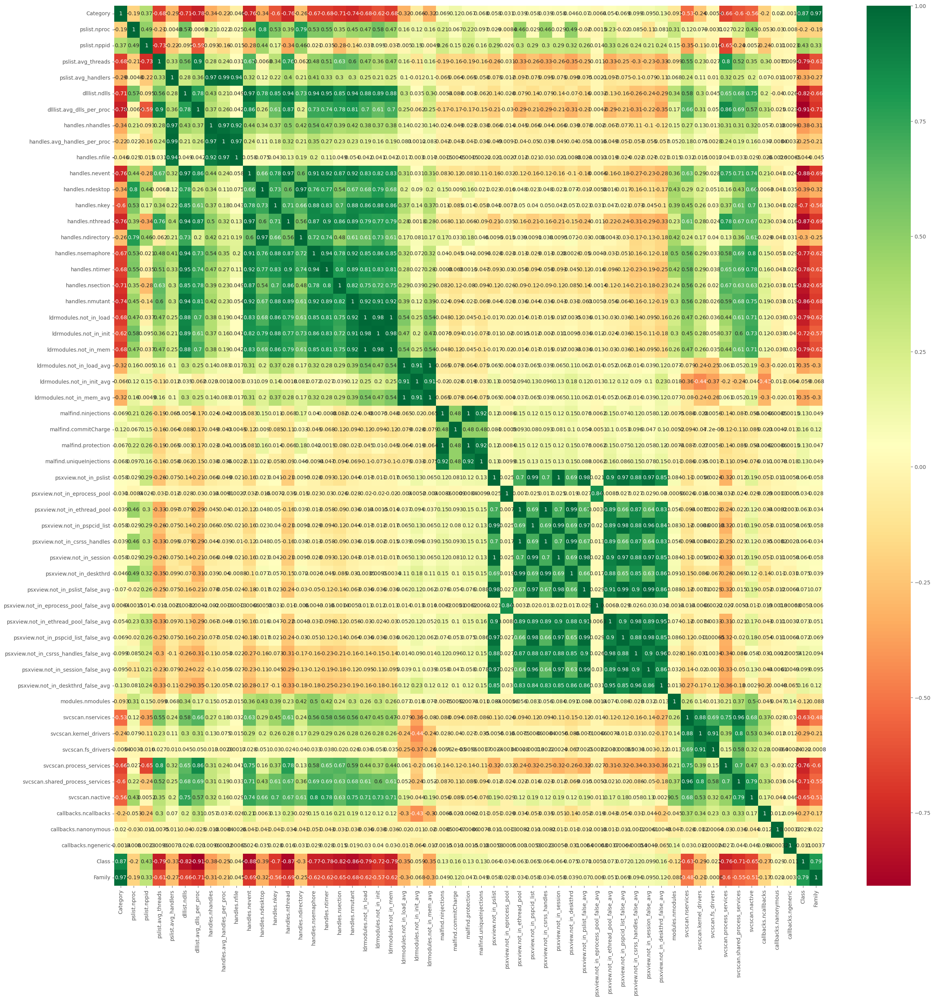

In [87]:
top_corr_feats=corrmat.index
plt.figure(figsize=(30,30))
g= sns.heatmap(dataset2[top_corr_feats].corr(), annot=True, cmap="RdYlGn")

# testes

In [88]:
dataset.Family.unique()
Family= ['Benign', 'Ako', 'Conti', 'Maze', 'Pysa', 'Shade', '180solutions',
       'CWS', 'Gator', 'TIBS', 'Transponder', 'Emotet', 'Reconyc',
       'Refroso', 'Scar', 'Zeus']
Code3=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
Class = ["Benign", "Malware"]
Code1=[0,1]

Category=['Benign', 'Ransomware', 'Spyware', 'Trojan']
Code2=[0,1,2,3]

In [89]:
datasetTest= dataset.copy()

In [90]:
datasetTest["Class"].replace(Class, Code1, inplace= True)
datasetTest["Family"].replace(Family, Code3, inplace= True)
datasetTest["Category"].replace(Category, Code2, inplace= True)
datasetTest.drop(["pslist.nprocs64bit","handles.nport","svcscan.interactive_process_services"], axis= 1, inplace= True)

In [91]:
datasetTest

,Category,pslist.nproc,pslist.nppid,pslist.avg_threads,pslist.avg_handlers,dlllist.ndlls,dlllist.avg_dlls_per_proc,handles.nhandles,handles.avg_handles_per_proc,handles.nfile,handles.nevent,handles.ndesktop,handles.nkey,handles.nthread,handles.ndirectory,handles.nsemaphore,handles.ntimer,handles.nsection,handles.nmutant,ldrmodules.not_in_load,ldrmodules.not_in_init,ldrmodules.not_in_mem,ldrmodules.not_in_load_avg,ldrmodules.not_in_init_avg,ldrmodules.not_in_mem_avg,malfind.ninjections,malfind.commitCharge,malfind.protection,malfind.uniqueInjections,psxview.not_in_pslist,psxview.not_in_eprocess_pool,psxview.not_in_ethread_pool,psxview.not_in_pspcid_list,psxview.not_in_csrss_handles,psxview.not_in_session,psxview.not_in_deskthrd,psxview.not_in_pslist_false_avg,psxview.not_in_eprocess_pool_false_avg,psxview.not_in_ethread_pool_false_avg,psxview.not_in_pspcid_list_false_avg,psxview.not_in_csrss_handles_false_avg,psxview.not_in_session_false_avg,psxview.not_in_deskthrd_false_avg,modules.nmodules,svcscan.nservices,svcscan.kernel_drivers,svcscan.fs_drivers,svcscan.process_services,svcscan.shared_process_services,svcscan.nactive,callbacks.ncallbacks,callbacks.nanonymous,callbacks.ngeneric,Class,Family
0,0,45,17,10.555556,202.844444,1694,38.500000,9129,212.302326,670,3161,46,716,887,104,671,125,184,257,53,95,53,0.030372,0.054441,0.030372,5,21,30,1.250000,2,0,3,2,7,4,9,0.042553,0.0,0.063830,0.042553,0.148936,0.085106,0.191489,138,389,221,26,24,116,121,87,0,8,0,0
1,0,47,19,11.531915,242.234043,2074,44.127660,11385,242.234043,840,3761,51,1011,1030,117,766,148,337,394,77,123,77,0.036167,0.057774,0.036167,12,77,72,1.714286,0,0,0,0,4,2,6,0.000000,0.0,0.000000,0.000000,0.085106,0.042553,0.127660,138,392,222,26,24,118,122,87,0,8,0,0
2,0,40,14,14.725000,288.225000,1932,48.300000,11529,288.225000,1050,3996,45,784,1241,100,645,138,369,338,51,89,51,0.026114,0.045571,0.026114,5,6,30,1.250000,0,0,0,0,4,2,5,0.000000,0.0,0.000000,0.000000,0.100000,0.050000,0.125000,137,395,222,26,27,118,120,88,0,8,0,0
3,0,32,13,13.500000,264.281250,1445,45.156250,8457,264.281250,630,2961,36,654,792,83,567,127,186,242,31,62,31,0.021483,0.042966,0.021483,2,2,12,1.000000,0,0,0,0,4,2,6,0.000000,0.0,0.000000,0.000000,0.125000,0.062500,0.187500,138,395,222,26,27,118,120,88,0,8,0,0
4,0,42,16,11.452381,281.333333,2067,49.214286,11816,281.333333,908,3834,45,1252,942,103,825,135,375,429,102,143,102,0.047820,0.067042,0.047820,12,77,72,2.000000,4,0,4,4,8,6,10,0.086957,0.0,0.086957,0.086957,0.173913,0.130435,0.217391,138,392,222,26,24,118,124,87,0,8,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58591,1,37,15,10.108108,215.486487,1453,39.270270,7973,215.486487,630,2819,40,668,664,92,596,113,161,230,43,79,43,0.029292,0.053815,0.029292,3,3,18,1.000000,1,0,1,1,5,3,7,0.026316,0.0,0.026316,0.026316,0.131579,0.078947,0.184211,138,389,221,26,24,116,120,86,0,8,1,5
58592,1,37,14,9.945946,190.216216,1347,36.405405,7038,190.216216,603,2394,39,555,624,91,482,102,111,203,43,79,43,0.030958,0.056875,0.030958,3,3,18,1.000000,0,0,0,0,4,2,6,0.000000,0.0,0.000000,0.000000,0.108108,0.054054,0.162162,138,389,221,26,24,116,116,88,0,8,1,5
58593,1,38,15,9.842105,210.026316,1448,38.105263,7982,215.729730,624,2816,40,673,661,92,596,113,167,230,43,79,43,0.029292,0.053815,0.029292,3,3,18,1.000000,2,0,3,2,7,4,9,0.050000,0.0,0.075000,0.050000,0.175000,0.100000,0.225000,138,389,221,26,24,116,120,88,0,8,1,5
58594,1,37,15,10.243243,215.513513,1452,39.243243,7974,215.513513,632,2819,40,668,667,92,596,113,161,230,43,79,43,0.029392,0.053999,0.029392,3,3,18,1.000000,0,0,0,0,4,2,6,0.000000,0.0,0.000000,0.000000,0.108108,0.054054,0.162162,138,389,221,26,24,116,120,87,0,8,1,5


In [106]:
dataset2

,Category,pslist.nproc,pslist.nppid,pslist.avg_threads,pslist.avg_handlers,dlllist.ndlls,dlllist.avg_dlls_per_proc,handles.nhandles,handles.avg_handles_per_proc,handles.nfile,handles.nevent,handles.ndesktop,handles.nkey,handles.nthread,handles.ndirectory,handles.nsemaphore,handles.ntimer,handles.nsection,handles.nmutant,ldrmodules.not_in_load,ldrmodules.not_in_init,ldrmodules.not_in_mem,ldrmodules.not_in_load_avg,ldrmodules.not_in_init_avg,ldrmodules.not_in_mem_avg,malfind.ninjections,malfind.commitCharge,malfind.protection,malfind.uniqueInjections,psxview.not_in_pslist,psxview.not_in_eprocess_pool,psxview.not_in_ethread_pool,psxview.not_in_pspcid_list,psxview.not_in_csrss_handles,psxview.not_in_session,psxview.not_in_deskthrd,psxview.not_in_pslist_false_avg,psxview.not_in_eprocess_pool_false_avg,psxview.not_in_ethread_pool_false_avg,psxview.not_in_pspcid_list_false_avg,psxview.not_in_csrss_handles_false_avg,psxview.not_in_session_false_avg,psxview.not_in_deskthrd_false_avg,modules.nmodules,svcscan.nservices,svcscan.kernel_drivers,svcscan.fs_drivers,svcscan.process_services,svcscan.shared_process_services,svcscan.nactive,callbacks.ncallbacks,callbacks.nanonymous,callbacks.ngeneric,Class,Family
0,0,45,17,10.555556,202.844444,1694,38.500000,9129,212.302326,670,3161,46,716,887,104,671,125,184,257,53,95,53,0.030372,0.054441,0.030372,5,21,30,1.250000,2,0,3,2,7,4,9,0.042553,0.0,0.063830,0.042553,0.148936,0.085106,0.191489,138,389,221,26,24,116,121,87,0,8,0,0
1,0,47,19,11.531915,242.234043,2074,44.127660,11385,242.234043,840,3761,51,1011,1030,117,766,148,337,394,77,123,77,0.036167,0.057774,0.036167,12,77,72,1.714286,0,0,0,0,4,2,6,0.000000,0.0,0.000000,0.000000,0.085106,0.042553,0.127660,138,392,222,26,24,118,122,87,0,8,0,0
2,0,40,14,14.725000,288.225000,1932,48.300000,11529,288.225000,1050,3996,45,784,1241,100,645,138,369,338,51,89,51,0.026114,0.045571,0.026114,5,6,30,1.250000,0,0,0,0,4,2,5,0.000000,0.0,0.000000,0.000000,0.100000,0.050000,0.125000,137,395,222,26,27,118,120,88,0,8,0,0
3,0,32,13,13.500000,264.281250,1445,45.156250,8457,264.281250,630,2961,36,654,792,83,567,127,186,242,31,62,31,0.021483,0.042966,0.021483,2,2,12,1.000000,0,0,0,0,4,2,6,0.000000,0.0,0.000000,0.000000,0.125000,0.062500,0.187500,138,395,222,26,27,118,120,88,0,8,0,0
4,0,42,16,11.452381,281.333333,2067,49.214286,11816,281.333333,908,3834,45,1252,942,103,825,135,375,429,102,143,102,0.047820,0.067042,0.047820,12,77,72,2.000000,4,0,4,4,8,6,10,0.086957,0.0,0.086957,0.086957,0.173913,0.130435,0.217391,138,392,222,26,24,118,124,87,0,8,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58591,1,37,15,10.108108,215.486487,1453,39.270270,7973,215.486487,630,2819,40,668,664,92,596,113,161,230,43,79,43,0.029292,0.053815,0.029292,3,3,18,1.000000,1,0,1,1,5,3,7,0.026316,0.0,0.026316,0.026316,0.131579,0.078947,0.184211,138,389,221,26,24,116,120,86,0,8,1,5
58592,1,37,14,9.945946,190.216216,1347,36.405405,7038,190.216216,603,2394,39,555,624,91,482,102,111,203,43,79,43,0.030958,0.056875,0.030958,3,3,18,1.000000,0,0,0,0,4,2,6,0.000000,0.0,0.000000,0.000000,0.108108,0.054054,0.162162,138,389,221,26,24,116,116,88,0,8,1,5
58593,1,38,15,9.842105,210.026316,1448,38.105263,7982,215.729730,624,2816,40,673,661,92,596,113,167,230,43,79,43,0.029292,0.053815,0.029292,3,3,18,1.000000,2,0,3,2,7,4,9,0.050000,0.0,0.075000,0.050000,0.175000,0.100000,0.225000,138,389,221,26,24,116,120,88,0,8,1,5
58594,1,37,15,10.243243,215.513513,1452,39.243243,7974,215.513513,632,2819,40,668,667,92,596,113,161,230,43,79,43,0.029392,0.053999,0.029392,3,3,18,1.000000,0,0,0,0,4,2,6,0.000000,0.0,0.000000,0.000000,0.108108,0.054054,0.162162,138,389,221,26,24,116,120,87,0,8,1,5


In [92]:
X = datasetTest.drop(["Category","Class","Family"], axis=1)
Y = datasetTest["Category"]

In [93]:
x_train,x_test, y_train,y_test= train_test_split(X, Y, test_size=0.2, random_state=0)

In [162]:
train= xgb.DMatrix(x_train, label=y_train, enable_categorical= True)
test= xgb.DMatrix(x_test, label=y_test, enable_categorical= True)

In [94]:
param={
    "max_depth":10,
    "eta": 0.2,
    "objective": "multi:softmax",
    "num_class": 16}
epochs = 100

In [166]:
#model= xgb.train(param, train, epochs)
model= xgb.XGBClassifier(eta= 0.2, max_depth=10, objective= "multi:softmax",n_estimators=1000)

In [167]:
model.fit(x_train,y_train, eval_set=[(x_test, y_test)])

[0]	validation_0-mlogloss:1.12798
[1]	validation_0-mlogloss:0.95769
[2]	validation_0-mlogloss:0.83306
[3]	validation_0-mlogloss:0.73835
[4]	validation_0-mlogloss:0.66459
[5]	validation_0-mlogloss:0.60667
[6]	validation_0-mlogloss:0.56014
[7]	validation_0-mlogloss:0.52038
[8]	validation_0-mlogloss:0.48756
[9]	validation_0-mlogloss:0.46000
[10]	validation_0-mlogloss:0.43727
[11]	validation_0-mlogloss:0.41821
[12]	validation_0-mlogloss:0.40315
[13]	validation_0-mlogloss:0.39058
[14]	validation_0-mlogloss:0.38007
[15]	validation_0-mlogloss:0.37032
[16]	validation_0-mlogloss:0.36239
[17]	validation_0-mlogloss:0.35549
[18]	validation_0-mlogloss:0.35007
[19]	validation_0-mlogloss:0.34423
[20]	validation_0-mlogloss:0.33928
[21]	validation_0-mlogloss:0.33523
[22]	validation_0-mlogloss:0.33121
[23]	validation_0-mlogloss:0.32808
[24]	validation_0-mlogloss:0.32525
[25]	validation_0-mlogloss:0.32290
[26]	validation_0-mlogloss:0.32020
[27]	validation_0-mlogloss:0.31797
[28]	validation_0-mlogloss:0.3

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False, eta=0.2,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.200000003, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=10, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softmax',
              predictor='auto', random_state=0, ...)

In [150]:
model.evals_result()

{'validation_0': OrderedDict([('logloss',
               [0.5134270686185808,
                0.39270112265041257,
                0.3061645026296479,
                0.24172552664074476,
                0.19260892346628494,
                0.15450006809988323,
                0.12442969920895612,
                0.10060713250355305,
                0.08164529736716389,
                0.06642379425593203,
                0.05418249404966933,
                0.04429752497104197,
                0.03628705532223291,
                0.02980237698115714,
                0.02452570182722659,
                0.02022631856606504,
                0.01672805432188913,
                0.01389408226525443,
                0.01157096088927481,
                0.0096508127839047,
                0.00808483579449527,
                0.00680113203343602,
                0.00575813671066219,
                0.00490724112999025,
                0.00420872958779491,
                0.0036370151602137,


Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.


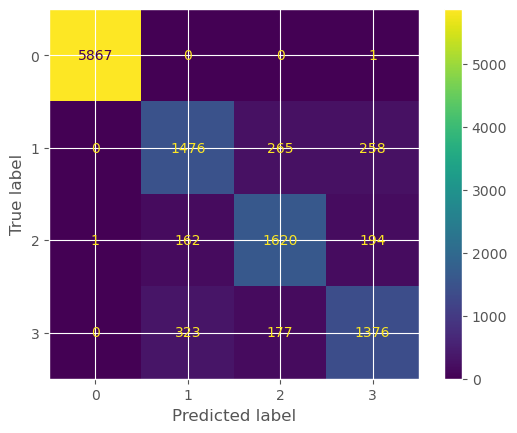

In [168]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(model, x_test, y_test, values_format='d')

In [ ]:
from sklearn.metrics import accuracy_score

In [149]:
accuracy_score(y_test, predictions)

0.5296075085324232

In [94]:
#time function
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now()- start_time).total_seconds(), 3600)
        tmin, tsec= divmod(temp_sec, 60)
        print("\n Time taken: %i hours %i minutes and %i seconds." % (thour, tmin, round(tsec,2)))

In [95]:
#param optimization
params = {
    "learning_rate": [0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
    "max_depth": [5,10,15,20],
    "min_child_weight": [1,3,5,7],
    "gamma": [0.0, 0.1, 0.2, 0.3, 0.4],
    "colsample_bytree": [0.3, 0.4, 0.5, 0.7],
    "early_stopping_rounds": [25,50,100],
    "n_estimators": [100,200,500,1000]
}

In [96]:
Classifier= xgb.XGBClassifier()

In [97]:
Classifier= xgb.XGBClassifier()
random_search=RandomizedSearchCV(Classifier, param_distributions=params, n_iter=5, n_jobs=-1,cv=3)

In [98]:
start_time=timer(None)
random_search.fit(x_train,y_train, eval_set=[(x_test, y_test)])
timer(start_time)

[0]	validation_0-mlogloss:1.14313
[1]	validation_0-mlogloss:0.97874
[2]	validation_0-mlogloss:0.85527
[3]	validation_0-mlogloss:0.76002
[4]	validation_0-mlogloss:0.68903
[5]	validation_0-mlogloss:0.63272
[6]	validation_0-mlogloss:0.58283
[7]	validation_0-mlogloss:0.54361
[8]	validation_0-mlogloss:0.51017
[9]	validation_0-mlogloss:0.48177
[10]	validation_0-mlogloss:0.45940
[11]	validation_0-mlogloss:0.44018
[12]	validation_0-mlogloss:0.42503
[13]	validation_0-mlogloss:0.41253
[14]	validation_0-mlogloss:0.40005
[15]	validation_0-mlogloss:0.38819
[16]	validation_0-mlogloss:0.37896
[17]	validation_0-mlogloss:0.37105
[18]	validation_0-mlogloss:0.36362
[19]	validation_0-mlogloss:0.35831
[20]	validation_0-mlogloss:0.35199
[21]	validation_0-mlogloss:0.34747
[22]	validation_0-mlogloss:0.34261
[23]	validation_0-mlogloss:0.33900
[24]	validation_0-mlogloss:0.33568
[25]	validation_0-mlogloss:0.33293
[26]	validation_0-mlogloss:0.33074
[27]	validation_0-mlogloss:0.32855
[28]	validation_0-mlogloss:0.3

In [99]:
random_search.best_params_

{'n_estimators': 500,
 'min_child_weight': 1,
 'max_depth': 10,
 'learning_rate': 0.2,
 'gamma': 0.2,
 'early_stopping_rounds': 25,
 'colsample_bytree': 0.3}

In [100]:
Classifier2= xgb.XGBClassifier(n_estimators=500,
 min_child_weight=1,
 max_depth=10,
 learning_rate=0.2,
 gamma=0.2,
 early_stopping_rounds=25,
 colsample_bytree=0.3)
Classifier2.fit(x_train,y_train, eval_set=[(x_test, y_test)])

In [101]:
Classifier2.fit(x_train,y_train, eval_set=[(x_test, y_test)])

[0]	validation_0-mlogloss:1.14313
[1]	validation_0-mlogloss:0.97874
[2]	validation_0-mlogloss:0.85527
[3]	validation_0-mlogloss:0.76002
[4]	validation_0-mlogloss:0.68903
[5]	validation_0-mlogloss:0.63272
[6]	validation_0-mlogloss:0.58283
[7]	validation_0-mlogloss:0.54361
[8]	validation_0-mlogloss:0.51017
[9]	validation_0-mlogloss:0.48177
[10]	validation_0-mlogloss:0.45940
[11]	validation_0-mlogloss:0.44018
[12]	validation_0-mlogloss:0.42503
[13]	validation_0-mlogloss:0.41253
[14]	validation_0-mlogloss:0.40005
[15]	validation_0-mlogloss:0.38819
[16]	validation_0-mlogloss:0.37896
[17]	validation_0-mlogloss:0.37105
[18]	validation_0-mlogloss:0.36362
[19]	validation_0-mlogloss:0.35831
[20]	validation_0-mlogloss:0.35199
[21]	validation_0-mlogloss:0.34747
[22]	validation_0-mlogloss:0.34261
[23]	validation_0-mlogloss:0.33900
[24]	validation_0-mlogloss:0.33568
[25]	validation_0-mlogloss:0.33293
[26]	validation_0-mlogloss:0.33074
[27]	validation_0-mlogloss:0.32855
[28]	validation_0-mlogloss:0.3

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.3,
              early_stopping_rounds=25, enable_categorical=False,
              eval_metric=None, gamma=0.2, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.2, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=10, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=500,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

In [102]:
y_predxgb= Classifier2.predict(x_test)

In [103]:
from sklearn.metrics import accuracy_score
y_predxgb= Classifier2.predict(x_test)
predictions = [round(value) for value in y_predxgb]
accuracy = accuracy_score(y_test, predictions)
accuracy

In [104]:
accuracy

0.8843003412969284

In [105]:
score= cross_val_score(Classifier2,X,Y,cv=10)

ValueError: 
All the 10 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\rodri\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\rodri\anaconda3\lib\site-packages\xgboost\core.py", line 575, in inner_f
    return f(**kwargs)
  File "C:\Users\rodri\anaconda3\lib\site-packages\xgboost\sklearn.py", line 1400, in fit
    self._Booster = train(
  File "C:\Users\rodri\anaconda3\lib\site-packages\xgboost\core.py", line 575, in inner_f
    return f(**kwargs)
  File "C:\Users\rodri\anaconda3\lib\site-packages\xgboost\training.py", line 182, in train
    if cb_container.after_iteration(bst, i, dtrain, evals):
  File "C:\Users\rodri\anaconda3\lib\site-packages\xgboost\callback.py", line 246, in after_iteration
    ret = any(c.after_iteration(model, epoch, self.history)
  File "C:\Users\rodri\anaconda3\lib\site-packages\xgboost\callback.py", line 246, in <genexpr>
    ret = any(c.after_iteration(model, epoch, self.history)
  File "C:\Users\rodri\anaconda3\lib\site-packages\xgboost\callback.py", line 411, in after_iteration
    assert len(evals_log.keys()) >= 1, msg
AssertionError: Must have at least 1 validation dataset for early stopping.


In [219]:
score

array([0.75921502, 0.79573379, 0.85170648, 0.86791809, 0.88037543,
       0.87645051, 0.86072709, 0.86448199, 0.81276668, 0.80235535])

In [220]:
score.mean()

0.8371730431930805

In [186]:
from datetime import datetime